# PROJET 7 : Implémentez un modèle de scoring

#### Context : Au sein d'une société financière, nommée "Prêt à dépenser", qui propose des crédits à la consommation pour des personnes ayant peu ou pas du tout d'historique de prêt.


 
L’entreprise souhaite mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc développer un algorithme de classification en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières, etc.).

De plus, les chargés de relation client ont fait remonter le fait que les clients sont de plus en plus demandeurs de transparence vis-à-vis des décisions d’octroi de crédit. Cette demande de transparence des clients va tout à fait dans le sens des valeurs que l’entreprise veut incarner.

Prêt à dépenser décide donc de développer un dashboard interactif pour que les chargés de relation client puissent à la fois expliquer de façon la plus transparente possible les décisions d’octroi de crédit, mais également permettre à leurs clients de disposer de leurs informations personnelles et de les explorer facilement. 


- Mission
    * Construire un modèle de scoring qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique.
    * Construire un dashboard interactif à destination des gestionnaires de la relation client permettant d'interpréter les prédictions faites par le modèle, et d’améliorer la connaissance client des chargés de relation client.
    * Mettre en production le modèle de scoring de prédiction à l’aide d’une API, ainsi que le dashboard interactif qui appelle l’API pour les prédictions.

Ensemble des jeux de données à dispostion : 
    ![Logo](https://miro.medium.com/max/4800/0*IMyhw8RGEoDhC7t1.webp)

### Sommaire : 
- Exploratory data analysis (Application test |train - merge)
- feature engineering
- Mise en place des modèles -BinaryClassification (lgbm,etc..) :
- Conclusion 

In [1]:
# Chargement des librairies
import datetime
import sys
import time
from datetime import datetime
import warnings
import phik
import pickle

import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Modelisation
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Features selection
from boruta import BorutaPy
from BorutaShap import BorutaShap
from collections import Counter

# Data pré-processing
import sklearn
from sklearn.preprocessing import StandardScaler, MinMaxScaler, \
    PowerTransformer, RobustScaler
# Oversampling
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, ADASYN
# UnderSampling
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

# Modelisation
# Préparation
from sklearn.model_selection import train_test_split, StratifiedKFold


# Modèles
#import pycaret
#from pycaret.classification import *
import lightgbm as lgb
from lightgbm import LGBMClassifier
# Optimisation bayésienne
from bayes_opt import BayesianOptimization
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, VerboseCallback
from skopt.space import Real, Categorical, Integer
# Optimisation optuna
import optuna
from optuna.distributions import IntUniformDistribution as IntUniDist
from optuna.distributions import UniformDistribution as UniDist
from optuna.distributions import LogUniformDistribution as LogUniDist
from optuna.distributions import CategoricalDistribution as CatDist
# Métriques
from sklearn.metrics import roc_auc_score, average_precision_score, \
    fbeta_score, make_scorer

# Interprétation
import shap

# Plotly
import plotly
# import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Warnings
warnings.filterwarnings('ignore')
plotly.offline.init_notebook_mode(connected=True)

%matplotlib inline

%load_ext autoreload
%autoreload 2

# Versions
print('Version des librairies utilisées :')

print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Lightgbm              : ' + lgb.__version__)
print('Scikit-learn          : ' + sklearn.__version__)
#print('Matplotlib            : ' + matplotlib.__version__)
print('Seaborn               : ' + sns.__version__)
#print('Pycaret               : ' + pycaret.__version__)
print('Shape                 : ' + shap.__version__)

now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
Python                : 3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.23.5
Pandas                : 1.5.2
Lightgbm              : 3.3.4
Scikit-learn          : 1.1.3
Seaborn               : 0.12.1
Shape                 : 0.41.0
Lancé le           : 2023-03-01T22:00:26.954823


In [2]:
PATH = "Data/"

### 1. Jeux de données 
#### 1.1 Aperçu

In [4]:
# PEP 8
# -- LISTER LES FICHIERS D'UN REPERTOIRE AVEC LA TAILLE DES FICHIERS
# -----------------------------------------------------------------------


def lister_fichiers_repertoire(chemin_rep):
    '''
    Liste les noms des fichiers d'un répertoire et affiche la taille des
    fichiers en MegaBytes.
    Parameters
    ----------
    chemin_rep : chemin où se trouve le répertoire contenant les fichiers,
                 obligatoire.
    Returns
    -------
    None
    '''
    liste_fichiers = list(os.listdir(chemin_rep))
    dataframe_fic = pd.DataFrame(liste_fichiers, columns=['Nom_fichier'])
    dataframe_fic['Size_en_MB'] = dataframe_fic.Nom_fichier.apply(
        lambda x: round(os.stat(chemin_rep + x) .st_size / (1024 * 1024), 2))
    nb_fic = dataframe_fic.shape[0]
    if nb_fic > 1:
        display(str(nb_fic) + ' fichiers présents dans ce répertoire :')
    else:
        display(str() + ' fichier présent')

    return dataframe_fic.style.hide_index()

In [5]:
lister_fichiers_repertoire(PATH)

'10 fichiers présents dans ce répertoire :'

Nom_fichier,Size_en_MB
application_test.csv,25.340000
application_train.csv,158.440000
bureau.csv,162.140000
bureau_balance.csv,358.190000
credit_card_balance.csv,404.910000
HomeCredit_columns_description.csv,0.040000
installments_payments.csv,689.620000
POS_CASH_balance.csv,374.510000
previous_application.csv,386.210000
sample_submission.csv,0.510000


Remarque :
...

In [6]:
PATH01 = 'Data'

In [7]:
def load_all_tables(directory_path='', verbose=True):
    '''
    Function to load all the tables required
    Input:
        directory_path: str, default = ''
            Path of directory in which tables are stored in
        verbose: bool, default = True
            Whether to keep verbosity or not
    '''
    if verbose:
        print("Chargement des jeux de donnees...")
        print("--------------------------------------------------------------------")
        start = datetime.now()

    application_train = pd.read_csv(directory_path + '/application_train.csv')
    if verbose:
        print("Fichier application_train.csv chargé -> dataframe : application_train")

    application_test = pd.read_csv(directory_path + '/application_test.csv')
    if verbose:
        print("Fichier application_test.csv chargé -> dataframe : application_test")

    bureau = pd.read_csv(directory_path + '/bureau.csv')
    if verbose:
        print("Fichier bureau.csv chargé -> dataframe : bureau")

    bureau_balance = pd.read_csv(directory_path + '/bureau_balance.csv')
    if verbose:
        print("Fichier bureau_balance.csv chargé -> dataframe : bureau_balance")

    cc_balance = pd.read_csv(directory_path +'/credit_card_balance.csv')
    if verbose:
        print("Fichier credit_card_balance.csv chargé -> dataframe : cc_balance")

    installments_payments = pd.read_csv(
        directory_path + '/installments_payments.csv')
    if verbose:
        print(
            "Fichier installments_payments.csv chargé -> dataframe : installments_payments")

    POS_CASH_balance = pd.read_csv(directory_path + '/POS_CASH_balance.csv')
    if verbose:
        print("Fichier POS_CASH_balance.csv chargé -> dataframe : POS_CASH_balance")

    HomeCredit_columns_description = pd.read_csv(
        directory_path +
        '/HomeCredit_columns_description.csv',
        encoding='cp1252')
    del HomeCredit_columns_description['Unnamed: 0']
    if verbose:
        print("Fichier HomeCredit_columns_description.csv chargé -> dataframe : HomeCredit_columns_description")

    previous_application = pd.read_csv(
        directory_path + '/previous_application.csv')
    if verbose:
        print("Fichier previous_application.csv chargé -> dataframe : previous_application")

    if verbose:
        print("--------------------------------------------------------------------")
        print(
            f'Chargement des 9 jeux de donnees terminée en {datetime.now() - start} secondes')

    return application_train, application_test, bureau, bureau_balance, \
        cc_balance, installments_payments, POS_CASH_balance, previous_application, \
        

In [8]:
# Point de vue de l'ensemble de nos donnée(9 datsets) :

load_all_tables(PATH01)

Chargement des jeux de donnees...
--------------------------------------------------------------------
Fichier application_train.csv chargé -> dataframe : application_train
Fichier application_test.csv chargé -> dataframe : application_test
Fichier bureau.csv chargé -> dataframe : bureau
Fichier bureau_balance.csv chargé -> dataframe : bureau_balance
Fichier credit_card_balance.csv chargé -> dataframe : cc_balance
Fichier installments_payments.csv chargé -> dataframe : installments_payments
Fichier POS_CASH_balance.csv chargé -> dataframe : POS_CASH_balance
Fichier HomeCredit_columns_description.csv chargé -> dataframe : HomeCredit_columns_description
Fichier previous_application.csv chargé -> dataframe : previous_application
--------------------------------------------------------------------
Chargement des 9 jeux de donnees terminée en 0:01:10.114499 secondes


(        SK_ID_CURR  TARGET NAME_CONTRACT_TYPE CODE_GENDER FLAG_OWN_CAR  \
 0           100002       1         Cash loans           M            N   
 1           100003       0         Cash loans           F            N   
 2           100004       0    Revolving loans           M            Y   
 3           100006       0         Cash loans           F            N   
 4           100007       0         Cash loans           M            N   
 ...            ...     ...                ...         ...          ...   
 307506      456251       0         Cash loans           M            N   
 307507      456252       0         Cash loans           F            N   
 307508      456253       0         Cash loans           F            N   
 307509      456254       1         Cash loans           F            N   
 307510      456255       0         Cash loans           F            N   
 
        FLAG_OWN_REALTY  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  \
 0                    Y    

In [9]:
def resume_datasets(dataframes, noms):
    '''
    Résumé rapide du contenu, nom, nombre de lignes, nombre de variables,
    valeurs manquantes, variable avec valeurs manquantes... pour plusieurs
    dataframes transmis en paramètres.
    Parameters
    ----------
    dataframes : les dataframes à résumer, obligatoire.
    noms : les noms des dataframes transmis, obligatoire.
    Returns
    -------
    df_resume : dataframe de résumé
    '''
    print(f'Les données se décomposent en {len(dataframes)} fichier(s).')

    # Creating a DataFrame with useful information about all datasets
    df_resume = pd.DataFrame({})
    df_resume['Jeu de données'] = noms
    df_resume['Nb lignes'] = [df.shape[0] for df in dataframes]
    df_resume['Nb variables'] = [df.shape[1] for df in dataframes]
    df_resume['Nb nan'] = [df.isnull().sum().sum() for df in dataframes]
    df_resume['% nan'] = [(df.isnull().sum().sum() * 100 / np.product(df.shape)) for df in dataframes]
    df_resume['Nb var avec nan'] = [len(
        [col for col, null in df.isnull().sum().items() if null > 0]) for df in dataframes]
    df_resume['Var avec nan'] = [', '.join(
        [col for col, null in df.isnull().sum().items() if null > 0]) for df in dataframes]

    return df_resume.style.hide_index()

In [10]:
# Vue d'ensemble des 9 jeux de données
application_train = pd.read_csv('Data/application_train.csv')
application_test = pd.read_csv('Data/application_test.csv')
bureau = pd.read_csv('Data/bureau.csv')
bureau_balance = pd.read_csv('Data/bureau_balance.csv')
cc_balance = pd.read_csv('Data/credit_card_balance.csv')
installments_payments = pd.read_csv('Data/installments_payments.csv')
POS_CASH_balance = pd.read_csv('Data/POS_CASH_balance.csv')
previous_application = pd.read_csv('Data/previous_application.csv')
HomeCredit_columns_description = pd.read_csv('Data/HomeCredit_columns_description.csv', encoding = 'latin1')


dataframes = [application_train,application_test,bureau,bureau_balance,cc_balance,installments_payments,
                POS_CASH_balance,previous_application,HomeCredit_columns_description]
                
noms = ['application_train', 'application_test', 'bureau', 'bureau_balance',
        'cc_balance', 'installments_payments', 'POS_CASH_balance',
        'previous_application', 'HomeCredit_columns_description']

resume_datasets(dataframes, noms)


Les données se décomposent en 9 fichier(s).


Jeu de données,Nb lignes,Nb variables,Nb nan,% nan,Nb var avec nan,Var avec nan
application_train,307511,122,9152465,24.395942,67,"AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, CNT_FAM_MEMBERS, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
application_test,48744,121,1404419,23.811687,64,"AMT_ANNUITY, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
bureau,1716428,17,3939947,13.502552,7,"DAYS_CREDIT_ENDDATE, DAYS_ENDDATE_FACT, AMT_CREDIT_MAX_OVERDUE, AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_LIMIT, AMT_ANNUITY"
bureau_balance,27299925,3,0,0.000000,0,
cc_balance,3840312,23,5877356,6.654074,9,"AMT_DRAWINGS_ATM_CURRENT, AMT_DRAWINGS_OTHER_CURRENT, AMT_DRAWINGS_POS_CURRENT, AMT_INST_MIN_REGULARITY, AMT_PAYMENT_CURRENT, CNT_DRAWINGS_ATM_CURRENT, CNT_DRAWINGS_OTHER_CURRENT, CNT_DRAWINGS_POS_CURRENT, CNT_INSTALMENT_MATURE_CUM"
installments_payments,13605401,8,5810,0.005338,2,"DAYS_ENTRY_PAYMENT, AMT_PAYMENT"
POS_CASH_balance,10001358,8,52158,0.065189,2,"CNT_INSTALMENT, CNT_INSTALMENT_FUTURE"
previous_application,1670214,37,11109336,17.976877,16,"AMT_ANNUITY, AMT_CREDIT, AMT_DOWN_PAYMENT, AMT_GOODS_PRICE, RATE_DOWN_PAYMENT, RATE_INTEREST_PRIMARY, RATE_INTEREST_PRIVILEGED, NAME_TYPE_SUITE, CNT_PAYMENT, PRODUCT_COMBINATION, DAYS_FIRST_DRAWING, DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, DAYS_TERMINATION, NFLAG_INSURED_ON_APPROVAL"
HomeCredit_columns_description,219,5,133,12.146119,1,Special


In [11]:
#Application train :
application_train = pd.read_csv("Data/application_train.csv")
print('-'*100)
print(f'The shape of application_train.csv is: {application_train.shape}')
print('-'*100)
print(f'Number of duplicate values in application_train: {application_train.shape[0] - application_train.duplicated().shape[0]}')
print('-'*100)
display(application_train.head())

----------------------------------------------------------------------------------------------------
The shape of application_train.csv is: (307511, 122)
----------------------------------------------------------------------------------------------------
Number of duplicate values in application_train: 0
----------------------------------------------------------------------------------------------------


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
application_test = pd.read_csv("Data/application_train.csv")
print('-'*100)
print(f'The shape of application_test.csv is: {application_test.shape}')
print('-'*100)
print(f'Number of duplicate values in application_test: {application_test.shape[0] - application_test.duplicated().shape[0]}')
print('-'*100)
display(application_test.head())

----------------------------------------------------------------------------------------------------
The shape of application_test.csv is: (307511, 122)
----------------------------------------------------------------------------------------------------
Number of duplicate values in application_test: 0
----------------------------------------------------------------------------------------------------


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


Remarque :

application_train.csv :

    Le fichier application_train.csv contient environ 307 000 enregistrements et 122 fonctionnalités. Ces fonctionnalités contiennent les statistiques personnelles appartenant à un client particulier telles que son âge, ses revenus, son type de prêt, ses statistiques d'appartement, etc.
    Il existe 307 000 SK_ID_CURR uniques qui représentent des demandes de prêt uniques.
    Le champ CIBLE représente le statut de prêt en défaut, 0 signifie non-défaillant et 1 pour défaillant.

application_test.csv :

    Le fichier application_test.csv contient environ 48,7 000 enregistrements et 121 fonctionnalités. Ces fonctionnalités sont exactement celles qui se trouvent dans application_train.csv, sauf qu'il s'agit des ensembles d'apprentissage.
    Il existe 48.7k SK_ID_CURR uniques qui représentent des demandes de prêt uniques.
    La colonne TARGET a été omise et doit être prédite à l'aide de modèles statistiques prédictifs et d'apprentissage automatique.

In [13]:
def plot_nan_percent(df_nan, title_name, tight_layout = True, figsize = (20,8), grid = False, rotation = 90):
    
    '''
   Fonction pour tracer des graphiques à barres de pourcentages NaN pour chaque colonne avec des valeurs manquantes
    
    Contributions:
        df_nan :
            DataFrame de pourcentages NaN
        nom du titre:
            Nom du tableau à afficher dans le titre du tracé
        tight_layout : bool, par défaut = True
            Que ce soit pour garder une mise en page serrée ou non
        figsize : tuple, par défaut = (20,8)
            Taille de la figure de la parcelle
        grille : bool, défaut = False
            Que ce soit pour dessiner des lignes de grille à tracer ou non
        rotation : entier, par défaut = 0
            Degré de rotation pour les étiquettes x-tick 

    '''
    
    #checking if there is any column with NaNs or not.
    if df_nan.percent.sum() != 0:
        print(f"Number of columns having NaN values: {df_nan[df_nan['percent'] != 0].shape[0]} columns")
        
        #plotting the Bar-Plot for NaN percentages (only for columns with Non-Zero percentage of NaN values)
        plt.figure(figsize = figsize, tight_layout = tight_layout)
        sns.barplot(x= 'column', y = 'percent', data = df_nan[df_nan['percent'] > 0])
        plt.xticks(rotation = rotation)
        plt.xlabel('Column Name')
        plt.ylabel('Percentage of NaN values')
        plt.title(f'Percentage of NaN values in {title_name}')
        if grid:
            plt.grid()
        plt.show()
    else:
        print(f"The dataframe {title_name} does not contain any NaN values.")

In [14]:
def nan_df_create(data):
    
    '''
Fonction pour créer une trame de données de pourcentage de valeurs NaN pour chaque colonne de la trame de données
    
    Contributions:
        Les données:
            Trame de données
    
    Retour:
        DataFrame de pourcentages NaN
    '''
    
    nan_percentages = data.isna().sum() * 100 / len(data)
    df = pd.DataFrame({'column' : nan_percentages.index, 'percent' : nan_percentages.values})
    
    #sorting the dataframe by decreasing order of percentage of NaN values
    df.sort_values(by = 'percent', ascending = False, inplace = True)
    
    return df

Number of columns having NaN values: 67 columns


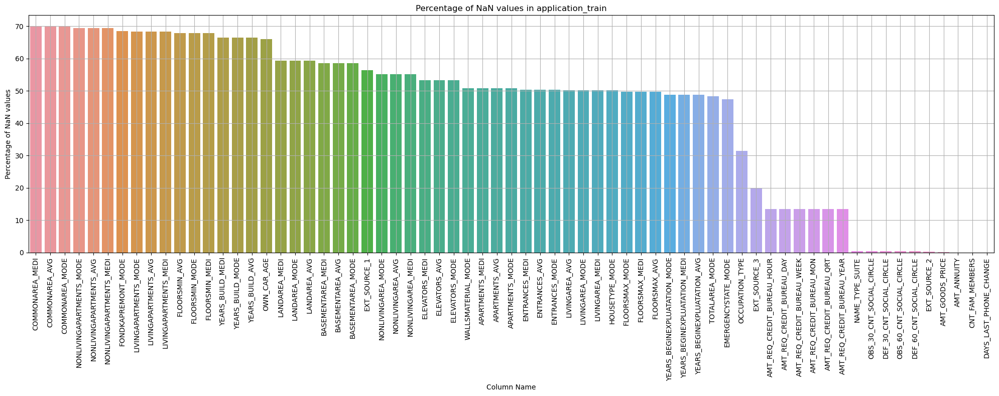

In [15]:
# NAN & Pourcentage :
plot_nan_percent(nan_df_create(application_train), 'application_train', grid = True)

Number of columns having NaN values: 67 columns


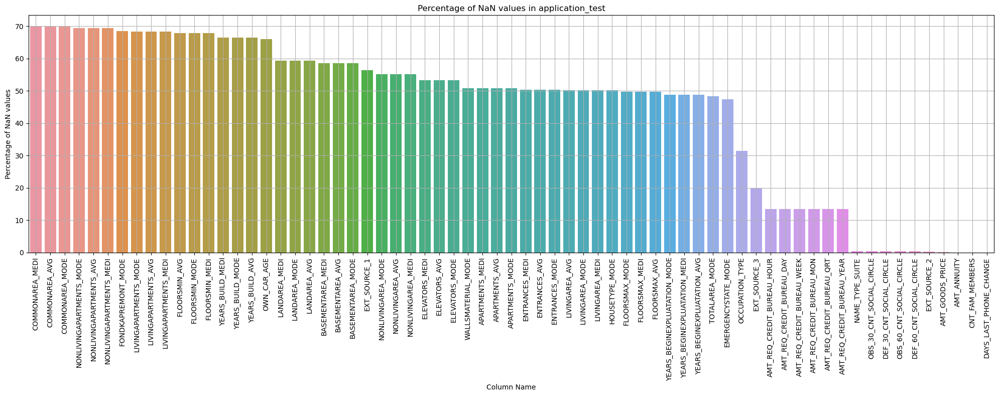

In [16]:
plot_nan_percent(nan_df_create(application_test), 'application_test', grid = True)

Remarque : 

application_train.csv :

    On peut voir sur le graphique ci-dessus qu'il y a 67 colonnes sur 122 caractéristiques qui contiennent des valeurs NaN. S'il n'y avait qu'une ou deux colonnes qui avaient des valeurs NaN, nous aurions pu nous en tirer en éliminant simplement ces colonnes, mais pour un si grand nombre de colonnes, nous ne pouvons pas les supprimer telles quelles, car la perte d'informations pourrait être très élevée.
    
    Nous voyons que certaines colonnes comme relatives à "COMMONAREA", "NONLIVINGAPARTMENT", etc. ont près de 70 % de valeurs manquantes. Nous devions trouver des techniques pour gérer ces nombreuses valeurs manquantes et voir ce qui fonctionnerait le mieux pour nos données.
    Une autre chose à noter ici est que la plupart des colonnes qui ont plus de 50 % de valeurs manquantes sont liées aux statistiques des appartements de l'emprunteur. Il est très probable que ces valeurs n'aient pas été enregistrées lors de la saisie des données et pourraient être facultatives.

application_test.csv :

    Il y a un nombre très similaire de colonnes avec des valeurs NaN (64) comme c'était le cas avec application_train.
    Les pourcentages de valeurs NaN sont également assez similaires à ceux présents dans l'ensemble de données d'entraînement. Cela signifie que les ensembles d'entraînement et de test ont une distribution à peu près similaire.

In [17]:
#Distribution des Targert:

target_distribution = application_train.TARGET.value_counts()
labels = ['Non-Defaulter', 'Defaulter']

fig = go.Figure(data = [
        go.Pie(values = target_distribution, labels = labels, textinfo = 'label+percent+value' , pull = [0,0.04])], 
         layout = go.Layout(title = 'Distribution of Target Variable'))

fig.show()

Remarque:

À partir de la distribution de la variable cible, une chose que nous pouvons rapidement remarquer est le déséquilibre des données. **Il n'y a que 8,07% du total des prêts qui ont effectivement été en défaut. Cela signifie que les défaillants sont la classe minoritaire.**

D'autre part, il y a 91,9% de prêts qui n'ont pas été en défaut. Ainsi, les non-défaillants seront notre classe majoritaire.
Les abandons se sont vu attribuer une variable cible de 1 et les non-abandons ont reçu la variable cible 0.

Pour un ensemble de données déséquilibré, lors de la construction du modèle, nous ne pouvons pas fournir les données telles quelles à certains algorithmes, qui sont sensibles au déséquilibre.

Il en va de même pour les mesures de performance. Pour un tel ensemble de données, la précision n'est généralement pas la bonne métrique, car la précision serait généralement biaisée par rapport à la classe majoritaire.

Nous pouvons utiliser d'autres mesures telles que **le score ROC-AUC**, la perte de log, le score F1, la matrice de confusion pour une meilleure évaluation du modèle.

    A noter ici est qu'il y a très peu de personnes qui font défaut, et elles ont tendance à montrer une sorte de comportement différent. 

Ainsi, dans de tels cas de détection de fraude, de défaut et d'anamolie, nous devons également nous concentrer sur les valeurs aberrantes, et nous ne pouvons pas les supprimer, car elles pourraient être le facteur de différenciation entre le défaillant et le non-défaillant.

Matrice Phi-K: 

Nous allons tracer une carte thermique des valeurs du coefficient de corrélation Phi-K entre chacune des caractéristiques avec l'autre.

Le coefficient Phi-K est similaire au coefficient de corrélation, sauf qu'il peut être utilisé avec une paire d'entités catégorielles pour vérifier si une entité présente une sorte d'association avec l'autre entité catégorielle.
 
- Sa valeur maximale peut être 1, ce qui montrerait une association maximale entre deux variables catégorielles.

In [18]:
def plot_phik_matrix(data, categorical_columns, figsize = (20,20), mask_upper = True, tight_layout = True, linewidth = 0.1, fontsize = 10, cmap = 'Blues', show_target_top_corr = True, target_top_columns = 10):
    
    '''
Fonction à la matrice Phi_k pour les caractéristiques catégorielles
    
    Contributions:
        données : DataFrame
            Le DataFrame à partir duquel construire la matrice de corrélation
        categorical_columns : liste
            Liste des colonnes catégorielles dont les valeurs PhiK doivent être tracées
        figsize : tuple, par défaut = (25,23)
            Taille de la figure à tracer
        mask_upper : bool, par défaut = Vrai
            S'il faut tracer uniquement le triangle inférieur de la carte thermique ou tracer complètement.
        tight_layout : bool, par défaut = True
            Que ce soit pour garder une mise en page serrée ou non
        largeur de ligne : float/int, par défaut = 0,1
            La largeur de ligne à utiliser pour la carte thermique
        taille de police : entier, par défaut = 10
            La taille de la police pour les étiquettes de coche X et Y
        cmap : str, par défaut = 'Blues'
            La palette de couleurs à utiliser pour la carte de chaleur
        show_target_top_corr : booléen, par défaut = Vrai
            Indique s'il faut afficher les fonctionnalités les plus corrélées/hautement corrélées avec la cible.
        target_top_columns : entier, par défaut = 10
            Le nombre d'entités les plus corrélées avec la cible à afficher
    '''
    
    #first fetching only the categorical features
    data_for_phik = data[categorical_columns].astype('object')
    phik_matrix = data_for_phik.phik_matrix()
    
    print('-'*100)
    
    if mask_upper:
        mask_array = np.ones(phik_matrix.shape)
        mask_array = np.triu(mask_array)
    else:
        mask_array = np.zeros(phik_matrix.shape)
        
    plt.figure(figsize = figsize, tight_layout = tight_layout)
    sns.heatmap(phik_matrix, annot = False, mask = mask_array, linewidth = linewidth, cmap = cmap)
    plt.xticks(rotation = 90, fontsize = fontsize)
    plt.yticks(rotation = 0, fontsize = fontsize)
    plt.title("Phi-K Correlation Heatmap for Categorical Features")
    plt.show()
    print("-"*100)

    if show_target_top_corr:
        #Voir les colonnes supérieures avec la corrélation la plus élevée avec la variable cible dans application_train
        print("Les catégories avec les valeurs les plus élevées de la valeur de corrélation Phi-K avec la variable cible sont:")
        phik_df = pd.DataFrame({'Column Name' : phik_matrix.TARGET.index[1:], 'Phik-Correlation' : phik_matrix.TARGET.values[1:]})
        phik_df = phik_df.sort_values(by = 'Phik-Correlation', ascending = False)
        display(phik_df.head(target_top_columns))
        print("-"*100) 

----------------------------------------------------------------------------------------------------


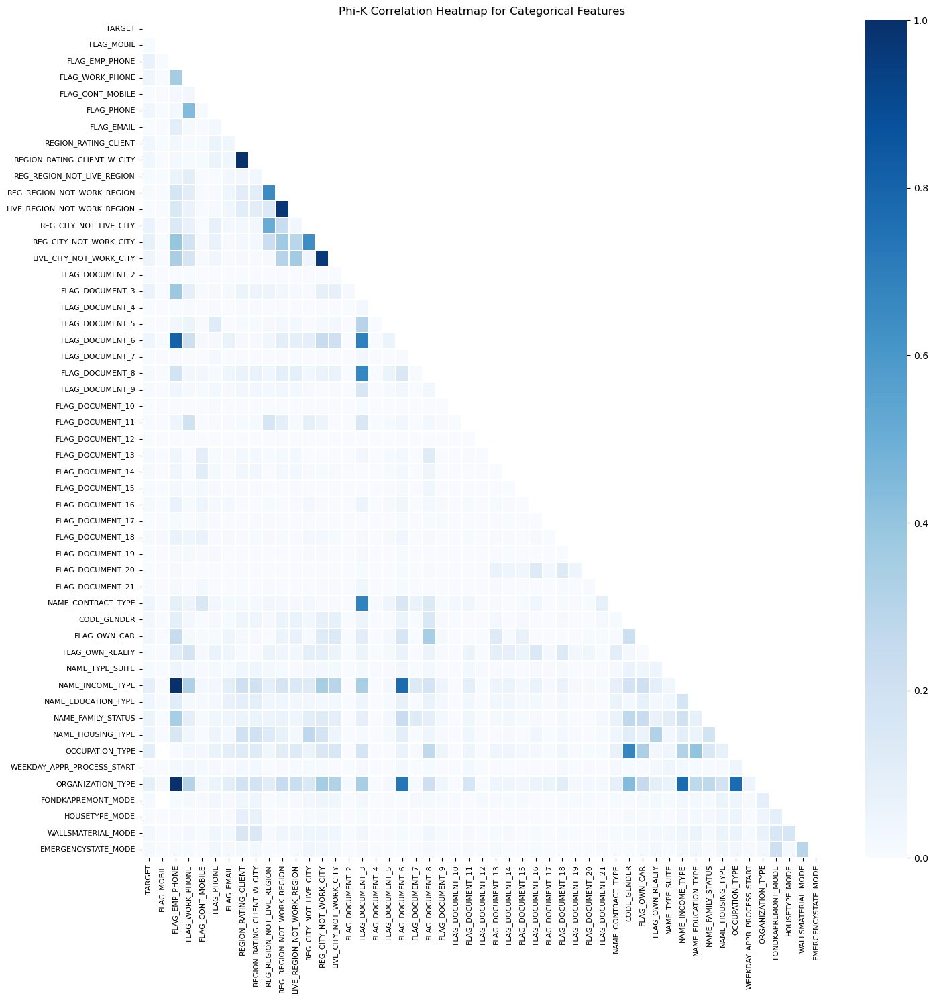

----------------------------------------------------------------------------------------------------
Les catégories avec les valeurs les plus élevées de la valeur de corrélation Phi-K avec la variable cible sont:


,Column Name,Phik-Correlation
43,OCCUPATION_TYPE,0.102846
45,ORGANIZATION_TYPE,0.089164
39,NAME_INCOME_TYPE,0.084831
12,REG_CITY_NOT_WORK_CITY,0.079946
1,FLAG_EMP_PHONE,0.072087
11,REG_CITY_NOT_LIVE_CITY,0.069588
15,FLAG_DOCUMENT_3,0.069525
41,NAME_FAMILY_STATUS,0.056043
42,NAME_HOUSING_TYPE,0.051107
13,LIVE_CITY_NOT_WORK_CITY,0.050956


----------------------------------------------------------------------------------------------------


In [19]:
categorical_columns = ['TARGET','FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
                                   'FLAG_PHONE', 'FLAG_EMAIL','REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY',
                                  'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
                                   'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 
                                'LIVE_CITY_NOT_WORK_CITY'] + ['FLAG_DOCUMENT_' + str(i) for i in range(2,22)] + application_train.dtypes[
                                    application_train.dtypes == 'object'].index.tolist()
plot_phik_matrix(application_train, categorical_columns, figsize = (15,15), fontsize = 8)

Remarque :

D'après la carte thermique ci-dessus de la corrélation Phi-K, nous voyons que la plupart des caractéristiques catégorielles ne sont pas corrélées les unes aux autres, mais certaines d'entre elles montrent une forte corrélation.

Certaines des paires de catégories hautement corrélées sont :


- REGION_RATING_CLIENT_W_CITY et REGION_RATING_CLIENT - Ceci est compréhensible car ils raconteraient plus ou moins une histoire similaire(elles définissent la même chose )

- LIVE_REGION_NOT_WORK_REGION et REG_REGION_NOT_WORK_REGION

- NAME_INCOME_TYPE, ORGANIZATION_TYPE et FLAG_EMP_PHONE

Nous pouvons également voir une certaine corrélation entre le type d'organisation et le type de revenu d'un client. De même, nous constatons également une corrélation entre le type de profession et le type d'organisation.

Nous pouvons noter que la catégorie OCCUPATION_TYPE, ORGANIZATION_TYPE, NAME_INCOME_TYPE, REG_CITY_NOT_WORK_CITY sont parmi les catégories les plus corrélées avec la variable TARGET. 


Matrice de corrélation des features:

Nous tracerons une carte thermique de la corrélation de chaque caractéristique numérique par rapport aux autres caractéristiques.

Nous avons exclu la colonne SK_ID_CURR, car elle n'a aucune pertinence. 

Cette carte thermique nous aidera à identifier les caractéristiques numériques hautement corrélées et nous aidera également à identifier les caractéristiques qui sont fortement corrélées avec la variable cible.

In [20]:
class correlation_matrix:
    '''
    Classe pour tracer la carte thermique de la matrice de corrélation et imprimer les fonctionnalités les plus corrélées avec la cible.
    Contient trois méthodes :
        1. méthode d'initialisation
        2. méthode plot_correlation_matrix
        3. méthode target_top_corr
    '''
    
    def __init__(self, data, columns_to_drop, figsize = (25,23), mask_upper = True, tight_layout = True, 
                  linewidth = 0.1, fontsize = 10, cmap = 'Blues'):  
        '''  
    Fonction pour initialiser les membres de la classe.
        
        Contributions:
            données : DataFrame
                Le DataFrame à partir duquel construire la matrice de corrélation
            columns_to_drop : liste
                Colonnes qui doivent être supprimées lors de la construction de la matrice de corrélation (par exemple, l'ID de prêt)
            figsize : tuple, par défaut = (25,23)
                Taille de la figure à tracer
            mask_upper : bool, par défaut = Vrai
                S'il faut tracer uniquement le triangle inférieur de la carte thermique ou tracer complètement.
            tight_layout : bool, par défaut = True
                Que ce soit pour garder une mise en page serrée ou non
            largeur de ligne : float/int, par défaut = 0,1
                La largeur de ligne à utiliser pour la carte thermique
            taille de police : entier, par défaut = 10
                La taille de la police pour les étiquettes de coche X et Y
            cmap : str, par défaut = 'Blues'
                La palette de couleurs à utiliser pour la carte de chaleur

        Returns:
            None
        '''
        
        self.data = data
        self.columns_to_drop = columns_to_drop
        self.figsize = figsize
        self.mask_upper = mask_upper
        self.tight_layout = tight_layout
        self.linewidth = linewidth
        self.fontsize = fontsize
        self.cmap = cmap 
                 
    def plot_correlation_matrix(self):
        '''
        Fonction pour tracer la carte thermique de la matrice de corrélation
        
        Inputs:
            self
        
        Returns:
            None
        '''
        
        print('-' * 100)
        #building the correlation dataframe
        self.corr_data = self.data.drop(self.columns_to_drop + ['TARGET'], axis = 1).corr()

        if self.mask_upper:
            #masking the heatmap to show only lower triangle. This is to save the RAM.
            mask_array = np.ones(self.corr_data.shape)
            mask_array = np.triu(mask_array)
        else:
            mask_array = np.zeros(self.corr_data.shape)

        plt.figure(figsize = self.figsize, tight_layout = self.tight_layout)
        sns.heatmap(self.corr_data, annot = False, mask = mask_array, linewidth = self.linewidth, cmap = self.cmap)
        plt.xticks(rotation = 90, fontsize = self.fontsize)
        plt.yticks(fontsize = self.fontsize)
        plt.title("Correlation Heatmap for Numerical features")
        plt.show()
        print("-"*100)
    
    def target_top_corr(self, target_top_columns = 10):
        '''
        Fonction pour renvoyer les fonctionnalités les plus corrélées avec la cible
        
        Contributions:
            soi
            target_top_columns : entier, par défaut = 10
                Le nombre d'entités les plus corrélées avec la cible à afficher
            
        Retour:
            Principales fonctionnalités corrélées DataFrame.
        '''
        
        phik_target_arr = np.zeros(self.corr_data.shape[1])
        #calculating the Phik-Correlation with Target
        for index, column in enumerate(self.corr_data.columns):
            phik_target_arr[index] = self.data[['TARGET', column]].phik_matrix().iloc[0,1]
        #getting the top correlated columns and their values
        top_corr_target_df = pd.DataFrame({'Column Name': self.corr_data.columns, 'Phik-Correlation' : phik_target_arr})
        top_corr_target_df = top_corr_target_df.sort_values(by = 'Phik-Correlation', ascending = False)
        
        return top_corr_target_df.iloc[:target_top_columns]

----------------------------------------------------------------------------------------------------


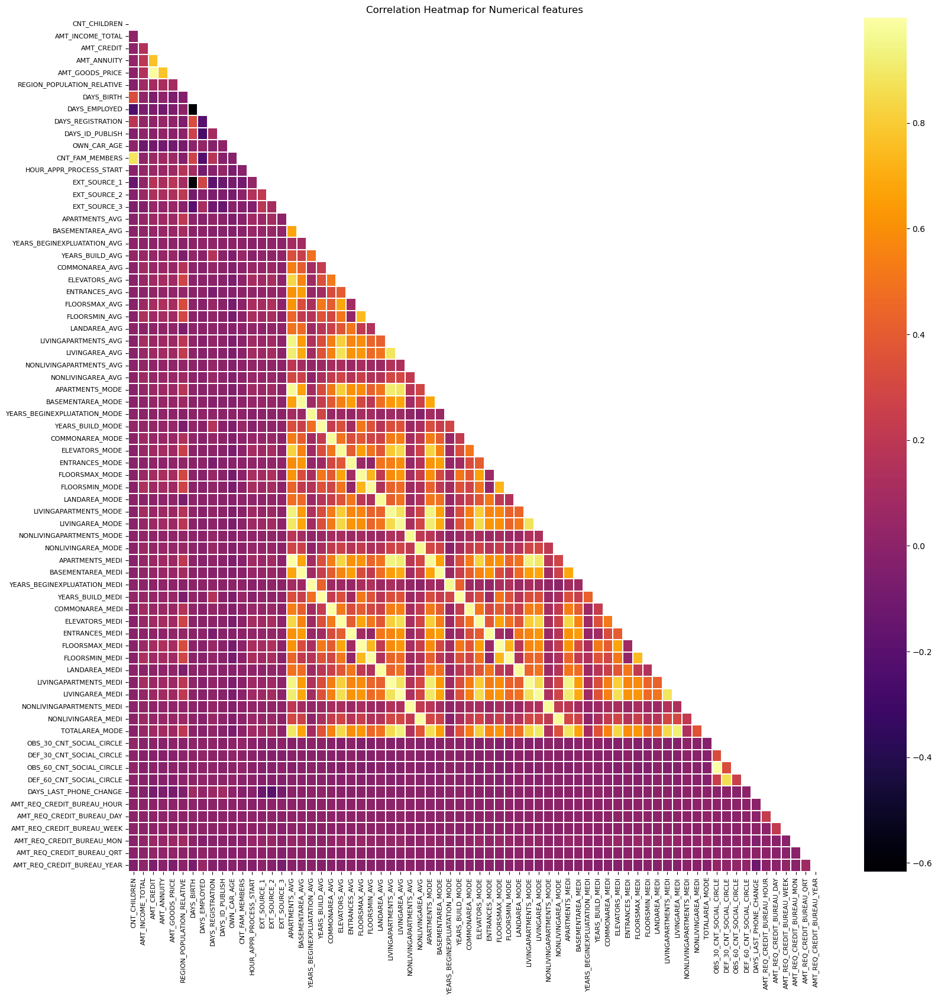

----------------------------------------------------------------------------------------------------


In [21]:
columns_to_drop = ['SK_ID_CURR'] + list(set(categorical_columns) - set(['TARGET']))
corr_mat = correlation_matrix(application_train, columns_to_drop, figsize = (17,17), fontsize = 8, cmap = 'inferno')
corr_mat.plot_correlation_matrix()

In [22]:
#Seeing the top columns with highest phik-correlation with the target variable in application_train table
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 100)
print("Columns with highest values of Phik-correlation with Target Variable are:")
display(top_corr_target_df)
print("-"*100)

interval columns not set, guessing: ['TARGET', 'CNT_CHILDREN']
interval columns not set, guessing: ['TARGET', 'AMT_INCOME_TOTAL']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_GOODS_PRICE']
interval columns not set, guessing: ['TARGET', 'REGION_POPULATION_RELATIVE']
interval columns not set, guessing: ['TARGET', 'DAYS_BIRTH']
interval columns not set, guessing: ['TARGET', 'DAYS_EMPLOYED']
interval columns not set, guessing: ['TARGET', 'DAYS_REGISTRATION']
interval columns not set, guessing: ['TARGET', 'DAYS_ID_PUBLISH']
interval columns not set, guessing: ['TARGET', 'OWN_CAR_AGE']
interval columns not set, guessing: ['TARGET', 'CNT_FAM_MEMBERS']
interval columns not set, guessing: ['TARGET', 'HOUR_APPR_PROCESS_START']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_1']
interval columns not set, guessing: ['TARGET', 'EXT_SOURCE_2']
interval columns 

,Column Name,Phik-Correlation
15,EXT_SOURCE_3,0.247680
13,EXT_SOURCE_1,0.217846
14,EXT_SOURCE_2,0.213965
6,DAYS_BIRTH,0.102378
63,DAYS_LAST_PHONE_CHANGE,0.073218
7,DAYS_EMPLOYED,0.072095
9,DAYS_ID_PUBLISH,0.067766
4,AMT_GOODS_PRICE,0.059094
23,FLOORSMAX_AVG,0.058826
51,FLOORSMAX_MEDI,0.058595


----------------------------------------------------------------------------------------------------


In [23]:
application_train.head(3)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


Remarque :
La carte thermique fait un bon travail en montrant la valeur ou le niveau de corrélation que chaque fonctionnalité particulière a avec toutes les autres fonctionnalités.

On peut observer que **la majeure partie de la carte thermique** contient une couleur violette, ce qui indique **une très petite valeur de corrélation**. Cela implique que **la plupart des caractéristiques** ne sont en effet **pas corrélées aux autres**.

Cependant, nous pouvons voir **des nuances contrastées au milieu de la carte thermique.** Ces nuances représentent **une valeur élevée de corrélation entre les features**. Ce sont les features qui sont liées aux statistiques des appartements.

Si nous regardons les features de application_train, nous pouvons clairement voir que les statistiques des appartements sont données en termes de moyenne, médiane et mode, on peut donc s'attendre à ce que la moyenne, la médiane et le mode soient corrélés les uns avec les autres. 

Une autre chose à noter est que les features d'une catégorie particulière, par exemple la moyenne, sont également corrélées avec d'autres caractéristiques moyennes, telles que le nombre d'ascenseurs, la surface habitable, la zone non habitable, la surface du sous-sol, etc.

Nous constatons également **une forte corrélation entre AMT_GOODS_PRICE et AMT_CREDIT, entre DAYS_EMPLOYED et DAYS_BIRTH**.

Nous ne voudrions pas de caractéristiques hautement corrélées car elles augmentent la complexité temporelle du modèle sans lui ajouter beaucoup de valeur. Par conséquent, nous supprimerions les caractéristiques intercorrélées.

Parmi toutes les fonctionnalités, nous constatons **une forte corrélation** pour les fonctionnalités **EXT_SOURCE** par rapport à la variable cible. 


**Répartition de la variable catégorielle NAME_CONTRACT_TYPE**

Cette colonne contient des informations sur le type de prêt pour le demandeur donné. Selon la documentation fournie par Home Credit, il existe deux types de prêts, à savoir les prêts renouvelables et les prêts en espèces.

In [24]:
def print_unique_categories(data, column_name, show_counts = False):
    
    '''
    Function to print the basic stats such as unique categories and their counts for categorical variables
    
        Inputs:
        data: DataFrame
            The DataFrame from which to print statistics
        column_name: str
            Column's name whose stats are to be printed
        show_counts: bool, default = False
            Whether to show counts of each category or not

    '''
    
    print('-'*100)
    print(f"The unique categories of '{column_name}' are:\n{data[column_name].unique()}")
    print('-'*100)
    
    if show_counts:
        print(f"Counts of each category are:\n{data[column_name].value_counts()}")
        print('-'*100)

In [25]:
def plot_categorical_variables_pie(data, column_name, plot_defaulter = True, hole = 0):
    
    '''
    Fonction pour tracer des variables catégorielles Pie Plots
    
    Contributions:
        données : DataFrame
            Le DataFrame à partir duquel tracer
        nom_colonne : str
            Nom de la colonne dont la distribution doit être tracée
        plot_defaulter : bool
            Que ce soit pour tracer le camembert pour les défaillants ou non
        trou : entier, par défaut = 0
            Rayon du trou à découper du camembert
    '''
    
    if plot_defaulter:
        cols = 2
        specs = [[{'type' : 'domain'}, {'type' : 'domain'}]]
        titles = [f'{column_name} for all Targets', f'Pourcentage de défaillants {column_name}']
    else:
        cols = 1
        specs = [[{'type': 'domain'}]]
        titles = [f'Distribution of {column_name} for all Targets']
        
    values_categorical = data[column_name].value_counts()
    labels_categorical = values_categorical.index
    
    fig = make_subplots(rows = 1, cols = cols, 
                       specs = specs, 
                       subplot_titles = titles)
    
    fig.add_trace(go.Pie(values = values_categorical, labels = labels_categorical, hole = hole, 
                         textinfo = 'label+percent', textposition = 'inside'), row = 1, col = 1)
    
    if plot_defaulter:
        percentage_defaulter_per_category = data[column_name][data.TARGET == 1].value_counts() * 100 / data[column_name].value_counts()
        percentage_defaulter_per_category.dropna(inplace = True)
        percentage_defaulter_per_category = percentage_defaulter_per_category.round(2)
        
        fig.add_trace(go.Pie(values = percentage_defaulter_per_category, labels = percentage_defaulter_per_category.index, 
                             hole = hole, textinfo = 'label+value', hoverinfo = 'label+value'), row = 1, col = 2)
        
    fig.update_layout(title = f'Distribution of {column_name}')
    fig.show()

In [26]:
#voyons d'abord les catégories uniques de 'NAME_CONTRACT_TYPE'
print_unique_categories(application_train, 'NAME_CONTRACT_TYPE')

#Visualisation
plot_categorical_variables_pie(application_train, 'NAME_CONTRACT_TYPE', hole = 0.5)
print('-'*100)

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_CONTRACT_TYPE' are:
['Cash loans' 'Revolving loans']
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


Remarque : 

A partir la distribution globale :

Nous pouvons voir que **la plupart des prêts que les clients** contractent sont **des prêts en espèces.**

Seulement **9,52% des personnes** ont contracté des prêts renouvelables.

À partir de la deuxième graphe, c'est-à-dire le pourcentage de défaillants :

Nous constatons qu'il y a **plus de pourcentage de personnes qui ont fait défaut avec des prêts en espèces (8,35 %)** par rapport à celles qui ont fait défaut avec des prêts renouvelables (5,48 %).

**Répartition de la variable catégorielle CODE_GENDER**

Cette colonne contient des informations sur le sexe du client/demandeur.
Ici, M signifie Homme et F pour Femme.

In [27]:
#let us first see the unique categories of 'CODE_GENDER'
print_unique_categories(application_train, 'CODE_GENDER', show_counts = True)

#plotting the Pie Plot for the Column
plot_categorical_variables_pie(application_train, 'CODE_GENDER', hole = 0.5)
print('-'*150)

----------------------------------------------------------------------------------------------------
The unique categories of 'CODE_GENDER' are:
['M' 'F' 'XNA']
----------------------------------------------------------------------------------------------------
Counts of each category are:
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
----------------------------------------------------------------------------------------------------


------------------------------------------------------------------------------------------------------------------------------------------------------


Remarque :

La features Distribution de CODE_GENDER semble intéressante.

Le premier point à observer est qu'il y a 4 lignes dans la table application_train qui ont des genres 'XNA', ce qui n'a pas beaucoup de sens et peut être compté comme des valeurs NaN. Puisqu'ils ne sont que 4 en nombre et n'appartiennent qu'à la catégorie des non-défaillants. Ainsi, nous pouvons éliminer ces lignes sans trop d'hésitation.

À partir du graphe 1, nous voyons que pour l'ensemble de données donné, il y a plus **de candidats féminins (65,8 %) que de candidats masculins (34,2 %**)**.
Cependant, contrairement au nombre de candidatures féminines, à partir du deuxième graphique, nous notons qu'il a été constaté que **les candidats masculins ont tendance à faire défaut davantage (10,14 %)** par rapport aux candidatures féminines (7 %).

Ainsi, on peut dire que les hommes ont plus tendance à faire défaut que les femmes selon l'ensemble de données donné.
_____

**Répartition de la variable catégorielle FLAG_EMP_PHONE**

Cette colonne est une colonne booléenne, qui indique si le client a fourni son numéro de téléphone professionnel ou non.
Ici, 1 signifie Oui et 0 signifie Non.


In [28]:
#voyons d'abord les catégories uniques de 'FLAG_EMP_PHONE':
print_unique_categories(application_train, 'FLAG_EMP_PHONE')

#Viz
plot_categorical_variables_pie(application_train, column_name = 'FLAG_EMP_PHONE', hole = 0.5)
print('-'*150)

----------------------------------------------------------------------------------------------------
The unique categories of 'FLAG_EMP_PHONE' are:
[1 0]
----------------------------------------------------------------------------------------------------


------------------------------------------------------------------------------------------------------------------------------------------------------


Remarque: 
Cette feature contient deux catégories, c'est-à-dire si le client a fourni son numéro de téléphone professionnel lors du processus d'inscription/de candidature ou non.

Dès le premier graphe, nous voyons que **la plupart des candidats ne fournissent pas leur numéro de téléphone professionnel (82 %)** et seulement 18 % ont fourni leur numéro de téléphone professionnel.

On peut également voir que la tendance par défaut pour ceux qui **fournissent un numéro de téléphone professionnel est supérieure à celle de ceux qui ne fournissent pas de numéro de téléphone professionnel.**

Cette caractéristique pourrait être attribuée au fait que les défaillants pourraient fournir leurs numéros de téléphone au travail afin qu'ils ne soient pas dérangés sur leur téléphone personnel.
_____
**Répartition de la variable catégorielle REGION_RATING_CLIENT_W_CITY**

Cette fonctionnalité est la note fournie par le Home Credit à la région de chaque client en fonction des enquêtes qu'ils ont pu effectuer. 

**Cette cote tient également compte de la ville dans laquelle habite le client.**

Prendre en compte la ville est important car même si certaines régions ont une bonne note dans une ville particulière, mais que cette ville n'a pas une note élevée, **le candidat recevra une note moyenne et non une note élevée.
Il contient des valeurs comprises entre 1 et 3.**

In [29]:
# 'REGION_RATING_CLIENT_W_CITY':
print_unique_categories(application_train, 'REGION_RATING_CLIENT_W_CITY')

#Viz
plot_categorical_variables_pie(application_train, column_name = 'REGION_RATING_CLIENT_W_CITY')
print('-'*150)

----------------------------------------------------------------------------------------------------
The unique categories of 'REGION_RATING_CLIENT_W_CITY' are:
[2 1 3]
----------------------------------------------------------------------------------------------------


------------------------------------------------------------------------------------------------------------------------------------------------------


Remarque :

À partir des graphiques ci-dessus, nous pouvons tirer les informations suivantes :

À partir de la première,nous pouvons voir que **la plupart des clients (74,6 %) ont une note de région de 2.** C'est la valeur moyenne qui est pour la plupart des candidats.

**Très peu de candidats ont une note régionale de 1 (seulement 11,1%) et d'autres ont une note de 3 (14,3%).**

Parmi les défaillants, on constate que la plupart des défaillants ont une note régionale de 3 (11,4 %) qui est comparativement plus élevée que les deux autres notes, **c'est-à-dire que les clients avec une note de 1 ont un pourcentage de défaut de seulement 4,84 % et avec une note de 2 ont un pourcentage de 7,92 %.**

=> **Cela montre que la note 3 pourrait être un attribut important pour prendre une décision sur les caractéristiques défaillantes.**

___
**Répartition de la variable catégorielle NAME_EDUCAtION_TYPE**

Cette fonctionnalité décrit/inscrit l'éducation la plus élevée que le client a obtenue.

In [30]:
def plot_categorical_variables_bar(data, column_name, figsize = (18,6), percentage_display = True, plot_defaulter = True, rotation = 0, horizontal_adjust = 0, fontsize_percent = 'xx-small'):
    
    '''
    Fonction pour tracer les diagrammes à barres des variables catégorielles
    
    Contributions:
        données : DataFrame
            Le DataFrame à partir duquel tracer
        nom_colonne : str
            Nom de la colonne dont la distribution doit être tracée
        figsize : tuple, défaut = (18,6)
            Taille de la figure à tracer
        affichage_pourcentage : bool, valeur par défaut = Vrai
            Indique s'il faut afficher les pourcentages au-dessus des barres dans Bar-Plot
        plot_defaulter : bool
            S'il faut ou non tracer les diagrammes à barres pour les défaillants
        rotation : entier, par défaut = 0
            Degré de rotation pour les étiquettes x-tick
        horizontal_adjust : entier, par défaut = 0
            Paramètre d'ajustement horizontal pour les pourcentages affichés en haut des barres de Bar-Plot
        fontsize_percent : str, par défaut = 'xx-small'
            Taille de police pour l'affichage en pourcentage
        
    '''
    
    print(f"Nombre total de catégories uniques de {column_name} = {len(data[column_name].unique())}")
    
    plt.figure(figsize = figsize, tight_layout = False)
    sns.set(style = 'whitegrid', font_scale = 1.2)
    
    # tracer la distribution globale de la catégorie
    plt.subplot(1,2,1)
    data_to_plot = data[column_name].value_counts().sort_values(ascending = False)
    ax = sns.barplot(x = data_to_plot.index, y = data_to_plot, palette = 'Set1')
    
    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(p.get_x() + horizontal_adjust, p.get_height() + 0.005 * total_datapoints, '{:1.02f}%'.format(p.get_height() * 100 / total_datapoints), fontsize = fontsize_percent)
        
    plt.xlabel(column_name, labelpad = 10)
    plt.title(f'Distribution de {column_name}', pad = 20)
    plt.xticks(rotation = rotation)
    plt.ylabel('Counts')
    
    #tracer la distribution de la catégorie pour les défaillants
    if plot_defaulter:
        percentage_defaulter_per_category = (data[column_name][data.TARGET == 1].value_counts() * 100 / data[column_name].value_counts()).dropna().sort_values(ascending = False)

        plt.subplot(1,2,2)
        sns.barplot(x = percentage_defaulter_per_category.index, y = percentage_defaulter_per_category, palette = 'Set2')
        plt.ylabel('Pourcentage de défaillants par catégorie')
        plt.xlabel(column_name, labelpad = 10)
        plt.xticks(rotation = rotation)
        plt.title(f'Pourcentage de défaillants pour chaque catégorie de {column_name}', pad = 20)
    plt.show()

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_EDUCATION_TYPE' are:
['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre total de catégories uniques de NAME_EDUCATION_TYPE = 5


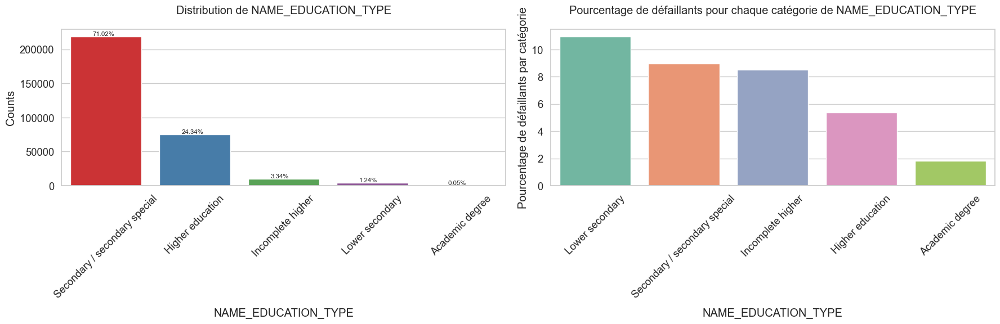

----------------------------------------------------------------------------------------------------


In [31]:
#'NAME_EDUCATION_TYPE' :
print_unique_categories(application_train, 'NAME_EDUCATION_TYPE', show_counts = True)

#Viz
plot_categorical_variables_bar(application_train, column_name = 'NAME_EDUCATION_TYPE', rotation = 45, horizontal_adjust = 0.25)
print('-'*100)

Remarque :

**Environ 71% des personnes n'ont fait leurs études que jusqu'au secondaire / secondaire spécial**, ainsi que **24,34% de clients ayant fait des études supérieures.** --> Ceci suggère que la plupart des clients/emprunteurs n'ont pas un niveau d'éducation élevé.

À partir du deuxième graphique, nous pouvons que **les personnes qui ont fait leurs études jusqu'au niveau secondaire inférieur seulement ont les caractéristiques d'abandon les plus élevées,** les tendances secondaires et incomplètes supérieures ayant des tendances d'abandon similaires.

**Le groupe de personnes ayant fait des études supérieures** a une tendance à **la défaillance comparativement plus faible**.

En outre, les personnes titulaires d'un diplôme universitaire affichent le taux d'abandon le moins élevé. Cependant, le groupe des diplômes universitaires sont aussi très peu nombreux. 
_____
**Répartition de la variable catégorielle OCCUPATION_TYPE**

Cette fonctionnalité indique le type d'occupation que le client a. Cela peut être une caractéristique très importante qui pourrait décrire les caractéristiques par défaut d'un client. Voyons les parcelles pour eux.

----------------------------------------------------------------------------------------------------
The unique categories of 'OCCUPATION_TYPE' are:
['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers'
 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries'
 'IT staff' 'HR staff']
----------------------------------------------------------------------------------------------------
Nombre total de catégories uniques de OCCUPATION_TYPE = 19


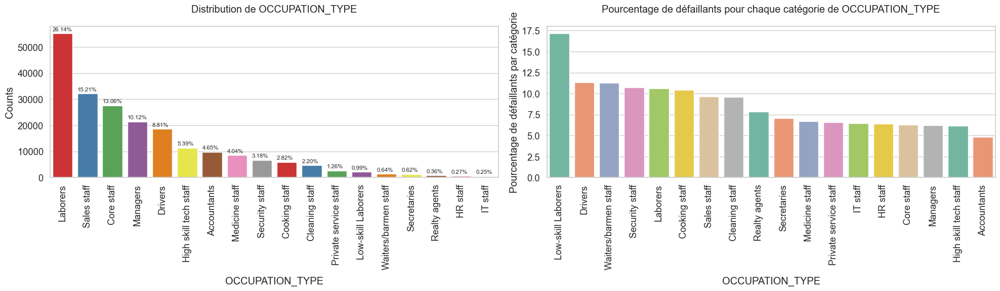

----------------------------------------------------------------------------------------------------


In [32]:
#'OCCUPATION_TYPE'
print_unique_categories(application_train, 'OCCUPATION_TYPE')

#Viz
plot_categorical_variables_bar(application_train, column_name = 'OCCUPATION_TYPE', figsize = (20,6), rotation = 90)
print('-'*100)

Remarque:

Parmi les candidats, **le type de profession le plus courant** est celui **d'ouvriers, qui représente près de 26 % des candidatures.** La deuxième profession la plus fréquente est **le personnel de vente, suivi du personnel de base et des gestionnaires.**

**Le taux d'abandon des ouvriers peu qualifiés est le plus élevé de tous les types de professions (~17,5 %).** Viennent ensuite les chauffeurs, les serveurs, le personnel de sécurité, les ouvriers, le personnel de cuisine, etc. Tous les emplois sont des emplois de bas niveau. Cela montre que les personnes de bas niveau ont tendance à avoir un taux de défaut plus élevé.

**Le taux de défaillance le plus bas concerne** les comptables, le personnel de base, les gestionnaires, le personnel technique hautement qualifié, le personnel des RH, etc., qui occupent **des emplois de niveau moyen à élevé.**

Ainsi, on peut conclure que les travailleurs de niveau inférieur ont tendance à avoir une tendance à la défaillance plus élevée que les emplois de niveau moyen à élevé.
______
**Répartition de la variable catégorielle ORGANIZATION_TYPE**

Semblable au type de profession, le type d'organisation auquel le client appartient peut également être une caractéristique importante pour prédire le risque de défaut de ce client. Visualisons cette fonctionnalité plus en détail.

Nombre total de catégories de ORGANIZATION_TYPE = 58


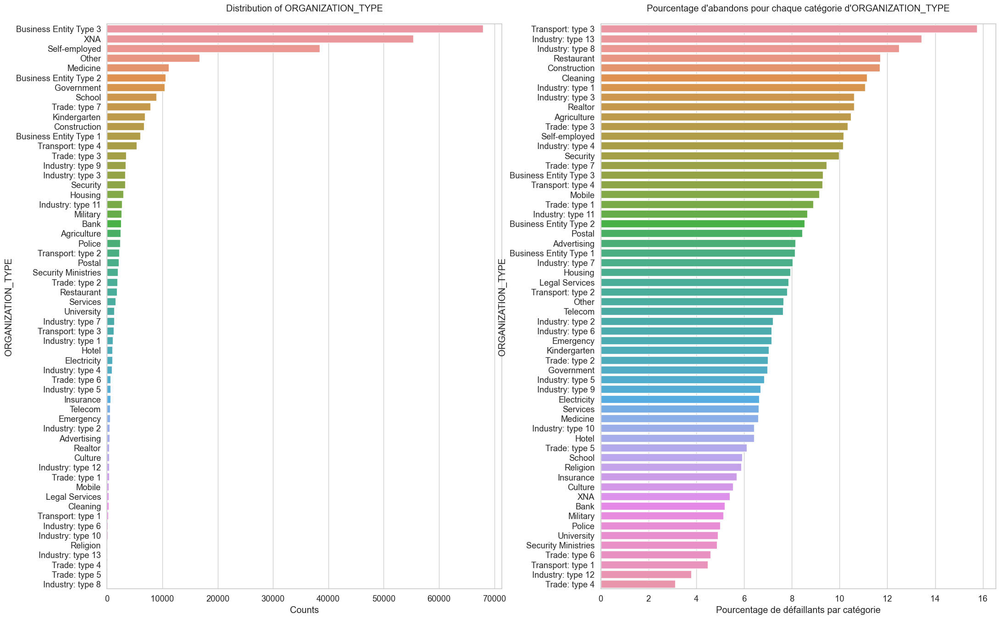

In [33]:
print(f"Nombre total de catégories de ORGANIZATION_TYPE = {len(application_train.ORGANIZATION_TYPE.unique())}")

plt.figure(figsize = (25,16))
sns.set(style = 'whitegrid', font_scale = 1.2)
plt.subplots_adjust(wspace=0.25)

plt.subplot(1,2,1)
count_organization = application_train.ORGANIZATION_TYPE.value_counts().sort_values(ascending = False)
sns.barplot(x = count_organization, y = count_organization.index)
plt.title('Distribution of ORGANIZATION_TYPE', pad = 20)
plt.xlabel('Counts')
plt.ylabel('ORGANIZATION_TYPE')

plt.subplot(1,2,2)
percentage_default_per_organization = application_train[application_train.TARGET == 1].ORGANIZATION_TYPE.value_counts() * 100 / count_organization
percentage_default_per_organization = percentage_default_per_organization.dropna().sort_values(ascending = False)
sns.barplot(x = percentage_default_per_organization, y = percentage_default_per_organization.index)
plt.title("Pourcentage d'abandons pour chaque catégorie d'ORGANIZATION_TYPE", pad = 20)
plt.xlabel('Pourcentage de défaillants par catégorie')
plt.ylabel('ORGANIZATION_TYPE')

plt.show()

Remarque: 

Il existe de nombreux types d'organisations auxquelles le client appartient, **58 pour être précis.** 

Dès le premier graphique, nous voyons que la plupart des candidats travaillent dans des organisations de type **« Business Entity Type3 », « XNA » ou « Self Employed ».** ->  Le type d'organisation « XNA » pourrait probablement désigner un type d'organisation non classifié.

A partir du second graphique, nous remarquons que **les candidats appartenant au « Transport : type 3 » ont la plus forte tendance défaillante par rapport aux autres.**
Elles sont suivies par des organisations de types : 'Industrie : type 13', 'Industrie : type 8', 'Restauration', 'Construction', etc.

**Les organisations qui affichent les taux de défaut les plus faibles sont « Commerce : type 4 », « Industrie : type 12 », etc.**

______
**Répartition de la variable catégorielle REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY**

REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY :

- Ces colonnes incluent des indicateurs indiquant si l'adresse permanente du client correspond à son adresse de contact ou à son adresse professionnelle ou non au niveau de la région.

- LIVE_CITY_NOT_WORK_CITY Cette colonne indique si l'adresse permanente du client correspond ou non à son adresse de contact au niveau de la ville.

- Ici, 1 indique des adresses différentes et 0 indique les mêmes adresses.

----------------------------------------------------------------------------------------------------
Nombre total de catégories uniques de REG_CITY_NOT_LIVE_CITY = 2


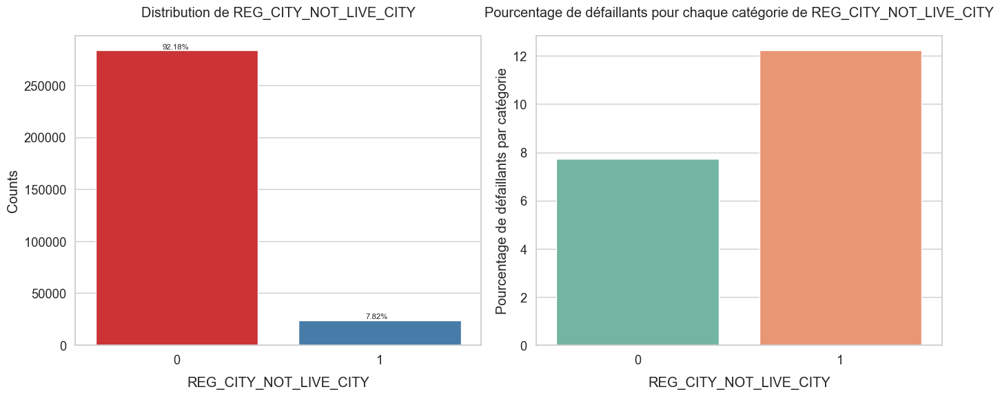

----------------------------------------------------------------------------------------------------
Nombre total de catégories uniques de REG_CITY_NOT_WORK_CITY = 2


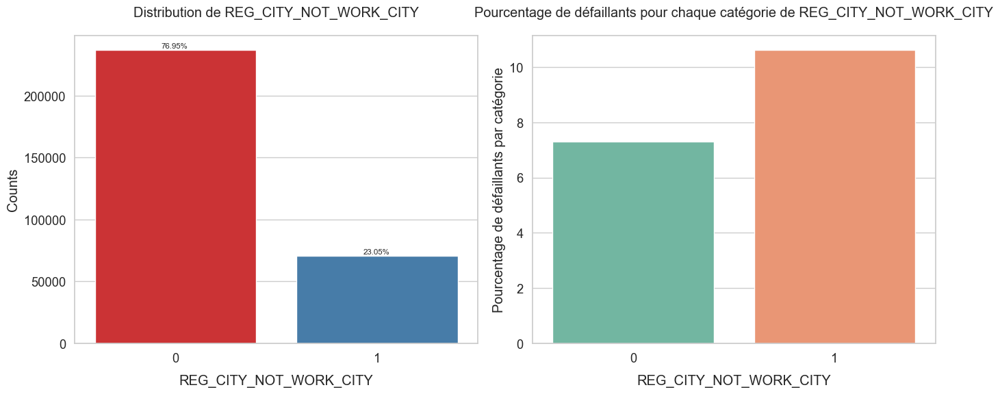

----------------------------------------------------------------------------------------------------
Nombre total de catégories uniques de LIVE_CITY_NOT_WORK_CITY = 2


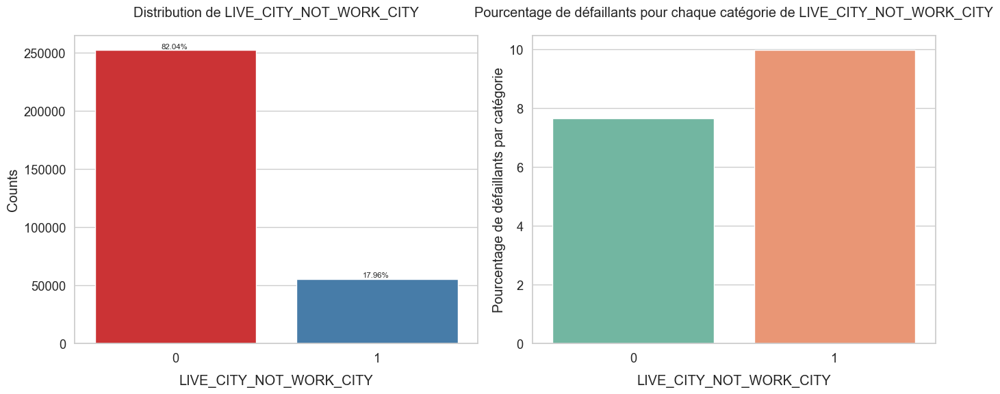

----------------------------------------------------------------------------------------------------


In [34]:
print('-'*100)
plot_categorical_variables_bar(application_train, column_name = 'REG_CITY_NOT_LIVE_CITY', figsize = (14, 6), horizontal_adjust = 0.33)
print('-'*100)
plot_categorical_variables_bar(application_train, column_name = 'REG_CITY_NOT_WORK_CITY', figsize = (14, 6), horizontal_adjust = 0.33)
print('-'*100)
plot_categorical_variables_bar(application_train, column_name = 'LIVE_CITY_NOT_WORK_CITY', figsize = (14, 6), horizontal_adjust = 0.33)
print('-'*100)

Remarque: 

De tous les candidats, **il n'y a qu'une minorité de candidats dont les adresses ne correspondent pas.**

*Premièrement, il n'y a que **7,52%** de personnes qui ont une adresse permanente différente de leur adresse de contact au niveau régional.*

*Deuxièmement, il y a environ **23,05 %** de personnes qui ont une adresse permanente différente de leur adresse professionnelle au niveau régional.*
 
Ce nombre plus élevé est explicable, car il n'est pas impossible qu'ils travaillent dans une région différente par rapport à leur adresse permanente.

Enfin, environ**17,96 %** des personnes ont une adresse permanente différente de leur adresse de contact au niveau de la ville.

Si nous examinons les caractéristiques - "défaillants", nous constatons qu'il existe une tendance maximale par "défaillants" des personnes dont:
 - les adresses permanentes et de contact sont différentes au niveau de la région,
- suivies d'une adresse permanente et professionnelle différente
- et enfin d'une adresse permanente et de contact différente au niveau de la ville.

Pour tous les cas, **on constate que la tendance à l'abandon des personnes qui ont des adresses différentes est plus élevée que celles qui ont la même adresse.**

==> Cela signifie que cette différence d'adresse peut suggérer un risque de défaut.

_____
**Répartition des variables qualitatives FLAG_DOCUMENT_3**

Cette colonne contient l'indicateur d'un document qui devait être soumis par le demandeur. Sa valeur est 0 si le client a fourni le document et 1 sinon.

Nombre total de catégories uniques de FLAG_DOCUMENT_3 = 2


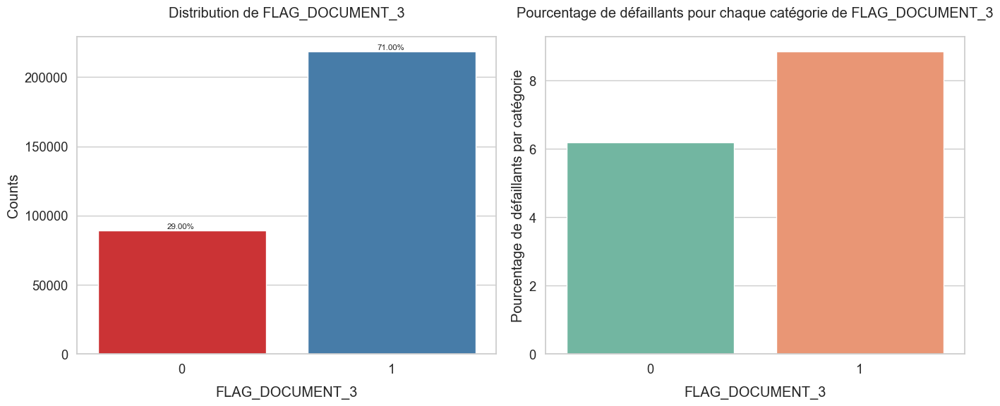

In [35]:
plot_categorical_variables_bar(application_train, column_name = 'FLAG_DOCUMENT_3', figsize = (14, 6), horizontal_adjust = 0.33)

Remarque:

Dès le premiers graphe,**on constate que la plupart des clients n'avaient pas fourni ce document (~71%) et seulement 29% l'ont fait.**

A partir de la deuxième, on voit que ceux qui avaient fourni ce document avaient un taux de défaut plus élevé que ceux qui ne l'avaient pas fait.

-> *Cela signifie que les candidats qui ont fourni le Document_3 ont tendance à faire défaut plus que ceux qui ne le font pas.*

Note: nous n'avons pas plus d'information, donc nous ne pouvons rien dire sur le type de document en question.

___
**Répartition de l'âge variable continu du *demandeur**

Pour l'ensemble de données donné, l'âge est donné en jours, ce qui peut être plus difficile à interpréter. Ainsi, nous allons créer une variable latente pour stocker les âges en années, ce qui serait plus facile à analyser et à interpréter.

In [36]:
def plot_continuous_variables(data, column_name, plots = ['distplot', 'CDF', 'box', 'violin'], scale_limits = None, figsize = (20,8), histogram = True, log_scale = False):
    
    '''
    Fonction pour tracer la distribution des variables continues
    
    Contributions:
        données : DataFrame
            DataFrame à partir duquel tracer.
        nom_colonne : str
            Nom de la colonne dont la distribution doit être tracée.
        tracés : liste, défaut = ['distplot', 'CDF', box', 'violin']
            Liste des tracés à tracer pour la variable continue.
        scale_limits : tuple (gauche, droite), par défaut = Aucun
            Pour contrôler les limites des valeurs à tracer en cas de valeurs aberrantes.
        figsize : tuple, par défaut = (20,8)
            Taille de la figure à tracer.
        histogramme : bool, par défaut = True
            Que ce soit pour tracer l'histogramme avec distplot ou non.
        log_scale : bool, par défaut = False
            Indique s'il faut utiliser l'échelle logarithmique pour les variables avec des points aberrants
    '''

    data_to_plot = data.copy()
    if scale_limits:
        # ne prenant que les données dans les limites spécifiées
        data_to_plot[column_name] = data[column_name][(data[column_name] > scale_limits[0]) & (data[column_name] < scale_limits[1])]

    number_of_subplots = len(plots)
    plt.figure(figsize = figsize)
    sns.set_style('whitegrid')
    
    for i, ele in enumerate(plots):
        plt.subplot(1, number_of_subplots, i + 1)
        plt.subplots_adjust(wspace=0.25)
        
        if ele == 'CDF':
            #créer le centile DataFrame pour les étiquettes de classe positives et négatives
            percentile_values_0 = data_to_plot[data_to_plot.TARGET == 0][[column_name]].dropna().sort_values(by = column_name)
            percentile_values_0['Percentile'] = [ele / (len(percentile_values_0)-1) for ele in range(len(percentile_values_0))]
            
            percentile_values_1 = data_to_plot[data_to_plot.TARGET == 1][[column_name]].dropna().sort_values(by = column_name)
            percentile_values_1['Percentile'] = [ele / (len(percentile_values_1)-1) for ele in range(len(percentile_values_1))]
            
            plt.plot(percentile_values_0[column_name], percentile_values_0['Percentile'], color = 'red', label = 'Non-Defaulters')
            plt.plot(percentile_values_1[column_name], percentile_values_1['Percentile'], color = 'black', label = 'Defaulters')
            plt.xlabel(column_name)
            plt.ylabel('Probability')
            plt.title('CDF of {}'.format(column_name))
            plt.legend(fontsize = 'medium')
            if log_scale:
                plt.xscale('log')
                plt.xlabel(column_name + ' - (log-scale)')
            
        if ele == 'distplot':  
            sns.distplot(data_to_plot[column_name][data['TARGET'] == 0].dropna(),
                         label='Non-Defaulters', hist = False, color='red')
            sns.distplot(data_to_plot[column_name][data['TARGET'] == 1].dropna(),
                         label='Defaulters', hist = False, color='black')
            plt.xlabel(column_name)
            plt.ylabel('Probability Density')
            plt.legend(fontsize='medium')
            plt.title("Dist-Plot of {}".format(column_name))
            if log_scale:
                plt.xscale('log')
                plt.xlabel(f'{column_name} (log scale)')

        if ele == 'violin':  
            sns.violinplot(x='TARGET', y=column_name, data=data_to_plot)
            plt.title("Violin-Plot of {}".format(column_name))
            if log_scale:
                plt.yscale('log')
                plt.ylabel(f'{column_name} (log Scale)')

        if ele == 'box':  
            sns.boxplot(x='TARGET', y=column_name, data=data_to_plot)
            plt.title("Box-Plot of {}".format(column_name))
            if log_scale:
                plt.yscale('log')
                plt.ylabel(f'{column_name} (log Scale)')

    plt.show()

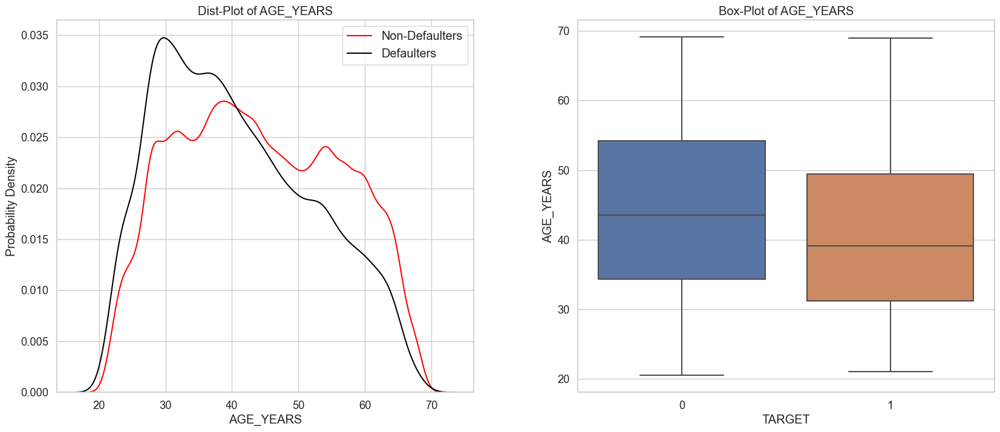

In [37]:
application_train['AGE_YEARS'] = application_train['DAYS_BIRTH'] * -1 / 365
plot_continuous_variables(application_train, 'AGE_YEARS', plots = ['distplot','box'])
_ = application_train.pop('AGE_YEARS')

Remarque :


À partir du diagramme de répartition, nous pouvons observer le pic d'âge des personnes qui sont par défaut proches de 30 ans.

- les défaillants sont généralement plus jeunes que les non-défaillants.

À partir de la boîte à moustaches aussi, nous pouvons mieux visualiser la même chose. L'âge des défaillants est généralement inférieur à celui des non-défaillants. Tous les quantiles d'âge des défaillants sont inférieurs à ceux des non-défaillants. La valeur du 75e centile des non-défaillants est d'environ 54 ans, tandis que celle des défaillants est proche de 49 ans.

=> **Les observations impliquent que les défaillants sont généralement plus jeunes que les non-défaillants.**
____
**Distribution des variables continues avec les fonctionnalités DAYS**

DAYS_EMPLOYED

- Cette fonctionnalité indique le nombre de jours à compter du jour de la candidature où le candidat a été employé. Pour faciliter l'interprétation, nous convertirons les jours en années.

In [38]:
def print_percentiles(data, column_name, percentiles = None):
    
    '''
    Fonction pour imprimer les valeurs de centile pour une colonne donnée
    
    Contributions:
        données : DataFrame
            Le DataFrame à partir duquel imprimer les centiles
        nom_colonne : str
            Nom de la colonne dont les centiles doivent être imprimés
        centiles : liste, par défaut = Aucun
            La liste des percentiles à imprimer, si elle n'est pas donnée, par défaut sont imprimées
    '''
    
    print('-'*100)
    if not percentiles:
        percentiles = list(range(0,80,25)) + list(range(90,101,2))
    for i in percentiles:
        print(f'The {i}th percentile value of {column_name} is {np.percentile(data[column_name].dropna(), i)}')
    print("-"*100)

----------------------------------------------------------------------------------------------------
The 0th percentile value of DAYS_EMPLOYED is -17912.0
The 25th percentile value of DAYS_EMPLOYED is -2760.0
The 50th percentile value of DAYS_EMPLOYED is -1213.0
The 75th percentile value of DAYS_EMPLOYED is -289.0
The 90th percentile value of DAYS_EMPLOYED is 365243.0
The 92th percentile value of DAYS_EMPLOYED is 365243.0
The 94th percentile value of DAYS_EMPLOYED is 365243.0
The 96th percentile value of DAYS_EMPLOYED is 365243.0
The 98th percentile value of DAYS_EMPLOYED is 365243.0
The 100th percentile value of DAYS_EMPLOYED is 365243.0
----------------------------------------------------------------------------------------------------


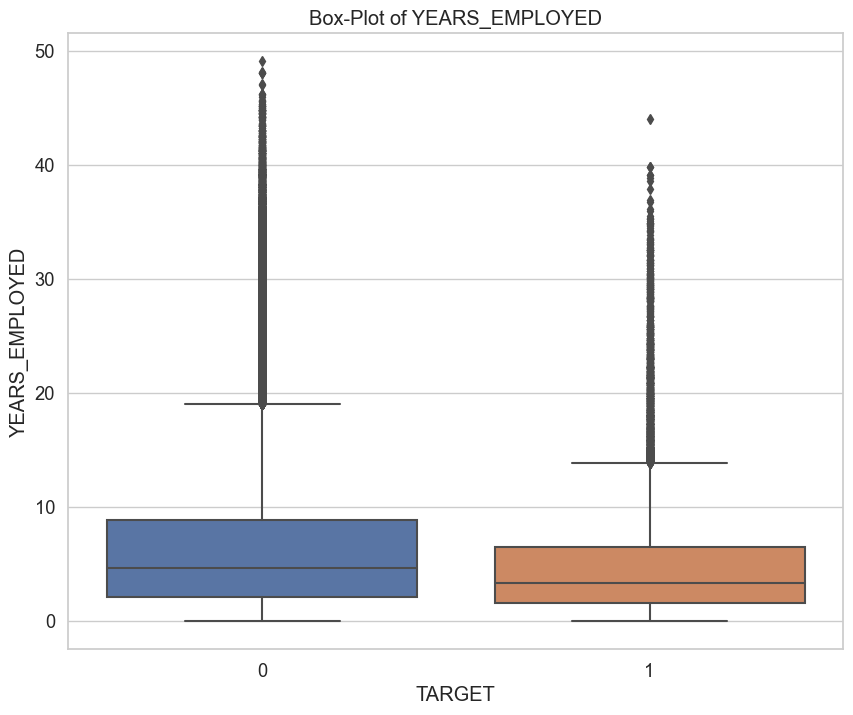

In [39]:
application_train['YEARS_EMPLOYED'] = application_train.DAYS_EMPLOYED * -1 / 365
print_percentiles(application_train, 'DAYS_EMPLOYED')
plot_continuous_variables(application_train, 'YEARS_EMPLOYED', plots = ['box'], scale_limits = [0,70], figsize = (10,8))
_ = application_train.pop('YEARS_EMPLOYED')

Remarque:

- Les personnes ayant travaillé le plus longtemps (un temps d'employabilité plus long ) ont tendance à être moins "défaillants" dans l'ensemble . 
_________
*DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE et DAYS_TERMINATION*

Ces colonnes décrivent également le nombre de jours écoulés depuis l'application actuelle au cours desquels certaines activités se sont produites.
_______

Installments_payments.csv


- Ce dataset répertorie l'historique de remboursement de chacun des prêts que le demandeur a contractés auprès de Home Credit Group. Le tableau contient des caractéristiques telles que le montant du versement, combien le client a-t-il payé pour chaque versement, etc.

In [40]:
installments_payments = pd.read_csv('Data/installments_payments.csv')
print(f'La taille de versements_paiements.csv est : {installments_payments.shape}')
print('-'*100)
print(f'Le nombre de SK_ID_PREV uniques dans versements_payments.csv est : {len(installments_payments.SK_ID_PREV.unique())}')
print(f'Le nombre de SK_ID_CURR uniques dans versements_payments.csv est : {len(installments_payments.SK_ID_CURR.unique())}')
print('-'*100)
print(f'Le nombre de SK_ID_CURR qui se chevauchent dans application_train.csv et versements_payments.csv est : {len(set(application_train.SK_ID_CURR.unique()).intersection(set(installments_payments.SK_ID_CURR.unique())))}')
print(f'Le nombre de SK_ID_CURR qui se chevauchent dans application_test.csv et versements_payments.csv sont : {len(set(application_test.SK_ID_CURR.unique()).intersection(set(installments_payments.SK_ID_CURR.unique())))}')
print('-'*100)
print(f'Nombre de valeurs en double dans versements_paiements :{installments_payments.shape[0] - installments_payments.duplicated().shape[0]}')
print('-'*100)
display(installments_payments.head(5))

La taille de versements_paiements.csv est : (13605401, 8)
----------------------------------------------------------------------------------------------------
Le nombre de SK_ID_PREV uniques dans versements_payments.csv est : 997752
Le nombre de SK_ID_CURR uniques dans versements_payments.csv est : 339587
----------------------------------------------------------------------------------------------------
Le nombre de SK_ID_CURR qui se chevauchent dans application_train.csv et versements_payments.csv est : 291643
Le nombre de SK_ID_CURR qui se chevauchent dans application_test.csv et versements_payments.csv sont : 291643
----------------------------------------------------------------------------------------------------
Nombre de valeurs en double dans versements_paiements :0
----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


Remarque:

- Il y a environ 13,6 millions de points de données dans la table versements_payments.csv.

- Chaque ligne représente chaque historique de versement lié à un prêt particulier que le client avait précédemment contracté auprès de Home Credit Group.

- Il y a 997 000 prêts précédents uniques dans les versements_paiements. 

- Ceux-ci appartiennent à 339 000 SK_ID_CURR uniques, qui sont les identifiants des candidats au prêt en cours.

- Sur ces 339k SK_ID_CURR, 291k appartiennent à l'ensemble de données d'apprentissage et 47,9k appartiennent à l'ensemble de données de test.

- Cela implique que presque sur 307 000 SK_ID_CURR uniques dans application_train, 291 000 avaient auparavant une forme de prêt avec Home Credit. De même, pour 48,7k de ceux de l'ensemble de données de test, 47,9k avaient déjà prêté avec Home Credit.

- Le tableau comporte 8 caractéristiques uniques, dont 6 décrivent les statistiques de chaque versement pour le prêt précédent.

In [41]:
#Nan & Pourcentage: 
print('-'*100)
print("Colonnes avec des valeurs NaN et leurs pourcentages")
installments_payments_nan = nan_df_create(installments_payments)
display(installments_payments_nan[installments_payments_nan.percent != 0])
print('-'*100)
del installments_payments_nan

----------------------------------------------------------------------------------------------------
Colonnes avec des valeurs NaN et leurs pourcentages


,column,percent
5,DAYS_ENTRY_PAYMENT,0.021352
7,AMT_PAYMENT,0.021352


----------------------------------------------------------------------------------------------------


Remarque:

- Il n'y a que 2 colonnes qui contiennent les valeurs NaN des 8 colonnes de versements_paiements.

Ces colonnes contiennent également une proportion très minime de valeurs NaN, c'est-à-dire seulement 0,02 %, ce n'est donc pas très préoccupant.
____
Fusion des TARGETS de la table application_train à la table versements_payments.

In [42]:
print("-"*100)
print("Merge TARGET avec installments_payments Table")
installments_merged2 = application_train.iloc[:,:2].merge(installments_payments, on = 'SK_ID_CURR', how = 'left')
print("-"*100)

----------------------------------------------------------------------------------------------------
Merge TARGET avec installments_payments Table
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


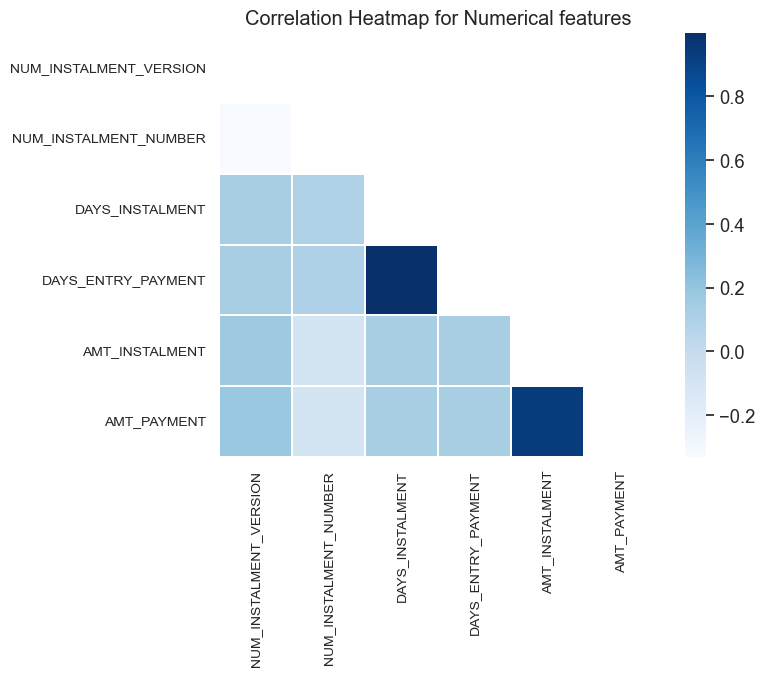

----------------------------------------------------------------------------------------------------


In [43]:
#Matrice de corrélation: 
corr_mat = correlation_matrix(installments_merged2, ['SK_ID_CURR','SK_ID_PREV'], figsize = (8,7))
corr_mat.plot_correlation_matrix()

In [44]:
#Voir les colonnes supérieures avec la corrélation phik la plus élevée avec la variable cible dans le data "installments_payments":
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 100)
print("Les colonnes avec les valeurs les plus élevées de corrélation Phik avec la variable cible sont :")
display(top_corr_target_df)
print("-"*100)

interval columns not set, guessing: ['TARGET', 'NUM_INSTALMENT_VERSION']
interval columns not set, guessing: ['TARGET', 'NUM_INSTALMENT_NUMBER']
interval columns not set, guessing: ['TARGET', 'DAYS_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'DAYS_ENTRY_PAYMENT']
interval columns not set, guessing: ['TARGET', 'AMT_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT']
----------------------------------------------------------------------------------------------------
Les colonnes avec les valeurs les plus élevées de corrélation Phik avec la variable cible sont :


,Column Name,Phik-Correlation
2,DAYS_INSTALMENT,0.046824
3,DAYS_ENTRY_PAYMENT,0.033128
1,NUM_INSTALMENT_NUMBER,0.022993
4,AMT_INSTALMENT,0.004125
5,AMT_PAYMENT,0.003084
0,NUM_INSTALMENT_VERSION,0.002198


----------------------------------------------------------------------------------------------------


Remarque: 

la matrice de corrélation entre chaque features de la table versements_payments avec le reste des features.

Nous pouvons voir que quelques caractéristiques hautement corrélées:

- AMT_INSTALMENT et AMT_PAYMENT
- DAYS_INSTALMENT et DAYS_ENTRY_PAYMENT

Ces deux ensembles de caractéristiques corrélées sont compréhensibles, car ce sont en fait les caractéristiques du moment où le versement devait être payé par rapport au moment où il a été payé, ainsi que le montant qui était dû par rapport au montant qui a été payé.

Ces fonctionnalités seront utiles pour créer de nouveaux ensembles de fonctionnalités complètement non corrélées.

La corrélation des caractéristiques avec la target n'est pas perceptible, cela montre l'absence de relation linéaire entre la caractéristique et la feature target.

---
Tout d'abord, nous allons regrouper par le champ 'SK_ID_PREV' et agréger avec la moyenne, de sorte que nous obtenions une ligne moyenne pour chacun des prêts précédents que le client avait.

In [45]:
installments_merged = installments_merged2.groupby('SK_ID_PREV').mean()

Distribution du feature :"Days installments":
Cette colonne répertorie les jours où l'échéance du crédit précédent devait être payée.

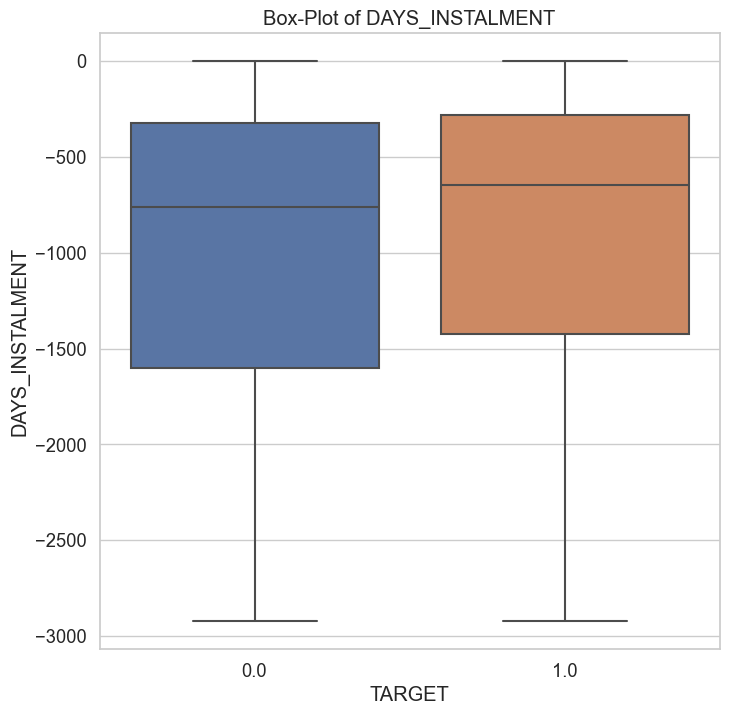

In [46]:
plot_continuous_variables(installments_merged, 'DAYS_INSTALMENT', plots = ['box'], figsize = (8,8))

Répartition des DAYS_ENTRY_PAYMENT 

Cette colonne répertorie les jours où l'échéance du crédit précédent a été effectivement payée.

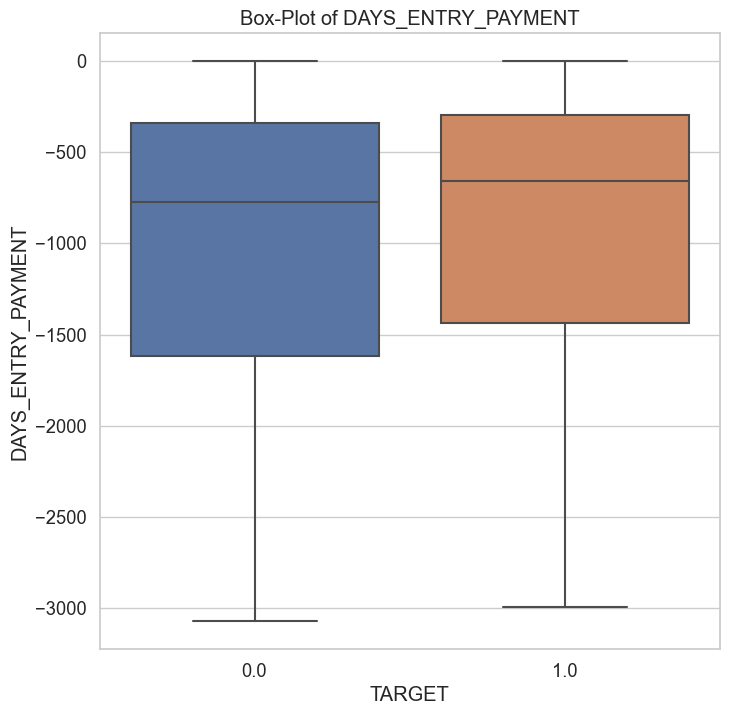

In [47]:
plot_continuous_variables(installments_merged, 'DAYS_ENTRY_PAYMENT', plots = ['box'], figsize = (8,8))
del installments_merged

Remarque :

À partir des deux graphiques ci-dessus, nous pouvons voir un schéma similaire, où les défaillants ont tendance à avoir moins de jours depuis leur dernier paiement, tandis que les non-défaillants ont plus de jours depuis leurs derniers paiements. 

Tous les quantiles de défaillants ont des jours plus récents que ceux des non-défaillants. Ainsi, les non-défaillants ont généralement plus d'écart dans leurs paiements à partir du jour de la demande par rapport aux défaillants.

______
POS_CASh_balance:

Ce DF contient les aperçus mensuels du solde des points de vente et des prêts en espèces antérieurs que le demandeur avait avec Home Credit Group. Le tableau contient des colonnes telles que le statut du contrat, le nombre de versements restants, etc.

In [48]:
POS_CASH_balance = pd.read_csv('Data/POS_CASH_balance.csv')
print(f'La Taille de POS_CASH_balance.csv est {POS_CASH_balance.shape}')
print('-'*100)
print(f'Le nombre de SK_ID_PREV uniques dans POS_CASH_balance.csv est : {len(POS_CASH_balance.SK_ID_PREV.unique())}')
print(f'Le nombre de SK_ID_CURR uniques dans POS_CASH_balance.csv est : {len(POS_CASH_balance.SK_ID_CURR.unique())}')
print('-'*100)
print(f'Le nombre de SK_ID_CURR qui se chevauchent dans application_train.csv et POS_CASH_balance.csv est: {len(set(application_train.SK_ID_CURR.unique()).intersection(set(POS_CASH_balance.SK_ID_CURR.unique())))}')
print(f'Le nombre de SK_ID_CURR qui se chevauchent dans application_test.csv et POS_CASH_balance.csv sont : {len(set(application_test.SK_ID_CURR.unique()).intersection(set(POS_CASH_balance.SK_ID_CURR.unique())))}')
print('-'*100)
print(f'Nombre de valeurs en double dans POS_CASH_balance {POS_CASH_balance.shape[0] - POS_CASH_balance.duplicated().shape[0]}')
print('-'*100)
display(POS_CASH_balance.head())

La Taille de POS_CASH_balance.csv est (10001358, 8)
----------------------------------------------------------------------------------------------------
Le nombre de SK_ID_PREV uniques dans POS_CASH_balance.csv est : 936325
Le nombre de SK_ID_CURR uniques dans POS_CASH_balance.csv est : 337252
----------------------------------------------------------------------------------------------------
Le nombre de SK_ID_CURR qui se chevauchent dans application_train.csv et POS_CASH_balance.csv est: 289444
Le nombre de SK_ID_CURR qui se chevauchent dans application_test.csv et POS_CASH_balance.csv sont : 289444
----------------------------------------------------------------------------------------------------
Nombre de valeurs en double dans POS_CASH_balance 0
----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


Remarque: 

Ce tableau contient environ 10 millions de points de données, où chaque ligne correspond à l'instantané mensuel de l'état du point de vente et du prêt en espèces précédents que le client avait avec Home Credit Group.

- Il se compose de 8 colonnes, dont deux sont SK_ID_CURR et SK_ID_PREV.

- Il y a 936 000 ID de prêts précédents uniques dans le tableau, ce qui correspond à 337 000 demandeurs actuels uniques (SK_ID_CURR).

- Sur ces 337k SK_ID_CURR, 289k appartiennent à l'ensemble d'apprentissage et 47,8k appartiennent à l'ensemble de test.

In [49]:
#Nan and Percentage:

print('-'*100)
print("Colonnes avec des valeurs NaN et leurs pourcentages :")
POS_CASH_nan = nan_df_create(POS_CASH_balance)
display(POS_CASH_nan[POS_CASH_nan.percent != 0])
print('-'*100)
del POS_CASH_nan

----------------------------------------------------------------------------------------------------
Colonnes avec des valeurs NaN et leurs pourcentages :


,column,percent
4,CNT_INSTALMENT_FUTURE,0.260835
3,CNT_INSTALMENT,0.260675


----------------------------------------------------------------------------------------------------


Remarque:

Il n'y a que 2 colonnes qui contiennent les valeurs NaN des 8 colonnes de POS_CASH_balance. Ces colonnes indiquent le nombre de versements restants et la durée du prêt.

Ces colonnes contiennent également une proportion très minime de valeurs NaN, c'est-à-dire seulement 0,26%%, donc ce n'est pas non plus très préoccupant.
______
Fusion des TARGETS de la table application_train à la table POS_CASH_balance.

In [50]:
print("-"*100)
print("Merging TARGET with POS_CASH_balance Table")
pos_cash_merged = application_train.iloc[:,:2].merge(POS_CASH_balance, on = 'SK_ID_CURR', how = 'left')
print("-"*100)

----------------------------------------------------------------------------------------------------
Merging TARGET with POS_CASH_balance Table
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


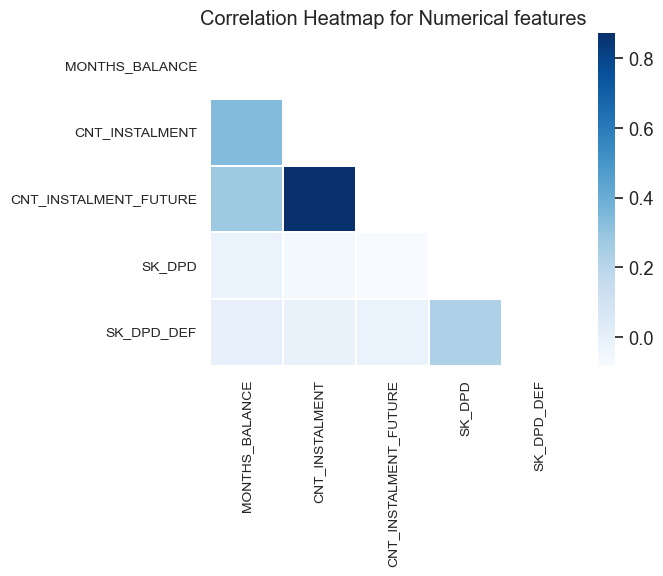

----------------------------------------------------------------------------------------------------


In [51]:
#Matrice de corrélation: 

corr_mat = correlation_matrix(pos_cash_merged, ['SK_ID_CURR','SK_ID_PREV'], figsize = (7,6))
corr_mat.plot_correlation_matrix()

In [52]:
#Voir les colonnes supérieures avec la corrélation phik la plus élevée avec la variable cible dans la table POS_CASH_balance
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 100)
print("Les colonnes avec les valeurs les plus élevées de corrélation Phik avec la variable cible sont:")
display(top_corr_target_df)
print("-"*100)

interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE']
interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT_FUTURE']
interval columns not set, guessing: ['TARGET', 'SK_DPD']
interval columns not set, guessing: ['TARGET', 'SK_DPD_DEF']
----------------------------------------------------------------------------------------------------
Les colonnes avec les valeurs les plus élevées de corrélation Phik avec la variable cible sont:


,Column Name,Phik-Correlation
2,CNT_INSTALMENT_FUTURE,0.033194
1,CNT_INSTALMENT,0.030947
0,MONTHS_BALANCE,0.027391
3,SK_DPD,0.012773
4,SK_DPD_DEF,0.010539


----------------------------------------------------------------------------------------------------


Remarque:

La heatmap ci-dessus montre la corrélation entre les fetures:

À partir de la matrice de corrélation, nous avons un ensemble de feature modérément corrélées, qui sont : 

- CNT_INSTALMENT et CNT_INSTALMENT_FUTURE.

La corrélation des features avec la cible est très faible, cela montre l'absence de relation linéaire entre la caractéristique et la variable cible.

______
Tout d'abord, nous allons regrouper par le champ 'SK_ID_PREV' et agréger avec la moyenne, de sorte que nous obtenions une ligne moyenne pour chacun des prêts précédents que le client avait.

In [53]:
pos_cash_merged = pos_cash_merged.groupby('SK_ID_PREV').mean()

Répartition de la variable continue "CNT_INSTALMENT_FUTURE":

- Cette colonne décrit le nombre d'échéances restant à payer sur le crédit précédent.

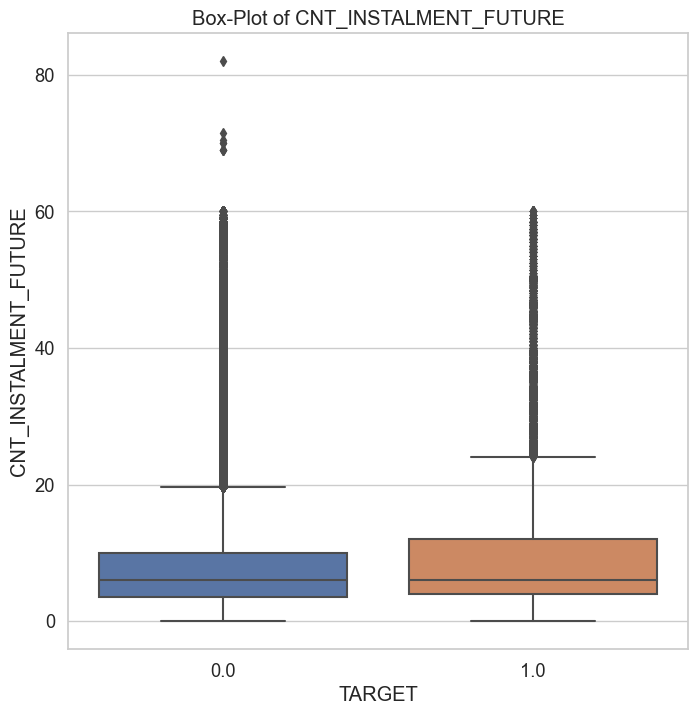

In [54]:
plot_continuous_variables(pos_cash_merged, 'CNT_INSTALMENT_FUTURE', plots = ['box'], figsize = (8,8))
del pos_cash_merged

Remarque:

En regardant la boîte à moustaches ci-dessus pour CNT_INSTALMENT_FUTURE, nous voyons que les valeurs de centile> 50 % pour les défaillants sont généralement plus élevées que celles des non-défaillants. 

Même la limite supérieure des moustaches pour les défaillants est supérieure à celle des non-défaillants.

 => Cela suggère que les défaillants ont tendance à avoir plus de versements restants sur leurs crédits précédents par rapport aux non-défaillants.
_______
credit_card_balance.csv

Ce tableau comprend les données mensuelles relatives à une ou plusieurs cartes de crédit que le demandeur avait avec le groupe Home Credit. Le tableau contient des champs comme le solde, la limite de crédit, le montant des tirages, etc. pour chaque mois de la carte de crédit.

In [55]:
cc_balance = pd.read_csv('Data/credit_card_balance.csv')
print(f'The shape of credit_card_balance.csv is: {cc_balance.shape}')
print('-'*100)
print(f'Number of unique SK_ID_PREV in credit_card_balance.csv are: {len(cc_balance.SK_ID_PREV.unique())}')
print(f'Number of unique SK_ID_CURR in credit_card_balance.csv are: {len(cc_balance.SK_ID_CURR.unique())}')
print('-'*100)
print(f'Number of overlapping SK_ID_CURR in application_train.csv and credit_card_balance.csv are: {len(set(application_train.SK_ID_CURR.unique()).intersection(set(cc_balance.SK_ID_CURR.unique())))}')
print(f'Number of overlapping SK_ID_CURR in application_test.csv and credit_card_balance.csv are: {len(set(application_test.SK_ID_CURR.unique()).intersection(set(cc_balance.SK_ID_CURR.unique())))}')
print('-'*100)

print(f'Number of duplicate values in credit_card_balance: {cc_balance.shape[0] - cc_balance.duplicated().shape[0]}')
print('-'*100)
display(cc_balance.head(5))

The shape of credit_card_balance.csv is: (3840312, 23)
----------------------------------------------------------------------------------------------------
Number of unique SK_ID_PREV in credit_card_balance.csv are: 104307
Number of unique SK_ID_CURR in credit_card_balance.csv are: 103558
----------------------------------------------------------------------------------------------------
Number of overlapping SK_ID_CURR in application_train.csv and credit_card_balance.csv are: 86905
Number of overlapping SK_ID_CURR in application_test.csv and credit_card_balance.csv are: 86905
----------------------------------------------------------------------------------------------------
Number of duplicate values in credit_card_balance: 0
----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


Remarque:

Il y a environ 3,84 millions de lignes dans le tableau credit_card_balance.csv, chacune correspondant au statut mensuel de la carte de crédit que le demandeur avait auprès de Home Credit Group. 

Ce tableau contient 23 fonctionnalités qui contiennent les statistiques sur l'état de la carte de crédit de chaque mois, telles que le montant du solde, le montant des retraits, le nombre de retraits, l'état, etc.

Il y a 104.3k cartes de crédit uniques dont les détails sont dans ce tableau.
Sur ces 104,3k, il y a 103,5k uniques SK_ID_CURR. Cela signifie que la plupart des candidats n'avaient qu'une seule carte de crédit avec eux, et que peu d'entre eux en avaient plus d'une. Ces SK_ID_CURR sont l'identifiant des candidats qui ont actuellement demandé un prêt.

Sur les 103 000 SK_ID_CURR uniques, 86,9 000 de ces candidats appartiennent à l'ensemble de formation et 16,6 000 appartiennent à l'ensemble de candidatures de test.

Sur 307 000 candidats dans la table application_train, seuls 86,9 000 d'entre eux possédaient auparavant une carte de crédit auprès de Home Credit Group.

----------------------------------------------------------------------------------------------------
Number of columns having NaN values: 9 columns


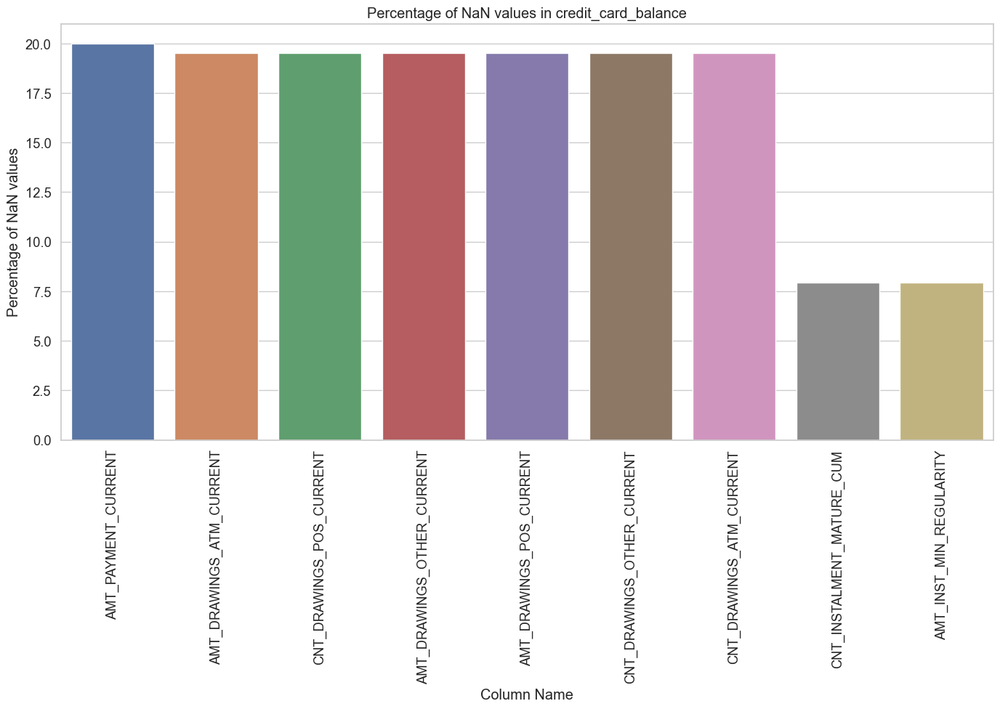

----------------------------------------------------------------------------------------------------


In [56]:
#Nan columns and Percentage:

cc_balance_nan = nan_df_create(cc_balance)
print('-'*100)
plot_nan_percent(cc_balance_nan, 'credit_card_balance', tight_layout = False, rotation = 90, figsize = (14,10))
print('-'*100)
del cc_balance_nan

Remarque:

- Sur les 23 features, 9 de ces features contiennent des valeurs NaN.

- Si nous regardons les pourcentages de valeurs NaN, ils sont considérablement inférieurs au reste des tableaux que nous avons vus jusqu'à présent.

7 de ces features ont des valeurs de NaN proches de 20 %. Ces caractéristiques sont principalement liées aux quantités de tirages et au nombre de tirages. Deux autres fonctionnalités sont liées aux statistiques des versements.

____
Fusion des TARGETS de la table application_train à credit_card_balance.

In [57]:
print("-"*100)
print("Fusion de TARGET avec la table credit_card_balance")
cc_balance_merged = application_train.iloc[:,:2].merge(cc_balance, on = 'SK_ID_CURR', how = 'left')
print("-"*100)

----------------------------------------------------------------------------------------------------
Fusion de TARGET avec la table credit_card_balance
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------


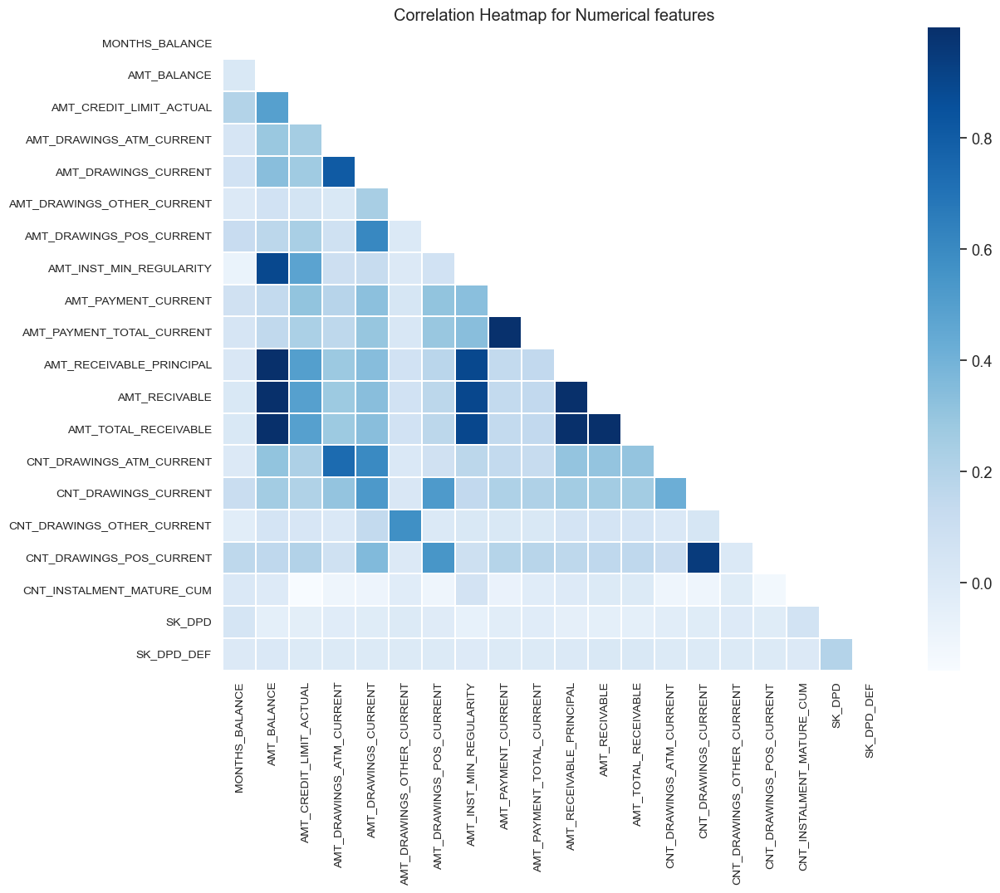

----------------------------------------------------------------------------------------------------


In [58]:
#Matrice de corrélation:
corr_mat = correlation_matrix(cc_balance_merged, ['SK_ID_CURR','SK_ID_PREV'], figsize = (13,11))
corr_mat.plot_correlation_matrix()

In [59]:
#Voir les premières colonnes avec la corrélation phik la plus élevée avec la variable cible dans la table credit_card_balance
top_corr_target_df = corr_mat.target_top_corr()
print("-" * 100)
print("Les colonnes avec les valeurs les plus élevées de corrélation Phik avec la variable cible sont :")
display(top_corr_target_df)
print("-" * 100)

interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE']
interval columns not set, guessing: ['TARGET', 'AMT_BALANCE']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_LIMIT_ACTUAL']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_ATM_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_OTHER_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_POS_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_INST_MIN_REGULARITY']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT_TOTAL_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_RECEIVABLE_PRINCIPAL']
interval columns not set, guessing: ['TARGET', 'AMT_RECIVABLE']
interval columns not set, guessing: ['TARGET', 'AMT_TOTAL_RECEIVABLE']
interval columns not set, guessing: ['TARGET', 'CNT_DRAWINGS_ATM_CURREN

,Column Name,Phik-Correlation
1,AMT_BALANCE,0.059838
11,AMT_RECIVABLE,0.059311
12,AMT_TOTAL_RECEIVABLE,0.059287
10,AMT_RECEIVABLE_PRINCIPAL,0.058895
0,MONTHS_BALANCE,0.050360
7,AMT_INST_MIN_REGULARITY,0.042174
17,CNT_INSTALMENT_MATURE_CUM,0.038261
13,CNT_DRAWINGS_ATM_CURRENT,0.030052
2,AMT_CREDIT_LIMIT_ACTUAL,0.028752
14,CNT_DRAWINGS_CURRENT,0.027868


----------------------------------------------------------------------------------------------------


La heatmap ci-dessus montre visuellement la corrélation entre les features de la table credit_card_balance.

À partir de la carte thermique de la matrice de corrélation, nous voyons quelques couples de caractéristiques hautement corrélées. Ceux-ci sont:

- AMT_RECEIVABLE_PRINCIPLE, AMT_RECIVABLE, AMT_TOTAL_RECEIVABLE et AMT_BALANCE

Nous observons également une forte corrélation entre ces 3 colonnes:
- AMT_RECEIVABLE
- AMT_PAYMENT_TOTAL_CURRENT et AMT_PAYMENT_CURRENT

Les ensembles de 2ème et 3ème features corrélées sont compréhensibles car ils ont plus ou moins la même histoire.

La corrélation des features avec la cible n'est pas perceptible, cela montre l'absence de relation linéaire entre la caractéristique et la variable cible.
________
Viz

Tout d'abord, nous allons regrouper par le champ 'SK_ID_PREV' et agréger avec la moyenne, de sorte que nous obtenions une ligne moyenne pour chacun des prêts précédents que le client avait.

In [60]:
cc_balance_merged = cc_balance_merged.groupby('SK_ID_PREV').mean()

Répartition de la variable continue "AMT_BALANCE"

Cette colonne fournissait le montant moyen du solde qu'une personne avait habituellement sur son compte de prêt de carte de crédit pour un prêt précédent.

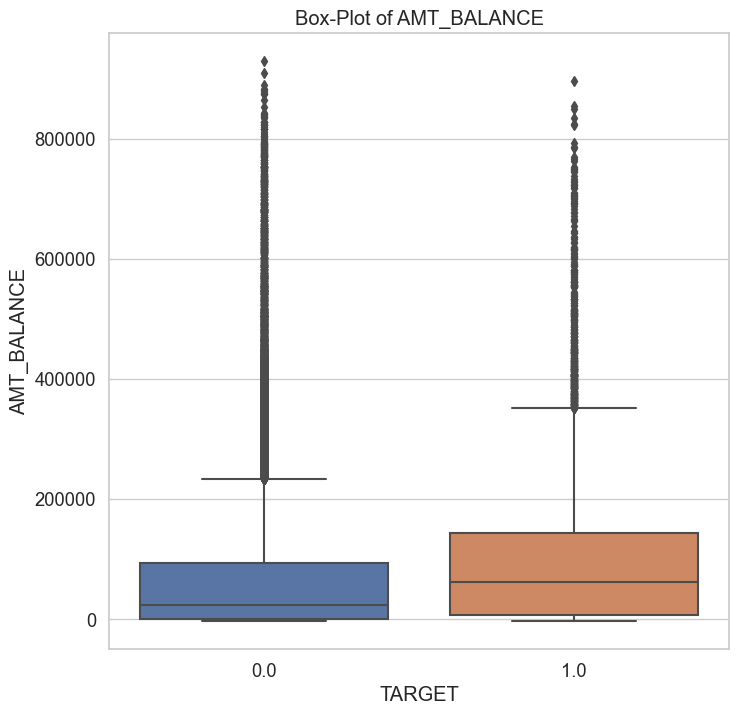

In [61]:
plot_continuous_variables(cc_balance_merged, 'AMT_BALANCE', plots = ['box'], figsize = (8,8))

Remarque: 

D'après le graphique ci-dessus, on peut voir que les défaillants ont une valeur plus élevée "d'AMT_BALANCE" par rapport aux non-défaillants. Ils montrent des valeurs plus élevées.

- Cela pourrait impliquer que le montant du crédit pour les défaillants pourrait également être relativement plus élevé par rapport aux non-défaillants.


Nous voyons que les défaillants ici aussi semblaient avoir un versement minimum plus élevé chaque mois par rapport aux non-défaillants.

- Cela indique généralement les dépenses et les habitudes d'emprunt des gens. 
- Les défaillants affichent des habitudes de dépenses et d'emprunt plus élevées que les non-défaillants.
______
Répartition de la variable continue AMT_TOTAL_RECEIVABLE

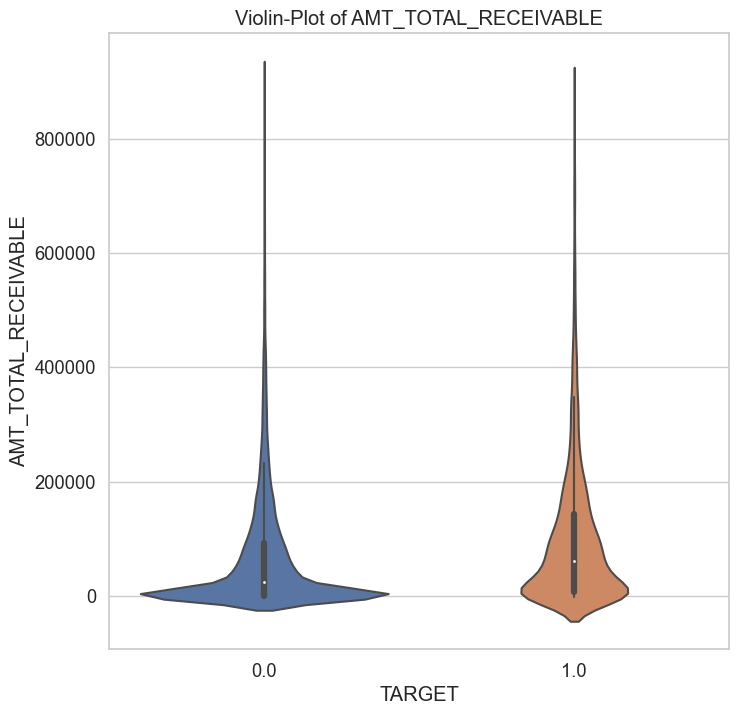

In [62]:
plot_continuous_variables(cc_balance_merged, 'AMT_TOTAL_RECEIVABLE', plots = ['violin'], figsize = (8,8))

Remarque:

En regardant la boîte à moustaches de AMT_TOTAL_RECEIVABLE, nous voyons un comportement similaire à celui observé avec d'autres montants également, à savoir que les défaillants avaient généralement un montant à recevoir plus élevé sur leur crédit précédent, ce qui peut impliquer des montants de crédits plus élevés qu'ils ont pu prendre.

Le graphe montre également un pic très élevé à des montants inférieurs pour les non-défaillants par rapport aux défaillants.
_____
Répartition de la variable continue CNT_INSTALMENT_MATURE_CUM

La colonne décrit environ le nombre moyen de versements payés sur les crédits précédents.

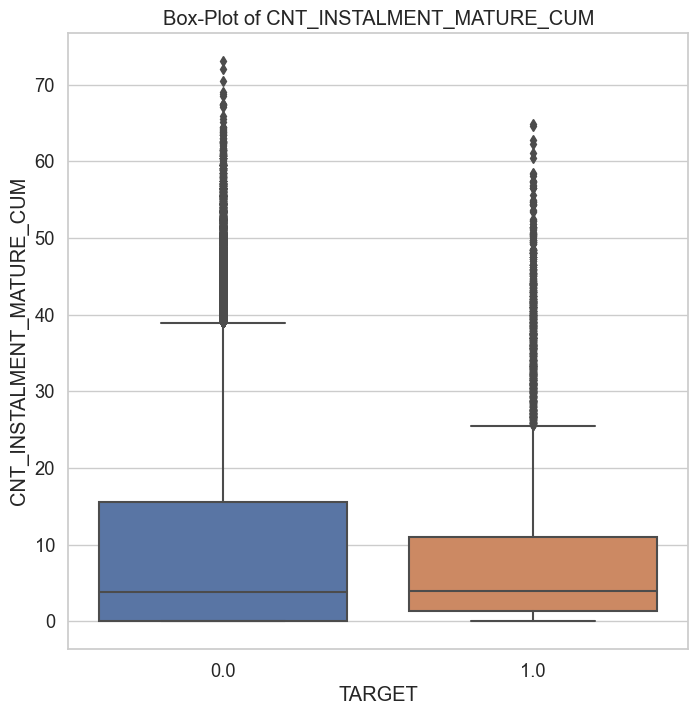

In [63]:
plot_continuous_variables(cc_balance_merged, 'CNT_INSTALMENT_MATURE_CUM', plots = ['box'], figsize = (8,8))

Remarque: 
Ce graphique montre que les non-défaillants avaient généralement une plage de valeurs plus élevée pour le nombre de versements payés par rapport aux défaillants. 

Cela pourrait montrer le comportement défaillant, où les défaillants paieraient généralement moins de versements sur leur crédit précédente.

______

Conclusions de l'EDA

À partir de l'analyse exhaustive des données exploratoires que nous avons effectuée, nous pouvons tirer des conclusions suivante sur  ensemble de données donné.

- Tout d'abord, l'ensemble de données devra être fusionné avec un moyen ingénieux pour que les données fusionnées aient un sens.

- Certaines catégories sont très bien discriminatoires entre les défaillants et les non-défaillants, ce qui pourrait être important aux fins de la classification.

- Il y a peu de variables numériques continues qui contiennent des points erronés, nous aurions à gérer ces points.

- Nous avons également remarqué certaines caractéristiques corrélées, qui augmenteraient simplement la dimensionnalité des données, et n'ajouteraient pas beaucoup de valeur. Nous voudrions supprimer ces fonctionnalités.

- Dans l'ensemble, l'ensemble de données est déséquilibré et nous aurions besoin de trouver des techniques pour gérer un tel déséquilibre.

- Pour la prédiction du risque de défaut, les défaillants ont généralement tendance à avoir un comportement qui n'est pas normal, et par conséquent, nous ne pouvons pas supprimer les valeurs aberrantes ou les points éloignés, car ils peuvent suggérer une tendance importante au défaut.

Avec toutes ces informations, nous passerons à la tâche de nettoyage des données et d'ingénierie des fonctionnalités.

In [64]:
bureau = pd.read_csv('Data/bureau.csv')
bureau_balance = pd.read_csv('Data/bureau_balance.csv')
POS_CASH_balance = pd.read_csv('Data/POS_CASH_balance.csv')
previous_application = pd.read_csv("Data/previous_application.csv")
HomeCredit_columns_description = pd.read_csv("Data/HomeCredit_columns_description.csv",sep="\t",encoding='latin')
cc_balance = pd.read_csv('Data/credit_card_balance.csv')

dataframes = [application_train, application_test, bureau, bureau_balance,
              cc_balance, installments_payments, POS_CASH_balance,
              previous_application, HomeCredit_columns_description]
noms = ['application_train', 'application_test', 'bureau', 'bureau_balance',
        'cc_balance', 'installments_payments', 'POS_CASH_balance',
        'previous_application', 'HomeCredit_columns_description']
resume_datasets(dataframes, noms)

Les données se décomposent en 9 fichier(s).


Jeu de données,Nb lignes,Nb variables,Nb nan,% nan,Nb var avec nan,Var avec nan
application_train,307511,122,9152465,24.395942,67,"AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, CNT_FAM_MEMBERS, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
application_test,307511,122,9152465,24.395942,67,"AMT_ANNUITY, AMT_GOODS_PRICE, NAME_TYPE_SUITE, OWN_CAR_AGE, OCCUPATION_TYPE, CNT_FAM_MEMBERS, EXT_SOURCE_1, EXT_SOURCE_2, EXT_SOURCE_3, APARTMENTS_AVG, BASEMENTAREA_AVG, YEARS_BEGINEXPLUATATION_AVG, YEARS_BUILD_AVG, COMMONAREA_AVG, ELEVATORS_AVG, ENTRANCES_AVG, FLOORSMAX_AVG, FLOORSMIN_AVG, LANDAREA_AVG, LIVINGAPARTMENTS_AVG, LIVINGAREA_AVG, NONLIVINGAPARTMENTS_AVG, NONLIVINGAREA_AVG, APARTMENTS_MODE, BASEMENTAREA_MODE, YEARS_BEGINEXPLUATATION_MODE, YEARS_BUILD_MODE, COMMONAREA_MODE, ELEVATORS_MODE, ENTRANCES_MODE, FLOORSMAX_MODE, FLOORSMIN_MODE, LANDAREA_MODE, LIVINGAPARTMENTS_MODE, LIVINGAREA_MODE, NONLIVINGAPARTMENTS_MODE, NONLIVINGAREA_MODE, APARTMENTS_MEDI, BASEMENTAREA_MEDI, YEARS_BEGINEXPLUATATION_MEDI, YEARS_BUILD_MEDI, COMMONAREA_MEDI, ELEVATORS_MEDI, ENTRANCES_MEDI, FLOORSMAX_MEDI, FLOORSMIN_MEDI, LANDAREA_MEDI, LIVINGAPARTMENTS_MEDI, LIVINGAREA_MEDI, NONLIVINGAPARTMENTS_MEDI, NONLIVINGAREA_MEDI, FONDKAPREMONT_MODE, HOUSETYPE_MODE, TOTALAREA_MODE, WALLSMATERIAL_MODE, EMERGENCYSTATE_MODE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR"
bureau,1716428,17,3939947,13.502552,7,"DAYS_CREDIT_ENDDATE, DAYS_ENDDATE_FACT, AMT_CREDIT_MAX_OVERDUE, AMT_CREDIT_SUM, AMT_CREDIT_SUM_DEBT, AMT_CREDIT_SUM_LIMIT, AMT_ANNUITY"
bureau_balance,27299925,3,0,0.000000,0,
cc_balance,3840312,23,5877356,6.654074,9,"AMT_DRAWINGS_ATM_CURRENT, AMT_DRAWINGS_OTHER_CURRENT, AMT_DRAWINGS_POS_CURRENT, AMT_INST_MIN_REGULARITY, AMT_PAYMENT_CURRENT, CNT_DRAWINGS_ATM_CURRENT, CNT_DRAWINGS_OTHER_CURRENT, CNT_DRAWINGS_POS_CURRENT, CNT_INSTALMENT_MATURE_CUM"
installments_payments,13605401,8,5810,0.005338,2,"DAYS_ENTRY_PAYMENT, AMT_PAYMENT"
POS_CASH_balance,10001358,8,52158,0.065189,2,"CNT_INSTALMENT, CNT_INSTALMENT_FUTURE"
previous_application,1670214,37,11109336,17.976877,16,"AMT_ANNUITY, AMT_CREDIT, AMT_DOWN_PAYMENT, AMT_GOODS_PRICE, RATE_DOWN_PAYMENT, RATE_INTEREST_PRIMARY, RATE_INTEREST_PRIVILEGED, NAME_TYPE_SUITE, CNT_PAYMENT, PRODUCT_COMBINATION, DAYS_FIRST_DRAWING, DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, DAYS_TERMINATION, NFLAG_INSURED_ON_APPROVAL"
HomeCredit_columns_description,219,1,0,0.000000,0,


#### Variable "Name_HOUSING_TYPE" :
- Situation du demandeur en matière de logement(location,propriétaire,etc...)

In [65]:
def plot_categorical_variables_bar(data, column_name, figsize=(18, 6),
                                   percentage_display=True,
                                   plot_defaulter=True, rotation=0,
                                   horizontal_adjust=0,
                                   fontsize_percent='xx-small',
                                   palette1='Set1',
                                   palette2='Set2'):
    '''
    Function to plot Categorical Variables Bar Plots
    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        figsize: tuple, default = (18,6)
            Size of the figure to be plotted
        percentage_display: bool, default = True
            Whether to display the percentages on top of Bars in Bar-Plot
        plot_defaulter: bool
            Whether to plot the Bar Plots for Defaulters or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
        horizontal_adjust: int, default = 0
            Horizontal adjustment parameter for percentages displayed on the top of Bars of Bar-Plot
        fontsize_percent: str, default = 'xx-small'
            Fontsize for percentage Display
    '''

    print(
        f"Nombre de catégories uniques pour {column_name} = {len(data[column_name].unique())}")

    plt.figure(figsize=figsize, tight_layout=True)
    sns.set(style='whitegrid', font_scale=1.2)

    # plotting overall distribution of category
    plt.subplot(1, 2, 1)
    data_to_plot = data[column_name].value_counts().sort_values(ascending=False)
    ax = sns.barplot(x=data_to_plot.index, y=data_to_plot, palette=palette1)

    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(
                p.get_x() +
                horizontal_adjust,
                p.get_height() +
                0.005 *
                total_datapoints,
                '{:1.02f}%'.format(
                    p.get_height() *
                    100 /
                    total_datapoints),
                fontsize=fontsize_percent)

    plt.xlabel(column_name, labelpad=10)
    plt.title('Toutes TARGET', pad=20, fontsize=30)
    plt.xticks(rotation=rotation, fontsize=20)
    plt.yticks(fontsize=20)
    plt.ylabel('Nombre', fontsize=20)

    # plotting distribution of category for Defaulters
    if plot_defaulter:
        percentage_defaulter_per_category = (data[column_name][data.TARGET == 1].value_counts(
        ) * 100 / data[column_name].value_counts()).dropna().sort_values(ascending=False)

        plt.subplot(1, 2, 2)
        sns.barplot(x=percentage_defaulter_per_category.index,
                    y=percentage_defaulter_per_category, palette=palette2)
        plt.ylabel(
            'Pourcentage par catégorie pour les défaillants',
            fontsize=20)
        plt.xlabel(column_name, labelpad=10)
        plt.xticks(rotation=rotation, fontsize=20)
        plt.yticks(fontsize=20)
        plt.title('Défaillants seuls', pad=20, fontsize=30)

    plt.suptitle(f'Répartition de {column_name}', fontsize=40)
    plt.show()


----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_HOUSING_TYPE' are:
['House / apartment' 'Rented apartment' 'With parents'
 'Municipal apartment' 'Office apartment' 'Co-op apartment']
----------------------------------------------------------------------------------------------------
Counts of each category are:
House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_HOUSING_TYPE = 6


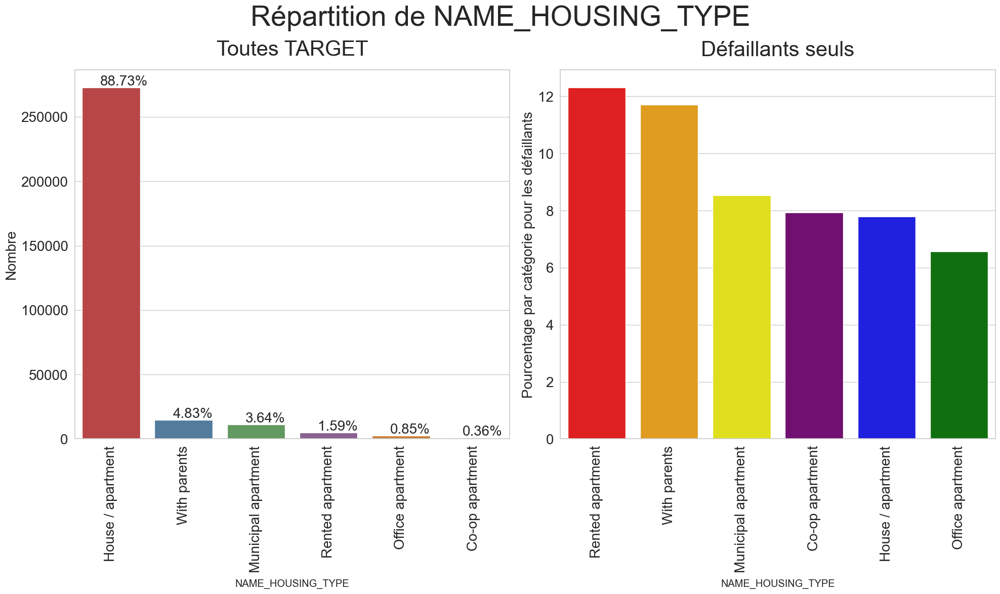

In [66]:
# Let us first see the unique categories of 'NAME_HOUSING_TYPE'
print_unique_categories(application_train, 'NAME_HOUSING_TYPE',
                            show_counts=True)

# plotting the Bar Plot for the Column

plot_categorical_variables_bar(application_train,
                                   column_name='NAME_HOUSING_TYPE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c'],
                                   palette2=['red', 'orange',
                                             'yellow', 'purple',
                                             'blue', 'green'])

In [67]:
def plot_barplot_comp_target(dataframe, feature_name,
                             labels=['Non-défaillant', 'Défaillant'],
                             palette=['SteelBlue', 'crimson'],
                             rotation=0):
    '''
    Barplot de comparaison des catégories par target.
    Parameters
    ----------
    dataframe : dataframe, obligatoire.
    feature_name : variable, obligatoire.
    Returns
    -------
    None.
    '''
    sns.countplot(x=dataframe[feature_name], hue=dataframe.TARGET,
                  data=dataframe, palette=palette)

    plt.xticks(rotation=rotation)
    plt.title(f'Distribution de {feature_name} par défaillant/non-défaillant')
    plt.legend(labels=labels,
               bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()

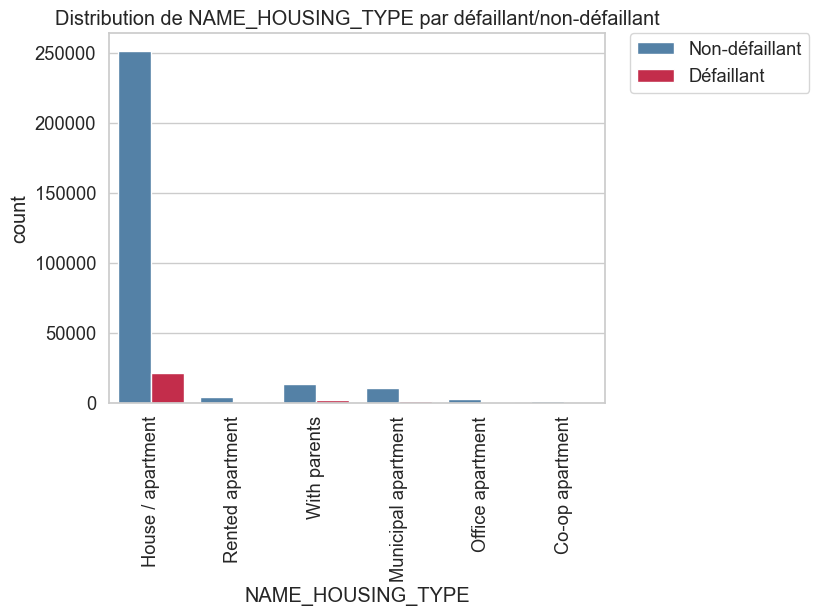

In [68]:
# Distribution par défaillants/non-défaillants
plot_barplot_comp_target(application_train,'NAME_HOUSING_TYPE',
                                              rotation=90)



Remarque : 
    
- la majorité (89%)des demandeurs sont propriétaires d'une maison ou d'un appartement.
-  5% des demandeurs vivent chez leurs parents.
-  5 autres pourcent concernent les appartements de location,
    municipaux ou les co-locations.

- La marjorité des personnes défaillant vivent en Maison/Appartement 


#### Variable "NAME_FAMILY_STATUS" :

- Cette variable indique la Situation familiale du demandeur (Célibataire, marié, pacsé, séparé, divorcé, veuf...).

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_FAMILY_STATUS' are:
['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated'
 'Unknown']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_FAMILY_STATUS = 6


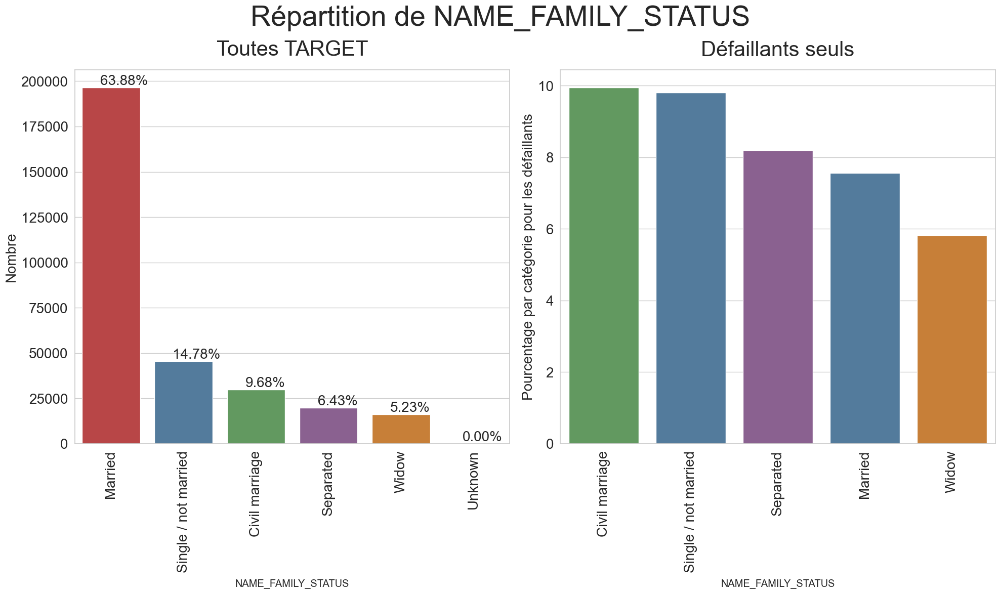

In [69]:
print_unique_categories(application_train, 'NAME_FAMILY_STATUS',
                            show_counts=True)

#plotting the Bar Plot for the Column

plot_categorical_variables_bar(application_train,
                                   column_name='NAME_FAMILY_STATUS',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c'],
                                   palette2=['#59a257', '#477ca8',
                                             '#905998', '#477ca8',
                                             '#df7f20'])

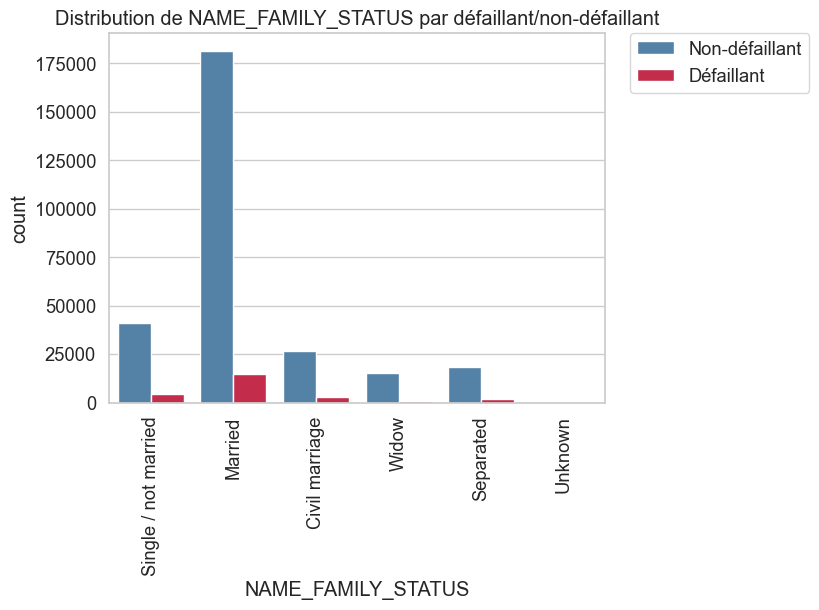

In [70]:
# Distribution par défaillants/non-défaillants
plot_barplot_comp_target(application_train,'NAME_FAMILY_STATUS',rotation=90)

Remarque:
   -  Env 15% des demandeurs sont célibataires.
   -  la majorité (74%) des demandeurs sont mariés (64% mariés religieusement, 10% mariés civilement).
   -  le reste est réparti entre les séparés (6.5%) et les veufs (%).

   Non-défaillant/Défaillant:

   - Ce le personnes mariés qui sont les plus défaillant (env 10%)
   - A l'inverse des "veuf" -> "inf 6%" . 



#### Variable "NAME_INCOME_TYPE" 
Cette variable représente le type des revenus des demandeurs (homme d'affaires, travailleur, congé de maternité...)

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_INCOME_TYPE' are:
['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_INCOME_TYPE = 8


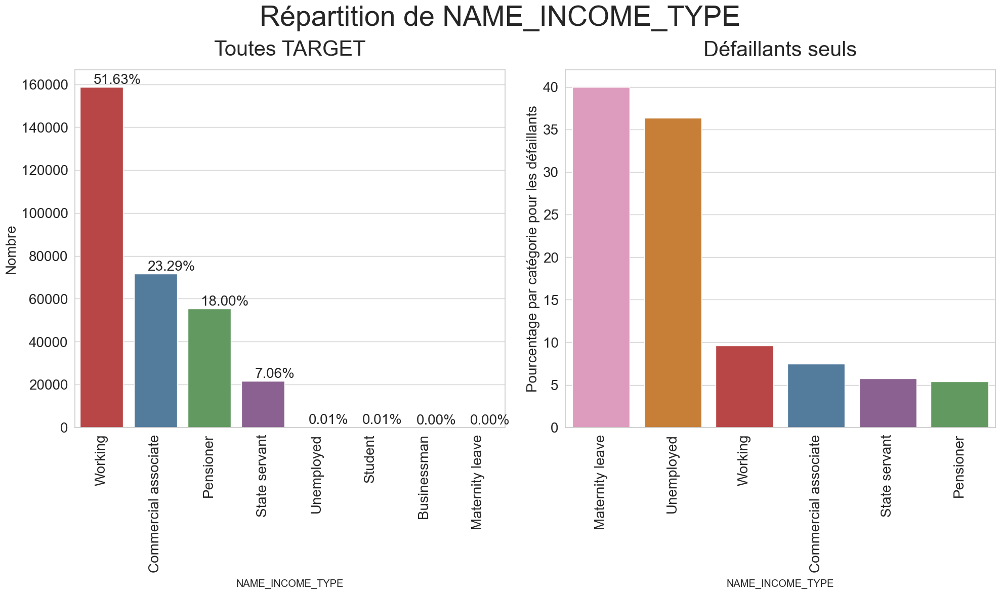

In [71]:
# Let us first see the unique categories of 'NAME_INCOME_TYPE'
print_unique_categories(application_train, 'NAME_INCOME_TYPE',
                            show_counts=True)

# plotting the Bar Plot for the Column
plot_categorical_variables_bar(application_train,
                                   column_name='NAME_INCOME_TYPE',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be'],
                                   palette2=['#e890be', '#df7f20',
                                             '#cb3335', '#477ca8',
                                             '#905998', '#59a257'])

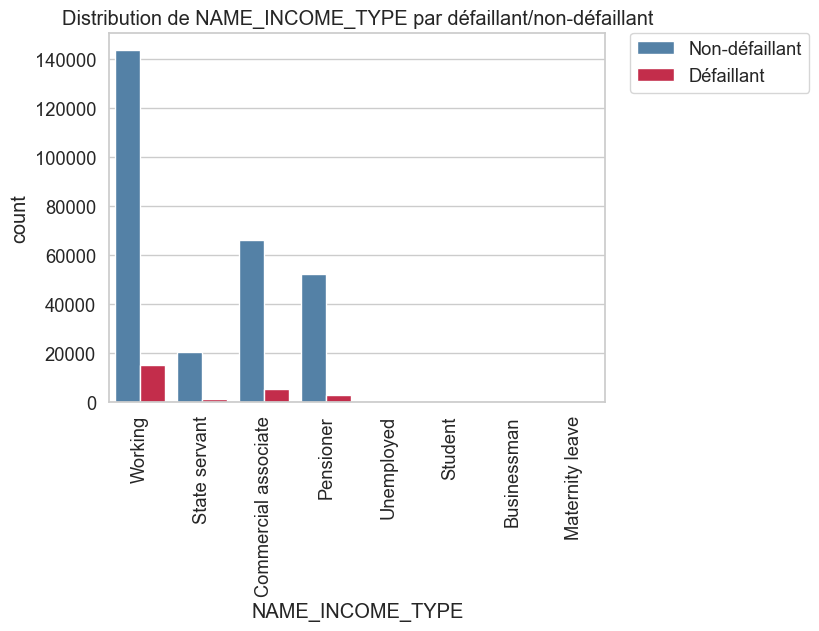

In [72]:
# Distribution par défaillants/non-défaillants
plot_barplot_comp_target(application_train,'NAME_INCOME_TYPE',
                                              rotation=90)

Remarque: 

    - la majorité des demandeurs sont des travailleurs (52%),
    - 23% de commerciaux, 18% de retraités et 7 % des vendeurs.
    - très peu de type de revenus passifs : non salariés, étudiants, hommes d'affaires et en congés de maternité : autour de 0%.

Concernant les défaillants, ce sont :

   - les congés de maternité et les non salariés (près de 40%),
   - puis seulement 10% de la classe majoritaire des travailleurs
    et 5% de la classe des commerciaux.
   - Seulement 5% des 7% des retraités ne remboursent pas leurs dettes.




#### Variable FLAG_OWN_REALITY
- Variable indiquant si les demandeur possède une maison ou un appartement .

Nombre de catégories uniques pour FLAG_OWN_REALTY = 2


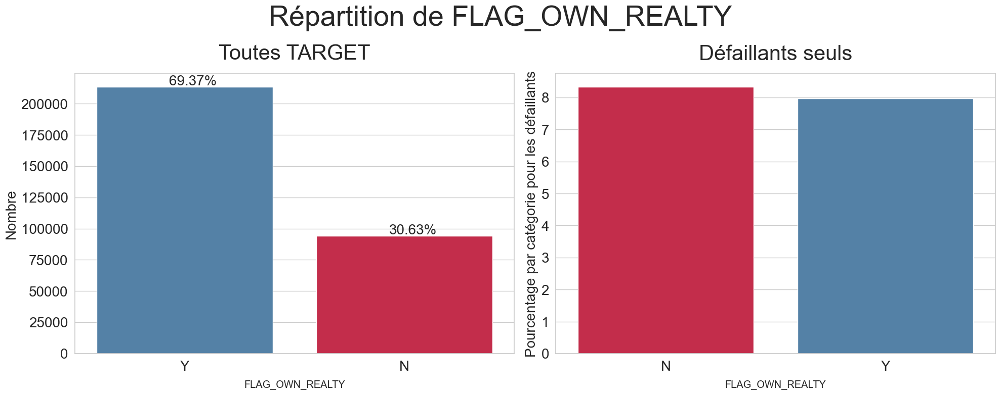

In [73]:
plot_categorical_variables_bar(
    application_train, column_name='FLAG_OWN_REALTY',
    figsize=(20, 8), horizontal_adjust=0.33, fontsize_percent=20,
    palette1=['SteelBlue', 'Crimson'], palette2=['Crimson', 'SteelBlue'])

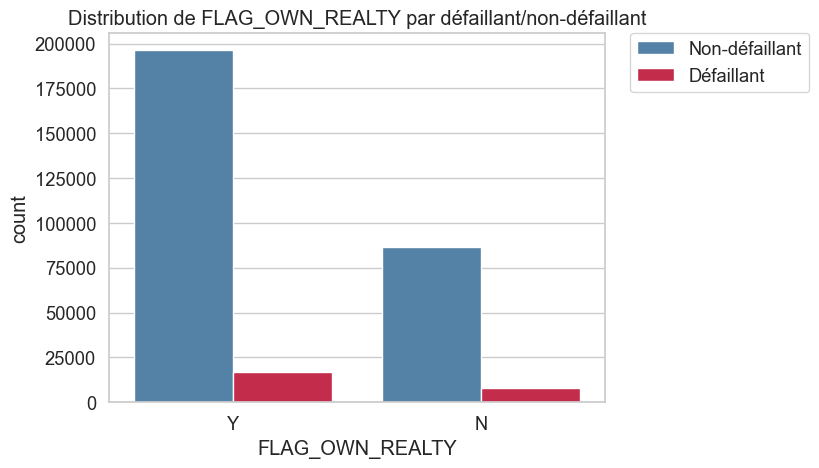

In [74]:
# Distribution par défaillants/non-défaillants
plot_barplot_comp_target(application_train,'FLAG_OWN_REALTY')



Remarque: 

 - 69% des demandeurs possèdent un une maison ou un appartement.
 - les défaillants possédant ou non une maison ou un appartement sont très proches (autour de 8%).


#### Variable "WEEKDAY_APPR_PROCESS_START"
- Les jours de la semaine ou les demandeurs ont réalisé un prêt . 

----------------------------------------------------------------------------------------------------
The unique categories of 'WEEKDAY_APPR_PROCESS_START' are:
['WEDNESDAY' 'MONDAY' 'THURSDAY' 'SUNDAY' 'SATURDAY' 'FRIDAY' 'TUESDAY']
----------------------------------------------------------------------------------------------------
Counts of each category are:
TUESDAY      53901
WEDNESDAY    51934
MONDAY       50714
THURSDAY     50591
FRIDAY       50338
SATURDAY     33852
SUNDAY       16181
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour WEEKDAY_APPR_PROCESS_START = 7


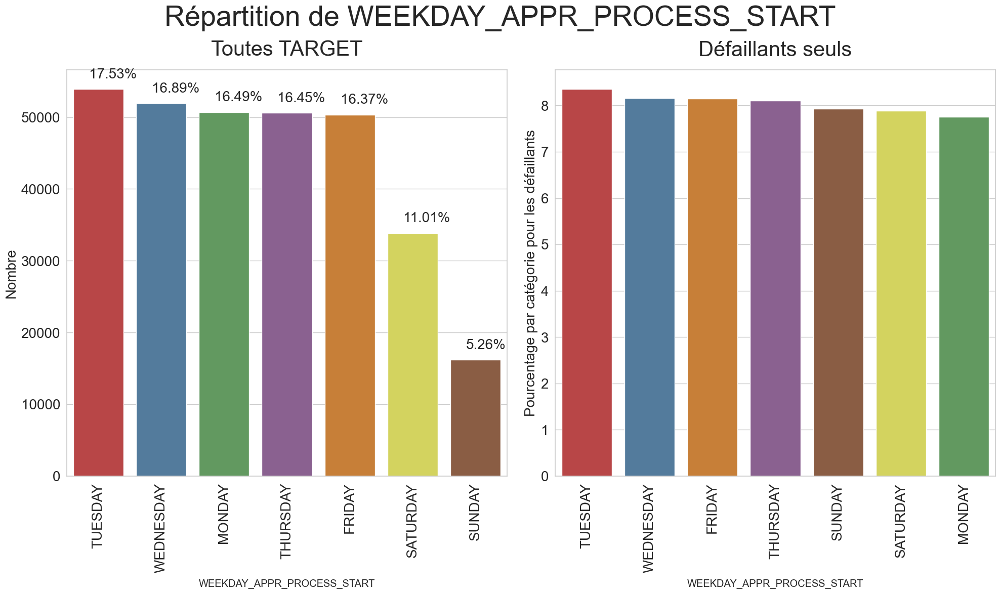

In [75]:
# Let us first see the unique categories of 'WEEKDAY_APPR_PROCESS_START'

print_unique_categories(application_train, 'WEEKDAY_APPR_PROCESS_START',
                            show_counts=True)

# plotting the Bar Plot for the Column
plot_categorical_variables_bar(application_train,
                                   column_name='WEEKDAY_APPR_PROCESS_START',
                                   figsize=(20, 12),
                                   rotation=90, horizontal_adjust=0.25,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#cb3335', '#477ca8',
                                             '#df7f20', '#905998',
                                             '#965a38', '#e6e64c',
                                             '#59a257'])



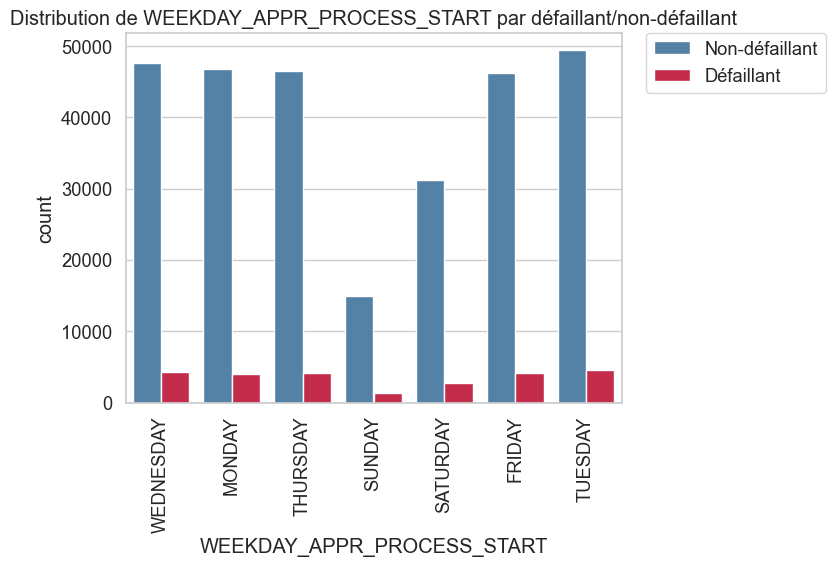

In [76]:
# Distribution par défaillants/non-défaillants
plot_barplot_comp_target(application_train,'WEEKDAY_APPR_PROCESS_START',
                                              rotation=90)

Remarque: 
 - La plupart des prêts sont réalisés en semaine : avec le "Jeudi" comme journée le plus actif. 
 - Pour le défaut de paiment ,il n'y a pas de jour probant à leur enprunt. 

#### Variable - "CNT_CHILDREN":
- Nombre d'enfant par emprunteur. 

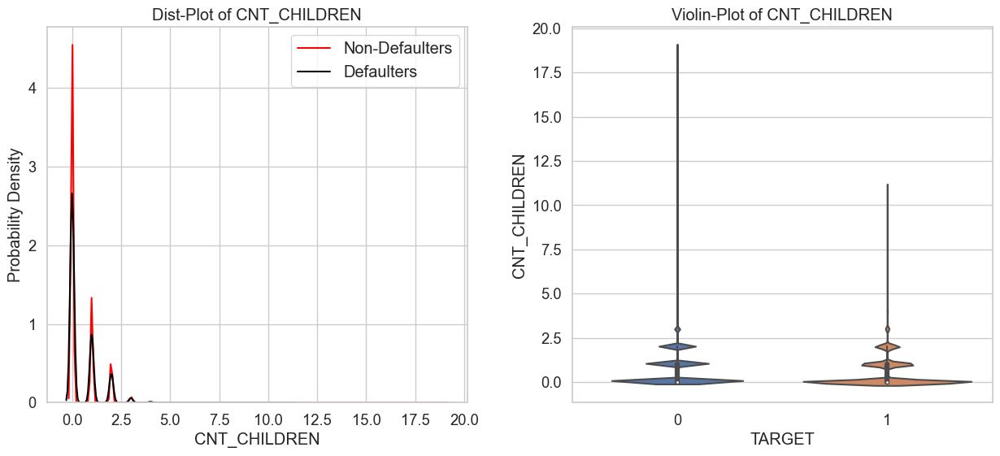

In [77]:
# Violinplot de CNT_CHILDREN
plot_continuous_variables(application_train,'CNT_CHILDREN',
                                            plots=['distplot', 'violin'],
                                            figsize=(15, 6))

Remarque:

- Le nombre d'enfant entre les personnes en défaut de paiment et ceux qui ne le pas sont identique.

#### Variable - "AMT_INCOME_TOTAL":
- Revenu des demandeurs d'emprunts 

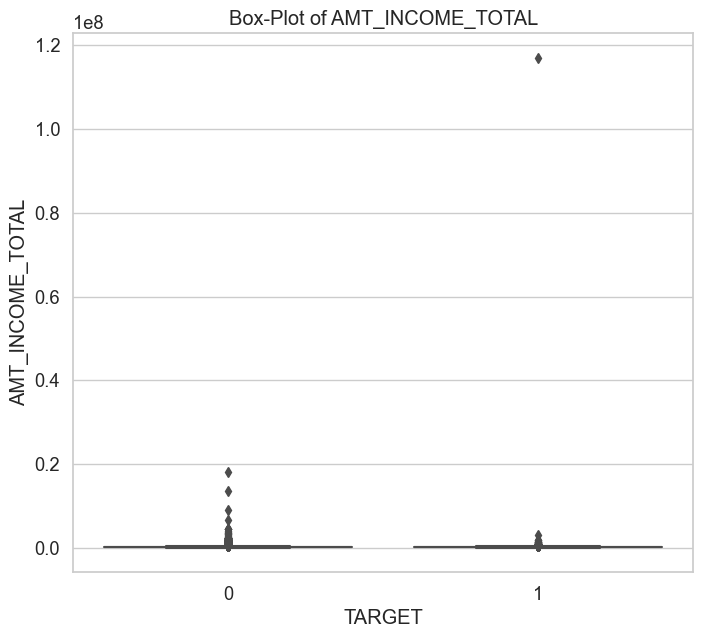

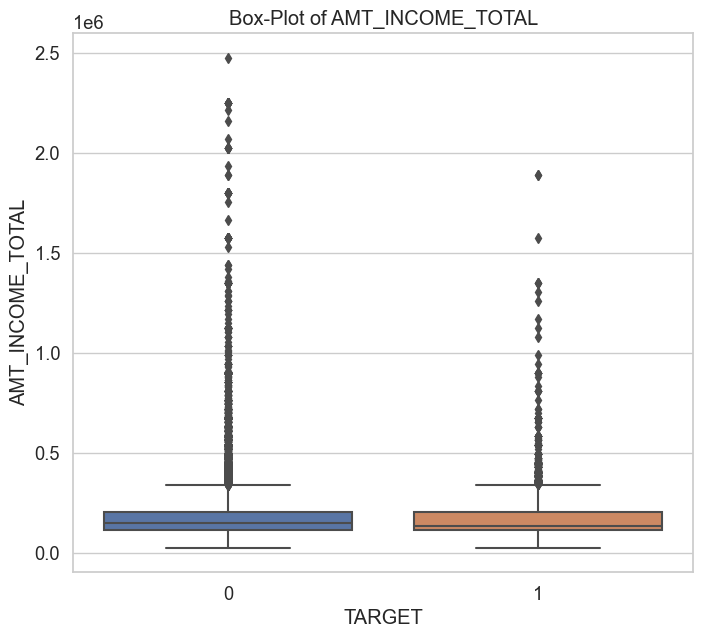

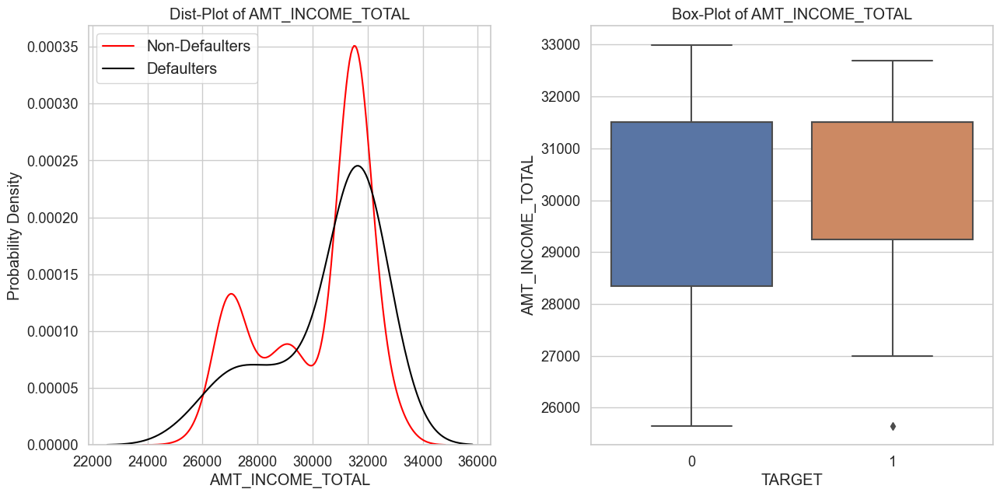

In [78]:
# Boxplot de CNT_CHILDREN
# Boxplot de CNT_CHILDREN
plot_continuous_variables(application_train,
                                        'AMT_INCOME_TOTAL',
                                        plots=['box'],
                                        figsize=(8, 7))
# Zoom hors outlier
plot_continuous_variables(application_train,
                                        'AMT_INCOME_TOTAL',
                                        plots=['box'],
                                        figsize=(8, 7),
                                        scale_limits=[0, 25e5])
# Zoom hors outlier
plot_continuous_variables(application_train,
                                        'AMT_INCOME_TOTAL',
                                        plots=['distplot', 'box'],
                                        figsize=(15, 7),
                                        scale_limits=[0, 33e3])

Remarque : 

- Globalement les revenues des non-défaillants est plus élévés (surtout pour les outliers).
- En terme , Median et Q3(75%) sont globalement identique pour les 2 groupes. 

#### Variable - "AMT_CREDIT":
- Montant des crédits 

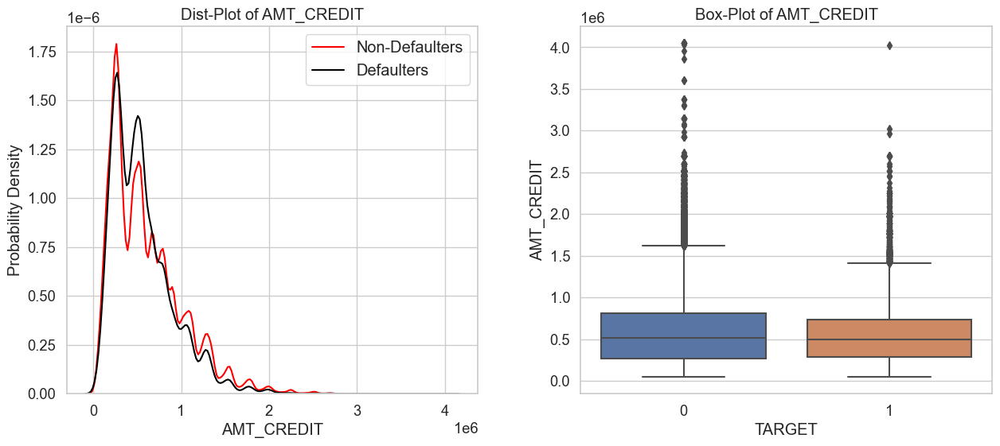

In [79]:
# Boxplot de AMT_CREDIT
plot_continuous_variables(application_train,'AMT_CREDIT',
                                            plots=['distplot', 'box'],
                                            figsize=(15, 6))

Remarque: 
 - Le montants des crédits demandées entre défaillants et non défaillants sont quasi-identque pour les deux groupes. 

#### Variables - "AMT_ANNUITY":
- Annuité des prêts 

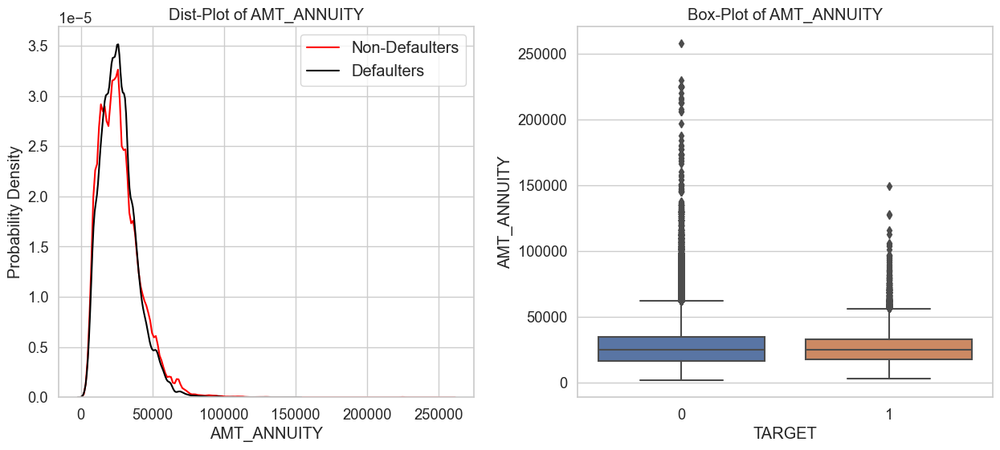

In [80]:
# Boxplot de AMT_ANNUITY
plot_continuous_variables(application_train,'AMT_ANNUITY',
                                             plots=['distplot', 'box'],
                                             figsize=(15, 6))


Remarque : 
- Les annuités entre les deux groupes est quasi-identique . 

#### Variable - "DEF_60_CNT_SOCIAL_CIRCLE":
- Le nombre d'observation de l'environnement social du demandeur ont fait l'objet d'un défaut de paiement (sur ces 60 dernièrs jours)

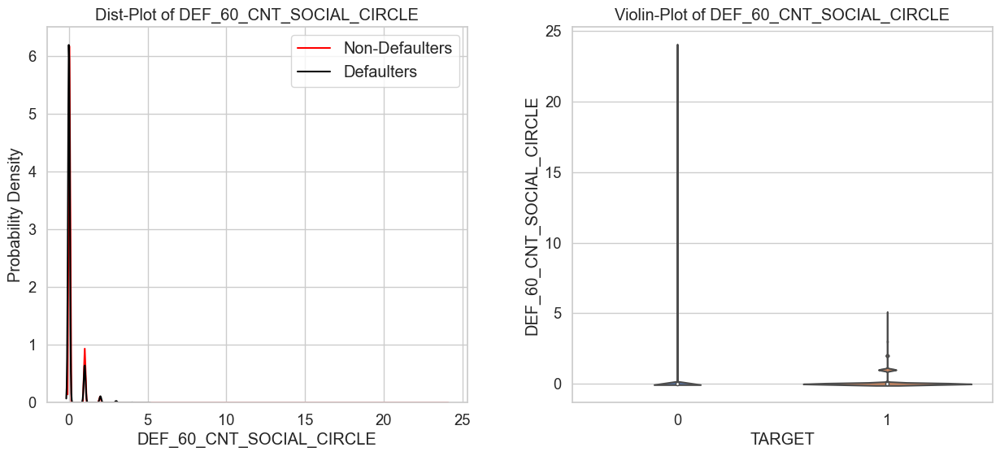

In [81]:
# Violinplot de DEF_60_CNT_SOCIAL_CIRCLE
plot_continuous_variables(application_train,'DEF_60_CNT_SOCIAL_CIRCLE',
                                            plots=['distplot', 'violin'],
                                            figsize=(15, 6))

Remarque: 
- les "défaillants" ont plus de défaut de paiement de jours d'arriérés dans les conditions étudiées. 

----------

Number of columns having NaN values: 67 columns


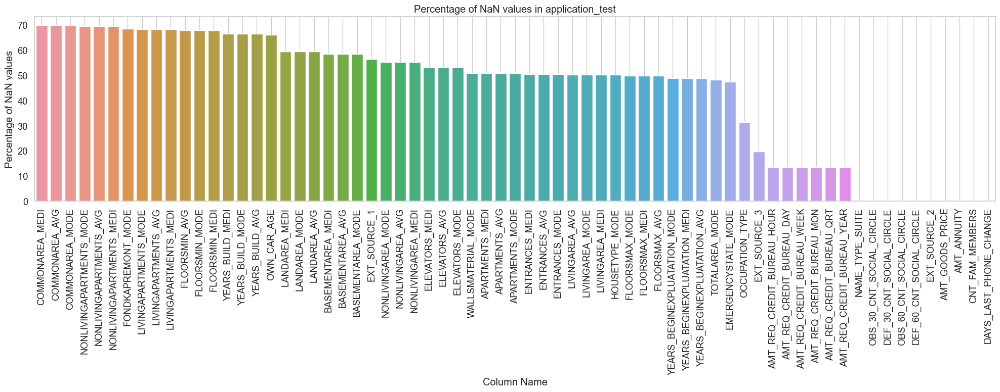

In [82]:
# Réprésentation visuelle des valeurs manquantes
df_nan_test = nan_df_create(application_test)
plot_nan_percent(df_nan_test, 'application_test',
                                      grid=True)

_______

#### Datasets - Bureau.csv :

- Ce jeu de donnée "Bureau.csv" contient **tous les "antécédent de crédits antérieur du demandeur** auprès d'instituions financière autres que le "Home Cridt Group",qui ont été signalés par le bureau de crédit. 

In [83]:
# -- AFFICHER LES STATISTIQUES SIMPLES ligne, varaible,duplicate, head
# --------------------------------------------------------------------


def afficher_stats_basic(dataframe, titre='application_train'):
    print('-' * 79)
    # Taille : nombre de lignes/colonnes
    nRow, nVar = dataframe.shape
    print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')
    print('-' * 79)
    duplicate = \
        dataframe.shape[0] - dataframe.duplicated().shape[0]
    print(f'Numbre de valeurs dupliquées dans {titre} : {duplicate}')
    print('-' * 79)
    print('Contenu des 5 premières lignes :')
    display(dataframe.head(3))


def afficher_stats_basic_bureau(dataframe, dataframe2, dataframe3):
    print('-' * 79)
    # Taille : nombre de lignes/colonnes
    nRow, nVar = dataframe.shape
    print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')
    print('-' * 79)
    print(f'Nombre de valeurs uniques SK_ID_BUREAU  : {len(dataframe.SK_ID_BUREAU.unique())}')
    print(f'Nombre de valeurs uniques SK_ID_CURR dans bureau.csv : {len(dataframe.SK_ID_CURR.unique())}')
    print(f'Nombre de valeurs communes SK_ID_CURR dans application_train.csv et dataframe.csv : {len(set(dataframe2.SK_ID_CURR.unique()).intersection(set(dataframe.SK_ID_CURR.unique())))}')
    print(f'Nombre de valeurs communes SK_ID_CURR dans application_test.csv et dataframe.csv : {len(set(dataframe3.SK_ID_CURR.unique()).intersection(set(dataframe.SK_ID_CURR.unique())))}')
    print('-'*79)
    duplicate = \
        dataframe.shape[0] - dataframe.duplicated().shape[0]
    print(f'Numbre de valeurs dupliquées dans bureau : {duplicate}')
    print('-' * 79)
    print('Contenu des 5 premières lignes :')
    display(dataframe.head(5))    


def afficher_stats_basic_all(dataframe, dataframe2, dataframe3, id_cle):
    print('-' * 79)
    # Taille : nombre de lignes/colonnes
    nRow, nVar = dataframe.shape
    print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')
    print('-' * 79)
    print(f'Nombre de valeurs uniques {id_cle} dans {dataframe.name}.csv : {len(dataframe[id_cle].unique())}')
    print(f'Nombre de valeurs uniques SK_ID_CURR dans {dataframe.name}.csv : {len(dataframe.SK_ID_CURR.unique())}')
    print(f'Nombre de valeurs communes SK_ID_CURR dans {dataframe2.name}.csv et {dataframe.name}.csv : {len(set(dataframe2.SK_ID_CURR.unique()).intersection(set(dataframe.SK_ID_CURR.unique())))}')
    print(f'Nombre de valeurs communes SK_ID_CURR dans {dataframe2.name}.csv et {dataframe.name}.csv : {len(set(dataframe3.SK_ID_CURR.unique()).intersection(set(dataframe.SK_ID_CURR.unique())))}')
    print('-'*79)
    duplicate = \
        dataframe.shape[0] - dataframe.duplicated().shape[0]
    print(f'Numbre de valeurs dupliquées dans {dataframe.name}.csv : {duplicate}')
    print('-' * 79)
    print('Contenu des 5 premières lignes :')
    display(dataframe.head(5))

In [84]:
#Les Stats:
bureau.name = 'bureau'
application_train.name = 'application_train'
application_test.name = 'application_test'

afficher_stats_basic_all(bureau, application_train,
                             application_test, 'SK_ID_BUREAU')

-------------------------------------------------------------------------------
Le jeu de données contient 1716428 lignes et 17 variables.
-------------------------------------------------------------------------------
Nombre de valeurs uniques SK_ID_BUREAU dans bureau.csv : 1716428
Nombre de valeurs uniques SK_ID_CURR dans bureau.csv : 305811
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et bureau.csv : 263491
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et bureau.csv : 263491
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans bureau.csv : 0
-------------------------------------------------------------------------------
Contenu des 5 premières lignes :


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [85]:
def get_types_variables(df_work, types, type_par_var, graph):
    """ Permet un aperçu du type des variables
    Parameters
    ----------
    @param IN : df_work : dataframe, obligatoire
                types : Si True lance dtypes, obligatoire
                type_par_var : Si True affiche tableau des types de
                               chaque variable, obligatoire
                graph : Si True affiche pieplot de répartition des types
    @param OUT :None.
    """

    if types:
        # 1. Type des variables
        print("-------------------------------------------------------------")
        print("Type de variable pour chacune des variables\n")
        display(df_work.dtypes)

    if type_par_var:
        # 2. Compter les types de variables
        print("Répartition des types de variable\n")
        values = df_work.dtypes.value_counts()
        nb_tot = values.sum()
        percentage = round((100 * values / nb_tot), 2)
        table = pd.concat([values, percentage], axis=1)
        table.columns = [
            'Nombre par type de variable',
            '% des types de variable']
        display(table[table['Nombre par type de variable'] != 0]
                .sort_values('% des types de variable', ascending=False)
                .style.background_gradient('plasma'))

    if graph:
        # 3. Schéma des types de variable
        print("\n----------------------------------------------------------")
        print("Répartition schématique des types de variable \n")
        # Répartition des types de variables
        df_work.dtypes.value_counts().plot.pie(autopct='%1.1f%%')
        plt.ylabel('')
        plt.show()

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                  int64
SK_ID_BUREAU                int64
CREDIT_ACTIVE              object
CREDIT_CURRENCY            object
DAYS_CREDIT                 int64
CREDIT_DAY_OVERDUE          int64
DAYS_CREDIT_ENDDATE       float64
DAYS_ENDDATE_FACT         float64
AMT_CREDIT_MAX_OVERDUE    float64
CNT_CREDIT_PROLONG          int64
AMT_CREDIT_SUM            float64
AMT_CREDIT_SUM_DEBT       float64
AMT_CREDIT_SUM_LIMIT      float64
AMT_CREDIT_SUM_OVERDUE    float64
CREDIT_TYPE                object
DAYS_CREDIT_UPDATE          int64
AMT_ANNUITY               float64
dtype: object

Répartition des types de variable



,Nombre par type de variable,% des types de variable
float64,8,47.060000
int64,6,35.290000
object,3,17.650000



----------------------------------------------------------
Répartition schématique des types de variable 



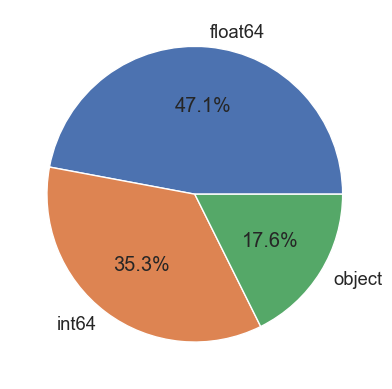

In [86]:
# Types des variables
get_types_variables(bureau, True, True, True)

Remarque : 

Le fichier bureau.csv contient près de 1,7 millions de points de données, avec 17 variables.
    
 - Parmi ces 17 variables, deux sont **SK_ID_CURR** et **SK_ID_BUREAU** :
    * SK_ID_BUREAU est l'identifiant du prêt précédent du demandeur auprès d'autres institutions financières. Il peut y avoir plusieurs prêts antérieurs correspondant à un seul SK_ID_CURR, ce qui dépend des habitudes d'emprunt du demandeur.
    * SK_ID_CURR est l'identifiant du prêt actuel du demandeur auprès de Home Credit.
- Le reste des variables sont: DAYS_CREDIT, AMT_CREDIT_SUM, CREDIT_TYPE, etc.
    
- Il y a **305000 SK_ID_CURR uniques dans le fichier bureau,** parmi lesquels :
    * Il y a 263000 SK_ID_CURR dans le fichier bureau qui sont présents dans application_train sur un total de 307000 de SK_ID_CURR uniques d'application_train. 
    * -> **Certains des demandeurs dans la demande de prêt actuelle avec Home Credit Group n'ont pas d'antécédents de crédit avec le département du bureau de crédit.**

    * Il y a 42300 SK_ID_CURR dans le fichier bureau qui sont présents dans application_test, sur un total de 48000 de SK_ID_CURR uniques de application_test.



Number of columns having NaN values: 7 columns


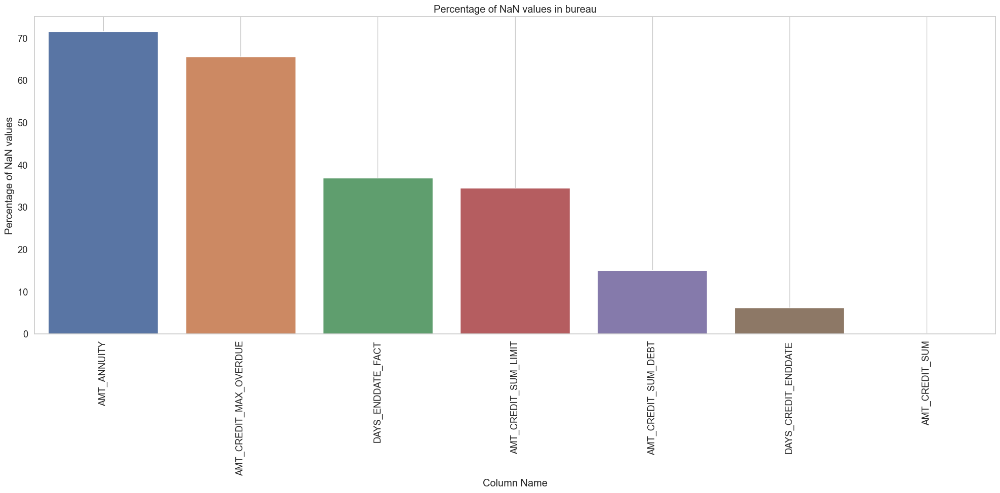

In [87]:
# Réprésentation visuelle des valeurs manquantes
df_nan_bureau = nan_df_create(bureau)
plot_nan_percent(df_nan_bureau, 'bureau',grid=True, 
                                    figsize=(20, 10))

Remarque: 
 - 7 Features /21 features ont des valeurs manquantes
 - **"AMT_ANNUITY" : a 70 % de valeurs manquantes.** 

#### Merge des df_train et df_bureau.csv:
- Ajout du feature target(défaillant/non-défaillant) 

In [88]:
print('-'*80)
print('Création dataframe de travail : merge TARGET avec dataframe bureau')
bureau_merged = application_train.iloc[:, :2].merge(bureau,
                                                    on='SK_ID_CURR',
                                                    how='left')
print("-"*80)

--------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe bureau
--------------------------------------------------------------------------------


In [89]:
bureau_merged.head(3)

,SK_ID_CURR,TARGET,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,100002,1,6158904.0,Closed,currency 1,-1125.0,0.0,-1038.0,-1038.0,NaN,0.0,40761.0,NaN,NaN,0.0,Credit card,-1038.0,0.0
1,100002,1,6158905.0,Closed,currency 1,-476.0,0.0,NaN,-48.0,NaN,0.0,0.0,0.0,NaN,0.0,Credit card,-47.0,NaN
2,100002,1,6158906.0,Closed,currency 1,-1437.0,0.0,-1072.0,-1185.0,0.0,0.0,135000.0,0.0,0.0,0.0,Consumer credit,-1185.0,0.0


#### Distribution des variables catèg :
- "CREDIT_ACTIVE"| "CREDIT_CURRENCY"| "CREDIT_TYPE" :

In [90]:
# Liste des variables qualitatives
cols_cat_bureau = bureau.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_bureau

['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']

#### Variable - "CREDIT_ACTIVE" :
- l'état du prêt précédent rapporté par le bureau de crédit. 

----------------------------------------------------------------------------------------------------
The unique categories of 'CREDIT_ACTIVE' are:
['Closed' 'Active' nan 'Sold' 'Bad debt']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Closed      917733
Active      541919
Sold          5653
Bad debt        20
Name: CREDIT_ACTIVE, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour CREDIT_ACTIVE = 5


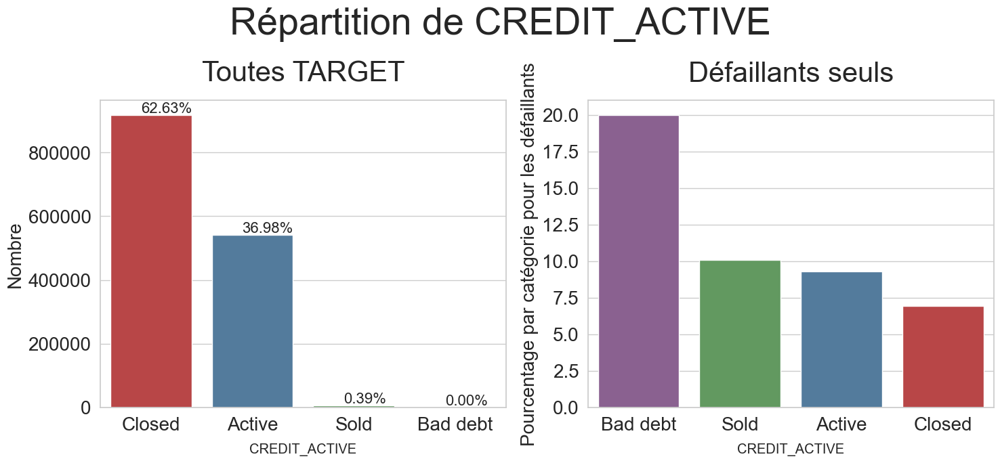

In [91]:
# Let us first see the unique categories of 'CREDIT_ACTIVE'
print_unique_categories(bureau_merged,'CREDIT_ACTIVE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(bureau_merged, column_name='CREDIT_ACTIVE',
                                   horizontal_adjust=0.3,
                                   figsize=(15, 7), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#905998', '#59a257',
                                             '#477ca8', '#cb3335'])

Remarque : 

- La plupart des prêts sont closes à près 62% contre 37%.
- Tandis que les individus défaillants possède 20 % de "Dette douteuse".

Note: Les prêts pour mauvais (["Bad credit loans"](https://www.experian.co.uk/consumer/loans/guides/bad-credit.html#:~:text=Bad%20credit%20loans%20are%20designed,you%20not%20paying%20them%20back.)) crédit sont conçus pour les personnes dont le dossier de crédit n'est pas impeccable ou qui ont peu ou pas d'antécédents de crédit. Ces prêts ont généralement des taux d'intérêt plus élevés et des restrictions plus importantes que les autres prêts, car cela aide les prêteurs à réduire le risque que vous ne les remboursiez pas. Cependant, ils peuvent être utiles s'ils sont gérés de manière responsable.

#### Varaible - "CREDIT_CURRENCY" : 
- Crédit_currency --> Currency _ 1 ou 2 ou 3 ou 4 :

In [92]:
# Let us first see the unique categories of 'CREDIT_CURRENCY'
print_unique_categories(bureau_merged,'CREDIT_CURRENCY')

# Plotting the Pie Plot for the Column
plot_categorical_variables_pie(bureau_merged,
                                   column_name='CREDIT_CURRENCY')

----------------------------------------------------------------------------------------------------
The unique categories of 'CREDIT_CURRENCY' are:
['currency 1' nan 'currency 2' 'currency 3' 'currency 4']
----------------------------------------------------------------------------------------------------


----------------------------------------------------------------------------------------------------
The unique categories of 'CREDIT_CURRENCY' are:
['currency 1' nan 'currency 2' 'currency 3' 'currency 4']
----------------------------------------------------------------------------------------------------
Counts of each category are:
currency 1    1464094
currency 2       1072
currency 3        150
currency 4          9
Name: CREDIT_CURRENCY, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour CREDIT_CURRENCY = 5


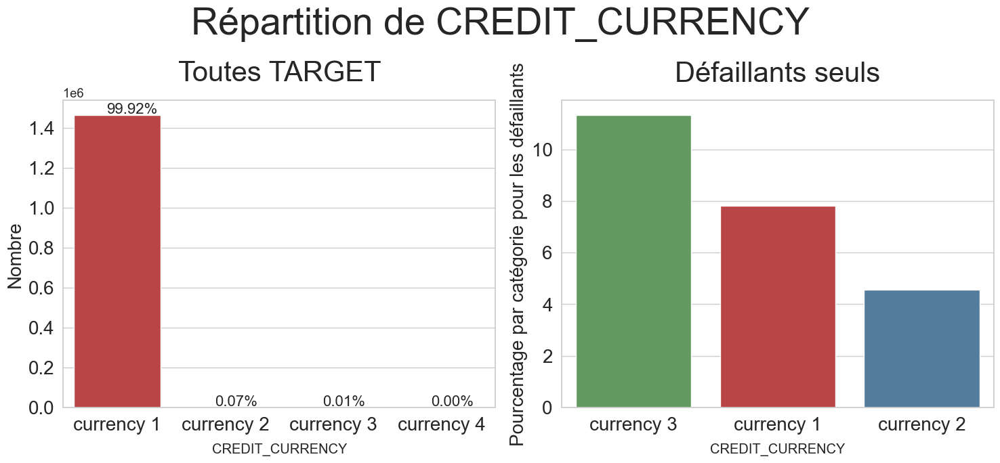

In [93]:
# Let us first see the unique categories of 'CREDIT_CURRENCY'
print_unique_categories(bureau_merged,
                                             'CREDIT_CURRENCY',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(bureau_merged,
                                   column_name='CREDIT_CURRENCY',
                                   horizontal_adjust=0.3,
                                   figsize=(15, 7), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#59a257', '#cb3335',
                                             '#477ca8'])

Remarque : 
- **99.93%** des devises utilisées sont : **"currency_1"**
- Or permis **les clients défaillants : "currency_3"** est majoritaire avec 12% 

#### Variable - "CREDI_TYPE":
- Les types de crédits accordées. 

----------------------------------------------------------------------------------------------------
The unique categories of 'CREDIT_TYPE' are:
['Credit card' 'Consumer credit' nan 'Loan for business development'
 'Microloan' 'Mortgage' 'Car loan'
 'Loan for working capital replenishment' 'Another type of loan'
 'Unknown type of loan' 'Loan for the purchase of equipment'
 'Cash loan (non-earmarked)' 'Real estate loan' 'Interbank credit'
 'Loan for purchase of shares (margin lending)' 'Mobile operator loan']
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour CREDIT_TYPE = 16


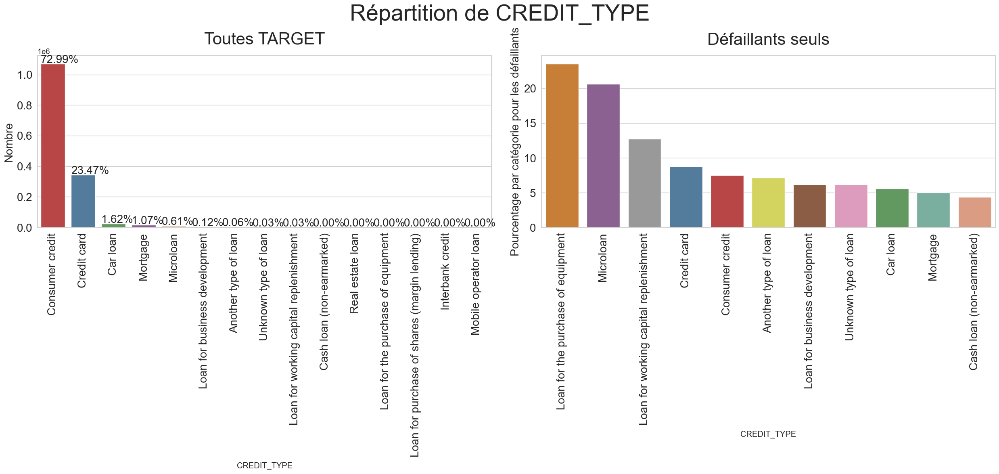

In [94]:
# Let us first see the unique categories of 'CREDIT_TYPE'
print_unique_categories(bureau_merged,
                                             'CREDIT_TYPE')

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(bureau_merged,
                                   column_name='CREDIT_TYPE',
                                   figsize=(25, 12), rotation=90,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675', '#95a3c3',
                                             '#db96c0', '#a2c865',
                                             '#e5c949'],
                                   palette2=['#df7f20', '#905998',
                                             '#999999', '#477ca8',
                                             '#cb3335', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#59a257', '#72b6a1',
                                             '#e99675'])

Remarque : 
- la majorités des prêts accordés sont : prêt à la consommation et les cartes de crédit. 
- Défaillants : 30% - achat de materials, 20% micro-credits et 10,5 credits cards. 

### Les variables quantitatives : 
- 'SK_ID_CURR','SK_ID_BUREAU','DAYS_CREDIT','CREDIT_DAY_OVERDUE','DAYS_CREDIT_ENDDATE','DAYS_ENDDATE_FACT','AMT_CREDIT_MAX_OVERDUE','CNT_CREDIT_PROLONG','AMT_CREDIT_SUM','AMT_CREDIT_SUM_DEBT','AMT_CREDIT_SUM_LIMIT','AMT_CREDIT_SUM_OVERDUE','DAYS_CREDIT_UPDATE','AMT_ANNUITY'


In [95]:
# Liste des variables quantitatives
cols_num_bureau = bureau.select_dtypes(include=[np.number]).columns.to_list()
cols_num_bureau

['SK_ID_CURR',
 'SK_ID_BUREAU',
 'DAYS_CREDIT',
 'CREDIT_DAY_OVERDUE',
 'DAYS_CREDIT_ENDDATE',
 'DAYS_ENDDATE_FACT',
 'AMT_CREDIT_MAX_OVERDUE',
 'CNT_CREDIT_PROLONG',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_OVERDUE',
 'DAYS_CREDIT_UPDATE',
 'AMT_ANNUITY']

#### Variable - Days_Credit:
- Le nombre de jours avant avant la demande actuelle - au bureau crédit .
- Convertion : Days -> Years 

----------------------------------------------------------------------------------------------------
The 0th percentile value of YEARS_CREDIT is 0.0
The 25th percentile value of YEARS_CREDIT is 1.2876712328767124
The 50th percentile value of YEARS_CREDIT is 2.6986301369863015
The 75th percentile value of YEARS_CREDIT is 4.578082191780822
The 90th percentile value of YEARS_CREDIT is 6.706849315068493
The 92th percentile value of YEARS_CREDIT is 6.945205479452055
The 94th percentile value of YEARS_CREDIT is 7.183561643835616
The 96th percentile value of YEARS_CREDIT is 7.4301369863013695
The 98th percentile value of YEARS_CREDIT is 7.712328767123288
The 100th percentile value of YEARS_CREDIT is 8.005479452054795
----------------------------------------------------------------------------------------------------


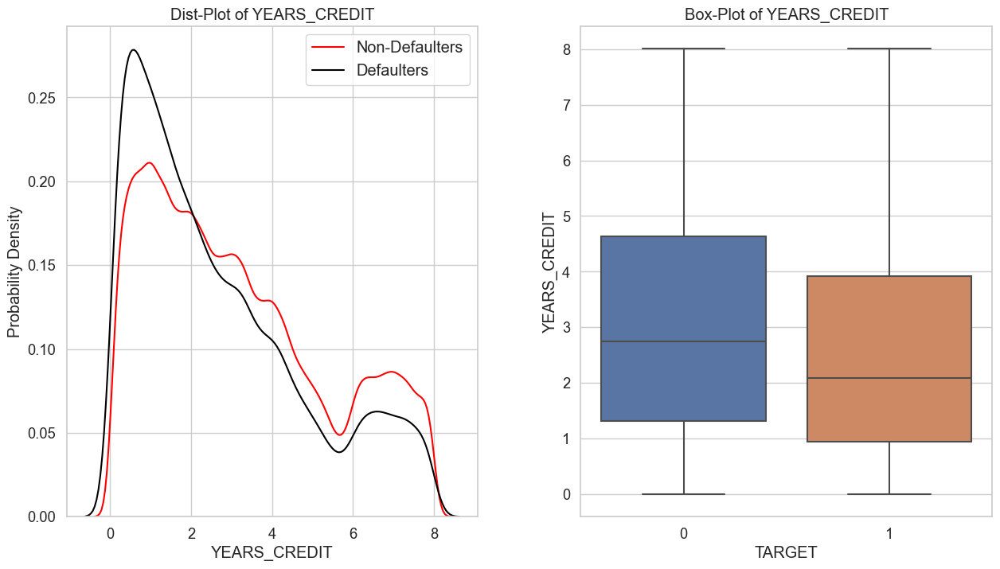

In [96]:
# Transformer en années à partir du nombre de jours
bureau_merged['YEARS_CREDIT'] = bureau_merged['DAYS_CREDIT'] * -1 / 365
# Affiche les quantiles
print_percentiles(bureau_merged, 'YEARS_CREDIT')
# Affiche boxplot, distplot
plot_continuous_variables(bureau_merged,'YEARS_CREDIT',
                                            plots=['distplot', 'box'],
                                            figsize=(15, 8))
# Suppression de la variable nouvellement ajoutée
_ = bureau_merged.pop('YEARS_CREDIT')

Remarque: 

- les défaillant ont tendance à être plus nombreux pour ceux ayant contrainté au moins 2 années de crédits, la tendance s'inverse par la suite. 
- Les défailllant cumule moins d'année de crédit . 

#### Variable - DAYS_CREDIT_ENDDATE :

- ce feature indique: la durée restante du "crédit de bureau" au moment de la demande de prêt en crédit immobilier. 

----------------------------------------------------------------------------------------------------
The 0th percentile value of DAYS_CREDIT_ENDDATE is -42060.0
The 2th percentile value of DAYS_CREDIT_ENDDATE is -2487.0
The 4th percentile value of DAYS_CREDIT_ENDDATE is -2334.0
The 6th percentile value of DAYS_CREDIT_ENDDATE is -2202.0
The 8th percentile value of DAYS_CREDIT_ENDDATE is -2073.9199999999983
The 10th percentile value of DAYS_CREDIT_ENDDATE is -1939.0
The 25th percentile value of DAYS_CREDIT_ENDDATE is -1144.0
The 50th percentile value of DAYS_CREDIT_ENDDATE is -334.0
The 75th percentile value of DAYS_CREDIT_ENDDATE is 473.0
The 100th percentile value of DAYS_CREDIT_ENDDATE is 31199.0
----------------------------------------------------------------------------------------------------


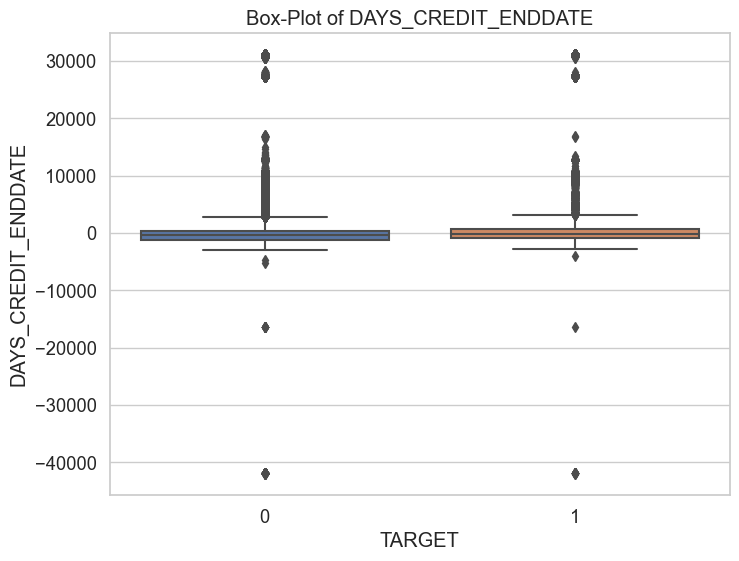

In [97]:
# Affiche les quantiles
print_percentiles(bureau_merged, 'DAYS_CREDIT_ENDDATE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(bureau_merged,'DAYS_CREDIT_ENDDATE',
                                               plots=['box'], figsize=(8, 6))

Remarque : 

- Outlier -> étrange : 0ieme_quantile = - 42060 jours = 115 ans | 31200 jours = 84 ans . 


#### Variable DAYS_ENDDATE_FACT : 
 - indique le nombre de jours depuis lesquels le crédit du "Bureau de Credit" a été cloturé(pour les crédit fermer ). 

----------------------------------------------------------------------------------------------------
The 0th percentile value of DAYS_ENDDATE_FACT is -42023.0
The 2th percentile value of DAYS_ENDDATE_FACT is -2561.0
The 4th percentile value of DAYS_ENDDATE_FACT is -2450.0
The 6th percentile value of DAYS_ENDDATE_FACT is -2351.0
The 8th percentile value of DAYS_ENDDATE_FACT is -2265.0
The 10th percentile value of DAYS_ENDDATE_FACT is -2173.0
The 25th percentile value of DAYS_ENDDATE_FACT is -1503.0
The 50th percentile value of DAYS_ENDDATE_FACT is -900.0
The 75th percentile value of DAYS_ENDDATE_FACT is -427.0
The 100th percentile value of DAYS_ENDDATE_FACT is 0.0
----------------------------------------------------------------------------------------------------


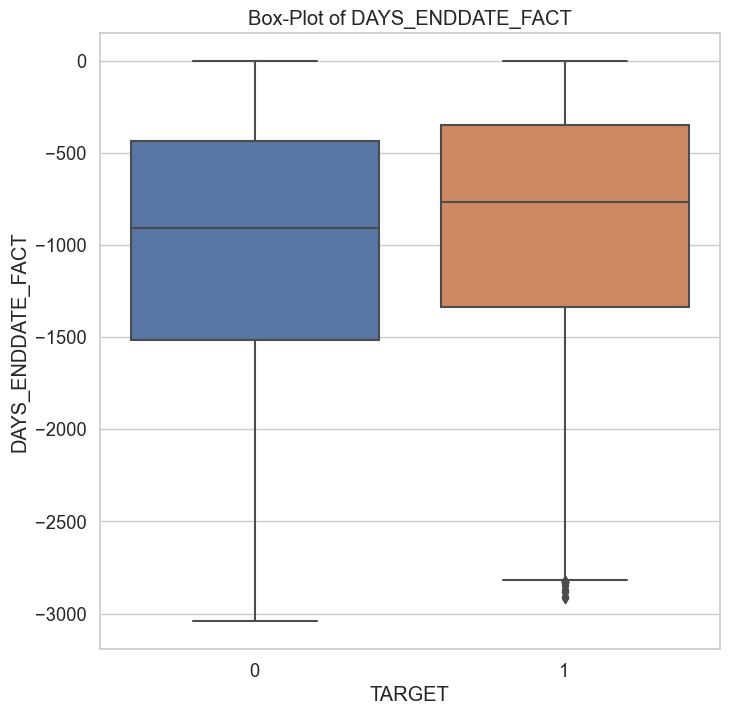

In [98]:
# Affiche les quantiles
print_percentiles(bureau_merged, 'DAYS_ENDDATE_FACT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(bureau_merged,'DAYS_ENDDATE_FACT',
                                               plots=['box'],
                                               figsize=(8, 8),
                                               scale_limits=[-40000, 0])

Remarque:
- Les non-défaillants ont généralement une période plus longue entre deux périodes crédits. 
- On retrouve,les outliers étranges ici: De 115ans .  

#### Variable - " Days_CREDIT_UPDATE":

- Feature : indique le nombre de jours depuis lesquels l'information du Bureau de crédit ont été transmis au moment de la demande de crédit(pour le crédit immobilier). 

----------------------------------------------------------------------------------------------------
The 0th percentile value of DAYS_CREDIT_UPDATE is -41947.0
The 2th percentile value of DAYS_CREDIT_UPDATE is -2415.0
The 4th percentile value of DAYS_CREDIT_UPDATE is -2213.0
The 6th percentile value of DAYS_CREDIT_UPDATE is -2002.0
The 8th percentile value of DAYS_CREDIT_UPDATE is -1766.0
The 10th percentile value of DAYS_CREDIT_UPDATE is -1582.0
The 25th percentile value of DAYS_CREDIT_UPDATE is -904.0
The 50th percentile value of DAYS_CREDIT_UPDATE is -406.0
The 75th percentile value of DAYS_CREDIT_UPDATE is -33.0
The 100th percentile value of DAYS_CREDIT_UPDATE is 372.0
----------------------------------------------------------------------------------------------------


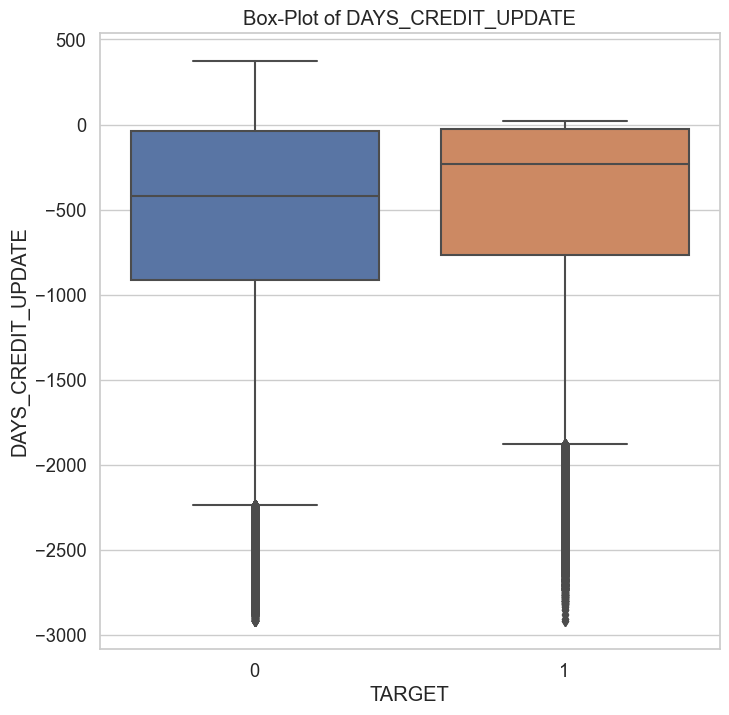

In [99]:
# Affiche les quantiles
print_percentiles(bureau_merged, 'DAYS_CREDIT_UPDATE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(bureau_merged,'DAYS_CREDIT_UPDATE',
                                               plots=['box'],
                                               figsize=(8, 8),
                                               scale_limits=[-40000, 400])



Remarque: 
- La périodes d'information est plus court pour les non-défaillants par rapport au non défaillant . 
- Q3 : ND < D . 

Note: 
 * Non-défaillant.
 * Défaillant. 

#### Variable - "CNT_CREDIT_PROLONG":
- Nombre de fois le crédit du Bureau de crédit à été prolongé. 

----------------------------------------------------------------------------------------------------
The 0th percentile value of CNT_CREDIT_PROLONG is 0.0
The 2th percentile value of CNT_CREDIT_PROLONG is 0.0
The 4th percentile value of CNT_CREDIT_PROLONG is 0.0
The 6th percentile value of CNT_CREDIT_PROLONG is 0.0
The 8th percentile value of CNT_CREDIT_PROLONG is 0.0
The 10th percentile value of CNT_CREDIT_PROLONG is 0.0
The 25th percentile value of CNT_CREDIT_PROLONG is 0.0
The 50th percentile value of CNT_CREDIT_PROLONG is 0.0
The 75th percentile value of CNT_CREDIT_PROLONG is 0.0
The 100th percentile value of CNT_CREDIT_PROLONG is 9.0
----------------------------------------------------------------------------------------------------


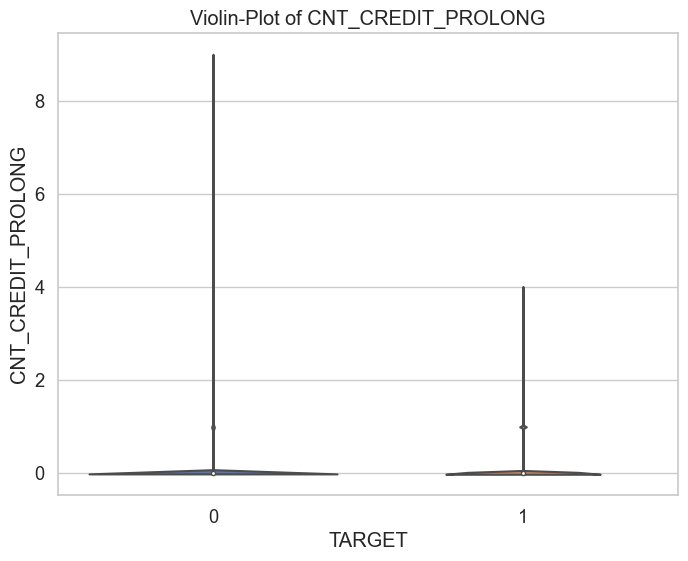

In [100]:
# Affiche les quantiles
print_percentiles(bureau_merged, 'CNT_CREDIT_PROLONG',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
plot_continuous_variables(bureau_merged,'CNT_CREDIT_PROLONG',
                                               plots=['violin'],
                                               figsize=(8, 6))

Remarque : 
- Aucune différence entre les Défaillant et les non-défaillants sur ce features. 

#### Variable - "AMT_CREDIT_SUM_DEBT":
- Montant des dettes sur les créditds du Bureau de crédit. 

----------------------------------------------------------------------------------------------------
The 0th percentile value of AMT_CREDIT_SUM_DEBT is -4705600.32
The 2th percentile value of AMT_CREDIT_SUM_DEBT is 0.0
The 4th percentile value of AMT_CREDIT_SUM_DEBT is 0.0
The 6th percentile value of AMT_CREDIT_SUM_DEBT is 0.0
The 8th percentile value of AMT_CREDIT_SUM_DEBT is 0.0
The 10th percentile value of AMT_CREDIT_SUM_DEBT is 0.0
The 25th percentile value of AMT_CREDIT_SUM_DEBT is 0.0
The 50th percentile value of AMT_CREDIT_SUM_DEBT is 0.0
The 75th percentile value of AMT_CREDIT_SUM_DEBT is 39654.0
The 100th percentile value of AMT_CREDIT_SUM_DEBT is 170100000.0
----------------------------------------------------------------------------------------------------


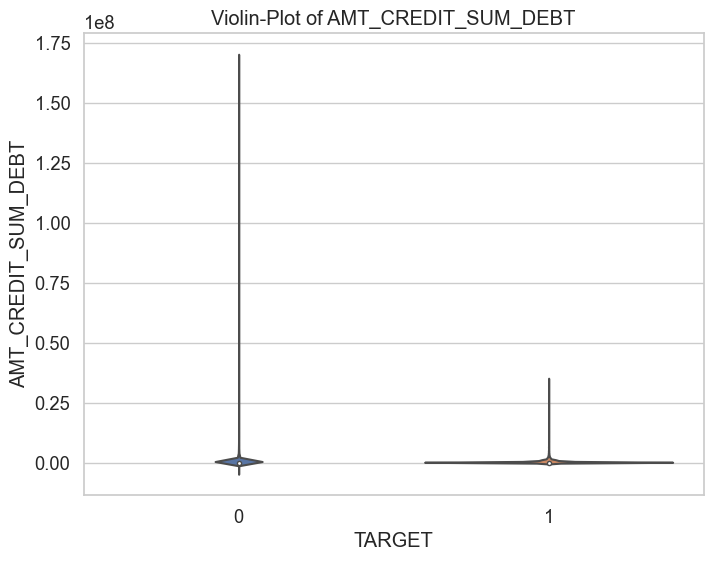

In [101]:
# Affiche les quantiles
print_percentiles(bureau_merged, 'AMT_CREDIT_SUM_DEBT',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
plot_continuous_variables(bureau_merged,'AMT_CREDIT_SUM_DEBT',
                                               plots=['violin'],
                                               figsize=(8, 6))

Remarque : 
- Q3: 75 % des dettes contracté pour les clients non-défaillants et défaillants s'élève à env 39.6 K .

#### Analyse exploratoire multivariée: 
- Corrélation entre les variabales catégorielles : Phi-k Matrix & Feature numérique :

----------------------------------------------------------------------------------------------------


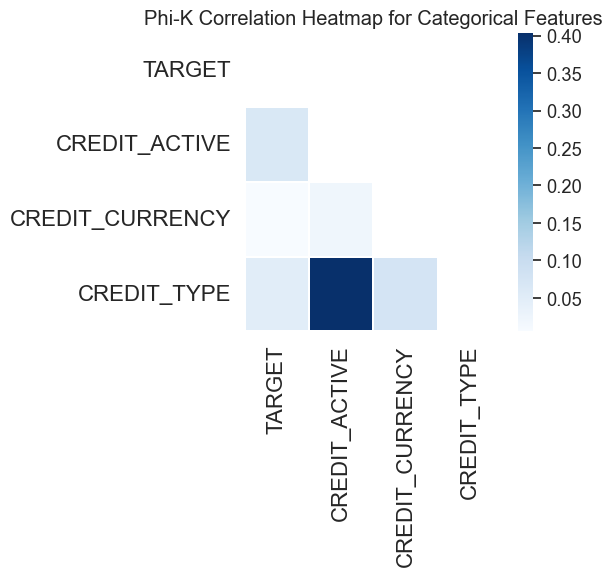

----------------------------------------------------------------------------------------------------
Les catégories avec les valeurs les plus élevées de la valeur de corrélation Phi-K avec la variable cible sont:


,Column Name,Phik-Correlation
0,CREDIT_ACTIVE,0.064481
2,CREDIT_TYPE,0.049954
1,CREDIT_CURRENCY,0.004993


----------------------------------------------------------------------------------------------------


In [102]:
cols_for_phik = ['TARGET', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
                 'CREDIT_TYPE']
                 
plot_phik_matrix(bureau_merged, cols_for_phik,
                                    figsize=(6, 6), fontsize=16)



Remarque: 
 - Corrélation Phi-k élévée entre les features : **"CREDIT_TYPE"** et **CREDIT_ACTIVE**. 
 - A l'inverse de la target et du feature **"CREDIT_CURRENCY"**. 

----------------------------------------------------------------------------------------------------


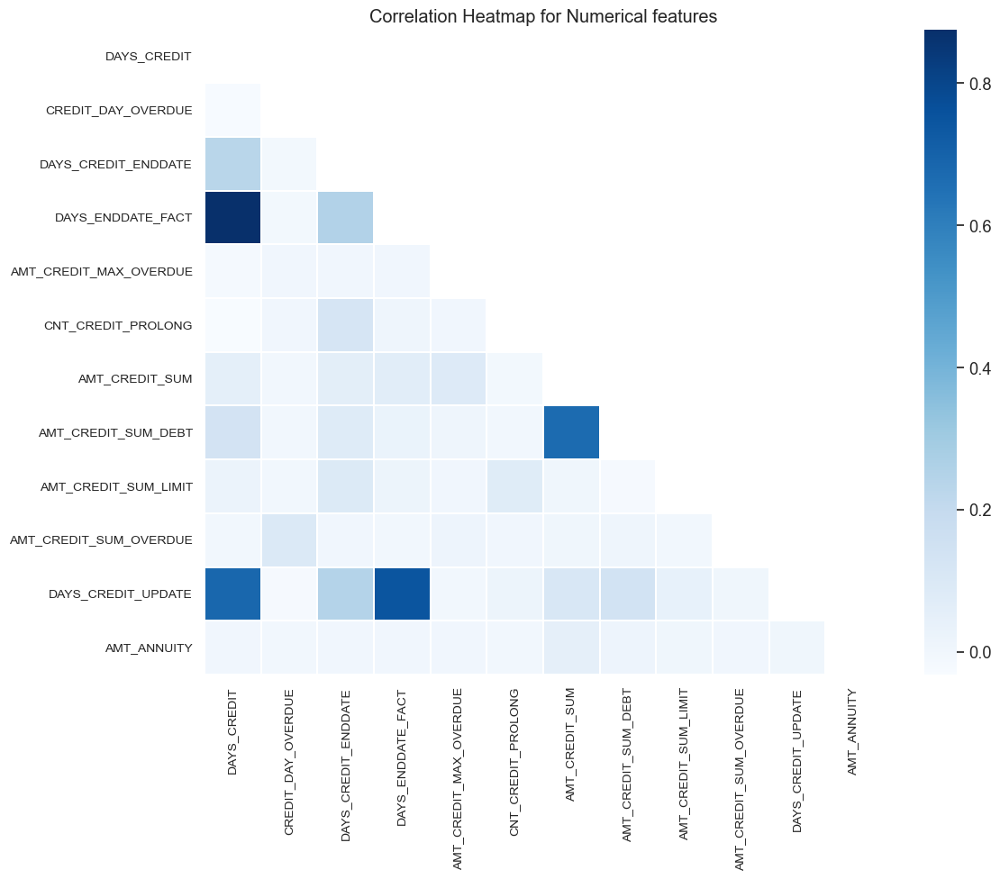

----------------------------------------------------------------------------------------------------


In [103]:
# Corrélation entre les variables numériques:
corr_mat = correlation_matrix(bureau_merged,['SK_ID_CURR', 'SK_ID_BUREAU'],
                                            cmap='Blues',
                                            figsize=(12, 10))
corr_mat.plot_correlation_matrix()


In [104]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT']
interval columns not set, guessing: ['TARGET', 'CREDIT_DAY_OVERDUE']
interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT_ENDDATE']
interval columns not set, guessing: ['TARGET', 'DAYS_ENDDATE_FACT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_MAX_OVERDUE']
interval columns not set, guessing: ['TARGET', 'CNT_CREDIT_PROLONG']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_DEBT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_LIMIT']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_SUM_OVERDUE']
interval columns not set, guessing: ['TARGET', 'DAYS_CREDIT_UPDATE']
interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
-------------------------------------------------------------------------------
Les variables ayant les valeurs les plus élevées de Phik-corrélation avec la variable cible sont le

Column Name,Phik-Correlation
DAYS_CREDIT,0.088651
DAYS_CREDIT_ENDDATE,0.018980
AMT_CREDIT_SUM_OVERDUE,0.005654
AMT_CREDIT_SUM_LIMIT,0.005192
AMT_CREDIT_MAX_OVERDUE,0.004280
CNT_CREDIT_PROLONG,0.003862
CREDIT_DAY_OVERDUE,0.002528
DAYS_CREDIT_UPDATE,0.002219
AMT_CREDIT_SUM_DEBT,0.001695
AMT_CREDIT_SUM,0.000670


-------------------------------------------------------------------------------


Remarque: 
- La heatmap, nous indique peu corrélation entre les différents features.
- A quelques exeptions près : 
    * **DAYS_CREDIT** & **DAYS_CREDIT_UPDATE** -- > Forte corrélation entre les 2 features. 
    * **DAYS_ENDDATE_FACT** & **DAYS_CREDIT_UPDATE**
    * **AMT_CREDIT_SUM** & **AMT_CREDIT_SUM_DEBT**
    * **DAYS_ENDDATE_FACT** & **DAYS_CREDIT**


#### Datasets - Bureau_balance:
- résumé: 

In [105]:
bureau_balance.head(3)
print("-"*79)
print(f'Number of unique SK_ID_BUREAU in bureau_balance.csv are: {len(bureau_balance.SK_ID_BUREAU.unique())}')
print('-'*79)
print(f'Number of unique values for STATUS are: {len(bureau_balance.STATUS.unique())}')
print(f"Unique values of STATUS are:\n{bureau_balance.STATUS.unique()}")
print('-'*79)
print(f"Max number of months for Months Balance: {np.abs(bureau_balance.MONTHS_BALANCE.min())}")
print('-'*79)

-------------------------------------------------------------------------------
Number of unique SK_ID_BUREAU in bureau_balance.csv are: 817395
-------------------------------------------------------------------------------
Number of unique values for STATUS are: 8
Unique values of STATUS are:
['C' '0' 'X' '1' '2' '3' '5' '4']
-------------------------------------------------------------------------------
Max number of months for Months Balance: 96
-------------------------------------------------------------------------------


In [106]:
afficher_stats_basic(bureau_balance, 'bureau_balance')

-------------------------------------------------------------------------------
Le jeu de données contient 27299925 lignes et 3 variables.
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans bureau_balance : 0
-------------------------------------------------------------------------------
Contenu des 5 premières lignes :


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C


In [107]:
print("-"*79)
val = len(bureau_balance.SK_ID_BUREAU.unique())
print(f'Nombre de valeurs uniques SK_ID_BUREAU : {val}')
print('-'*79)
val1 = len(bureau_balance.STATUS.unique())
val2 = bureau_balance.STATUS.unique()
print(f'Nombre de valeurs uniques STATUS : {val1}')
print(f"Liste des valeurs uniques de STATUS :\n{val2}")
print('-'*79)
val3 = np.abs(bureau_balance.MONTHS_BALANCE.min())
print(f"Nombre maximal de mois pour le solde des mois : {val3}")
print('-'*79)

-------------------------------------------------------------------------------
Nombre de valeurs uniques SK_ID_BUREAU : 817395
-------------------------------------------------------------------------------
Nombre de valeurs uniques STATUS : 8
Liste des valeurs uniques de STATUS :
['C' '0' 'X' '1' '2' '3' '5' '4']
-------------------------------------------------------------------------------
Nombre maximal de mois pour le solde des mois : 96
-------------------------------------------------------------------------------


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_BUREAU       int64
MONTHS_BALANCE     int64
STATUS            object
dtype: object

Répartition des types de variable



,Nombre par type de variable,% des types de variable
int64,2,66.670000
object,1,33.330000



----------------------------------------------------------
Répartition schématique des types de variable 



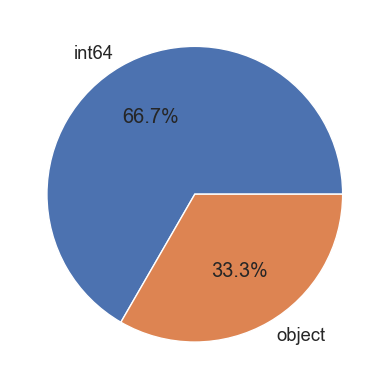

In [108]:
# Types des variables
get_types_variables(bureau_balance, True, True, True)

In [109]:
# -- DESCRIPTION DES VARIABLES
# --------------------------------------------------------------------

def description_variables(dataframe, type_var='all'):
    """
    Retourne la description des variables qualitatives/quantitatives
    ou toutes les variables du dataframe transmis :
    type, nombre de nan, % de nan et desc
    Parameters
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                type_var = 'all' ==> tous les types de variables (défaut)
                           'cat' ==> variables catégorielles
                           'num' ==> variables quantitative
                           facultatif
    @param OUT : dataframe de description des variables
    """
    df_taille = dataframe.shape[0]

    if type_var == 'num':
        desc_var = dataframe.describe(datetime_is_numeric=True)
    elif type_var == 'cat':
        desc_var = dataframe.describe(
            exclude=[np.number], datetime_is_numeric=True)
    else:
        desc_var = dataframe.describe(include='all', datetime_is_numeric=True)

    desc_type = pd.DataFrame(
        dataframe[desc_var.columns].dtypes, columns=['type']).T
    nb_nan = df_taille - desc_var.loc['count'].T
    pourcentage_nan = nb_nan * 100 / np.product(dataframe.shape)
    desc_nan = pd.DataFrame([nb_nan, pourcentage_nan],
                            index=['nb_nan', '%_nan'])
    desc_var = pd.concat([desc_type, desc_nan, desc_var])

    return 

In [110]:
# -- VALEURS MANQUANTES
# ---------------------------------------------------------------------------

# Afficher des informations sur les valeurs manquantes


def get_missing_values(df_work, pourcentage, affiche_heatmap, retour=False):
    """Indicateurs sur les variables manquantes
       @param in : df_work dataframe obligatoire
                   pourcentage : boolean si True affiche le nombre heatmap
                   affiche_heatmap : boolean si True affiche la heatmap
       @param out : none
    """

    # 1. Nombre de valeurs manquantes totales
    nb_nan_tot = df_work.isna().sum().sum()
    nb_donnees_tot = np.product(df_work.shape)
    pourc_nan_tot = round((nb_nan_tot / nb_donnees_tot) * 100, 2)
    print(
        f'Valeurs manquantes : {nb_nan_tot} NaN pour {nb_donnees_tot} données ({pourc_nan_tot} %)')

    if pourcentage:
        print("-------------------------------------------------------------")
        print("Nombre et pourcentage de valeurs manquantes par variable\n")
        # 2. Visualisation du nombre et du pourcentage de valeurs manquantes
        # par variable
        values = df_work.isnull().sum()
        percentage = 100 * values / len(df_work)
        table = pd.concat([values, percentage.round(2)], axis=1)
        table.columns = [
            'Nombres de valeurs manquantes',
            '% de valeurs manquantes']
        display(table[table['Nombres de valeurs manquantes'] != 0]
                .sort_values('% de valeurs manquantes', ascending=False)
                .style.background_gradient('seismic'))

    if affiche_heatmap:
        print("-------------------------------------------------------------")
        print("Heatmap de visualisation des valeurs manquantes")
        # 3. Heatmap de visualisation des valeurs manquantes
        plt.figure(figsize=(20, 10))
        sns.heatmap(df_work.isna(), cbar=False)
        plt.show()

    if retour:
        return table

In [111]:
# Résumé des variables
desc_bureau_bal = description_variables(bureau_balance)
desc_bureau_bal

Valeurs manquantes : 0 NaN pour 81899775 données (0.0 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


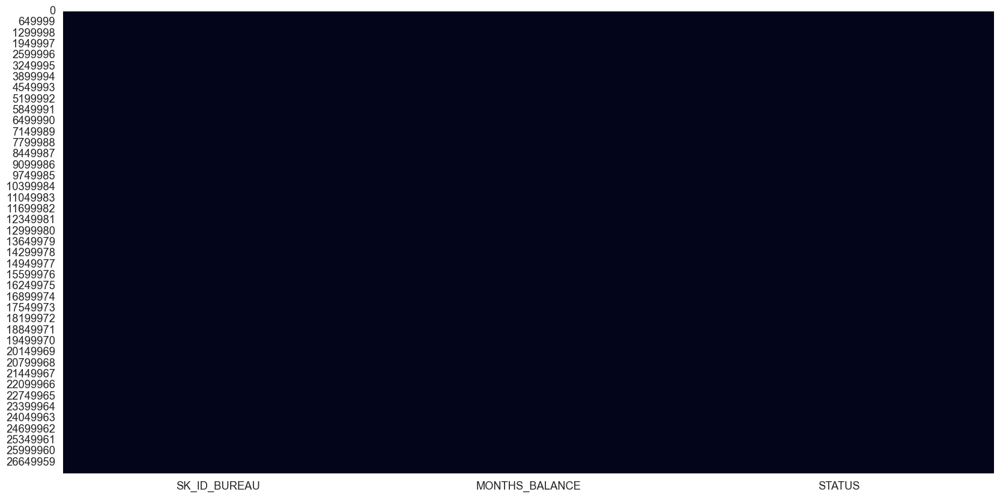

In [112]:
# Valeurs manquantes du dataframe
get_missing_values(bureau_balance, True, True)


Remarque: 

- Aucune valeur manquantes. 
- 28m de raw et 3 features. 
- Dataset : contient le statut mensuel de chacun de prêts en lien le département du "Bureau de crédit". 
- Status -- 8 valeurs uniques:
    * C signifie close,
    * X signifie Statut inconnu,
    * 0 pas de DPD,
    * 1 signifie DPD max durant le mois 1-30,
    * 2 signifie DPD entre 31-60,
    * 5 signifie DPD 120+ ou vendue/radié. 
    
== > Historique remontant à 8 ans . 

In [113]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
print('Création dataframe de travail : merge TARGET avec dataframe bureau')
bureau_merged = application_train.iloc[:, :2].merge(bureau,
                                                    on='SK_ID_CURR',
                                                    how='left')
print("-"*79)

-------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe bureau
-------------------------------------------------------------------------------


#### Analyse exploratoire univariée: 
- Distribution des variables catégorielles : feature categ du bureau_balance et feature target('SD_ID_CURR').

In [114]:
# Liste des variables qualitatives
cols_cat_bureau_bal = bureau_balance.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_bureau_bal

['STATUS']

In [115]:
def plot_categorical_variable_bar(data, column_name, figsize=(18, 6),
                                  percentage_display=True, rotation=0,
                                  horizontal_adjust=0,
                                  fontsize_percent='xx-small',
                                  palette1='Set1'):
    '''
    Fonction pour tracer les diagrammes à barres des variables catégorielles
    Contributions:
        données: DataFrame
            Le DataFrame à partir duquel tracer
        nom_colonne: str
            Nom de la colonne dont la distribution doit être tracée
        figsize: tuple, défaut = (18,6)
            Taille de la figure à tracer
        affichage_pourcentage: bool, valeur par défaut = Vrai
            Indique s'il faut afficher les pourcentages au-dessus des barres dans Bar-Plot
        plot_defaulter: bool
            S'il faut ou non tracer les diagrammes à barres pour les défaillants
        rotation : entier, par défaut = 0
            Degré de rotation pour les étiquettes x-tick
        horizontal_adjust : entier, par défaut = 0
            Paramètre d'ajustement horizontal pour les pourcentages affichés en haut des barres de Bar-Plot
        fontsize_percent: str, par défaut = 'xx-small'
            Taille de police pour l'affichage en pourcentage
    '''
    print(
        f"Nombre de catégories uniques pour {column_name} = {len(data[column_name].unique())}")

    plt.figure(figsize=figsize, tight_layout=True)
    sns.set(style='whitegrid', font_scale=1.2)

    data_to_plot = data[column_name].value_counts().sort_values(ascending=False)
    ax = sns.barplot(x=data_to_plot.index, y=data_to_plot, palette=palette1)

    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(
                p.get_x() +
                horizontal_adjust,
                p.get_height() +
                0.005 *
                total_datapoints,
                '{:1.02f}%'.format(
                    p.get_height() *
                    100 /
                    total_datapoints),
                fontsize=fontsize_percent)

    plt.xlabel(column_name, labelpad=10)
    plt.title(f'Barplot de {column_name}', pad=20, fontsize=30)
    plt.xticks(rotation=rotation, fontsize=20)
    plt.yticks(fontsize=20)
    plt.ylabel('Nombre', fontsize=20)

    plt.show()

----------------------------------------------------------------------------------------------------
The unique categories of 'STATUS' are:
['C' '0' 'X' '1' '2' '3' '5' '4']
----------------------------------------------------------------------------------------------------
Counts of each category are:
C    13646993
0     7499507
X     5810482
1      242347
5       62406
2       23419
3        8924
4        5847
Name: STATUS, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour STATUS = 8


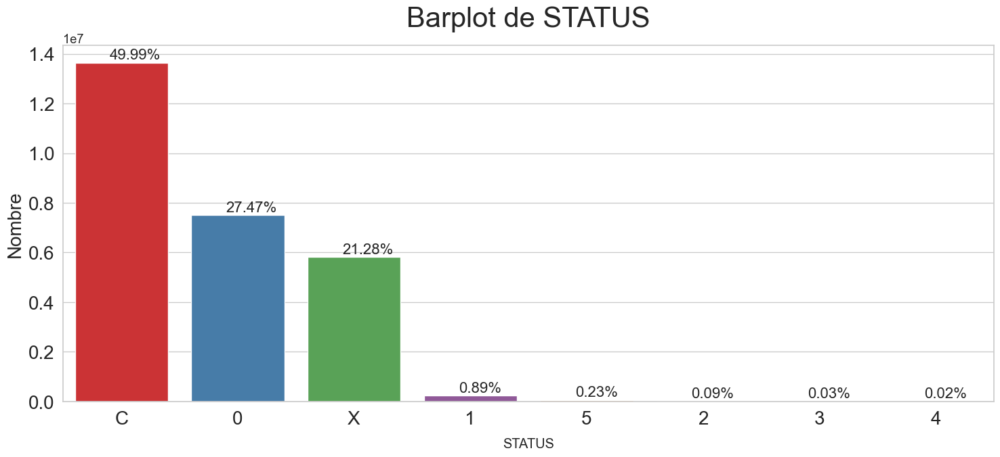

In [116]:
# Let us first see the unique categories of 'STATUS'
print_unique_categories(bureau_balance,'STATUS',
                                            show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variable_bar(bureau_balance, column_name='STATUS',
                                  horizontal_adjust=0.3,
                                  figsize=(15, 7), fontsize_percent=16)



Remarque:

 - Statut C : 49.99%
 - Statut 0 : 27.47%
 - Satut X : 21.28% -> état des prêts inconnu. 
 - Staut 1 : 0.89%
 - le reste des statuts <0.30% .. 


#### Distribution des variables quantitatives: 
 - Months_balance / Mois du solde par rapport à la date de la demande :
    * -1 : information correspond au mensuel le plus récent.
    *  0 : information  correspon  à la date de la demande. 

In [117]:
# Liste des variables quantitatives
cols_num = bureau_balance.select_dtypes(include=[np.number]).columns.to_list()
cols_num

['SK_ID_BUREAU', 'MONTHS_BALANCE']

In [118]:

def plot_continuous_variable(data, column_name,
                             plots=['distplot', 'CDF', 'box', 'violin'], 
                             scale_limits=None, figsize=(20, 9),
                             histogram=True, log_scale=False,
                             palette=['SteelBlue', 'Crimson']):
    '''
    Function to plot continuous variables distribution
    Inputs:
        data: DataFrame
            The DataFrame from which to plot.
        column_name: str
            Column's name whose distribution is to be plotted.
        plots: list, default = ['distplot', 'CDF', box', 'violin']
            List of plots to plot for Continuous Variable.
        scale_limits: tuple (left, right), default = None
            To control the limits of values to be plotted in case of outliers.
        figsize: tuple, default = (20,8)
            Size of the figure to be plotted.
        histogram: bool, default = True
            Whether to plot histogram along with distplot or not.
        log_scale: bool, default = False
            Whether to use log-scale for variables with outlying points.
    '''
    data_to_plot = data.copy()
    if scale_limits:
        # taking only the data within the specified limits
        data_to_plot[column_name] = data[column_name][(
            data[column_name] > scale_limits[0]) & (data[column_name] < scale_limits[1])]

    number_of_subplots = len(plots)
    plt.figure(figsize=figsize)
    sns.set_style('whitegrid')

    for i, ele in enumerate(plots):
        plt.subplot(1, number_of_subplots, i + 1)
        plt.subplots_adjust(wspace=0.25)

        if ele == 'CDF':
            # making the percentile DataFrame for both positive and negative
            # Class Labels
            percentile_values_0 = data_to_plot[[column_name]].dropna().sort_values(by=column_name)
            percentile_values_0['Percentile'] = [
                ele / (len(percentile_values_0) - 1) for ele in range(len(percentile_values_0))]

            plt.plot(
                percentile_values_0[column_name],
                percentile_values_0['Percentile'],
                color='SteelBlue')
            plt.xlabel(column_name, fontsize=16)
            plt.ylabel('Probabilité', fontsize=16)
            plt.title('CDF de {}'.format(column_name), fontsize=18)
            plt.legend(fontsize='medium')
            if log_scale:
                plt.xscale('log')
                plt.xlabel(column_name + ' - (log-scale)')

        if ele == 'distplot':
            sns.distplot(data_to_plot[column_name].dropna(), hist=False,
                         color='SteelBlue')
            plt.xlabel(column_name, fontsize=16)
            plt.ylabel('Probability Density', fontsize=16)
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)
            plt.legend(fontsize=18)
            plt.title("Dist-Plot de {}".format(column_name), fontsize=18)
            if log_scale:
                plt.xscale('log')
                plt.xlabel(f'{column_name} (log scale)', fontsize=16)

        if ele == 'violin':
            sns.violinplot(x=column_name, data=data_to_plot)
            plt.title("Violin-Plot de {}".format(column_name), fontsize=18)
            if log_scale:
                plt.yscale('log')
                plt.ylabel(f'{column_name} (log Scale)')

        if ele == 'box':
            sns.boxplot(x=column_name, data=data_to_plot, palette=palette)
            plt.title("Box-Plot de {}".format(column_name), fontsize=18)
            if log_scale:
                plt.yscale('log')
                plt.ylabel(f'{column_name} (log Scale)', fontsize=16)
            plt.xlabel(f'{column_name}', fontsize=16)
            plt.xticks(fontsize=16)

    plt.show()

----------------------------------------------------------------------------------------------------
The 0th percentile value of MONTHS_BALANCE is -96.0
The 2th percentile value of MONTHS_BALANCE is -87.0
The 4th percentile value of MONTHS_BALANCE is -81.0
The 6th percentile value of MONTHS_BALANCE is -76.0
The 8th percentile value of MONTHS_BALANCE is -72.0
The 10th percentile value of MONTHS_BALANCE is -68.0
The 25th percentile value of MONTHS_BALANCE is -46.0
The 50th percentile value of MONTHS_BALANCE is -25.0
The 75th percentile value of MONTHS_BALANCE is -11.0
The 100th percentile value of MONTHS_BALANCE is 0.0
----------------------------------------------------------------------------------------------------


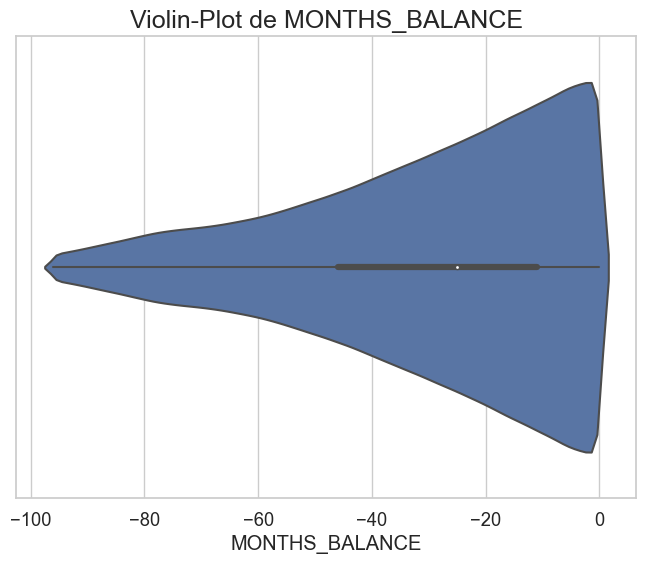

In [119]:
# Affiche les quantiles
print_percentiles(bureau_balance, 'MONTHS_BALANCE',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
plot_continuous_variable(bureau_balance,'MONTHS_BALANCE',
                                              plots=['violin'],
                                              figsize=(8, 6))

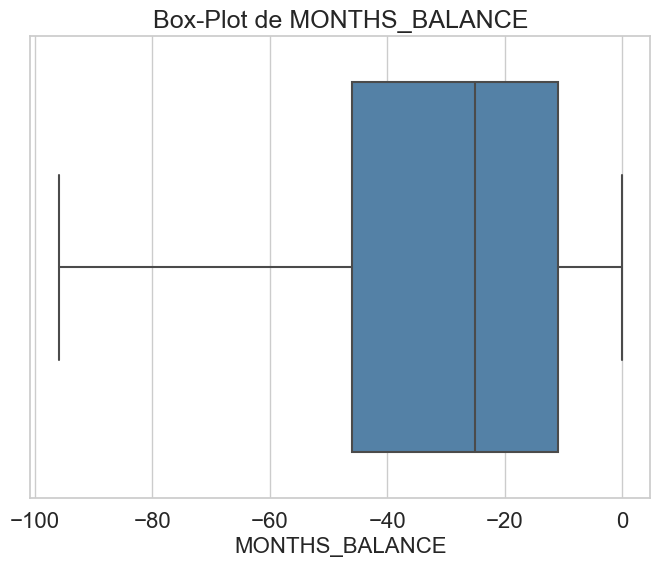

In [120]:
# Affiche boxplot
plot_continuous_variable(bureau_balance,'MONTHS_BALANCE',
                                            plots=['box'],
                                            figsize=(8, 6))

#### Dataset - Credit_balance.csv : 
 - Données mensuelles à une ou plusieurs cartes de crédit que les demandeurs ont aurpès de "Home Credits Group". 
 - Features : le Solde,limite de crédit,montant des prélèvements,.. pour chaque mois - carte de crédits.  

In [121]:
application_train.name = 'application_train'
application_test.name = 'application_test'
cc_balance.name = 'credit_card_balance'

afficher_stats_basic_all(cc_balance, application_train,
                             application_test, 'SK_ID_PREV')

-------------------------------------------------------------------------------
Le jeu de données contient 3840312 lignes et 23 variables.
-------------------------------------------------------------------------------
Nombre de valeurs uniques SK_ID_PREV dans credit_card_balance.csv : 104307
Nombre de valeurs uniques SK_ID_CURR dans credit_card_balance.csv : 103558
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et credit_card_balance.csv : 86905
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et credit_card_balance.csv : 86905
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans credit_card_balance.csv : 0
-------------------------------------------------------------------------------
Contenu des 5 premières lignes :


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_PREV                      int64
SK_ID_CURR                      int64
MONTHS_BALANCE                  int64
AMT_BALANCE                   float64
AMT_CREDIT_LIMIT_ACTUAL         int64
AMT_DRAWINGS_ATM_CURRENT      float64
AMT_DRAWINGS_CURRENT          float64
AMT_DRAWINGS_OTHER_CURRENT    float64
AMT_DRAWINGS_POS_CURRENT      float64
AMT_INST_MIN_REGULARITY       float64
AMT_PAYMENT_CURRENT           float64
AMT_PAYMENT_TOTAL_CURRENT     float64
AMT_RECEIVABLE_PRINCIPAL      float64
AMT_RECIVABLE                 float64
AMT_TOTAL_RECEIVABLE          float64
CNT_DRAWINGS_ATM_CURRENT      float64
CNT_DRAWINGS_CURRENT            int64
CNT_DRAWINGS_OTHER_CURRENT    float64
CNT_DRAWINGS_POS_CURRENT      float64
CNT_INSTALMENT_MATURE_CUM     float64
NAME_CONTRACT_STATUS           object
SK_DPD                          int64
SK_DPD_DEF                      int64
dtype: object

Répartition des types de variable



,Nombre par type de variable,% des types de variable
float64,15,65.220000
int64,7,30.430000
object,1,4.350000



----------------------------------------------------------
Répartition schématique des types de variable 



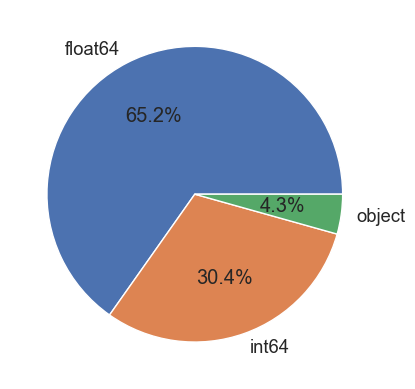

In [122]:
# Types des variables
get_types_variables(cc_balance, True, True, True)

In [123]:
# Résumé des variables
desc_bureau = description_variables(cc_balance)
desc_bureau

Valeurs manquantes : 5877356 NaN pour 88327176 données (6.65 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
AMT_PAYMENT_CURRENT,767988,20.000000
AMT_DRAWINGS_ATM_CURRENT,749816,19.520000
AMT_DRAWINGS_OTHER_CURRENT,749816,19.520000
AMT_DRAWINGS_POS_CURRENT,749816,19.520000
CNT_DRAWINGS_ATM_CURRENT,749816,19.520000
CNT_DRAWINGS_OTHER_CURRENT,749816,19.520000
CNT_DRAWINGS_POS_CURRENT,749816,19.520000
AMT_INST_MIN_REGULARITY,305236,7.950000
CNT_INSTALMENT_MATURE_CUM,305236,7.950000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


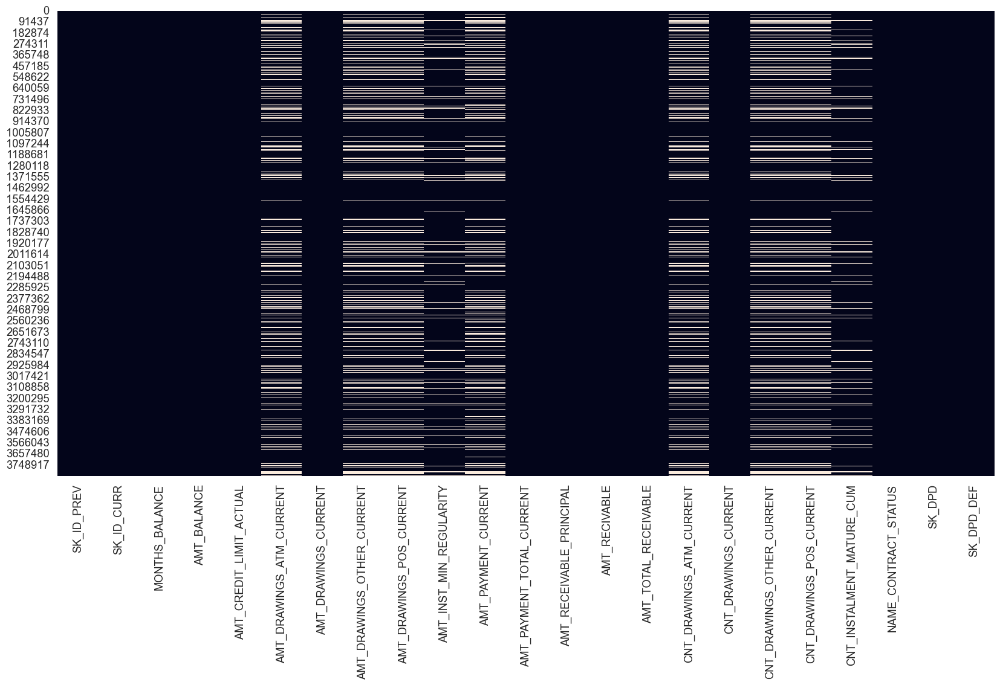

In [124]:
# Valeurs manquantes du dataframe
get_missing_values(cc_balance, True, True)

Number of columns having NaN values: 9 columns


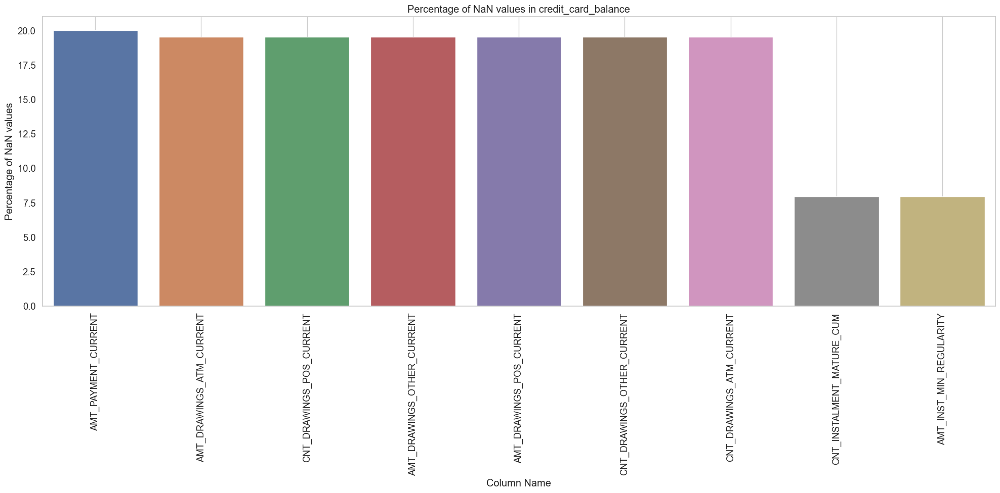

In [125]:
# Réprésentation visuelle des valeurs manquantes
df_nan_ccbal = nan_df_create(cc_balance)
plot_nan_percent(df_nan_ccbal, 'credit_card_balance',
                                      grid=True, 
                                      figsize=(20, 10))

Remarque: 
- Datasets - "Credit_card_balance.csv" : 3.84M de raw -> Statut mensuel de la carte de crédit du demandeur auprès de "Home Credits Group". 
- 23 Features différentes. -> 9 contiennent des valeurs Nan. 
- 7/9 ont près de 20% de valeurs manquantes(NaN):
    * Principalement liées aux montants des tirages et aux nombres de tirages.
    * 2 autres stats de versements.  
- 104300 de cards credits uniques. 
- Sur 104300 , il y a 103500 SK_ID_CURR uniques.
- => Cela signifie que la plupart des demandeurs n'ont qu'une seule card de credits. 
- SK_ID_CURR : ID des demandeurs qui ont demandé un prêt. 
 

In [126]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
print('Création dataframe de travail : merge TARGET avec dataframe cc_balance')
cc_balance_merged = application_train.iloc[:, :2].merge(cc_balance,
                                                        on='SK_ID_CURR',
                                                        how='left')
print("-"*79)

-------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe cc_balance
-------------------------------------------------------------------------------


#### Analyse exloratoire univariée:
- Distribution des variables catégorielles
- "NAME_CONTRACT_STATUS" -> Etat du contrat au cours du mois. 

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_CONTRACT_STATUS' are:
[nan 'Active' 'Completed' 'Signed' 'Sent proposal' 'Refused' 'Demand'
 'Approved']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Active           3116673
Completed         100031
Signed              9939
Demand               843
Sent proposal        460
Refused               14
Approved               5
Name: NAME_CONTRACT_STATUS, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_CONTRACT_STATUS = 8


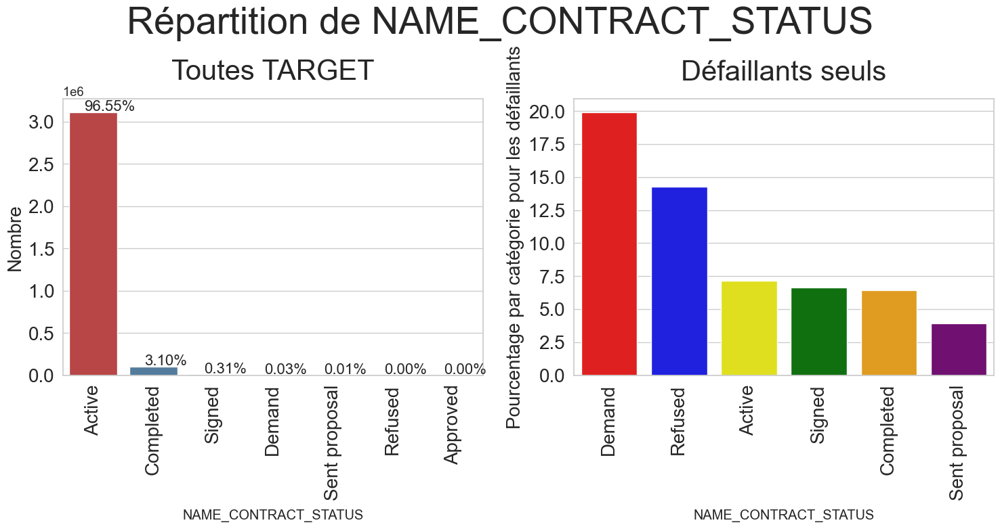

In [127]:
# Let us first see the unique categories of 'NAME_CONTRACT_STATUS'
print_unique_categories(cc_balance_merged,'NAME_CONTRACT_STATUS',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(cc_balance_merged,
                                   column_name='NAME_CONTRACT_STATUS',
                                   figsize=(15, 8), rotation=90,
                                   horizontal_adjust=0.25,
                                   fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['red', 'blue',
                                             'yellow', 'green',
                                             'orange', 'purple'])



Remarque: 
 - 95% des prêts sont actifs.
 - Parmlis les défaillants : 
    * env 20 % des prêts sont en cours de 'demand'
    * env 13 % des prêts ont été réfusée 
    * 8 % des prêts actifs 

#### Distribution des features quantitatives

In [128]:
# Liste des variables quantitatives
cols_num = cc_balance_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'MONTHS_BALANCE',
 'AMT_BALANCE',
 'AMT_CREDIT_LIMIT_ACTUAL',
 'AMT_DRAWINGS_ATM_CURRENT',
 'AMT_DRAWINGS_CURRENT',
 'AMT_DRAWINGS_OTHER_CURRENT',
 'AMT_DRAWINGS_POS_CURRENT',
 'AMT_INST_MIN_REGULARITY',
 'AMT_PAYMENT_CURRENT',
 'AMT_PAYMENT_TOTAL_CURRENT',
 'AMT_RECEIVABLE_PRINCIPAL',
 'AMT_RECIVABLE',
 'AMT_TOTAL_RECEIVABLE',
 'CNT_DRAWINGS_ATM_CURRENT',
 'CNT_DRAWINGS_CURRENT',
 'CNT_DRAWINGS_OTHER_CURRENT',
 'CNT_DRAWINGS_POS_CURRENT',
 'CNT_INSTALMENT_MATURE_CUM',
 'SK_DPD',
 'SK_DPD_DEF']

In [129]:
# nous allons regrouper par le champ 'SK_ID_PREV' et agréger avec la moyenne, afin d'obtenir une ligne moyenne pour chacun des prêts précédents du demandeur:
cc_balance_merged = cc_balance_merged.groupby('SK_ID_PREV').mean()
cc_balance_merged.head()

,SK_ID_CURR,TARGET,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
SK_ID_PREV,,,,,,,,,,,,,,,,,,,,,
1000018.0,394447.0,0.0,-4.0,74946.285000,81000.000000,5400.000000,29478.996000,0.0,24078.996000,2594.08800,...,72298.197000,73602.585000,73602.585000,1.200000,8.800,0.0,7.600000,2.000,0.0,0.0
1000030.0,361282.0,0.0,-4.5,55991.064375,81562.500000,642.857143,17257.438125,0.0,19079.929286,2078.22375,...,55474.453125,55935.376875,55935.376875,0.142857,5.125,0.0,5.714286,1.875,0.0,0.0
1000035.0,436351.0,0.0,-4.0,0.000000,225000.000000,NaN,0.000000,NaN,NaN,0.00000,...,0.000000,0.000000,0.000000,NaN,0.000,NaN,NaN,0.000,0.0,0.0
1000077.0,181153.0,0.0,-7.0,0.000000,94090.909091,NaN,0.000000,NaN,NaN,0.00000,...,0.000000,0.000000,0.000000,NaN,0.000,NaN,NaN,0.000,0.0,0.0
1000083.0,309691.0,0.0,-7.0,0.000000,183461.538462,NaN,0.000000,NaN,NaN,0.00000,...,0.000000,0.000000,0.000000,NaN,0.000,NaN,NaN,0.000,0.0,0.0


#### Variable - "AMT_BAlANCE":
 - le montant moyenne du solde qu'une personne avait habituellement sur son compte de carte de crédit pour le prêt précédent. 

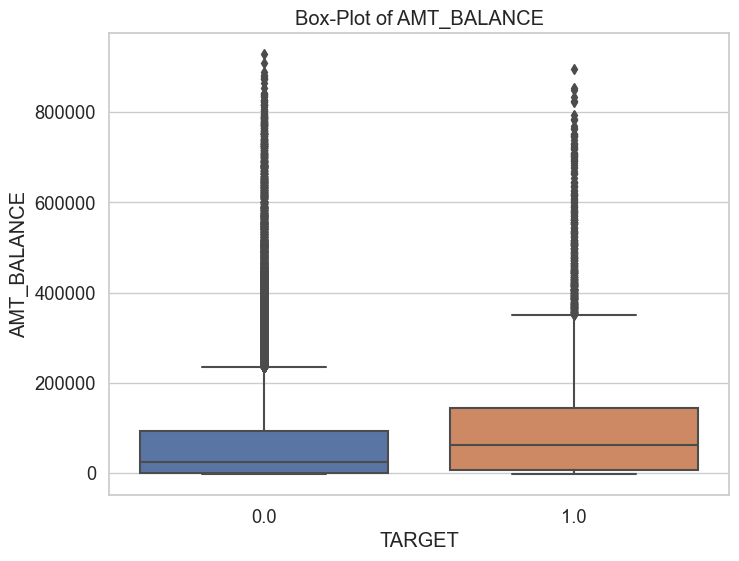

In [130]:
#Affiche boxplot :
plot_continuous_variables(cc_balance_merged,'AMT_BALANCE',                                             
                                            plots=['box'],
                                            figsize=(8, 6))

Remarque : 
- Les soldes sont globalement plus élévées chez les personnes non-défaillants. 

#### Variable - "AMT_TOTAL_RECEIVABLE"
- La moyenne du montant total à recevoir sur le crédit précédent.

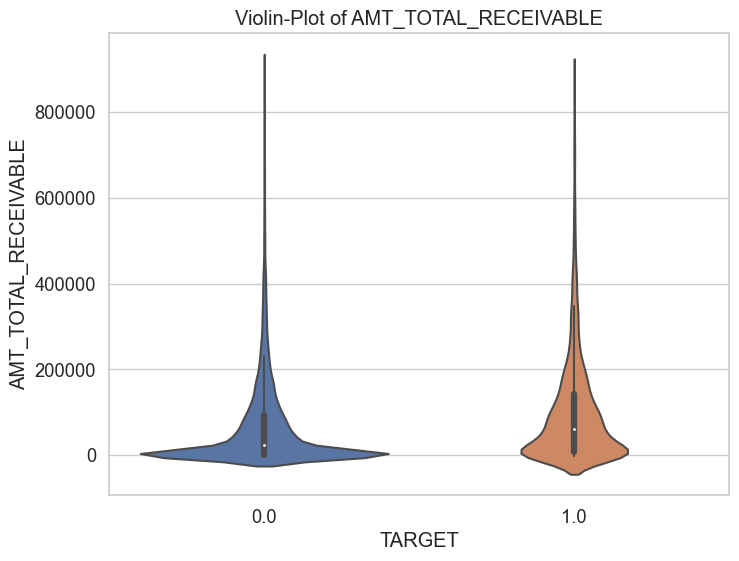

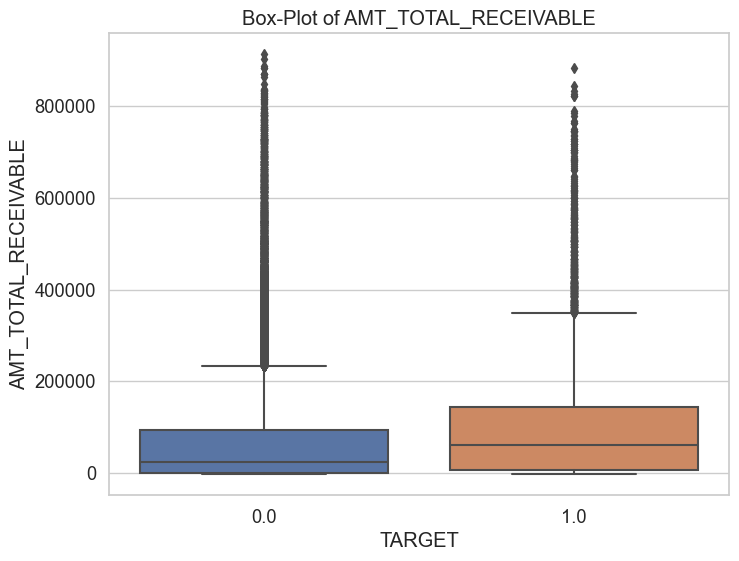

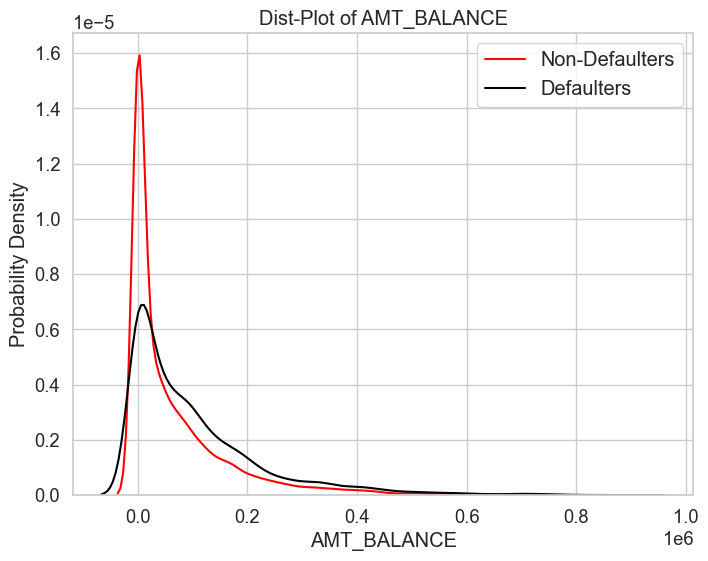

In [131]:
# Affiche Violinplot
plot_continuous_variables(cc_balance_merged,'AMT_TOTAL_RECEIVABLE',
                                               plots=['violin'],
                                               figsize=(8, 6))
# Affiche Boxplot
plot_continuous_variables(cc_balance_merged,'AMT_TOTAL_RECEIVABLE',
                                               plots=['box'],
                                               figsize=(8, 6))
# Affiche PDF
plot_continuous_variables(cc_balance_merged,'AMT_BALANCE',
                                               plots=['distplot'],
                                               figsize=(8, 6))

Remarque: 
- "Total_receivable" est plus élévée chez les non-défaillants. 
- "AMT_Balance" est globalement plus élévée pour les non-défaillants que les personnes ont défaults.

#### Variable - "CNT_INSTALMENT_MATURE_CUM":
- Moyenne des versements effectués sur les crédits précèdents. 

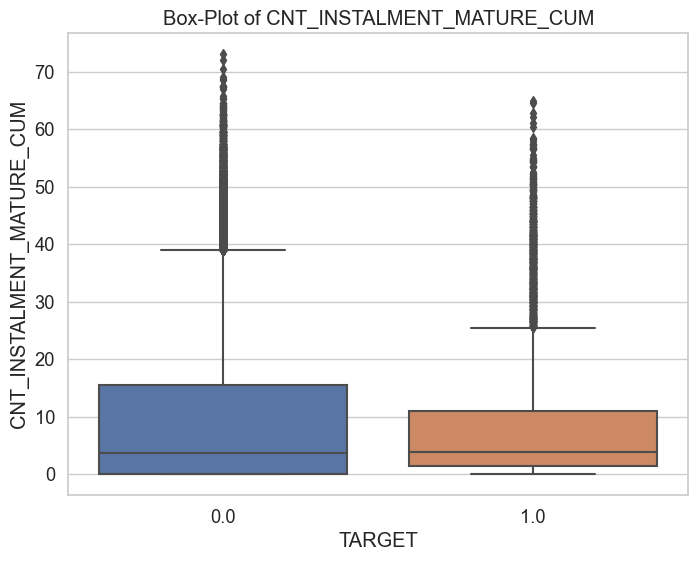

In [132]:
# Affiche Boxplot
plot_continuous_variables(cc_balance_merged,'CNT_INSTALMENT_MATURE_CUM',
                                               plots=['box'],
                                               figsize=(8, 6))

Remarque : 
- Le nombre de versement est plus élévée chez les non-défaillants que les défaillants. Ce qui en soit assez logique. 

#### Variables - 'MONTHS_BALANCE':
- Solde par rapppor à la date d'application(date du solde la plus récente)

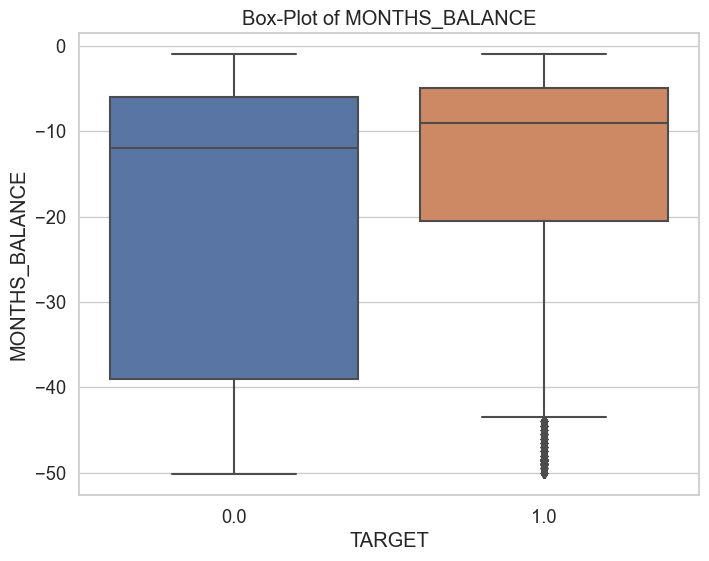

In [133]:
# Affiche Boxplot
plot_continuous_variables(cc_balance_merged,'MONTHS_BALANCE',
                                               plots=['box'],
                                               figsize=(8, 6))

Remarque: 
- le mois des soldes des défaillants sont plus récentes que les non-défaillantes. 

#### Variable - "AMT_CREDIT_LIMIT_ACTUAL":
- limite de la carte de crédit au cours du mois du crédit précédent. 

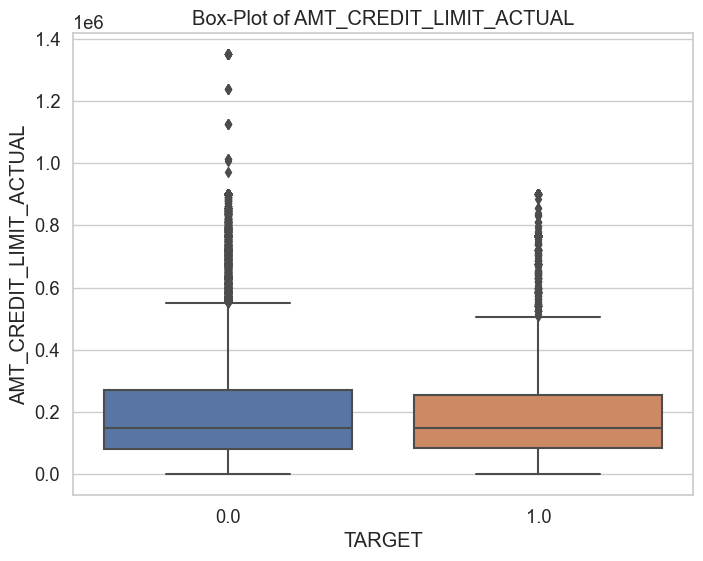

In [134]:
# Affiche Boxplot
plot_continuous_variables(cc_balance_merged,'AMT_CREDIT_LIMIT_ACTUAL',
                                               plots=['box'],
                                               figsize=(8, 6))

Remarque: 
- Limite des cartes de crédits est un peu inf pour les non-défaillants par rapport au défaillant. 

#### Variable - "AMT_DRAWINGS_ATM_CURRENT":
- Montant retirée au guichet au guichet auto durant le mois.

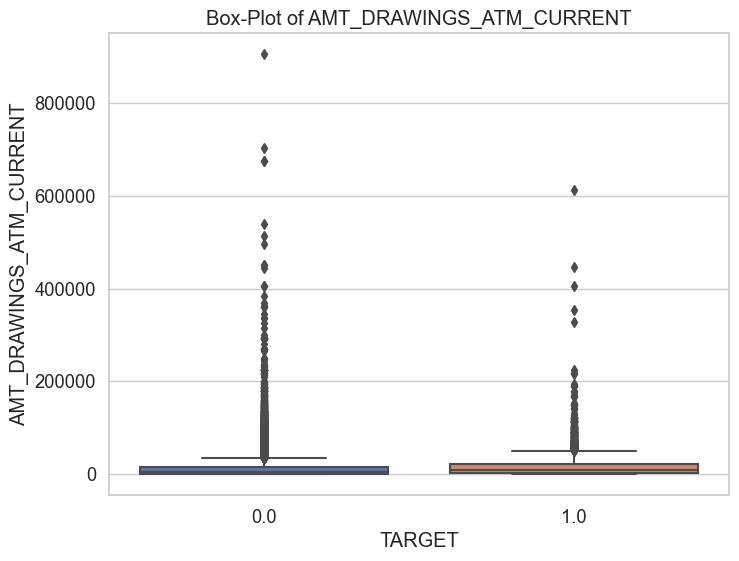

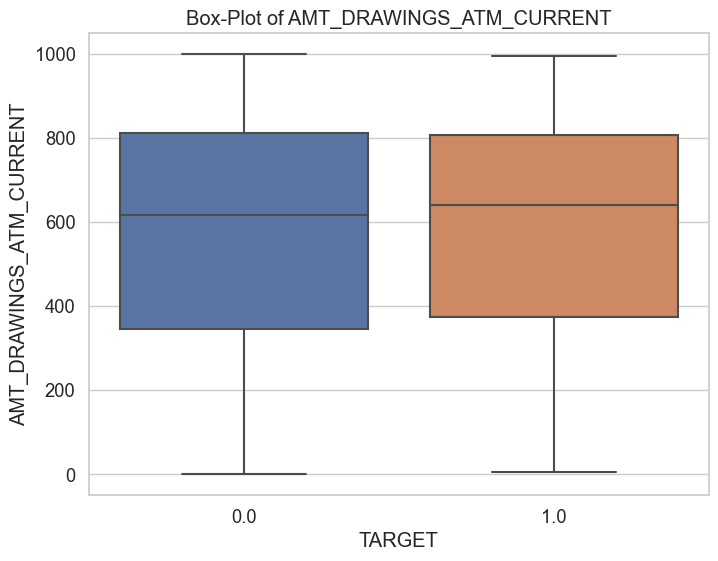

In [135]:
# Affiche Boxplot
plot_continuous_variables(cc_balance_merged,'AMT_DRAWINGS_ATM_CURRENT',
                                               plots=['box'],
                                               figsize=(8, 6))
# Zoom
plot_continuous_variables(cc_balance_merged,'AMT_DRAWINGS_ATM_CURRENT',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[0, 1000])

Remarque: 
- les non-défaillant en tendance a retirée un peu plus que les défaillants . 

#### Variable - "AMT_DRAWING_CURRENT":
- Montant prélévé au cours du mois .

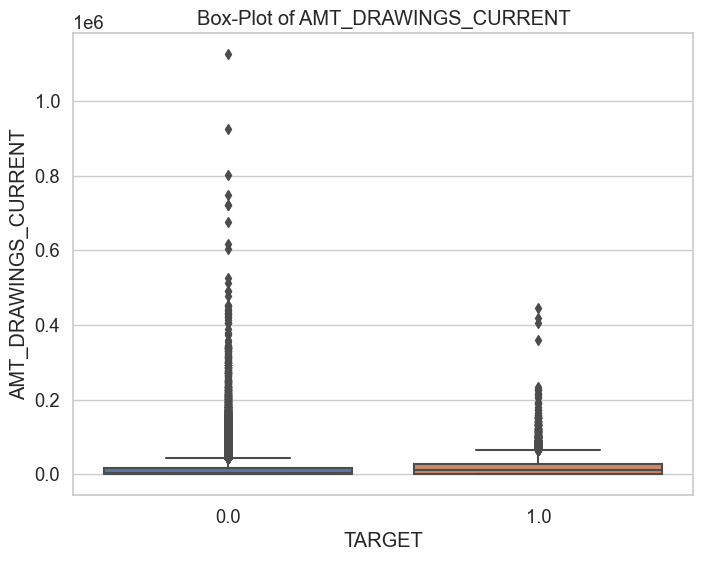

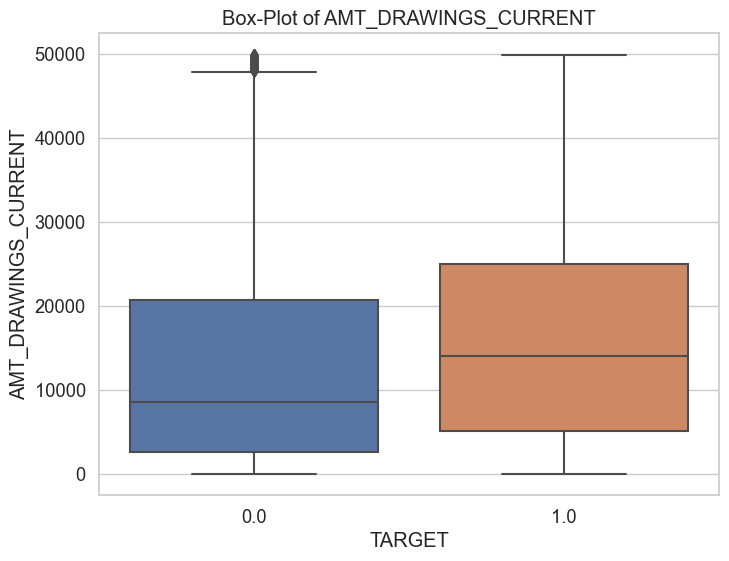

In [136]:
# Affiche Boxplot
plot_continuous_variables(cc_balance_merged,'AMT_DRAWINGS_CURRENT',
                                               plots=['box'],
                                               figsize=(8, 6))
# Zoom
plot_continuous_variables(cc_balance_merged,'AMT_DRAWINGS_CURRENT',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[0, 0.05e6])

Remarque: 
- Montant des prélévements est + élevées pour les défaillants. 

#### Variable - "AMT_DRAWINGS_OTHER_CURRRENT"
- Montant des autres prélèveement au cours du mois . 

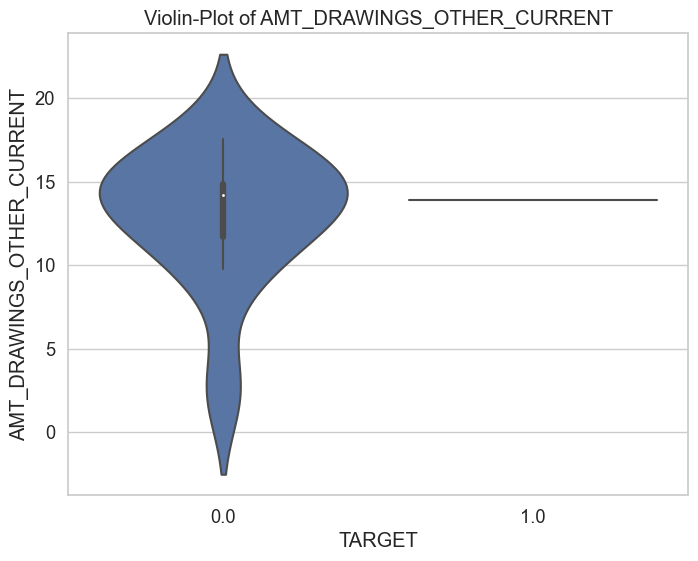

In [137]:
# Affiche Violinplot
plot_continuous_variables(cc_balance_merged,'AMT_DRAWINGS_OTHER_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,2*10^6))

Remarque: 
 - montant prélévés plus faible pour les défaillants que les non-défaillant.  

#### Variable - "AMT_Drawing_POS_CURRENT":
- Montant des prélèvement ou des achats de marchandise au cours du mois: 

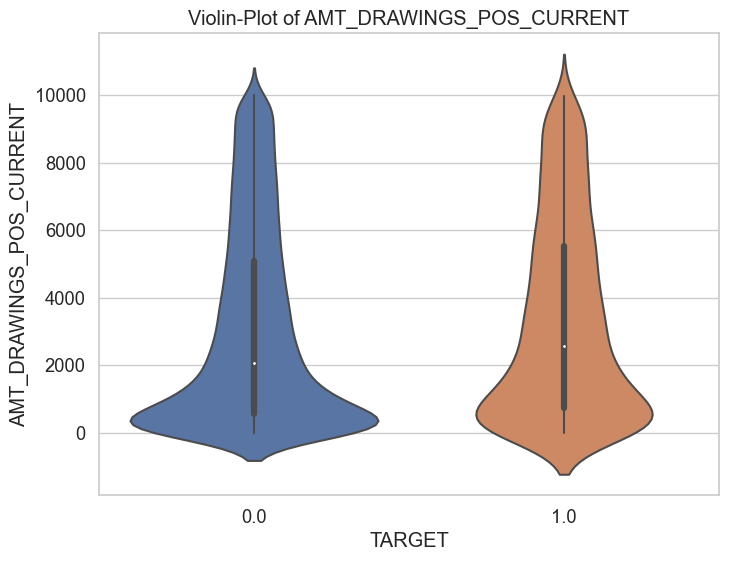

In [138]:
# Affiche Violinplot
plot_continuous_variables(cc_balance_merged,'AMT_DRAWINGS_POS_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,10000))



#### Variable - "AMT_INST_MIN_REGULARITY": 
- Versement min pour ce mois

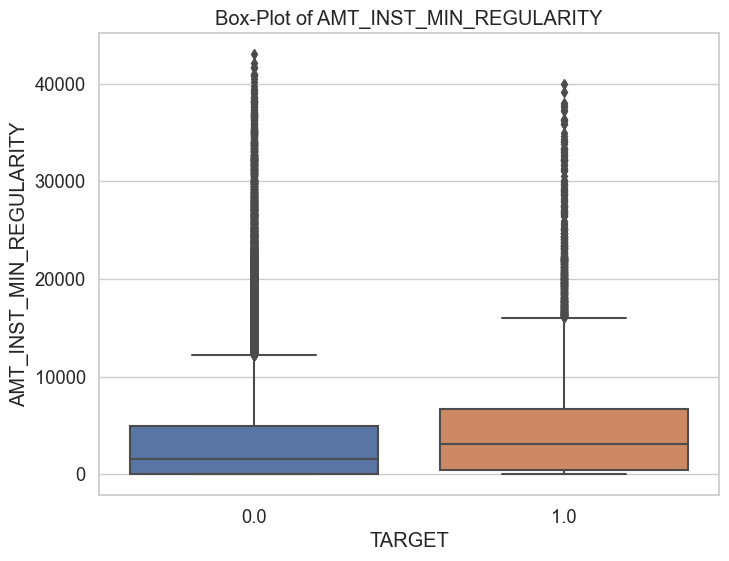

In [139]:
# Affiche Boxplot
plot_continuous_variables(cc_balance_merged,'AMT_INST_MIN_REGULARITY',
                                               plots=['box'],
                                               figsize=(8, 6))



Remarque: 
- Versement in min est plus élévée pour les non-défaillants. 

#### Variable - "AMT_PAYMENT_CURRENT":
- Paiment sur le crédit durant ce mois .

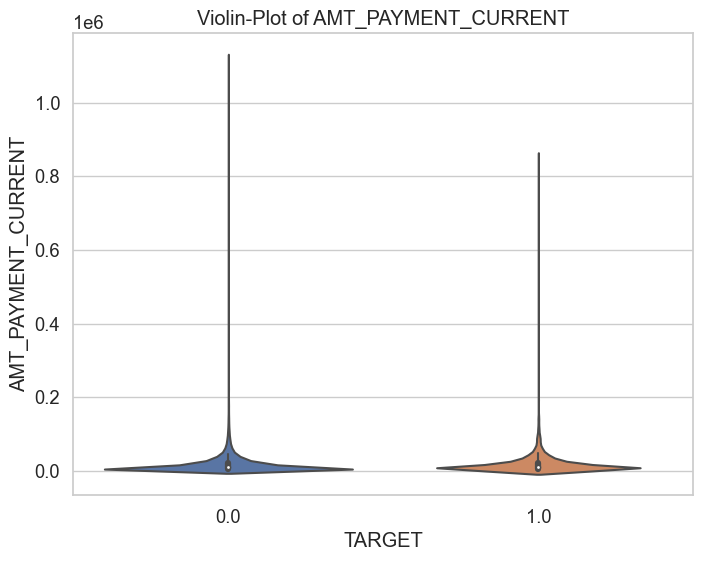

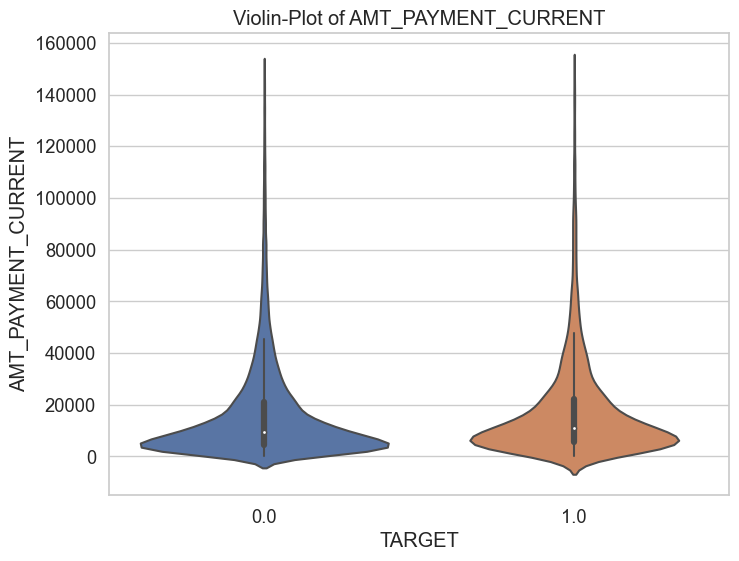

In [140]:
# Affiche Violinplot
plot_continuous_variables(cc_balance_merged,'AMT_PAYMENT_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6))
#Zoom
plot_continuous_variables(cc_balance_merged,'AMT_PAYMENT_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,150000))

Remarque: 
- Outlier : à 4 millions
- Peu de différence entre les défaillants et les non- défaillants.

#### Variable - " AMT_PAYMENT_TOTAL_CURRENT":
- Paiment total durant le mois sur les crédits . 

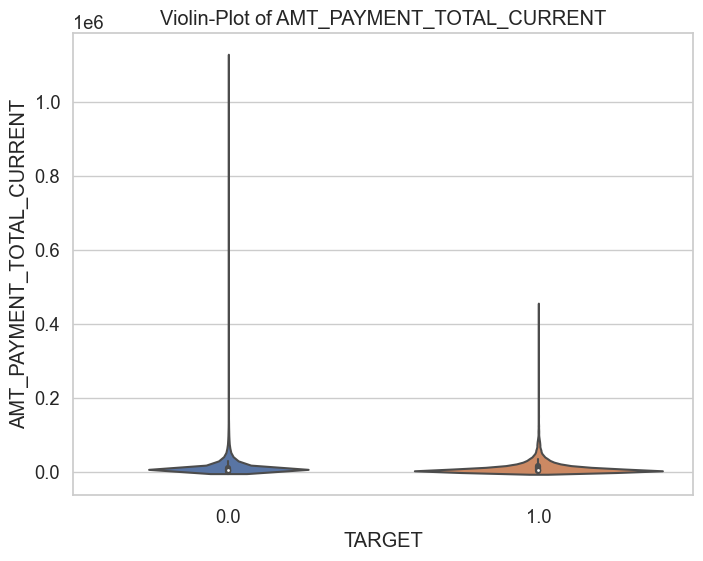

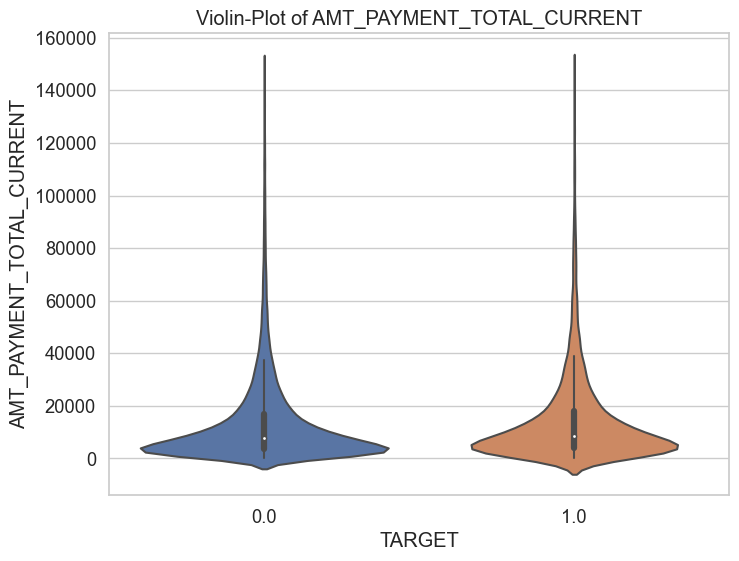

In [141]:
# Affiche Violinplot
plot_continuous_variables(cc_balance_merged,'AMT_PAYMENT_TOTAL_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6))
#Zoom 
plot_continuous_variables(cc_balance_merged,'AMT_PAYMENT_TOTAL_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,150000))



Remarque: 
- le non-défaillant en tendance à payer un peu plus que les défaillants. 

#### Variable - "AMT_RECEIVABLE_PRINCIPAL":
- Montant reçu sur le crédit.

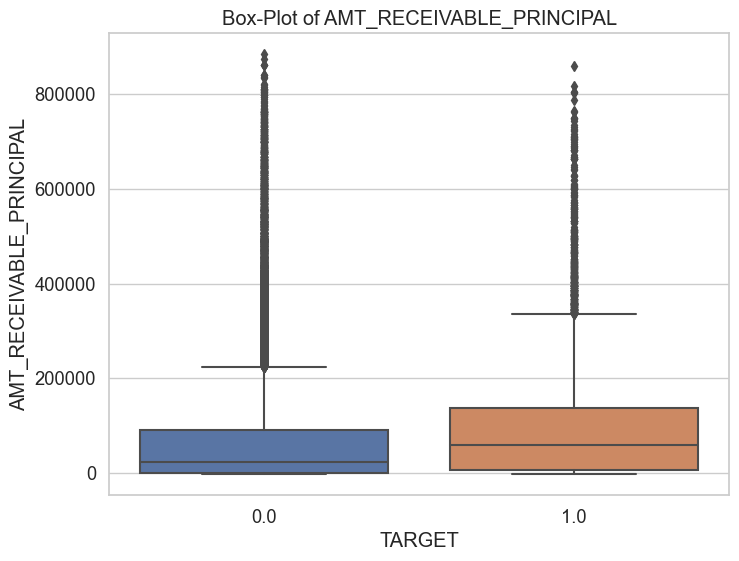

In [142]:
# Affiche Boxplot
plot_continuous_variables(cc_balance_merged,'AMT_RECEIVABLE_PRINCIPAL',
                                               plots=['box'],
                                               figsize=(8, 6))

Remarque: 
- les montants perçues sont supérieur pour les non-défaillants que pour les défaillants. 

#### Variable - "AMT_RECIVABLE":
- autre montant à reçevoir

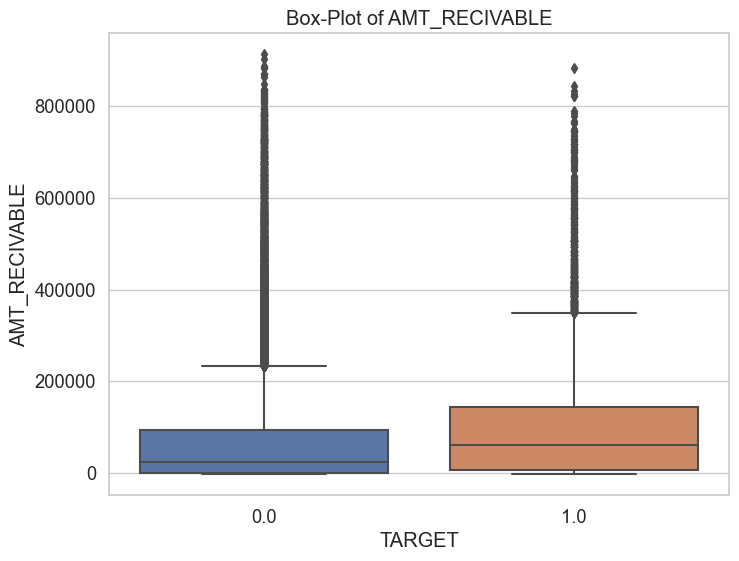

In [143]:
# Affiche Boxplot
plot_continuous_variables(cc_balance_merged,'AMT_RECIVABLE',
                                               plots=['box'],
                                               figsize=(8, 6))

Remarque: 
- Les autres montants reçus sont sup pour les non-défaillants que les défaillants. 

#### Variable - "CNT_DRAWINGS_ATM_CURRENT":
- Quantité de retraits au guichets automatique sur le mois . 

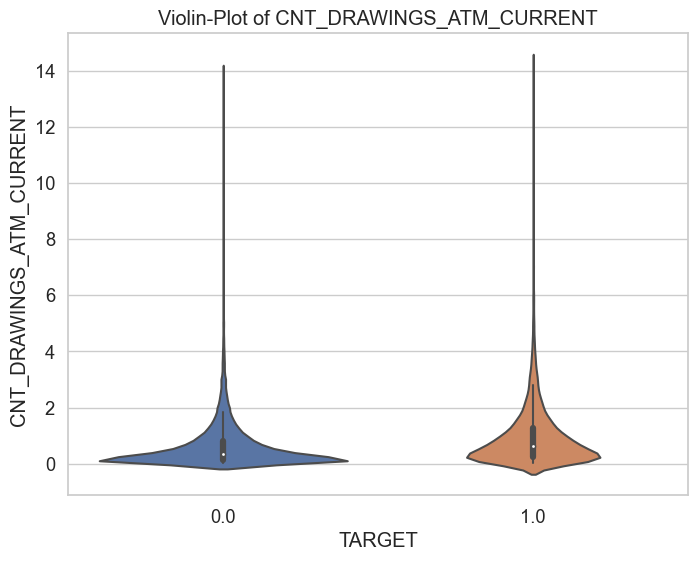

In [144]:
# Affiche Violinplot
plot_continuous_variables(cc_balance_merged,'CNT_DRAWINGS_ATM_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,15))

Remarque: 
- les rétraits sont un peu moins nommbreux chez les personnes défaillants. 

#### Variable - "CNT_DRAWINGS_OTHER_CURRENT"
- Nombre d'autres retraits au cours du mois. 

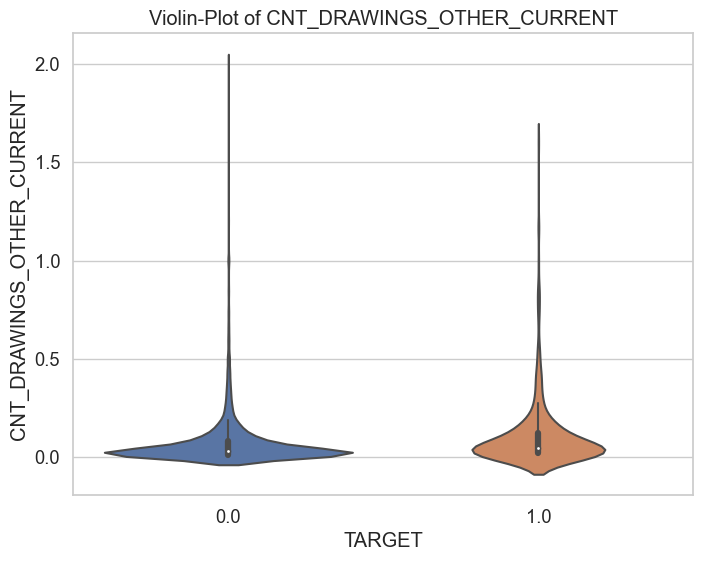

In [145]:
# Affiche Violinplot
plot_continuous_variables(cc_balance_merged,'CNT_DRAWINGS_OTHER_CURRENT',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,3))

Remarque: 
- Nombre de retraits autres sup pour les non-défaillants. 

#### Variables - "SK_DPD_DEF":
- Jours de retards au cours du mois sur le crédit en cours (pour le denrier mois)

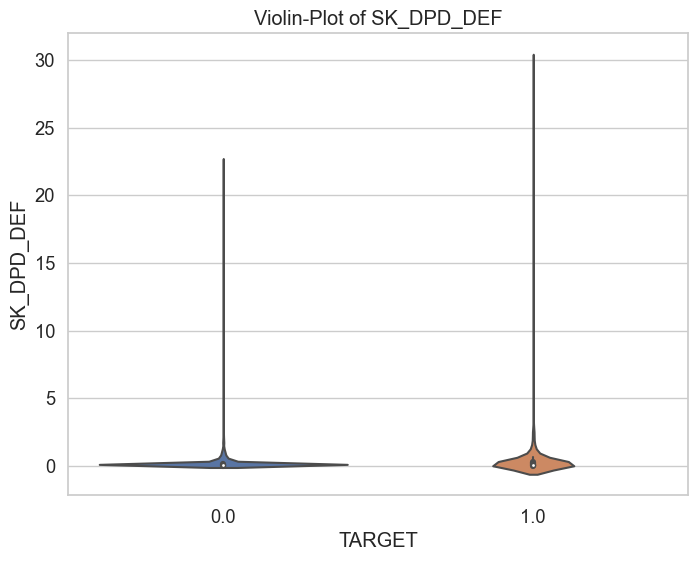

In [146]:
# Affiche Violinplot
plot_continuous_variables(cc_balance_merged,'SK_DPD_DEF',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,40))



Remarque: 
- les défaillants ont plus de jours de retards que les autres. 

#### Analyse Exploratoir multivariée:
- Corrélation entre les features numériques.

In [147]:
cc_balance_merged.columns

Index(['SK_ID_CURR', 'TARGET', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'SK_DPD', 'SK_DPD_DEF'],
      dtype='object')

----------------------------------------------------------------------------------------------------


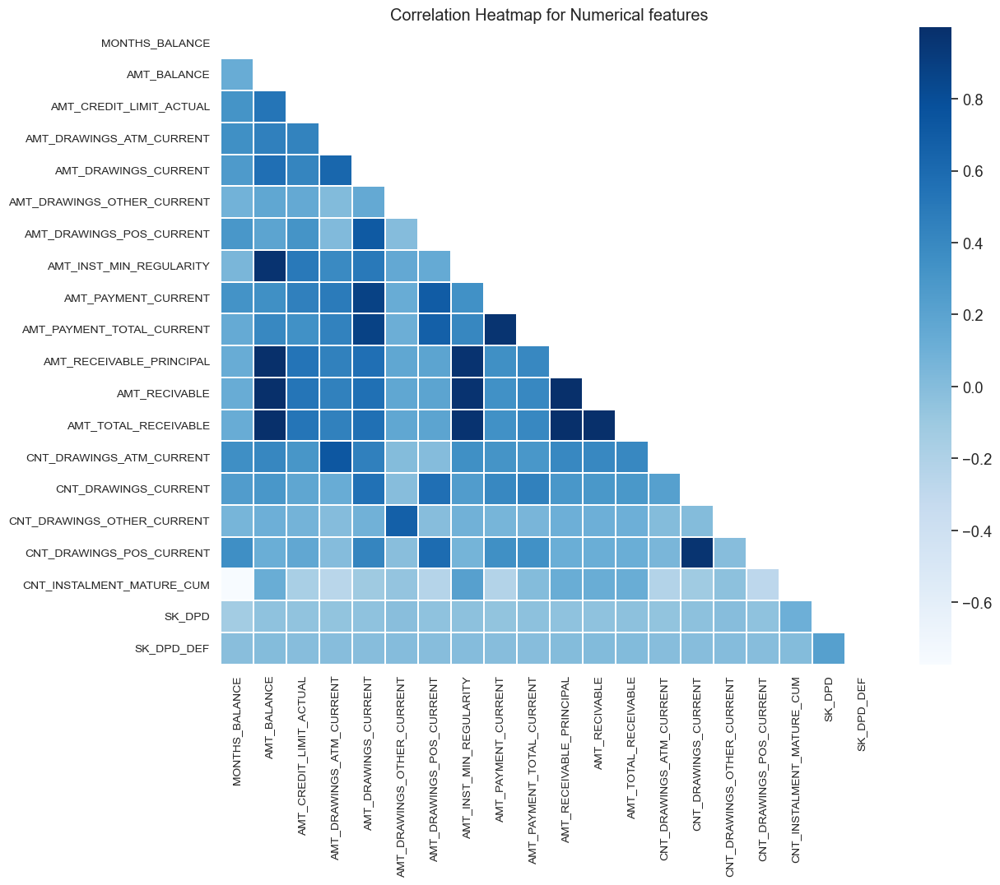

----------------------------------------------------------------------------------------------------


In [148]:
corr_mat = correlation_matrix(cc_balance_merged,
                                            ['SK_ID_CURR'],
                                            cmap='Blues',
                                            figsize=(13, 11))
corr_mat.plot_correlation_matrix()

In [149]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE']
interval columns not set, guessing: ['TARGET', 'AMT_BALANCE']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT_LIMIT_ACTUAL']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_ATM_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_OTHER_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_DRAWINGS_POS_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_INST_MIN_REGULARITY']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT_TOTAL_CURRENT']
interval columns not set, guessing: ['TARGET', 'AMT_RECEIVABLE_PRINCIPAL']
interval columns not set, guessing: ['TARGET', 'AMT_RECIVABLE']
interval columns not set, guessing: ['TARGET', 'AMT_TOTAL_RECEIVABLE']
interval columns not set, guessing: ['TARGET', 'CNT_DRAWINGS_ATM_CURREN

Column Name,Phik-Correlation
AMT_BALANCE,0.117710
AMT_RECIVABLE,0.117688
AMT_TOTAL_RECEIVABLE,0.117667
AMT_RECEIVABLE_PRINCIPAL,0.117472
AMT_INST_MIN_REGULARITY,0.088280
MONTHS_BALANCE,0.082091
CNT_INSTALMENT_MATURE_CUM,0.052574
CNT_DRAWINGS_ATM_CURRENT,0.042586
CNT_DRAWINGS_CURRENT,0.040082
CNT_DRAWINGS_POS_CURRENT,0.028772


-------------------------------------------------------------------------------


Remarque : Heatmap

- Le couple de variable  corrélé sont:
    * AMT_RECEIVABLE_PRINCIPAL/TOTAL/RECEIVABLE -> AMT_BALANCE | AMT_INST_MIN_REGULARITY
    * AMT_PAYMENT_TOTAL_CURRENT -> AMT_PAYMENT_CURRENT
- les couples de variable peu corréles aux autres features:
    * SK_DPD
    * SK_DPD_DEF


#### DataSets - "Installments_payments.csv"
- Datasets présente l'historique des remboursemens de chacun des prêts que les individues ont contracté auprès de "Home Credit Group".
- On retrouves les features suivants : montant du versements,.. .

In [150]:
#Brief of datasets :
installments_payments.name = 'installments_payments'
afficher_stats_basic_all(installments_payments, application_train,
                             application_test, 'SK_ID_PREV')

-------------------------------------------------------------------------------
Le jeu de données contient 13605401 lignes et 8 variables.
-------------------------------------------------------------------------------
Nombre de valeurs uniques SK_ID_PREV dans installments_payments.csv : 997752
Nombre de valeurs uniques SK_ID_CURR dans installments_payments.csv : 339587
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et installments_payments.csv : 291643
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et installments_payments.csv : 291643
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans installments_payments.csv : 0
-------------------------------------------------------------------------------
Contenu des 5 premières lignes :


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_PREV                  int64
SK_ID_CURR                  int64
NUM_INSTALMENT_VERSION    float64
NUM_INSTALMENT_NUMBER       int64
DAYS_INSTALMENT           float64
DAYS_ENTRY_PAYMENT        float64
AMT_INSTALMENT            float64
AMT_PAYMENT               float64
dtype: object

Répartition des types de variable



,Nombre par type de variable,% des types de variable
float64,5,62.500000
int64,3,37.500000



----------------------------------------------------------
Répartition schématique des types de variable 



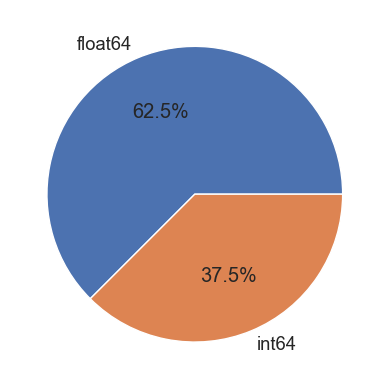

In [151]:
# Types des variables
get_types_variables(installments_payments, True, True, True)

In [152]:
# Résumé des variables
desc_bureau = description_variables(installments_payments)
desc_bureau

Valeurs manquantes : 5810 NaN pour 108843208 données (0.01 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
DAYS_ENTRY_PAYMENT,2905,0.020000
AMT_PAYMENT,2905,0.020000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


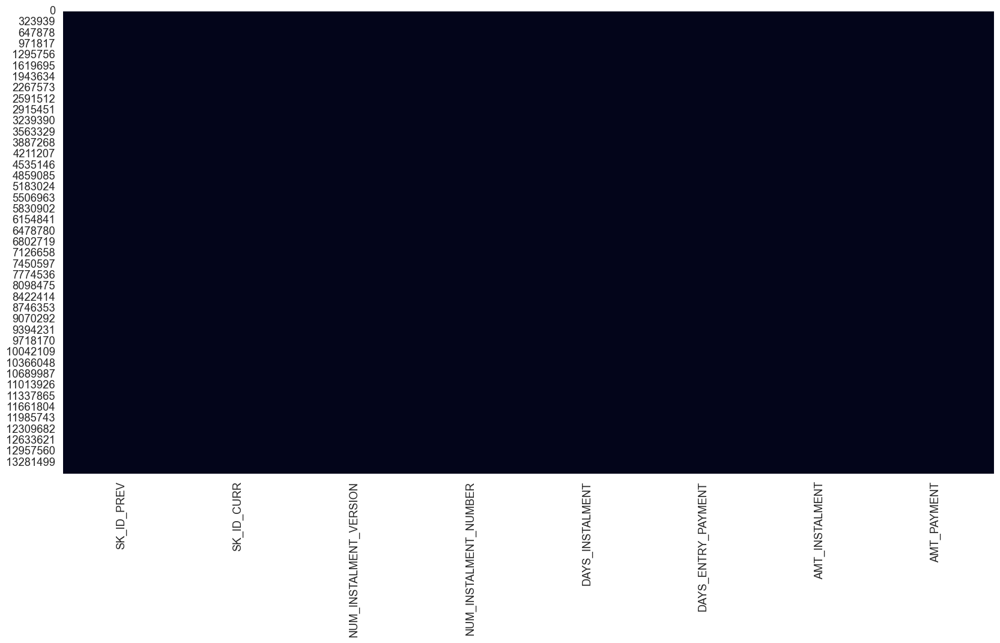

In [153]:
# Valeurs manquantes du dataframe
get_missing_values(installments_payments, True, True)

Number of columns having NaN values: 2 columns


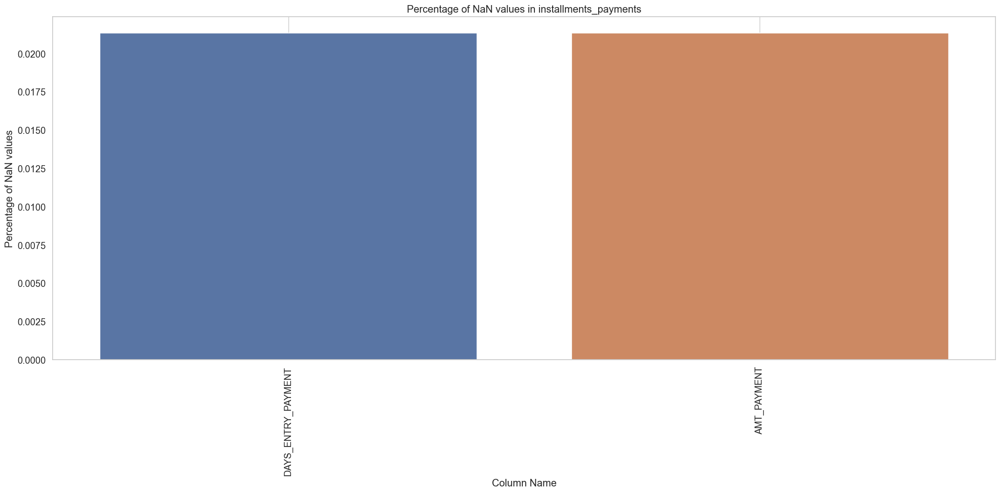

In [154]:
# Réprésentation visuelle des valeurs manquantes
df_nan_instpaie = nan_df_create(installments_payments)
plot_nan_percent(df_nan_instpaie, 'installments_payments',
                                      grid=True,
                                      figsize=(20, 10))



Remarque: 
- 13.6 millions de raws - installments_payments.csv
- Chacune représentant l'historique des versements en lier avec le prêts avec "Home_Credit_Group". 
- 8 Features différents - dont 6 en lier avec le versement pour le prêt. 
- 2 features avec des valeurs manquantes mais très infime (<0.02%>)

In [155]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
part1 = 'Création dataframe de travail : merge TARGET '
print(part1 + 'avec dataframe installments_payments')
installments_merged = application_train.iloc[:, :2].merge(installments_payments,
                                        on='SK_ID_CURR',
                                        how='left')
print("-"*79)



-------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe installments_payments
-------------------------------------------------------------------------------


In [156]:
installments_merged.head()

,SK_ID_CURR,TARGET,SK_ID_PREV,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,100002,1,1038818.0,1.0,16.0,-115.0,-133.0,9251.775,9251.775
1,100002,1,1038818.0,1.0,8.0,-355.0,-375.0,9251.775,9251.775
2,100002,1,1038818.0,2.0,19.0,-25.0,-49.0,53093.745,53093.745
3,100002,1,1038818.0,1.0,12.0,-235.0,-250.0,9251.775,9251.775
4,100002,1,1038818.0,1.0,9.0,-325.0,-344.0,9251.775,9251.775


#### Analyse exploratoire univariée
- Distribution des variables quantitatives: 

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'NUM_INSTALMENT_VERSION',
 'NUM_INSTALMENT_NUMBER',
 'DAYS_INSTALMENT',
 'DAYS_ENTRY_PAYMENT',
 'AMT_INSTALMENT',
 'AMT_PAYMENT']

In [157]:
# Liste des variables quantitatives
cols_num_instpaie = installments_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num_instpaie

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'NUM_INSTALMENT_VERSION',
 'NUM_INSTALMENT_NUMBER',
 'DAYS_INSTALMENT',
 'DAYS_ENTRY_PAYMENT',
 'AMT_INSTALMENT',
 'AMT_PAYMENT']

In [158]:
#Regrouper par le champs 'SK_ID_PREV" et agréger par la moyenne. 
installments_merged = installments_merged.groupby('SK_ID_PREV').mean()
installments_merged.head()

,SK_ID_CURR,TARGET,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
SK_ID_PREV,,,,,,,,
1000001.0,158271.0,0.0,1.500000,1.500000,-253.000000,-269.000000,34221.712500,34221.712500
1000003.0,252457.0,0.0,1.000000,2.000000,-64.000000,-79.333333,4951.350000,4951.350000
1000004.0,260094.0,0.0,1.142857,4.000000,-772.000000,-798.714286,4789.022143,4789.022143
1000005.0,176456.0,0.0,1.000000,5.818182,-1543.454545,-1551.909091,14703.210000,13365.609545
1000007.0,256657.0,0.0,1.000000,3.000000,-63.000000,-79.800000,11246.805000,11246.805000


In [159]:
installments_merged3 = installments_merged.reset_index()
installments_merged3.head()

,SK_ID_PREV,SK_ID_CURR,TARGET,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1000001.0,158271.0,0.0,1.500000,1.500000,-253.000000,-269.000000,34221.712500,34221.712500
1,1000003.0,252457.0,0.0,1.000000,2.000000,-64.000000,-79.333333,4951.350000,4951.350000
2,1000004.0,260094.0,0.0,1.142857,4.000000,-772.000000,-798.714286,4789.022143,4789.022143
3,1000005.0,176456.0,0.0,1.000000,5.818182,-1543.454545,-1551.909091,14703.210000,13365.609545
4,1000007.0,256657.0,0.0,1.000000,3.000000,-63.000000,-79.800000,11246.805000,11246.805000


#### Variable - "DAY_INSTALLMENTS" | "DAYS_ENTRY_PAYMENT" :
- Jours ou les versements du crédit précédent devait être payée.
- Jous ou les versements du crédit précédent a été effectifs. 

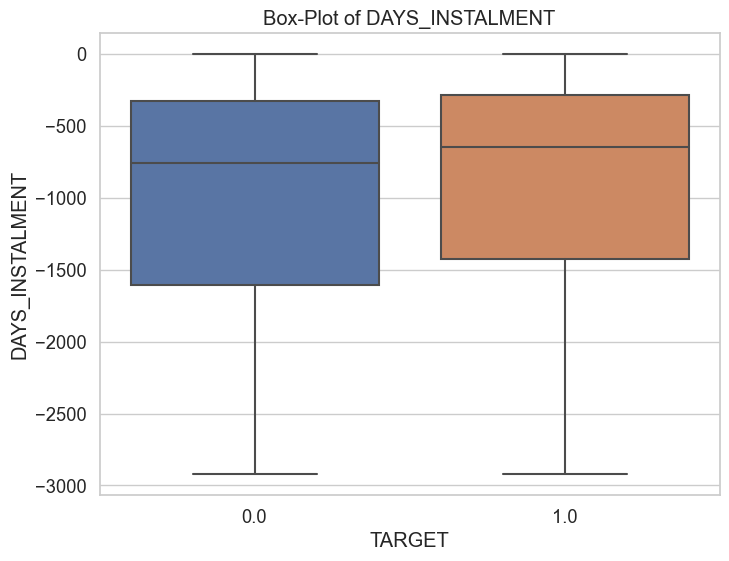

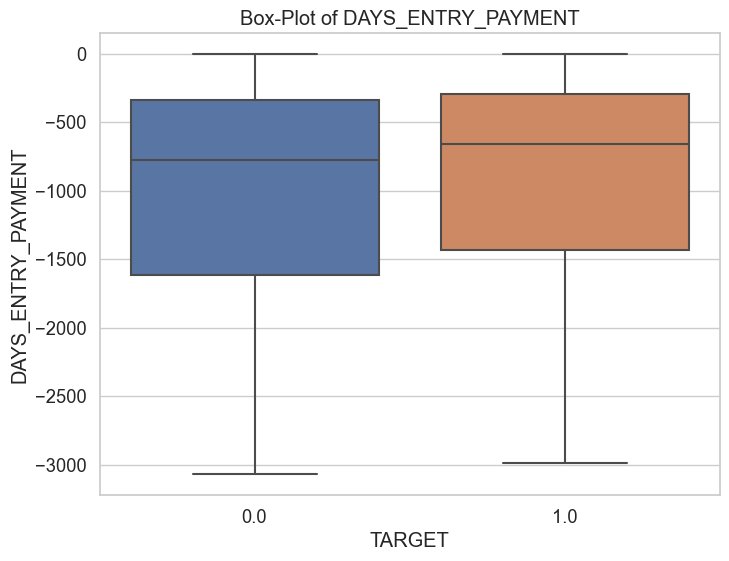

In [160]:
# Affiche Boxplot
plot_continuous_variables(installments_merged,'DAYS_INSTALMENT',
                                               plots=['box'],
                                               figsize=(8, 6))
# Affiche Boxplot
plot_continuous_variables(installments_merged,'DAYS_ENTRY_PAYMENT',
                                               plots=['box'],
                                               figsize=(8, 6))


Remarque: 
- les défaillants en tendance à avoir plus retard que les ND. 

#### Variable - "NUM_INSTALMENT_VERSION" |"NUM_INSTALMENT_NUMBER"|"AMT_INSTALMENT"|"AMT_PAYMENT"

- nombre de changement du type de versement
- nbr de versement 
- Montant de l'accompte prescrit du crédit
- Ce qui a été payée par les endettées. 


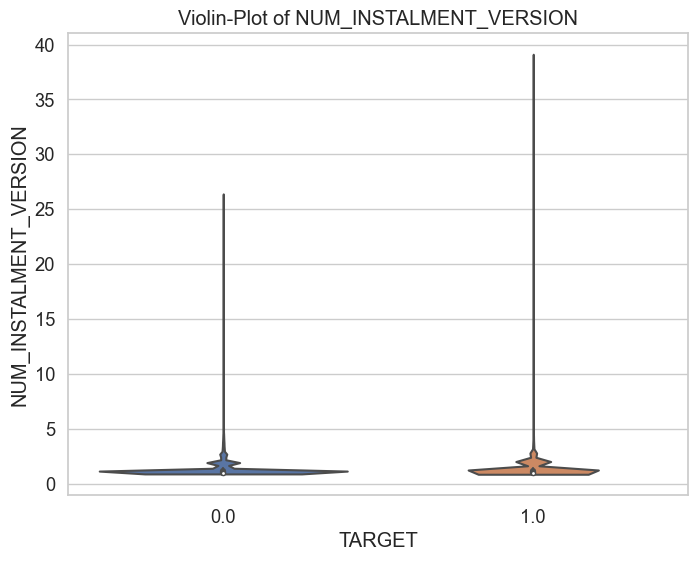

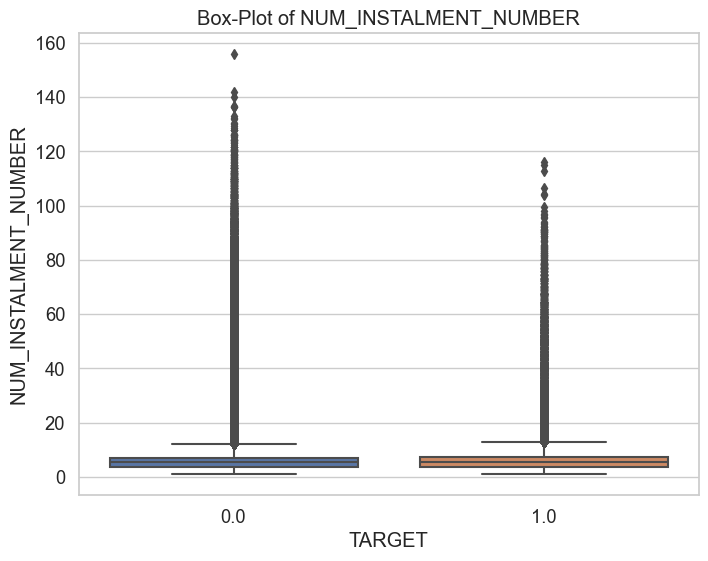

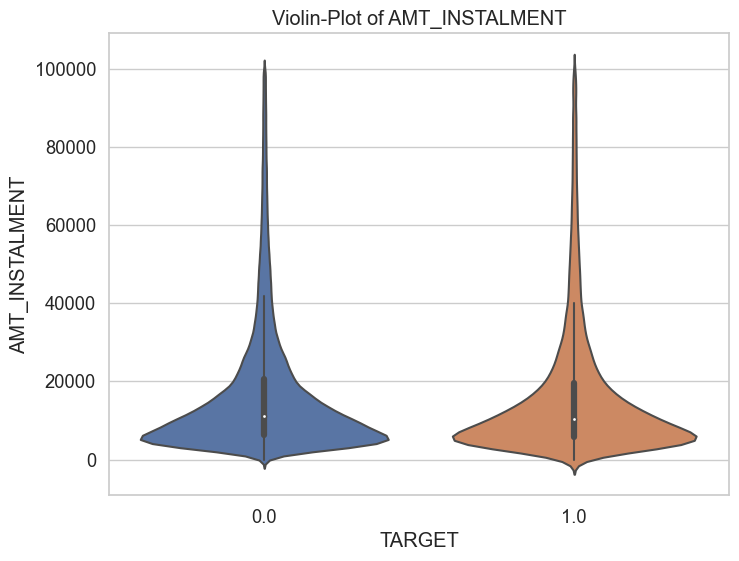

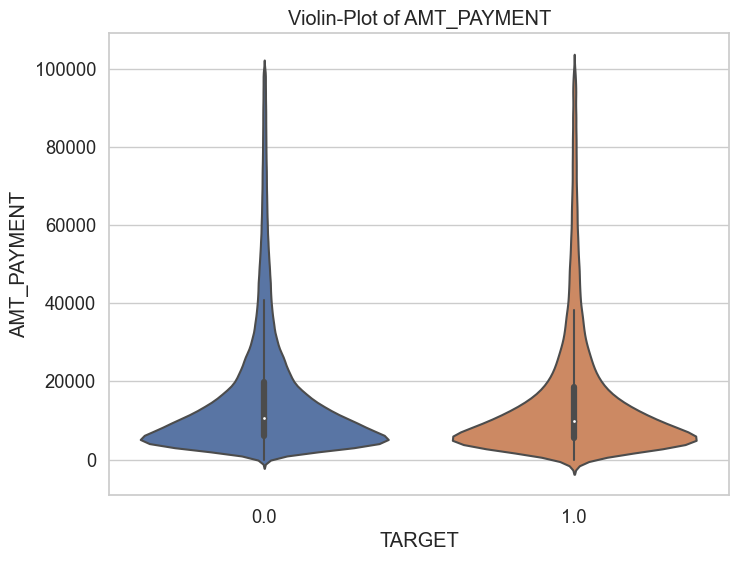

In [161]:
# Affiche Violinplot
plot_continuous_variables(installments_merged,'NUM_INSTALMENT_VERSION',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,40))

plot_continuous_variables(installments_merged,'NUM_INSTALMENT_NUMBER',
                                               plots=['box'],
                                               figsize=(8, 6))


# Affiche Violinplot
plot_continuous_variables(installments_merged,'AMT_INSTALMENT',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,100000))
                                            
# Affiche Violinplot
plot_continuous_variables(installments_merged,'AMT_PAYMENT',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,100000))

#### Analyse exploratoire multivariée
- Corrélation entre les variables numériques

In [162]:
installments_merged.head()

,SK_ID_CURR,TARGET,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
SK_ID_PREV,,,,,,,,
1000001.0,158271.0,0.0,1.500000,1.500000,-253.000000,-269.000000,34221.712500,34221.712500
1000003.0,252457.0,0.0,1.000000,2.000000,-64.000000,-79.333333,4951.350000,4951.350000
1000004.0,260094.0,0.0,1.142857,4.000000,-772.000000,-798.714286,4789.022143,4789.022143
1000005.0,176456.0,0.0,1.000000,5.818182,-1543.454545,-1551.909091,14703.210000,13365.609545
1000007.0,256657.0,0.0,1.000000,3.000000,-63.000000,-79.800000,11246.805000,11246.805000


----------------------------------------------------------------------------------------------------


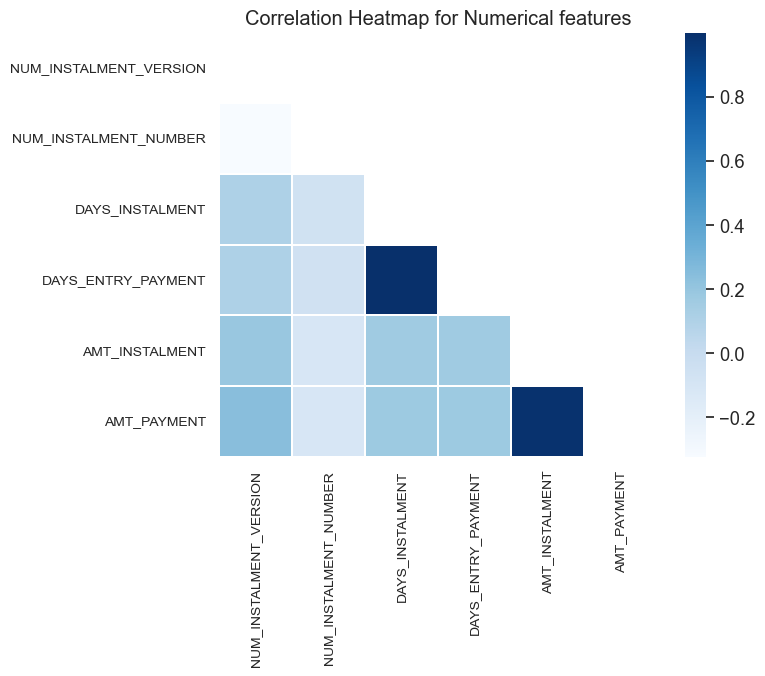

----------------------------------------------------------------------------------------------------


In [163]:
#Heatmap
corr_mat = correlation_matrix(installments_merged3,
                                            ['SK_ID_CURR', 'SK_ID_PREV'],
                                            cmap='Blues',
                                            figsize=(8, 7))
corr_mat.plot_correlation_matrix()



In [164]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

interval columns not set, guessing: ['TARGET', 'NUM_INSTALMENT_VERSION']
interval columns not set, guessing: ['TARGET', 'NUM_INSTALMENT_NUMBER']
interval columns not set, guessing: ['TARGET', 'DAYS_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'DAYS_ENTRY_PAYMENT']
interval columns not set, guessing: ['TARGET', 'AMT_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'AMT_PAYMENT']
-------------------------------------------------------------------------------
Les variables ayant les valeurs les plus élevées de Phik-corrélation avec la variable cible sont les suivantes :


Column Name,Phik-Correlation
DAYS_ENTRY_PAYMENT,0.041427
DAYS_INSTALMENT,0.041410
NUM_INSTALMENT_NUMBER,0.023453
AMT_INSTALMENT,0.005077
NUM_INSTALMENT_VERSION,0.004666
AMT_PAYMENT,0.004632


-------------------------------------------------------------------------------


Remarque: 
Heatmap - variables fortément corrélée sont:

* **AMT_INSTALMENT** et **AMT_PAYMENT**
* **DAYS_ENTRY_PAYMENT** et **DAYS_INSTALMMENT**
    
=> Les variables en question sont relative à la date à laquelle l'acompte devait être payée par rappor à la date à laquelle il a été payé ,de même au montant due à ceux qui a pu être payé . 

#### Datasets - "POS_CASH_balance.csv"
- ce dataset contient les intantanés des soldes mensuels des prêts aux points de vente et des prêts en espèces que le demandeur à obtenues auprès de "Home_Credit_Group".

- Features tels que : statut du contrat,nbr de versement restant,etc.. . 

In [165]:
POS_CASH_balance.name = 'POS_CASH_balance'
application_train.name = 'application_train'
application_test.name = 'application_test'

afficher_stats_basic_all(POS_CASH_balance, application_train,
                             application_test, 'SK_ID_PREV')

-------------------------------------------------------------------------------
Le jeu de données contient 10001358 lignes et 8 variables.
-------------------------------------------------------------------------------
Nombre de valeurs uniques SK_ID_PREV dans POS_CASH_balance.csv : 936325
Nombre de valeurs uniques SK_ID_CURR dans POS_CASH_balance.csv : 337252
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et POS_CASH_balance.csv : 289444
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et POS_CASH_balance.csv : 289444
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans POS_CASH_balance.csv : 0
-------------------------------------------------------------------------------
Contenu des 5 premières lignes :


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_PREV                 int64
SK_ID_CURR                 int64
MONTHS_BALANCE             int64
CNT_INSTALMENT           float64
CNT_INSTALMENT_FUTURE    float64
NAME_CONTRACT_STATUS      object
SK_DPD                     int64
SK_DPD_DEF                 int64
dtype: object

Répartition des types de variable



,Nombre par type de variable,% des types de variable
int64,5,62.500000
float64,2,25.000000
object,1,12.500000



----------------------------------------------------------
Répartition schématique des types de variable 



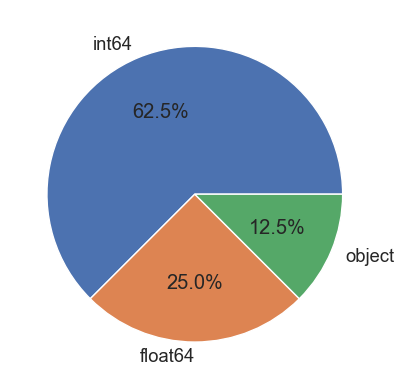

In [166]:
# Types des variables
get_types_variables(POS_CASH_balance, True, True, True)

In [167]:
# Résumé des variables
desc_bureau = description_variables(POS_CASH_balance)
desc_bureau

Valeurs manquantes : 52158 NaN pour 80010864 données (0.07 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
CNT_INSTALMENT,26071,0.260000
CNT_INSTALMENT_FUTURE,26087,0.260000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


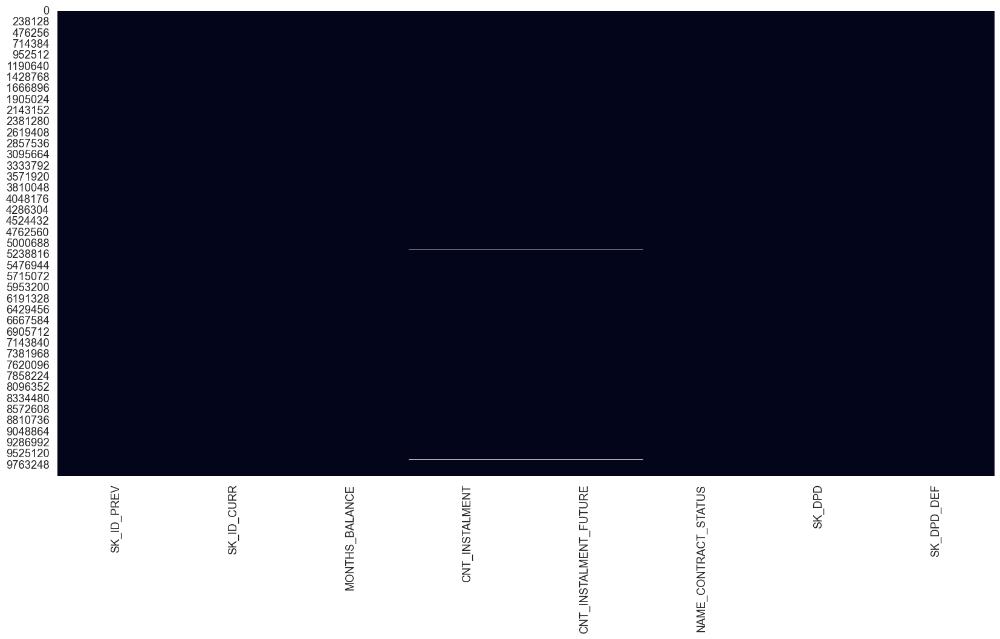

In [168]:
# Valeurs manquantes du dataframe
get_missing_values(POS_CASH_balance, True, True)

Number of columns having NaN values: 2 columns


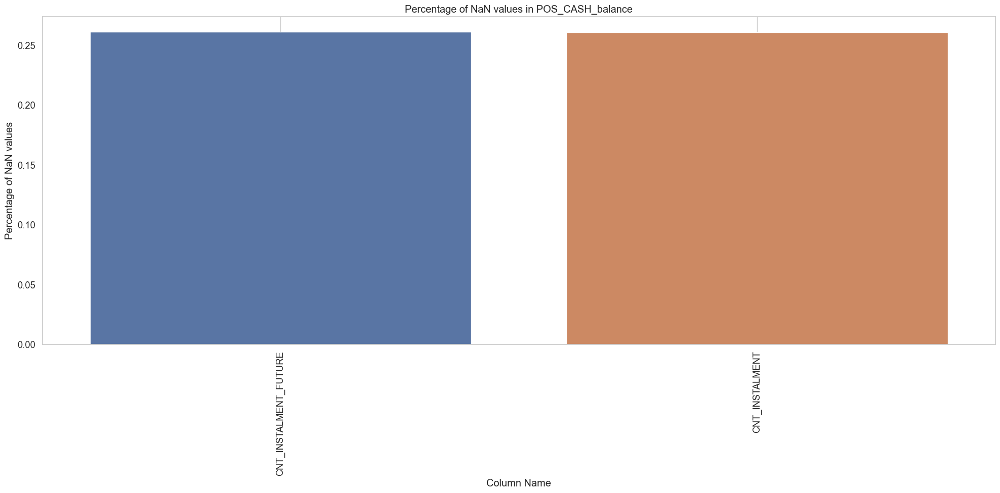

In [169]:
# Réprésentation visuelle des valeurs manquantes
df_nan_posh = nan_df_create(POS_CASH_balance)
plot_nan_percent(df_nan_posh, 'POS_CASH_balance',
                                      grid=True, 
                                      figsize=(20, 10))



Remarque: 
 - 10m de raw correspondant à l'instantané mensuel de l'"tat du POS et du prêt d'argent précédent que le demandeur ont eu avec "Home Credit Group". 
 
 - 8 Features différents . -> dont 2 avec des valeurs Nan(<0.26%>)

In [170]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
var1 = 'Création dataframe de travail : merge TARGET '
print(var1 + 'avec dataframe POS_CASH_balance')
pos_cash_merged = application_train.iloc[:, :2].merge(POS_CASH_balance,
                                                      on='SK_ID_CURR',
                                                      how='left')
print("-"*79)

-------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe POS_CASH_balance
-------------------------------------------------------------------------------


#### Analyse exploratoire univariée 
- distribution des variables catégorielles - ['NAME_CONTRACT_STATUS'] : Etat du contrat au cours du mois. 

In [171]:
# Liste des variables qualitatives
cols_cat_posh = pos_cash_merged.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_posh

['NAME_CONTRACT_STATUS']

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_CONTRACT_STATUS' are:
['Active' 'Completed' 'Returned to the store' 'Signed' nan 'Approved'
 'Demand' 'Amortized debt' 'Canceled' 'XNA']
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_CONTRACT_STATUS = 10


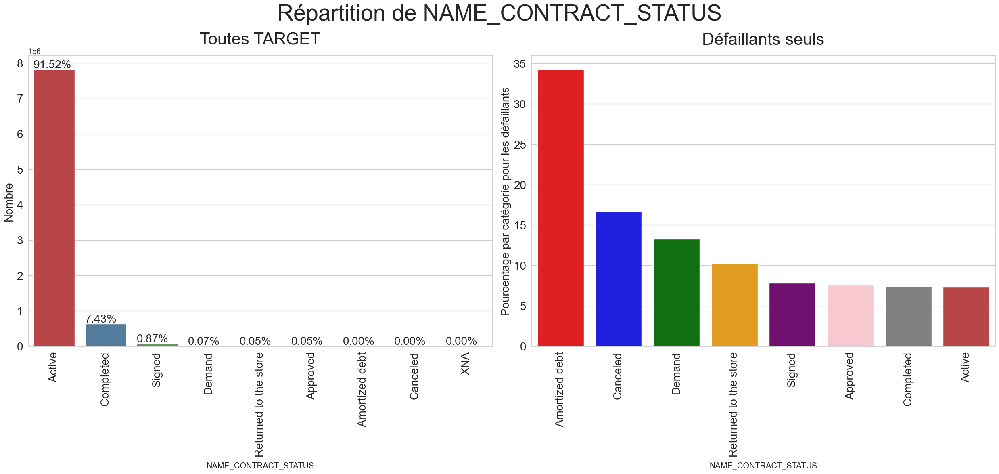

In [172]:
# Let us first see the unique categories of 'NAME_CONTRACT_STATUS'
print_unique_categories(pos_cash_merged,'NAME_CONTRACT_STATUS')

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(pos_cash_merged,
                                   column_name='NAME_CONTRACT_STATUS',
                                   figsize=(25, 12), rotation=90,
                                   fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999'],
                                   palette2=['red', 'blue',
                                             'green', 'orange',
                                             'purple', 'pink',
                                             'grey', '#cb3335'])

Remarque: 
- 91% des contrats sont soit : Actif ou Completed
- Pour les défaillants : 
    * la marjorité de le contrat est "Amortized debt" ou "Canceled". 
    * Les non-défaillants sont beaucoup plus nombreux pour contrat en cours d'activité.  

#### Distribution des variables quantitatives :


In [173]:
# Liste des variables quantitatives
cols_num_posh = pos_cash_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num_posh

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'MONTHS_BALANCE',
 'CNT_INSTALMENT',
 'CNT_INSTALMENT_FUTURE',
 'SK_DPD',
 'SK_DPD_DEF']

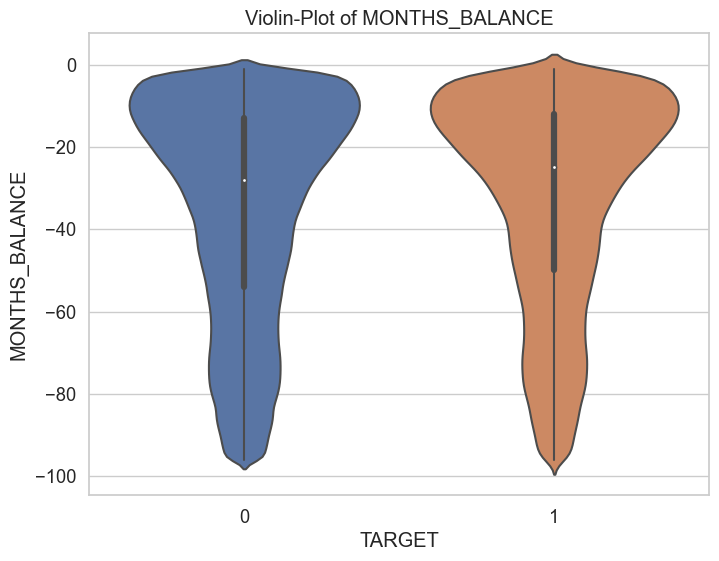

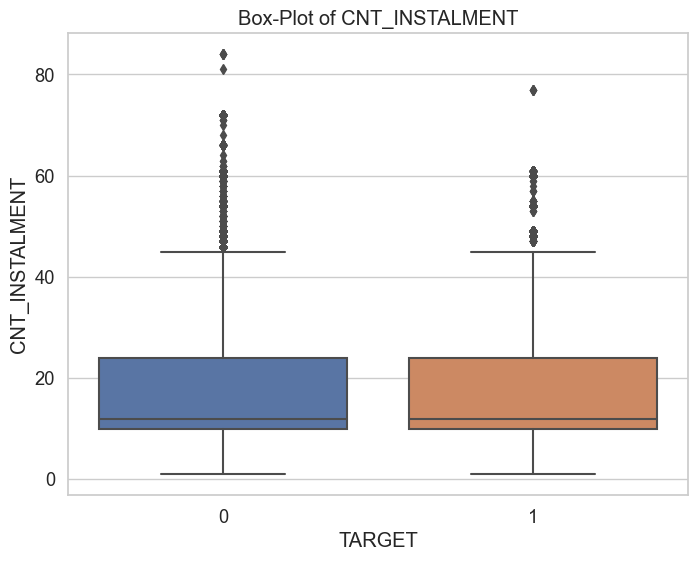

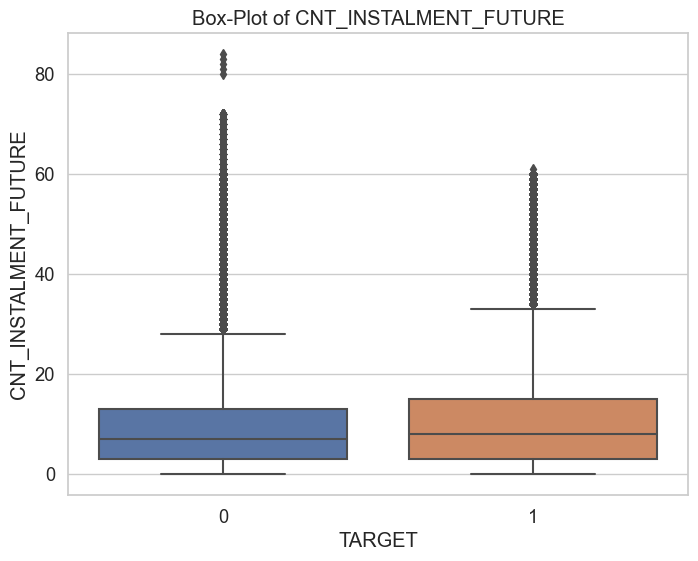

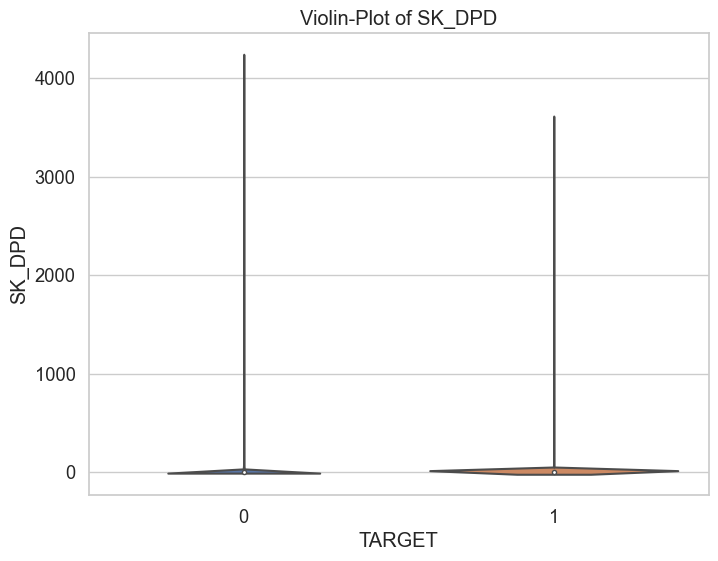

Zoom Violin - jours de retard au cours ==>


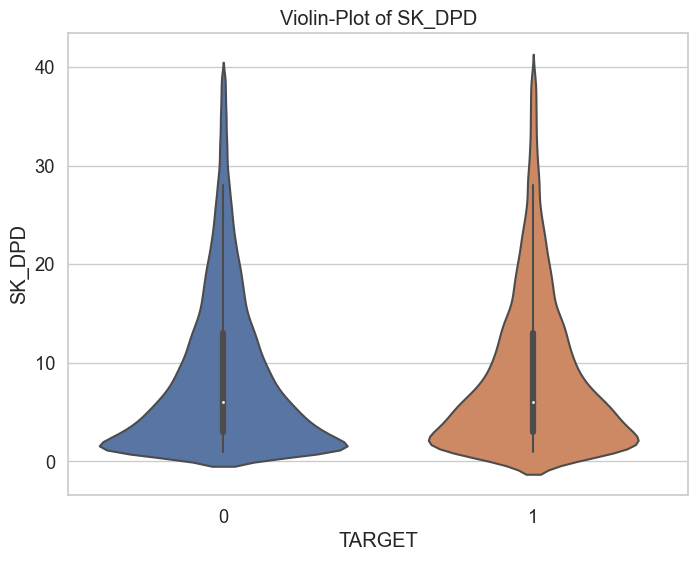

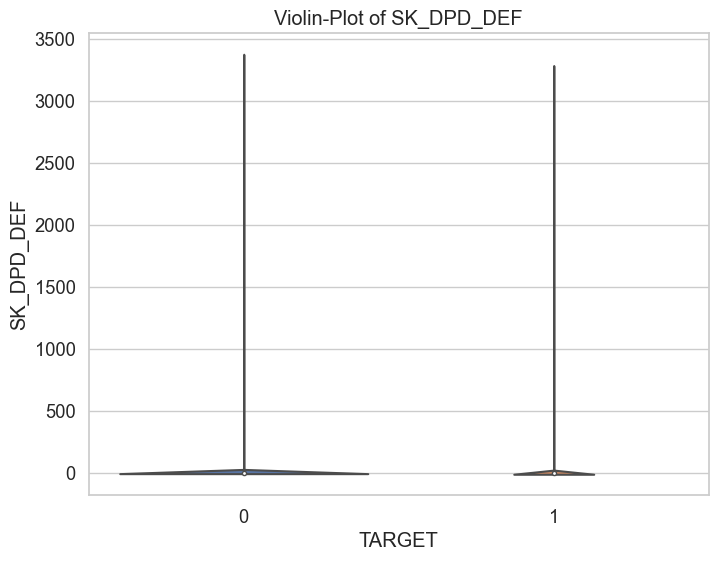

In [174]:
# Affiche Violinplot
plot_continuous_variables(pos_cash_merged,'MONTHS_BALANCE',
                                               plots=['violin'],
                                               figsize=(8, 6))
# Affiche Boxplot
plot_continuous_variables(pos_cash_merged,'CNT_INSTALMENT',
                                               plots=['box'],
                                               figsize=(8, 6))
# Affiche Boxplot
plot_continuous_variables(pos_cash_merged,'CNT_INSTALMENT_FUTURE',
                                               plots=['box'],
                                               figsize=(8, 6))
# Affiche Violinplot
plot_continuous_variables(pos_cash_merged,'SK_DPD',
                                               plots=['violin'],
                                               figsize=(8, 6))
# Affiche Violinplot
print('Zoom Violin - jours de retard au cours ==>')
plot_continuous_variables(pos_cash_merged,'SK_DPD',
                                               plots=['violin'],
                                               figsize=(8, 6),
                                               scale_limits=(0,40))
# Affiche Violinplot
plot_continuous_variables(pos_cash_merged,
                                               'SK_DPD_DEF',
                                               plots=['violin'],
                                               figsize=(8, 6))



#### Analyse exploratoire multivariée 
- Corrélation entre les variables numériques: 

----------------------------------------------------------------------------------------------------


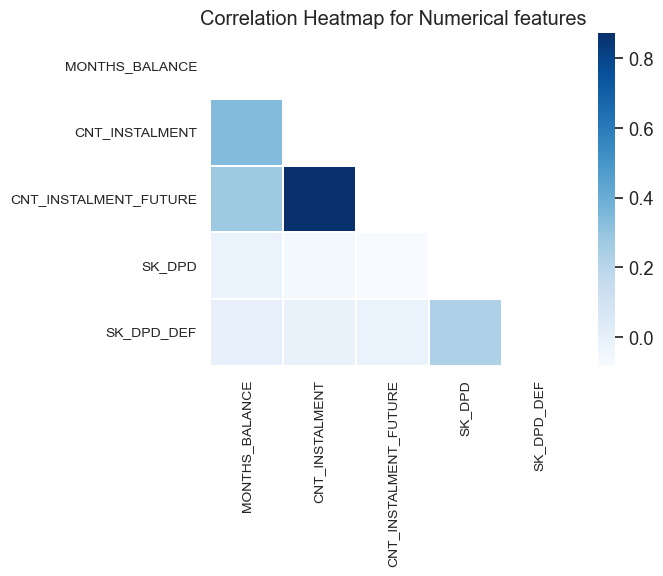

----------------------------------------------------------------------------------------------------


In [175]:
corr_mat = correlation_matrix(pos_cash_merged,
                                            ['SK_ID_CURR', 'SK_ID_PREV'],
                                            cmap='Blues',
                                            figsize=(7, 6))
corr_mat.plot_correlation_matrix()

In [176]:
# Seeing the top columns with highest phik-correlation with the target
# variable in pos_cash_merged table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

interval columns not set, guessing: ['TARGET', 'MONTHS_BALANCE']
interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT']
interval columns not set, guessing: ['TARGET', 'CNT_INSTALMENT_FUTURE']
interval columns not set, guessing: ['TARGET', 'SK_DPD']
interval columns not set, guessing: ['TARGET', 'SK_DPD_DEF']
-------------------------------------------------------------------------------
Les variables ayant les valeurs les plus élevées de Phik-corrélation avec la variable cible sont les suivantes :


Column Name,Phik-Correlation
CNT_INSTALMENT_FUTURE,0.033194
CNT_INSTALMENT,0.030947
MONTHS_BALANCE,0.027391
SK_DPD,0.012773
SK_DPD_DEF,0.010539


-------------------------------------------------------------------------------


Remarque:
Heatmap: 
- Feature fortement corrélée entre : 
    * **CNT_INSTALLMENT** & **CNT_INSTALLMENT_FUTURE** 
- Peu de corrélation entre: 
    * **SK_DPD** & **SK_DPD_DEF**


#### Dataset - "Previous_application.csv"
- Données du précédent prêt que les demandeurs ont eu avec Home Credit. 

In [177]:
previous_application.name = 'credit_card_balance'
application_train.name = 'application_train'
application_test.name = 'application_test'

afficher_stats_basic_all(previous_application, application_train,
                             application_test, 'SK_ID_PREV')

-------------------------------------------------------------------------------
Le jeu de données contient 1670214 lignes et 37 variables.
-------------------------------------------------------------------------------
Nombre de valeurs uniques SK_ID_PREV dans credit_card_balance.csv : 1670214
Nombre de valeurs uniques SK_ID_CURR dans credit_card_balance.csv : 338857
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et credit_card_balance.csv : 291057
Nombre de valeurs communes SK_ID_CURR dans application_train.csv et credit_card_balance.csv : 291057
-------------------------------------------------------------------------------
Numbre de valeurs dupliquées dans credit_card_balance.csv : 0
-------------------------------------------------------------------------------
Contenu des 5 premières lignes :


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

Répartition des types de variable



,Nombre par type de variable,% des types de variable
object,16,43.240000
float64,15,40.540000
int64,6,16.220000



----------------------------------------------------------
Répartition schématique des types de variable 



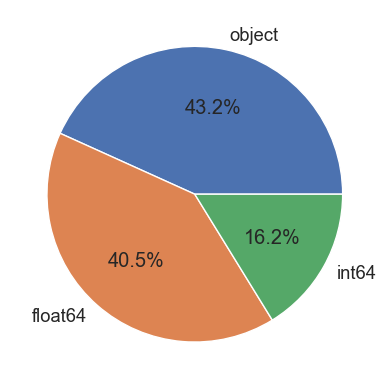

In [178]:
# Types des variables
get_types_variables(previous_application, True, True, True)

In [179]:
# Résumé des variables
desc_bureau = description_variables(previous_application)
desc_bureau

Valeurs manquantes : 11109336 NaN pour 61797918 données (17.98 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
RATE_INTEREST_PRIMARY,1664263,99.640000
RATE_INTEREST_PRIVILEGED,1664263,99.640000
AMT_DOWN_PAYMENT,895844,53.640000
RATE_DOWN_PAYMENT,895844,53.640000
NAME_TYPE_SUITE,820405,49.120000
DAYS_FIRST_DRAWING,673065,40.300000
DAYS_FIRST_DUE,673065,40.300000
DAYS_LAST_DUE_1ST_VERSION,673065,40.300000
DAYS_LAST_DUE,673065,40.300000
DAYS_TERMINATION,673065,40.300000


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


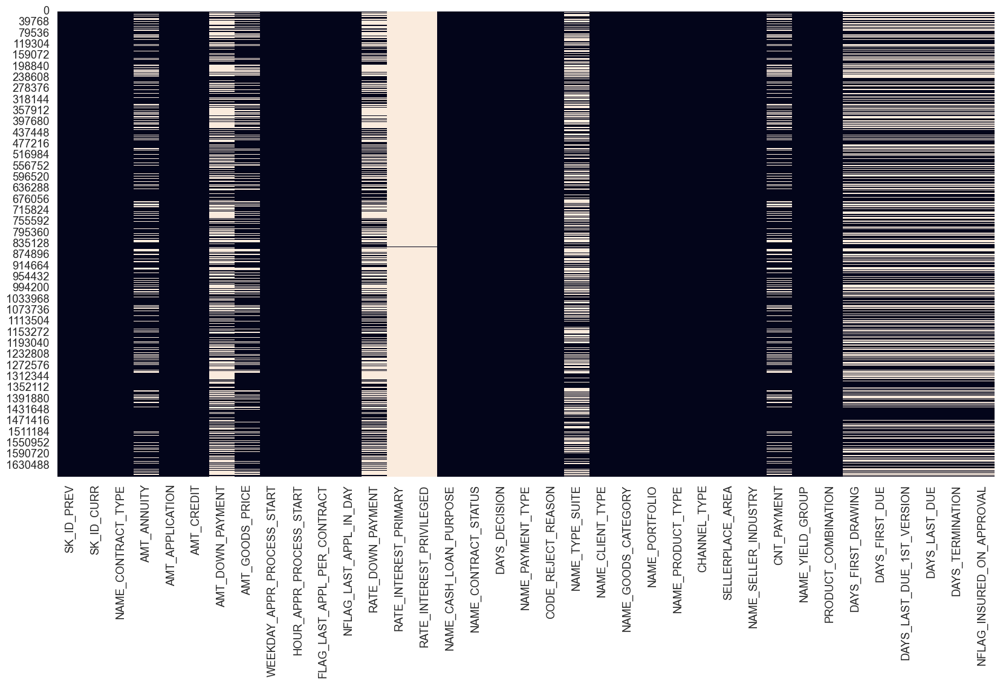

In [180]:
# Valeurs manquantes du dataframe
get_missing_values(previous_application, True, True)

Number of columns having NaN values: 16 columns


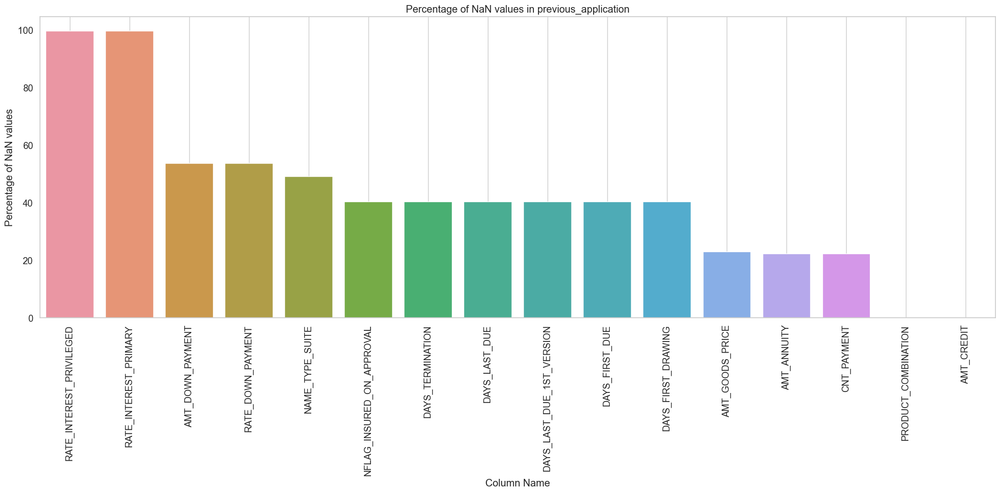

In [181]:
# Réprésentation visuelle des valeurs manquantes
df_nan_prev = nan_df_create(previous_application)
plot_nan_percent(df_nan_prev, 'previous_application',
                                      grid=True,
                                      figsize=(20, 10))



Remarque: 
- 1.60M de raws et 37 features(détailles sur les prêts)
- 16/37 features présentent des valeurs manquantes(NaN).
- 2 d'entre eux présentent 99% de valeurs manquantes. 
- 9 autres présentent > 40% des valeurs manquantes

In [182]:
# Ajout de la variable TARGET pour la répartition
# défaillants/non-défaillants
print('-'*79)
var = 'Création dataframe de travail : merge TARGET '
print(var + 'avec dataframe previous_application')
prev_merged = application_train.iloc[:, :2].merge(previous_application,
                                                  on='SK_ID_CURR',
                                                  how='left')
print("-"*79)

-------------------------------------------------------------------------------
Création dataframe de travail : merge TARGET avec dataframe previous_application
-------------------------------------------------------------------------------


#### Analyse exploratoire univariée:
- Distribution des variables catégorielles 

In [183]:
# Liste des variables qualitatives
cols_cat_prev = prev_merged.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_prev

['NAME_CONTRACT_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION']

#### Variable - CONTRACT_TYPE:
- type de produit contractuel (prêt d'argent,prêt à la consommation,... )

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_CONTRACT_TYPE' are:
['Consumer loans' 'Cash loans' 'Revolving loans' nan 'XNA']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Cash loans         626764
Consumer loans     625256
Revolving loans    161368
XNA                   313
Name: NAME_CONTRACT_TYPE, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_CONTRACT_TYPE = 5


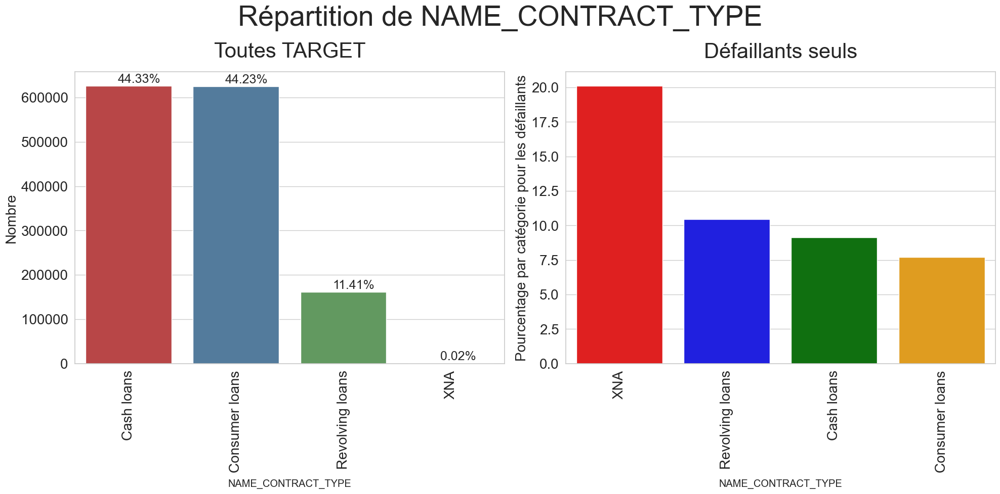

In [184]:
# Let us first see the unique categories of 'NAME_CONTRACT_TYPE'
print_unique_categories(prev_merged,'NAME_CONTRACT_TYPE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CONTRACT_TYPE',
                                   horizontal_adjust=0.3,
                                   figsize=(20, 10), fontsize_percent=18,
                                   rotation=90,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['red', 'blue',
                                             'green', 'orange'])



Remarque: 
- la plupart des prêts sont réparties de la manière suivantes:
    * Cash loans = 44.33%
    * Consumers loans = 44.23%
    * Revolving loans = 11.41%
    * XNA = 0.02%
- Parmis les défaillants la plupart des prêts sont :
    * des contrats : XNA et des Revolving loans. 

#### Variable - "NAME_CONTRACT_STATUS"
- Etat des contrats: Validé ou annulé.. 

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_CONTRACT_STATUS' are:
['Approved' 'Canceled' 'Refused' nan 'Unused offer']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: NAME_CONTRACT_STATUS, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_CONTRACT_STATUS = 5


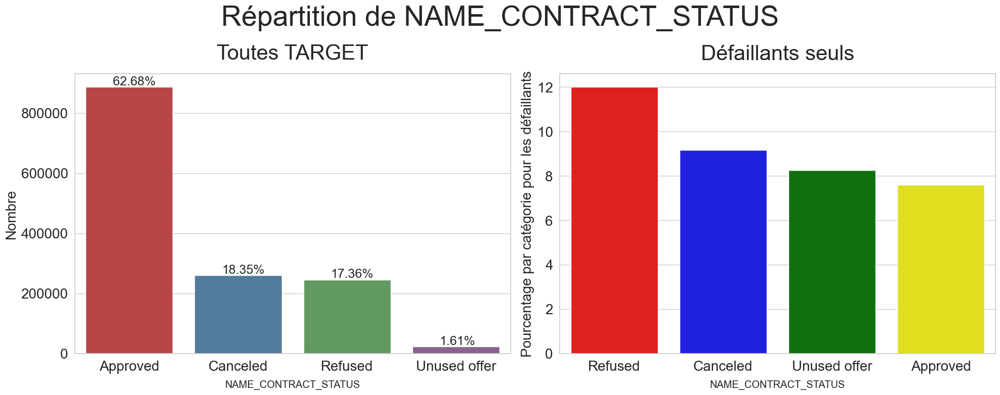

In [185]:
# Let us first see the unique categories of 'NAME_CONTRACT_STATUS'
print_unique_categories(prev_merged,'NAME_CONTRACT_STATUS',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CONTRACT_STATUS',
                                   horizontal_adjust=0.25,
                                   figsize=(20, 8), fontsize_percent=18,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['red', 'blue',
                                             'green', 'yellow'])

Remarque: 
- Statut des contrats:
    * 52.70% - Validée | 18.35 % - Fermé | 17.36% Refusée
- Parmis les défaillants:
    * 12% de refus | 9% de Canceled | 8% Unused offer et - 8% Approved


#### Variable - "CODE_REJECT_REASON"
- Raison des refus

----------------------------------------------------------------------------------------------------
The unique categories of 'CODE_REJECT_REASON' are:
['XAP' 'LIMIT' nan 'HC' 'SCO' 'SCOFR' 'VERIF' 'CLIENT' 'XNA' 'SYSTEM']
----------------------------------------------------------------------------------------------------
Counts of each category are:
XAP       1145533
HC         145984
LIMIT       47773
SCO         32636
CLIENT      22771
SCOFR       10875
XNA          4378
VERIF        3079
SYSTEM        672
Name: CODE_REJECT_REASON, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour CODE_REJECT_REASON = 10


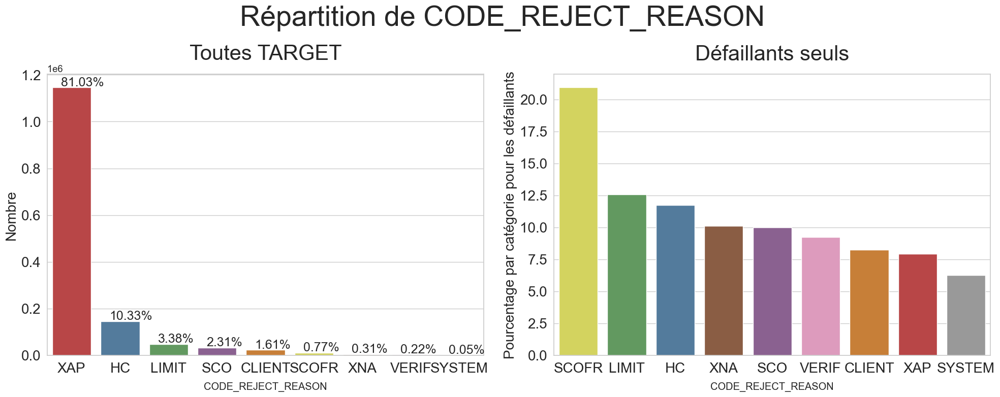

In [186]:
# Let us first see the unique categories of 'CODE_REJECT_REASON'
print_unique_categories(prev_merged,'CODE_REJECT_REASON',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='CODE_REJECT_REASON',
                                   horizontal_adjust=0.18,
                                   figsize=(20, 8), fontsize_percent=18,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999'],
                                   palette2=['#e6e64c', '#59a257',
                                             '#477ca8', '#965a38',
                                             '#905998', '#e890be',
                                             '#df7f20', '#cb3335',
                                             '#999999'])

Remarque: 
- Les raison des réfus: 
    * 81% -> XAP | 10% -> HC|<3% -> SCO
- Pour les défaillants:
    * 20% -> SCOFR | 12.5% -> LIMIT |12% -> HC et <8% -> XAP.

#### Variable - "CHANNEL_TYPE"
- Le canal par lequel le demandeur a été acquis pour son prêts.

----------------------------------------------------------------------------------------------------
The unique categories of 'CHANNEL_TYPE' are:
['Stone' 'Credit and cash offices' 'Country-wide' 'Regional / Local'
 'AP+ (Cash loan)' 'Contact center' nan 'Channel of corporate sales'
 'Car dealer']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Credit and cash offices       600342
Country-wide                  423062
Stone                         183508
Regional / Local               92472
Contact center                 58891
AP+ (Cash loan)                49624
Channel of corporate sales      5396
Car dealer                       406
Name: CHANNEL_TYPE, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour CHANNEL_TYPE = 9


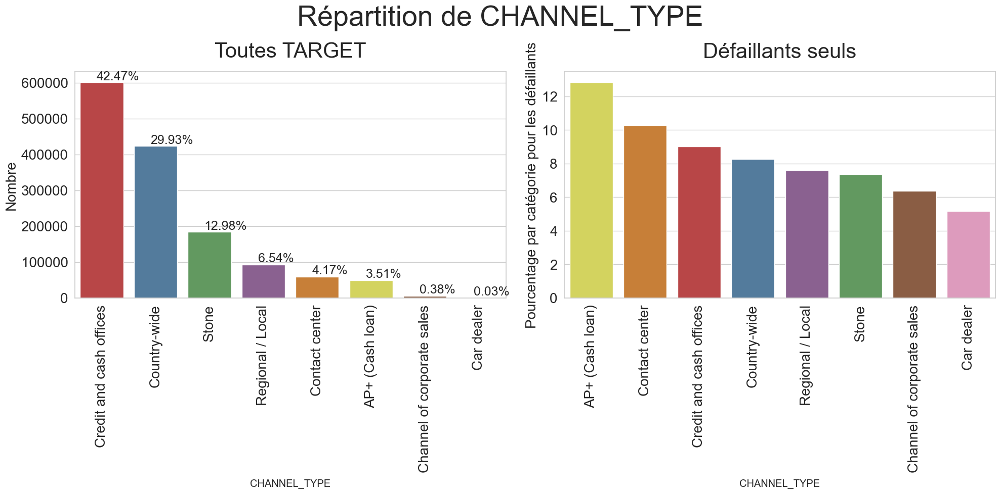

In [187]:
# Let us first see the unique categories of 'CHANNEL_TYPE'
print_unique_categories(prev_merged,'CHANNEL_TYPE',
                                    show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='CHANNEL_TYPE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(20, 10), fontsize_percent=18,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be'],
                                   palette2=['#e6e64c', '#df7f20',
                                             '#cb3335', '#477ca8',
                                             '#905998', '#59a257',
                                             '#965a38', '#e890be'])



Remarque: 
- la plupart des clients ont contracté leurs prêts chez :
    * 42.47% -> Credit and cashes offices 
    * 30% -> Country-wide
    * 13% -> Stone
- Pour les défaillants:
    * 12% -> AP + Cashs loans
    * 10% -> Contract center
    * 9 % -> Credit and cashes offices

#### Variable - "PRODUCT_COMBINAISON"
- détailles des produits de prêts contractés.

----------------------------------------------------------------------------------------------------
The unique categories of 'PRODUCT_COMBINATION' are:
['POS other with interest' 'Cash X-Sell: low' 'POS industry with interest'
 'POS household with interest' 'POS mobile without interest' 'Card Street'
 'Card X-Sell' 'Cash X-Sell: high' 'Cash' 'Cash Street: high'
 'Cash X-Sell: middle' 'POS mobile with interest'
 'POS household without interest' 'POS industry without interest'
 'Cash Street: low' nan 'Cash Street: middle'
 'POS others without interest']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Cash                              235101
POS household with interest       226464
POS mobile with interest          190850
Cash X-Sell: middle               120036
Cash X-Sell: low                  110599
Card Street                        94594
POS industry with interest         83508
POS household without in

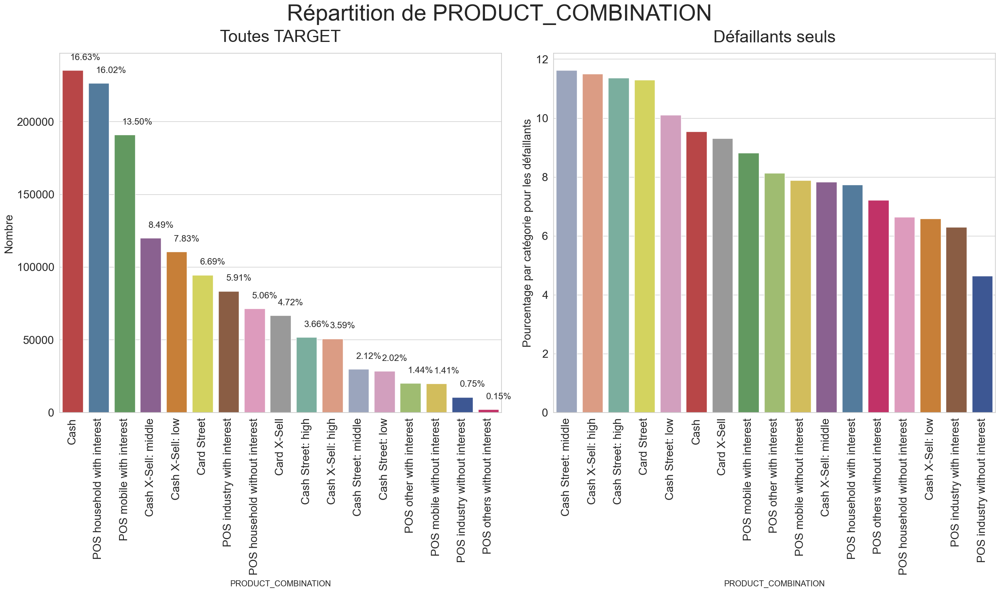

In [188]:
# Let us first see the unique categories of 'CREDIT_ACTIVE'
print_unique_categories(prev_merged,'PRODUCT_COMBINATION',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='PRODUCT_COMBINATION',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(25, 15), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675', '#95a3c3',
                                             '#db96c0', '#a2c865',
                                             '#e5c949', '#2f51a1',
                                             '#d91a61'],
                                   palette2=['#95a3c3', '#e99675',
                                             '#72b6a1', '#e6e64c',
                                             '#db96c0', '#cb3335',
                                             '#999999', '#59a257',
                                             '#a2c865', '#e5c949',
                                             '#905998', '#477ca8',
                                             '#d91a61', '#e890be',
                                             '#df7f20', '#965a38',
                                             '#2f51a1'])



Remarque:

- Les trois types de combinaison de produits les plus courants sont:
    * l'argent liquide, les points de vente domestiques avec intérêt et les points de vente mobiles avec intérêt => soit environ 50% de toutes les demandes.
- Pour les défaillants: 
    * Ce sont les ! Cash X-shell,Cash Street:high ET Cash Street -middle qui sont les plus nombreux avec >11%.

#### Variable - "WEEKDAY_APPR_PROCESS_START"
- jour de la semaine ou une demande prêt à été réalisé.

----------------------------------------------------------------------------------------------------
The unique categories of 'WEEKDAY_APPR_PROCESS_START' are:
['SATURDAY' 'FRIDAY' 'SUNDAY' 'THURSDAY' 'TUESDAY' 'MONDAY' 'WEDNESDAY'
 nan]
----------------------------------------------------------------------------------------------------
Counts of each category are:
WEDNESDAY    215519
TUESDAY      215058
MONDAY       214509
FRIDAY       213373
THURSDAY     211005
SATURDAY     204159
SUNDAY       140078
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour WEEKDAY_APPR_PROCESS_START = 8


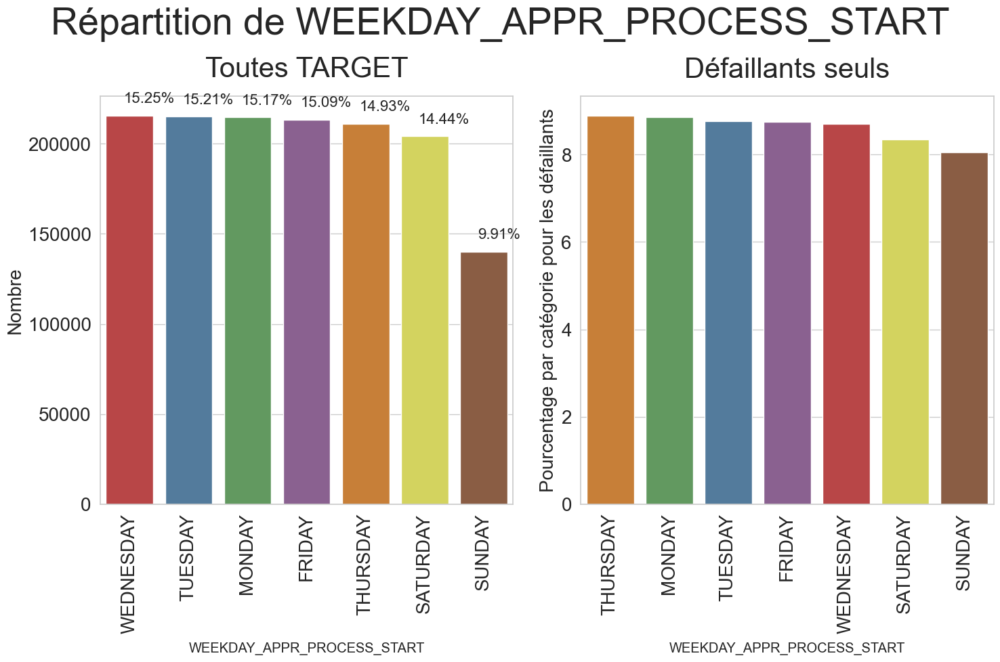

In [189]:
# Let us first see the unique categories of 'WEEKDAY_APPR_PROCESS_START'
print_unique_categories(prev_merged,'WEEKDAY_APPR_PROCESS_START',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='WEEKDAY_APPR_PROCESS_START',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(15, 10), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38'],
                                   palette2=['#df7f20', '#59a257',
                                             '#477ca8', '#905998',
                                             '#cb3335', '#e6e64c',
                                             '#965a38'])

Remarque: 
- Les demandes ont été réalisé durant la semaine la plupart du temps. 

#### Variable - "FLAG_LAST_APPL_PER_CONTRACT"
- Réponses des demandes  : Y:yes or N:no --concernant leur dernière demande

----------------------------------------------------------------------------------------------------
The unique categories of 'FLAG_LAST_APPL_PER_CONTRACT' are:
['Y' nan 'N']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Y    1406387
N       7314
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour FLAG_LAST_APPL_PER_CONTRACT = 3


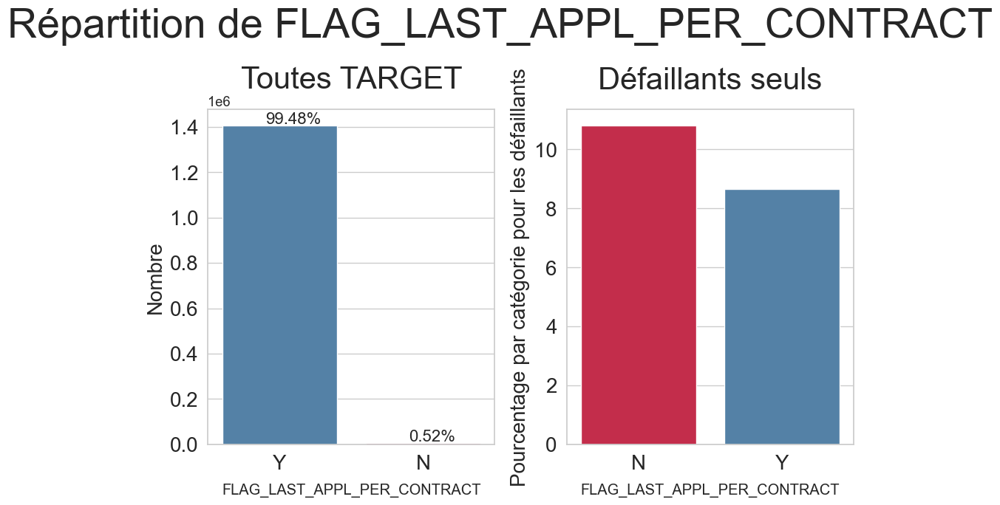

In [190]:
# Let us first see the unique categories of 'FLAG_LAST_APPL_PER_CONTRACT'
print_unique_categories(prev_merged,'FLAG_LAST_APPL_PER_CONTRACT',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='FLAG_LAST_APPL_PER_CONTRACT',
                                   horizontal_adjust=0.3,
                                   figsize=(10, 7), fontsize_percent=16,
                                   palette1=['SteelBlue', 'crimson'],
                                   palette2=['crimson', 'SteelBlue'])

Remarque: 
- Pour 99% des personnes ,c'est leur unique demande. 
- Parmis ,les défaillants - 10% d'entre eux repennent un crédit par la suite contre 8 % pour les non-défaillants. 

#### Variable - "NAME_CASH_LOAN_PURPOSE":
- Objectif du prêt 

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_CASH_LOAN_PURPOSE' are:
['XAP' 'XNA' nan 'Other' 'Payments on other loans' 'Buying a used car'
 'Repairs' 'Education' 'Buying a new car' 'Everyday expenses' 'Medicine'
 'Car repairs' 'Urgent needs' 'Buying a holiday home / land'
 'Building a house or an annex' 'Furniture' 'Journey'
 'Purchase of electronic equipment' 'Wedding / gift / holiday'
 'Buying a home' 'Business development' 'Gasification / water supply'
 'Buying a garage' 'Hobby' 'Money for a third person'
 'Refusal to name the goal']
----------------------------------------------------------------------------------------------------
Counts of each category are:
XAP                                 786937
XNA                                 567351
Repairs                              20117
Other                                13432
Urgent needs                          7236
Buying a used car       

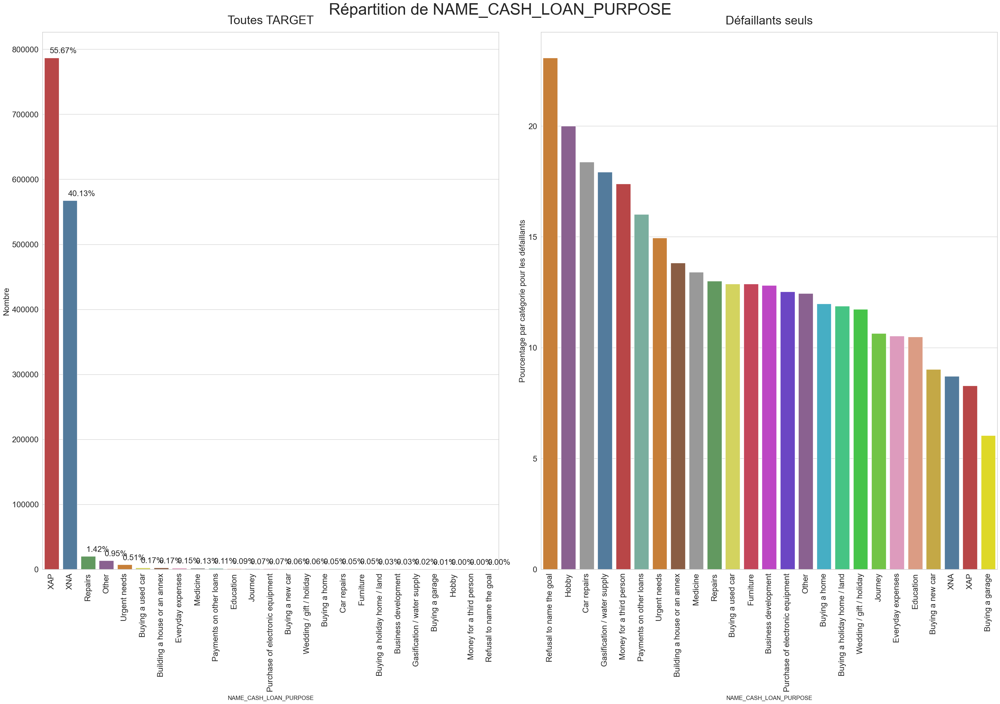

In [191]:


# Let us first see the unique categories of 'NAME_CASH_LOAN_PURPOSE'
print_unique_categories(prev_merged,'NAME_CASH_LOAN_PURPOSE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CASH_LOAN_PURPOSE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(35, 25), fontsize_percent=20,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675', '#95a3c3',
                                             '#db96c0', '#a2c865',
                                             '#e5c949', '#df7f20',
                                             '#905998', '#52d26c',
                                             '#c48f1e', '#cc5bdb',
                                             '#7b358b', '#ebf633',
                                             '#cb245d', '#51e787',
                                             '#33f3f6'],
                                   palette2=['#df7f20', '#905998',
                                             '#999999', '#477ca8',
                                             '#cb3335', '#72b6a1',
                                             '#df7f20', '#965a38',
                                             '#999999', '#59a257',
                                             '#e6e64c', '#d9314b',
                                             '#cf31d9', '#6231d9',
                                             '#905998', '#31bcd9',
                                             '#31d983', '#31d935',
                                             '#6cd931', '#e890be',
                                             '#e99675', '#d9b331',
                                             '#477ca8', '#cb3335',
                                             '#fcf40a'])

#### Variable - "NAME_PAYMENT_TYPE":
- Mode de paiment que les créditeurs utilise:

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_PAYMENT_TYPE' are:
['XNA' 'Cash through the bank' nan 'Non-cash from your account'
 'Cashless from the account of the employer']
----------------------------------------------------------------------------------------------------
Counts of each category are:
Cash through the bank                        882700
XNA                                          522960
Non-cash from your account                     7100
Cashless from the account of the employer       941
Name: NAME_PAYMENT_TYPE, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_PAYMENT_TYPE = 5


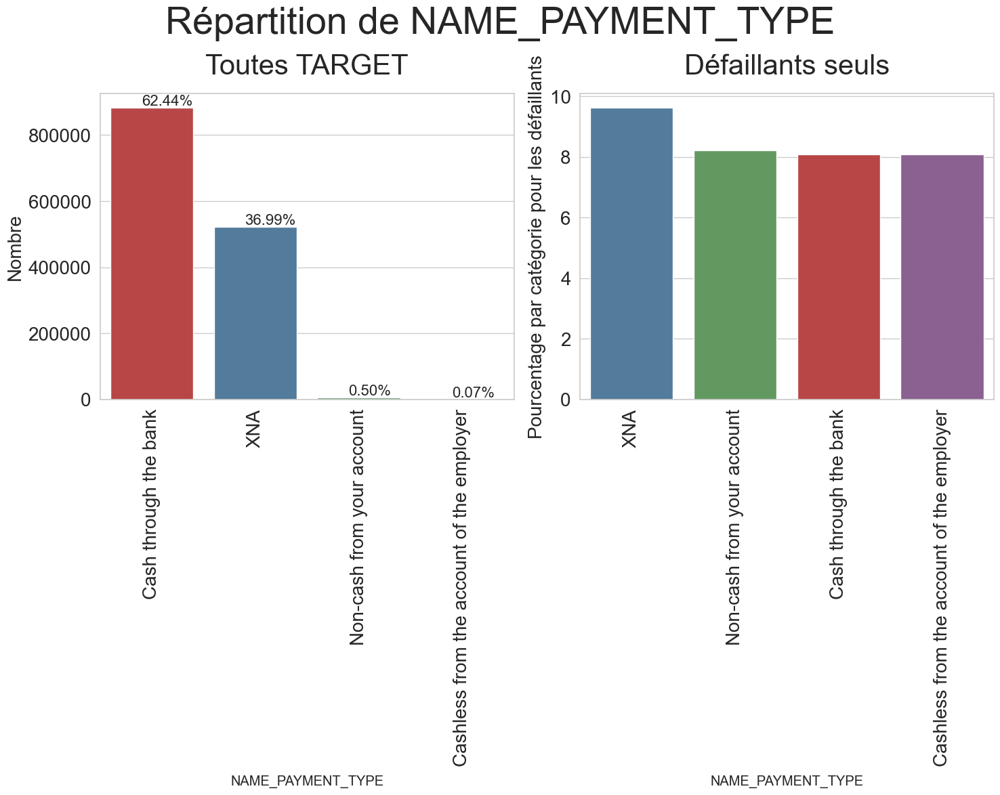

In [192]:
# Let us first see the unique categories of 'NAME_PAYMENT_TYPE'
print_unique_categories(prev_merged,'NAME_PAYMENT_TYPE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_PAYMENT_TYPE',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(15, 12), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#477ca8', '#59a257',
                                             '#cb3335', '#905998'])

Remarque: 
- Type de paiment : 
    * Cash through the bank : 63%
    * XNA : 37% 
- Défaillants : 
    * XNA : 9% 

#### Variable - "NAME_CLIENT_TYPE":
- Ancien ou nouveau demandeur de prêts:

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_CLIENT_TYPE' are:
['New' 'Repeater' 'Refreshed' 'XNA' nan]
----------------------------------------------------------------------------------------------------
Counts of each category are:
Repeater     1037682
New           259540
Refreshed     114936
XNA             1543
Name: NAME_CLIENT_TYPE, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_CLIENT_TYPE = 5


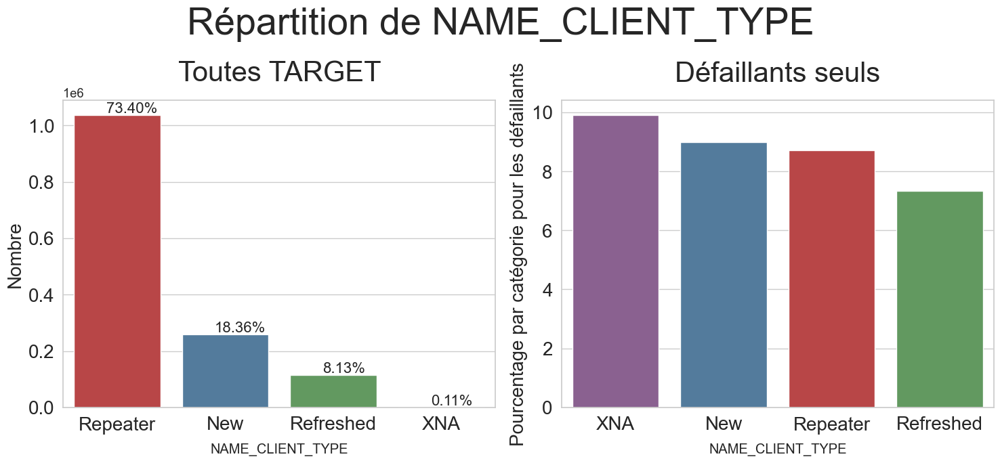

In [193]:
# Let us first see the unique categories of 'NAME_CLIENT_TYPE'
print_unique_categories(prev_merged,'NAME_CLIENT_TYPE',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_CLIENT_TYPE',
                                   horizontal_adjust=0.3,
                                   figsize=(15, 7), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998'],
                                   palette2=['#905998', '#477ca8',
                                             '#cb3335', '#59a257'])

#### Variable - "NAME_GOODS_CATEGORY"
- Type de marchandise 

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_GOODS_CATEGORY' are:
['Vehicles' 'XNA' 'Furniture' 'Consumer Electronics' 'Mobile'
 'Audio/Video' 'Construction Materials' 'Gardening'
 'Photo / Cinema Equipment' 'Computers' 'Clothing and Accessories' nan
 'Homewares' 'Medical Supplies' 'Other' 'Jewelry' 'Office Appliances'
 'Tourism' 'Auto Accessories' 'Sport and Leisure' 'Medicine' 'Weapon'
 'Direct Sales' 'Fitness' 'Insurance' 'Additional Service' 'Education'
 'Animals']
----------------------------------------------------------------------------------------------------
Counts of each category are:
XNA                         797209
Mobile                      193743
Consumer Electronics        104785
Computers                    89923
Audio/Video                  85502
Furniture                    45439
Photo / Cinema Equipment     21707
Construction Materials       21356
Clothing and Accessories     

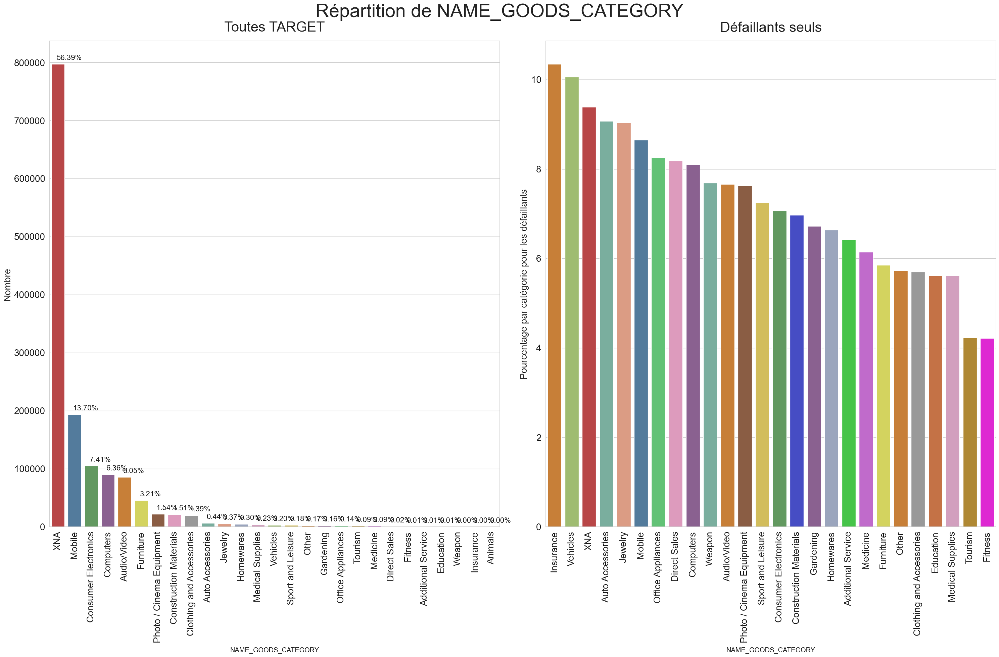

In [194]:


# Let us first see the unique categories of 'NAME_GOODS_CATEGORY'
print_unique_categories(prev_merged,'NAME_GOODS_CATEGORY',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_GOODS_CATEGORY',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(30, 20), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20', '#e6e64c',
                                             '#965a38', '#e890be',
                                             '#999999', '#72b6a1',
                                             '#e99675', '#95a3c3',
                                             '#db96c0', '#a2c865',
                                             '#e5c949', '#df7f20',
                                             '#905998', '#52d26c',
                                             '#c48f1e', '#cc5bdb',
                                             '#7b358b', '#ebf633',
                                             '#cb245d', '#51e787',
                                             '#33f3f6', '#9c75aa',
                                             '#423d78'],
                                   palette2=['#df7f20', '#a2c865',
                                             '#cb3335', '#72b6a1',
                                             '#e99675', '#477ca8',
                                             '#52d26c', '#e890be',
                                             '#905998', '#72b6a1',
                                             '#df7f20', '#965a38',
                                             '#e5c949', '#59a257',
                                             '#313ad9', '#905998',
                                             '#95a3c3', '#31d935',
                                             '#cc5bdb', '#e6e64c',
                                             '#df7f20', '#999999',
                                             '#d96b31', '#db96c0',
                                             '#c48f1e', '#fc0aec'])



#### Variable - "NAME_YIELD_GROUp"
- Taux d'intérêts groupé en petit moyen et élevée :

----------------------------------------------------------------------------------------------------
The unique categories of 'NAME_YIELD_GROUP' are:
['low_normal' 'middle' 'XNA' 'high' 'low_action' nan]
----------------------------------------------------------------------------------------------------
Counts of each category are:
XNA           429198
middle        324971
high          306061
low_normal    274884
low_action     78587
Name: NAME_YIELD_GROUP, dtype: int64
----------------------------------------------------------------------------------------------------
Nombre de catégories uniques pour NAME_YIELD_GROUP = 6


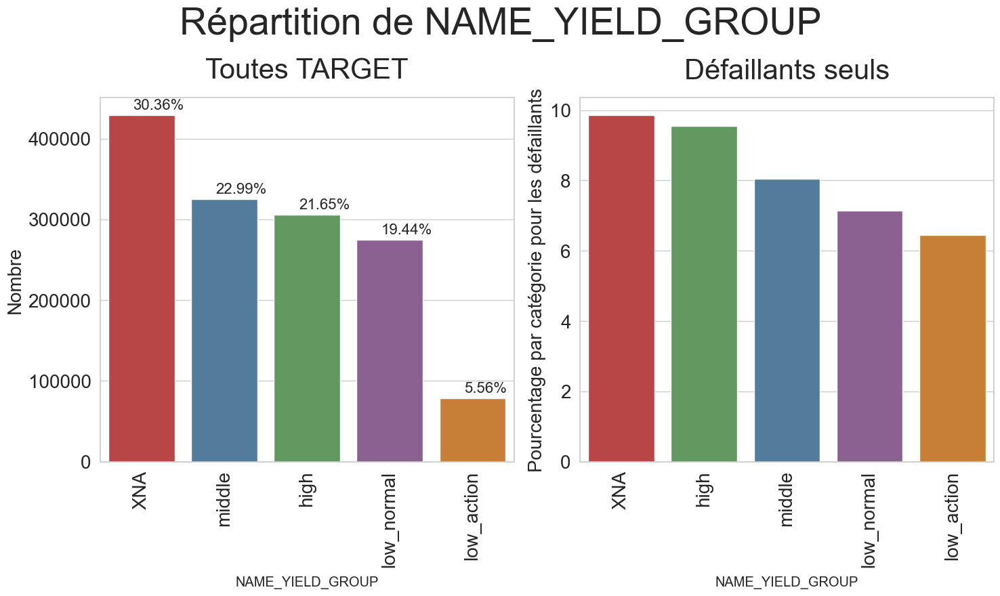

In [195]:
# Let us first see the unique categories of 'NAME_YIELD_GROUP'
print_unique_categories(prev_merged,'NAME_YIELD_GROUP',
                                             show_counts=True)

# Plotting the Bar Plot for the Column
plot_categorical_variables_bar(prev_merged,
                                   column_name='NAME_YIELD_GROUP',
                                   horizontal_adjust=0.3, rotation=90,
                                   figsize=(15, 9), fontsize_percent=16,
                                   palette1=['#cb3335', '#477ca8',
                                             '#59a257', '#905998',
                                             '#df7f20'],
                                   palette2=['#cb3335', '#59a257',
                                             '#477ca8', '#905998',
                                             '#df7f20'])

#### Distribution des variables quantitatives :


In [196]:
# Liste des variables quantitatives
cols_num_prev = prev_merged.select_dtypes(include=[np.number]).columns.to_list()
cols_num_prev

['SK_ID_CURR',
 'TARGET',
 'SK_ID_PREV',
 'AMT_ANNUITY',
 'AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_DOWN_PAYMENT',
 'AMT_GOODS_PRICE',
 'HOUR_APPR_PROCESS_START',
 'NFLAG_LAST_APPL_IN_DAY',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'DAYS_DECISION',
 'SELLERPLACE_AREA',
 'CNT_PAYMENT',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

#### Variable - "DAYS_DECISION"
- variable indique le nombre de jours,entre la prise de décision et la demande.

----------------------------------------------------------------------------------------------------
The 0th percentile value of DAYS_DECISION is -2922.0
The 2th percentile value of DAYS_DECISION is -2748.0
The 4th percentile value of DAYS_DECISION is -2612.0
The 6th percentile value of DAYS_DECISION is -2499.0
The 8th percentile value of DAYS_DECISION is -2383.0
The 10th percentile value of DAYS_DECISION is -2257.0
The 25th percentile value of DAYS_DECISION is -1313.0
The 50th percentile value of DAYS_DECISION is -582.0
The 75th percentile value of DAYS_DECISION is -271.0
The 100th percentile value of DAYS_DECISION is -1.0
----------------------------------------------------------------------------------------------------


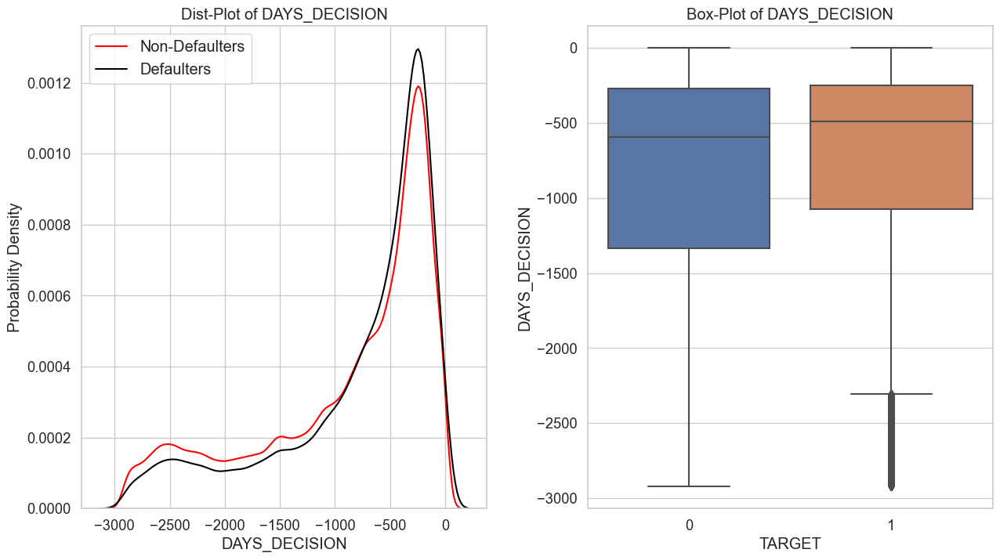

In [197]:
# Affiche les quantiles
print_percentiles(prev_merged, 'DAYS_DECISION',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche boxplot
plot_continuous_variables(prev_merged,'DAYS_DECISION',
                                               plots=['distplot', 'box'],
                                               figsize=(15, 8))

#### Variable - "DAYS_FIRST_DRAWING":
- nombre de jours depuis la demande:


----------------------------------------------------------------------------------------------------
The 0th percentile value of DAYS_FIRST_DRAWING is -2922.0
The 1th percentile value of DAYS_FIRST_DRAWING is -2451.0
The 2th percentile value of DAYS_FIRST_DRAWING is -1179.0
The 3th percentile value of DAYS_FIRST_DRAWING is -674.0
The 4th percentile value of DAYS_FIRST_DRAWING is -406.0
The 5th percentile value of DAYS_FIRST_DRAWING is -262.0
The 6th percentile value of DAYS_FIRST_DRAWING is -156.0
The 7th percentile value of DAYS_FIRST_DRAWING is 365243.0
The 8th percentile value of DAYS_FIRST_DRAWING is 365243.0
The 9th percentile value of DAYS_FIRST_DRAWING is 365243.0
The 10th percentile value of DAYS_FIRST_DRAWING is 365243.0
The 20th percentile value of DAYS_FIRST_DRAWING is 365243.0
The 40th percentile value of DAYS_FIRST_DRAWING is 365243.0
The 60th percentile value of DAYS_FIRST_DRAWING is 365243.0
The 80th percentile value of DAYS_FIRST_DRAWING is 365243.0
The 100th percentile

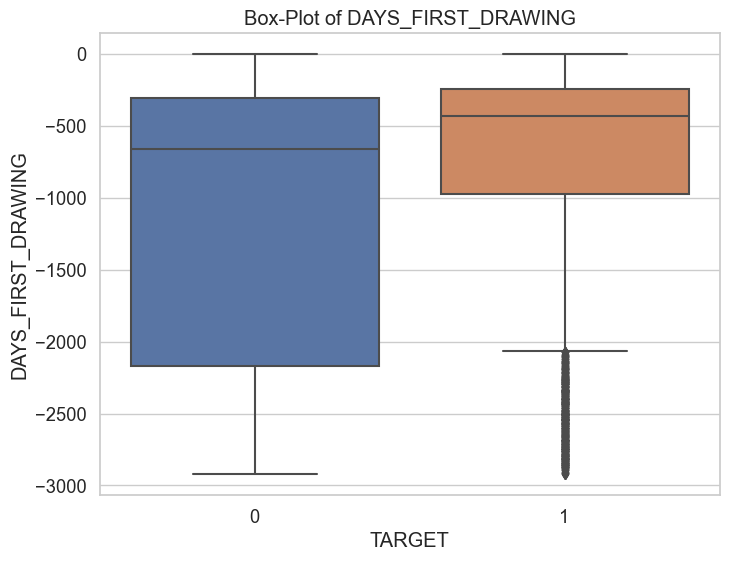

In [198]:
# Affiche les quantiles
print_percentiles(prev_merged, 'DAYS_FIRST_DRAWING',
                      percentiles=list(range(0, 11)) +
                      list(range(20, 101, 20)))
# Affiche boxplot
plot_continuous_variables(prev_merged,'DAYS_FIRST_DRAWING',
                                               plots=['box'],
                                               figsize=(8, 6),
                                               scale_limits=[-3000, 0])

#### Variable - "NFLAG_INSURED_ON_APPROVAL":
- Une assurance a t-il était demandé lors de la demande de prêts.

----------------------------------------------------------------------------------------------------
The 0th percentile value of NFLAG_INSURED_ON_APPROVAL is 0.0
The 2th percentile value of NFLAG_INSURED_ON_APPROVAL is 0.0
The 4th percentile value of NFLAG_INSURED_ON_APPROVAL is 0.0
The 6th percentile value of NFLAG_INSURED_ON_APPROVAL is 0.0
The 8th percentile value of NFLAG_INSURED_ON_APPROVAL is 0.0
The 10th percentile value of NFLAG_INSURED_ON_APPROVAL is 0.0
The 25th percentile value of NFLAG_INSURED_ON_APPROVAL is 0.0
The 50th percentile value of NFLAG_INSURED_ON_APPROVAL is 0.0
The 75th percentile value of NFLAG_INSURED_ON_APPROVAL is 1.0
The 100th percentile value of NFLAG_INSURED_ON_APPROVAL is 1.0
----------------------------------------------------------------------------------------------------


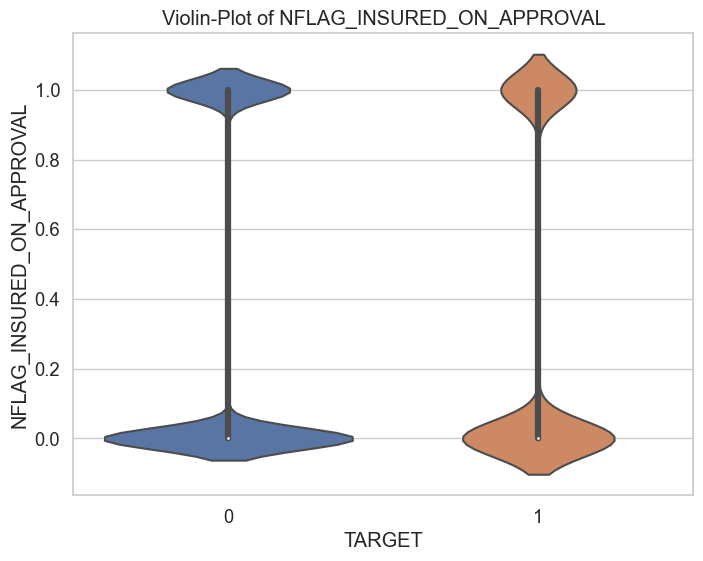

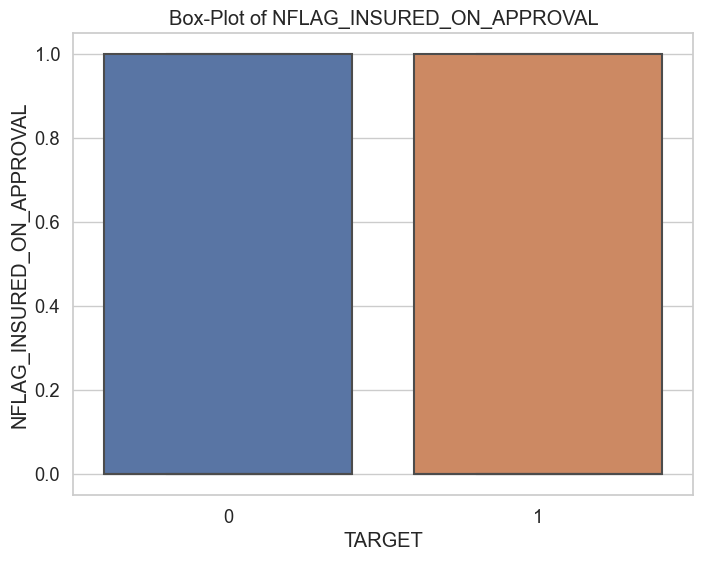

In [199]:
# Affiche les quantiles
print_percentiles(prev_merged, 'NFLAG_INSURED_ON_APPROVAL',
                      percentiles=list(range(0, 11, 2)) + [25, 50, 75, 100])
# Affiche violinplot
plot_continuous_variables(prev_merged,'NFLAG_INSURED_ON_APPROVAL',
                                               plots=['violin'],
                                               figsize=(8, 6))
# Affiche boxplot
plot_continuous_variables(prev_merged,'NFLAG_INSURED_ON_APPROVAL',
                                               plots=['box'],
                                               figsize=(8, 6))



#### Analyse exploratoire multivariée
- corrélation entre les variables catégorielles.

----------------------------------------------------------------------------------------------------


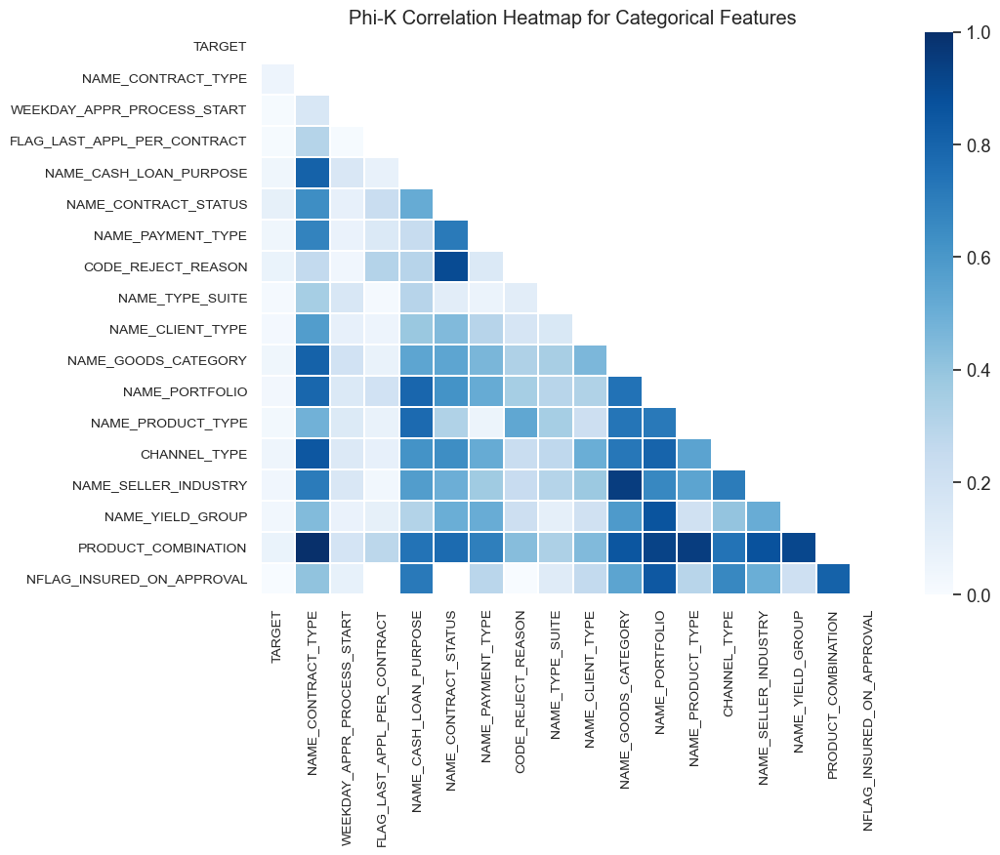

----------------------------------------------------------------------------------------------------
Les catégories avec les valeurs les plus élevées de la valeur de corrélation Phi-K avec la variable cible sont:


,Column Name,Phik-Correlation
4,NAME_CONTRACT_STATUS,0.088266
15,PRODUCT_COMBINATION,0.063839
6,CODE_REJECT_REASON,0.062771
0,NAME_CONTRACT_TYPE,0.050859
12,CHANNEL_TYPE,0.050302
9,NAME_GOODS_CATEGORY,0.042951
3,NAME_CASH_LOAN_PURPOSE,0.040305
5,NAME_PAYMENT_TYPE,0.039752
13,NAME_SELLER_INDUSTRY,0.038077
14,NAME_YIELD_GROUP,0.034626


----------------------------------------------------------------------------------------------------


In [200]:
#Phi-K - matrice:
cols_for_phik = ['TARGET'] + \
    prev_merged.dtypes[prev_merged.dtypes == 'object'].index.tolist() \
    + ['NFLAG_INSURED_ON_APPROVAL']
plot_phik_matrix(prev_merged, cols_for_phik,
                                      figsize=(11, 9), fontsize=10)



----------------------------------------------------------------------------------------------------


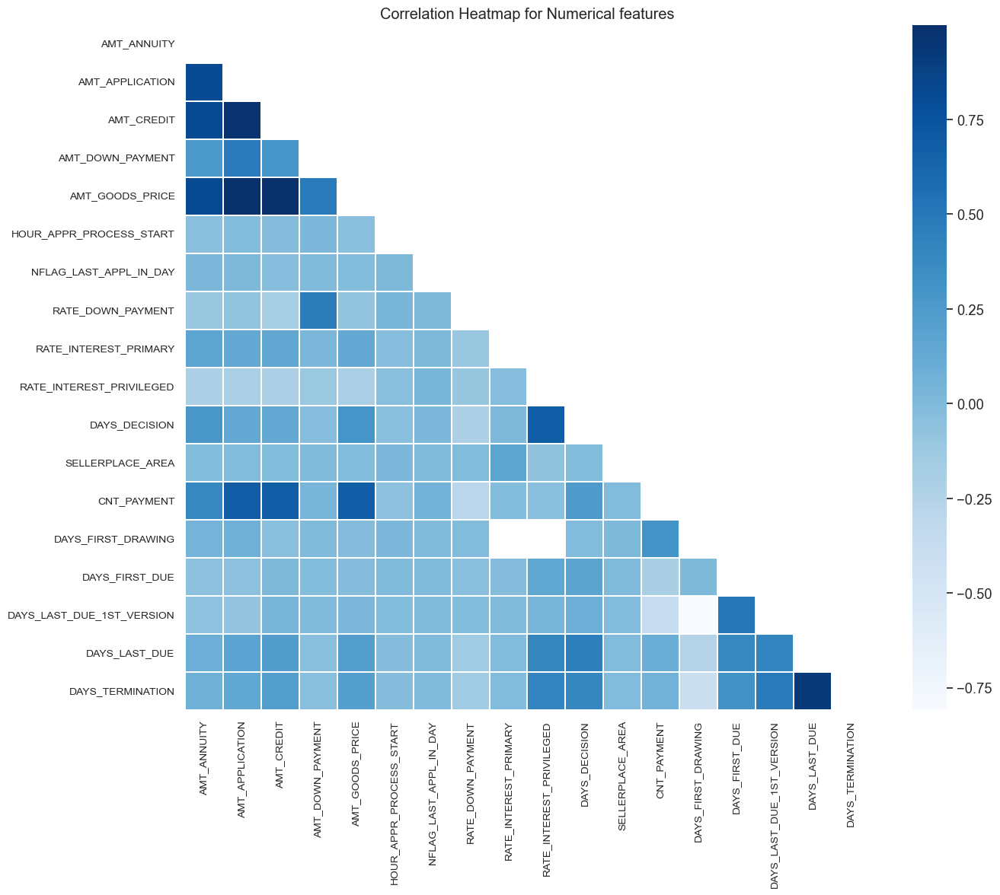

----------------------------------------------------------------------------------------------------


In [201]:
#Corrélation entre les variabeles numériques/
corr_mat = correlation_matrix(prev_merged,['SK_ID_CURR', 'SK_ID_PREV',
                                             'NFLAG_INSURED_ON_APPROVAL'],
                                            cmap='Blues',
                                            figsize=(14, 12))
corr_mat.plot_correlation_matrix()

In [202]:
# Seeing the top columns with highest phik-correlation with the target
# variable in bureau table
top_corr_target_df = corr_mat.target_top_corr()
print('-' * 79)
titre1 = 'Les variables ayant les valeurs les plus élevées de Phik'
print(titre1 + '-corrélation avec la variable cible sont les suivantes :')
display(top_corr_target_df.style.hide_index())
print('-'*79)

interval columns not set, guessing: ['TARGET', 'AMT_ANNUITY']
interval columns not set, guessing: ['TARGET', 'AMT_APPLICATION']
interval columns not set, guessing: ['TARGET', 'AMT_CREDIT']
interval columns not set, guessing: ['TARGET', 'AMT_DOWN_PAYMENT']
interval columns not set, guessing: ['TARGET', 'AMT_GOODS_PRICE']
interval columns not set, guessing: ['TARGET', 'HOUR_APPR_PROCESS_START']
interval columns not set, guessing: ['TARGET', 'NFLAG_LAST_APPL_IN_DAY']
interval columns not set, guessing: ['TARGET', 'RATE_DOWN_PAYMENT']
interval columns not set, guessing: ['TARGET', 'RATE_INTEREST_PRIMARY']
interval columns not set, guessing: ['TARGET', 'RATE_INTEREST_PRIVILEGED']
interval columns not set, guessing: ['TARGET', 'DAYS_DECISION']
interval columns not set, guessing: ['TARGET', 'SELLERPLACE_AREA']
interval columns not set, guessing: ['TARGET', 'CNT_PAYMENT']
interval columns not set, guessing: ['TARGET', 'DAYS_FIRST_DRAWING']
interval columns not set, guessing: ['TARGET', 'DAYS_F

Column Name,Phik-Correlation
CNT_PAYMENT,0.056639
DAYS_DECISION,0.053694
DAYS_FIRST_DRAWING,0.048993
RATE_DOWN_PAYMENT,0.039592
HOUR_APPR_PROCESS_START,0.038121
RATE_INTEREST_PRIVILEGED,0.028204
DAYS_LAST_DUE_1ST_VERSION,0.027878
DAYS_LAST_DUE,0.027320
DAYS_TERMINATION,0.026479
AMT_ANNUITY,0.013808


-------------------------------------------------------------------------------


_____

Conclusions de l'EDA

À partir de l'analyse exhaustive des données exploratoires que nous avons effectuée, nous pouvons tirer des conclusions suivante sur  ensemble de données donné.

- Tout d'abord, l'ensemble de données devra être fusionné avec un moyen ingénieux pour que les données fusionnées aient un sens.

- Certaines catégories sont très bien discriminatoires entre les défaillants et les non-défaillants, ce qui pourrait être important aux fins de la classification.

- Il y a peu de variables numériques continues qui contiennent des points erronés, nous aurions à gérer ces points.

- Nous avons également remarqué certaines caractéristiques corrélées, qui augmenteraient simplement la dimensionnalité des données, et n'ajouteraient pas beaucoup de valeur. Nous voudrions supprimer ces fonctionnalités.

- Dans l'ensemble, l'ensemble de données est déséquilibré et nous aurions besoin de trouver des techniques pour gérer un tel déséquilibre.

- Pour la prédiction du risque de défaut, les défaillants ont généralement tendance à avoir un comportement qui n'est pas normal, et par conséquent, nous ne pouvons pas supprimer les valeurs aberrantes ou les points éloignés, car ils peuvent suggérer une tendance importante au défaut.

Avec toutes ces informations, nous passerons à la tâche de nettoyage des données et d'ingénierie des fonctionnalités.

##

<u>**Résumé des informations - des datasets:**</u>
-----
| Dataset: application_trains.csv 

<u>Variable_intéressant:</u>  -> | Outlier Att ! **DAYS_EMPLOYED : à partir du percentile 90, valeur de 365243 jours donc 1000 ans !**
- NAME_CONTRACT_TYPE,                     
- FLAG_EMP_PHONE
- REGION_RATING_CLIENT_W_CITY
- CODE_GENDER
- NAME_EDUCATION_TYPE
- OCCUPATION_TYPE
- ORGANIZATION_TYPE
- REG_CITY_NOT_LIVE_CITY
- REG_CITY_NOT_WORK_CITY
- LIVE_CITY_NOT_WORK_CITY
- FLAG_DOCUMENT_3
- FLAG_DOCUMENT_2
- FLAG_DOCUMENT_13                         
- FLAG_DOCUMENT_14
- FLAG_DOCUMENT_15
- FLAG_DOCUMENT_17
- FLAG_DOCUMENT_21
- NAME_HOUSING_TYPE
- NAME_FAMILY_STATUS
- NAME_INCOME_TYPE
- NAME_TYPE_SUITE
- EMERGENCYSTATE_MODE
- FLAG_CONT_MOBILE
- DAYS_EMPLOYED
- DAYS_REGISTRATION
- DAYS_ID_PUBLISH
- EXT_SOURCE_1
- DAYS_BIRTH
- EXT_SOURCE_2
- EXT_SOURCE_3
- FLOORSMAX_AVG
- FLOORSMIN_AVG
- DAYS_LAST_PHONE_CHANGE              
--------
| Datset: bureau.csv
<u>Variable intéressent:</u>   
- CREDIT_CURRENCY
- CREDIT_TYPE
- DAYS_CREDIT
- DAYS_ENDDATE_FACT
- CREDIT_ACTIVE
- DAYS_CREDIT_UPDATE

Outlier :
*  DAYS_CREDIT_ENDDATE : 42060 jours ou 115 ans. Cela n'a pas beaucoup de sens car cela implique que le précédent prêt du demandeur remonte à 115 ans.
*  DAYS_CREDIT_UPDATE : 41947 jours ou 114 ans. Cela n'a pas beaucoup de sens car cela implique que l'information du Bureau du Crédit remonte à 114 ans.
______
Dataset : bureau_balance.csv
- STATUS
- MONTHS_BALANCE
____
Dataset : Credit_card_balance.csv

- NAME_CONTRACT_STATUS
- AMT_BALANCE
- AMT_TOTAL_RECEIVABLE
- CNT_INSTALMENT_MATURE_CUM
- MONTHS_BALANCE
- AMT_DRAWINGS_CURRENT
- AMT_INST_MIN_REGULARITY
- AMT_RECEIVABLE_PRINCIPAL
- AMT_RECIVABLE
____
Dataset : installments_payments.csv

- DAYS_ENTRY_PAYMENT
- DAYS_INSTALMENT
_____
Dataset : POSH_CASh_balance.csv
- NAME_CONTRACT_STATUS 
____
Dataset : previous_application.csv 

- NAME_CONTRACT_TYPE
- NAME_CONTRACT_STATUS
- CODE_REJECT_REASON
- CHANNEL_TYPE
- PRODUCT_COMBINATION
- NAME_CASH_LOAN_PURPOSE
- NAME_PAYMENT_TYPE
- NAME_TYPE_SUITE
- NAME_CLIENT_TYPE
- NAME_GOODS_CATEGORY
- NAME_PORTFOLIO
- NAME_PRODUCT_TYPE
- DAYS_DECISION
- DAYS_FIRST_DRAWING
- DAYS_FIRST_DUE

Outliers : ->

* DAYS_FIRST_DRAWING : à partir du 7ième percentile, la valeur est erronée (365243 jours ~ 1000 ans).
* DAYS_FIRST_DUE : pour le percentile 100, la valeur est erronée (365243 jours ~ 1000 ans).
* DAYS_LAST_DUE : à partir du 80ième percentile, la valeur est erronée (365243 jours ~ 1000 ans).
* DAYS_LAST_DUE_1ST_VERSION : pour le percentile 100, la valeur est erronée (365243 jours ~ 1000 ans).
* DAYS_TERMINATION : à partir du percentile 80, la valeur est erronée (365243 jours ~ 1000 ans).











____
## 2. FEATURE ENGINEERING :
- Nettoyage & Feature engineering
    * Correction des valeurs abérrantes
    * Imputation des valeurs manquantes
    * => Feature_Enginnering
    * => Aggragation des données avec "Home Credit Group". 

Note: Voici,quelques sources qui ont pu être utiliser lors de la réalisation de ce kernel;
 - Source: [Manual Feature Engineering](https://www.kaggle.com/willkoehrsen/introduction-to-manual-feature-engineering/output) | [Home_credit_default_risk](https://medium.com/thecyphy/home-credit-default-risk-part-1-3bfe3c7ddd7a)

<u>Rappel des objectifs :</u> 


1. Introduction

<u>Mission</u>

"Développer un modèle de scoring de la probabilité de défaut de paiement du client pour étayer la décision d'accorder ou non un prêt à un client potentiel en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières...)."

<u>Objectifs</u>

    * Analyser le jeu de données,
    * Construire un modèle de scoring qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique,
    * Réaliser un dashboard interactif permettant aux chargés de clientèles d'expliquer de manière transparente la décision d'octroi ou non de crédit



#### Copies de nos données :

In [203]:
# Sauvegarde des dataframes
application_train_sav = application_train.copy()
application_test_sav = application_test.copy()
bureau_sav = bureau.copy()
bureau_balance_sav = bureau_balance.copy()
cc_balance_sav = cc_balance.copy()
installments_payments_sav = installments_payments.copy()
POS_CASH_balance_sav = POS_CASH_balance.copy()
previous_application_sav = previous_application.copy()

#### Application du Train et test _set : 
- Application_train_csv : tableau principal,divisé en deux : Train(avec Target) et Test(sans Target).
- Application_test_csv : Données de toutes les applications.
- Une ligne  = un prêt.

<u>Résumé:</u>
- Type,tailles,etc...

In [204]:
# Taille : nombre de lignes/colonnes
nRow, nVar = application_train.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 307511 lignes et 122 variables.


In [205]:
# Variables quantitatives
cols_num = application_train.select_dtypes(include=[np.number]).columns.to_list()

In [206]:
# Variables catégorielles
cols_cat = application_train.select_dtypes(exclude=[np.number]).columns.to_list()

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object


----------------------------------------------------------
Répartition schématique des types de variable 



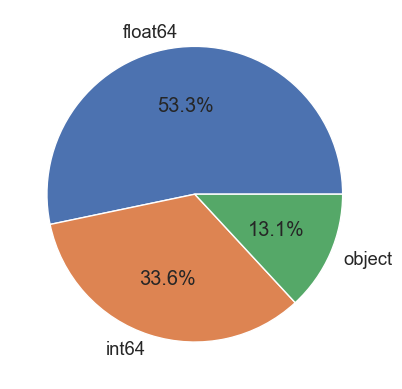

In [207]:
# Types des variables
get_types_variables(application_train, True, False, True)

In [208]:
# Modification à la main : REGION_RATING_CLIENT contient 1, 2 ou 3
# ==> object
application_train['REGION_RATING_CLIENT'] = application_train['REGION_RATING_CLIENT'].astype('object')
# Modification à la main : REGION_RATING_CLIENT_W_CITY contient
# ==> 1, 2 ou 3 object
application_train['REGION_RATING_CLIENT_W_CITY'] = application_train['REGION_RATING_CLIENT_W_CITY'].astype('object')


In [209]:
application_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [216]:
application_train['REGION_RATING_CLIENT_W_CITY'].head()

0    2
1    1
2    2
3    2
4    2
Name: REGION_RATING_CLIENT_W_CITY, dtype: object

In [214]:
application_train['REGION_RATING_CLIENT'].head()

0    2
1    1
2    2
3    2
4    2
Name: REGION_RATING_CLIENT, dtype: object

In [217]:

def traduire_valeurs_variable(dataframe, colonne_a_traduire, dictionnaire):
    """
    Traduire les valeurs de la colonne du dataframe transmis par la valeur du dictionnaire
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                colonne_a_traduire : colonne dont on veut traduire les valeurs obligatoire
                dictionnaire :dictionnaire clé=à remplacer,
                              valeur = le texte de remplacement oblgatoire
    @param OUT :None
    """
    for cle, valeur in dictionnaire.items():
        dataframe[colonne_a_traduire] = dataframe[colonne_a_traduire].replace(
            cle, valeur)


In [218]:
# EMERGENCYSTATE_MODE contient Yes/No ==> transformer en 1/0

dico_emergency = {'Yes' : 0,
                  'No' : 1,
                  np.nan : 0}
traduire_valeurs_variable(application_train,'EMERGENCYSTATE_MODE', dico_emergency)
application_train['EMERGENCYSTATE_MODE'] = application_train['EMERGENCYSTATE_MODE'].astype('int8')


In [219]:
application_train['EMERGENCYSTATE_MODE'].head()

0    1
1    1
2    0
3    0
4    0
Name: EMERGENCYSTATE_MODE, dtype: int8

In [220]:
# FLAG_OWN_CAR contient Y/N ==> transformer en 1/0

dico_owncar = {'Y' : 0,
               'N' : 1,
               np.nan : 0}
traduire_valeurs_variable(application_train, 'FLAG_OWN_CAR',
                                      dico_owncar)
application_train['FLAG_OWN_CAR'] = application_train['FLAG_OWN_CAR'].astype('int8')
application_train['FLAG_OWN_CAR'].unique()

array([1, 0], dtype=int8)

In [221]:
application_train['FLAG_OWN_CAR'].head()

0    1
1    1
2    0
3    1
4    1
Name: FLAG_OWN_CAR, dtype: int8

In [222]:
# FLAG_OWN_REALTY contient Y/N ==> transformer en 1/0
dico_ownreal = {'Y' : 0,
                'N' : 1,
                np.nan : 0}
traduire_valeurs_variable(application_train, 'FLAG_OWN_REALTY',
                                      dico_ownreal)
application_train['FLAG_OWN_REALTY'] = application_train['FLAG_OWN_REALTY'].astype('int8')
application_train['FLAG_OWN_REALTY'].unique()

array([0, 1], dtype=int8)

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                      int64
TARGET                          int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                     int8
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 122, dtype: object


----------------------------------------------------------
Répartition schématique des types de variable 



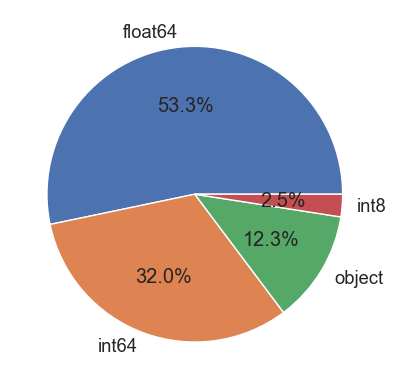

In [223]:
# Types des variables
get_types_variables(application_train, True, False, True)

#### Valeurs aberrantes:
- Correction des valeurs aberrantes détecter lors de l'analyse exploratoire.
    * DAYS_EMPLOYED: Valeur est de 365243 days = <1000ans
    * CODE_GENDER: 4 clients non renseigné -> suppresion
    * NAME_INCOME_TYPE: valeur 'XNA4' -> np.nan
    * NAME_FAMILTY_STATUS: valeur  'Unknown' -> np.nan
    * Seuil > 68% - de valeurs manquantes. 
    * IMPUTATION des valeurs - Quantitative -> Median 
    * IMPUTATION des valeeurs - Qualitative -> Mode
____
    * 2 categ -> LabelEncoder | sinon  OnehotEncoder

In [224]:
# Nombre de ligne erronées
nb_err = application_train['DAYS_EMPLOYED'][application_train['DAYS_EMPLOYED']
                                       == 365243].count()
pourc_err = round((nb_err*100)/application_train.shape[0], 2)
print(f'Nombre d\'erreurs DAYS_EMPLOYED : {nb_err} ({pourc_err}%)')

Nombre d'erreurs DAYS_EMPLOYED : 55374 (18.01%)


In [225]:
# Correction
application_train['DAYS_EMPLOYED'][application_train['DAYS_EMPLOYED']== 365243] = np.nan

In [227]:
application_train['DAYS_EMPLOYED'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 307511 entries, 0 to 307510
Series name: DAYS_EMPLOYED
Non-Null Count   Dtype  
--------------   -----  
252137 non-null  float64
dtypes: float64(1)
memory usage: 2.3 MB


In [228]:
#Comparaison variables catégorielles du train set et du test set: 
for var in cols_cat :
    var_train = application_train[var].unique()
    var_test = application_test[var].unique()
    diff = [val for val in var_train if val not in var_test]
    if len(diff) > 0 and diff != 'nan':
        print(f'Variable {var} - catégories différentes : {diff}')

Variable FLAG_OWN_CAR - catégories différentes : [1, 0]
Variable FLAG_OWN_REALTY - catégories différentes : [0, 1]
Variable NAME_TYPE_SUITE - catégories différentes : [nan]
Variable OCCUPATION_TYPE - catégories différentes : [nan]
Variable FONDKAPREMONT_MODE - catégories différentes : [nan]
Variable HOUSETYPE_MODE - catégories différentes : [nan]
Variable WALLSMATERIAL_MODE - catégories différentes : [nan]
Variable EMERGENCYSTATE_MODE - catégories différentes : [1, 0]


In [229]:
# CODE_GENDER : Nombre de lignes ayant la valeur 'XNA' ?
application_train[application_train['CODE_GENDER'] == 'XNA']['CODE_GENDER'].count()

4

In [230]:
# Comme il n'y a que 4 clients avec un sexe non renseigné, on supprime ces
# valeurs
application_train = application_train[application_train['CODE_GENDER'] != 'XNA']

In [236]:
application_train['CODE_GENDER'].describe()


count     307507
unique         2
top            F
freq      202448
Name: CODE_GENDER, dtype: object

In [240]:
application_train['NAME_INCOME_TYPE'].unique()

array(['Working', 'State servant', 'Commercial associate', 'Pensioner',
       'Unemployed', 'Student', 'Businessman', 'Maternity leave'],
      dtype=object)

In [237]:
application_train['NAME_INCOME_TYPE'].describe()

count      307507
unique          8
top       Working
freq       158771
Name: NAME_INCOME_TYPE, dtype: object

In [241]:
# Nombre de lignes ayant la valeur 'XNA' ?
application_train[application_train['NAME_INCOME_TYPE'] =='Maternity leave']['NAME_INCOME_TYPE'].count()

5

In [242]:
# Correction : remplacer 'Maternity leave' par np.nan
application_train['NAME_INCOME_TYPE'] = [row if row != 'Maternity leave' else np.nan for row in
     application_train['NAME_INCOME_TYPE']]
# Vérification
application_train[application_train['NAME_INCOME_TYPE'] =='Maternity leave']['NAME_INCOME_TYPE'].count()

0

In [244]:
application_train['NAME_FAMILY_STATUS'].unique()

array(['Single / not married', 'Married', 'Civil marriage', 'Widow',
       'Separated', 'Unknown'], dtype=object)

In [243]:
#NAME_FAMILY_STATUS
# Nombre de lignes ayant la valeur 'Maternity leave' ?
application_train[application_train['NAME_FAMILY_STATUS'] =='Unknown']['NAME_FAMILY_STATUS'].count()


2

In [245]:
# Correction : remplacer 'Unknown' par np.nan
application_train['NAME_FAMILY_STATUS'] = [row if row != 'Unknown' else np.nan for row in
     application_train['NAME_FAMILY_STATUS']]
# Vérification
application_train[application_train['NAME_FAMILY_STATUS'] =='Unknown']['NAME_FAMILY_STATUS'].count()

0

In [246]:
# Valeurs manquantes du dataframe
df_nan_applitrain = get_missing_values(application_train,True, False, True)

Valeurs manquantes : 9062014 NaN pour 37515854 données (24.16 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_AVG,214862,69.870000
COMMONAREA_MODE,214862,69.870000
COMMONAREA_MEDI,214862,69.870000
NONLIVINGAPARTMENTS_MODE,213512,69.430000
NONLIVINGAPARTMENTS_MEDI,213512,69.430000
NONLIVINGAPARTMENTS_AVG,213512,69.430000
FONDKAPREMONT_MODE,210293,68.390000
LIVINGAPARTMENTS_MODE,210197,68.360000
LIVINGAPARTMENTS_MEDI,210197,68.360000
LIVINGAPARTMENTS_AVG,210197,68.360000


In [249]:
df_nan_applitrain.tail()

,Nombres de valeurs manquantes,% de valeurs manquantes
AMT_REQ_CREDIT_BUREAU_DAY,41519,13.5
AMT_REQ_CREDIT_BUREAU_WEEK,41519,13.5
AMT_REQ_CREDIT_BUREAU_MON,41519,13.5
AMT_REQ_CREDIT_BUREAU_QRT,41519,13.5
AMT_REQ_CREDIT_BUREAU_YEAR,41519,13.5


In [286]:
df = df_nan_applitrain.iloc[:]
df01 = df.reset_index()
df01

,index,Nombres de valeurs manquantes,% de valeurs manquantes
0,SK_ID_CURR,0,0.0
1,TARGET,0,0.0
2,NAME_CONTRACT_TYPE,0,0.0
3,CODE_GENDER,0,0.0
4,FLAG_OWN_CAR,0,0.0
...,...,...,...
117,AMT_REQ_CREDIT_BUREAU_DAY,41519,13.5
118,AMT_REQ_CREDIT_BUREAU_WEEK,41519,13.5
119,AMT_REQ_CREDIT_BUREAU_MON,41519,13.5
120,AMT_REQ_CREDIT_BUREAU_QRT,41519,13.5


In [295]:
df01.tail()

,index,Nombres de valeurs manquantes,% de valeurs manquantes
117,AMT_REQ_CREDIT_BUREAU_DAY,41519,13.5
118,AMT_REQ_CREDIT_BUREAU_WEEK,41519,13.5
119,AMT_REQ_CREDIT_BUREAU_MON,41519,13.5
120,AMT_REQ_CREDIT_BUREAU_QRT,41519,13.5
121,AMT_REQ_CREDIT_BUREAU_YEAR,41519,13.5


In [301]:
df02 = df01[df01["% de valeurs manquantes"] >= 1]
df02.head()

,index,Nombres de valeurs manquantes,% de valeurs manquantes
18,DAYS_EMPLOYED,55374,18.01
21,OWN_CAR_AGE,202927,65.99
28,OCCUPATION_TYPE,96389,31.35
41,EXT_SOURCE_1,173376,56.38
43,EXT_SOURCE_3,60965,19.83


In [307]:
#sns.histplot(data=df01, y=df01['index'], hue=df02["% de valeurs manquantes"], multiple="stack")

In [306]:
#sns.histplot(data=df_nan_applitrain, y= df01['index'])

Remarque: 

- On fixe **le seuil** des variables gardé à **68%(valeurs manquantes)**

In [312]:
# Liste des variables ayant plus de 68% de valeurs manquantes
cols_nan_a_suppr = df_nan_applitrain[df_nan_applitrain['% de valeurs manquantes'] > 68].index.to_list()
print(f'Nombre de variables à supprimer : {len(cols_nan_a_suppr)}')
cols_nan_a_suppr



Nombre de variables à supprimer : 10


['COMMONAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'COMMONAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'COMMONAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'FONDKAPREMONT_MODE']

In [313]:
# Variables quantitatives - imputation par 0
appli_train_imp1 = application_train.copy()
# Variables quantitatives - imputation par la médiane
appli_train_imp2 = application_train.copy()

Remarque: 

- Les valeurs non-renseigner sont tout autant des indices - car les individus défaillant en tendance à omettre des infos. 
- Imputation par la median car nous avons de nombreux outlier .  

In [314]:
# Variables quantitatives - imputation par médiane
nb_nan_median = application_train[cols_num].isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
application_train.fillna(application_train[cols_num].median(), inplace=True)
# Vérification
nb_nan_median = application_train[cols_num].isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 8443397
Nombre de nan après imputation par median : 0


In [315]:
# Variables quantitatives - imputation par 0
nb_nan_zero = appli_train_imp1[cols_num].isna().sum().sum()
print(f'Nombre de nan avant imputation par 0 : {nb_nan_zero}')
appli_train_imp1[cols_num] = appli_train_imp1[cols_num].fillna(0)
# Vérification
nb_nan_zero = appli_train_imp1[cols_num].isna().sum().sum()
print(f'Nombre de nan après imputation par 0 : {nb_nan_zero}')

Nombre de nan avant imputation par 0 : 8443397
Nombre de nan après imputation par 0 : 0


---------
Autre méthode pouvant être explorer pour les différentes imputations: [NaNimputer(Verstack)](https://medium.com/swlh/impute-missing-values-the-right-way-c63735fccccd) = > A voir ...

_______
#### Variable quantitative :
- Impuation par le mode :


In [316]:
# Variables qualitatives - imputation par mode de la variable
nb_nan_cat = application_train[cols_cat].isna().sum().sum()
print(f'Nombre de nan avant imputation par mode : {nb_nan_cat}')
for var in cols_cat:
    mode = application_train[var].mode()[0]
    application_train[var].fillna(mode, inplace=True)
nb_nan_cat = application_train[cols_cat].isna().sum().sum()
print(f'Nombre de nan après imputation par mode : {nb_nan_cat}')

Nombre de nan avant imputation par mode : 618617
Nombre de nan après imputation par mode : 0


In [319]:
# Vérification : plus de nan
# Valeurs manquantes du dataframe application_train
import pickle
print(f'Nombre nan application_train : {application_train.isna().sum().sum()}')
# Sauvegarde de application_train
fic_sav_appltrain_sansnan = '/Pickle/Clean_appltrain'
with open(fic_sav_appltrain_sansnan, 'wb') as f:
    pickle.dump(application_train, f, pickle.HIGHEST_PROTOCOL)

Nombre nan application_train : 0


#### Feature engineering:
- Variable métiers | automatiques (mean,max,.. )

Note : 
- [Source_Kernel_Feature_Engi](https://github.com/rishabhrao1997/Home-Credit-Default-Risk)

In [320]:
def feature_engineering_application(data):
    '''
    FEATURE ENGINEERING : création de nouvelles variables.
    Parameters
    ----------
    data : dataframe pour ajout de nouvelles variables, obligatoire.
    Returns
    -------
    None.
    '''

    # -----------------------------------------------------------------------
    # Variables de revenu, de rente et de crédit :  ratio / différence
    # -----------------------------------------------------------------------
    # Ratio : Montant du crédit du prêt / Revenu du demandeur
    data['CREDIT_INCOME_RATIO'] = data['AMT_CREDIT'] / \
        (data['AMT_INCOME_TOTAL'] + 0.00001)
    # Ratio : Montant du crédit du prêt / Annuité de prêt
    data['CREDIT_ANNUITY_RATIO'] = data['AMT_CREDIT'] / \
        (data['AMT_ANNUITY'] + 0.00001)
    # Ratio : Annuité de prêt / Revenu du demandeur
    data['ANNUITY_INCOME_RATIO'] = data['AMT_ANNUITY'] / \
        (data['AMT_INCOME_TOTAL'] + 0.00001)
    # Différence : Revenu du demandeur - Annuité de prêt
    data['INCOME_ANNUITY_DIFF'] = data['AMT_INCOME_TOTAL'] - \
        data['AMT_ANNUITY']
    # Ratio : Montant du crédit du prêt / prix des biens pour lesquels le prêt est accordé
    # Crédit est supérieur au prix des biens ?
    data['CREDIT_GOODS_RATIO'] = data['AMT_CREDIT'] / \
        (data['AMT_GOODS_PRICE'] + 0.00001)
    # Différence : Revenu du demandeur - prix des biens pour lesquels le prêt
    # est accordé
    data['INCOME_GOODS_DIFF'] = data['AMT_INCOME_TOTAL'] / \
        data['AMT_GOODS_PRICE']
    # Ratio : Annuité de prêt / Âge du demandeur au moment de la demande
    data['INCOME_AGE_RATIO'] = data['AMT_INCOME_TOTAL'] / (
        data['DAYS_BIRTH'] + 0.00001)
    # Ratio : Montant du crédit du prêt / Âge du demandeur au moment de la
    # demande
    data['CREDIT_AGE_RATIO'] = data['AMT_CREDIT'] / (
        data['DAYS_BIRTH'] + 0.00001)
    # Ratio : Revenu du demandeur / Score normalisé de la source de données
    # externe 3
    data['INCOME_EXT_RATIO'] = data['AMT_INCOME_TOTAL'] / \
        (data['EXT_SOURCE_3'] + 0.00001)
    # Ratio : Montant du crédit du prêt / Score normalisé de la source de
    # données externe
    data['CREDIT_EXT_RATIO'] = data['AMT_CREDIT'] / \
        (data['EXT_SOURCE_3'] + 0.00001)
    # Multiplication : Revenu du demandeur
    #                  * heure à laquelle le demandeur à fait sa demande de prêt
    data['HOUR_PROCESS_CREDIT_MUL'] = data['AMT_CREDIT'] * \
        data['HOUR_APPR_PROCESS_START']

    # -----------------------------------------------------------------------
    # Variables sur l'âge
    # YEARS_BIRTH - Âge du demandeur au moment de la demande DAYS_BIRTH en
    # années
    data['YEARS_BIRTH'] = data['DAYS_BIRTH'] * -1 / 365
    # Différence : Âge du demandeur - Ancienneté dans l'emploi à date demande
    data['AGE_EMPLOYED_DIFF'] = data['DAYS_BIRTH'] - data['DAYS_EMPLOYED']
    # Ratio : Ancienneté dans l'emploi à date demande / Âge du demandeur
    data['EMPLOYED_AGE_RATIO'] = data['DAYS_EMPLOYED'] / \
        (data['DAYS_BIRTH'] + 0.00001)
    # Ratio : nombre de jours avant la demande où le demandeur a changé de téléphone \
    #         äge du client
    data['LAST_PHONE_BIRTH_RATIO'] = data[
        'DAYS_LAST_PHONE_CHANGE'] / (data['DAYS_BIRTH'] + 0.00001)
    # Ratio : nombre de jours avant la demande où le demandeur a changé de téléphone \
    #         ancienneté dans l'emploi
    data['LAST_PHONE_EMPLOYED_RATIO'] = data[
        'DAYS_LAST_PHONE_CHANGE'] / (data['DAYS_EMPLOYED'] + 0.00001)

    # -----------------------------------------------------------------------
    # Variables sur la voiture

    # Différence : Âge de la voiture du demandeur -  Ancienneté dans l'emploi
    # à date demande
    data['CAR_EMPLOYED_DIFF'] = data['OWN_CAR_AGE'] - data['DAYS_EMPLOYED']
    # Ratio : Âge de la voiture du demandeur / Ancienneté dans l'emploi à date
    # demande
    data['CAR_EMPLOYED_RATIO'] = data['OWN_CAR_AGE'] / \
        (data['DAYS_EMPLOYED'] + 0.00001)
    # Différence : Âge du demandeur - Âge de la voiture du demandeur
    data['CAR_AGE_DIFF'] = data['DAYS_BIRTH'] - data['OWN_CAR_AGE']
    # Ratio : Âge de la voiture du demandeur / Âge du demandeur
    data['CAR_AGE_RATIO'] = data['OWN_CAR_AGE'] / \
        (data['DAYS_BIRTH'] + 0.00001)

    # -----------------------------------------------------------------------
    # Variables sur les contacts
    
    # Somme : téléphone portable? + téléphone professionnel? + téléphone
    #         professionnel fixe? + téléphone portable joignable? +
    #         adresse de messagerie électronique?
    data['FLAG_CONTACTS_SUM'] = data['FLAG_MOBIL'] + data['FLAG_EMP_PHONE'] + \
        data['FLAG_WORK_PHONE'] + data['FLAG_CONT_MOBILE'] + \
        data['FLAG_PHONE'] + data['FLAG_EMAIL']

    # -----------------------------------------------------------------------
    # Variables sur les membres de la famille
    
    # Différence : membres de la famille - enfants (adultes)
    data['CNT_NON_CHILDREN'] = data['CNT_FAM_MEMBERS'] - data['CNT_CHILDREN']
    # Ratio : nombre d'enfants / Revenu du demandeur
    data['CHILDREN_INCOME_RATIO'] = data['CNT_CHILDREN'] / \
        (data['AMT_INCOME_TOTAL'] + 0.00001)
    # Ratio : Revenu du demandeur / membres de la famille : revenu par tête
    data['PER_CAPITA_INCOME'] = data['AMT_INCOME_TOTAL'] / \
        (data['CNT_FAM_MEMBERS'] + 1)

    # -----------------------------------------------------------------------
    # Variables sur la région
    
    # Moyenne : moyenne de notes de la région/ville où vit le client * revenu
    # du demandeur
    data['REGIONS_INCOME_MOY'] = (data['REGION_RATING_CLIENT'] +
                                  data['REGION_RATING_CLIENT_W_CITY']) * data['AMT_INCOME_TOTAL'] / 2
    # Max : meilleure note de la région/ville où vit le client
    data['REGION_RATING_MAX'] = [max(ele1, ele2) for ele1, ele2 in zip(
        data['REGION_RATING_CLIENT'], data['REGION_RATING_CLIENT_W_CITY'])]
    # Min : plus faible note de la région/ville où vit le client
    data['REGION_RATING_MIN'] = [min(ele1, ele2) for ele1, ele2 in zip(
        data['REGION_RATING_CLIENT'], data['REGION_RATING_CLIENT_W_CITY'])]
    # Moyenne : des notes de la région et de la ville où vit le client
    data['REGION_RATING_MEAN'] = (
        data['REGION_RATING_CLIENT'] + data['REGION_RATING_CLIENT_W_CITY']) / 2
    # Multipication : note de la région/ note de la ville où vit le client
    data['REGION_RATING_MUL'] = data['REGION_RATING_CLIENT'] * \
        data['REGION_RATING_CLIENT_W_CITY']
    # Somme : des indicateurs  :
    # Indicateur si l'adresse permanente du client ne correspond pas à l'adresse de contact (1=différent ou 0=identique - au niveau de la région)
    # Indicateur si l'adresse permanente du client ne correspond pas à l'adresse professionnelle (1=différent ou 0=identique - au niveau de la région)
    # Indicateur si l'adresse de contact du client ne correspond pas à l'adresse de travail (1=différent ou 0=identique - au niveau de la région).
    # Indicateur si l'adresse permanente du client ne correspond pas à l'adresse de contact (1=différent ou 0=identique - au niveau de la ville)
    # Indicateur si l'adresse permanente du client ne correspond pas à l'adresse professionnelle (1=différent ou 0=même - au niveau de la ville).
    # Indicateur si l'adresse de contact du client ne correspond pas à
    # l'adresse de travail (1=différent ou 0=identique - au niveau de la
    # ville).
    data['FLAG_REGIONS_SUM'] = data['REG_REGION_NOT_LIVE_REGION'] + \
        data['REG_REGION_NOT_WORK_REGION'] + \
        data['LIVE_REGION_NOT_WORK_REGION'] + \
        data['REG_CITY_NOT_LIVE_CITY'] + \
        data['REG_CITY_NOT_WORK_CITY'] + \
        data['LIVE_CITY_NOT_WORK_CITY']

    # -----------------------------------------------------------------------
    # Variables sur les sources externes : sum, min, multiplication, max, var, scoring
    
    # Somme : somme des scores des 3 sources externes
    data['EXT_SOURCE_SUM'] = data[['EXT_SOURCE_1', 'EXT_SOURCE_2',
                                   'EXT_SOURCE_3']].sum(axis=1)
    # Moyenne : moyenne des scores des 3 sources externes
    data['EXT_SOURCE_MEAN'] = data[['EXT_SOURCE_1', 'EXT_SOURCE_2',
                                    'EXT_SOURCE_3']].mean(axis=1)
    # Multiplication : des scores des 3 sources externes
    data['EXT_SOURCE_MUL'] = data['EXT_SOURCE_1'] * \
        data['EXT_SOURCE_2'] * data['EXT_SOURCE_3']
    # Max : Max parmi les 3 scores des 3 sources externes
    data['EXT_SOURCE_MAX'] = [max(ele1, ele2, ele3) for ele1, ele2, ele3 in zip(
        data['EXT_SOURCE_1'], data['EXT_SOURCE_2'], data['EXT_SOURCE_3'])]
    # Min : Min parmi les 3 scores des 3 sources externes
    data['EXT_SOURCE_MIN'] = [min(ele1, ele2, ele3) for ele1, ele2, ele3 in zip(
        data['EXT_SOURCE_1'], data['EXT_SOURCE_2'], data['EXT_SOURCE_3'])]
    # Variance : variance des scores des 3 sources externes
    data['EXT_SOURCE_VAR'] = [np.var([ele1, ele2, ele3]) for ele1, ele2, ele3 in zip(
        data['EXT_SOURCE_1'], data['EXT_SOURCE_2'], data['EXT_SOURCE_3'])]
    # Scoring : scoring des scores des 3 sources externes, score 1 poids 2...
    data['WEIGHTED_EXT_SOURCE'] = data.EXT_SOURCE_1 * \
        2 + data.EXT_SOURCE_2 * 3 + data.EXT_SOURCE_3 * 4

    # -----------------------------------------------------------------------
    # Variables sur le bâtiment
    
    # Somme : Informations normalisées sur l'immeuble où vit le demandeur des moyennes
    # de la taille de l'appartement, de la surface commune, de la surface habitable,
    # de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées,
    # de l'état de l'immeuble et du nombre d'étages.
    data['APARTMENTS_SUM_AVG'] = data['APARTMENTS_AVG'] + data['BASEMENTAREA_AVG'] + data['YEARS_BEGINEXPLUATATION_AVG'] + data[
        'YEARS_BUILD_AVG'] + data['ELEVATORS_AVG'] + data['ENTRANCES_AVG'] + data[
        'FLOORSMAX_AVG'] + data['FLOORSMIN_AVG'] + data['LANDAREA_AVG'] + data[
        'LIVINGAREA_AVG'] + data['NONLIVINGAREA_AVG']

    # Somme : Informations normalisées sur l'immeuble où vit le demandeur des modes
    # de la taille de l'appartement, de la surface commune, de la surface habitable,
    # de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées,
    # de l'état de l'immeuble et du nombre d'étages.
    data['APARTMENTS_SUM_MODE'] = data['APARTMENTS_MODE'] + data['BASEMENTAREA_MODE'] + data['YEARS_BEGINEXPLUATATION_MODE'] + data[
        'YEARS_BUILD_MODE'] + data['ELEVATORS_MODE'] + data['ENTRANCES_MODE'] + data[
        'FLOORSMAX_MODE'] + data['FLOORSMIN_MODE'] + data['LANDAREA_MODE'] + data[
        'LIVINGAREA_MODE'] + data['NONLIVINGAREA_MODE'] + data['TOTALAREA_MODE']

    # Somme : Informations normalisées sur l'immeuble où vit le demandeur des médianes
    # de la taille de l'appartement, de la surface commune, de la surface habitable,
    # de l'âge de l'immeuble, du nombre d'ascenseurs, du nombre d'entrées,
    # de l'état de l'immeuble et du nombre d'étages.
    data['APARTMENTS_SUM_MEDI'] = data['APARTMENTS_MEDI'] + data['BASEMENTAREA_MEDI'] + data['YEARS_BEGINEXPLUATATION_MEDI'] + data[
        'YEARS_BUILD_MEDI'] + data['ELEVATORS_MEDI'] + data['ENTRANCES_MEDI'] + data[
        'FLOORSMAX_MEDI'] + data['FLOORSMIN_MEDI'] + data['LANDAREA_MEDI'] + \
        data['NONLIVINGAREA_MEDI']

    # Multiplication : somme des moyennes des infos sur le bâtiment * revenu
    # du demandeur
    data['INCOME_APARTMENT_AVG_MUL'] = data['APARTMENTS_SUM_AVG'] * \
        data['AMT_INCOME_TOTAL']
    # Multiplication : somme des modes des infos sur le bâtiment * revenu du
    # demandeur
    data['INCOME_APARTMENT_MODE_MUL'] = data['APARTMENTS_SUM_MODE'] * \
        data['AMT_INCOME_TOTAL']
    # Multiplication : somme des médianes des infos sur le bâtiment * revenu
    # du demandeur
    data['INCOME_APARTMENT_MEDI_MUL'] = data['APARTMENTS_SUM_MEDI'] * \
        data['AMT_INCOME_TOTAL']

    # -----------------------------------------------------------------------
    # Variables sur les défauts de paiements et les défauts observables
    
    # Somme : nombre d'observations de l'environnement social du demandeur
    #         avec des défauts observables de 30 DPD (jours de retard) +
    #        nombre d'observations de l'environnement social du demandeur
    #         avec des défauts observables de 60 DPD (jours de retard)
    data['OBS_30_60_SUM'] = data['OBS_30_CNT_SOCIAL_CIRCLE'] + \
        data['OBS_60_CNT_SOCIAL_CIRCLE']
    # Somme : nombre d'observations de l'environnement social du demandeur
    #         avec des défauts de paiement de 30 DPD (jours de retard) +
    #        nombre d'observations de l'environnement social du demandeur
    #         avec des défauts de paiement de 60 DPD (jours de retard)

    data['DEF_30_60_SUM'] = data['DEF_30_CNT_SOCIAL_CIRCLE'] + \
        data['DEF_60_CNT_SOCIAL_CIRCLE']
    # Multiplication : nombre d'observations de l'environnement social du demandeur
    #         avec des défauts observables de 30 DPD (jours de retard) *
    #        nombre d'observations de l'environnement social du demandeur
    #         avec des défauts observables de 60 DPD (jours de retard)
    data['OBS_DEF_30_MUL'] = data['OBS_30_CNT_SOCIAL_CIRCLE'] * \
        data['DEF_30_CNT_SOCIAL_CIRCLE']
    # Multiplication : nombre d'observations de l'environnement social du demandeur
    #         avec des défauts de paiement de 30 DPD (jours de retard) *
    #        nombre d'observations de l'environnement social du demandeur
    #         avec des défauts de paiement de 60 DPD (jours de retard)
    data['OBS_DEF_60_MUL'] = data['OBS_60_CNT_SOCIAL_CIRCLE'] * \
        data['DEF_60_CNT_SOCIAL_CIRCLE']
    # Somme : nombre d'observations de l'environnement social du demandeur
    #         avec des défauts de paiement ou des défauts observables avec 30
    #         DPD (jours de retard) et 60 DPD.
    data['SUM_OBS_DEF_ALL'] = data['OBS_30_CNT_SOCIAL_CIRCLE'] + data['DEF_30_CNT_SOCIAL_CIRCLE'] + \
        data['OBS_60_CNT_SOCIAL_CIRCLE'] + data['DEF_60_CNT_SOCIAL_CIRCLE']
    # Ratio : Montant du crédit du prêt /
    #         nombre d'observations de l'environnement social du demandeur
    #         avec des défauts observables de 30 DPD (jours de retard)
    data['OBS_30_CREDIT_RATIO'] = data['AMT_CREDIT'] / \
        (data['OBS_30_CNT_SOCIAL_CIRCLE'] + 0.00001)
    # Ratio : Montant du crédit du prêt /
    #         nombre d'observations de l'environnement social du demandeur
    #         avec des défauts observables de 60 DPD (jours de retard)
    data['OBS_60_CREDIT_RATIO'] = data['AMT_CREDIT'] / \
        (data['OBS_60_CNT_SOCIAL_CIRCLE'] + 0.00001)
    # Ratio : Montant du crédit du prêt /
    #         nombre d'observations de l'environnement social du demandeur
    #         avec des défauts de paiement de 30 DPD (jours de retard)
    data['DEF_30_CREDIT_RATIO'] = data['AMT_CREDIT'] / \
        (data['DEF_30_CNT_SOCIAL_CIRCLE'] + 0.00001)
    # Ratio : Montant du crédit du prêt /
    #         nombre d'observations de l'environnement social du demandeur
    #         avec des défauts de paiement de 60 DPD (jours de retard)
    data['DEF_60_CREDIT_RATIO'] = data['AMT_CREDIT'] / \
        (data['DEF_60_CNT_SOCIAL_CIRCLE'] + 0.00001)

    # -----------------------------------------------------------------------
    # Variables sur les indicateurs des documents fournis ou non
    
    # Toutes les variables DOCUMENT_
    cols_flag_doc = [flag for flag in data.columns if 'FLAG_DOC' in flag]
    # Somme : tous les indicateurs des documents fournis ou non
    data['FLAGS_DOCUMENTS_SUM'] = data[cols_flag_doc].sum(axis=1)
    # Moyenne : tous les indicateurs des documents fournis ou non
    data['FLAGS_DOCUMENTS_AVG'] = data[cols_flag_doc].mean(axis=1)
    # Variance : tous les indicateurs des documents fournis ou non
    data['FLAGS_DOCUMENTS_VAR'] = data[cols_flag_doc].var(axis=1)
    # Ecart-type : tous les indicateurs des documents fournis ou non
    data['FLAGS_DOCUMENTS_STD'] = data[cols_flag_doc].std(axis=1)

    # -----------------------------------------------------------------------
    # Variables sur le détail des modifications du demandeur : jour/heure...
    
    # Somme : nombre de jours avant la demande de changement de téléphone
    #         + nombre de jours avant la demande de changement enregistré sur la demande
    #         + nombre de jours avant la demande le client où il à
    #           changé la pièce d'identité avec laquelle il a demandé le prêt
    data['DAYS_DETAILS_CHANGE_SUM'] = data['DAYS_LAST_PHONE_CHANGE'] + \
        data['DAYS_REGISTRATION'] + data['DAYS_ID_PUBLISH']
    # Somme : nombre de demandes de renseignements sur le client adressées au Bureau de crédit
    # une heure + 1 jour + 1 mois + 3 mois + 1 an et 1 jour avant la demande
    data['AMT_ENQ_SUM'] = data['AMT_REQ_CREDIT_BUREAU_HOUR'] + data['AMT_REQ_CREDIT_BUREAU_DAY'] + data['AMT_REQ_CREDIT_BUREAU_WEEK'] + \
        data['AMT_REQ_CREDIT_BUREAU_MON'] + \
            data['AMT_REQ_CREDIT_BUREAU_QRT'] + \
                data['AMT_REQ_CREDIT_BUREAU_YEAR']
    # Ratio : somme du nombre de demandes de renseignements sur le client adressées au Bureau de crédit
    #         une heure + 1 jour + 1 mois + 3 mois + 1 an et 1 jour avant la demande \
    #         Montant du crédit du prêt
    data['ENQ_CREDIT_RATIO'] = data['AMT_ENQ_SUM'] / \
        (data['AMT_CREDIT'] + 0.00001)

    return data

In [321]:
# Feature engineering pour le dataframe application_train
application_train = feature_engineering_application(application_train)
application_train.shape

(307507, 181)

Remarque : Autre méthode possible
- Imputation par la moyenne des 500 valeurs cibles des voisins les proches pour chacune des app_train et app_test. 
- On prenons en compte les features suivantes:
    * EXT_SOURCE-1
    * EXT_SOURCE-2
    * EXT_SOURCE-3
    * CREDIT_ANNUITY_RATIO(ratio du Montant du crédit du prêt / Annuité de prêt)
    
Note: Kernel_méthode :
[Source](https://www.kaggle.com/c/home-credit-default-risk/discussion/64821)

In [324]:
# -- FEATURE ENGINEERING : super variable gagnant concours kaggle
# --------------------------------------------------------------------

from sklearn.neighbors import KNeighborsClassifier
def feature_engineering_neighbors_EXT_SOURCE(dataframe):
    '''
     - Imputation de la moyenne des 500 valeurs cibles des voisins les plus
       proches pour chaque application du train set ou test set.
     - Les voisins sont calculés en utilisant :
       - les variables très importantes :
       - EXT_SOURCE-1,
       - EXT_SOURCE_2
       - et EXT_SOURCE_3,
     - et CREDIT_ANNUITY_RATIO (ratio du Montant du crédit du prêt / Annuité de prêt).
     Inputs: dataframe pour lequel on veut ajouter la variable des 500 plus
             proches voisins.
     Returns:
         None
     '''

    knn = KNeighborsClassifier(500, n_jobs=-1)

    train_data_for_neighbors = dataframe[['EXT_SOURCE_1', 'EXT_SOURCE_2',
                                          'EXT_SOURCE_3',
                                          'CREDIT_ANNUITY_RATIO']].fillna(0)

    # saving the training data for neighbors
    with open('Pickle/TARGET_MEAN_500_Neighbors_training_data.pkl', 'wb') as f:
         pickle.dump(train_data_for_neighbors, f)
    train_target = dataframe.TARGET

    knn.fit(train_data_for_neighbors, train_target)
    # pickling the knn model
    with open('Pickle/KNN_model_TARGET_500_neighbors.pkl', 'wb') as f:
         pickle.dump(knn, f)

    train_500_neighbors = knn.kneighbors(train_data_for_neighbors)[1]

    # adding the means of targets of 500 neighbors to new column
    dataframe['TARGET_NEIGHBORS_500_MEAN'] = [
        dataframe['TARGET'].iloc[ele].mean() for ele in train_500_neighbors]

In [325]:
# Feature engineering super variable pour le dataframe application_train
feature_engineering_neighbors_EXT_SOURCE(application_train)
application_train.shape

(307507, 182)

In [326]:
# Liste des variables catégorielles
cols_cat

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [329]:
def description_variables(dataframe, type_var='all'):
    """
    Retourne la description des variables qualitatives/quantitatives
    ou toutes les variables du dataframe transmis :
    type, nombre de nan, % de nan et desc
    Parameters
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                type_var = 'all' ==> tous les types de variables (défaut)
                           'cat' ==> variables catégorielles
                           'num' ==> variables quantitative
                           facultatif
    @param OUT : dataframe de description des variables
    """
    df_taille = dataframe.shape[0]

    if type_var == 'num':
        desc_var = dataframe.describe(datetime_is_numeric=True)
    elif type_var == 'cat':
        desc_var = dataframe.describe(
            exclude=[np.number], datetime_is_numeric=True)
    else:
        desc_var = dataframe.describe(include='all', datetime_is_numeric=True)

    desc_type = pd.DataFrame(
        dataframe[desc_var.columns].dtypes, columns=['type']).T
    nb_nan = df_taille - desc_var.loc['count'].T
    pourcentage_nan = nb_nan * 100 / np.product(dataframe.shape)
    desc_nan = pd.DataFrame([nb_nan, pourcentage_nan],
                            index=['nb_nan', '%_nan'])
    desc_var = pd.concat([desc_type, desc_nan, desc_var])

    return desc_var

In [330]:
# Résumé des variables qualitatives
desc_cat = description_variables(application_train, 'cat')
desc_cat

,NAME_CONTRACT_TYPE,CODE_GENDER,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE
type,object,object,object,object,object,object,object,object,object,object,object,object,object
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
count,307507,307507,307507,307507,307507,307507,307507,307507,307507,307507,307507,307507,307507
unique,2,2,7,7,5,5,6,18,7,58,4,3,7
top,Cash loans,F,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel
freq,278232,202448,249815,158776,218389,196431,272865,151575,53900,67992,284122,304796,222379


In [331]:
# Variables avec 2 catégories uniques
df_tmp = pd.DataFrame(desc_cat.loc['unique', :] <= 2)
liste_2cat = df_tmp[df_tmp['unique'] == True].index.to_list()
liste_2cat

['NAME_CONTRACT_TYPE', 'CODE_GENDER']

In [333]:
# Variables avec plus de 2 catégories uniques
df_tmp2 = pd.DataFrame(desc_cat.loc['unique', :] > 2)
liste_catsup15 = df_tmp2[df_tmp2['unique'] == True].index.to_list()
liste_catsup15

['NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE']

Remarque: 

- 2 variables conteant que 2 valeur unique : **LabelEncoder**
- les autres seront encodé par : **OneHotEncoder**

In [334]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for var in liste_2cat:
    # Dataframe application_train
    le.fit(application_train[var])
    application_train[var] = le.transform(application_train[var])

Remarque: 
- Variable CODE_GENDER :
    0 : Feminin
    1 : Masculin
- Variable CODE_GENDER :
    0 : Cash loans
    1 : Revolving loans


In [338]:
#Les variables qualitatives avec plus de 2 catégories seront encodées avec OneHotEncoder.
# Onehot encoding pour le reste des variables
# Dataframe application_train
application_train = pd.get_dummies(application_train)
print(f'application_train : {application_train.shape}')

application_train : (307507, 298)


In [344]:
#application_train['NAME_CONTRACT_TYPE'].unique()
application_train['NAME_CONTRACT_TYPE'].unique()

array([0, 1])

In [345]:
# Variables en plus?
list1 = set(application_train.columns.to_list())
list2 = set(appli_train_imp1 .columns.to_list())
list2 ^ list1

{'AGE_EMPLOYED_DIFF',
 'AMT_ENQ_SUM',
 'ANNUITY_INCOME_RATIO',
 'APARTMENTS_SUM_AVG',
 'APARTMENTS_SUM_MEDI',
 'APARTMENTS_SUM_MODE',
 'CAR_AGE_DIFF',
 'CAR_AGE_RATIO',
 'CAR_EMPLOYED_DIFF',
 'CAR_EMPLOYED_RATIO',
 'CHILDREN_INCOME_RATIO',
 'CNT_NON_CHILDREN',
 'CREDIT_AGE_RATIO',
 'CREDIT_ANNUITY_RATIO',
 'CREDIT_EXT_RATIO',
 'CREDIT_GOODS_RATIO',
 'CREDIT_INCOME_RATIO',
 'DAYS_DETAILS_CHANGE_SUM',
 'DEF_30_60_SUM',
 'DEF_30_CREDIT_RATIO',
 'DEF_60_CREDIT_RATIO',
 'EMPLOYED_AGE_RATIO',
 'ENQ_CREDIT_RATIO',
 'EXT_SOURCE_MAX',
 'EXT_SOURCE_MEAN',
 'EXT_SOURCE_MIN',
 'EXT_SOURCE_MUL',
 'EXT_SOURCE_SUM',
 'EXT_SOURCE_VAR',
 'FLAGS_DOCUMENTS_AVG',
 'FLAGS_DOCUMENTS_STD',
 'FLAGS_DOCUMENTS_SUM',
 'FLAGS_DOCUMENTS_VAR',
 'FLAG_CONTACTS_SUM',
 'FLAG_REGIONS_SUM',
 'FONDKAPREMONT_MODE',
 'FONDKAPREMONT_MODE_not specified',
 'FONDKAPREMONT_MODE_org spec account',
 'FONDKAPREMONT_MODE_reg oper account',
 'FONDKAPREMONT_MODE_reg oper spec account',
 'HOUR_PROCESS_CREDIT_MUL',
 'HOUSETYPE_MODE',
 

In [346]:
# Types des variables
get_types_variables(application_train, True, True, False)

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                         int64
TARGET                             int64
NAME_CONTRACT_TYPE                 int32
CODE_GENDER                        int32
FLAG_OWN_CAR                        int8
                                   ...  
WALLSMATERIAL_MODE_Monolithic      uint8
WALLSMATERIAL_MODE_Others          uint8
WALLSMATERIAL_MODE_Panel           uint8
WALLSMATERIAL_MODE_Stone, brick    uint8
WALLSMATERIAL_MODE_Wooden          uint8
Length: 298, dtype: object

Répartition des types de variable



,Nombre par type de variable,% des types de variable
uint8,127,42.620000
float64,120,40.270000
int64,46,15.440000
int8,3,1.010000
int32,2,0.670000


In [347]:
# Préparation de la matrice de corrélation
# ---------------------------------------------------------------------
# Variables fortement corrélées : si le coef de Pearson est :
# > 0.8 ou < -0.8
# et inférieur à 1 ou > -1 (corrélée avec elle-même)
seuil = 0.8
# Matrice de corrélation avec valeur absolue pour ne pas avoir à gérer
# les corrélations positives et négatives séparément
corr = application_train.corr().abs()
# On ne conserve que la partie supérieur à la diagonale pour n'avoir
# qu'une seule fois les corrélations prisent en compte (symétrie axiale)
corr_triangle = corr.where(np.triu(np.ones(corr.shape), k=1)
                           .astype(np.bool))



In [349]:
# Variables avec un coef de Pearson > 0.8:
cols_corr_a_supp = [var for var in corr_triangle.columns
                    if any(corr_triangle[var] > seuil)]
print(f'{len(cols_corr_a_supp)} variables fortement corrélées à supprimer :\n')
for var in cols_corr_a_supp:
    print(var)

85 variables fortement corrélées à supprimer :

AMT_GOODS_PRICE
CNT_FAM_MEMBERS
REGION_RATING_CLIENT_W_CITY
LIVE_REGION_NOT_WORK_REGION
LIVE_CITY_NOT_WORK_CITY
ELEVATORS_AVG
LIVINGAREA_AVG
APARTMENTS_MODE
BASEMENTAREA_MODE
YEARS_BEGINEXPLUATATION_MODE
YEARS_BUILD_MODE
COMMONAREA_MODE
ELEVATORS_MODE
ENTRANCES_MODE
FLOORSMAX_MODE
FLOORSMIN_MODE
LANDAREA_MODE
LIVINGAPARTMENTS_MODE
LIVINGAREA_MODE
NONLIVINGAPARTMENTS_MODE
NONLIVINGAREA_MODE
APARTMENTS_MEDI
BASEMENTAREA_MEDI
YEARS_BEGINEXPLUATATION_MEDI
YEARS_BUILD_MEDI
COMMONAREA_MEDI
ELEVATORS_MEDI
ENTRANCES_MEDI
FLOORSMAX_MEDI
FLOORSMIN_MEDI
LANDAREA_MEDI
LIVINGAPARTMENTS_MEDI
LIVINGAREA_MEDI
NONLIVINGAPARTMENTS_MEDI
NONLIVINGAREA_MEDI
TOTALAREA_MODE
OBS_60_CNT_SOCIAL_CIRCLE
DEF_60_CNT_SOCIAL_CIRCLE
INCOME_ANNUITY_DIFF
INCOME_AGE_RATIO
CREDIT_AGE_RATIO
CREDIT_EXT_RATIO
HOUR_PROCESS_CREDIT_MUL
YEARS_BIRTH
AGE_EMPLOYED_DIFF
EMPLOYED_AGE_RATIO
LAST_PHONE_BIRTH_RATIO
CAR_EMPLOYED_DIFF
CAR_AGE_DIFF
CAR_AGE_RATIO
CHILDREN_INCOME_RATIO
PER_CAPI

In [350]:
# Suppression des variables fortement corrélées
print(f'application_train : {application_train.shape}')
application_train.drop(columns=cols_corr_a_supp,  inplace=True)
print(f'application_train : {application_train.shape}')

application_train : (307507, 298)
application_train : (307507, 213)


In [351]:
# Sauvegarde de application_train nettoyée, encodée, prête pour ML
fic_sav_application_train = 'Pickle/application_train_clean.pickle'
with open(fic_sav_application_train, 'wb') as f:
    pickle.dump(application_train, f, pickle.HIGHEST_PROTOCOL)

In [352]:
#Chargement des données néttoyés:
fic_sav_application_train = \
    'Pickle/application_train_clean.pickle'
# Chargement de application_train
with open(fic_sav_application_train, 'rb') as df_appli_train_clean:
    application_train = pickle.load(df_appli_train_clean)
application_train.shape



(307507, 213)

-------
Dataset : Application_test.csv

In [398]:
application_test = pd.read_csv('Data/application_test.csv')
application_test.shape

(48744, 121)

In [399]:
# Taille : nombre de lignes/colonnes
nRow, nVar = application_test.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 48744 lignes et 121 variables.


In [400]:
# Variables quantitatives
cols_num = application_test.select_dtypes(include=[np.number]).columns.to_list()

In [401]:
# Variables catégorielles
cols_cat = application_test.select_dtypes(exclude=[np.number]).columns.to_list()

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                      int64
NAME_CONTRACT_TYPE             object
CODE_GENDER                    object
FLAG_OWN_CAR                   object
FLAG_OWN_REALTY                object
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 121, dtype: object


----------------------------------------------------------
Répartition schématique des types de variable 



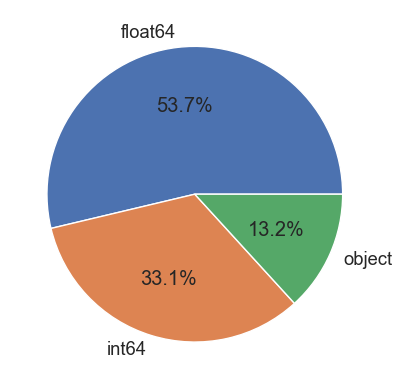

In [402]:
# Types des variables
get_types_variables(application_test, True, False, True)


#### Valeurs aberrantes:
- Correction des valeurs aberrantes détecter lors de l'analyse exploratoire.
    * REGION_RATING_CLIENT -> modif_type(objet)
    * EMERGENCYSTATE_MODE: YES/No -> 0/1
    * DAYS_EMPLOYED: Valeur est de 365243 days = <1000ans
    * FLAG_OWN_CAR : Y/N -> 0/1
    * FLAG_OWN_REALTY : Y/N ->0/1
    * Seuil > 68% - de valeurs manquantes. 
    * IMPUTATION des valeurs - Quantitative -> Median 
    * IMPUTATION des valeeurs - Qualitative -> Mode
____
    * 2 categ -> LabelEncoder | sinon  OnehotEncoder

In [403]:
# Modification à la main : REGION_RATING_CLIENT contient 1, 2 ou 3
# ==> object
application_test['REGION_RATING_CLIENT'] = application_test['REGION_RATING_CLIENT'].astype('object')
# Modification à la main : REGION_RATING_CLIENT_W_CITY contient
# ==> 1, 2 ou 3 object
application_test['REGION_RATING_CLIENT_W_CITY'] = application_test['REGION_RATING_CLIENT_W_CITY'].astype('object')

In [404]:
# EMERGENCYSTATE_MODE contient Yes/No ==> transformer en 1/0
dico_emergency = {'Yes' : 0,
                  'No' : 1,
                  np.nan : 0}
traduire_valeurs_variable(application_test,'EMERGENCYSTATE_MODE', dico_emergency)
application_test['EMERGENCYSTATE_MODE'] = application_test['EMERGENCYSTATE_MODE'].astype('int8')


In [405]:
application_test['EMERGENCYSTATE_MODE'].unique()

array([1, 0], dtype=int8)

In [406]:
# FLAG_OWN_CAR contient Y/N ==> transformer en 1/0
dico_owncar = {'Y' : 0,
               'N' : 1,
               np.nan : 0}
traduire_valeurs_variable(application_test, 'FLAG_OWN_CAR',
                                      dico_owncar)
application_test['FLAG_OWN_CAR'] = application_test['FLAG_OWN_CAR'].astype('int8')

In [407]:
application_test['FLAG_OWN_CAR'].unique()

array([1, 0], dtype=int8)

In [408]:
# FLAG_OWN_REALTY contient Y/N ==> transformer en 1/0
dico_ownreal = {'Y' : 0,
                'N' : 1,
                np.nan : 0}
traduire_valeurs_variable(application_test, 'FLAG_OWN_REALTY',
                                      dico_ownreal)
application_test['FLAG_OWN_REALTY'] = application_test['FLAG_OWN_REALTY'].astype('int8')


In [409]:
application_test['FLAG_OWN_REALTY'].unique()

array([0, 1], dtype=int8)

In [410]:
#DAYS_EMPLOYED
# Nombre de ligne erronées
nb_err = application_test['DAYS_EMPLOYED'][application_test['DAYS_EMPLOYED']
                                      == 365243].count()
pourc_err = round((nb_err*100)/application_test.shape[0], 2)
print(f'Nombre d\'erreurs DAYS_EMPLOYED : {nb_err} ({pourc_err}%)')

Nombre d'erreurs DAYS_EMPLOYED : 9274 (19.03%)


In [411]:
# Correction
application_test['DAYS_EMPLOYED'][application_test['DAYS_EMPLOYED']== 365243] = np.nan

In [412]:
# Valeurs manquantes du dataframe
df_nan_applitest = get_missing_values(application_test,
                                    True, False, True)

Valeurs manquantes : 1391484 NaN pour 5898024 données (23.59 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
COMMONAREA_MEDI,33495,68.720000
COMMONAREA_MODE,33495,68.720000
COMMONAREA_AVG,33495,68.720000
NONLIVINGAPARTMENTS_MODE,33347,68.410000
NONLIVINGAPARTMENTS_AVG,33347,68.410000
NONLIVINGAPARTMENTS_MEDI,33347,68.410000
FONDKAPREMONT_MODE,32797,67.280000
LIVINGAPARTMENTS_MEDI,32780,67.250000
LIVINGAPARTMENTS_AVG,32780,67.250000
LIVINGAPARTMENTS_MODE,32780,67.250000


Remarque: 

- de même que précédement,nous fixerons le seuil à 67% - pour les variables ayant de nombreuses valeurs manquantes.

In [413]:
# Liste des variables ayant plus de 68% de valeurs manquantes
cols_nan_a_suppr_test = df_nan_applitest[df_nan_applitest['% de valeurs manquantes'] > 68].index.to_list()
print(f'Nombre de variables à supprimer : {len(cols_nan_a_suppr_test)}')
cols_nan_a_suppr_test



Nombre de variables à supprimer : 6


['COMMONAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'COMMONAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'COMMONAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI']

In [414]:
# Suppression des variables avec un seuil de nan > 67%
application_test.drop(columns=cols_nan_a_suppr_test, inplace=True)
# Variables catégorielles
cols_cat_test = application_test.select_dtypes(exclude=[np.number]).columns \
    .to_list()
# Variables quantitatives
cols_num_test = application_test.select_dtypes(include=[np.number]).columns \
    .to_list()
# Taille : nombre de lignes/colonnes
nRow, nVar = application_test.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')


Le jeu de données contient 48744 lignes et 115 variables.


#### Imputation - Appl.test.csv:
- Variables quantitavies : imput par la médiane car bcp de outlier.
- Variables qualitatives : imputer par le mode (car certaine des indications non renseignant peuvent être aussi des infos en soit) 

In [415]:
# Variables quantitatives - imputation par 0
appli_test_imp1 = application_test.copy()
# Variables quantitatives - imputation en utilisant NaNImputer de Verstack
appli_test_imp2 = application_test.copy()

In [416]:
# Variables quantitatives - imputation par médiane
nb_nan_median_test = application_test[cols_num_test].isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median_test}')
application_test.fillna(application_test[cols_num_test].median(), inplace=True)
# Vérification
nb_nan_median_test = application_test[cols_num_test].isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median_test}')

Nombre de nan avant imputation par median : 1094133
Nombre de nan après imputation par median : 0


In [417]:
#Save --: 
fic_sav_appl2_test = '/Pickle/appli_test_imp2.pickle'

In [418]:
# Variables qualitatives - imputation par mode de la variable
nb_nan_cat_test = application_test[cols_cat_test].isna().sum().sum()
print(f'Nombre de nan avant imputation par mode : {nb_nan_cat_test}')
for var in cols_cat_test:
    mode = application_test[var].mode()[0]
    application_test[var].fillna(mode, inplace=True)
nb_nan_cat_test = application_test[cols_cat_test].isna().sum().sum()
print(f'Nombre de nan après imputation par mode : {nb_nan_cat_test}')

Nombre de nan avant imputation par mode : 96825
Nombre de nan après imputation par mode : 0


In [419]:
# Vérification : plus de nan
# Valeurs manquantes du dataframe application_test
print(f'Nombre nan application_test : {application_test.isna().sum().sum()}')
# Sauvegarde de application_test
fic_sav_appltest_sansnan ='Pickle/application_test_sans_nan.pickle'
with open(fic_sav_appltest_sansnan, 'wb') as f:
    pickle.dump(application_test, f, pickle.HIGHEST_PROTOCOL)

Nombre nan application_test : 0


____
#### Feature_Engineering-Application_test.csv:


In [420]:
# Feature engineering pour le dataframe application_test
application_test = feature_engineering_application(application_test)
application_test.shape

(48744, 174)

In [421]:
def feature_engineering_neighbors_EXT_SOURCE_test(application_train, application_test):
    '''
     - Imputation de la moyenne des 500 valeurs cibles des voisins les plus
       proches pour chaque application du train set ou test set.
     - Les voisins sont calculés en utilisant :
       - les variables très importantes :
       - EXT_SOURCE-1,
       - EXT_SOURCE_2
       - et EXT_SOURCE_3,
     - et CREDIT_ANNUITY_RATIO (ratio du Montant du crédit du prêt / Annuité de prêt).
     Inputs: dataframe pour lequel on veut ajouter la variable des 500 plus
             proches voisins.
     Returns:
         None
     '''

    knn = KNeighborsClassifier(500, n_jobs=-1)

    train_data_for_neighbors = application_train[[
        'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'CREDIT_ANNUITY_RATIO'
    ]].fillna(0)

    train_target = application_train.TARGET
    test_data_for_neighbors = application_test[[
        'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'CREDIT_ANNUITY_RATIO'
    ]].fillna(0)

    knn.fit(train_data_for_neighbors, train_target)

    test_500_neighbors = knn.kneighbors(test_data_for_neighbors)[1]

    application_test['TARGET_NEIGHBORS_500_MEAN'] = [
        application_train['TARGET'].iloc[ele].mean()
        for ele in test_500_neighbors
    ]

In [422]:
# Feature engineering -"autre méthode"(via KMEANS)pour le dataframe application_test
feature_engineering_neighbors_EXT_SOURCE_test(application_train,
                                                  application_test)
application_test.shape

(48744, 175)

In [423]:
# Liste des variables catégorielles
cols_cat_test

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE']

In [424]:
# Résumé des variables qualitatives
desc_cat_test = description_variables(application_test, 'cat')
desc_cat_test

,NAME_CONTRACT_TYPE,CODE_GENDER,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,REGIONS_INCOME_MOY,REGION_RATING_MEAN,REGION_RATING_MUL
type,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object,object
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
count,48744,48744,48744,48744,48744,48744,48744,48744,48744,48744,48744,48744,48744,48744,48744,48744.0,48744.0,48744
unique,2,2,7,7,5,5,6,18,3,4,7,58,4,3,7,740.0,6.0,7
top,Cash loans,F,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,2,2,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,270000.0,2.0,4
freq,48305,32678,40638,24533,33988,32283,43645,24260,35356,35776,9751,10840,44921,48278,35162,5356.0,35238.0,35091


In [425]:
# Variables avec 2 catégories uniques
df_tmp_test = pd.DataFrame(desc_cat_test.loc['unique', :] <= 2)
liste_2cat_test = df_tmp_test[df_tmp_test['unique'] == True].index.to_list()
liste_2cat_test

['NAME_CONTRACT_TYPE', 'CODE_GENDER']

In [436]:
# Variables avec plus de 15 catégories uniques
df_tmp2_test = pd.DataFrame(desc_cat_test.loc['unique', :] > 15)
liste_catsup15_test = df_tmp2_test[df_tmp2_test['unique'] == True].index.to_list()
liste_catsup15_test

['OCCUPATION_TYPE', 'ORGANIZATION_TYPE', 'REGIONS_INCOME_MOY']

In [427]:
#Les variables qualitatives avec seulement 2 types de catégories seront imputées avec LabelEncoder.
le = LabelEncoder()
for var in liste_2cat_test:
    # Dataframe application_test
    le.fit(application_test[var])
    application_test[var] = le.transform(application_test[var])

In [428]:
# Onehot encoding pour le reste des variables
# Dataframe application_test
application_test = pd.get_dummies(application_test)
print(f'application_test : {application_test.shape}')

application_test : (48744, 1046)


In [431]:
# Variables en plus?
list1 = set(application_train.columns.to_list())
list2 = set(appli_train_imp1 .columns.to_list())
list2 ^ list1

{'AMT_GOODS_PRICE',
 'ANNUITY_INCOME_RATIO',
 'APARTMENTS_MEDI',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MEDI',
 'BASEMENTAREA_MODE',
 'CAR_EMPLOYED_RATIO',
 'CNT_FAM_MEMBERS',
 'CNT_NON_CHILDREN',
 'COMMONAREA_MEDI',
 'COMMONAREA_MODE',
 'CREDIT_ANNUITY_RATIO',
 'CREDIT_GOODS_RATIO',
 'CREDIT_INCOME_RATIO',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'ELEVATORS_AVG',
 'ELEVATORS_MEDI',
 'ELEVATORS_MODE',
 'ENQ_CREDIT_RATIO',
 'ENTRANCES_MEDI',
 'ENTRANCES_MODE',
 'EXT_SOURCE_MAX',
 'EXT_SOURCE_SUM',
 'EXT_SOURCE_VAR',
 'FLAGS_DOCUMENTS_SUM',
 'FLAG_CONTACTS_SUM',
 'FLOORSMAX_MEDI',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MEDI',
 'FLOORSMIN_MODE',
 'FONDKAPREMONT_MODE',
 'FONDKAPREMONT_MODE_not specified',
 'FONDKAPREMONT_MODE_org spec account',
 'FONDKAPREMONT_MODE_reg oper account',
 'FONDKAPREMONT_MODE_reg oper spec account',
 'HOUSETYPE_MODE',
 'HOUSETYPE_MODE_block of flats',
 'HOUSETYPE_MODE_specific housing',
 'HOUSETYPE_MODE_terraced house',
 'INCOME_EXT_RATIO',
 'INCOME_GOODS_DIFF',
 'LANDAREA_MEDI',
 'L

#### Suppression des variables fortement correlée:

In [429]:
# Types des variables
get_types_variables(application_test, True, True, False)

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR             int64
NAME_CONTRACT_TYPE     int32
CODE_GENDER            int32
FLAG_OWN_CAR            int8
FLAG_OWN_REALTY         int8
                       ...  
REGION_RATING_MUL_2    uint8
REGION_RATING_MUL_3    uint8
REGION_RATING_MUL_4    uint8
REGION_RATING_MUL_6    uint8
REGION_RATING_MUL_9    uint8
Length: 1046, dtype: object

Répartition des types de variable



,Nombre par type de variable,% des types de variable
uint8,887,84.800000
float64,112,10.710000
int64,42,4.020000
int8,3,0.290000
int32,2,0.190000


In [433]:
# Préparation de la matrice de corrélation
# ---------------------------------------------------------------------
# Variables fortement corrélées : si le coef de Pearson est :
# > 0.8 ou < -0.8
# et inférieur à 1 ou > -1 (corrélée avec elle-même)
seuil = 0.8
# Matrice de corrélation avec valeur absolue pour ne pas avoir à gérer
# les corrélations positives et négatives séparément
corr = application_test.corr().abs()
# On ne conserve que la partie supérieur à la diagonale pour n'avoir
# qu'une seule fois les corrélations prisent en compte (symétrie axiale)
corr_triangle = corr.where(np.triu(np.ones(corr.shape), k=1)
                           .astype(np.bool))


In [434]:
# Variables avec un coef de Pearson > 0.8?
cols_corr_a_supp = [var for var in corr_triangle.columns
                    if any(corr_triangle[var] > seuil)]
print(f'{len(cols_corr_a_supp)} variables fortement corrélées à supprimer :\n')
for var in cols_corr_a_supp:
    print(var)

91 variables fortement corrélées à supprimer :

AMT_GOODS_PRICE
CNT_FAM_MEMBERS
LIVE_REGION_NOT_WORK_REGION
LIVE_CITY_NOT_WORK_CITY
ELEVATORS_AVG
LIVINGAREA_AVG
APARTMENTS_MODE
BASEMENTAREA_MODE
YEARS_BEGINEXPLUATATION_MODE
YEARS_BUILD_MODE
ELEVATORS_MODE
ENTRANCES_MODE
FLOORSMAX_MODE
FLOORSMIN_MODE
LANDAREA_MODE
LIVINGAPARTMENTS_MODE
LIVINGAREA_MODE
NONLIVINGAREA_MODE
APARTMENTS_MEDI
BASEMENTAREA_MEDI
YEARS_BEGINEXPLUATATION_MEDI
YEARS_BUILD_MEDI
ELEVATORS_MEDI
ENTRANCES_MEDI
FLOORSMAX_MEDI
FLOORSMIN_MEDI
LANDAREA_MEDI
LIVINGAPARTMENTS_MEDI
LIVINGAREA_MEDI
NONLIVINGAREA_MEDI
TOTALAREA_MODE
OBS_60_CNT_SOCIAL_CIRCLE
DEF_60_CNT_SOCIAL_CIRCLE
INCOME_ANNUITY_DIFF
INCOME_AGE_RATIO
CREDIT_AGE_RATIO
CREDIT_EXT_RATIO
HOUR_PROCESS_CREDIT_MUL
YEARS_BIRTH
AGE_EMPLOYED_DIFF
EMPLOYED_AGE_RATIO
LAST_PHONE_BIRTH_RATIO
CAR_EMPLOYED_DIFF
CAR_EMPLOYED_RATIO
CAR_AGE_DIFF
CAR_AGE_RATIO
CHILDREN_INCOME_RATIO
PER_CAPITA_INCOME
REGION_RATING_MIN
FLAG_REGIONS_SUM
EXT_SOURCE_MEAN
EXT_SOURCE_MUL
EXT_SOURCE_MIN


In [435]:
# Suppression des variables fortement corrélées
print(f'application_test : {application_test.shape}')
application_test.drop(columns=cols_corr_a_supp,  inplace=True)
print(f'application_test : {application_test.shape}')

application_test : (48744, 1046)
application_test : (48744, 955)


In [437]:
application_train.shape

(307507, 213)

In [439]:
# Sauvegarde de application_test nettoyée, encodée, prête pour ML
fic_sav_application_test = 'Pickle/application_test_clean.pickle'
with open(fic_sav_application_test, 'wb') as f:
    pickle.dump(application_test, f, pickle.HIGHEST_PROTOCOL)

In [440]:
fic_sav_application_test = 'Pickle/application_test_clean.pickle'
# Chargement de application_test
with open(fic_sav_application_test, 'rb') as df_appli_test_clean:
    application_test = pickle.load(df_appli_test_clean)
application_test.shape


(48744, 955)

__________
#### 4 - Datasets des prêts antérieurs chez "Home Credit Group"
    - previous_application (Main)
    - credits_card_balance/installments_payments/POS_CASH_balance


Variable 	Description 	Liste valeurs
_____
SK_ID_PREV
	

    ID du crédit précédent dans le crédit immobilier lié au prêt dans notre échantillon.
    Un prêt dans notre échantillon peut avoir 0 ou 1 ou 2 ou plus de prêts précédents dans Home Credit.

	
______
SK_ID_CURR
	

ID du prêt dans notre échantillon
	
______
MONTHS_BALANCE
	

Mois du solde par rapport à la date d'application.
	-1 signifie la date de solde la plus récente
_____
AMT_BALANCE
	

Solde au cours du mois du crédit précédent
	
_____
AMT_CREDIT_LIMIT_ACTUAL
	

Limite de la carte de crédit au cours du mois du crédit précédent.
	
____
AMT_DRAWINGS_CURRENT
	

Montant prélevé au cours du mois du crédit précédent.
	
_____
AMT_DRAWINGS_OTHER_CURRENT
	

Montant des autres prélèvements au cours du mois du crédit précédent.
	
_____
AMT_DRAWINGS_POS_CURRENT
	

Montant des prélèvements ou des achats de marchandises au cours du mois de la crédibilité précédente.
	
_____
AMT_INST_MIN_REGULARITY
	

Versement minimal pour ce mois du crédit précédent.
	
____
AMT_PAYMENT_CURRENT
	

Combien le client a-t-il payé pendant le mois sur le crédit précédent ?
	
____
AMT_PAYMENT_TOTAL_CURRENT
	

Combien le client a-t-il payé au total pendant le mois sur le crédit précédent ?
	
_____
AMT_RECEIVABLE_PRINCIPAL
	

Montant à recevoir pour le principal du crédit précédent.
	
____
AMT_RECIVABLE
	

Montant à recevoir sur le crédit précédent.
	
_____
AMT_TOTAL_RECEIVABLE
	

Montant total à recevoir sur le crédit précédent.
	
_____
CNT_DRAWINGS_ATM_CURRENT
	

Nombre de tirages au guichet automatique durant ce mois sur le crédit précédent.
	
______
CNT_DRAWINGS_CURRENT
	

Nombre de tirages pendant ce mois sur le crédit précédent.
	
_______
CNT_DRAWINGS_OTHER_CURRENT
	

Nombre d'autres tirages au cours de ce mois sur le crédit précédent.
	
_______
CNT_DRAWINGS_POS_CURRENT
	

ombre de tirages de marchandises durant ce mois sur le crédit précédent.
	
______
CNT_INSTALMENT_MATURE_CUM
	

Nombre d'échéances payées sur le crédit précédent.
	
______
NAME_CONTRACT_STATUS
	

Statut du contrat (actif signé...) sur le crédit précédent.
	

    Active
    Completed
    Signed
    Sent proposal
    Refused
    Demand
    Approved

SK_DPD
	

DPD (jours de retard) au cours du mois sur le crédit précédent.
________	

SK_DPD_DEF
	

DPD (Jours de retard) au cours du mois avec tolérance (les dettes avec de faibles montants de prêt sont ignorées) du crédit précédent.
	

In [441]:
# Taille : nombre de lignes/colonnes
nRow, nVar = cc_balance.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 3840312 lignes et 23 variables.


In [442]:
# Variables quantitatives
cols_num_ccb = cc_balance.select_dtypes(include=[np.number]).columns.to_list()
cols_num_ccb

['SK_ID_PREV',
 'SK_ID_CURR',
 'MONTHS_BALANCE',
 'AMT_BALANCE',
 'AMT_CREDIT_LIMIT_ACTUAL',
 'AMT_DRAWINGS_ATM_CURRENT',
 'AMT_DRAWINGS_CURRENT',
 'AMT_DRAWINGS_OTHER_CURRENT',
 'AMT_DRAWINGS_POS_CURRENT',
 'AMT_INST_MIN_REGULARITY',
 'AMT_PAYMENT_CURRENT',
 'AMT_PAYMENT_TOTAL_CURRENT',
 'AMT_RECEIVABLE_PRINCIPAL',
 'AMT_RECIVABLE',
 'AMT_TOTAL_RECEIVABLE',
 'CNT_DRAWINGS_ATM_CURRENT',
 'CNT_DRAWINGS_CURRENT',
 'CNT_DRAWINGS_OTHER_CURRENT',
 'CNT_DRAWINGS_POS_CURRENT',
 'CNT_INSTALMENT_MATURE_CUM',
 'SK_DPD',
 'SK_DPD_DEF']

In [443]:
# Variables catégorielles
cols_cat_ccb = cc_balance.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_ccb

['NAME_CONTRACT_STATUS']

In [445]:
# Résumé des variables
desc_ccb = description_variables(cc_balance)
desc_ccb

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
type,int64,int64,int64,float64,int64,float64,float64,float64,float64,float64,...,float64,float64,float64,int64,float64,float64,float64,object,int64,int64
nb_nan,0.0,0.0,0.0,0.0,0.0,749816.0,0.0,749816.0,749816.0,305236.0,...,0.0,0.0,749816.0,0.0,749816.0,749816.0,305236.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.848907,0.0,0.848907,0.848907,0.345574,...,0.0,0.0,0.848907,0.0,0.848907,0.848907,0.345574,0.0,0.0,0.0
count,3840312.0,3840312.0,3840312.0,3840312.0,3840312.0,3090496.0,3840312.0,3090496.0,3090496.0,3535076.0,...,3840312.0,3840312.0,3090496.0,3840312.0,3090496.0,3090496.0,3535076.0,3840312,3840312.0,3840312.0
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3698436,NaN,NaN
mean,1904503.5899,278324.207289,-34.521921,58300.155262,153807.9574,5961.324822,7433.388179,288.169582,2968.804848,3540.204129,...,58088.811177,58098.285489,0.309449,0.703144,0.004812,0.559479,20.825084,NaN,9.283667,0.331622
std,536469.470563,102704.475133,26.667751,106307.031025,165145.699523,28225.688579,33846.077334,8201.989345,20796.887047,5600.154122,...,105965.369908,105971.801103,1.100401,3.190347,0.082639,3.240649,20.051494,NaN,97.5157,21.479231
min,1000018.0,100006.0,-96.0,-420250.185,0.0,-6827.31,-6211.62,0.0,0.0,0.0,...,-420250.185,-420250.185,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0


Remarque: 

- **AMT_PAYMENT_CURRENT : outlier -> 4289207.445**

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_PREV                      int64
SK_ID_CURR                      int64
MONTHS_BALANCE                  int64
AMT_BALANCE                   float64
AMT_CREDIT_LIMIT_ACTUAL         int64
AMT_DRAWINGS_ATM_CURRENT      float64
AMT_DRAWINGS_CURRENT          float64
AMT_DRAWINGS_OTHER_CURRENT    float64
AMT_DRAWINGS_POS_CURRENT      float64
AMT_INST_MIN_REGULARITY       float64
AMT_PAYMENT_CURRENT           float64
AMT_PAYMENT_TOTAL_CURRENT     float64
AMT_RECEIVABLE_PRINCIPAL      float64
AMT_RECIVABLE                 float64
AMT_TOTAL_RECEIVABLE          float64
CNT_DRAWINGS_ATM_CURRENT      float64
CNT_DRAWINGS_CURRENT            int64
CNT_DRAWINGS_OTHER_CURRENT    float64
CNT_DRAWINGS_POS_CURRENT      float64
CNT_INSTALMENT_MATURE_CUM     float64
NAME_CONTRACT_STATUS           object
SK_DPD                          int64
SK_DPD_DEF                      int64
dtype: object


----------------------------------------------------------
Répartition schématique des types de variable 



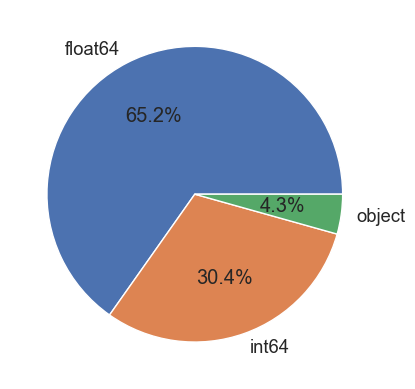

In [446]:
# Types des variables
get_types_variables(cc_balance, True, False, True)

In [447]:
# Suppression des valeurs remontant à plus de 80 ans - AMT_PAYMENT_CURRENT
cc_balance['AMT_PAYMENT_CURRENT'][cc_balance['AMT_PAYMENT_CURRENT']> 4000000] = np.nan

#### Feature Engineering: 
- Somme des montant retiré au guichet automatique pendant le mois de crédit: **AMT_DRAWING_SUM**
- Somme des retrait durant le mois de crédit en cours : **"CNT_DRAWING_SUM"**
- Taux  = Solde / Limite de la Carte de crédit en cours du mois : **BALANCE_LIMIT_RATIO**
- Taux = Solde payée /versement min du mois du crédit en cours : **MIN_PAYMENT_RATIO**
- Diff = Cb le client à versée sur le mois / versement min : **PAYMENT_MIN_DIFF**
...

In [448]:
# Somme : Montant retiré au guichet automatique pendant le mois du crédit
#         précédent + Montant prélevé au cours du mois du crédit précédent
#         + Montant des autres prélèvements au cours du mois du crédit
#         précédent + Montant des prélèvements ou des achats de
# marchandises au cours du mois de la crédibilité précédente.
cc_balance['AMT_DRAWING_SUM'] = cc_balance['AMT_DRAWINGS_ATM_CURRENT'] + cc_balance['AMT_DRAWINGS_CURRENT'] \
    + cc_balance['AMT_DRAWINGS_OTHER_CURRENT'] + cc_balance['AMT_DRAWINGS_POS_CURRENT']

# Somme : Nombre de retraits au guichet automatique durant ce mois sur
#         le crédit précédent + Nombre de retraits pendant ce mois sur
#         le crédit précédent + Nombre d'autres retraits au cours de
#         ce mois sur le crédit précédent + Nombre de retraits de
#         marchandises durant ce mois sur le crédit précédent +
#         Nombre d'échéances payées sur le crédit précédent
cc_balance['CNT_DRAWING_SUM'] = cc_balance['CNT_DRAWINGS_ATM_CURRENT'] + cc_balance['CNT_DRAWINGS_CURRENT'] \
    + cc_balance['CNT_DRAWINGS_OTHER_CURRENT'] + cc_balance['CNT_DRAWINGS_POS_CURRENT'] \
    + cc_balance['CNT_INSTALMENT_MATURE_CUM']

# Ratio : Solde au cours du mois du crédit précédent \
#         Limite de la carte de crédit au cours du mois du crédit précédent
cc_balance['BALANCE_LIMIT_RATIO'] = cc_balance['AMT_BALANCE'] / (cc_balance['AMT_CREDIT_LIMIT_ACTUAL'] + 0.00001)

# Ratio : Combien le client a-t-il payé pendant le mois sur le crédit
#         précédent ? /
#         Versement minimal pour ce mois du crédit précédent
cc_balance['MIN_PAYMENT_RATIO'] = cc_balance['AMT_PAYMENT_CURRENT'] / \
    (cc_balance['AMT_INST_MIN_REGULARITY'] + 0.0001)
# Différence : Combien le client a-t-il payé pendant le mois sur le crédit
#              précédent ?
#              - Versement minimal pour ce mois du crédit précédent
cc_balance['PAYMENT_MIN_DIFF'] = cc_balance['AMT_PAYMENT_CURRENT'] - \
    cc_balance['AMT_INST_MIN_REGULARITY']

# Ratio : Combien le client a-t-il payé au total pendant le mois sur le
#         crédit précédent ? /
#         Versement minimal pour ce mois du crédit précédent
cc_balance['MIN_PAYMENT_TOTAL_RATIO'] = \
    cc_balance['AMT_PAYMENT_TOTAL_CURRENT'] \
    / (cc_balance['AMT_INST_MIN_REGULARITY'] + 0.00001)
# Différence : Combien le client a-t-il payé au total pendant le mois sur
#              le crédit précédent ? -
#              Versement minimal pour ce mois du crédit précédent
cc_balance['PAYMENT_MIN_DIFF'] = cc_balance['AMT_PAYMENT_TOTAL_CURRENT'] \
    - cc_balance['AMT_INST_MIN_REGULARITY']

# Différence : Montant total à recevoir sur le crédit précédent -
#              Montant à recevoir pour le principal du crédit précédent
cc_balance['AMT_INTEREST_RECEIVABLE'] = cc_balance['AMT_TOTAL_RECEIVABLE'] \
    - cc_balance['AMT_RECEIVABLE_PRINCIPAL']

# Ratio : DPD (jours de retard) au cours du mois sur le crédit précédent \
#         DPD (Days past due) au cours du mois avec tolérance (les dettes
#         avec de faibles montants de prêt sont ignorées) du crédit
#         précédent
cc_balance['SK_DPD_RATIO'] = cc_balance['SK_DPD'] / \
    (cc_balance['SK_DPD_DEF'] + 0.00001)

In [449]:
# -- AGGREGATION DES VARIABLES STATISTIQUES des VAR QUANTITATIVES
# --------------------------------------------------------------------

def agg_var_num(dataframe, group_var, dict_agg, prefix):
    """
    Aggregates the numeric values in a dataframe.
    This can be used to create features for each instance of the grouping variable.
    Parameters
    --------
        dataframe (dataframe): the dataframe to calculate the statistics on
        group_var (string): the variable by which to group df
        df_name (string): the variable used to rename the columns
    Return
    --------
        agg (dataframe): 
            a dataframe with the statistics aggregated for 
            all numeric columns. Each instance of the grouping variable will have 
            some statistics (mean, min, max, sum ...) calculated. 
            The columns are also renamed to keep track of features created.
    
    """
    # Remove id variables other than grouping variable
    for col in dataframe:
        if col != group_var and 'SK_ID' in col:
            dataframe = dataframe.drop(columns=col)

    group_ids = dataframe[group_var]
    numeric_df = dataframe.select_dtypes('number')
    numeric_df[group_var] = group_ids

    # Group by the specified variable and calculate the statistics
    agg = numeric_df.groupby(group_var).agg(dict_agg)

    # Ajout suffix mean, sum...
    agg.columns = ['_'.join(tup).strip().upper()
                   for tup in agg.columns.values]

    # Ajout du prefix bureau_balance pour avoir une idée du fichier
    agg.columns = [prefix + '_' + col
                   if col != group_var else col
                   for col in agg.columns]

    agg.reset_index(inplace=True)

    return agg


In [450]:
# Ajout des variables de statistiques
dico_agg_ccb = {'MONTHS_BALANCE': ['max'],
                'AMT_BALANCE' : ['sum', 'mean', 'max'],
                'AMT_CREDIT_LIMIT_ACTUAL' : ['sum', 'mean', 'max'],
                'AMT_DRAWINGS_ATM_CURRENT' : ['sum', 'max'],
                'AMT_DRAWINGS_CURRENT' : ['sum', 'max'],
                'AMT_DRAWINGS_OTHER_CURRENT' : ['sum', 'max'],
                'AMT_DRAWINGS_POS_CURRENT' : ['sum', 'max'],
                'AMT_INST_MIN_REGULARITY' : ['mean', 'min', 'max'],
                'AMT_PAYMENT_CURRENT' : ['mean', 'min', 'max'],
                'AMT_PAYMENT_TOTAL_CURRENT' : ['mean', 'min', 'max'],
                'AMT_RECEIVABLE_PRINCIPAL' : ['sum', 'mean', 'max'],
                'AMT_RECIVABLE' : ['sum', 'mean', 'max'],
                'AMT_TOTAL_RECEIVABLE' : ['sum', 'mean', 'max'],
                'CNT_DRAWINGS_ATM_CURRENT' : ['sum', 'max', 'mean'],
                'CNT_DRAWINGS_CURRENT' : ['sum', 'max', 'mean'],
                'CNT_DRAWINGS_OTHER_CURRENT' : ['sum', 'max'],
                'CNT_DRAWINGS_POS_CURRENT' : ['sum', 'max'],
                'CNT_INSTALMENT_MATURE_CUM' : ['sum', 'max', 'min'],
                'SK_DPD' : ['sum', 'max'],
                'SK_DPD_DEF' : ['sum', 'max'],
                # Nouvelles Features
                'AMT_DRAWING_SUM' : ['sum', 'max'],
                'BALANCE_LIMIT_RATIO' : ['mean', 'max', 'min'],
                'CNT_DRAWING_SUM' : ['sum', 'max'],
                'MIN_PAYMENT_RATIO': ['min', 'mean'],
                'PAYMENT_MIN_DIFF' : ['min', 'mean'],
                'MIN_PAYMENT_TOTAL_RATIO' : ['min', 'mean'], 
                'AMT_INTEREST_RECEIVABLE' : ['min','mean'],
                'SK_DPD_RATIO' : ['max','mean']}

agg_ccb_num = agg_var_num(cc_balance.drop(columns=['SK_ID_PREV']),
                                     'SK_ID_CURR', dico_agg_ccb, 'CCB')

print(f'{agg_ccb_num.shape}')
agg_ccb_num.head()

(103558, 68)


,SK_ID_CURR,CCB_MONTHS_BALANCE_MAX,CCB_AMT_BALANCE_SUM,CCB_AMT_BALANCE_MEAN,CCB_AMT_BALANCE_MAX,CCB_AMT_CREDIT_LIMIT_ACTUAL_SUM,CCB_AMT_CREDIT_LIMIT_ACTUAL_MEAN,CCB_AMT_CREDIT_LIMIT_ACTUAL_MAX,CCB_AMT_DRAWINGS_ATM_CURRENT_SUM,CCB_AMT_DRAWINGS_ATM_CURRENT_MAX,...,CCB_MIN_PAYMENT_RATIO_MIN,CCB_MIN_PAYMENT_RATIO_MEAN,CCB_PAYMENT_MIN_DIFF_MIN,CCB_PAYMENT_MIN_DIFF_MEAN,CCB_MIN_PAYMENT_TOTAL_RATIO_MIN,CCB_MIN_PAYMENT_TOTAL_RATIO_MEAN,CCB_AMT_INTEREST_RECEIVABLE_MIN,CCB_AMT_INTEREST_RECEIVABLE_MEAN,CCB_SK_DPD_RATIO_MAX,CCB_SK_DPD_RATIO_MEAN
0,100006,-1,0.000,0.000000,0.00,1620000,270000.000000,270000,0.0,NaN,...,NaN,NaN,0.000,0.000000,0.0,0.000000,0.000,0.000000,0.00000,0.000000
1,100011,-2,4031676.225,54482.111149,189000.00,12150000,164189.189189,180000,180000.0,180000.0,...,1.0,3.086877e+06,-804.195,625.764452,0.0,0.509110,-563.355,2031.090203,0.00000,0.000000
2,100013,-1,1743352.245,18159.919219,161420.22,12645000,131718.750000,157500,571500.0,157500.0,...,0.0,2.652498e+06,-7875.000,5898.814888,0.0,0.933759,-274.320,845.520000,0.99999,0.010417
3,100021,-2,0.000,0.000000,0.00,11475000,675000.000000,675000,0.0,NaN,...,NaN,NaN,0.000,0.000000,0.0,0.000000,0.000,0.000000,0.00000,0.000000
4,100023,-4,0.000,0.000000,0.00,1080000,135000.000000,225000,0.0,NaN,...,NaN,NaN,0.000,0.000000,0.0,0.000000,0.000,0.000000,0.00000,0.000000


In [451]:
# Sauvegarde de agg_ccb_num
fic_sav_agg_ccb_num = 'Pickle/agg_ccb_num.pickle'
with open(fic_sav_agg_ccb_num, 'wb') as f:
    pickle.dump(agg_ccb_num, f, pickle.HIGHEST_PROTOCOL)
agg_ccb_num.shape

(103558, 68)

In [452]:
# Chargement de agg_ccb_num
fic_sav_agg_ccb_num = 'Pickle/agg_ccb_num.pickle'
with open(fic_sav_agg_ccb_num, 'rb') as df_agg_ccb_num:
    agg_ccb_num = pickle.load(df_agg_ccb_num)
agg_ccb_num.shape

(103558, 68)

---
##### Variables qualitatives:
---

In [453]:
# -- AGGREGATION DES VARIABLES STATISTIQUES des VAR QUALITATIVES
# --------------------------------------------------------------------

def agg_var_cat(dataframe, group_var, prefix):
    '''
        Aggregates the categorical features in a child dataframe
        for each observation of the parent variable.
        
        Parameters
        --------
        - dataframe        : pandas dataframe
                    The dataframe to calculate the value counts for.
            
        - parent_var : string
                    The variable by which to group and aggregate 
                    the dataframe. For each unique value of this variable, 
                    the final dataframe will have one row
            
        - prefix    : string
                    Variable added to the front of column names 
                    to keep track of columns
        Return
        --------
        categorical : pandas dataframe
                    A dataframe with aggregated statistics for each observation 
                    of the parent_var
                    The columns are also renamed and columns with duplicate values 
                    are removed.
    '''
    
    # Select the categorical columns
    categorical = pd.get_dummies(dataframe.select_dtypes('object'))

    # Make sure to put the identifying id on the column
    categorical[group_var] = dataframe[group_var]

    # Groupby the group var and calculate the sum and mean
    categorical = categorical.groupby(group_var).agg(['sum', 'count', 'mean'])
    
    column_names = []
    
    # Iterate through the columns in level 0
    for var in categorical.columns.levels[0]:
        # Iterate through the stats in level 1
        for stat in ['sum', 'count', 'mean']:
            # Make a new column name
            column_names.append('%s_%s_%s' % (prefix, var, stat))
    
    categorical.columns = column_names
    
    # Remove duplicate columns by values
    # _, idx = np.unique(categorical, axis = 1, return_index = True)
    # categorical = categorical.iloc[:, idx]
    
    return categorical

In [454]:
agg_ccb_cat = agg_var_cat(cc_balance, 'SK_ID_CURR',
                                               'CCB')
print(f'{agg_ccb_cat.shape}')
agg_ccb_cat.head()

(103558, 21)


,CCB_NAME_CONTRACT_STATUS_Active_sum,CCB_NAME_CONTRACT_STATUS_Active_count,CCB_NAME_CONTRACT_STATUS_Active_mean,CCB_NAME_CONTRACT_STATUS_Approved_sum,CCB_NAME_CONTRACT_STATUS_Approved_count,CCB_NAME_CONTRACT_STATUS_Approved_mean,CCB_NAME_CONTRACT_STATUS_Completed_sum,CCB_NAME_CONTRACT_STATUS_Completed_count,CCB_NAME_CONTRACT_STATUS_Completed_mean,CCB_NAME_CONTRACT_STATUS_Demand_sum,...,CCB_NAME_CONTRACT_STATUS_Demand_mean,CCB_NAME_CONTRACT_STATUS_Refused_sum,CCB_NAME_CONTRACT_STATUS_Refused_count,CCB_NAME_CONTRACT_STATUS_Refused_mean,CCB_NAME_CONTRACT_STATUS_Sent proposal_sum,CCB_NAME_CONTRACT_STATUS_Sent proposal_count,CCB_NAME_CONTRACT_STATUS_Sent proposal_mean,CCB_NAME_CONTRACT_STATUS_Signed_sum,CCB_NAME_CONTRACT_STATUS_Signed_count,CCB_NAME_CONTRACT_STATUS_Signed_mean
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100006,6,6,1.000000,0,6,0.0,0,6,0.000000,0,...,0.0,0,6,0.0,0,6,0.0,0,6,0.0
100011,74,74,1.000000,0,74,0.0,0,74,0.000000,0,...,0.0,0,74,0.0,0,74,0.0,0,74,0.0
100013,96,96,1.000000,0,96,0.0,0,96,0.000000,0,...,0.0,0,96,0.0,0,96,0.0,0,96,0.0
100021,7,17,0.411765,0,17,0.0,10,17,0.588235,0,...,0.0,0,17,0.0,0,17,0.0,0,17,0.0
100023,8,8,1.000000,0,8,0.0,0,8,0.000000,0,...,0.0,0,8,0.0,0,8,0.0,0,8,0.0


In [455]:
# Sauvegarde de agg_ccb_cat
fic_sav_agg_ccb_cat = 'Pickle/agg_ccb_cat.pickle'
with open(fic_sav_agg_ccb_cat, 'wb') as f:
    pickle.dump(agg_ccb_cat, f, pickle.HIGHEST_PROTOCOL)
agg_ccb_cat.shape

(103558, 21)

In [456]:
# Chargement de agg_ccb_cat
fic_sav_agg_ccb_cat = 'Pickle/agg_ccb_cat.pickle'
with open(fic_sav_agg_ccb_cat, 'rb') as df_agg_ccb_cat:
    agg_ccb_cat = pickle.load(df_agg_ccb_cat)
agg_ccb_cat.shape

(103558, 21)

##### Merge - train_set :

In [457]:
# Dimensions avant merge
print(f'application_train : {application_train.shape}')
print(f'agg_ccb_cat : {agg_ccb_cat.shape}')
print(f'agg_ccb_num : {agg_ccb_num.shape}')

application_train : (307507, 213)
agg_ccb_cat : (103558, 21)
agg_ccb_num : (103558, 68)


In [458]:
# Merge variables catégorielles
train_set = application_train.merge(agg_ccb_cat, on='SK_ID_CURR',
                                    how='left')
print(f'train_set : {train_set.shape}')

train_set : (307507, 234)


In [459]:
# Merge variables numériques
train_set = train_set.merge(agg_ccb_num, on='SK_ID_CURR', how='left')
print(f'train_set : {train_set.shape}')

train_set : (307507, 301)


In [460]:
# Description
description_variables(train_set)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CCB_MIN_PAYMENT_RATIO_MIN,CCB_MIN_PAYMENT_RATIO_MEAN,CCB_PAYMENT_MIN_DIFF_MIN,CCB_PAYMENT_MIN_DIFF_MEAN,CCB_MIN_PAYMENT_TOTAL_RATIO_MIN,CCB_MIN_PAYMENT_TOTAL_RATIO_MEAN,CCB_AMT_INTEREST_RECEIVABLE_MIN,CCB_AMT_INTEREST_RECEIVABLE_MEAN,CCB_SK_DPD_RATIO_MAX,CCB_SK_DPD_RATIO_MEAN
type,int64,int64,int32,int32,int8,int8,int64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,246447.0,246447.0,220602.0,220602.0,220602.0,220602.0,220602.0,220602.0,220602.0,220602.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.266258,0.266258,0.238335,0.238335,0.238335,0.238335,0.238335,0.238335,0.238335,0.238335
count,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,...,61060.0,61060.0,86905.0,86905.0,86905.0,86905.0,86905.0,86905.0,86905.0,86905.0
mean,278181.527256,0.08073,0.095201,0.341648,0.659894,0.306331,0.417047,168797.685779,599028.596733,27108.580714,...,2705629.031684,23072809.593884,-3196.788393,6986.203381,9608338.125711,125237398.586428,-96.854021,2236.817046,1619256.805981,408029.245565
std,102790.132982,0.27242,0.293493,0.474263,0.473745,0.46097,0.722119,237124.62732,402492.601859,14493.522125,...,93709818.130044,136183962.652502,9235.188731,20360.190453,646067695.097059,1019983628.822906,2234.671249,3559.855726,14165515.557783,4346522.745883
min,100002.0,0.0,0.0,0.0,0.0,0.0,0.0,25650.0,45000.0,1615.5,...,0.0,0.0,-202882.005,-37277.391176,0.0,0.0,-297116.685,-4612.844063,0.0,0.0
25%,189146.5,0.0,0.0,0.0,0.0,0.0,0.0,112500.0,270000.0,16524.0,...,0.0,6.005293,-4500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,278203.0,0.0,0.0,0.0,1.0,0.0,0.0,147150.0,513531.0,24903.0,...,0.0,1137619.993279,0.0,972.96212,0.0,1.12774,0.0,805.8075,0.0,0.0
75%,367143.5,0.0,0.0,1.0,1.0,1.0,1.0,202500.0,808650.0,34596.0,...,1.000006,9435553.482729,0.0,6003.076875,0.0,3367914.038908,0.0,3167.209286,0.0,0.0


##### Assemblage - test.set: 

In [461]:
# Dimensions avant merge
print(f'application_test : {application_test.shape}')
print(f'agg_ccb_cat : {agg_ccb_cat.shape}')
print(f'agg_ccb_num : {agg_ccb_num.shape}')

application_test : (48744, 955)
agg_ccb_cat : (103558, 21)
agg_ccb_num : (103558, 68)


In [462]:
# Merge variables catégorielles
test_set = application_test.merge(agg_ccb_cat, on='SK_ID_CURR', how='left')
print(f'test_set : {test_set.shape}')

test_set : (48744, 976)


In [463]:
# Merge variables numériques
test_set = test_set.merge(agg_ccb_num, on='SK_ID_CURR', how='left')
print(f'test_set : {test_set.shape}')

test_set : (48744, 1043)


In [464]:
# Description
description_variables(test_set)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,...,CCB_MIN_PAYMENT_RATIO_MIN,CCB_MIN_PAYMENT_RATIO_MEAN,CCB_PAYMENT_MIN_DIFF_MIN,CCB_PAYMENT_MIN_DIFF_MEAN,CCB_MIN_PAYMENT_TOTAL_RATIO_MIN,CCB_MIN_PAYMENT_TOTAL_RATIO_MEAN,CCB_AMT_INTEREST_RECEIVABLE_MIN,CCB_AMT_INTEREST_RECEIVABLE_MEAN,CCB_SK_DPD_RATIO_MAX,CCB_SK_DPD_RATIO_MEAN
type,int64,int32,int32,int8,int8,int64,float64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,37684.0,37684.0,32091.0,32091.0,32091.0,32091.0,32091.0,32091.0,32091.0,32091.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.074123,0.074123,0.063122,0.063122,0.063122,0.063122,0.063122,0.063122,0.063122,0.063122
count,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,...,11060.0,11060.0,16653.0,16653.0,16653.0,16653.0,16653.0,16653.0,16653.0,16653.0
mean,277796.67635,0.009006,0.3296,0.662871,0.309495,0.397054,178431.805855,516740.435561,29424.651219,0.021226,...,2125708.803393,22098590.265417,-2877.247361,6347.31607,4668385.42151,110494742.435558,-84.071733,1874.754141,1255815.884552,329237.091495
std,103169.547296,0.094474,0.470073,0.472734,0.46229,0.709047,101522.591536,365397.004174,16012.584824,0.014428,...,59839235.153084,111880048.41212,10842.174488,21571.846074,391432144.167007,839020266.917648,1375.867911,3104.031418,12838157.155531,4004910.119969
min,100001.0,0.0,0.0,0.0,0.0,0.0,26941.5,45000.0,2295.0,0.000253,...,0.0,0.0,-194198.31,-33412.5675,0.0,0.0,-94343.85,-1407.339293,0.0,0.0
25%,188557.75,0.0,0.0,0.0,0.0,0.0,112500.0,260640.0,17973.0,0.010006,...,0.0,13.188575,-3460.32,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,277549.0,0.0,0.0,1.0,0.0,0.0,157500.0,450000.0,26199.0,0.01885,...,0.0,1508608.166562,0.0,756.4125,0.0,1.047977,0.0,407.18,0.0,0.0
75%,367555.5,0.0,1.0,1.0,1.0,1.0,225000.0,675000.0,37390.5,0.028663,...,1.000146,11254644.706755,0.0,5718.582391,0.0,5503849.863027,0.0,2660.34,0.0,0.0


#### Nettoyage : train et test :

In [465]:
# -- GESTION DES VARIABLES FORTEMENT COLINEAIRES
# --------------------------------------------------------------------

def suppr_var_colineaire(dataframe, seuil=0.8):
    '''
    Récupération de la liste des variables fortement corrélées supérieur
    au seuil transmis.
    Parameters
    ----------
    dataframe : dataframe à analyser, obligatoire.
    seuil : le seuil de colinéarité entre les variables (0.8 par défaut).
    Returns
    -------
    cols_corr_a_supp : liste des variables à supprimer.
    '''
    
    # Matrice de corrélation avec valeur absolue pour ne pas avoir à gérer
    # les corrélations positives et négatives séparément
    corr = dataframe.corr().abs()
    # On ne conserve que la partie supérieur à la diagonale pour n'avoir
    # qu'une seule fois les corrélations prisent en compte (symétrie axiale)
    corr_triangle = corr.where(np.triu(np.ones(corr.shape), k=1)
                               .astype(np.bool))
    
    # Variables avec un coef de Pearson > 0.8?
    cols_corr_a_supp = [var for var in corr_triangle.columns
                        if any(corr_triangle[var] > seuil)]
    print(f'{len(cols_corr_a_supp)} variables fortement corrélées à supprimer :\n')
    for var in cols_corr_a_supp:
        print(var)
        
    return cols_corr_a_supp

In [466]:
# Gestion des variables fortement corrélées à supprimer train set
var_corr_train_set = suppr_var_colineaire(train_set)

48 variables fortement corrélées à supprimer :

CCB_NAME_CONTRACT_STATUS_Active_count
CCB_NAME_CONTRACT_STATUS_Approved_count
CCB_NAME_CONTRACT_STATUS_Approved_mean
CCB_NAME_CONTRACT_STATUS_Completed_count
CCB_NAME_CONTRACT_STATUS_Completed_mean
CCB_NAME_CONTRACT_STATUS_Demand_count
CCB_NAME_CONTRACT_STATUS_Demand_mean
CCB_NAME_CONTRACT_STATUS_Refused_count
CCB_NAME_CONTRACT_STATUS_Refused_mean
CCB_NAME_CONTRACT_STATUS_Sent proposal_count
CCB_NAME_CONTRACT_STATUS_Sent proposal_mean
CCB_NAME_CONTRACT_STATUS_Signed_count
CCB_AMT_BALANCE_MAX
CCB_AMT_CREDIT_LIMIT_ACTUAL_MAX
CCB_AMT_DRAWINGS_CURRENT_MAX
CCB_AMT_DRAWINGS_OTHER_CURRENT_MAX
CCB_AMT_INST_MIN_REGULARITY_MEAN
CCB_AMT_INST_MIN_REGULARITY_MAX
CCB_AMT_PAYMENT_TOTAL_CURRENT_MEAN
CCB_AMT_PAYMENT_TOTAL_CURRENT_MAX
CCB_AMT_RECEIVABLE_PRINCIPAL_SUM
CCB_AMT_RECEIVABLE_PRINCIPAL_MEAN
CCB_AMT_RECEIVABLE_PRINCIPAL_MAX
CCB_AMT_RECIVABLE_SUM
CCB_AMT_RECIVABLE_MEAN
CCB_AMT_RECIVABLE_MAX
CCB_AMT_TOTAL_RECEIVABLE_SUM
CCB_AMT_TOTAL_RECEIVABLE_MEAN

In [467]:
# Suppression des variables fortement corrélées du train set
train_set = train_set.drop(columns=var_corr_train_set)
print(f'train_set : {train_set.shape}')

train_set : (307507, 253)


In [468]:
# Gestion des variables fortement corrélées à supprimer train set
var_corr_train_set2 = suppr_var_colineaire(test_set)

48 variables fortement corrélées à supprimer :

CCB_NAME_CONTRACT_STATUS_Active_count
CCB_NAME_CONTRACT_STATUS_Approved_count
CCB_NAME_CONTRACT_STATUS_Completed_count
CCB_NAME_CONTRACT_STATUS_Completed_mean
CCB_NAME_CONTRACT_STATUS_Demand_count
CCB_NAME_CONTRACT_STATUS_Demand_mean
CCB_NAME_CONTRACT_STATUS_Refused_count
CCB_NAME_CONTRACT_STATUS_Refused_mean
CCB_NAME_CONTRACT_STATUS_Sent proposal_count
CCB_NAME_CONTRACT_STATUS_Sent proposal_mean
CCB_NAME_CONTRACT_STATUS_Signed_count
CCB_AMT_BALANCE_MAX
CCB_AMT_CREDIT_LIMIT_ACTUAL_MAX
CCB_AMT_DRAWINGS_CURRENT_MAX
CCB_AMT_DRAWINGS_OTHER_CURRENT_MAX
CCB_AMT_DRAWINGS_POS_CURRENT_SUM
CCB_AMT_INST_MIN_REGULARITY_MEAN
CCB_AMT_INST_MIN_REGULARITY_MAX
CCB_AMT_PAYMENT_TOTAL_CURRENT_MEAN
CCB_AMT_PAYMENT_TOTAL_CURRENT_MIN
CCB_AMT_PAYMENT_TOTAL_CURRENT_MAX
CCB_AMT_RECEIVABLE_PRINCIPAL_SUM
CCB_AMT_RECEIVABLE_PRINCIPAL_MEAN
CCB_AMT_RECEIVABLE_PRINCIPAL_MAX
CCB_AMT_RECIVABLE_SUM
CCB_AMT_RECIVABLE_MEAN
CCB_AMT_RECIVABLE_MAX
CCB_AMT_TOTAL_RECEIVABLE_SUM
C

In [469]:
# Suppression des variables fortement corrélées du test set
test_set = test_set.drop(columns=var_corr_train_set2)
print(f'test_set : {test_set.shape}')

test_set : (48744, 995)


In [471]:
def get_missing_values_sup_seuil(df_work, seuil=90):
    """Retourne les variables qui ont plus que seuil% de valeurs manquantes.
       @param in : df_work dataframe obligatoire
                   seuil : seuil (90% par défaut)
       @param out : cols_nan_a_suppr : liste des variables à supprimer
    """

    values = df_work.isnull().sum()
    percentage = 100 * values / len(df_work)
    table = pd.concat([values, percentage.round(2)], axis=1)
    table.columns = [
            'Nombres de valeurs manquantes',
            '% de valeurs manquantes']

    # Liste des variables ayant plus de 90% de valeurs manquantes
    cols_nan_a_suppr = table[table['% de valeurs manquantes'] > 90].index \
        .to_list()
    nbr_cols_a_suppr = len(cols_nan_a_suppr)
    if nbr_cols_a_suppr > 0:
        print(f'{df_work.name} - Nombre de variables à supprimer : {len(cols_nan_a_suppr)}\n')
        display(cols_nan_a_suppr)
    else:
        print(f'{df_work.name} - Aucune variable à supprimer')

    return cols_nan_a_suppr

In [472]:
train_set.name = 'train_set'

# Valeurs manquantes du dataframe train_set
cols_nan_a_suppr = get_missing_values_sup_seuil(train_set)

train_set - Aucune variable à supprimer


In [473]:
test_set.name = 'test_set'
# Valeurs manquantes du dataframe test_set
cols_nan_a_suppr_test = get_missing_values_sup_seuil(test_set)

test_set - Aucune variable à supprimer


In [474]:
#TRAIN_SET:
# Variables quantitatives - imputation par médiane
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
train_set.fillna(train_set.median(), inplace=True)
# Vérification
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 9082050
Nombre de nan après imputation par median : 0


In [475]:
#TEST_set:
# Variables quantitatives - imputation par médiane
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
test_set.fillna(test_set.median(), inplace=True)
# Vérification
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 1339600
Nombre de nan après imputation par median : 0


In [476]:
# Sauvegarde de train_set après pré processing credit_card_balance
fic_sav_train_set_ccb = 'Pickle/train_set_ccb.pickle'
with open(fic_sav_train_set_ccb, 'wb') as f:
    pickle.dump(train_set, f, pickle.HIGHEST_PROTOCOL)

In [477]:
# Sauvegarde de test_set après pré processing credit_card_balance
fic_sav_test_set_ccb = 'Pickle/test_set_ccb.pickle'
with open(fic_sav_test_set_ccb, 'wb') as f:
    pickle.dump(test_set, f, pickle.HIGHEST_PROTOCOL)

In [478]:
fic_sav_train_set_ccb = 'Pickle/train_set_ccb.pickle'
# Chargement de train_set
with open(fic_sav_train_set_ccb, 'rb') as df_appli_train_set_ccb:
    train_set = pickle.load(df_appli_train_set_ccb)
train_set.shape

(307507, 253)

In [479]:
fic_sav_test_set_ccb = 'Pickle/test_set_ccb.pickle'
# Chargement de test_set
with open(fic_sav_test_set_ccb, 'rb') as df_appli_test_set_ccb:
    test_set = pickle.load(df_appli_test_set_ccb)
test_set.shape

(48744, 995)

_______
##### Dataset - installments_payments.csv :

Fichier 	Description
_________
installments_payments.csv
	

    Historique des remboursements pour les crédits précédemment déboursés dans Home Credit liés aux prêts de notre échantillon.
    Il y a a) une ligne pour chaque paiement qui a été effectué plus b) une ligne pour chaque paiement manqué. Une ligne équivaut à un paiement d'un versement OU à un versement correspondant à un paiement d'un crédit précédent de Home Credit lié aux prêts de notre échantillon.
___________
Description des variables
Variable 	Description 	Liste valeurs

SK_ID_PREV
	

    ID du crédit précédent dans le crédit immobilier lié au prêt dans notre échantillon.
    Un prêt dans notre échantillon peut avoir 0, 1, 2 ou plus de prêts précédents dans Home Credit.

	
___________
SK_ID_CURR
	

ID du prêt dans notre échantillon.
	
___________
NUM_INSTALMENT_VERSION
	

Version du calendrier des versements du crédit précédent. Le changement de la version des versements d'un mois à l'autre signifie qu'un paramètre du calendrier de paiement a changé.
	0 pour la carte de crédit
______
NUM_INSTALMENT_NUMBER
	

Sur quel versement nous observons le paiement ?
	
________
DAYS_INSTALMENT
	

La date à laquelle le versement du crédit précédent était censé être payé (par rapport à la date de demande du prêt actuel).
	
_______
DAYS_ENTRY_PAYMENT
	

Quand les échéances du crédit précédent ont-elles été effectivement payées (par rapport à la date de demande du prêt actuel) ?
	
_______
AMT_INSTALMENT
	

Quel était le montant de l'acompte prescrit du crédit précédent sur cet acompte ?
	
________
AMT_PAYMENT
	

Ce que le client a effectivement payé sur le crédit précédent pour ce versement.

In [480]:
# Taille : nombre de lignes/colonnes
nRow, nVar = installments_payments.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 13605401 lignes et 8 variables.


In [481]:
# Variables quantitatives
cols_num_pay = installments_payments.select_dtypes(include=[np.number]).columns.to_list()
cols_num_pay

['SK_ID_PREV',
 'SK_ID_CURR',
 'NUM_INSTALMENT_VERSION',
 'NUM_INSTALMENT_NUMBER',
 'DAYS_INSTALMENT',
 'DAYS_ENTRY_PAYMENT',
 'AMT_INSTALMENT',
 'AMT_PAYMENT']

In [482]:
# Variables catégorielles
cols_cat_pay = installments_payments.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_pay

[]

In [483]:
# Résumé des variables
desc_pay = description_variables(installments_payments)
installments_payments

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
...,...,...,...,...,...,...,...,...
13605396,2186857,428057,0.0,66,-1624.0,NaN,67.500,NaN
13605397,1310347,414406,0.0,47,-1539.0,NaN,67.500,NaN
13605398,1308766,402199,0.0,43,-7.0,NaN,43737.435,NaN
13605399,1062206,409297,0.0,43,-1986.0,NaN,67.500,NaN


Remarque :
- Pas de valeur abérrantes .

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_PREV                  int64
SK_ID_CURR                  int64
NUM_INSTALMENT_VERSION    float64
NUM_INSTALMENT_NUMBER       int64
DAYS_INSTALMENT           float64
DAYS_ENTRY_PAYMENT        float64
AMT_INSTALMENT            float64
AMT_PAYMENT               float64
dtype: object


----------------------------------------------------------
Répartition schématique des types de variable 



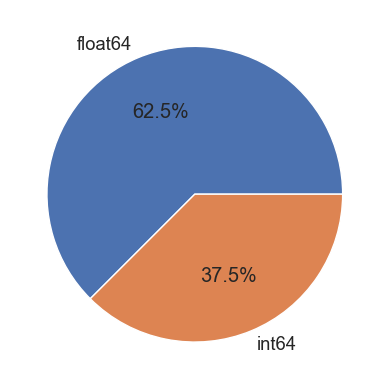

In [484]:
# Types des variables
get_types_variables(installments_payments, True, False, True)

##### Feature Enginering :

In [485]:
# Ratio : La date à laquelle le versement du crédit précédent était censé
#         être payé (par rapport à la date de demande du prêt actuel) \
#         Quand les échéances du crédit précédent ont-elles été
#         effectivement payées (par rapport à la date de demande du prêt
#         actuel) ?
installments_payments['DAYS_PAYMENT_RATIO'] = installments_payments['DAYS_INSTALMENT'] / \
    (installments_payments['DAYS_ENTRY_PAYMENT'] + 0.00001)
# Différence : La date à laquelle le versement du crédit précédent était
#              censé être payé (par rapport à la date de demande du prêt
#              actuel) - Quand les échéances du crédit précédent ont-elles
#              été effectivement payées (par rapport à la date de demande
#              du prêt actuel) ?
installments_payments['DAYS_PAYMENT_DIFF'] = installments_payments['DAYS_INSTALMENT'] - \
    installments_payments['DAYS_ENTRY_PAYMENT']

# Ratio : Ce que le client a effectivement payé sur le crédit précédent
#         pour ce versement \
#         Quel était le montant de l'acompte prescrit du crédit précédent
#         sur cet acompte ?
installments_payments['AMT_PAYMENT_RATIO'] = installments_payments['AMT_PAYMENT'] / \
    (installments_payments['AMT_INSTALMENT'] + 0.00001)
# Différence : Quel était le montant de l'acompte prescrit du crédit
#              précédent sur cet acompte ? -
#              Ce que le client a effectivement payé sur le crédit
#              précédent pour ce versement
installments_payments['AMT_PAYMENT_DIFF'] = installments_payments['AMT_INSTALMENT'] - \
    installments_payments['AMT_PAYMENT']

##### Création des variables :mean,max,min..

In [486]:
# Ajout des variables de statistiques
dico_agg_pay= {'NUM_INSTALMENT_VERSION' : ['mean', 'sum',],
               'NUM_INSTALMENT_NUMBER' : ['max'],
               'DAYS_INSTALMENT' : ['max', 'min', 'mean'],
               'DAYS_ENTRY_PAYMENT' : ['max', 'min', 'mean'],
               'AMT_INSTALMENT' : ['mean', 'sum', 'min', 'max'],
               'AMT_PAYMENT' : ['mean', 'sum', 'min', 'max'],
               # Nouvelles Features
               'DAYS_PAYMENT_RATIO' : ['mean', 'min', 'max'],
               'DAYS_PAYMENT_DIFF' : ['mean', 'min', 'max'],
               'AMT_PAYMENT_RATIO' : ['mean', 'min', 'max'],
               'AMT_PAYMENT_DIFF' : ['mean', 'min', 'max']}

agg_pay_num = agg_var_num(installments_payments \
                                     .drop(columns=['SK_ID_PREV']),
                                     'SK_ID_CURR', dico_agg_pay,
                                     'INST_PAY')

print(f'{agg_pay_num.shape}')
agg_pay_num.head()



(339587, 30)


,SK_ID_CURR,INST_PAY_NUM_INSTALMENT_VERSION_MEAN,INST_PAY_NUM_INSTALMENT_VERSION_SUM,INST_PAY_NUM_INSTALMENT_NUMBER_MAX,INST_PAY_DAYS_INSTALMENT_MAX,INST_PAY_DAYS_INSTALMENT_MIN,INST_PAY_DAYS_INSTALMENT_MEAN,INST_PAY_DAYS_ENTRY_PAYMENT_MAX,INST_PAY_DAYS_ENTRY_PAYMENT_MIN,INST_PAY_DAYS_ENTRY_PAYMENT_MEAN,...,INST_PAY_DAYS_PAYMENT_RATIO_MAX,INST_PAY_DAYS_PAYMENT_DIFF_MEAN,INST_PAY_DAYS_PAYMENT_DIFF_MIN,INST_PAY_DAYS_PAYMENT_DIFF_MAX,INST_PAY_AMT_PAYMENT_RATIO_MEAN,INST_PAY_AMT_PAYMENT_RATIO_MIN,INST_PAY_AMT_PAYMENT_RATIO_MAX,INST_PAY_AMT_PAYMENT_DIFF_MEAN,INST_PAY_AMT_PAYMENT_DIFF_MIN,INST_PAY_AMT_PAYMENT_DIFF_MAX
0,100001,1.142857,8.0,4,-1619.0,-2916.0,-2187.714286,-1628.0,-2916.0,-2195.000000,...,1.003826,7.285714,-11.0,36.0,1.0,1.0,1.0,0.0,0.0,0.0
1,100002,1.052632,20.0,19,-25.0,-565.0,-295.000000,-49.0,-587.0,-315.421053,...,0.962521,20.421053,12.0,31.0,1.0,1.0,1.0,0.0,0.0,0.0
2,100003,1.040000,26.0,12,-536.0,-2310.0,-1378.160000,-544.0,-2324.0,-1385.320000,...,0.999517,7.160000,1.0,14.0,1.0,1.0,1.0,0.0,0.0,0.0
3,100004,1.333333,4.0,3,-724.0,-784.0,-754.000000,-727.0,-795.0,-761.666667,...,0.995873,7.666667,3.0,11.0,1.0,1.0,1.0,0.0,0.0,0.0
4,100005,1.111111,10.0,9,-466.0,-706.0,-586.000000,-470.0,-736.0,-609.555556,...,1.001709,23.555556,-1.0,37.0,1.0,1.0,1.0,0.0,0.0,0.0


In [487]:
# Sauvegarde de agg_pay_num
fic_sav_agg_pay_num = 'Pickle/agg_pay_num.pickle'
with open(fic_sav_agg_pay_num, 'wb') as f:
    pickle.dump(agg_pay_num, f, pickle.HIGHEST_PROTOCOL)
agg_pay_num.shape

(339587, 30)

In [488]:
# Chargement de agg_pay_num
fic_sav_agg_pay_num = 'Pickle/agg_pay_num.pickle'
with open(fic_sav_agg_pay_num, 'rb') as df_agg_pay_num:
    agg_pay_num = pickle.load(df_agg_pay_num)
agg_pay_num.shape

(339587, 30)

##### Assemblage avec le "train_set"

In [489]:
# Dimensions avant merge
print(f'train_set : {train_set.shape}')
print(f'agg_pay_num : {agg_pay_num.shape}')

train_set : (307507, 253)
agg_pay_num : (339587, 30)


In [490]:
# Merge variables numériques
train_set = train_set.merge(agg_pay_num, on='SK_ID_CURR',
                            how='left')
print(f'train_set : {train_set.shape}')

train_set : (307507, 282)


In [491]:
# Description
description_variables(train_set)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,INST_PAY_DAYS_PAYMENT_RATIO_MAX,INST_PAY_DAYS_PAYMENT_DIFF_MEAN,INST_PAY_DAYS_PAYMENT_DIFF_MIN,INST_PAY_DAYS_PAYMENT_DIFF_MAX,INST_PAY_AMT_PAYMENT_RATIO_MEAN,INST_PAY_AMT_PAYMENT_RATIO_MIN,INST_PAY_AMT_PAYMENT_RATIO_MAX,INST_PAY_AMT_PAYMENT_DIFF_MEAN,INST_PAY_AMT_PAYMENT_DIFF_MIN,INST_PAY_AMT_PAYMENT_DIFF_MAX
type,int64,int64,int32,int32,int8,int8,int64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,15876.0,15876.0,15876.0,15876.0,15876.0,15876.0,15876.0,15876.0,15876.0,15876.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.018308,0.018308,0.018308,0.018308,0.018308,0.018308,0.018308,0.018308,0.018308,0.018308
count,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,...,291631.0,291631.0,291631.0,291631.0,291631.0,291631.0,291631.0,291631.0,291631.0,291631.0
mean,278181.527256,0.08073,0.095201,0.341648,0.659894,0.306331,0.417047,168797.685779,599028.596733,27108.580714,...,1.100672,11.201665,-16.231347,37.848775,57558.964435,13443.904385,450564.323153,-363.872963,-23226.712306,6724.226751
std,102790.132982,0.27242,0.293493,0.474263,0.473745,0.46097,0.722119,237124.62732,402492.601859,14493.522125,...,4.950765,13.149552,111.097111,28.969488,13890485.259297,7220289.746308,164743100.258776,5211.000712,108441.515507,15175.373145
min,100002.0,0.0,0.0,0.0,0.0,0.0,0.0,25650.0,45000.0,1615.5,...,0.142857,-1884.204545,-2884.0,-42.0,0.333333,0.0,0.512192,-337496.805,-2630908.935,-38991.06
25%,189146.5,0.0,0.0,0.0,0.0,0.0,0.0,112500.0,270000.0,16524.0,...,0.996887,5.854545,-9.0,23.0,0.953846,0.014444,1.0,0.0,0.0,0.0
50%,278203.0,0.0,0.0,0.0,1.0,0.0,0.0,147150.0,513531.0,24903.0,...,1.001435,9.541176,-1.0,31.0,1.0,1.0,1.0,0.0,0.0,0.0
75%,367143.5,0.0,0.0,1.0,1.0,1.0,1.0,202500.0,808650.0,34596.0,...,1.014169,14.830639,2.0,43.0,1.0,1.0,1.0,446.713659,0.0,9047.1375


##### Assemblage avec le "test.set":

In [492]:
# Dimensions avant merge
print(f'test_set : {test_set.shape}')
print(f'agg_ccb_num : {agg_pay_num.shape}')

test_set : (48744, 995)
agg_ccb_num : (339587, 30)


In [493]:
# Merge variables numériques
test_set = test_set.merge(agg_pay_num, on='SK_ID_CURR', how='left')
print(f'test_set : {test_set.shape}')

test_set : (48744, 1024)


In [494]:
# Description
description_variables(test_set)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,...,INST_PAY_DAYS_PAYMENT_RATIO_MAX,INST_PAY_DAYS_PAYMENT_DIFF_MEAN,INST_PAY_DAYS_PAYMENT_DIFF_MIN,INST_PAY_DAYS_PAYMENT_DIFF_MAX,INST_PAY_AMT_PAYMENT_RATIO_MEAN,INST_PAY_AMT_PAYMENT_RATIO_MIN,INST_PAY_AMT_PAYMENT_RATIO_MAX,INST_PAY_AMT_PAYMENT_DIFF_MEAN,INST_PAY_AMT_PAYMENT_DIFF_MIN,INST_PAY_AMT_PAYMENT_DIFF_MAX
type,int64,int32,int32,int8,int8,int64,float64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,801.0,801.0,801.0,801.0,801.0,801.0,801.0,801.0,801.0,801.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.001605,0.001605,0.001605,0.001605,0.001605,0.001605,0.001605,0.001605,0.001605,0.001605
count,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,...,47943.0,47943.0,47943.0,47943.0,47943.0,47943.0,47943.0,47943.0,47943.0,47943.0
mean,277796.67635,0.009006,0.3296,0.662871,0.309495,0.397054,178431.805855,516740.435561,29424.651219,0.021226,...,1.051287,11.59759,-12.433744,38.521432,78.261278,0.605012,5740.306526,-554.601959,-27684.12287,7030.733701
std,103169.547296,0.094474,0.470073,0.472734,0.46229,0.709047,101522.591536,365397.004174,16012.584824,0.014428,...,1.492897,11.864505,92.884206,28.207158,16868.312717,0.469469,1254440.930259,5429.240203,115117.705456,15597.884157
min,100001.0,0.0,0.0,0.0,0.0,0.0,26941.5,45000.0,2295.0,0.000253,...,0.166667,-688.5,-2651.0,-13.0,0.5,0.0,0.618403,-203625.0,-2034410.4,-50861.16
25%,188557.75,0.0,0.0,0.0,0.0,0.0,112500.0,260640.0,17973.0,0.010006,...,0.996823,6.068182,-7.0,23.0,0.962963,0.019228,1.0,0.0,0.0,0.0
50%,277549.0,0.0,0.0,1.0,0.0,0.0,157500.0,450000.0,26199.0,0.01885,...,1.000962,9.707317,-1.0,32.0,1.0,1.0,1.0,0.0,0.0,0.0
75%,367555.5,0.0,1.0,1.0,1.0,1.0,225000.0,675000.0,37390.5,0.028663,...,1.012705,15.0,2.0,44.0,1.0,1.0,1.0,368.851837,0.0,9597.3525


##### Nettoyage : 

Au vu du nombre déjà élevé de variables - nous allons gérer la suppression des variables fortement colinéaires et l'imputation au fur et à mesure plutôt que de le faire après avoir mergé toutes les données.


In [495]:
# Variable fortement corrélées:
# Gestion des variables fortement corrélées à supprimer train set
var_corr_train_set = suppr_var_colineaire(train_set)

10 variables fortement corrélées à supprimer :

CCB_AMT_DRAWINGS_POS_CURRENT_MAX
INST_PAY_DAYS_INSTALMENT_MEAN
INST_PAY_DAYS_ENTRY_PAYMENT_MAX
INST_PAY_DAYS_ENTRY_PAYMENT_MIN
INST_PAY_DAYS_ENTRY_PAYMENT_MEAN
INST_PAY_AMT_PAYMENT_MEAN
INST_PAY_AMT_PAYMENT_SUM
INST_PAY_AMT_PAYMENT_MIN
INST_PAY_AMT_PAYMENT_MAX
INST_PAY_AMT_PAYMENT_RATIO_MAX


In [496]:
# Variable fortement corrélées:
# Gestion des variables fortement corrélées à supprimer train set
var_corr_test_set = suppr_var_colineaire(test_set)

11 variables fortement corrélées à supprimer :

CCB_CNT_DRAWINGS_CURRENT_MAX
CCB_CNT_INSTALMENT_MATURE_CUM_SUM
INST_PAY_DAYS_INSTALMENT_MEAN
INST_PAY_DAYS_ENTRY_PAYMENT_MAX
INST_PAY_DAYS_ENTRY_PAYMENT_MIN
INST_PAY_DAYS_ENTRY_PAYMENT_MEAN
INST_PAY_AMT_PAYMENT_MEAN
INST_PAY_AMT_PAYMENT_SUM
INST_PAY_AMT_PAYMENT_MIN
INST_PAY_AMT_PAYMENT_MAX
INST_PAY_AMT_PAYMENT_RATIO_MAX


In [497]:
# Suppression des variables fortement corrélées du train set
train_set = train_set.drop(columns=var_corr_train_set)
print(f'train_set : {train_set.shape}')

train_set : (307507, 272)


In [498]:
# Suppression des variables fortement corrélées du test set
test_set = test_set.drop(columns=var_corr_test_set)
print(f'test_set : {test_set.shape}')

test_set : (48744, 1013)


In [499]:
# Valeurs manquantes du dataframe
get_missing_values(installments_payments, True, False)

Valeurs manquantes : 17430 NaN pour 163264812 données (0.01 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
DAYS_ENTRY_PAYMENT,2905,0.020000
AMT_PAYMENT,2905,0.020000
DAYS_PAYMENT_RATIO,2905,0.020000
DAYS_PAYMENT_DIFF,2905,0.020000
AMT_PAYMENT_RATIO,2905,0.020000
AMT_PAYMENT_DIFF,2905,0.020000


In [500]:
train_set.name = 'train_set'
# Valeurs manquantes du dataframe train_set
cols_nan_a_suppr = get_missing_values_sup_seuil(train_set)

train_set - Aucune variable à supprimer


In [501]:
test_set.name = 'test_set'
# Valeurs manquantes du dataframe test_set
cols_nan_a_suppr_test = get_missing_values_sup_seuil(test_set)

test_set - Aucune variable à supprimer


##### Imputation - median : Train.set | Test.set

In [502]:
# Variables quantitatives - imputation par médiane
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
train_set.fillna(train_set.median(), inplace=True)
# Vérification
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 317448
Nombre de nan après imputation par median : 0


In [503]:
# Variables quantitatives - imputation par médiane
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
test_set.fillna(test_set.median(), inplace=True)
# Vérification
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 16011
Nombre de nan après imputation par median : 0


In [504]:
# Sauvegarde de train_set après pré processing credit_card_balance
fic_sav_train_set_pay = 'Pickle/train_set_pay.pickle'
with open(fic_sav_train_set_pay, 'wb') as f:
    pickle.dump(train_set, f, pickle.HIGHEST_PROTOCOL)

In [506]:
# Sauvegarde de test_set après pré processing credit_card_balance
fic_sav_test_set_pay = 'Pickle/test_set_pay.pickle'
with open(fic_sav_test_set_pay, 'wb') as f:
    pickle.dump(test_set, f, pickle.HIGHEST_PROTOCOL)

In [507]:
#Chargement:
fic_sav_train_set_pay = 'Pickle/train_set_pay.pickle'
# Chargement de train_set
with open(fic_sav_train_set_pay, 'rb') as df_appli_train_set_pay:
    train_set = pickle.load(df_appli_train_set_pay)
train_set.shape

(307507, 272)

In [508]:
fic_sav_test_set_pay = 'Pickle/test_set_pay.pickle'
# Chargement de test_set
with open(fic_sav_test_set_pay, 'rb') as df_appli_test_set_pay:
    test_set = pickle.load(df_appli_test_set_pay)
test_set.shape

(48744, 1013)

____
##### Dataset - POS_CASH_balance.csv



Présentation
Fichier 	Description
___________
POS_CASH_balance.csv
	

    Instantanés des soldes mensuels des prêts POS (point of sales) et cash précédents que le demandeur a eu avec Home Credit.
    Ce tableau comporte une ligne pour chaque mois de l'historique de chaque crédit précédent au Home Credit (crédit à la consommation et prêts au comptant) lié aux prêts de notre échantillon - c'est-à-dire que le tableau comporte (# de prêts dans l'échantillon * # de crédits précédents relatifs * # de mois dans lesquels nous avons un historique observable pour les crédits précédents) lignes.
________
Description des variables
Variable 	Description 	Liste valeurs
_________
SK_ID_PREV
	

    ID du crédit précédent dans le crédit immobilier lié au prêt dans notre échantillon.
    Un prêt dans notre échantillon peut avoir 0, 1, 2 ou plus de prêts précédents dans Home Credit.

	
_________
SK_ID_CURR
	

ID du prêt dans notre échantillon.
	
___________
MONTHS_BALANCE
	

    Mois du solde par rapport à la date de la demande.
    Il s'agit souvent de la même valeur que -1 car de nombreuses banques ne mettent pas régulièrement à jour les informations fournies au Credit Bureau.

	

    -1 signifie que l'information correspond à l'instantané mensuel le plus récent
    0 signifie que l'information correspond à la date de la demande
__________
CNT_INSTALMENT
	

Durée du crédit précédent (peut changer avec le temps).
	
___________
CNT_INSTALMENT_FUTURE
	

Versements restant à payer sur le crédit précédent.
	
_____________
NAME_CONTRACT_STATUS
	

Statut du contrat au cours du mois
	

    Active
    Completed
    Returned to the store
    Signed
    Approved
    Demand
    Amortized debt
    Canceled
    XNA
__________
SK_DPD
	

DPD (jours de retard) au cours du mois du crédit précédent.
	
_________
SK_DPD_DEF
	

DPD au cours du mois avec tolérance (les dettes de faible montant sont ignorées) du crédit précédent.

In [511]:
POS_CASH_balance = pd.read_csv('Data/POS_CASH_balance.csv')
POS_CASH_balance.shape

(10001358, 8)

In [509]:
# Taille : nombre de lignes/colonnes
nRow, nVar = POS_CASH_balance.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 10001358 lignes et 8 variables.


In [512]:
# Variables quantitatives
cols_num_pos = POS_CASH_balance.select_dtypes(include=[np.number]).columns.to_list()
cols_num_pos

['SK_ID_PREV',
 'SK_ID_CURR',
 'MONTHS_BALANCE',
 'CNT_INSTALMENT',
 'CNT_INSTALMENT_FUTURE',
 'SK_DPD',
 'SK_DPD_DEF']

In [513]:
# Variables catégorielles
cols_cat_pos = POS_CASH_balance.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_pos

['NAME_CONTRACT_STATUS']

In [514]:
# Résumé des variables
desc_pos = description_variables(POS_CASH_balance)
desc_pos

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
type,int64,int64,int64,float64,float64,object,int64,int64
nb_nan,0.0,0.0,0.0,26071.0,26087.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.032584,0.032604,0.0,0.0,0.0
count,10001358.0,10001358.0,10001358.0,9975287.0,9975271.0,10001358,10001358.0,10001358.0
unique,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,9151119,NaN,NaN
mean,1903216.598957,278403.863306,-35.012588,17.08965,10.48384,NaN,11.606928,0.654468
std,535846.530722,102763.74509,26.06657,11.995056,11.109058,NaN,132.714043,32.762491
min,1000001.0,100001.0,-96.0,1.0,0.0,NaN,0.0,0.0


Remarque:
- Pas de valeur abérrante .

-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_PREV                 int64
SK_ID_CURR                 int64
MONTHS_BALANCE             int64
CNT_INSTALMENT           float64
CNT_INSTALMENT_FUTURE    float64
NAME_CONTRACT_STATUS      object
SK_DPD                     int64
SK_DPD_DEF                 int64
dtype: object


----------------------------------------------------------
Répartition schématique des types de variable 



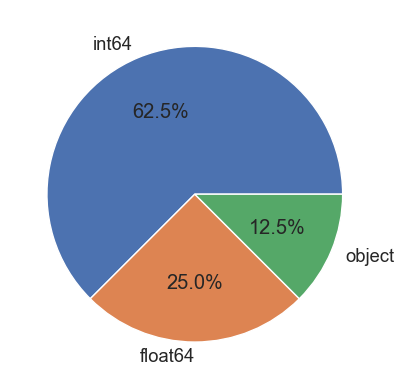

In [515]:
# Types des variables
get_types_variables(POS_CASH_balance, True, False, True)

##### Feature engineering - POS_CASH_balance :

In [516]:
# Ratio : DPD (jours de retard) au cours du mois du crédit précédent \
#         DPD au cours du mois avec tolérance (les dettes de faible
#         montant sont ignorées) du crédit précédent
POS_CASH_balance['SK_DPD_RATIO'] = POS_CASH_balance['SK_DPD'] / (POS_CASH_balance['SK_DPD_DEF'] + 0.00001)
# Somme : Nombre d'échéances payées sur le crédit précédent +
#         Versements restant à payer sur le crédit précédent
POS_CASH_balance['TOTAL_TERM'] = POS_CASH_balance['CNT_INSTALMENT'] + \
    POS_CASH_balance['CNT_INSTALMENT_FUTURE']

In [517]:
#Variable quantitative
# Ajout des variables de statistiques
dico_agg_pos = {'MONTHS_BALANCE' : ['min', 'max','size'],
                'CNT_INSTALMENT' : ['mean', 'max','min'],
                'CNT_INSTALMENT_FUTURE' : ['mean','max','min'],
                'SK_DPD' : ['mean', 'max', 'sum'],
                'SK_DPD_DEF' : ['mean', 'max','sum'],
                # Nouvelles Features
                'SK_DPD_RATIO' : ['mean','max'],
                'TOTAL_TERM' : ['mean','max','last'],}

agg_pos_num = agg_var_num(POS_CASH_balance.drop(columns=['SK_ID_PREV']),
                                     'SK_ID_CURR', dico_agg_pos, 'POS_CASH')

print(f'{agg_pos_num.shape}')
agg_pos_num.head()



(337252, 21)


,SK_ID_CURR,POS_CASH_MONTHS_BALANCE_MIN,POS_CASH_MONTHS_BALANCE_MAX,POS_CASH_MONTHS_BALANCE_SIZE,POS_CASH_CNT_INSTALMENT_MEAN,POS_CASH_CNT_INSTALMENT_MAX,POS_CASH_CNT_INSTALMENT_MIN,POS_CASH_CNT_INSTALMENT_FUTURE_MEAN,POS_CASH_CNT_INSTALMENT_FUTURE_MAX,POS_CASH_CNT_INSTALMENT_FUTURE_MIN,...,POS_CASH_SK_DPD_MAX,POS_CASH_SK_DPD_SUM,POS_CASH_SK_DPD_DEF_MEAN,POS_CASH_SK_DPD_DEF_MAX,POS_CASH_SK_DPD_DEF_SUM,POS_CASH_SK_DPD_RATIO_MEAN,POS_CASH_SK_DPD_RATIO_MAX,POS_CASH_TOTAL_TERM_MEAN,POS_CASH_TOTAL_TERM_MAX,POS_CASH_TOTAL_TERM_LAST
0,100001,-96,-53,9,4.000000,4.0,4.0,1.444444,4.0,0.0,...,7,7,0.777778,7,7,0.111111,0.999999,5.444444,8.0,7.0
1,100002,-19,-1,19,24.000000,24.0,24.0,15.000000,24.0,6.0,...,0,0,0.000000,0,0,0.000000,0.000000,39.000000,48.0,44.0
2,100003,-77,-18,28,10.107143,12.0,6.0,5.785714,12.0,0.0,...,0,0,0.000000,0,0,0.000000,0.000000,15.892857,24.0,12.0
3,100004,-27,-24,4,3.750000,4.0,3.0,2.250000,4.0,0.0,...,0,0,0.000000,0,0,0.000000,0.000000,6.000000,8.0,7.0
4,100005,-25,-15,11,11.700000,12.0,9.0,7.200000,12.0,0.0,...,0,0,0.000000,0,0,0.000000,0.000000,18.900000,24.0,9.0


In [518]:
# Sauvegarde de agg_pos_num
fic_sav_agg_pos_num = 'Pickle/agg_pos_num.pickle'
with open(fic_sav_agg_pos_num, 'wb') as f:
    pickle.dump(agg_pos_num, f, pickle.HIGHEST_PROTOCOL)
agg_pos_num.shape

(337252, 21)

In [519]:
# Chargement de agg_pos_num
fic_sav_agg_pos_num = 'Pickle/agg_pos_num.pickle'
with open(fic_sav_agg_pos_num, 'rb') as df_agg_pos_num:
    agg_pos_num = pickle.load(df_agg_pos_num)
agg_pos_num.shape

(337252, 21)

In [520]:
agg_pos_cat = agg_var_cat(POS_CASH_balance,
                        'SK_ID_CURR', 'POS_CASH')
print(f'{agg_pos_cat.shape}')
agg_pos_cat.head()

(337252, 27)


,POS_CASH_NAME_CONTRACT_STATUS_Active_sum,POS_CASH_NAME_CONTRACT_STATUS_Active_count,POS_CASH_NAME_CONTRACT_STATUS_Active_mean,POS_CASH_NAME_CONTRACT_STATUS_Amortized debt_sum,POS_CASH_NAME_CONTRACT_STATUS_Amortized debt_count,POS_CASH_NAME_CONTRACT_STATUS_Amortized debt_mean,POS_CASH_NAME_CONTRACT_STATUS_Approved_sum,POS_CASH_NAME_CONTRACT_STATUS_Approved_count,POS_CASH_NAME_CONTRACT_STATUS_Approved_mean,POS_CASH_NAME_CONTRACT_STATUS_Canceled_sum,...,POS_CASH_NAME_CONTRACT_STATUS_Demand_mean,POS_CASH_NAME_CONTRACT_STATUS_Returned to the store_sum,POS_CASH_NAME_CONTRACT_STATUS_Returned to the store_count,POS_CASH_NAME_CONTRACT_STATUS_Returned to the store_mean,POS_CASH_NAME_CONTRACT_STATUS_Signed_sum,POS_CASH_NAME_CONTRACT_STATUS_Signed_count,POS_CASH_NAME_CONTRACT_STATUS_Signed_mean,POS_CASH_NAME_CONTRACT_STATUS_XNA_sum,POS_CASH_NAME_CONTRACT_STATUS_XNA_count,POS_CASH_NAME_CONTRACT_STATUS_XNA_mean
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,7,9,0.777778,0,9,0.0,0,9,0.0,0,...,0.0,0,9,0.0,0,9,0.000000,0,9,0.0
100002,19,19,1.000000,0,19,0.0,0,19,0.0,0,...,0.0,0,19,0.0,0,19,0.000000,0,19,0.0
100003,26,28,0.928571,0,28,0.0,0,28,0.0,0,...,0.0,0,28,0.0,0,28,0.000000,0,28,0.0
100004,3,4,0.750000,0,4,0.0,0,4,0.0,0,...,0.0,0,4,0.0,0,4,0.000000,0,4,0.0
100005,9,11,0.818182,0,11,0.0,0,11,0.0,0,...,0.0,0,11,0.0,1,11,0.090909,0,11,0.0


In [521]:
# Sauvegarde de agg_pos_cat
fic_sav_agg_pos_cat = 'Pickle/agg_pos_cat.pickle'
with open(fic_sav_agg_pos_cat, 'wb') as f:
    pickle.dump(agg_pos_cat, f, pickle.HIGHEST_PROTOCOL)
agg_pos_cat.shape

(337252, 27)

In [522]:
# Chargement de agg_pos_cat
fic_sav_agg_pos_cat = 'Pickle/agg_pos_cat.pickle'
with open(fic_sav_agg_pos_cat, 'rb') as df_agg_pos_cat:
    agg_pos_cat = pickle.load(df_agg_pos_cat)
agg_pos_cat.shape

(337252, 27)

##### Assemblage avec le train_set et test.set:

In [523]:
# Dimensions avant merge
print(f'train_set : {train_set.shape}')
print(f'agg_pos_cat : {agg_pos_cat.shape}')
print(f'agg_pos_num : {agg_pos_num.shape}')

train_set : (307507, 272)
agg_pos_cat : (337252, 27)
agg_pos_num : (337252, 21)


In [524]:
# Merge variables catégorielles
train_set = train_set.merge(agg_pos_cat, on='SK_ID_CURR',
                            how='left')
print(f'train_set : {train_set.shape}')

train_set : (307507, 299)


In [525]:
# Merge variables numériques
train_set = train_set.merge(agg_pos_num, on='SK_ID_CURR', how='left')
print(f'train_set : {train_set.shape}')

train_set : (307507, 319)


In [526]:
# Description
description_variables(train_set)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,POS_CASH_SK_DPD_MAX,POS_CASH_SK_DPD_SUM,POS_CASH_SK_DPD_DEF_MEAN,POS_CASH_SK_DPD_DEF_MAX,POS_CASH_SK_DPD_DEF_SUM,POS_CASH_SK_DPD_RATIO_MEAN,POS_CASH_SK_DPD_RATIO_MAX,POS_CASH_TOTAL_TERM_MEAN,POS_CASH_TOTAL_TERM_MAX,POS_CASH_TOTAL_TERM_LAST
type,int64,int64,int32,int32,int8,int8,int64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,18067.0,18067.0,18067.0,18067.0,18067.0,18067.0,18067.0,18091.0,18091.0,18091.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.018418,0.018418,0.018418,0.018418,0.018418,0.018418,0.018418,0.018442,0.018442,0.018442
count,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,...,289440.0,289440.0,289440.0,289440.0,289440.0,289440.0,289440.0,289416.0,289416.0,289416.0
mean,278181.527256,0.08073,0.095201,0.341648,0.659894,0.306331,0.417047,168797.685779,599028.596733,27108.580714,...,15.697848,351.390886,0.214866,1.468847,17.223729,418435.603895,1428875.545033,23.818094,40.678812,20.059275
std,102790.132982,0.27242,0.293493,0.474263,0.473745,0.46097,0.722119,237124.62732,402492.601859,14493.522125,...,153.170295,5678.175487,12.926394,30.609797,1384.549027,5898486.438229,15020632.804834,14.335383,27.938365,15.463657
min,100002.0,0.0,0.0,0.0,0.0,0.0,0.0,25650.0,45000.0,1615.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
25%,189146.5,0.0,0.0,0.0,0.0,0.0,0.0,112500.0,270000.0,16524.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.709677,24.0,11.0
50%,278203.0,0.0,0.0,0.0,1.0,0.0,0.0,147150.0,513531.0,24903.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.636364,24.0,16.0
75%,367143.5,0.0,0.0,1.0,1.0,1.0,1.0,202500.0,808650.0,34596.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.16129,48.0,24.0


In [527]:
# Assemlbage avec le "test_set"
# Dimensions avant merge
print(f'test_set : {test_set.shape}')
print(f'agg_pos_cat : {agg_pos_cat.shape}')
print(f'agg_pos_num : {agg_pos_num.shape}')

test_set : (48744, 1013)
agg_pos_cat : (337252, 27)
agg_pos_num : (337252, 21)


In [528]:
# Merge variables catégorielles
test_set = test_set.merge(agg_pos_cat, on='SK_ID_CURR', how='left')
print(f'test_set : {test_set.shape}')

test_set : (48744, 1040)


In [529]:
# Merge variables numériques
test_set = test_set.merge(agg_pos_num, on='SK_ID_CURR', how='left')
print(f'test_set : {test_set.shape}')

test_set : (48744, 1060)


In [530]:
# Description
description_variables(test_set)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,...,POS_CASH_SK_DPD_MAX,POS_CASH_SK_DPD_SUM,POS_CASH_SK_DPD_DEF_MEAN,POS_CASH_SK_DPD_DEF_MAX,POS_CASH_SK_DPD_DEF_SUM,POS_CASH_SK_DPD_RATIO_MEAN,POS_CASH_SK_DPD_RATIO_MAX,POS_CASH_TOTAL_TERM_MEAN,POS_CASH_TOTAL_TERM_MAX,POS_CASH_TOTAL_TERM_LAST
type,int64,int32,int32,int8,int8,int64,float64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,936.0,936.0,936.0,936.0,936.0,936.0,936.0,940.0,940.0,940.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.001812,0.001812,0.001812,0.001812,0.001812,0.001812,0.001812,0.001819,0.001819,0.001819
count,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,...,47808.0,47808.0,47808.0,47808.0,47808.0,47808.0,47808.0,47804.0,47804.0,47804.0
mean,277796.67635,0.009006,0.3296,0.662871,0.309495,0.397054,178431.805855,516740.435561,29424.651219,0.021226,...,12.850966,300.754142,0.289685,1.500753,32.637529,333415.087056,1140070.819547,23.914205,40.672622,19.988537
std,103169.547296,0.094474,0.470073,0.472734,0.46229,0.709047,101522.591536,365397.004174,16012.584824,0.014428,...,139.760535,5465.353125,16.865759,41.281338,2199.508953,5285699.484361,13362297.265529,14.114809,27.362758,15.173353
min,100001.0,0.0,0.0,0.0,0.0,0.0,26941.5,45000.0,2295.0,0.000253,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
25%,188557.75,0.0,0.0,0.0,0.0,0.0,112500.0,260640.0,17973.0,0.010006,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.85,24.0,11.0
50%,277549.0,0.0,0.0,1.0,0.0,0.0,157500.0,450000.0,26199.0,0.01885,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.8,24.0,16.0
75%,367555.5,0.0,1.0,1.0,1.0,1.0,225000.0,675000.0,37390.5,0.028663,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.321429,48.0,24.0


Nettoyage

Au vu du nombre déjà élevé de variables, nous allons gérer la suppression des variables fortement colinéaires et l'imputation au fur et à mesure plutôt que de le faire après avoir mergé toutes les données.


In [531]:
# Gestion des variables fortement corrélées à supprimer train set
var_corr_train_set = suppr_var_colineaire(train_set)

27 variables fortement corrélées à supprimer :

POS_CASH_NAME_CONTRACT_STATUS_Active_count
POS_CASH_NAME_CONTRACT_STATUS_Amortized debt_count
POS_CASH_NAME_CONTRACT_STATUS_Amortized debt_mean
POS_CASH_NAME_CONTRACT_STATUS_Approved_count
POS_CASH_NAME_CONTRACT_STATUS_Canceled_count
POS_CASH_NAME_CONTRACT_STATUS_Completed_count
POS_CASH_NAME_CONTRACT_STATUS_Completed_mean
POS_CASH_NAME_CONTRACT_STATUS_Demand_count
POS_CASH_NAME_CONTRACT_STATUS_Demand_mean
POS_CASH_NAME_CONTRACT_STATUS_Returned to the store_count
POS_CASH_NAME_CONTRACT_STATUS_Signed_count
POS_CASH_NAME_CONTRACT_STATUS_XNA_count
POS_CASH_NAME_CONTRACT_STATUS_XNA_mean
POS_CASH_MONTHS_BALANCE_MIN
POS_CASH_MONTHS_BALANCE_MAX
POS_CASH_MONTHS_BALANCE_SIZE
POS_CASH_CNT_INSTALMENT_MAX
POS_CASH_CNT_INSTALMENT_FUTURE_MEAN
POS_CASH_CNT_INSTALMENT_FUTURE_MAX
POS_CASH_SK_DPD_MAX
POS_CASH_SK_DPD_SUM
POS_CASH_SK_DPD_DEF_MAX
POS_CASH_SK_DPD_DEF_SUM
POS_CASH_SK_DPD_RATIO_MEAN
POS_CASH_SK_DPD_RATIO_MAX
POS_CASH_TOTAL_TERM_MEAN
POS_CASH_TOT

In [532]:
var_corr_test_set = suppr_var_colineaire(test_set)

27 variables fortement corrélées à supprimer :

POS_CASH_NAME_CONTRACT_STATUS_Active_count
POS_CASH_NAME_CONTRACT_STATUS_Amortized debt_count
POS_CASH_NAME_CONTRACT_STATUS_Amortized debt_mean
POS_CASH_NAME_CONTRACT_STATUS_Approved_count
POS_CASH_NAME_CONTRACT_STATUS_Canceled_count
POS_CASH_NAME_CONTRACT_STATUS_Canceled_mean
POS_CASH_NAME_CONTRACT_STATUS_Completed_count
POS_CASH_NAME_CONTRACT_STATUS_Completed_mean
POS_CASH_NAME_CONTRACT_STATUS_Demand_count
POS_CASH_NAME_CONTRACT_STATUS_Demand_mean
POS_CASH_NAME_CONTRACT_STATUS_Returned to the store_count
POS_CASH_NAME_CONTRACT_STATUS_Signed_count
POS_CASH_NAME_CONTRACT_STATUS_XNA_count
POS_CASH_MONTHS_BALANCE_MIN
POS_CASH_MONTHS_BALANCE_MAX
POS_CASH_MONTHS_BALANCE_SIZE
POS_CASH_CNT_INSTALMENT_MAX
POS_CASH_CNT_INSTALMENT_FUTURE_MEAN
POS_CASH_CNT_INSTALMENT_FUTURE_MAX
POS_CASH_SK_DPD_MAX
POS_CASH_SK_DPD_SUM
POS_CASH_SK_DPD_DEF_MAX
POS_CASH_SK_DPD_DEF_SUM
POS_CASH_SK_DPD_RATIO_MEAN
POS_CASH_SK_DPD_RATIO_MAX
POS_CASH_TOTAL_TERM_MEAN
POS_CAS

In [533]:
# Suppression des variables fortement corrélées du train set
train_set = train_set.drop(columns=var_corr_train_set)
print(f'train_set : {train_set.shape}')

train_set : (307507, 292)


In [534]:
# Suppression des variables fortement corrélées du test set
test_set = test_set.drop(columns=var_corr_train_set)
print(f'test_set : {test_set.shape}')

test_set : (48744, 1033)


In [535]:
#Valeur manquante: 
train_set.name = 'train_set'

# Valeurs manquantes du dataframe train_set
cols_nan_a_suppr = get_missing_values_sup_seuil(train_set)

train_set - Aucune variable à supprimer


In [536]:
test_set.name = 'test_set'

# Valeurs manquantes du dataframe test_set
cols_nan_a_suppr_test = get_missing_values_sup_seuil(test_set)

test_set - Aucune variable à supprimer


##### Imputation par median : train_set et test.set

In [537]:
# Variables quantitatives - imputation par médiane
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
train_set.fillna(train_set.median(), inplace=True)
# Vérification
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 361436
Nombre de nan après imputation par median : 0


In [538]:
# Variables quantitatives - imputation par médiane
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
test_set.fillna(test_set.median(), inplace=True)
# Vérification
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 18736
Nombre de nan après imputation par median : 0


In [540]:
# Sauvegarde de train_set après pré processing posh_cash_balance
fic_sav_train_set_pos = 'Pickle/train_set_pos.pickle'
with open(fic_sav_train_set_pos, 'wb') as f:
    pickle.dump(train_set, f, pickle.HIGHEST_PROTOCOL)

In [539]:
# Sauvegarde de test_set après pré processing posh_cash_balance
fic_sav_test_set_pos = 'Pickle/test_set_pos.pickle'
with open(fic_sav_test_set_pos, 'wb') as f:
    pickle.dump(test_set, f, pickle.HIGHEST_PROTOCOL)

In [541]:
fic_sav_train_set_pos = 'Pickle/train_set_pos.pickle'
# Chargement de train_set
with open(fic_sav_train_set_pos, 'rb') as df_appli_train_set_pos:
    train_set = pickle.load(df_appli_train_set_pos)
train_set.shape

(307507, 292)

In [542]:
fic_sav_test_set_pos = 'Pickle/test_set_pos.pickle'
# Chargement de test_set
with open(fic_sav_test_set_pos, 'rb') as df_appli_test_set_pos:
    test_set = pickle.load(df_appli_test_set_pos)
test_set.shape

(48744, 1033)

------
##### Dataset - previous_applications.csv



Présentation
Fichier 	Description
_____
previous_application.csv
	

    Toutes les demandes précédentes de prêts pour le crédit immobilier des clients qui ont des prêts dans notre échantillon.
    Il y a une ligne pour chaque demande antérieure liée aux prêts dans notre échantillon de données.
________
Description des variables
Variable 	Description 	Liste valeurs
__________
SK_ID_PREV
	

    ID du crédit précédent dans le crédit immobilier lié au prêt dans notre échantillon.
    Un prêt dans notre échantillon peut avoir 0, 1, 2 ou plus de prêts précédents dans Home Credit.

	
________
SK_ID_CURR
	

ID du prêt dans notre échantillon.
	
________
NAME_CONTRACT_TYPE
	

Type de produit contractuel (prêt d'argent ou prêt à la consommation [POS]...) de la demande précédente.
	

    Consumer loans
    Cash loans
    Revolving loans
    XNA
________
AMT_ANNUITY
	

Annuité de la demande précédente
	
______
AMT_APPLICATION
	

Pour quel montant de crédit le client a-t-il demandé lors de la demande précédente ?
	
_____
AMT_CREDIT
	

    Montant final du crédit sur la demande précédente.
    Il diffère de AMT_APPLICATION dans la mesure où AMT_APPLICATION est le montant pour lequel le client a initialement fait une demande mais au cours de notre processus d'approbation il aurait pu recevoir un montant différent : AMT_CREDIT.

	
_______
AMT_DOWN_PAYMENT
	

Acompte sur la demande précédente.
	
______
AMT_GOODS_PRICE
	

Prix du bien que le client a demandé (le cas échéant) sur la demande précédente.
	
_________
WEEKDAY_APPR_PROCESS_START
	

Quel jour de la semaine le client a-t-il fait la demande précédente ?
	

    SATURDAY
    FRIDAY
    SUNDAY
    THURSDAY
    TUESDAY
    MONDAY
    WEDNESDAY
_______
HOUR_APPR_PROCESS_START
	

À quelle heure environ le client a-t-il fait sa demande pour la demande précédente ?
	
_______
FLAG_LAST_APPL_PER_CONTRACT
	

    Indicateur si c'était la dernière demande pour le contrat précédent.
    Parfois par erreur du client ou de notre greffier il peut y avoir plusieurs demandes pour un seul contrat.

	
________
NFLAG_LAST_APPL_IN_DAY
	

    Indicateur indiquant si la demande était la dernière demande par jour du client.
    Il arrive que les clients postulent pour plusieurs demandes par jour.
    Dans de rares cas il peut aussi s'agir d'une erreur de notre système qui fait qu'une demande figure deux fois dans la base de données.

	
_______
NFLAG_MICRO_CASH
	

Indicateur Micro finance loan.
	
_____
RATE_DOWN_PAYMENT
	

Taux d'acompte normalisé sur le crédit antérieur.
	
_______
RATE_INTEREST_PRIMARY
	

Taux d'intérêt normalisé sur le crédit antérieur.
	
________
RATE_INTEREST_PRIVILEGED
	

Taux d'intérêt normalisé sur le crédit antérieur.
	
________
NAME_CASH_LOAN_PURPOSE
	

Objectif du prêt d'argent.
	

    XAP
    XNA
    Other
    Payments on other loans
    Buying a used car
    Repairs
    Education
    Buying a new car
    Everyday expenses
    Medicine
    Car repairs
    Urgent needs
    Buying a holiday home / land
    Building a house or an annex
    Furniture
    Journey
    Purchase of electronic equipment
    Wedding / gift / holiday
    Buying a home
    Business development
    Gasification / water supply
    Buying a garage
    Hobby
    Money for a third person
    Refusal to name the goal
________
NAME_CONTRACT_STATUS
	

Statut du contrat (approuvé ou annulé ...) de la demande précédente.
	

    Approved
    Canceled
    Refused
    Unused offer
________
DAYS_DECISION
	

Par rapport à la demande actuelle quand la décision concernant la demande précédente a-t-elle été prise ?
	
________
NAME_PAYMENT_TYPE
	

Mode de paiement que le client a choisi pour payer la demande précédente.
	

    XNA
    Cash through the bank
    Non-cash from your account
    Cashless from the account of the employer
_________
CODE_REJECT_REASON
	

Pourquoi la demande précédente a-t-elle été rejetée ?
	

    XAP
    LIMIT
    HC
    SCO
    SCOFR
    VERIF
    CLIENT
    XNA
    SYSTEM
________
NAME_TYPE_SUITE
	

Qui a accompagné le client lors de la demande précédente ?
	

    Unaccompanied
    Family
    Spouse
    partner
    Children
    Other_A
    Other_B
    Group of people
_________
NAME_CLIENT_TYPE
	

Le client était-il un ancien ou un nouveau client lors de la demande précédente ?
	

    New
    Repeater
    Refreshed
    XNA
________
NAME_GOODS_CATEGORY
	

Quel type de marchandises le client a-t-il demandé dans la demande précédente ?
	

    Vehicles
    XNA
    Furniture
    Consumer Electronics
    Mobile
    Audio/Video
    Construction Materials
    Gardening
    Photo / Cinema Equipment
    Computers
    Clothing and Accessories
    Homewares
    Medical Supplies
    Other
    Jewelry
    Office Appliances
    Tourism
    Auto Accessories
    Sport and Leisure
    Medicine
    Weapon
    Direct Sales
    Fitness
    Insurance
    Additional Service
    Education
    Animals
_________
NAME_PORTFOLIO
	

Est-ce que l'application précédente était pour CASH ou POS ou CAR ...
	

    POS
    Cash
    XNA
    Cards
    Cars
_______
NAME_PRODUCT_TYPE
	

L'application précédente était-elle x-sell o walk-in?
	

    XNA
    x-sell
    walk-in
______
CHANNEL_TYPE
	

Par quel canal avons-nous acquis le client lors de la demande précédente ?
	

    Stone
    Credit and cash offices
    Country-wide
    Regional / Local
    AP+ (Cash loan)
    Contact center
    Channel of corporate sales
    Car dealer
________
SELLERPLACE_AREA
	

Zone de vente du vendeur lieu de la demande précédente
	
______
NAME_SELLER_INDUSTRY
	

Le secteur d'activité du vendeur
	ul style='text-align: justify;'>
Auto technology
XNA
Furniture
Consumer electronics
Connectivity
Construction
Clothing
Industry
Tourism
Jewelry
MLM partners
______
CNT_PAYMENT
	

Durée du crédit précédent à la demande de la demande précédente.
	
________
NAME_YIELD_GROUP
	

Taux d'intérêt groupé en petit moyen et élevé de la demande précédente.
	

    low_normal
    middle
    XNA
    high
    low_action
_______
PRODUCT_COMBINATION
	

Combinaison détaillée des produits de la demande précédente.
	

    POS other with interest
    Cash X-Sell: low
    POS industry with interest
    POS household with interest
    POS mobile without interest
    Card Street
    Card X-Sell
    Cash X-Sell: high
    Cash
    Cash Street: high
    Cash X-Sell: middle
    POS mobile with interest
    POS household without interest
    POS industry without interest
    Cash Street: low
    Cash Street: middle
    POS others without interest
________
DAYS_FIRST_DRAWING
	

Par rapport à la date de demande de la demande actuelle quand a eu lieu le premier déboursement de la demande précédente.
	
________
DAYS_FIRST_DUE
	

Par rapport à la date d'application de l'application actuelle quand la première échéance était-elle censée être celle de l'application précédente ?
	
_________
DAYS_LAST_DUE_1ST_VERSION
	

Par rapport à la date de demande de la demande actuelle quelle était la première échéance de la demande précédente ?
	
__________
DAYS_LAST_DUE
	

Par rapport à la date de demande de la demande actuelle quelle était la dernière date d'échéance de la demande précédente ?
	
________
DAYS_TERMINATION
	

Par rapport à la date d'application de l'application actuelle quand était prévue la fin de l'application précédente ?
	
________
NFLAG_INSURED_ON_APPROVAL
	

Le client a-t-il demandé une assurance lors de la demande précédente ?
____

In [543]:
# Taille : nombre de lignes/colonnes
nRow, nVar = previous_application.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 1670214 lignes et 37 variables.


In [544]:
# Variables quantitatives
cols_num_prev = previous_application.select_dtypes(include=[np.number]).columns.to_list()
cols_num_prev

['SK_ID_PREV',
 'SK_ID_CURR',
 'AMT_ANNUITY',
 'AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_DOWN_PAYMENT',
 'AMT_GOODS_PRICE',
 'HOUR_APPR_PROCESS_START',
 'NFLAG_LAST_APPL_IN_DAY',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'DAYS_DECISION',
 'SELLERPLACE_AREA',
 'CNT_PAYMENT',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

In [545]:
# Variables catégorielles
cols_cat_prev = previous_application.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_prev

['NAME_CONTRACT_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION']

In [546]:
# Résumé des variables
desc_prev = description_variables(previous_application)
desc_prev

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
type,int64,int64,object,float64,float64,float64,float64,float64,object,int64,...,object,float64,object,object,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,372235.0,0.0,1.0,895844.0,385515.0,0.0,0.0,...,0.0,372230.0,0.0,346.0,673065.0,673065.0,673065.0,673065.0,673065.0,673065.0
%_nan,0.0,0.0,0.0,0.602342,0.0,0.000002,1.449635,0.623832,0.0,0.0,...,0.0,0.602334,0.0,0.00056,1.089139,1.089139,1.089139,1.089139,1.089139,1.089139
count,1670214.0,1670214.0,1670214,1297979.0,1670214.0,1670213.0,774370.0,1284699.0,1670214,1670214.0,...,1670214,1297984.0,1670214,1669868,997149.0,997149.0,997149.0,997149.0,997149.0,997149.0
unique,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,7,NaN,...,11,NaN,5,17,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,NaN,NaN,NaN,NaN,NaN,TUESDAY,NaN,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,747553,NaN,NaN,NaN,NaN,NaN,255118,NaN,...,855720,NaN,517215,285990,NaN,NaN,NaN,NaN,NaN,NaN
mean,1923089.135331,278357.174099,NaN,15955.120659,175233.86036,196114.021218,6697.402139,227847.279283,NaN,12.484182,...,NaN,16.054082,NaN,NaN,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.33257
std,532597.958696,102814.823849,NaN,14782.137335,292779.762387,318574.616546,20921.49541,315396.557937,NaN,3.334028,...,NaN,14.567288,NaN,NaN,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1000001.0,100001.0,NaN,0.0,0.0,0.0,-0.9,0.0,NaN,0.0,...,NaN,0.0,NaN,NaN,-2922.0,-2892.0,-2801.0,-2889.0,-2874.0,0.0


Remarque: 
- Plusieurs valeurs abérrantes : 
[DAYS_FIRST_DRAWING, DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, DAYS_TERMINATION]
-  [SELLERPLACE_AREA]


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             


----------------------------------------------------------
Répartition schématique des types de variable 



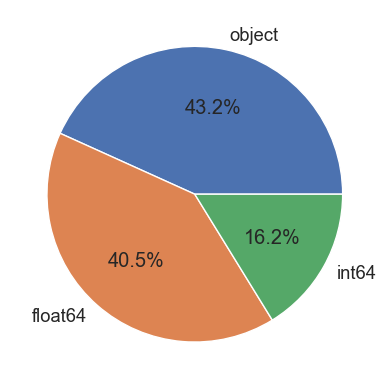

In [547]:
# Types des variables
get_types_variables(previous_application, True, False, True)

##### Correction des valeurs abérrantes : 
- dates / durée appérantes = 1000ans

In [548]:
#DAY_FIRST_DRAWING:
previous_application['DAYS_FIRST_DRAWING'][
    previous_application['DAYS_FIRST_DRAWING'] == 365243.0] = np.nan

In [549]:
#DAYS_FIRST_DUE
previous_application['DAYS_FIRST_DUE'][
    previous_application['DAYS_FIRST_DUE'] == 365243.0] = np.nan

In [550]:
#DAYS_LAST_DUE_1ST_VERSION
previous_application['DAYS_LAST_DUE_1ST_VERSION'][
    previous_application['DAYS_LAST_DUE_1ST_VERSION'] == 365243.0] = np.nan


In [551]:
#DAYS_LAST_DUE
previous_application['DAYS_LAST_DUE'][
    previous_application['DAYS_LAST_DUE'] == 365243.0] = np.nan

In [552]:
#DAYS_TERMINATION
previous_application['DAYS_TERMINATION'][
    previous_application['DAYS_TERMINATION'] == 365243.0] = np.nan

In [553]:
#SELLERPLACE_AREA
previous_application['SELLERPLACE_AREA'][
    previous_application['SELLERPLACE_AREA'] == 4000000] = np.nan

##### Feature engineering : 
- Label encodage des variables catégorielles avec peu de catégories

In [554]:
#NAME_CONTRACT_STATUS
name_contract_dict = {'Approved': 0,
                      'Refused': 3,
                      'Canceled': 2,
                      'Unused offer': 1}
previous_application['NAME_CONTRACT_STATUS'] = previous_application[
    'NAME_CONTRACT_STATUS'].map(name_contract_dict)

In [555]:
#NAME_YIELD_GROUP
yield_group_dict = {'XNA': 0,
                    'low_action': 1,
                    'low_normal': 2,
                    'middle': 3,
                    'high': 4}
previous_application['NAME_YIELD_GROUP'] = previous_application[
    'NAME_YIELD_GROUP'].map(yield_group_dict)

In [556]:
#FLAG_LAST_APPL_PER_CONTRACT
appl_per_contract_last_dict = {'Y': 1,
                               'N': 0}
previous_application['FLAG_LAST_APPL_PER_CONTRACT'] = previous_application[
    'FLAG_LAST_APPL_PER_CONTRACT'].map(appl_per_contract_last_dict)

Création des variables:

In [557]:
# Ratio : montant de crédit demandé lors de la demande précédente \
#         Montant final du crédit sur la demande précédente
previous_application['AMT_CREDIT_APPLICATION_RATIO'] = previous_application[
    'AMT_APPLICATION'] / (previous_application['AMT_CREDIT'] + 0.00001)
# Différence : montant de crédit demandé lors de la demande précédente -
#              Montant final du crédit sur la demande précédente
previous_application['AMT_DECLINED'] = previous_application[
    'AMT_APPLICATION'] - previous_application['AMT_CREDIT']

# Ratio : Montant final du crédit sur la demande précédente \
#         Prix du bien demandé (le cas échéant) sur la demande précédente
previous_application['AMT_CREDIT_GOODS_RATIO'] = previous_application[
    'AMT_CREDIT'] / (previous_application['AMT_GOODS_PRICE'] + 0.00001)
# Différence : Montant final du crédit sur la demande précédente
#              Prix du bien demandé (le cas échéant) sur la demande
#              précédente
previous_application['AMT_CREDIT_GOODS_DIFF'] = previous_application[
    'AMT_CREDIT'] - previous_application['AMT_GOODS_PRICE']

# Ratio : Acompte sur la demande précédente \
#         Montant final du crédit sur la demande précédente
previous_application['CREDIT_DOWNPAYMENT_RATIO'] = previous_application[
    'AMT_DOWN_PAYMENT'] / (previous_application['AMT_CREDIT'] + 0.00001)

# Ratio : Acompte sur la demande précédente \
#         Prix du bien demandé (le cas échéant) sur la demande précédente
previous_application['GOOD_DOWNPAYMET_RATIO'] = previous_application[
    'AMT_DOWN_PAYMENT'] / (previous_application['AMT_GOODS_PRICE'] + 0.00001)

# Multiplication : Taux d'acompte normalisé sur le crédit antérieur,
#                  Acompte sur la demande précédente
previous_application['INTEREST_DOWNPAYMENT'] = previous_application[
    'RATE_DOWN_PAYMENT'] * previous_application['AMT_DOWN_PAYMENT']

# Multiplication : Montant final du crédit sur la demande précédente
#                  Taux d'intérêt normalisé sur le crédit antérieur
previous_application['INTEREST_CREDIT'] = previous_application[
    'AMT_CREDIT'] * previous_application['RATE_INTEREST_PRIMARY']

# Multiplication : Montant final du crédit sur la demande précédente
#                  Taux d'intérêt normalisé sur le crédit antérieur
previous_application['INTEREST_CREDIT_PRIVILEGED'] = previous_application[
    'AMT_CREDIT'] * previous_application['RATE_INTEREST_PRIVILEGED']

# Ratio : montant de crédit demandé lors de la demande précédente \
#         nombre de jours pour prendre la décision
previous_application['APPLICATION_AMT_TO_DECISION_RATIO'] = \
    previous_application['AMT_APPLICATION'] / (previous_application[
        'DAYS_DECISION'] + 0.00001) * -1

# Ratio : montant de crédit demandé lors de la demande précédente \
#         Zone de vente du vendeur
previous_application['AMT_APPLICATION_TO_SELLERPLACE_AREA'] = \
    previous_application['AMT_APPLICATION'] / (previous_application[
        'SELLERPLACE_AREA'] + 0.00001)

# Ratio : Montant final du crédit sur la demande précédente \
#         Durée du crédit précédent à la demande de la demande précédente
previous_application['ANNUITY'] = previous_application['AMT_CREDIT'] / \
    (previous_application['CNT_PAYMENT'] + 0.00001)

# Ratio : Prix du bien demandé (le cas échéant) sur la demande précédente
#         Durée du crédit précédent
previous_application['ANNUITY_GOODS'] = previous_application[
        'AMT_GOODS_PRICE'] / (previous_application['CNT_PAYMENT'] + 0.00001)

# Différence : Par rapport à la date de demande de la demande actuelle
#              quelle était la première échéance de la demande précédente? \
#              Par rapport à la date d'application de l'application
#              actuelle quand la première échéance était-elle censée être
#              celle de l'application précédente ?
previous_application['DAYS_FIRST_LAST_DUE_DIFF'] = previous_application[
    'DAYS_LAST_DUE'] - previous_application['DAYS_FIRST_DUE']

# Multiplication : Montant final du crédit sur la demande précédente *
#                  Indicateur indiquant si la demande était la dernière
#                  demande par jour du client
previous_application['AMT_CREDIT_NFLAG_LAST_APPL_DAY'] = \
    previous_application['AMT_CREDIT'] * previous_application[
    'NFLAG_LAST_APPL_IN_DAY']

# Multiplication : Montant final du crédit sur la demande précédente *
#                  Taux d'intérêt groupé en petit moyen et élevé de la
#                  demande précédente
previous_application['AMT_CREDIT_YIELD_GROUP'] = previous_application[
    'AMT_CREDIT'] * previous_application['NAME_YIELD_GROUP']

# Ratio : Annuité de prêt /
#         Montant final du crédit sur la demande précédente
previous_application['LOAN_RATE'] = previous_application[
    'AMT_ANNUITY'] / previous_application['AMT_CREDIT']

# 
previous_application['AMT_INTEREST'] = previous_application[
    'CNT_PAYMENT'] * previous_application[
    'AMT_ANNUITY'] - previous_application['AMT_CREDIT']
previous_application['INTEREST_SHARE'] = previous_application[
    'AMT_INTEREST'] / (previous_application['AMT_CREDIT'] + 0.00001)
previous_application['INTEREST_RATE'] = 2 * 12 * previous_application[
    'AMT_INTEREST'] / (previous_application[
        'AMT_CREDIT'] * (previous_application['CNT_PAYMENT'] + 1))

In [559]:
# Ajout des variables de statistiques
dico_agg_prev = {'AMT_ANNUITY' : ['mean', 'sum', 'min', 'max'],
                 'AMT_APPLICATION' : ['mean', 'sum', 'min', 'max'],
                 'AMT_CREDIT' : ['mean', 'sum', 'min', 'max'],
                 'AMT_DOWN_PAYMENT' : ['mean', 'max', 'sum'],
                 'AMT_GOODS_PRICE' : ['mean', 'sum', 'min', 'max'],
                 'HOUR_APPR_PROCESS_START' : ['mean', 'min', 'max'],
                 'FLAG_LAST_APPL_PER_CONTRACT' : ['mean', 'sum'],
                 'NFLAG_LAST_APPL_IN_DAY' : ['mean', 'sum'],
                 'RATE_DOWN_PAYMENT' : ['mean', 'min', 'max'],
                 'RATE_INTEREST_PRIMARY' : ['mean', 'max'],
                 'RATE_INTEREST_PRIVILEGED' : ['mean', 'max'],
                 'NAME_CONTRACT_STATUS' : ['mean', 'max', 'last'],
                 'DAYS_DECISION' : ['mean', 'min', 'max'],
                 'SELLERPLACE_AREA' : ['mean', 'max', 'min', 'sum'],
                 'CNT_PAYMENT' : ['sum', 'mean', 'max'],
                 'NAME_YIELD_GROUP' : ['mean', 'last'],
                 'DAYS_FIRST_DRAWING' : ['mean', 'max'],
                 'DAYS_FIRST_DUE' : ['mean', 'max', 'sum'],
                 'DAYS_LAST_DUE_1ST_VERSION' : ['mean'],
                 'DAYS_LAST_DUE' : ['mean', 'max'],
                 'DAYS_TERMINATION' : ['mean', 'max'],
                 'NFLAG_INSURED_ON_APPROVAL' : ['sum'],
                 # Nouvelles Features
                 'AMT_DECLINED' : ['mean','max', 'sum'],
                 'AMT_CREDIT_GOODS_RATIO' : ['mean', 'max', 'min'],
                 'AMT_CREDIT_GOODS_DIFF' : ['sum', 'mean', 'max', 'min'],
                 'AMT_CREDIT_APPLICATION_RATIO' : ['mean', 'min'],
                 'CREDIT_DOWNPAYMENT_RATIO' : ['mean', 'max'],
                 'GOOD_DOWNPAYMET_RATIO' : ['mean', 'max'],
                 'INTEREST_DOWNPAYMENT' : ['mean', 'sum', 'max'],
                 'INTEREST_CREDIT' : ['mean', 'sum', 'max'],
                 'INTEREST_CREDIT_PRIVILEGED' : ['mean', 'sum', 'max'],
                 'APPLICATION_AMT_TO_DECISION_RATIO' : ['mean', 'min'],
                 'AMT_APPLICATION_TO_SELLERPLACE_AREA' : ['mean', 'max'],
                 'ANNUITY' : ['mean', 'sum', 'max'],
                 'ANNUITY_GOODS' : ['mean', 'sum', 'max'],
                 'LOAN_RATE': ['max', 'mean'],
                 'DAYS_FIRST_LAST_DUE_DIFF' : ['mean', 'max'],
                 'AMT_CREDIT_NFLAG_LAST_APPL_DAY' : ['mean', 'max'],
                 'AMT_CREDIT_YIELD_GROUP' : ['mean', 'sum', 'min'],
                 'AMT_INTEREST' : ['mean', 'sum', 'max', 'min'],
                 'INTEREST_SHARE' : ['mean', 'max', 'min'],
                 'INTEREST_RATE' : ['mean', 'max', 'min']}

agg_prev_num = agg_var_num(previous_application.drop(columns=[
        'SK_ID_PREV']), 'SK_ID_CURR', dico_agg_prev, 'PREV_APP')

print(f'{agg_prev_num.shape}')
agg_prev_num.head()

(338857, 114)


,SK_ID_CURR,PREV_APP_AMT_ANNUITY_MEAN,PREV_APP_AMT_ANNUITY_SUM,PREV_APP_AMT_ANNUITY_MIN,PREV_APP_AMT_ANNUITY_MAX,PREV_APP_AMT_APPLICATION_MEAN,PREV_APP_AMT_APPLICATION_SUM,PREV_APP_AMT_APPLICATION_MIN,PREV_APP_AMT_APPLICATION_MAX,PREV_APP_AMT_CREDIT_MEAN,...,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_AMT_INTEREST_SUM,PREV_APP_AMT_INTEREST_MAX,PREV_APP_AMT_INTEREST_MIN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MEAN,PREV_APP_INTEREST_RATE_MAX,PREV_APP_INTEREST_RATE_MIN
0,100001,3951.000,3951.000,3951.000,3951.000,24835.50,24835.5,24835.5,24835.5,23787.00,...,7821.00,7821.00,7821.00,7821.00,0.328793,0.328793,0.328793,0.876781,0.876781,0.876781
1,100002,9251.775,9251.775,9251.775,9251.775,179055.00,179055.0,179055.0,179055.0,179055.00,...,42987.60,42987.60,42987.60,42987.60,0.240080,0.240080,0.240080,0.230477,0.230477,0.230477
2,100003,56553.990,169661.970,6737.310,98356.995,435436.50,1306309.5,68809.5,900000.0,484191.00,...,65321.55,195964.65,144401.94,12794.22,0.146201,0.188002,0.111200,0.328564,0.381257,0.257354
3,100004,5357.250,5357.250,5357.250,5357.250,24282.00,24282.0,24282.0,24282.0,20106.00,...,1323.00,1323.00,1323.00,1323.00,0.065801,0.065801,0.065801,0.315846,0.315846,0.315846
4,100005,4813.200,4813.200,4813.200,4813.200,22308.75,44617.5,0.0,44617.5,20076.75,...,17604.90,17604.90,17604.90,17604.90,0.438440,0.438440,0.438440,0.809428,0.809428,0.809428


In [560]:
# Sauvegarde de agg_prev_num
fic_sav_agg_prev_num = 'Pickle/agg_prev_num.pickle'
with open(fic_sav_agg_prev_num, 'wb') as f:
    pickle.dump(agg_prev_num, f, pickle.HIGHEST_PROTOCOL)
agg_prev_num.shape

(338857, 114)

In [561]:
# Chargement de agg_prev_num
fic_sav_agg_prev_num = 'Pickle/agg_prev_num.pickle'
with open(fic_sav_agg_prev_num, 'rb') as df_agg_prev_num:
    agg_prev_num = pickle.load(df_agg_prev_num)
agg_prev_num.shape

(338857, 114)

In [562]:
agg_prev_cat = agg_var_cat(previous_application,
                          'SK_ID_CURR', 'PREV_APP')
print(f'{agg_prev_cat.shape}')
agg_prev_cat.head()

(338857, 396)


,PREV_APP_NAME_CONTRACT_TYPE_Cash loans_sum,PREV_APP_NAME_CONTRACT_TYPE_Cash loans_count,PREV_APP_NAME_CONTRACT_TYPE_Cash loans_mean,PREV_APP_NAME_CONTRACT_TYPE_Consumer loans_sum,PREV_APP_NAME_CONTRACT_TYPE_Consumer loans_count,PREV_APP_NAME_CONTRACT_TYPE_Consumer loans_mean,PREV_APP_NAME_CONTRACT_TYPE_Revolving loans_sum,PREV_APP_NAME_CONTRACT_TYPE_Revolving loans_count,PREV_APP_NAME_CONTRACT_TYPE_Revolving loans_mean,PREV_APP_NAME_CONTRACT_TYPE_XNA_sum,...,PREV_APP_PRODUCT_COMBINATION_POS mobile with interest_mean,PREV_APP_PRODUCT_COMBINATION_POS mobile without interest_sum,PREV_APP_PRODUCT_COMBINATION_POS mobile without interest_count,PREV_APP_PRODUCT_COMBINATION_POS mobile without interest_mean,PREV_APP_PRODUCT_COMBINATION_POS other with interest_sum,PREV_APP_PRODUCT_COMBINATION_POS other with interest_count,PREV_APP_PRODUCT_COMBINATION_POS other with interest_mean,PREV_APP_PRODUCT_COMBINATION_POS others without interest_sum,PREV_APP_PRODUCT_COMBINATION_POS others without interest_count,PREV_APP_PRODUCT_COMBINATION_POS others without interest_mean
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,0,1,0.000000,1,1,1.000000,0,1,0.0,0,...,1.0,0,1,0.0,0,1,0.0,0,1,0.0
100002,0,1,0.000000,1,1,1.000000,0,1,0.0,0,...,0.0,0,1,0.0,1,1,1.0,0,1,0.0
100003,1,3,0.333333,2,3,0.666667,0,3,0.0,0,...,0.0,0,3,0.0,0,3,0.0,0,3,0.0
100004,0,1,0.000000,1,1,1.000000,0,1,0.0,0,...,0.0,1,1,1.0,0,1,0.0,0,1,0.0
100005,1,2,0.500000,1,2,0.500000,0,2,0.0,0,...,0.5,0,2,0.0,0,2,0.0,0,2,0.0


In [564]:
# Sauvegarde de agg_prev_cat
fic_sav_agg_prev_cat = 'Pickle/agg_prev_cat.pickle'
with open(fic_sav_agg_prev_cat, 'wb') as f:
    pickle.dump(agg_prev_cat, f, pickle.HIGHEST_PROTOCOL)
agg_prev_cat.shape

(338857, 396)

In [565]:
# Chargement de agg_prev_cat
fic_sav_agg_prev_cat = 'Pickle/agg_prev_cat.pickle'
with open(fic_sav_agg_prev_cat, 'rb') as df_agg_prev_cat:
    agg_prev_cat = pickle.load(df_agg_prev_cat)
agg_prev_cat.shape

(338857, 396)

##### Assemblage avec le "train_set":

In [566]:
# Dimensions avant merge
print(f'train_set : {train_set.shape}')
print(f'agg_prev_cat : {agg_prev_cat.shape}')
print(f'agg_prev_num : {agg_prev_num.shape}')

train_set : (307507, 292)
agg_prev_cat : (338857, 396)
agg_prev_num : (338857, 114)


In [567]:
# Merge variables catégorielles
train_set = train_set.merge(agg_prev_cat, on='SK_ID_CURR',
                            how='left')
print(f'train_set : {train_set.shape}')

train_set : (307507, 688)


In [568]:
# Merge variables numériques
train_set = train_set.merge(agg_prev_num, on='SK_ID_CURR', how='left')
print(f'train_set : {train_set.shape}')

train_set : (307507, 801)


In [569]:
# Description
description_variables(train_set)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_AMT_INTEREST_SUM,PREV_APP_AMT_INTEREST_MAX,PREV_APP_AMT_INTEREST_MIN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MEAN,PREV_APP_INTEREST_RATE_MAX,PREV_APP_INTEREST_RATE_MIN
type,int64,int64,int32,int32,int8,int8,int64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16871.0,16454.0,16871.0,16871.0,16871.0,16871.0,16871.0,16872.0,16872.0,16872.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.006849,0.00668,0.006849,0.006849,0.006849,0.006849,0.006849,0.00685,0.00685,0.00685
count,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,...,290636.0,291053.0,290636.0,290636.0,290636.0,290636.0,290636.0,290635.0,290635.0,290635.0
mean,278181.527256,0.08073,0.095201,0.341648,0.659894,0.306331,0.417047,168797.685779,599028.596733,27108.580714,...,67165.444946,345540.438602,226278.006048,-66379.628682,0.184356,0.465661,-0.208482,-1.89284,0.432884,-7.762798
std,102790.132982,0.27242,0.293493,0.474263,0.473745,0.46097,0.722119,237124.62732,402492.601859,14493.522125,...,144528.868605,902104.436179,341393.383212,191481.647476,0.268899,0.359843,0.571694,4.138553,2.084332,11.478643
min,100002.0,0.0,0.0,0.0,0.0,0.0,0.0,25650.0,45000.0,1615.5,...,-1350000.0,-7524257.13,-1350000.0,-2250000.0,-1.0,-1.0,-1.0,-24.0,-24.0,-24.0
25%,189146.5,0.0,0.0,0.0,0.0,0.0,0.0,112500.0,270000.0,16524.0,...,7369.0875,10877.4,17021.1375,-90000.0,0.086966,0.223401,-1.0,-3.603687,0.415326,-24.0
50%,278203.0,0.0,0.0,0.0,1.0,0.0,0.0,147150.0,513531.0,24903.0,...,21883.185,51553.62,52180.92,5185.26,0.202997,0.391997,0.099561,0.331791,0.662617,0.221687
75%,367143.5,0.0,0.0,1.0,1.0,1.0,1.0,202500.0,808650.0,34596.0,...,89393.31,361833.3,308874.24,12677.04,0.324483,0.65,0.192885,0.510548,0.794185,0.367457


##### Assemblage avec le "test_set":

In [570]:
# Dimensions avant merge
print(f'test_set : {test_set.shape}')
print(f'agg_prev_cat : {agg_prev_cat.shape}')
print(f'agg_prev_num : {agg_prev_num.shape}')

test_set : (48744, 1033)
agg_prev_cat : (338857, 396)
agg_prev_num : (338857, 114)


In [571]:
# Merge variables catégorielles
test_set = test_set.merge(agg_prev_cat, on='SK_ID_CURR', how='left')
print(f'test_set : {test_set.shape}')

test_set : (48744, 1429)


In [572]:
# Merge variables numériques
test_set = test_set.merge(agg_prev_num, on='SK_ID_CURR', how='left')
print(f'test_set : {test_set.shape}')

test_set : (48744, 1542)


In [573]:
# Description
description_variables(test_set)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,...,PREV_APP_AMT_INTEREST_MEAN,PREV_APP_AMT_INTEREST_SUM,PREV_APP_AMT_INTEREST_MAX,PREV_APP_AMT_INTEREST_MIN,PREV_APP_INTEREST_SHARE_MEAN,PREV_APP_INTEREST_SHARE_MAX,PREV_APP_INTEREST_SHARE_MIN,PREV_APP_INTEREST_RATE_MEAN,PREV_APP_INTEREST_RATE_MAX,PREV_APP_INTEREST_RATE_MIN
type,int64,int32,int32,int8,int8,int64,float64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1007.0,944.0,1007.0,1007.0,1007.0,1007.0,1007.0,1007.0,1007.0,1007.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00134,0.001256,0.00134,0.00134,0.00134,0.00134,0.00134,0.00134,0.00134,0.00134
count,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,...,47737.0,47800.0,47737.0,47737.0,47737.0,47737.0,47737.0,47737.0,47737.0,47737.0
mean,277796.67635,0.009006,0.3296,0.662871,0.309495,0.397054,178431.805855,516740.435561,29424.651219,0.021226,...,68254.290797,364275.518987,235944.848965,-77971.371388,0.171572,0.473009,-0.265406,-2.096609,0.524223,-8.893469
std,103169.547296,0.094474,0.470073,0.472734,0.46229,0.709047,101522.591536,365397.004174,16012.584824,0.014428,...,142025.326731,923959.273972,340176.303753,197610.962308,0.26156,0.345886,0.584885,3.990458,1.358365,11.815023
min,100001.0,0.0,0.0,0.0,0.0,0.0,26941.5,45000.0,2295.0,0.000253,...,-765000.0,-6467535.45,-765000.0,-1350000.0,-1.0,-1.0,-1.0,-24.0,-24.0,-24.0
25%,188557.75,0.0,0.0,0.0,0.0,0.0,112500.0,260640.0,17973.0,0.010006,...,6937.95375,9856.53,18731.7,-135000.0,0.068446,0.2234,-1.0,-4.340386,0.408346,-24.0
50%,277549.0,0.0,0.0,1.0,0.0,0.0,157500.0,450000.0,26199.0,0.01885,...,22956.66,55363.05,62533.8,4686.12,0.189787,0.392,0.088882,0.296294,0.624002,0.216753
75%,367555.5,0.0,1.0,1.0,1.0,1.0,225000.0,675000.0,37390.5,0.028663,...,95604.81,402290.955,333099.0,12564.9,0.311898,0.657063,0.176,0.482545,0.794171,0.341157



Remarque: Nettoyage

Au vu du nombre déjà élevé de variables, nous allons gérer la suppression des variables fortement colinéaires et l'imputation au fur et à mesure plutôt que de le faire après avoir mergé toutes les données.


In [574]:
# Gestion des variables fortement corrélées à supprimer train set
var_corr_train_set = suppr_var_colineaire(train_set)

242 variables fortement corrélées à supprimer :

PREV_APP_NAME_CONTRACT_TYPE_Cash loans_count
PREV_APP_NAME_CONTRACT_TYPE_Consumer loans_count
PREV_APP_NAME_CONTRACT_TYPE_Consumer loans_mean
PREV_APP_NAME_CONTRACT_TYPE_Revolving loans_count
PREV_APP_NAME_CONTRACT_TYPE_XNA_count
PREV_APP_NAME_CONTRACT_TYPE_XNA_mean
PREV_APP_WEEKDAY_APPR_PROCESS_START_FRIDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_MONDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_SATURDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_SUNDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_THURSDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_TUESDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_WEDNESDAY_count
PREV_APP_NAME_CASH_LOAN_PURPOSE_Building a house or an annex_count
PREV_APP_NAME_CASH_LOAN_PURPOSE_Business development_count
PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a garage_count
PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a holiday home / land_count
PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a home_count
PREV_APP_NAME_CASH_LOAN_PURPOSE_Bu

In [576]:
# Gestion des variables fortement corrélées à supprimer test set
var_corr_test_set = suppr_var_colineaire(test_set)

254 variables fortement corrélées à supprimer :

POS_CASH_NAME_CONTRACT_STATUS_Canceled_mean
PREV_APP_NAME_CONTRACT_TYPE_Cash loans_count
PREV_APP_NAME_CONTRACT_TYPE_Consumer loans_count
PREV_APP_NAME_CONTRACT_TYPE_Consumer loans_mean
PREV_APP_NAME_CONTRACT_TYPE_Revolving loans_count
PREV_APP_NAME_CONTRACT_TYPE_XNA_count
PREV_APP_NAME_CONTRACT_TYPE_XNA_mean
PREV_APP_WEEKDAY_APPR_PROCESS_START_FRIDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_MONDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_SATURDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_SUNDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_THURSDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_TUESDAY_count
PREV_APP_WEEKDAY_APPR_PROCESS_START_WEDNESDAY_count
PREV_APP_NAME_CASH_LOAN_PURPOSE_Building a house or an annex_count
PREV_APP_NAME_CASH_LOAN_PURPOSE_Business development_count
PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a garage_count
PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a garage_mean
PREV_APP_NAME_CASH_LOAN_PURPOSE_Buying a holiday home / 

In [577]:
# Suppression des variables fortement corrélées du train set
train_set = train_set.drop(columns=var_corr_train_set)
print(f'train_set : {train_set.shape}')

train_set : (307507, 559)


In [578]:
# Suppression des variables fortement corrélées du test set
test_set = test_set.drop(columns=var_corr_train_set)
print(f'test_set : {test_set.shape}')

test_set : (48744, 1300)


In [579]:
train_set.name = 'train_set'
# Valeurs manquantes du dataframe train_set
cols_nan_a_suppr = get_missing_values_sup_seuil(train_set)


train_set - Nombre de variables à supprimer : 4



['PREV_APP_RATE_INTEREST_PRIMARY_MEAN',
 'PREV_APP_RATE_INTEREST_PRIVILEGED_MEAN',
 'PREV_APP_INTEREST_CREDIT_MEAN',
 'PREV_APP_INTEREST_CREDIT_PRIVILEGED_MEAN']

In [580]:
# Suppression des variables > 90% nan du dataframe train_set
train_set = train_set.drop(columns=cols_nan_a_suppr)


In [581]:
print(f'train_set : {train_set.shape}')

train_set : (307507, 555)


In [584]:
def get_missing_values_sup_seuil(df_work, seuil=90):
    """Retourne les variables qui ont plus que seuil% de valeurs manquantes.
       @param in : df_work dataframe obligatoire
                   seuil : seuil (90% par défaut)
       @param out : cols_nan_a_suppr : liste des variables à supprimer
    """

    values = df_work.isnull().sum()
    percentage = 100 * values / len(df_work)
    table = pd.concat([values, percentage.round(2)], axis=1)
    table.columns = [
            'Nombres de valeurs manquantes',
            '% de valeurs manquantes']

    # Liste des variables ayant plus de 90% de valeurs manquantes
    cols_nan_a_suppr = table[table['% de valeurs manquantes'] > 90].index \
        .to_list()
    nbr_cols_a_suppr = len(cols_nan_a_suppr)
    if nbr_cols_a_suppr > 0:
        print(f'{df_work.name} - Nombre de variables à supprimer : {len(cols_nan_a_suppr)}\n')
        display(cols_nan_a_suppr)
    else:
        print(f'{df_work.name} - Aucune variable à supprimer')

    return cols_nan_a_suppr

In [588]:
## Suppression des variables > 90% nan du dataframe test_set
##train = train.drop(columns=to_drop)
#cols_nan_a_suppr_test = get_missing_values_sup_seuil(test_set)

In [589]:
## Suppression des variables > 90% nan du dataframe test_set
#train = train.drop(columns=to_drop)
#cols_nan_a_suppr_test = get_missing_values_sup_seuil(test_set)

In [586]:
# Suppression des variables > 90% nan du dataframe train_set
test_set = test_set.drop(columns=cols_nan_a_suppr)

In [587]:
print(f'test_set : {test_set.shape}')

test_set : (48744, 1296)


In [590]:
# Imputation par median: train.set
# Variables quantitatives - imputation par médiane
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
train_set.fillna(train_set.median(), inplace=True)
# Vérification
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 4417847
Nombre de nan après imputation par median : 0


In [591]:
#Imputation par median : test.set
# Variables quantitatives - imputation par médiane
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
test_set.fillna(test_set.median(), inplace=True)
# Vérification
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')



Nombre de nan avant imputation par median : 260918
Nombre de nan après imputation par median : 0


In [592]:
# Sauvegarde de train_set après pré processing previous_application
fic_sav_train_set_prev = 'Pickle/train_set_prev.pickle'
with open(fic_sav_train_set_prev, 'wb') as f:
    pickle.dump(train_set, f, pickle.HIGHEST_PROTOCOL)

In [593]:
# Sauvegarde de test_set après pré processing previous_application
fic_sav_test_set_prev = 'Pickle/test_set_prev.pickle'
with open(fic_sav_test_set_prev, 'wb') as f:
    pickle.dump(test_set, f, pickle.HIGHEST_PROTOCOL)

In [594]:
fic_sav_train_set_prev = 'Pickle/train_set_prev.pickle'
# Chargement de train_set
with open(fic_sav_train_set_prev, 'rb') as df_appli_train_set_prev:
    train_set = pickle.load(df_appli_train_set_prev)
train_set.shape

(307507, 555)

In [598]:
fic_sav_test_set_prev = 'Pickle/test_set_prev.pickle'
# Chargement de test_set
with open(fic_sav_test_set_prev, 'rb') as df_appli_test_set_prev:
    test_set = pickle.load(df_appli_test_set_prev)
test_set.shape

(48744, 1296)

_____
##### Datasets - bureau.csv | bureau_balance.csv

Présentation
Fichier 	Description
_____
bureau_balance.csv
	

    Soldes mensuels des crédits précédents dans Credit Bureau.
    Ce tableau a une ligne pour chaque mois d'historique de chaque crédit précédent rapporté au Credit Bureau - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois où nous avons un historique observable pour les crédits précédents) des lignes.
______
Description des variables
Variable 	Description 	Liste valeurs
_______
SK_BUREAU_ID
	

ID recodé du crédit du Credit Bureau (codage unique pour chaque demande) => à utiliser pour rejoindre la table CREDIT_BUREAU.
	
_______
MONTHS_BALANCE
	

Mois du solde par rapport à la date d'application.
	

    -1 signifie la date de solde la plus récente
    Le solde du mois le plus ancien est 96 mois en arrière (8 ans d'historique pour les prêts pour lesquels ils existent
______
STATUS
	

Statut du prêt du Credit Bureau durant le mois (actif ou fermé ou DPD0-30...)
	

    C = fermé
    X = statut inconnu
    0 = pas de DPD
    1 = DPD maximal durant le mois entre 1-30
    2 = DPD 31-60
    ...
    5 = DPD 120+ ou vendu ou amorti

In [599]:
# Taille : nombre de lignes/colonnes
nRow, nVar = bureau_balance.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 27299925 lignes et 3 variables.


In [600]:
# Variables quantitatives
cols_num_bal = bureau_balance.select_dtypes(include=[np.number]).columns.to_list()
cols_num_bal

['SK_ID_BUREAU', 'MONTHS_BALANCE']

In [601]:
# Variables catégorielles
cols_cat_bal = bureau_balance.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_bal

['STATUS']

In [602]:
# Résumé des variables
desc_bureau_bal = description_variables(bureau_balance)
desc_bureau_bal

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
type,int64,int64,object
nb_nan,0.0,0.0,0.0
%_nan,0.0,0.0,0.0
count,27299925.0,27299925.0,27299925
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,13646993
mean,6036297.332974,-30.741687,NaN
std,492348.856904,23.864509,NaN
min,5001709.0,-96.0,NaN


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_BUREAU       int64
MONTHS_BALANCE     int64
STATUS            object
dtype: object


----------------------------------------------------------
Répartition schématique des types de variable 



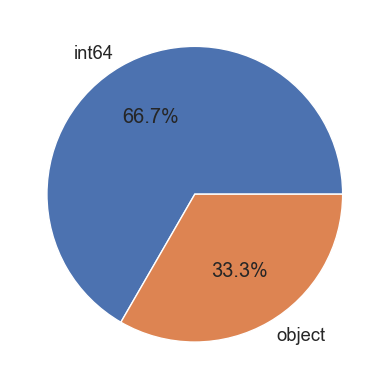

In [603]:
# Types des variables
get_types_variables(bureau_balance, True, False, True)

In [604]:
# Valeurs manquantes du dataframe
df_nan_bal = get_missing_values(bureau_balance,
                                True, False, True)

Valeurs manquantes : 0 NaN pour 81899775 données (0.0 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes


Remarque: 
- aucune valeur manquante.

##### Feature engineering :

In [605]:
# Rendre le nombre de mois positif
bureau_balance['MONTHS_BALANCE'] = np.abs(bureau_balance['MONTHS_BALANCE'])



<u>STATUS</u>

Statut du prêt du Credit Bureau durant le mois (actif ou fermé ou DPD0-30...) :

    C => fermé
    X => statut inconnu
    0 => pas de DPD
    1 => DPD maximal durant le mois entre 1-30
    2 signifie DPD 31-60
    ../.
    5 ==> DPD 120+ ou vendu ou amorti ]

L'encodage consistera à donner à la valeur 0 puis d'incrémenter les valeurs, en plaçant X, la valeur inconnue au milieu du tableau des valeurs en lui donnant le bénéfice du doute et 0 pour 0 pas de défaillance.


In [606]:
# Encodage status
dict_status = {'C': 0, '0': 0, '1': 1, '2': 2, 'X': 3, '3': 4,
               '4': 5, '5': 6}
bureau_balance['STATUS'] = bureau_balance['STATUS'].map(dict_status)

In [607]:
#Ratio STATUS/MONTHS_BALANCE
# Ajout d'une variable du ratio du status par mois
bureau_balance['STATUS_MONTHS_RATIO'] = bureau_balance.STATUS / (bureau_balance.MONTHS_BALANCE + 1)

In [608]:
#Variable quantitatives
# Ajout des variables de statistiques
dico_agg_bal = {'MONTHS_BALANCE': ['min', 'max', 'mean', 'sum'],
                'STATUS': ['max', 'mean', 'last','sum'],
                'STATUS_MONTHS_RATIO' : ['mean', 'sum', 'last']}

agg_bureau_balance_num = agg_var_num(bureau_balance, 'SK_ID_BUREAU',
                                     dico_agg_bal, 'BUREAU_BALANCE')
print(f'{agg_bureau_balance_num.shape}')
agg_bureau_balance_num.head()

(817395, 12)


,SK_ID_BUREAU,BUREAU_BALANCE_MONTHS_BALANCE_MIN,BUREAU_BALANCE_MONTHS_BALANCE_MAX,BUREAU_BALANCE_MONTHS_BALANCE_MEAN,BUREAU_BALANCE_MONTHS_BALANCE_SUM,BUREAU_BALANCE_STATUS_MAX,BUREAU_BALANCE_STATUS_MEAN,BUREAU_BALANCE_STATUS_LAST,BUREAU_BALANCE_STATUS_SUM,BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN,BUREAU_BALANCE_STATUS_MONTHS_RATIO_SUM,BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST
0,5001709,0,96,48.0,4656,3,0.340206,3,33,0.003702,0.359120,0.030928
1,5001710,0,82,41.0,3403,3,1.084337,3,90,0.016144,1.339914,0.036145
2,5001711,0,3,1.5,6,3,0.750000,0,3,0.750000,3.000000,0.000000
3,5001712,0,18,9.0,171,0,0.000000,0,0,0.000000,0.000000,0.000000
4,5001713,0,21,10.5,231,3,3.000000,3,66,0.503293,11.072440,0.136364


In [609]:
# Valeurs manquantes :
get_missing_values(agg_bureau_balance_num, False, False, False)

Valeurs manquantes : 0 NaN pour 9808740 données (0.0 %)


In [610]:
# Ajout de la clé d'identification du demandeur
df_cle_demandeur = bureau[['SK_ID_CURR', 'SK_ID_BUREAU']]
bureau_balance_par_demandeur = df_cle_demandeur.merge(agg_bureau_balance_num,
                                                      on='SK_ID_BUREAU',
                                                      how='left')
print(bureau_balance_par_demandeur.shape)
bureau_balance_par_demandeur.head()

(1716428, 13)


,SK_ID_CURR,SK_ID_BUREAU,BUREAU_BALANCE_MONTHS_BALANCE_MIN,BUREAU_BALANCE_MONTHS_BALANCE_MAX,BUREAU_BALANCE_MONTHS_BALANCE_MEAN,BUREAU_BALANCE_MONTHS_BALANCE_SUM,BUREAU_BALANCE_STATUS_MAX,BUREAU_BALANCE_STATUS_MEAN,BUREAU_BALANCE_STATUS_LAST,BUREAU_BALANCE_STATUS_SUM,BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN,BUREAU_BALANCE_STATUS_MONTHS_RATIO_SUM,BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST
0,215354,5714462,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,215354,5714463,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,215354,5714464,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,215354,5714465,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,215354,5714466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Remarque:

- Un demandeur peut avoir plusieurs prêts contractés auprès de Home Crédit Group (SK_ID_CURR) et peut avoir plusieurs prêts chez un autres organismes identifiés par SK_ID_BUREAU donc un SK_ID_CURR peut avoir 0 ou plusieurs SK_ID_BUREAU.

- La moyenne des différents autres prêts sera effectuée pour obtenir une seule ligne pour le prêt SK_ID_CURR.



In [611]:
# -- AGGREGATION DES VARIABLES STATISTIQUES des VAR QUANTITATIVES
# -- PAR MOYENNE PAR SK_ID_CURR de prêts
# --------------------------------------------------------------------

def agg_moy_par_pret(dataframe, group_var, prefix):
    """Aggregates the numeric values in a dataframe. This can
    be used to create features for each instance of the grouping variable.
    
    Parameters
    --------
        dataframe (dataframe): 
            the dataframe to calculate the statistics on
        group_var (string): 
            the variable by which to group df
        prefix (string): 
            the variable used to rename the columns
        
    Return
    --------
        agg (dataframe): 
            a dataframe with the statistics aggregated for 
            all numeric columns. Each instance of the grouping variable will have 
            the statistics (mean, min, max, sum; currently supported) calculated. 
            The columns are also renamed to keep track of features created.
    
    """
    # Remove id variables other than grouping variable
    for col in dataframe:
        if col != group_var and 'SK_ID' in col:
            dataframe = dataframe.drop(columns = col)
            
    group_ids = dataframe[group_var]
    numeric_df = dataframe.select_dtypes('number')
    numeric_df[group_var] = group_ids

    # Group by the specified variable and calculate the statistics
    agg = numeric_df.groupby(group_var).agg(['mean']).reset_index()

    # Need to create new column names
    columns = [group_var]

    # Iterate through the variables names
    for var in agg.columns.levels[0]:
        # Skip the grouping variable
        if var != group_var:
            # Iterate through the stat names
            for stat in agg.columns.levels[1][:-1]:
                # Make a new column name for the variable and stat
                columns.append('%s_%s_%s' % (prefix, var, stat))

    agg.columns = columns
    
    return agg

In [612]:
# Aggrégation des autres prêts par la moyenne des données pour chaque SK_ID_CURR
agg_bureau_balance_par_demandeur = agg_moy_par_pret(bureau_balance_par_demandeur.drop(columns=['SK_ID_BUREAU']),
                                          'SK_ID_CURR', 'PKPRET')
print(agg_bureau_balance_par_demandeur.shape)
agg_bureau_balance_par_demandeur.head()

(305811, 12)


,SK_ID_CURR,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_mean,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_mean,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MEAN_mean,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_SUM_mean,PKPRET_BUREAU_BALANCE_STATUS_MAX_mean,PKPRET_BUREAU_BALANCE_STATUS_MEAN_mean,PKPRET_BUREAU_BALANCE_STATUS_LAST_mean,PKPRET_BUREAU_BALANCE_STATUS_SUM_mean,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_mean,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_SUM_mean,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_mean
0,100001,0.0,23.571429,11.785714,400.000000,2.142857,0.651288,1.714286,13.0,0.138099,0.939380,0.252084
1,100002,15.5,28.250000,21.875000,337.625000,2.375000,0.741477,2.250000,9.0,0.073243,0.483416,0.143261
2,100003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100005,0.0,6.000000,3.000000,30.333333,2.000000,0.410256,1.000000,2.0,0.339250,1.076923,0.076923


In [613]:
# Sauvegarde de agg_bureau_balance_num
fic_sav_agg_bureau_balance_num = 'Pickle/agg_bureau_balance_num.pickle'
with open(fic_sav_agg_bureau_balance_num, 'wb') as f:
    pickle.dump(agg_bureau_balance_par_demandeur, f, pickle.HIGHEST_PROTOCOL)
agg_bureau_balance_par_demandeur.shape



(305811, 12)

In [614]:
# Chargement de agg_bureau_balance_num
fic_sav_agg_bureau_balance_num = 'Pickle/agg_bureau_balance_num.pickle'
with open(fic_sav_agg_bureau_balance_num, 'rb') as df_agg_bureau_balance_num:
    agg_bureau_balance_par_demandeur = pickle.load(df_agg_bureau_balance_num)
agg_bureau_balance_par_demandeur.shape

(305811, 12)

##### Assemblage avec le "train_set" | "test_set:

In [615]:
# Dimensions avant merge
print(f'train_set : {train_set.shape}')
df = agg_bureau_balance_par_demandeur
print(f'agg_bureau_balance_par_demandeur : {df.shape}')

train_set : (307507, 555)
agg_bureau_balance_par_demandeur : (305811, 12)


In [616]:
# Merge variables numérique
# application_train
train_set = train_set.merge(agg_bureau_balance_par_demandeur,
                            on='SK_ID_CURR', how='left')
print(f'train_set : {train_set.shape}')

train_set : (307507, 566)


In [617]:
# Description
description_variables(train_set)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_mean,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MEAN_mean,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_SUM_mean,PKPRET_BUREAU_BALANCE_STATUS_MAX_mean,PKPRET_BUREAU_BALANCE_STATUS_MEAN_mean,PKPRET_BUREAU_BALANCE_STATUS_LAST_mean,PKPRET_BUREAU_BALANCE_STATUS_SUM_mean,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_mean,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_SUM_mean,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_mean
type,int64,int64,int32,int32,int8,int8,int64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,215276.0,215276.0,215276.0,215276.0,215276.0,215276.0,215276.0,215276.0,215276.0,215276.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.123687,0.123687,0.123687,0.123687,0.123687,0.123687,0.123687,0.123687,0.123687,0.123687
count,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,...,92231.0,92231.0,92231.0,92231.0,92231.0,92231.0,92231.0,92231.0,92231.0,92231.0
mean,278181.527256,0.08073,0.095201,0.341648,0.659894,0.306331,0.417047,168797.685779,599028.596733,27108.580714,...,34.223424,20.984805,767.32208,1.706708,0.616086,1.218233,16.589846,0.105676,1.570247,0.078127
std,102790.132982,0.27242,0.293493,0.474263,0.473745,0.46097,0.722119,237124.62732,402492.601859,14493.522125,...,17.815248,11.926775,724.842953,1.11118,0.703916,1.089738,28.403207,0.184789,2.393421,0.142658
min,100002.0,0.0,0.0,0.0,0.0,0.0,0.0,25650.0,45000.0,1615.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,189146.5,0.0,0.0,0.0,0.0,0.0,0.0,112500.0,270000.0,16524.0,...,21.0,12.25,227.873016,0.857143,0.076923,0.0,1.5,0.003056,0.068357,0.0
50%,278203.0,0.0,0.0,0.0,1.0,0.0,0.0,147150.0,513531.0,24903.0,...,33.0,20.0,565.875,1.777778,0.374157,1.0,5.571429,0.034795,0.530272,0.037115
75%,367143.5,0.0,0.0,1.0,1.0,1.0,1.0,202500.0,808650.0,34596.0,...,45.222222,27.954545,1089.0,2.75,0.914041,2.076923,19.538462,0.133634,2.1,0.095241


In [618]:
# Dimensions avant merge
print(f'test_set : {test_set.shape}')
df = agg_bureau_balance_par_demandeur
print(f'agg_bureau_balance_par_demandeur : {df.shape}')

test_set : (48744, 1296)
agg_bureau_balance_par_demandeur : (305811, 12)


In [619]:
# Merge variables numériques
test_set = test_set.merge(agg_bureau_balance_par_demandeur,
                          on='SK_ID_CURR', how='left')
print(f'test_set : {test_set.shape}')

test_set : (48744, 1307)


In [620]:
# Description
description_variables(test_set)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,...,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_mean,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MEAN_mean,PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_SUM_mean,PKPRET_BUREAU_BALANCE_STATUS_MAX_mean,PKPRET_BUREAU_BALANCE_STATUS_MEAN_mean,PKPRET_BUREAU_BALANCE_STATUS_LAST_mean,PKPRET_BUREAU_BALANCE_STATUS_SUM_mean,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_mean,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_SUM_mean,PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_mean
type,int64,int32,int32,int8,int8,int64,float64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6433.0,6433.0,6433.0,6433.0,6433.0,6433.0,6433.0,6433.0,6433.0,6433.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.010098,0.010098,0.010098,0.010098,0.010098,0.010098,0.010098,0.010098,0.010098,0.010098
count,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,...,42311.0,42311.0,42311.0,42311.0,42311.0,42311.0,42311.0,42311.0,42311.0,42311.0
mean,277796.67635,0.009006,0.3296,0.662871,0.309495,0.397054,178431.805855,516740.435561,29424.651219,0.021226,...,35.335464,17.683255,959.696341,1.854181,0.77121,1.384521,28.056528,0.13893,2.830868,0.070691
std,103169.547296,0.094474,0.470073,0.472734,0.46229,0.709047,101522.591536,365397.004174,16012.584824,0.014428,...,17.305321,8.653676,788.245848,0.911899,0.711256,0.927995,34.827331,0.180217,2.904174,0.113573
min,100001.0,0.0,0.0,0.0,0.0,0.0,26941.5,45000.0,2295.0,0.000253,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,188557.75,0.0,0.0,0.0,0.0,0.0,112500.0,260640.0,17973.0,0.010006,...,23.0,11.5,347.180556,1.3,0.207296,0.75,4.333333,0.023334,0.56255,0.01761
50%,277549.0,0.0,0.0,1.0,0.0,0.0,157500.0,450000.0,26199.0,0.01885,...,34.5,17.25,803.722222,1.9,0.608084,1.5,16.833333,0.088621,2.0625,0.043854
75%,367555.5,0.0,1.0,1.0,1.0,1.0,225000.0,675000.0,37390.5,0.028663,...,46.0,23.0,1371.585714,2.571429,1.104147,2.0,38.232143,0.184432,4.079473,0.083487


Remarque: 
- Au vu du nombre déjà élevé de variable, nous allons gérer la suppression des variables fortement colinéaires et l'imputation au fur et à mesure plutôt que de le faire après avoir mergé toutes les données.

In [621]:
# Gestion des variables fortement corrélées à supprimer train set
var_corr_train_set = suppr_var_colineaire(train_set)

4 variables fortement corrélées à supprimer :

PREV_APP_ANNUITY_SUM
PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MEAN_mean
PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_SUM_mean
PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_SUM_mean


In [622]:
# Suppression des variables fortement corrélées du train set
train_set = train_set.drop(columns=var_corr_train_set)
print(f'train_set : {train_set.shape}')

train_set : (307507, 562)


In [623]:
# Suppression des variables fortement corrélées du test set
test_set = test_set.drop(columns=var_corr_train_set)
print(f'test_set : {test_set.shape}')

test_set : (48744, 1303)


In [624]:
train_set.name = 'train_set'
# Valeurs manquantes du dataframe train_set
cols_nan_a_suppr = get_missing_values_sup_seuil(train_set)

train_set - Aucune variable à supprimer


In [625]:
test_set.name = 'train_set'
# Suppression des variables > 90% nan du dataframe test_set
cols_nan_a_suppr_test = get_missing_values_sup_seuil(test_set)


train_set - Aucune variable à supprimer


In [626]:
# Variables quantitatives - imputation par médiane
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
train_set.fillna(train_set.median(), inplace=True)
# Vérification
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 1722208
Nombre de nan après imputation par median : 0


In [627]:
# Variables quantitatives - imputation par médiane
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
test_set.fillna(test_set.median(), inplace=True)
# Vérification
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 51464
Nombre de nan après imputation par median : 0


In [628]:
# Sauvegarde de train_set après pré processing bureau_balance
fic_sav_train_set_bal = 'Pickle/train_set_bal.pickle'
with open(fic_sav_train_set_bal, 'wb') as f:
    pickle.dump(train_set, f, pickle.HIGHEST_PROTOCOL)

In [629]:
# Sauvegarde de test_set après pré processing bureau_balance
fic_sav_test_set_bal = 'Pickle/test_set_bal.pickle'
with open(fic_sav_test_set_bal, 'wb') as f:
    pickle.dump(test_set, f, pickle.HIGHEST_PROTOCOL)

In [630]:
fic_sav_train_set_bal = 'Pickle/train_set_bal.pickle'
# Chargement de train_set
with open(fic_sav_train_set_bal, 'rb') as df_appli_train_set_bal:
    train_set = pickle.load(df_appli_train_set_bal)
train_set.shape

(307507, 562)

In [631]:
fic_sav_test_set_bal ='Pickle/test_set_bal.pickle'
# Chargement de test_set
with open(fic_sav_test_set_bal, 'rb') as df_appli_test_set_bal:
    test_set = pickle.load(df_appli_test_set_bal)
test_set.shape

(48744, 1303)

##### Dataset - bureau.csv:

Fichier 	Description
________
bureau.csv
	

    Tous les crédits précédents du client fournis par d'autres institutions financières qui ont été rapportés au Credit Bureau (pour les clients qui ont un prêt dans notre échantillon).
    Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans le Credit Bureau avant la date de la demande.
____________
Description des variables
Variable 	Description 	Liste valeurs
____________
SK_ID_CURR
	

    ID du prêt dans notre échantillon
    Un prêt dans notre échantillon peut avoir 0, 1, 2 ou plus de crédits précédents liés dans le bureau de crédit.

_____

SK_BUREAU_ID
	

ID recodé du crédit précédent du Credit Bureau lié à notre prêt (codage unique pour chaque demande de prêt)
	
___________
CREDIT_ACTIVE
	

Statut des crédits déclarés par le Credit Bureau (CB)
	

    Closed
    Active
    Sold
    Bad debt
___________
CREDIT_CURRENCY
	

Devise recodée du crédit du Credit Bureau
	

    currency 1
    currency 2
    currency 3
    currency 4
___________
DAYS_CREDIT
	

Combien de jours avant la demande actuelle le client a-t-il demandé un crédit au Credit Bureau ?
	
___________
CREDIT_DAY_OVERDUE
	

Nombre de jours de retard sur le crédit CB au moment de la demande de prêt liée à notre échantillon.
	
___________
DAYS_CREDIT_ENDDATE
	

Durée restante du crédit CB (en jours) au moment de la demande dans Crédit immobilier
	
___________
DAYS_ENDDATE_FACT
	

Jours depuis la fin du crédit CB au moment de la demande dans le crédit domestique (uniquement pour les crédits fermés).
	
_________
AMT_CREDIT_MAX_OVERDUE
	

Montant maximal des impayés sur le crédit du Credit Bureau jusqu'à présent (à la date de demande du prêt dans notre échantillon).
	
_________
CNT_CREDIT_PROLONG
	

Combien de fois le crédit du Bureau de crédit a-t-il été prolongé ?
	
__________
AMT_CREDIT_SUM
	

Montant actuel du crédit du Credit Bureau.
	
___________
AMT_CREDIT_SUM_DEBT
	

Dette actuelle sur le crédit du Credit Bureau.
	
___________
AMT_CREDIT_SUM_LIMIT
	

Limite de crédit actuelle de la carte de crédit déclarée dans le Bureau de crédit.
	
__________
AMT_CREDIT_SUM_OVERDUE
	

Montant actuel en retard sur le crédit du Bureau de crédit.
	
_________
CREDIT_TYPE
	

Type de crédit du Bureau de crédit (voiture ou argent liquide...)
	

    Credit card
    Consumer credit
    Loan for business development
    Microloan
    Mortgage
    Car loan
    Loan for working capital replenishment
    Another type of loan
    Unknown type of loan
    Loan for the purchase of equipment
    Cash loan (non-earmarked)
    Real estate loan
    Interbank credit
    Loan for purchase of shares (margin lending)
    Mobile operator loan
___________
DAYS_CREDIT_UPDATE
	

Combien de jours avant la demande de prêt la dernière information sur la solvabilité du Credit Bureau a-t-elle été fournie ?
	
____________
AMT_ANNUITY
	

Annuité du crédit du Credit Bureau 

In [632]:
# Taille : nombre de lignes/colonnes
nRow, nVar = bureau.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 1716428 lignes et 17 variables.


In [633]:
# Variables quantitatives
cols_num_bur = bureau.select_dtypes(include=[np.number]).columns.to_list()
cols_num_bur

['SK_ID_CURR',
 'SK_ID_BUREAU',
 'DAYS_CREDIT',
 'CREDIT_DAY_OVERDUE',
 'DAYS_CREDIT_ENDDATE',
 'DAYS_ENDDATE_FACT',
 'AMT_CREDIT_MAX_OVERDUE',
 'CNT_CREDIT_PROLONG',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_OVERDUE',
 'DAYS_CREDIT_UPDATE',
 'AMT_ANNUITY']

In [634]:
# Variables catégorielles
cols_cat_bur = bureau.select_dtypes(exclude=[np.number]).columns.to_list()
cols_cat_bur

['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']

In [635]:
# Résumé des variables
desc_bureau = description_variables(bureau)
desc_bureau

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
type,int64,int64,object,object,int64,int64,float64,float64,float64,int64,float64,float64,float64,float64,object,int64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,105553.0,633653.0,1124488.0,0.0,13.0,257669.0,591780.0,0.0,0.0,0.0,1226791.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.36174,2.171586,3.853721,0.0,0.000045,0.883055,2.028083,0.0,0.0,0.0,4.204323
count,1716428.0,1716428.0,1716428,1716428,1716428.0,1716428.0,1610875.0,1082775.0,591940.0,1716428.0,1716415.0,1458759.0,1124648.0,1716428.0,1716428,1716428.0,489637.0
unique,NaN,NaN,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,NaN,NaN
top,NaN,NaN,Closed,currency 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer credit,NaN,NaN
freq,NaN,NaN,1079273,1715020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1251615,NaN,NaN
mean,278214.933645,5924434.489032,NaN,NaN,-1142.107685,0.818167,510.517362,-1017.437148,3825.417661,0.00641,354994.591918,137085.119952,6229.51498,37.912758,NaN,-593.74832,15712.7577
std,102938.558112,532265.728552,NaN,NaN,795.164928,36.544428,4994.219837,714.010626,206031.606207,0.096224,1149811.34398,677401.130952,45032.031476,5937.650035,NaN,720.747312,325826.949053
min,100001.0,5000000.0,NaN,NaN,-2922.0,0.0,-42060.0,-42023.0,0.0,0.0,0.0,-4705600.32,-586406.115,0.0,NaN,-41947.0,0.0


-------------------------------------------------------------
Type de variable pour chacune des variables



SK_ID_CURR                  int64
SK_ID_BUREAU                int64
CREDIT_ACTIVE              object
CREDIT_CURRENCY            object
DAYS_CREDIT                 int64
CREDIT_DAY_OVERDUE          int64
DAYS_CREDIT_ENDDATE       float64
DAYS_ENDDATE_FACT         float64
AMT_CREDIT_MAX_OVERDUE    float64
CNT_CREDIT_PROLONG          int64
AMT_CREDIT_SUM            float64
AMT_CREDIT_SUM_DEBT       float64
AMT_CREDIT_SUM_LIMIT      float64
AMT_CREDIT_SUM_OVERDUE    float64
CREDIT_TYPE                object
DAYS_CREDIT_UPDATE          int64
AMT_ANNUITY               float64
dtype: object


----------------------------------------------------------
Répartition schématique des types de variable 



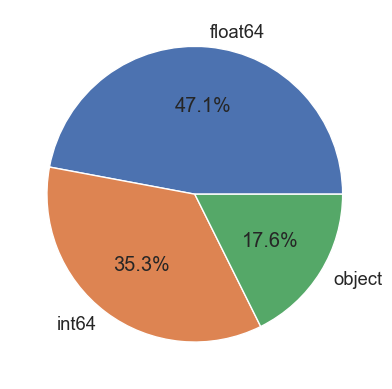

In [636]:
# Types des variables
get_types_variables(bureau, True, False, True)

Remarque: 

- Lors de l'analyse exploratoire, nous avons rencontré le problème pour les variables avec un nombre de jours qui remonte à plus de **115 ans** :

    * DAYS_CREDIT_ENDDATE,
    * DAYS_ENDDATE_FACT,
    * DAYS_CREDIT_UPDATE.

Nous conserverons les valeurs pour lesquels le prêt remonte à 80 ans, ce qui est humainement possible si le prêt est pris à la majorité avec une espérance de vie de 100 ans.


In [637]:
#DAYS_CREDIT_ENDDATE
# Suppression des valeurs remontant à plus de 80 ans
bureau['DAYS_CREDIT_ENDDATE'][bureau['DAYS_CREDIT_ENDDATE'] > -80*365] = np.nan

In [638]:
#DAYS_ENDDATE_FACT
# Suppression des valeurs remontant à plus de 80 ans
bureau['DAYS_ENDDATE_FACT'][bureau['DAYS_ENDDATE_FACT'] > -80*365] = np.nan

In [639]:
#DAYS_CREDIT_UPDATE
# Suppression des valeurs remontant à plus de 80 ans
bureau['DAYS_CREDIT_UPDATE'][bureau['DAYS_CREDIT_UPDATE'] > -80*365] = np.nan

##### Feature engineering: 

In [640]:
# Durée du crédit
bureau['CREDIT_DURATION'] = \
    np.abs(bureau['DAYS_CREDIT'] - bureau['DAYS_CREDIT_ENDDATE'])

# Retard sur le crédit
bureau['FLAG_OVERDUE_RECENT'] = [0 if ele == 0 else 1
                                 for ele in bureau['CREDIT_DAY_OVERDUE']]

# Ratio : Montant maximal des impayés sur le crédit du Credit Bureau jusqu'à
#         présent (à la date de demande du prêt dans notre échantillon) \
#         Durée du crédit
bureau['MAX_AMT_OVERDUE_DURATION_RATIO'] = \
    bureau['AMT_CREDIT_MAX_OVERDUE'] / (bureau['CREDIT_DURATION'] + 0.00001)
# Ratio : Montant actuel en retard sur le crédit du Bureau de crédit \
#         Durée du crédit
bureau['CURRENT_AMT_OVERDUE_DURATION_RATIO'] = \
    bureau['AMT_CREDIT_SUM_OVERDUE'] / (bureau['CREDIT_DURATION'] + 0.00001)
# Ratio : Montant actuel en retard sur le crédit du Bureau de crédit \
#         Durée restante du crédit CB (en jours)
bureau['AMT_OVERDUE_DURATION_LEFT_RATIO'] = \
    bureau['AMT_CREDIT_SUM_OVERDUE'] / (bureau['DAYS_CREDIT_ENDDATE']
                                        + 0.00001)
# Ratio : Nombre de fois où le crédit du Bureau de crédit a été prolongé \
#         Durée restante du crédit CB (en jours)
bureau['CNT_PROLONGED_MAX_OVERDUE_MUL'] = \
    bureau['CNT_CREDIT_PROLONG'] * bureau['AMT_CREDIT_MAX_OVERDUE']
# Ratio : Nombre de fois où le crédit du Bureau de crédit a été prolongé \
#         Montant maximal des impayés sur le crédit
bureau['CNT_PROLONGED_DURATION_RATIO'] = \
    bureau['CNT_CREDIT_PROLONG'] / (bureau['CREDIT_DURATION'] + 0.00001)
# Ratio : Dette actuelle sur le crédit \
#         Limite de crédit actuelle de la carte de crédit
bureau['CURRENT_DEBT_TO_CREDIT_RATIO'] = \
    bureau['AMT_CREDIT_SUM_DEBT'] / (bureau['AMT_CREDIT_SUM'] + 0.00001)
# Ratio : Annuité du crédit \
#         Limite de crédit actuelle de la carte de crédit
bureau['AMT_ANNUITY_CREDIT_RATIO'] = \
    bureau['AMT_ANNUITY'] / (bureau['AMT_CREDIT_SUM'] + 0.00001)


# Différence :  Limite de crédit actuelle de la carte de crédit -
#               Dette actuelle sur le crédit
bureau['CURRENT_CREDIT_DEBT_DIFF'] = \
    bureau['AMT_CREDIT_SUM'] - bureau['AMT_CREDIT_SUM_DEBT']
# Différence : nombre de jours avant la demande de prêt où la dernière
#              information sur la solvabilité du Credit Bureau a été fournie -
#              Durée restante du crédit CB (en jours)
bureau['CREDIT_ENDDATE_UPDATE_DIFF'] = \
    np.abs(bureau['DAYS_CREDIT_UPDATE'] - bureau['DAYS_CREDIT_ENDDATE'])

In [641]:
# Ajout des variables de statistiques
dico_agg_bur = {'DAYS_CREDIT' : ['mean', 'min', 'max', 'last'],
                'CREDIT_DAY_OVERDUE' : ['mean', 'max'],
                'DAYS_CREDIT_ENDDATE' : ['mean', 'min', 'max'],
                'DAYS_ENDDATE_FACT' : ['mean', 'min', 'var'],
                'AMT_CREDIT_MAX_OVERDUE': ['max', 'sum'],
                'CNT_CREDIT_PROLONG': ['max', 'sum'],
                'AMT_CREDIT_SUM' : ['mean', 'sum', 'max'],
                'AMT_CREDIT_SUM_DEBT': ['mean', 'sum'],
                'AMT_CREDIT_SUM_LIMIT': ['mean', 'max', 'sum'],
                'AMT_CREDIT_SUM_OVERDUE': ['mean', 'max', 'sum'],
                'DAYS_CREDIT_UPDATE' : ['mean', 'min'],
                'AMT_ANNUITY' : ['mean', 'sum', 'min', 'max', 'count', 'var'],
                'CREDIT_DURATION' : ['min', 'max', 'mean'],
                'FLAG_OVERDUE_RECENT': ['count', 'sum'],
                'MAX_AMT_OVERDUE_DURATION_RATIO' : ['max', 'sum'],
                'CURRENT_AMT_OVERDUE_DURATION_RATIO' : ['max', 'sum'],
                'AMT_OVERDUE_DURATION_LEFT_RATIO' : ['max',  'mean'],
                'CNT_PROLONGED_MAX_OVERDUE_MUL' : ['mean', 'max'],
                'CNT_PROLONGED_DURATION_RATIO' : ['mean', 'max'],
                'CURRENT_DEBT_TO_CREDIT_RATIO' : ['mean', 'min'],
                'CURRENT_CREDIT_DEBT_DIFF' : ['mean', 'min'],
                'AMT_ANNUITY_CREDIT_RATIO' : ['mean', 'min', 'max'],
                'CREDIT_ENDDATE_UPDATE_DIFF' : ['max', 'min']}

agg_bureau_num = agg_var_num(bureau.drop(columns=['SK_ID_BUREAU']),
                                     'SK_ID_CURR', dico_agg_bur, 'BUREAU')

print(f'{agg_bureau_num.shape}')
agg_bureau_num.head()



(305811, 60)


,SK_ID_CURR,BUREAU_DAYS_CREDIT_MEAN,BUREAU_DAYS_CREDIT_MIN,BUREAU_DAYS_CREDIT_MAX,BUREAU_DAYS_CREDIT_LAST,BUREAU_CREDIT_DAY_OVERDUE_MEAN,BUREAU_CREDIT_DAY_OVERDUE_MAX,BUREAU_DAYS_CREDIT_ENDDATE_MEAN,BUREAU_DAYS_CREDIT_ENDDATE_MIN,BUREAU_DAYS_CREDIT_ENDDATE_MAX,...,BUREAU_CNT_PROLONGED_DURATION_RATIO_MAX,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MIN,BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN,BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN,BUREAU_AMT_ANNUITY_CREDIT_RATIO_MEAN,BUREAU_AMT_ANNUITY_CREDIT_RATIO_MIN,BUREAU_AMT_ANNUITY_CREDIT_RATIO_MAX,BUREAU_CREDIT_ENDDATE_UPDATE_DIFF_MAX,BUREAU_CREDIT_ENDDATE_UPDATE_DIFF_MIN
0,100001,-735.000000,-1572,-49,-320,0.0,0,NaN,NaN,NaN,...,NaN,0.282518,0.0,122382.642857,4761.0,0.013996,0.0,0.055627,NaN,NaN
1,100002,-874.000000,-1437,-103,-1043,0.0,0,NaN,NaN,NaN,...,NaN,0.109236,0.0,98388.513000,0.0,0.000000,0.0,0.000000,NaN,NaN
2,100003,-1400.750000,-2586,-606,-606,0.0,0,NaN,NaN,NaN,...,NaN,0.000000,0.0,254350.125000,22248.0,NaN,NaN,NaN,NaN,NaN
3,100004,-867.000000,-1326,-408,-408,0.0,0,NaN,NaN,NaN,...,NaN,0.000000,0.0,94518.900000,94500.0,NaN,NaN,NaN,NaN,NaN
4,100005,-190.666667,-373,-62,-62,0.0,0,NaN,NaN,NaN,...,NaN,0.601256,0.0,29572.500000,4504.5,0.047626,0.0,0.142879,NaN,NaN


In [642]:
# Sauvegarde de agg_bureau_num
fic_sav_agg_bureau_num = 'Pickle/agg_bureau_num.pickle'
with open(fic_sav_agg_bureau_num, 'wb') as f:
    pickle.dump(agg_bureau_num, f, pickle.HIGHEST_PROTOCOL)
agg_bureau_num.shape

(305811, 60)

In [643]:
# Chargement de agg_bureau_num
fic_sav_agg_bureau_num = 'Pickle/agg_bureau_num.pickle'
with open(fic_sav_agg_bureau_num, 'rb') as df_agg_bureau_num:
    agg_bureau_num = pickle.load(df_agg_bureau_num)
agg_bureau_num.shape

(305811, 60)

In [644]:
#Variable qualitatives
agg_bureau_cat = agg_var_cat(bureau, 'SK_ID_CURR','BUREAU')
print(f'{agg_bureau_cat.shape}')
agg_bureau_cat.head()

(305811, 69)


,BUREAU_CREDIT_ACTIVE_Active_sum,BUREAU_CREDIT_ACTIVE_Active_count,BUREAU_CREDIT_ACTIVE_Active_mean,BUREAU_CREDIT_ACTIVE_Bad debt_sum,BUREAU_CREDIT_ACTIVE_Bad debt_count,BUREAU_CREDIT_ACTIVE_Bad debt_mean,BUREAU_CREDIT_ACTIVE_Closed_sum,BUREAU_CREDIT_ACTIVE_Closed_count,BUREAU_CREDIT_ACTIVE_Closed_mean,BUREAU_CREDIT_ACTIVE_Sold_sum,...,BUREAU_CREDIT_TYPE_Mobile operator loan_mean,BUREAU_CREDIT_TYPE_Mortgage_sum,BUREAU_CREDIT_TYPE_Mortgage_count,BUREAU_CREDIT_TYPE_Mortgage_mean,BUREAU_CREDIT_TYPE_Real estate loan_sum,BUREAU_CREDIT_TYPE_Real estate loan_count,BUREAU_CREDIT_TYPE_Real estate loan_mean,BUREAU_CREDIT_TYPE_Unknown type of loan_sum,BUREAU_CREDIT_TYPE_Unknown type of loan_count,BUREAU_CREDIT_TYPE_Unknown type of loan_mean
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,3,7,0.428571,0,7,0.0,4,7,0.571429,0,...,0.0,0,7,0.0,0,7,0.0,0,7,0.0
100002,2,8,0.250000,0,8,0.0,6,8,0.750000,0,...,0.0,0,8,0.0,0,8,0.0,0,8,0.0
100003,1,4,0.250000,0,4,0.0,3,4,0.750000,0,...,0.0,0,4,0.0,0,4,0.0,0,4,0.0
100004,0,2,0.000000,0,2,0.0,2,2,1.000000,0,...,0.0,0,2,0.0,0,2,0.0,0,2,0.0
100005,2,3,0.666667,0,3,0.0,1,3,0.333333,0,...,0.0,0,3,0.0,0,3,0.0,0,3,0.0


In [645]:
# Sauvegarde de agg_bureau_cat
fic_sav_agg_bureau_cat = 'Pickle/agg_bureau_cat.pickle'
with open(fic_sav_agg_bureau_cat, 'wb') as f:
    pickle.dump(agg_bureau_cat, f, pickle.HIGHEST_PROTOCOL)
agg_bureau_cat.shape

(305811, 69)

In [646]:
# Chargement de agg_bureau_cat
fic_sav_agg_bureau_cat = 'Pickle/agg_bureau_cat.pickle'
with open(fic_sav_agg_bureau_cat, 'rb') as df_agg_bureau_cat:
    agg_bureau_cat = pickle.load(df_agg_bureau_cat)
agg_bureau_cat.shape

(305811, 69)

##### Assemblage avec le train_set et test_set:

In [647]:
# Dimensions avant merge
print(f'train_set : {train_set.shape}')
print(f'agg_bureau_cat : {agg_bureau_cat.shape}')
print(f'agg_bureau_num : {agg_bureau_num.shape}')

train_set : (307507, 562)
agg_bureau_cat : (305811, 69)
agg_bureau_num : (305811, 60)


In [648]:
# Merge variables catégorielles
train_set = train_set.merge(agg_bureau_cat, on='SK_ID_CURR', how='left')
print(f'train_set : {train_set.shape}')

train_set : (307507, 631)


In [649]:
# Merge variables numériques
train_set = train_set.merge(agg_bureau_num, on='SK_ID_CURR', how='left')
print(f'train_set : {train_set.shape}')

train_set : (307507, 690)


In [650]:
# Description
description_variables(train_set)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,BUREAU_CNT_PROLONGED_DURATION_RATIO_MAX,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MIN,BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN,BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN,BUREAU_AMT_ANNUITY_CREDIT_RATIO_MEAN,BUREAU_AMT_ANNUITY_CREDIT_RATIO_MIN,BUREAU_AMT_ANNUITY_CREDIT_RATIO_MAX,BUREAU_CREDIT_ENDDATE_UPDATE_DIFF_MAX,BUREAU_CREDIT_ENDDATE_UPDATE_DIFF_MIN
type,int64,int64,int32,int32,int8,int8,int64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,307390.0,51381.0,51381.0,51381.0,51381.0,227498.0,227498.0,227498.0,307507.0,307507.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.144872,0.024216,0.024216,0.024216,0.024216,0.107219,0.107219,0.107219,0.144928,0.144928
count,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,...,117.0,256126.0,256126.0,256126.0,256126.0,80009.0,80009.0,80009.0,0.0,0.0
mean,278181.527256,0.08073,0.095201,0.341648,0.659894,0.306331,0.417047,168797.685779,599028.596733,27108.580714,...,0.0,6716959.510661,-15167041.620438,205215.156578,58612.215744,40864271.048711,11405757.462384,153385171.528369,NaN,NaN
std,102790.132982,0.27242,0.293493,0.474263,0.473745,0.46097,0.722119,237124.62732,402492.601859,14493.522125,...,0.0,567433788.747274,1402814312.021617,676806.616889,468449.864416,945136367.739106,881512169.077787,2022138773.146111,NaN,NaN
min,100002.0,0.0,0.0,0.0,0.0,0.0,0.0,25650.0,45000.0,1615.5,...,0.0,-103748704500.0,-470560032000.0,-18121243.5,-38875243.5,0.0,0.0,0.0,NaN,NaN
25%,189146.5,0.0,0.0,0.0,0.0,0.0,0.0,112500.0,270000.0,16524.0,...,0.0,0.0,0.0,59127.95475,22.5,0.00082,0.0,0.0024,NaN,NaN
50%,278203.0,0.0,0.0,0.0,1.0,0.0,0.0,147150.0,513531.0,24903.0,...,0.0,0.178888,0.0,109743.368438,19876.5,0.040466,0.0,0.095038,NaN,NaN
75%,367143.5,0.0,0.0,1.0,1.0,1.0,1.0,202500.0,808650.0,34596.0,...,0.0,0.364245,0.0,214098.5625,53748.0,0.127524,0.02,0.307929,NaN,NaN


In [651]:
# Dimensions avant merge
print(f'test_set : {test_set.shape}')
print(f'agg_bureau_cat : {agg_bureau_cat.shape}')
print(f'agg_bureau_num : {agg_bureau_num.shape}')

test_set : (48744, 1303)
agg_bureau_cat : (305811, 69)
agg_bureau_num : (305811, 60)


In [652]:
# Merge variables catégorielles
test_set = test_set.merge(agg_bureau_cat, on='SK_ID_CURR', how='left')
print(f'test_set  : {test_set.shape}')

test_set  : (48744, 1372)


In [653]:
# Merge variables numériques
test_set = test_set.merge(agg_bureau_num, on='SK_ID_CURR', how='left')
print(f'test_set  : {test_set.shape}')

test_set  : (48744, 1431)


In [654]:
# Description
description_variables(test_set)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,...,BUREAU_CNT_PROLONGED_DURATION_RATIO_MAX,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MIN,BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN,BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN,BUREAU_AMT_ANNUITY_CREDIT_RATIO_MEAN,BUREAU_AMT_ANNUITY_CREDIT_RATIO_MIN,BUREAU_AMT_ANNUITY_CREDIT_RATIO_MAX,BUREAU_CREDIT_ENDDATE_UPDATE_DIFF_MAX,BUREAU_CREDIT_ENDDATE_UPDATE_DIFF_MIN
type,int64,int32,int32,int8,int8,int64,float64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,48744.0,7437.0,7437.0,7437.0,7437.0,10530.0,10530.0,10530.0,48744.0,48744.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.069881,0.010662,0.010662,0.010662,0.010662,0.015096,0.015096,0.015096,0.069881,0.069881
count,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,...,0.0,41307.0,41307.0,41307.0,41307.0,38214.0,38214.0,38214.0,0.0,0.0
mean,277796.67635,0.009006,0.3296,0.662871,0.309495,0.397054,178431.805855,516740.435561,29424.651219,0.021226,...,NaN,4503457.396502,194240.744532,214379.262676,57010.473898,486563.906934,22256.254998,3004445.96468,NaN,NaN
std,103169.547296,0.094474,0.470073,0.472734,0.46229,0.709047,101522.591536,365397.004174,16012.584824,0.014428,...,NaN,171763657.824607,39477717.016994,410412.387647,390932.726061,17498735.350901,2791468.59012,134462985.656905,NaN,NaN
min,100001.0,0.0,0.0,0.0,0.0,0.0,26941.5,45000.0,2295.0,0.000253,...,NaN,0.0,0.0,-22835862.0,-39628044.0,0.0,0.0,0.0,NaN,NaN
25%,188557.75,0.0,0.0,0.0,0.0,0.0,112500.0,260640.0,17973.0,0.010006,...,NaN,0.0,0.0,64080.04275,0.0,0.004779,0.0,0.016666,NaN,NaN
50%,277549.0,0.0,0.0,1.0,0.0,0.0,157500.0,450000.0,26199.0,0.01885,...,NaN,0.178017,0.0,118865.025,20727.0,0.020833,0.0,0.049961,NaN,NaN
75%,367555.5,0.0,1.0,1.0,1.0,1.0,225000.0,675000.0,37390.5,0.028663,...,NaN,0.345581,0.0,230351.913,54731.25,0.04409,0.0,0.1,NaN,NaN


Remarque: Nettoyage

Au vu du nombre déjà élevé de variable, nous allons gérer la suppression des variables fortement colinéaires et l'imputation au fur et à mesure plutôt que de le faire après avoir mergé toutes les données.


In [655]:
# Gestion des variables fortement corrélées à supprimer train set
var_corr_train_set = suppr_var_colineaire(train_set)

56 variables fortement corrélées à supprimer :

BUREAU_CREDIT_ACTIVE_Bad debt_count
BUREAU_CREDIT_ACTIVE_Bad debt_mean
BUREAU_CREDIT_ACTIVE_Closed_sum
BUREAU_CREDIT_ACTIVE_Closed_count
BUREAU_CREDIT_ACTIVE_Closed_mean
BUREAU_CREDIT_ACTIVE_Sold_count
BUREAU_CREDIT_CURRENCY_currency 1_sum
BUREAU_CREDIT_CURRENCY_currency 1_count
BUREAU_CREDIT_CURRENCY_currency 2_count
BUREAU_CREDIT_CURRENCY_currency 2_mean
BUREAU_CREDIT_CURRENCY_currency 3_count
BUREAU_CREDIT_CURRENCY_currency 4_count
BUREAU_CREDIT_CURRENCY_currency 4_mean
BUREAU_CREDIT_TYPE_Another type of loan_count
BUREAU_CREDIT_TYPE_Car loan_count
BUREAU_CREDIT_TYPE_Cash loan (non-earmarked)_count
BUREAU_CREDIT_TYPE_Cash loan (non-earmarked)_mean
BUREAU_CREDIT_TYPE_Consumer credit_sum
BUREAU_CREDIT_TYPE_Consumer credit_count
BUREAU_CREDIT_TYPE_Credit card_count
BUREAU_CREDIT_TYPE_Credit card_mean
BUREAU_CREDIT_TYPE_Interbank credit_count
BUREAU_CREDIT_TYPE_Interbank credit_mean
BUREAU_CREDIT_TYPE_Loan for business development_count
BU

In [656]:
# Suppression des variables fortement corrélées du train set
train_set = train_set.drop(columns=var_corr_train_set)
print(f'train_set : {train_set.shape}')

train_set : (307507, 634)


In [657]:
# Suppression des variables fortement corrélées du test set
test_set = test_set.drop(columns=var_corr_train_set)
print(f'test_set : {test_set.shape}')

test_set : (48744, 1375)


In [658]:
train_set.name = 'train_set'

# Valeurs manquantes du dataframe train_set
cols_nan_a_suppr = get_missing_values_sup_seuil(train_set)

train_set - Nombre de variables à supprimer : 12



['BUREAU_DAYS_CREDIT_ENDDATE_MEAN',
 'BUREAU_DAYS_ENDDATE_FACT_MEAN',
 'BUREAU_DAYS_ENDDATE_FACT_MIN',
 'BUREAU_DAYS_ENDDATE_FACT_VAR',
 'BUREAU_DAYS_CREDIT_UPDATE_MEAN',
 'BUREAU_CURRENT_AMT_OVERDUE_DURATION_RATIO_MAX',
 'BUREAU_AMT_OVERDUE_DURATION_LEFT_RATIO_MAX',
 'BUREAU_AMT_OVERDUE_DURATION_LEFT_RATIO_MEAN',
 'BUREAU_CNT_PROLONGED_DURATION_RATIO_MEAN',
 'BUREAU_CNT_PROLONGED_DURATION_RATIO_MAX',
 'BUREAU_CREDIT_ENDDATE_UPDATE_DIFF_MAX',
 'BUREAU_CREDIT_ENDDATE_UPDATE_DIFF_MIN']

In [659]:
# Suppression des variables > 90% nan du dataframe train_set
train_set = train_set.drop(columns=cols_nan_a_suppr)
print(f'train_set : {train_set.shape}')

train_set : (307507, 622)


In [660]:
print(f'train_set : {train_set.shape}')

train_set : (307507, 622)


In [661]:
test_set.name = 'train_set'
# Suppression des variables > 90% nan du dataframe test_set
cols_nan_a_suppr_test = get_missing_values_sup_seuil(test_set)

train_set - Nombre de variables à supprimer : 12



['BUREAU_DAYS_CREDIT_ENDDATE_MEAN',
 'BUREAU_DAYS_ENDDATE_FACT_MEAN',
 'BUREAU_DAYS_ENDDATE_FACT_MIN',
 'BUREAU_DAYS_ENDDATE_FACT_VAR',
 'BUREAU_DAYS_CREDIT_UPDATE_MEAN',
 'BUREAU_CURRENT_AMT_OVERDUE_DURATION_RATIO_MAX',
 'BUREAU_AMT_OVERDUE_DURATION_LEFT_RATIO_MAX',
 'BUREAU_AMT_OVERDUE_DURATION_LEFT_RATIO_MEAN',
 'BUREAU_CNT_PROLONGED_DURATION_RATIO_MEAN',
 'BUREAU_CNT_PROLONGED_DURATION_RATIO_MAX',
 'BUREAU_CREDIT_ENDDATE_UPDATE_DIFF_MAX',
 'BUREAU_CREDIT_ENDDATE_UPDATE_DIFF_MIN']

In [662]:
# Suppression des variables > 90% nan du dataframe test_set
test_set = test_set.drop(columns=cols_nan_a_suppr)
print(f'test_set : {test_set.shape}')

test_set : (48744, 1363)


In [663]:
print(f'test_set : {test_set.shape}')

test_set : (48744, 1363)


##### Imputation par median :train_set |test_set

In [664]:
# Variables quantitatives - imputation par médiane
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
train_set.fillna(train_set.median(), inplace=True)
# Vérification
nb_nan_median = train_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 3062791
Nombre de nan après imputation par median : 0


In [665]:
# Variables quantitatives - imputation par médiane
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan avant imputation par median : {nb_nan_median}')
test_set.fillna(test_set.median(), inplace=True)
# Vérification
nb_nan_median = test_set.isna().sum().sum()
print(f'Nombre de nan après imputation par median : {nb_nan_median}')

Nombre de nan avant imputation par median : 429599
Nombre de nan après imputation par median : 0


In [666]:
# Sauvegarde de train_set après pré processing bureau
fic_sav_train_set_bur = 'Pickle/train_set_bur.pickle'
with open(fic_sav_train_set_bur, 'wb') as f:
    pickle.dump(train_set, f, pickle.HIGHEST_PROTOCOL)

In [667]:
# Sauvegarde de test_set après pré processing bureau_balance
fic_sav_test_set_bur = 'Pickle/test_set_bur.pickle'
with open(fic_sav_test_set_bur, 'wb') as f:
    pickle.dump(test_set, f, pickle.HIGHEST_PROTOCOL)

In [668]:
fic_sav_train_set_bur = 'Pickle/train_set_bur.pickle'
# Chargement de train_set
with open(fic_sav_train_set_bur, 'rb') as df_appli_train_set_bur:
    train_set = pickle.load(df_appli_train_set_bur)
train_set.shape

(307507, 622)

In [669]:
fic_sav_test_set_bur = 'Pickle/test_set_bur.pickle'
# Chargement de test_set
with open(fic_sav_test_set_bur, 'rb') as df_appli_test_set_bur:
    test_set = pickle.load(df_appli_test_set_bur)
test_set.shape

(48744, 1363)

Remarque:

Renommage des variables:

    Certaines variables automatiquement créées contiennent des espaces, des deux-points qui ne sont pas recommandés dans les consignes de nommage des variables python ==> à transformer par '_'.

    Mélange de majuscules et de minuscules, tout sera passé en majuscules.
    Exemples :
    
        OCCUPATION_TYPE_Private service staff
        ORGANIZATION_TYPE_Business Entity Type 1
        ORGANIZATION_TYPE_Industry: type 1
        ../..



In [670]:
train_set.columns.to_list()

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'EMERGENCYSTATE_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_

In [672]:
import re
# Remplacer :, espaces... par '_' et mettre en majuscules le nom des variables
train_set = train_set.rename(columns=lambda x:re.sub('[^A-Za-z0-9_]+',
                                                     '_', x.upper()))

test_set = test_set.rename(columns=lambda x:re.sub('[^A-Za-z0-9_]+',
                                                   '_', x.upper()))


In [673]:
# Sauvegarde de train_set après renommage des noms des variables
fic_sav_train_set = 'Pickle/train_set_preproc.pickle'
with open(fic_sav_train_set, 'wb') as f:
    pickle.dump(train_set, f, pickle.HIGHEST_PROTOCOL)

In [674]:
# Sauvegarde de test_set après renommage des noms des variables
fic_sav_test_set = 'Pickle/test_set_preproc.pickle'
with open(fic_sav_test_set, 'wb') as f:
    pickle.dump(test_set, f, pickle.HIGHEST_PROTOCOL)

______

#### Feature selection : avec LIGHTGBM:
- Le but est de conserver uniquement les variables les plus pertinentes en utilisant les features importance déterminée par le modèle: Lightgbm.

Note : les différneces sources
- [Kernel - source](https://www.kaggle.com/willkoehrsen/introduction-to-feature-selection) 

- [Features_importance]( https://www.kaggle.com/willkoehrsen/introduction-to-feature-selection)

In [2]:
fic_sav_train_set = 'Pickle/train_set_preproc.pickle'
# Chargement de train_set
with open(fic_sav_train_set, 'rb') as df_appli_train_set:
    train_set = pickle.load(df_appli_train_set)
train_set.shape

(307507, 622)

In [3]:
fic_sav_test_set = 'Pickle/test_set_preproc.pickle'
# Chargement de test_set
with open(fic_sav_test_set, 'rb') as df_appli_test_set:
    test_set = pickle.load(df_appli_test_set)
test_set.shape

(48744, 1363)

In [4]:
# -- DESCRIPTION DES VARIABLES
# --------------------------------------------------------------------

def description_variables(dataframe, type_var='all'):
    """
    Retourne la description des variables qualitatives/quantitatives
    ou toutes les variables du dataframe transmis :
    type, nombre de nan, % de nan et desc
    Parameters
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                type_var = 'all' ==> tous les types de variables (défaut)
                           'cat' ==> variables catégorielles
                           'num' ==> variables quantitative
                           facultatif
    @param OUT : dataframe de description des variables
    """
    df_taille = dataframe.shape[0]

    if type_var == 'num':
        desc_var = dataframe.describe(datetime_is_numeric=True)
    elif type_var == 'cat':
        desc_var = dataframe.describe(
            exclude=[np.number], datetime_is_numeric=True)
    else:
        desc_var = dataframe.describe(include='all', datetime_is_numeric=True)

    desc_type = pd.DataFrame(
        dataframe[desc_var.columns].dtypes, columns=['type']).T
    nb_nan = df_taille - desc_var.loc['count'].T
    pourcentage_nan = nb_nan * 100 / np.product(dataframe.shape)
    desc_nan = pd.DataFrame([nb_nan, pourcentage_nan],
                            index=['nb_nan', '%_nan'])
    desc_var = pd.concat([desc_type, desc_nan, desc_var])

    return desc_var

In [5]:
# Résumé des variables qualitatives
desc_train_set = description_variables(train_set)
desc_train_set

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,BUREAU_AMT_ANNUITY_SUM,BUREAU_AMT_ANNUITY_COUNT,BUREAU_FLAG_OVERDUE_RECENT_SUM,BUREAU_CURRENT_AMT_OVERDUE_DURATION_RATIO_SUM,BUREAU_CNT_PROLONGED_MAX_OVERDUE_MUL_MEAN,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MIN,BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN,BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN,BUREAU_AMT_ANNUITY_CREDIT_RATIO_MEAN
type,int64,int64,int32,int32,int8,int8,int64,float64,float64,float64,...,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
count,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,...,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0,307507.0
mean,278181.527256,0.08073,0.095201,0.341648,0.659894,0.306331,0.417047,168797.685779,599028.596733,27108.580714,...,17188.316514,1.090421,0.012049,0.0,103.706115,5594630.303762,-12632797.634123,189262.882495,52139.908413,10632309.090662
std,102790.132982,0.27242,0.293493,0.474263,0.473745,0.46097,0.722119,237124.62732,402492.601859,14493.522125,...,327308.439838,2.544422,0.121752,0.0,6624.55766,517868464.746204,1280276040.530815,618706.33943,427769.927022,482430209.129218
min,100002.0,0.0,0.0,0.0,0.0,0.0,0.0,25650.0,45000.0,1615.5,...,0.0,0.0,0.0,0.0,0.0,-103748704500.0,-470560032000.0,-18121243.5,-38875243.5,0.0
25%,189146.5,0.0,0.0,0.0,0.0,0.0,0.0,112500.0,270000.0,16524.0,...,0.0,0.0,0.0,0.0,0.0,0.024297,0.0,67771.712,4059.0,0.040466
50%,278203.0,0.0,0.0,0.0,1.0,0.0,0.0,147150.0,513531.0,24903.0,...,0.0,0.0,0.0,0.0,0.0,0.178888,0.0,109743.368438,19876.5,0.040466
75%,367143.5,0.0,0.0,1.0,1.0,1.0,1.0,202500.0,808650.0,34596.0,...,0.0,1.0,0.0,0.0,0.0,0.318832,0.0,181750.1925,44172.0,0.040466


In [6]:
# Dataframes de travail
train_sans_fs_lgbm = train_set.copy()
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'],
                                             axis=1)
print(f'train_sans_fs_lgbm : {train_sans_fs_lgbm.shape}')
test_sans_fs_lgbm = test_set.copy()
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'],
                                           axis=1)
print(f'test_sans_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_sans_fs_lgbm : (307507, 621)
test_sans_fs_lgbm : (48744, 1362)


In [7]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_sans_fs_lgbm_labels = train_sans_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_sans_fs_lgbm_ids = train_sans_fs_lgbm['SK_ID_CURR']
test_sans_fs_lgbm_ids = test_sans_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_sans_fs_lgbm, test_sans_fs_lgbm = \
    train_sans_fs_lgbm.align(test_sans_fs_lgbm, join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_fs_lgbm : {train_sans_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_fs_lgbm : (307507, 610)
test_fs_lgbm : (48744, 610)


##### Modélisation : 
- LGBM: features importance

In [8]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances_sans = np.zeros(train_sans_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [9]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_sans_features, valid_sans_features, train_sans_y, valid_sans_y = \
        train_test_split(train_sans_fs_lgbm, train_sans_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_sans_features, train_sans_y,
              early_stopping_rounds=100,
              eval_set=[(valid_sans_features, valid_sans_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances_sans += model.feature_importances_

[200]	valid_0's auc: 0.790588	valid_0's binary_logloss: 0.506808
[200]	valid_0's auc: 0.784634	valid_0's binary_logloss: 0.505109


In [10]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances_sans = feature_importances_sans / 2
df_fs_sans_lightgbm = \
    pd.DataFrame({'feature': list(train_sans_fs_lgbm.columns),
                  'importance': feature_importances_sans}) \
    .sort_values('importance', ascending=False)

df_fs_sans_lightgbm.head()

,feature,importance
69,CREDIT_ANNUITY_RATIO,134.5
77,EXT_SOURCE_SUM,120.0
9,DAYS_BIRTH,86.0
251,INST_PAY_DAYS_PAYMENT_RATIO_MAX,85.0
71,CREDIT_GOODS_RATIO,75.0


In [11]:
# Exploration des variables avec zéro importance
zero_features_sans = \
    list(df_fs_sans_lightgbm[df_fs_sans_lightgbm['importance'] == 0.0][
        'feature'])
print(f'{len(zero_features_sans)} variables avec 0.0 importance :\n')
zero_features_sans

196 variables avec 0.0 importance :



['ORGANIZATION_TYPE_INDUSTRY_TYPE_1',
 'FLAG_DOCUMENT_4',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_3',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_2',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_13',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_12',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_10',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_5',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_5',
 'ORGANIZATION_TYPE_EMERGENCY',
 'ORGANIZATION_TYPE_ELECTRICITY',
 'ORGANIZATION_TYPE_CULTURE',
 'ORGANIZATION_TYPE_CLEANING',
 'ORGANIZATION_TYPE_BUSINESS_ENTITY_TYPE_2',
 'ORGANIZATION_TYPE_BUSINESS_ENTITY_TYPE_1',
 'ORGANIZATION_TYPE_AGRICULTURE',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_4',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_7',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_6',
 'WEEKDAY_APPR_PROCESS_START_WEDNESDAY',
 'ORGANIZATION_TYPE_TRADE_TYPE_5',
 'ORGANIZATION_TYPE_TRADE_TYPE_4',
 'ORGANIZATION_TYPE_TRADE_TYPE_3',
 'FLAG_MOBIL',
 'ORGANIZATION_TYPE_TRADE_TYPE_1',
 'ORGANIZATION_TYPE_TELECOM',
 'FLAG_CONT_MOBILE',
 'FLAG_EMAIL',
 'ORGANIZATION_TYPE_SECURITY',
 'ORGANIZATI

In [9]:
# == PARTIE FEATURES SELECTION
# ===========================================================================

def plot_feature_importances(df, threshold = 0.9):
    """
        Trace les 15 caractéristiques les plus importantes et l'importance cumulée des caractéristiques.
    Imprime le nombre d'entités nécessaires pour atteindre le seuil d'importance cumulée.

    Paramètres
    --------
    df : trame de données
        Dataframe des importances des fonctionnalités. Les colonnes doivent être caractéristique et importance
    seuil : flottant, par défaut = 0,9
        Seuil pour l'impression d'informations sur les importances cumulées
    Retour
    --------
    df : trame de données
        Trame de données classée par importance des fonctionnalités avec une colonne normalisée (sommes à 1)
        et une colonne d'importance cumulée
    """
    
    plt.rcParams['font.size'] = 18
    
    # Sort features according to importance
    df = df.sort_values('importance', ascending = False).reset_index()
    
    # Normalize the feature importances to add up to one
    df['importance_normalized'] = df['importance'] / df['importance'].sum()
    df['cumulative_importance'] = np.cumsum(df['importance_normalized'])

    # Make a horizontal bar chart of feature importances
    plt.figure(figsize = (10, 12))
    ax = plt.subplot()
    
    # Need to reverse the index to plot most important on top
    ax.barh(list(reversed(list(df.index[:30]))), 
            df['importance_normalized'].head(30), 
            align = 'center', edgecolor = 'k')
    
    # Set the yticks and labels
    ax.set_yticks(list(reversed(list(df.index[:30]))))
    ax.set_yticklabels(df['feature'].head(30))
    
    # Plot labeling
    plt.xlabel('Importance normalisée'); plt.title('Features Importances')
    plt.show()
    
    # Cumulative importance plot
    plt.figure(figsize = (8, 6))
    plt.plot(list(range(len(df))), df['cumulative_importance'], 'r-')
    plt.xlabel('Nombre de variables'); plt.ylabel('Cumulative Importance'); 
    plt.title('Cumulative Feature Importance');
    plt.show();
    
    importance_index = np.min(np.where(df['cumulative_importance'] > threshold))
    print('%d variables nécessaires pour %0.2f de cumulative importance' % (importance_index + 1, threshold))
    
    return df

In [10]:
def identify_zero_importance_features(train, train_labels, iterations = 2):
    """
    Identify zero importance features in a training dataset based on the 
    feature importances from a gradient boosting model. 
    
    Parameters
    --------
    train : dataframe
        Training features
        
    train_labels : np.array
        Labels for training data
        
    iterations : integer, default = 2
        Number of cross validation splits to use for determining feature importances
    """
    
    # Initialize an empty array to hold feature importances
    feature_importances = np.zeros(train.shape[1])

    # Create the model with several hyperparameters
    model = lgb.LGBMClassifier(objective='binary', boosting_type = 'goss', n_estimators = 10000, class_weight = 'balanced')
    
    # Fit the model multiple times to avoid overfitting
    for i in range(iterations):

        # Split into training and validation set
        train_features, valid_features, train_y, valid_y = train_test_split(train, train_labels, test_size = 0.25, random_state = i)

        # Train using early stopping
        model.fit(train_features, train_y, early_stopping_rounds=100, eval_set = [(valid_features, valid_y)], 
                  eval_metric = 'auc', verbose = 200)

        # Record the feature importances
        feature_importances += model.feature_importances_ / iterations
    
    feature_importances = pd.DataFrame({'feature': list(train.columns), 'importance': feature_importances}).sort_values('importance', ascending = False)
    
    # Find the features with zero importance
    zero_features = list(feature_importances[feature_importances['importance'] == 0.0]['feature'])
    print('\nThere are %d features with 0.0 importance' % len(zero_features))
    
    return zero_features, feature_importances

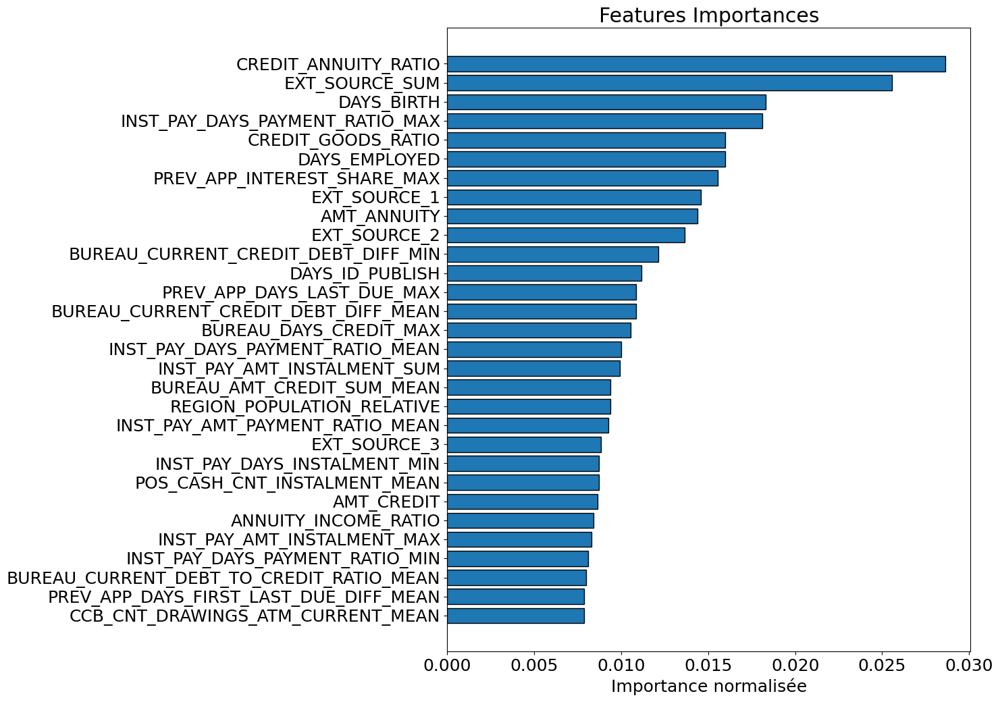

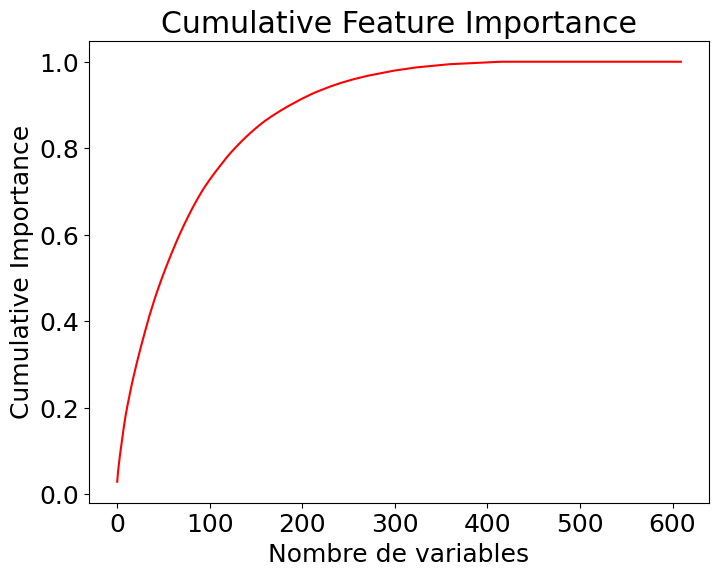

189 variables nécessaires pour 0.90 de cumulative importance


In [14]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_sans_lightgbm_norm = plot_feature_importances(df_fs_sans_lightgbm)


In [15]:
# Suppression des variables avec zéro importance
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(columns=zero_features_sans)
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(columns=zero_features_sans)

print(f'train_sans_fs_lgbm : {train_sans_fs_lgbm.shape}')
print(f'test_sans_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_sans_fs_lgbm : (307507, 414)
test_sans_fs_lgbm : (48744, 414)


In [16]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_2_sans, df_fs_sans_lightgbm_2 = identify_zero_importance_features(train_sans_fs_lgbm,
                                                                                train_sans_fs_lgbm_labels)


[200]	valid_0's auc: 0.790183	valid_0's binary_logloss: 0.506898
[200]	valid_0's auc: 0.784795	valid_0's binary_logloss: 0.505416

There are 0 features with 0.0 importance


In [31]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_sans_lightgbm = 'Pickle/fs_sans_lightgbm.pickle'
with open(fic_sav_fs_sans_lightgbm, 'wb') as f:
    pickle.dump(df_fs_sans_lightgbm_2, f, pickle.HIGHEST_PROTOCOL)


In [11]:
# Chargement des features importance de ligthgbm
fic_sav_fs_sans_lightgbm = 'Pickle/fs_sans_lightgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_sans_lightgbm, 'rb') as df_fs_sans_lightgbm:
    df_fs_sans_lightgbm = pickle.load(df_fs_sans_lightgbm)
df_fs_sans_lightgbm.shape


(414, 2)

In [12]:
def tracer_features_importance(dataframe, df_features_importance, jeu, methode):
    """
    Affiche l'étape puis nombre de lignes et de variables pour le dataframe transmis
    Parameters
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                df_features_importance : dataframe de suivi des dimensions,
                                         obligatoire
                jeu : jeu de données train_set, train set avec imputation 1...
                methode : titre du modèle de feature sélection
    @param OUT : dataframe de suivi des dimensions
    """
    # Nombre de variables retenues lors de la feature selection
    n_features = dataframe.shape[0]
    print(f'{jeu} - {methode} : {n_features} variables importantes conservées')

    df_features_importance = \
        df_features_importance.append({'Jeu_données': jeu,
                                       'Méthode': methode,
                                       'Nb_var_importante': n_features},
                                       ignore_index=True)

    # Suivi dimensions
    return df_features_importance

In [13]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = pd.DataFrame({})
df_fs_sans_train_set = tracer_features_importance(df_fs_sans_lightgbm,
                                                    df_fs_sans_train_set,
                                                    'train_sans_set',
                                                    'lightgbm')

train_sans_set - lightgbm : 414 variables importantes conservées


#### Autre méthode - feature importance : BORUATSHAP :

- La librairie BorutaShap, comme son nom l'indique, combine l'algorithme de sélection de caractéristiques Boruta avec la technique SHAP (SHapley Additive exPlanations).

- L'algorithme Boruta (du nom d'un dieu de la forêt dans la mythologie slave) a pour tâche de trouver un ensemble de caractéristiques optimal minimal plutôt que de trouver toutes les caractéristiques pertinentes pour la variable cible.

- Cela conduit à une sélection non biaisée et stable des attributs importants et non importants.


Source :

 - [Librairy](https://pypi.org/project/BorutaShap/)
 - [source- 1](https://medium.com/analytics-vidhya/is-this-the-best-feature-selection-algorithm-borutashap-8bc238aa1677)
 - [source-2](https://github.com/Ekeany/Boruta-Shap)

In [14]:
# Préparation- Dataframes de travail
train_sans_fs_borshap_lgbm = train_set.copy()
train_sans_fs_borshap_lgbm = train_sans_fs_borshap_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'], axis=1)
print(f'train_sans_fs_borshap_lgbm : {train_sans_fs_borshap_lgbm.shape}')

train_sans_fs_borshap_lgbm : (307507, 621)


In [15]:
# Sauvegarde des étiquettes
train_sans_fs_borshap_lgbm_labels = train_sans_fs_borshap_lgbm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_sans_fs_borshap_lgbm = train_sans_fs_borshap_lgbm.drop(columns=['SK_ID_CURR'])
train_sans_fs_borshap_lgbm = train_sans_fs_borshap_lgbm.drop(columns=['TARGET'])

print(f'train_sans_fs_borshap_lgbm : {train_sans_fs_borshap_lgbm.shape}')

train_sans_fs_borshap_lgbm : (307507, 619)


In [16]:
# Initialisation des variables
X = train_sans_fs_borshap_lgbm
y = train_sans_fs_borshap_lgbm_labels

In [17]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=1000,
                          class_weight='balanced',
                          num_boost_round=30)

In [18]:
# Initialisation de BorutaShap
Feature_Selector_sans = BorutaShap(model=lgbm,
                                   importance_measure='shap',
                                   classification=True)

# Entraînement
Feature_Selector_sans.fit(X=X, y=y, n_trials=30, random_state=0)

  0%|          | 0/30 [00:00<?, ?it/s]

[LightGBM] [Warning] num_iterations is set=30, num_boost_round=30 will be ignored. Current value: num_iterations=30
[LightGBM] [Warning] num_iterations is set=30, num_boost_round=30 will be ignored. Current value: num_iterations=30
[LightGBM] [Warning] num_iterations is set=30, num_boost_round=30 will be ignored. Current value: num_iterations=30
[LightGBM] [Warning] num_iterations is set=30, num_boost_round=30 will be ignored. Current value: num_iterations=30
[LightGBM] [Warning] num_iterations is set=30, num_boost_round=30 will be ignored. Current value: num_iterations=30
[LightGBM] [Warning] num_iterations is set=30, num_boost_round=30 will be ignored. Current value: num_iterations=30
[LightGBM] [Warning] num_iterations is set=30, num_boost_round=30 will be ignored. Current value: num_iterations=30
[LightGBM] [Warning] num_iterations is set=30, num_boost_round=30 will be ignored. Current value: num_iterations=30
[LightGBM] [Warning] num_iterations is set=30, num_boost_round=30 will b

In [19]:
# Liste des variables avec une haute importance
fs_sans_borshap_lgbm = Feature_Selector_sans.accepted
fs_sans_borshap_lgbm

['INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'BUREAU_DAYS_CREDIT_MEAN',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'EXT_SOURCE_MAX',
 'PREV_APP_DAYS_LAST_DUE_MAX',
 'AMT_ANNUITY',
 'ANNUITY_INCOME_RATIO',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'OWN_CAR_AGE',
 'DAYS_EMPLOYED',
 'FLAGS_DOCUMENTS_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'PREV_APP_INTEREST_SHARE_MIN',
 'EXT_SOURCE_3',
 'CAR_EMPLOYED_RATIO',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN',
 'INST_PAY_AMT_INSTALMENT_MAX',
 'INST_PAY_DAYS_INSTALMENT_MIN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'EXT_SOURCE_SUM',
 'PREV_APP_AMT_ANNUITY_SUM',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
 'DAYS_LAST_PHONE_CHANGE',
 'DAYS_ID_PUBLISH',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'CREDIT_ANNUITY_RATIO',

In [20]:
# Dataframe
df_fs_sans_borshap_lgbm = pd.DataFrame(fs_sans_borshap_lgbm)
df_fs_sans_borshap_lgbm.shape

(60, 1)

In [21]:
# Liste des variables à ne pas conserver
cols_to_supp_sans_borutashap = Feature_Selector_sans.features_to_remove
cols_to_supp_sans_borutashap

array(['FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_WORK_CITY',
       'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ENTRANCES_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG',
       'LIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_AVG',
       'NONLIVINGAREA_AVG', 'EMERGENCYSTATE_MODE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_4',
       'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7',
       'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10',
       'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13',
       'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16',
       'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19',
       'F

In [23]:
# Sauvegarde du feature selector avec borutashap
fic_sav_fSelector_sans_borshap_lgbm = 'Pickle/features_selector_sans_borshap_lgbm.pickle'
with open(fic_sav_fSelector_sans_borshap_lgbm, 'wb') as f:
    pickle.dump(Feature_Selector_sans, f, pickle.HIGHEST_PROTOCOL)

In [24]:
# Sauvegarde des features importances avec borutashap
fic_sav_fs_sans_borshap_lgbm = 'Pickle/fs_sans_borshap_lgbm.pickle'
with open(fic_sav_fs_sans_borshap_lgbm, 'wb') as f:
    pickle.dump(df_fs_sans_borshap_lgbm, f, pickle.HIGHEST_PROTOCOL)

In [25]:
# Chargement des features importance de borutashap
fic_sav_fs_sans_borshap_lgbm = 'Pickle/fs_sans_borshap_lgbm.pickle'
# Chargement des features importance
with open(fic_sav_fs_sans_borshap_lgbm, 'rb') as df_fs_sans_borshap_lgbm:
    df_fs_sans_borshap_lgbm = pickle.load(df_fs_sans_borshap_lgbm)
df_fs_sans_borshap_lgbm.shape



(60, 1)

In [26]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = tracer_features_importance(df_fs_sans_borshap_lgbm,
                                                    df_fs_sans_train_set,
                                                    'train_sans_set',
                                                    'borutashap-LightGbm')

train_sans_set - borutashap-LightGbm : 60 variables importantes conservées


#### Bilan: feature importance .

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm et BorutaShap,  pour le jeu de données train set sont :

- df_fs_lightgbm,
- df_fs_borshap_lgbm,



In [27]:
# Récupération des variables conservées pour chaque feature selection

liste_var_sans = df_fs_sans_lightgbm['feature'].to_list()
print(len(liste_var_sans))

liste_var_sans.extend(df_fs_sans_borshap_lgbm[0].to_list())
print(len(liste_var_sans))


414
474


In [28]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var_sans = Counter(liste_var_sans)
len(dico_nbre_repet_var_sans)


416

In [29]:
df_nbr_repet_var_sans = pd.DataFrame.from_dict(dico_nbre_repet_var_sans,
                                               orient='index',
                                               columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}).sort_values(by='Nbr_repetition', ascending=False)

df_nbr_repet_var_sans.style.hide_index()

Variables,Nbr_repetition
CREDIT_ANNUITY_RATIO,2
PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,2
INST_PAY_NUM_INSTALMENT_VERSION_SUM,2
EXT_SOURCE_MAX,2
BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX,2
PREV_APP_NAME_CONTRACT_STATUS_MEAN,2
BUREAU_AMT_CREDIT_SUM_SUM,2
EXT_SOURCE_VAR,2
DAYS_LAST_PHONE_CHANGE,2
PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,2


In [30]:
# -- PLAGE DE VALEURS MANQUANTES
# --------------------------------------------------------------------
def distribution_variables_plages(
        dataframe, variable, liste_bins):
    """
    Retourne les plages des pourcentages des valeurs pour le découpage transmis
    Parameters
    ----------
    @param IN : dataframe : DataFrame, obligatoire
                variable : variable à découper obligatoire
                liste_bins: liste des découpages facultatif int ou pintervallindex
    @param OUT : dataframe des plages de nan
    """
    nb_lignes = len(dataframe[variable])
    s_gpe_cut = pd.cut(
        dataframe[variable],
        bins=liste_bins).value_counts().sort_index()
    df_cut = pd.DataFrame({'Plage': s_gpe_cut.index,
                           'nb_données': s_gpe_cut.values})
    df_cut['%_données'] = [
        (row * 100) / nb_lignes for row in df_cut['nb_données']]

    return df_cut.style.hide_index()

In [31]:
# Plage de nombre de répétitions
liste_bins = [0, 1, 2, 3, 4, 5, 6]
distribution_variables_plages(df_nbr_repet_var_sans,
                            'Nbr_repetition',
                             liste_bins)



Plage,nb_données,%_données
"(0, 1]",358,86.057692
"(1, 2]",58,13.942308
"(2, 3]",0,0.000000
"(3, 4]",0,0.000000
"(4, 5]",0,0.000000
"(5, 6]",0,0.000000


In [32]:
# Les variables présentes plus de 6 fois pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_set_sans = df_nbr_repet_var_sans[df_nbr_repet_var_sans['Nbr_repetition'] > 1][
        'Variables'].to_list()
dim_var = len(var_cons_train_set_sans)
print(f'{dim_var} variables conservées pour le train_set')
var_cons_train_set_sans



58 variables conservées pour le train_set


['CREDIT_ANNUITY_RATIO',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'EXT_SOURCE_MAX',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'EXT_SOURCE_VAR',
 'DAYS_LAST_PHONE_CHANGE',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'BUREAU_DAYS_CREDIT_MEAN',
 'PREV_APP_AMT_ANNUITY_SUM',
 'OWN_CAR_AGE',
 'FLAGS_DOCUMENTS_SUM',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
 'FLAG_OWN_CAR',
 'PREV_APP_INTEREST_SHARE_MIN',
 'NAME_INCOME_TYPE_WORKING',
 'FLAG_DOCUMENT_3',
 'CODE_GENDER',
 'EXT_SOURCE_SUM',
 '

In [33]:
# Sauvegarde des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans = 'Pickle/var_cons_train_set_sans.pickle'
with open(fic_sav_var_cons_train_set_sans, 'wb') as f:
    pickle.dump(var_cons_train_set_sans, f, pickle.HIGHEST_PROTOCOL)



In [34]:
# Chargement des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans = 'Pickle/var_cons_train_set_sans.pickle'
with open(fic_sav_var_cons_train_set_sans, 'rb') as df_var_cons_train_set_sans:
    var_cons_train_set_sans = pickle.load(df_var_cons_train_set_sans)
len(var_cons_train_set_sans)

58

In [36]:
# Les variables les plus présentes pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_set_sans_small = df_nbr_repet_var_sans[df_nbr_repet_var_sans['Nbr_repetition'] > 1][
        'Variables'].to_list()
dim_var_small = len(var_cons_train_set_sans_small)
print(f'{dim_var_small} variables conservées pour le train_set')
var_cons_train_set_sans_small

58 variables conservées pour le train_set


['CREDIT_ANNUITY_RATIO',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'EXT_SOURCE_MAX',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'EXT_SOURCE_VAR',
 'DAYS_LAST_PHONE_CHANGE',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'BUREAU_DAYS_CREDIT_MEAN',
 'PREV_APP_AMT_ANNUITY_SUM',
 'OWN_CAR_AGE',
 'FLAGS_DOCUMENTS_SUM',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
 'FLAG_OWN_CAR',
 'PREV_APP_INTEREST_SHARE_MIN',
 'NAME_INCOME_TYPE_WORKING',
 'FLAG_DOCUMENT_3',
 'CODE_GENDER',
 'EXT_SOURCE_SUM',
 '

In [37]:
# Sauvegarde des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans_small = 'Pickle/var_cons_train_set_sans_small.pickle'
with open(fic_sav_var_cons_train_set_sans_small, 'wb') as f:
    pickle.dump(var_cons_train_set_sans_small, f, pickle.HIGHEST_PROTOCOL)

In [38]:
# Chargement des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans_small = 'Pickle/var_cons_train_set_sans_small.pickle'
with open(fic_sav_var_cons_train_set_sans_small, 'rb') as df_var_cons_train_set_sans_small:
    var_cons_train_set_sans_small = pickle.load(df_var_cons_train_set_sans_small)
len(var_cons_train_set_sans_small)



58

#### Constitution des dataframes trains_set et test_set finaux :

In [39]:
# Constitution du train_set
train_set_sans_var_magique = train_set.copy()
print(f'{train_set_sans_var_magique.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_sans_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_sans_avec_target_id.extend(var_cons_train_set_sans)
train_set_sans_var_magique = train_set_sans_var_magique[var_cons_train_set_sans_avec_target_id]
print(f'{train_set_sans_var_magique.shape}')


(307507, 622)
(307507, 60)


In [40]:
# Constitution du test_set
test_set_sans_var_magique = test_set.copy()
print(f'{test_set_sans_var_magique.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_sans_avec_target_id = ['SK_ID_CURR']
var_cons_train_set_sans_avec_target_id.extend(var_cons_train_set_sans)
test_set_sans_var_magique = test_set_sans_var_magique[var_cons_train_set_sans_avec_target_id]
print(f'{test_set_sans_var_magique.shape}')

(48744, 1363)
(48744, 59)


In [41]:
# Constitution du train_set réduit
train_set_sans_var_magique_small = train_set.copy()
print(f'{train_set_sans_var_magique_small.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_sans_avec_target_id_small = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_sans_avec_target_id_small.extend(var_cons_train_set_sans_small)
train_set_sans_var_magique_small = \
    train_set_sans_var_magique_small[var_cons_train_set_sans_avec_target_id_small]
print(f'{train_set_sans_var_magique_small.shape}')

(307507, 622)
(307507, 60)


In [42]:
# Constitution du test_set réduit
test_set_sans_var_magique_small = test_set.copy()
print(f'{test_set_sans_var_magique_small.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_sans_avec_target_id_small = ['SK_ID_CURR']
var_cons_train_set_sans_avec_target_id_small.extend(var_cons_train_set_sans_small)
test_set_sans_var_magique_small = \
    test_set_sans_var_magique_small[var_cons_train_set_sans_avec_target_id_small]
print(f'{test_set_sans_var_magique_small.shape}')


(48744, 1363)
(48744, 59)


In [43]:
# Sauvegarde du train_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_sans_var_magique = 'Pickle/train_set_sans_var_magique.pickle'
with open(fic_sav_train_set_sans_var_magique, 'wb') as f:
    pickle.dump(train_set_sans_var_magique, f, pickle.HIGHEST_PROTOCOL)

In [45]:
# Export en fichier .csv
train_set_sans_var_magique.to_csv('Data/train_set_sans_var_magique.csv',
                                  index=False)

In [46]:
# Sauvegarde du test_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_sans_var_magique = 'Pickle/test_set_sans_var_magique.pickle'
with open(fic_sav_test_set_sans_var_magique, 'wb') as f:
    pickle.dump(test_set_sans_var_magique, f, pickle.HIGHEST_PROTOCOL)

In [48]:
# Export en fichier .csv
test_set_sans_var_magique.to_csv('Data/test_set_sans_var_magique.csv',
                                 index=False)

In [49]:
# Sauvegarde du test_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_sans_var_magique_small = 'Pickle/test_set_sans_var_magique_small.pickle'
with open(fic_sav_test_set_sans_var_magique_small, 'wb') as f:
    pickle.dump(test_set_sans_var_magique_small, f, pickle.HIGHEST_PROTOCOL)



In [50]:
# Export en fichier .csv
test_set_sans_var_magique_small.to_csv('test_set_sans_var_magique_small.csv', index=False)

In [51]:
# Chargement du train_set
fic_sav_train_set_sans_var_magique = 'Pickle/train_set_sans_var_magique.pickle'
with open(fic_sav_train_set_sans_var_magique, 'rb') as df_train_setsansvar:
    train_set_sans_var_magique = pickle.load(df_train_setsansvar)
train_set_sans_var_magique.shape



(307507, 60)

In [52]:
# Chargement du test_set
fic_sav_test_set_sans_var_magique = 'Pickle/test_set_sans_var_magique.pickle'
with open(fic_sav_test_set_sans_var_magique, 'rb') as df_train_setsansvar:
    test_set_sans_var_magique = pickle.load(df_train_setsansvar)
test_set_sans_var_magique.shape



(48744, 59)

In [59]:
# Sauvegarde du train_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_sans_var_magique_small = 'Pickle/train_set_sans_var_magique_small.pickle'
with open(fic_sav_train_set_sans_var_magique_small, 'wb') as f:
    pickle.dump(train_set_sans_var_magique_small, f, pickle.HIGHEST_PROTOCOL)



In [60]:
# Chargement du train_set réduit
fic_sav_train_set_sans_var_magique_small = 'Pickle/train_set_sans_var_magique_small.pickle'
with open(fic_sav_train_set_sans_var_magique_small, 'rb') as df_train_setsansvar_small:
    train_set_sans_var_magique_small = pickle.load(df_train_setsansvar_small)
train_set_sans_var_magique_small.shape

(307507, 60)

In [61]:
# Chargement du test_set réduit
fic_sav_test_set_sans_var_magique_small = 'Pickle/test_set_sans_var_magique_small.pickle'
with open(fic_sav_test_set_sans_var_magique_small, 'rb') as df_train_setsansvar_small:
    test_set_sans_var_magique_small = pickle.load(df_train_setsansvar_small)
test_set_sans_var_magique_small.shape



(48744, 59)

______

### Modélisation : 
- Utilisation de la librairy de ["Pycaret"](https://pycaret.org/) peut-être l'une des option qui pourrait mise en oeuvre - test de différents modèles => choix du meilleur .

- Sur nos différents jeu de données( median | mode )
- Choix des différentes métriques.
- Optimisation modèle : en traitant le déséquilibrage des classes, en sélectionnant les meilleurs hyperparamètres de notre modèle pour défavoriser le nombre de faux négatifs (Prende en considération les prêts non remboursé d -> perte d'argent pour Home Crédit).


#### Chargement de nos données: train_set/test_set:

- **train_set_sans_var_magique :** jeu de données étiquetté (variable cible = TARGET) du train set, issu de la phase de pré-processing (nettoyage, gestion des valeurs manquantes, gestion des valeurs aberrantes, encodage, merge de tous les fichiers, feature engineering et sélection).

- **test_set_sans_var_magique :** jeu de données non étiquetté (sans la variable cible TARGET) du test set, issu de la phase de pré-processing (nettoyage, gestion des valeurs manquantes, gestion des valeurs aberrantes, encodage, merge de tous les fichiers, feature engineering et sélection).

Note : Imputation des valeurs manquantes 

'imputation est effectuée :

 * **valeurs quantitatives : médiane.**
 * **valeurs qualitatives : mode.**


In [2]:
#Train_set : 
fic_sav_train_set_sans = 'Pickle/train_set_sans_var_magique.pickle'
# Chargement de train_set
with open(fic_sav_train_set_sans, 'rb') as df_appli_train_set_sans:
    train_set_sans_var_magique = pickle.load(df_appli_train_set_sans)
train_set_sans_var_magique.shape

(307507, 60)

In [3]:
train_set_sans_var_magique.head()

,SK_ID_CURR,TARGET,CREDIT_ANNUITY_RATIO,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,INST_PAY_NUM_INSTALMENT_VERSION_SUM,EXT_SOURCE_MAX,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX,PREV_APP_NAME_CONTRACT_STATUS_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,EXT_SOURCE_VAR,...,INST_PAY_AMT_PAYMENT_RATIO_MEAN,PREV_APP_INTEREST_SHARE_MAX,INST_PAY_DAYS_INSTALMENT_MIN,ANNUITY_INCOME_RATIO,INST_PAY_AMT_INSTALMENT_MAX,AMT_CREDIT,EXT_SOURCE_3,DAYS_BIRTH,INST_PAY_DAYS_PAYMENT_RATIO_MAX,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN
0,100002,1,16.461104,1.000000,20.0,0.262949,5043.645,0.0,865055.565,0.005646,...,1.000000,0.240080,-565.0,0.121978,53093.745,406597.5,0.139376,-9461,0.962521,0.109236
1,100003,0,36.234085,1.057664,26.0,0.622246,0.000,0.0,1017400.500,0.017161,...,1.000000,0.188002,-2310.0,0.132217,560835.360,1293502.5,0.535276,-16765,0.999517,0.000000
2,100004,0,20.000000,0.828021,4.0,0.729567,0.000,0.0,189037.800,0.009181,...,1.000000,0.065801,-784.0,0.100000,10573.965,135000.0,0.729567,-19046,0.995873,0.000000
3,100006,0,10.532818,1.012684,18.0,0.650442,0.000,1.0,961650.000,0.003887,...,1.000000,0.731069,-545.0,0.219900,691786.890,312682.5,0.535276,-19005,0.986111,0.178888
4,100007,0,23.461618,1.046356,77.0,0.535276,0.000,0.0,146250.000,0.008846,...,0.954545,1.195947,-2326.0,0.179963,22678.785,513000.0,0.535276,-19932,1.005871,0.000000


In [4]:
fic_sav_test_set_sans = 'Pickle/test_set_sans_var_magique.pickle'
# Chargement de test_set
with open(fic_sav_test_set_sans, 'rb') as df_appli_test_set_sans:
    test_set_sans_var_magique = pickle.load(df_appli_test_set_sans)
test_set_sans_var_magique.shape

(48744, 59)

In [5]:
test_set_sans_var_magique.head()

,SK_ID_CURR,CREDIT_ANNUITY_RATIO,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,INST_PAY_NUM_INSTALMENT_VERSION_SUM,EXT_SOURCE_MAX,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX,PREV_APP_NAME_CONTRACT_STATUS_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,EXT_SOURCE_VAR,DAYS_LAST_PHONE_CHANGE,...,INST_PAY_AMT_PAYMENT_RATIO_MEAN,PREV_APP_INTEREST_SHARE_MAX,INST_PAY_DAYS_INSTALMENT_MIN,ANNUITY_INCOME_RATIO,INST_PAY_AMT_INSTALMENT_MAX,AMT_CREDIT,EXT_SOURCE_3,DAYS_BIRTH,INST_PAY_DAYS_PAYMENT_RATIO_MAX,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN
0,100001,27.664697,0.957782,8.0,0.789654,0.0,0.0,1453365.00,0.083356,-1740.0,...,1.000000,0.328793,-2916.0,0.152300,17397.900,568800.0,0.159520,-19241,1.003826,0.282518
1,100005,12.824870,0.899950,10.0,0.564990,0.0,1.0,657126.00,0.012457,0.0,...,1.000000,0.438440,-706.0,0.175455,17656.245,222768.0,0.432962,-18064,1.001709,0.601256
2,100013,9.505482,1.052363,43.0,0.699787,19305.0,0.5,2072280.06,0.006222,-856.0,...,0.935484,0.626839,-2705.0,0.344578,357347.745,663264.0,0.610991,-20038,1.184466,0.000000
3,100028,32.130726,0.967479,52.0,0.612704,0.0,0.6,1520875.08,0.002048,-1805.0,...,0.911504,0.175497,-1773.0,0.155614,38988.540,1575000.0,0.612704,-13976,1.008696,0.110040
4,100038,19.506034,1.131358,12.0,0.519097,0.0,1.0,1090644.75,0.017684,-821.0,...,1.000000,0.731959,-787.0,0.178150,11100.600,625500.0,0.519097,-13040,0.985856,0.178017


_____

In [2]:
train_set_sans_var_magique = pd.read_csv("train_set_sans_var_magique.csv")
train_set_sans_var_magique.head(3)

,SK_ID_CURR,TARGET,CREDIT_ANNUITY_RATIO,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,INST_PAY_NUM_INSTALMENT_VERSION_SUM,EXT_SOURCE_MAX,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX,PREV_APP_NAME_CONTRACT_STATUS_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,EXT_SOURCE_VAR,...,INST_PAY_AMT_PAYMENT_RATIO_MEAN,PREV_APP_INTEREST_SHARE_MAX,INST_PAY_DAYS_INSTALMENT_MIN,ANNUITY_INCOME_RATIO,INST_PAY_AMT_INSTALMENT_MAX,AMT_CREDIT,EXT_SOURCE_3,DAYS_BIRTH,INST_PAY_DAYS_PAYMENT_RATIO_MAX,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN
0,100002,1,16.461104,1.000000,20.0,0.262949,5043.645,0.0,865055.565,0.005646,...,1.0,0.240080,-565.0,0.121978,53093.745,406597.5,0.139376,-9461,0.962521,0.109236
1,100003,0,36.234085,1.057664,26.0,0.622246,0.000,0.0,1017400.500,0.017161,...,1.0,0.188002,-2310.0,0.132217,560835.360,1293502.5,0.535276,-16765,0.999517,0.000000
2,100004,0,20.000000,0.828021,4.0,0.729567,0.000,0.0,189037.800,0.009181,...,1.0,0.065801,-784.0,0.100000,10573.965,135000.0,0.729567,-19046,0.995873,0.000000


In [3]:
test_set_sans_var_magique = pd.read_csv("test_set_sans_var_magique.csv")
test_set_sans_var_magique.head(3)

,SK_ID_CURR,CREDIT_ANNUITY_RATIO,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,INST_PAY_NUM_INSTALMENT_VERSION_SUM,EXT_SOURCE_MAX,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX,PREV_APP_NAME_CONTRACT_STATUS_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,EXT_SOURCE_VAR,DAYS_LAST_PHONE_CHANGE,...,INST_PAY_AMT_PAYMENT_RATIO_MEAN,PREV_APP_INTEREST_SHARE_MAX,INST_PAY_DAYS_INSTALMENT_MIN,ANNUITY_INCOME_RATIO,INST_PAY_AMT_INSTALMENT_MAX,AMT_CREDIT,EXT_SOURCE_3,DAYS_BIRTH,INST_PAY_DAYS_PAYMENT_RATIO_MAX,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN
0,100001,27.664697,0.957782,8.0,0.789654,0.0,0.0,1453365.00,0.083356,-1740.0,...,1.000000,0.328793,-2916.0,0.152300,17397.900,568800.0,0.159520,-19241,1.003826,0.282518
1,100005,12.824870,0.899950,10.0,0.564990,0.0,1.0,657126.00,0.012457,0.0,...,1.000000,0.438440,-706.0,0.175455,17656.245,222768.0,0.432962,-18064,1.001709,0.601256
2,100013,9.505482,1.052363,43.0,0.699787,19305.0,0.5,2072280.06,0.006222,-856.0,...,0.935484,0.626839,-2705.0,0.344578,357347.745,663264.0,0.610991,-20038,1.184466,0.000000


____

Paramètre d'initialisation pour les jeux de données déséquilibrés comme c'est notre cas :

- **fix_imbalance :** bool, défaut = False. Lorsque l'ensemble de données d'apprentissage présente une distribution inégale de la classe cible, il peut être équilibré à l'aide de ce paramètre. Lorsqu'il est défini sur True, SMOTE (Synthetic Minority Over-sampling Technique) est appliqué par défaut pour créer des points de données synthétiques pour la classe minoritaire.
    
- **data_split_stratify :** bool ou liste, par défaut = False. Contrôle la stratification pendant 'train_test_split'. Si la valeur est True, la stratification se fera sur la colonne cible. Pour stratifier sur d'autres colonnes, passez une liste de noms de colonnes. Ignoré lorsque data_split_shuffle est False.


#### Préparation des jeu de données :
- nombre aleéatoire: pour la reproductibilité des résultats
- Split des jeu de données : entraînement/validation 

In [4]:
# Nombre aléatoire pour la reproductibilité des résultats
seed = 21
print(f'Nombre aléatoire : {seed}')

Nombre aléatoire : 21


In [5]:
# Vecteur y cible
y = train_set_sans_var_magique['TARGET']
print(f'y : {y.shape}')

y : (307507,)


In [6]:
# Matrice X
# Copie du jeu de données
train_set = train_set_sans_var_magique.copy(deep=True)
# Passage de l'identifiant du client en index pour la modélisation
train_set.set_index('SK_ID_CURR', inplace=True)
# Suppression de la variable cible pour la modélisation
X = train_set.drop(['TARGET'], axis=1)
print(f'X : {X.shape}')

X : (307507, 58)


In [7]:
# Découpage du jeu d'entraînement en :
# X_train : pour entraîner le modèle et trouver les meilleurs
#           hyperparamètres
# X_valid : pour évaluer les performances du modèle
X_train, X_valid, y_train, y_valid = train_test_split(X, y,
                                                      test_size=0.2,
                                                      shuffle=True,
                                                      stratify=y,
                                                      random_state=seed)
print(f'X_train : {X_train.shape} - y_train : {y_train.shape}')
print(f'X_valid : {X_valid.shape} - y_valid : {y_valid.shape}')

X_train : (246005, 58) - y_train : (246005,)
X_valid : (61502, 58) - y_valid : (61502,)


Problématique:

Pour notre problématique :
        
 - les **défaillants** forment **la classe positive.**
 - les **non-défaillants** forment **la classe négative.**

Pour **minimiser les pertes d'argent,** nous devons :

* nous devons faire **en sorte de ne pas prédire un client non-défaillant** s'il est défaillant ==> minimiser le nombre de faux négatifs (erreur de type II) (prédit non-défaillant mais client défaillant). Si un défaillant est prédit non défaillant, le groupe Home Crédit aura perdu toute la somme prêtée à l'emprunteur. Cela constitue les plus grosses pertes pour l'entreprise.
    
* Faire en sorte **de ne pas prédire de défaillant si le client n'est pas défaillant** donc minimiser les faux positifs (erreur de type I) (classe 1 défaillant alors que non-défaillant dans la réalité). Si un non-défaillant est prédit défaillant, le groupe Home Crédit aura perdu les intérêts de la somme prêtée à l'emprunteur.

<u>Métriques</u>

- **Recall :** la métrique pour déterminer le taux de vrais positif est le Rappel(Sensibilité)/Recall, elle mesure parmi toutes les observations positives combien ont été classées comme positives. Pour ne pas avoir de pertes, il faut détecter tous les défaillants (classe positive) donc maximiser la métrique recall.

- **Precision :** elle mesure le nombre d'observations prédites comme positives (client défaillant) qui le sont en réalité. Si le client est prédit défaillant alors qu'il ne le sera pas le prêt ne sera pas accordé et les intérêts ne seront pas empochés. Il faut donc maximiser la 'Precision'.


**F-mesure ou F1 : compromis entre le rappel et précision.**

- Si on augmente le recall, la précision diminue, il s'agit de faire un compromis entre ces 2 métriques qui dépendent l'une de l'autre, en prenant en compte le métier/problème de l'entreprise et les coûts associés pour répondre à ces questions.

- Dans notre cas, il faut trouver le plus grand nombre d'observations réellement positives (client prédit défaillant et bien défaillant) et la perte est moins grande si on prédit un client défaillant mais qu'il n'est pas défaillant (faux positifs), donc on donnera priorité à maximiser le recall au dépend de la précision (on parle bien de Precision pas d'accuracy).

- Le réglage du paramètre beta pour le Fbeta score permet de donner plus de poids au recall (beta>1) qu'à la précision (0<beta<1). Le score F1 est la moyenne harmonique entre le recall et la précision.

- **Score ROC AUC :** le score ROC AUC est équivalent au calcul de la corrélation de rang entre les prédictions et la cible. Du point de vue de l'interprétation, il est plus utile car il nous indique que cette métrique montre à quel point votre modèle est bon pour classer les prédictions. Elle vous indique la probabilité qu'une instance positive choisie au hasard soit classée plus haut qu'une instance négative choisie au hasard.

- **Score PR AUC :** calcule de l'aire sous la courbe précision-rappel pour obtenir un nombre qui vous donne des informations sur la performance du modèle. A utiliser :
        
    * lorsque vous voulez communiquer la décision de précision/rappel à d'autres parties prenantes et que vous voulez choisir le seuil qui correspond au problème de l'entreprise.
    * lorsque vos données sont fortement déséquilibrées. Puisque l'AUC de PR se concentre principalement sur la classe positive (PPV et TPR), elle se soucie moins de la classe négative fréquente.
    * quand vous vous souciez plus de la classe positive que de la classe négative. Si vous vous souciez davantage de la classe positive et donc du PPV et du TPR, vous devriez opter pour la courbe Precision-Recall et la PR AUC (précision moyenne).

______
Note: 
- La librairy Sklearn fourni l'ensemble des outils / params vue précèdemment
- **"outils_model.calculer_score"** : fonction permettant de calculer et de sauvegarder ses différents scores lors de la modélisation.
___


##### Metriques métiers - Score adaptés à notre problèmatique :
**<u>Score pénalisant les faux négatifs :</U>**

- Les métriques ci-dessus ne pénalisent pas les faux négatifs sauf le Fbeta qui en utilisant une valeur supérieure à 1 pénalise plus les faux négatifs.

- Nous allons donc créer une métrique métier tentant d'optimiser notre modèle de classification grâce à la personnalisation de la fonction de perte pour définir à la main le coût des faux positifs/négatifs et des vrais positifs/négatifs.

- Cette métrique métier est définie dans la fonction **model.custom_score.**

**<u>Seuil de probabilité</u>**

- La valeur du seuil de probabilité à 0.5 par défaut pourra également être réglée pour tenter d'optimiser les performances du modèles pour notre métrique métier. Le seuil optimal de bascule de la classe 0 à la classe 1 devra être déterminée pour chacun des modèles entraînés avec la métrique métier comme score.

- Cette fonction sera appelée: **determiner_seuil_probabilte.**



In [18]:
# -- MATRICE DE CONFUSION DE LA CLASSIFICATION BINAIRE
# -----------------------------------------------------------------------
from sklearn.metrics import confusion_matrix, recall_score, fbeta_score, \
    precision_score, roc_auc_score, average_precision_score

def afficher_matrice_confusion(y_true, y_pred, title):

    plt.figure(figsize=(6, 4))

    cm = confusion_matrix(y_true, y_pred)
    
    labels = ['Non défaillants', 'Défaillants']
    
    sns.heatmap(cm,
                xticklabels=labels,
                yticklabels=labels,
                annot=True,
                fmt='d',
                cmap=plt.cm.Blues)
    plt.title(f'Matrice de confusion de : {title}')
    plt.ylabel('Classe réelle')
    plt.xlabel('Classe prédite')
    plt.show()   

# -- Métrique métier tentant de minimiser le risque d'accord prêt pour la
# -- banque
# -----------------------------------------------------------------------

def custom_score(y_reel, y_pred, taux_tn=1, taux_fp=-5, taux_fn=-20, taux_tp=0):
    '''
    Métrique métier tentant de minimiser le risque d'accord prêt pour la
    banque en pénalisant les faux négatifs.
    Parameters
    ----------
    y_reel : classe réélle, obligatoire (0 ou 1).
    y_pred : classe prédite, obligatoire (0 ou 1).
    taux_tn : Taux de vrais négatifs, optionnel (1 par défaut),
              le prêt est remboursé : la banque gagne de l'argent.
    taux_fp : Taux de faux positifs, optionnel (0 par défaut),
               le prêt est refusé par erreur : la banque perd les intérêts,
               manque à gagner mais ne perd pas réellement d'argent (erreur de
               type I).
    taux_fn : Taux de faux négatifs, optionnel (-10 par défaut),
              le prêt est accordé mais le client fait défaut : la banque perd
              de l'argent (erreur de type II)..
    taux_tp : Taux de vrais positifs, optionnel (1 par défaut),
              Le prêt est refusé à juste titre : la banque ne gagne ni ne perd
              d'argent.
    Returns
    -------
    score : gain normalisé (entre 0 et 1) un score élevé montre une meilleure
            performance
    '''
    # Matrice de Confusion
    (tn, fp, fn, tp) = confusion_matrix(y_reel, y_pred).ravel()
    # Gain total
    gain_tot = tn * taux_tn + fp * taux_fp + fn * taux_fn + tp * taux_tp
    # Gain maximum : toutes les prédictions sont correctes
    gain_max = (fp + tn) * taux_tn + (fn + tp) * taux_tp
    # Gain minimum : on accorde aucun prêt, la banque ne gagne rien
    gain_min = (fp + tn) * taux_fp + (fn + tp) * taux_fn
    
    custom_score = (gain_tot - gain_min) / (gain_max - gain_min)
    
    # Gain normalisé (entre 0 et 1) un score élevé montre une meilleure
    # performance
    return custom_score

def custom_score_2(y_reel, y_pred, taux_tn=1, taux_fp=-1, taux_fn=-10, taux_tp=0):
    '''
    Métrique métier tentant de minimiser le risque d'accord prêt pour la
    banque en pénalisant les faux négatifs.
    Parameters
    ----------
    y_reel : classe réélle, obligatoire (0 ou 1).
    y_pred : classe prédite, obligatoire (0 ou 1).
    taux_tn : Taux de vrais négatifs, optionnel (1 par défaut),
              le prêt est remboursé : la banque gagne de l'argent ==>
              à encourager.
    taux_fp : Taux de faux positifs, optionnel (0 par défaut),
               le prêt est refusé par erreur : la banque perd les intérêts,
               manque à gagner mais ne perd pas réellement d'argent (erreur de
               type I) ==> à pénaliser.
    taux_fn : Taux de faux négatifs, optionnel (-10 par défaut),
              le prêt est accordé mais le client fait défaut : la banque perd
              de l'argent (erreur de type II). ==> à pénaliser
    taux_tp : Taux de vrais positifs, optionnel (1 par défaut),
              Le prêt est refusé à juste titre : la banque ne gagne ni ne perd
              d'argent.
    Returns
    -------
    score : gain normalisé (entre 0 et 1) un score élevé montre une meilleure
            performance
    '''
    # Matrice de Confusion
    (tn, fp, fn, tp) = confusion_matrix(y_reel, y_pred).ravel()
    # Gain total
    gain_tot = tn * taux_tn + fp * taux_fp + fn * taux_fn + tp * taux_tp
    # Gain maximum : toutes les prédictions sont correctes
    gain_max = (fp + tn) * taux_tn + (fn + tp) * taux_tp
    # Gain minimum : on accorde aucun prêt, la banque ne gagne rien
    gain_min = (fp + tn) * taux_fp + (fn + tp) * taux_fn
    
    custom_score = (gain_tot - gain_min) / (gain_max - gain_min)
    
    # Gain normalisé (entre 0 et 1) un score élevé montre une meilleure
    # performance
    return custom_score

def custom_score_3(y_reel, y_pred, taux_tn=0.2, taux_fp=-0.2, taux_fn=-0.7, taux_tp=0):
    '''
    Métrique métier tentant de minimiser le risque d'accord prêt pour la
    banque en pénalisant les faux négatifs.
    Les 2 précédentes n'ayant pas donner les résultats excomptés, on va
    raisonner en terme de coût pour la banque.
    TN : Les clients prédits non-défaillants et qui sont bien non-défaillants
         La banque accorde le prêt.
         Ils ont remboursé, la banque gagne S
    TP : Les clients prédits défaillants qui sont bien défaillants.
         La banque n'a pas accordé de prêt ==> pas de gain, ni gagné ni perdu
         d'argent.
    FN : Les clients prédits non-défaillants mais qui sont défaillants.
         La banque accorde le prêt.
         Ils n'ont pas tout remboursé, hypothèse en moyenne ils remboursent un
         tiers avant d'être défaillants ==> perte de 70% du montant du crédit.
    FP : Les clients prédits défaillants mais qui sont non-défaillants.
         La banque n'accorde pas le prêt ==> perte des 20% d'intérêt que les
         clients auraient remboursé.
    Donc le gain de la banque :
        gain = 
         
    Parameters
    ----------
    y_reel : classe réélle, obligatoire (0 ou 1).
    y_pred : classe prédite, obligatoire (0 ou 1).
    taux_tn : Taux de vrais négatifs, optionnel (1 par défaut),
              le prêt est remboursé : la banque gagne de l'argent ==>
              à encourager.
    taux_fp : Taux de faux positifs, optionnel (0 par défaut),
               le prêt est refusé par erreur : la banque perd les intérêts,
               manque à gagner mais ne perd pas réellement d'argent (erreur de
               type I) ==> à pénaliser.
    taux_fn : Taux de faux négatifs, optionnel (-10 par défaut),
              le prêt est accordé mais le client fait défaut : la banque perd
              de l'argent (erreur de type II). ==> à pénaliser
    taux_tp : Taux de vrais positifs, optionnel (1 par défaut),
              Le prêt est refusé à juste titre : la banque ne gagne ni ne perd
              d'argent.
    Returns
    -------
    score : gain normalisé (entre 0 et 1) un score élevé montre une meilleure
            performance
    '''
    # Matrice de Confusion
    (tn, fp, fn, tp) = confusion_matrix(y_reel, y_pred).ravel()
    # Gain total
    gain_tot = tn * taux_tn + fp * taux_fp + fn * taux_fn + tp * taux_tp
    # Gain maximum : toutes les prédictions sont correctes
    gain_max = (fp + tn) * taux_tn + (fn + tp) * taux_tp
    # Gain minimum : on accorde aucun prêt, la banque ne gagne rien
    gain_min = (fp + tn) * taux_fp + (fn + tp) * taux_fn
    
    custom_score = (gain_tot - gain_min) / (gain_max - gain_min)
    
    # Gain normalisé (entre 0 et 1) un score élevé montre une meilleure
    # performance
    return custom_score

In [19]:
# -- REGLAGE DU SEUIL DE PROBABILITE
# -----------------------------------------------------------------------

def determiner_seuil_probabilite(model, X_valid, y_valid, title, n=1):
    '''
    Déterminer le seuil de probabilité optimal pour la métrique métier.
    Parameters
    ----------
    model : modèle entraîné, obligatoire.
    y_valid : valeur réélle.
    X_valid : données à tester.
    title : titre pour graphique.
    n : gain pour la classe 1 (par défaut) ou 0.
    Returns
    -------
    None.
    '''
    seuils = np.arange(0, 1, 0.01)
    sav_gains = []
 
    for seuil in seuils:

        # Score du modèle : n = 0 ou 1
        y_proba = model.predict_proba(X_valid)[:, n]

        # Score > seuil de solvabilité : retourne 1 sinon 0
        y_pred = (y_proba > seuil)
        y_pred = np.multiply(y_pred, 1)
        
        # Sauvegarde du score de la métrique métier
        sav_gains.append(custom_score(y_valid, y_pred))
    
    df_score = pd.DataFrame({'Seuils' : seuils,
                             'Gains' : sav_gains})
    
    # Score métrique métier maximal
    gain_max = df_score['Gains'].max()
    print(f'Score métrique métier maximal : {gain_max}')
    # Seuil optimal pour notre métrique
    seuil_max = df_score.loc[df_score['Gains'].argmax(), 'Seuils']
    print(f'Seuil maximal : {seuil_max}')

    # Affichage du gain en fonction du seuil de solvabilité
    plt.figure(figsize=(12, 6))
    plt.plot(seuils, sav_gains)
    plt.xlabel('Seuil de probabilité')
    plt.ylabel('Métrique métier')
    plt.title(title)
    plt.xticks(np.linspace(0.1, 1, 10))

In [8]:
#Stock de nos résultat : 

df_resultats = pd.DataFrame({})
df_taux = pd.DataFrame({})

In [10]:
# Chargement du dataframe de sauvegardes des scores des modèles
 fic_df_resultat_scores = 'Pickle/df_resultat_scores.pickle'
 with open(fic_df_resultat_scores, 'rb') as df_resultat_scores:
     df_resultats = pickle.load(df_resultat_scores)



In [22]:
# Métriques
roc_auc = make_scorer(roc_auc_score, greater_is_better=True,
                      needs_proba=True)
pr_auc = make_scorer(average_precision_score, greater_is_better=True,
                     needs_proba=True)
f1_score = make_scorer(fbeta_score, beta=1, greater_is_better=True)
f5_score = make_scorer(fbeta_score, beta=5, greater_is_better=True)
f10_score = make_scorer(fbeta_score, beta=10, greater_is_better=True)
custom_score = make_scorer(custom_score,
                           greater_is_better=True)
custom_score_2 = make_scorer(custom_score_2,
                           greater_is_better=True)
custom_score_3 = make_scorer(custom_score_3,
                           greater_is_better=True)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)


#### Modèle LGBM de bas sans réequilibrage : 


In [70]:
# -- ENTRAINER/PREDIRE/CALCULER SCORES -  MODELE DE CLASSIFICATION BINAIRE
# ------------------------------------------------------------------------
from sklearn.model_selection import cross_validate, RandomizedSearchCV, \
    GridSearchCV, learning_curve  # , cross_val_score
from lightgbm import LGBMRegressor

def process_classification(model, X_train, X_valid, y_train, y_valid,
                           df_resultats, titre, affiche_res=True,
                           affiche_matrice_confusion=True):
    """
    Lance un modele de classification binaire, effectue cross-validation
    et sauvegarde des scores.
    Parameters
    ----------
    model : modèle de lassification initialisé, obligatoire.
    X_train : train set matrice X, obligatoire.
    X_valid : test set matrice X, obligatoire.
    y_train : train set vecteur y, obligatoire.
    y_valid : test set, vecteur y, obligatoire.
    df_resultats : dataframe sauvegardant les scores, obligatoire
    titre : titre à inscrire dans le tableau de sauvegarde, obligatoire.
    affiche_res : affiche le tableau de résultat (optionnel, True par défaut).
    Returns
    -------
    df_resultats : Le dataframe de sauvegarde des performances.
    y_pred : Les prédictions pour le modèle
    """
    # Top début d'exécution
    time_start = time.time()

    # Entraînement du modèle avec le jeu d'entraînement du jeu d'entrainement
    model.fit(X_train, y_train)

    # Sauvegarde du modèle de classification entraîné
    with open('Pickle/modele_' + titre + '.pickle', 'wb') as f:
        pickle.dump(model, f, pickle.HIGHEST_PROTOCOL)
    
    # Top fin d'exécution
    time_end_train = time.time()
    
    # Prédictions avec le jeu de validation du jeu d'entraînement
    y_pred = model.predict(X_valid)

    # Top fin d'exécution
    time_end = time.time()

    # Probabilités
    y_proba = model.predict_proba(X_valid)[:, 1]
    
    # Calcul des métriques
    # Rappel/recall sensibilité
    recall = recall_score(y_valid, y_pred)
    # Précision
    precision = precision_score(y_valid, y_pred)
    # F-mesure ou Fbeta
    f1_score = fbeta_score(y_valid, y_pred, beta=1)
    f5_score = fbeta_score(y_valid, y_pred, beta=5)
    f10_score = fbeta_score(y_valid, y_pred, beta=10)
    # Score ROC AUC aire sous la courbe ROC
    roc_auc = roc_auc_score(y_valid, y_proba)
    # Score PR AUC aire sous la courbe précion/rappel
    pr_auc = average_precision_score(y_valid, y_proba)
    # Métrique métier
    banque_score = custom_score(y_valid, y_pred)

    # durée d'exécution d'entraînement
    time_exec_train = time_end_train - time_start
    # durée d'exécution entraînement + validation
    time_execution = time_end - time_start

    # cross validation
    scoring = ['roc_auc', 'recall', 'precision']
    scores = cross_validate(model, X_train, y_train, cv=10,
                            scoring=scoring, return_train_score=True)

    # Sauvegarde des performances
    df_resultats = df_resultats.append(pd.DataFrame({
        'Modèle': [titre],
        'Rappel': [recall],
        'Précision': [precision],
        'F1': [f1_score],
        'F5': [f5_score],
        'F10': [f10_score],
        'ROC_AUC': [roc_auc],
        'PR_AUC': [pr_auc],
        'Metier_score': [banque_score],
        'Durée_train': [time_exec_train],
        'Durée_tot': [time_execution],
        # Cross-validation
        'Train_roc_auc_CV': [scores['train_roc_auc'].mean()],
        'Train_roc_auc_CV +/-': [scores['train_roc_auc'].std()],
        'Test_roc_auc_CV': [scores['test_roc_auc'].mean()],
        'Test_roc_auc_CV +/-': [scores['test_roc_auc'].std()],
        'Train_recall_CV': [scores['train_recall'].mean()],
        'Train_recall_CV +/-': [scores['train_recall'].std()],
        'Test_recall_CV': [scores['test_recall'].mean()],
        'Test_recall_CV +/-': [scores['test_recall'].std()],
        'Train_precision_CV': [scores['train_precision'].mean()],
        'Train_precision_CV +/-': [scores['train_precision'].std()],
        'Test_precision_CV': [scores['test_precision'].mean()],
        'Test_precision_CV +/-': [scores['test_precision'].std()],
    }), ignore_index=True)

    # Sauvegarde du tableau de résultat
    with open('Pickle/df_resultat_scores.pickle', 'wb') as df:
        pickle.dump(df_resultats, df, pickle.HIGHEST_PROTOCOL)
    
    if affiche_res:
        mask = df_resultats['Modèle'] == titre
        display(df_resultats[mask].style.hide_index())

    if affiche_matrice_confusion:
        afficher_matrice_confusion(y_valid, y_pred, titre)

    return df_resultats

In [23]:
# Initialisation du modèle avec les hyperparamètres de base
lgbm_base = LGBMClassifier(random_state=seed, verbose=0,
                           force_col_wise=True)

In [9]:
# Entraînement, prédictions, scoring sur le jeu d'entraînement
df_resultats = process_classification(lgbm_base, X_train, X_valid,
                                        y_train, y_valid, df_resultats,
                                        'lgbm_hyperparam_base')

__________
________

In [8]:
# Modèles de ML
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.dummy import DummyClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import ElasticNet


# Metrics de ML
from sklearn.metrics import auc, roc_curve, roc_auc_score, make_scorer
from sklearn.metrics import accuracy_score, recall_score
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

from lime.lime_tabular import LimeTabularExplainer
from sklearn.neighbors import NearestNeighbors

# Packages de cross_validation
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.model_selection import cross_validate
from sklearn.calibration import calibration_curve, CalibratedClassifierCV
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.model_selection import train_test_split

In [9]:
X_train, X_valid, y_train, y_valid

(            CREDIT_ANNUITY_RATIO  PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN  \
 SK_ID_CURR                                                               
 175590                 37.907506                              1.020788   
 273651                 20.000000                              1.085809   
 177508                 15.082427                              1.043074   
 159671                 32.621888                              1.198000   
 149830                 36.363636                              0.952464   
 ...                          ...                                   ...   
 438305                 20.000000                              0.857377   
 450108                 25.680534                              1.018503   
 442701                 10.111223                              0.977962   
 417038                 34.016171                              1.057327   
 249544                 10.032267                              0.834202   
 
             INST_PAY_N

In [10]:
X_test = X_valid
y_test = y_valid

In [11]:
X_test.head()

,CREDIT_ANNUITY_RATIO,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,INST_PAY_NUM_INSTALMENT_VERSION_SUM,EXT_SOURCE_MAX,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX,PREV_APP_NAME_CONTRACT_STATUS_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,EXT_SOURCE_VAR,DAYS_LAST_PHONE_CHANGE,PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN,...,INST_PAY_AMT_PAYMENT_RATIO_MEAN,PREV_APP_INTEREST_SHARE_MAX,INST_PAY_DAYS_INSTALMENT_MIN,ANNUITY_INCOME_RATIO,INST_PAY_AMT_INSTALMENT_MAX,AMT_CREDIT,EXT_SOURCE_3,DAYS_BIRTH,INST_PAY_DAYS_PAYMENT_RATIO_MAX,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
319159,26.809651,1.006474,62.0,0.770087,0.0,0.00,315188.505,0.016996,-1000.0,0.676095,...,1.000000,0.879083,-2065.0,0.179040,28873.170,540000.0,0.770087,-15934,0.997859,0.000000
335264,20.688183,1.043560,39.0,0.875874,0.0,0.00,795703.500,0.072461,0.0,1.000000,...,0.974359,0.529145,-1103.0,0.223778,52156.665,562491.0,0.775155,-22645,1.020290,0.000000
441537,31.004667,1.079200,32.0,0.673203,0.0,0.00,961650.000,0.005315,-2066.0,1.066000,...,0.935484,0.403279,-2036.0,0.120872,207898.065,657702.0,0.535276,-18031,1.003344,0.178888
380384,12.584628,0.927030,24.0,0.537070,43803.0,0.00,3198978.000,0.027831,-1633.0,0.864664,...,0.952381,0.364501,-2907.0,0.100440,37493.775,284400.0,0.537070,-12056,1.092593,0.166544
202501,19.589408,1.073751,9.0,0.553552,855.0,1.75,3093750.000,0.003376,-1686.0,0.949502,...,1.000000,0.945975,-1644.0,0.096029,13449.195,296280.0,0.413597,-19278,0.993075,0.338269


In [12]:
y_test.head()

189031    0
202940    0
294802    0
242182    0
88284     0
Name: TARGET, dtype: int64

In [13]:
app2 = pd.read_csv('Data/test_set_sans_var_magique.csv')
app2.head()

,SK_ID_CURR,CREDIT_ANNUITY_RATIO,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,INST_PAY_NUM_INSTALMENT_VERSION_SUM,EXT_SOURCE_MAX,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX,PREV_APP_NAME_CONTRACT_STATUS_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,EXT_SOURCE_VAR,DAYS_LAST_PHONE_CHANGE,...,INST_PAY_AMT_PAYMENT_RATIO_MEAN,PREV_APP_INTEREST_SHARE_MAX,INST_PAY_DAYS_INSTALMENT_MIN,ANNUITY_INCOME_RATIO,INST_PAY_AMT_INSTALMENT_MAX,AMT_CREDIT,EXT_SOURCE_3,DAYS_BIRTH,INST_PAY_DAYS_PAYMENT_RATIO_MAX,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN
0,100001,27.664697,0.957782,8.0,0.789654,0.0,0.0,1453365.00,0.083356,-1740.0,...,1.000000,0.328793,-2916.0,0.152300,17397.900,568800.0,0.159520,-19241,1.003826,0.282518
1,100005,12.824870,0.899950,10.0,0.564990,0.0,1.0,657126.00,0.012457,0.0,...,1.000000,0.438440,-706.0,0.175455,17656.245,222768.0,0.432962,-18064,1.001709,0.601256
2,100013,9.505482,1.052363,43.0,0.699787,19305.0,0.5,2072280.06,0.006222,-856.0,...,0.935484,0.626839,-2705.0,0.344578,357347.745,663264.0,0.610991,-20038,1.184466,0.000000
3,100028,32.130726,0.967479,52.0,0.612704,0.0,0.6,1520875.08,0.002048,-1805.0,...,0.911504,0.175497,-1773.0,0.155614,38988.540,1575000.0,0.612704,-13976,1.008696,0.110040
4,100038,19.506034,1.131358,12.0,0.519097,0.0,1.0,1090644.75,0.017684,-821.0,...,1.000000,0.731959,-787.0,0.178150,11100.600,625500.0,0.519097,-13040,0.985856,0.178017


In [15]:
app = pd.read_csv('Data/train_set_sans_var_magique.csv')
app.head()

,SK_ID_CURR,TARGET,CREDIT_ANNUITY_RATIO,PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN,INST_PAY_NUM_INSTALMENT_VERSION_SUM,EXT_SOURCE_MAX,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX,PREV_APP_NAME_CONTRACT_STATUS_MEAN,BUREAU_AMT_CREDIT_SUM_SUM,EXT_SOURCE_VAR,...,INST_PAY_AMT_PAYMENT_RATIO_MEAN,PREV_APP_INTEREST_SHARE_MAX,INST_PAY_DAYS_INSTALMENT_MIN,ANNUITY_INCOME_RATIO,INST_PAY_AMT_INSTALMENT_MAX,AMT_CREDIT,EXT_SOURCE_3,DAYS_BIRTH,INST_PAY_DAYS_PAYMENT_RATIO_MAX,BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN
0,100002,1,16.461104,1.000000,20.0,0.262949,5043.645,0.0,865055.565,0.005646,...,1.000000,0.240080,-565.0,0.121978,53093.745,406597.5,0.139376,-9461,0.962521,0.109236
1,100003,0,36.234085,1.057664,26.0,0.622246,0.000,0.0,1017400.500,0.017161,...,1.000000,0.188002,-2310.0,0.132217,560835.360,1293502.5,0.535276,-16765,0.999517,0.000000
2,100004,0,20.000000,0.828021,4.0,0.729567,0.000,0.0,189037.800,0.009181,...,1.000000,0.065801,-784.0,0.100000,10573.965,135000.0,0.729567,-19046,0.995873,0.000000
3,100006,0,10.532818,1.012684,18.0,0.650442,0.000,1.0,961650.000,0.003887,...,1.000000,0.731069,-545.0,0.219900,691786.890,312682.5,0.535276,-19005,0.986111,0.178888
4,100007,0,23.461618,1.046356,77.0,0.535276,0.000,0.0,146250.000,0.008846,...,0.954545,1.195947,-2326.0,0.179963,22678.785,513000.0,0.535276,-19932,1.005871,0.000000


#### Transformation des données 
- Pipeline d'imputation des valeurs manquantes et standardisation

In [50]:
from sklearn.impute import SimpleImputer
# Pipeline de standardisation et d'imputation des valeurs manquantes
var_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler()),
])

In [55]:
#Selection du meilleur modèle
# Dictionnaire de classifieurs 
classifiers_1 = { 'Dummy Classifier': DummyClassifier(),
                  'Logistic Regression': LogisticRegression(),
                  'Random Forest': RandomForestClassifier(n_estimators=100),
                  'Multi-layer Perceptron': MLPClassifier(),
                  'Xgboost': XGBClassifier(),
                  'LGBM': LGBMClassifier()
              }

In [56]:
#Sélection du meilleur classifieur: métrique roc_auc :
# Pipeline de transformations + classification
def define_pipeline(preprocessor, classifier) :
    
    pipe = Pipeline([("preprocess", preprocessor),
                     ("regressor", classifier),
                    ])
    return pipe


In [ ]:
X.iloc[train, :] - > X_train

In [65]:
def plot_roc_curve(classifiers, var_pipeline, X, y, n_splits=5, fit=True):

    kf = KFold(n_splits=n_splits)    
    for name_clf, clf in classifiers.items():
        print(name_clf)
        tprs = []
        aucs = []
        mean_fpr = np.linspace(0, 1, 100)
        for i, (train, test) in enumerate(kf.split(X, y)):

            full_pipeline = define_pipeline(var_pipeline, clf)
            
            if fit :
                full_pipeline.fit(X_train, y_train)

            y_pred_grd = full_pipeline.predict_proba(X_test)
            fpr, tpr, _ = roc_curve(y_test, y_pred_grd)

            interp_tpr = np.interp(mean_fpr, fpr, tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            auc_ = auc(fpr, tpr)

            aucs.append(auc_)

        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        std_auc = np.std(aucs)
        plt.plot(mean_fpr, mean_tpr,
            label=name_clf + r'(AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2,
            alpha=.8)

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

In [8]:
# Affichage de la courbe ROC pour les différents modèles testés
plot_roc_curve(classifiers_1, var_pipeline, X_train, y_train)


_______
________

In [13]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score 
from sklearn.metrics import classification_report, confusion_matrix, roc_curve
from imblearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import cross_val_predict, cross_val_score, learning_curve, cross_validate
from sklearn.feature_selection import RFECV

In [14]:
def cf_matrix_roc_auc(model, y_true, y_pred, y_pred_proba, feature_importances):
    '''This function will make a pretty plot of 
  an sklearn Confusion Matrix using a Seaborn heatmap visualization + ROC Curve.'''
    fig = plt.figure(figsize=(20,15))
  
    plt.subplot(221)
    cf_matrix = confusion_matrix(y_true, y_pred)
    group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
  
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')

    plt.subplot(222)
    fpr,tpr,_ = roc_curve(y_true, y_pred_proba)
    plt.plot(fpr, tpr, color='orange', linewidth=5, label='AUC = %0.4f' %roc_auc)
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()

    if feature_importances : 
        plt.subplot(212)
        indices = np.argsort(model.feature_importances_)[::-1]
    
    features = []
    for i in range(20):
        features.append(X_data.columns[indices[i]]) #After RFECV selection > X_data created

    sns.barplot(x=features, y=model.feature_importances_[indices[range(20)]], color=("orange"))
    plt.xlabel('Features importance')
    plt.xticks(rotation=90)

    show()

In [15]:
def cf_matrix_roc_auc(model, y_true, y_pred, y_pred_proba, feature_importances):
    '''This function will make a pretty plot of 
  an sklearn Confusion Matrix using a Seaborn heatmap visualization + ROC Curve.'''
    fig = plt.figure(figsize=(20,15))
  
    plt.subplot(221)
    cf_matrix = confusion_matrix(y_true, y_pred)
    group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
  
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')

    plt.subplot(222)
    fpr,tpr,_ = roc_curve(y_true, y_pred_proba)
    plt.plot(fpr, tpr, color='orange', linewidth=5, label='AUC = %0.4f' %roc_auc)
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()

    if feature_importances : 
        plt.subplot(212)
        indices = np.argsort(model.feature_importances_)[::-1]
    
    features = []
    for i in range(20):
        features.append(X_data.columns[indices[i]]) #After RFECV selection > X_data created

    sns.barplot(x=features, y=model.feature_importances_[indices[range(20)]], color=("green"))
    plt.xlabel('Features importance')
    plt.xticks(rotation=90)

    plt.show()

In [16]:
lr = LogisticRegression(C = 0.0001, max_iter=100)
lr.fit(X_train, y_train)
roc_auc = roc_auc_score(y_test, lr.predict_proba(X_test)[:,1])
print('AUC : %0.4f' %roc_auc)
print(classification_report(y_test, lr.predict(X_test)))

AUC : 0.5454
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     56537
           1       0.00      0.00      0.00      4965

    accuracy                           0.92     61502
   macro avg       0.46      0.50      0.48     61502
weighted avg       0.85      0.92      0.88     61502



NameError: name 'X_data' is not defined

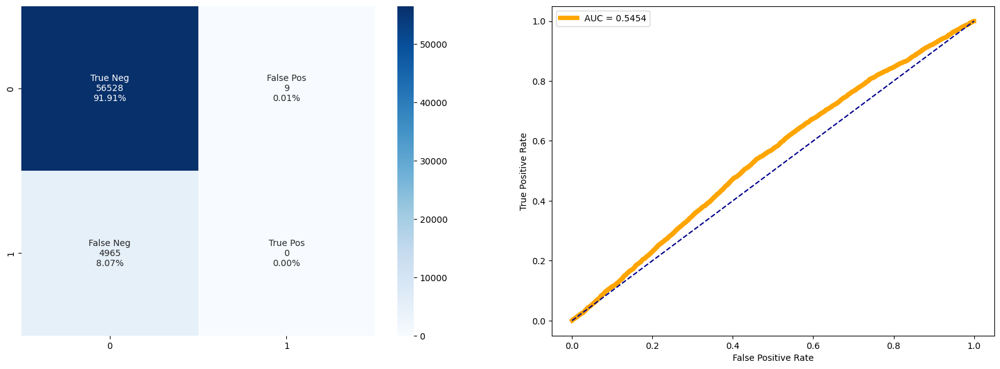

In [20]:
cf_matrix_roc_auc(lr, y_test, lr.predict(X_test), lr.predict_proba(X_test)[:,1], feature_importances=None)

Remarque: 

- Notons un fort déséquilibre entre la précision trouvée pour la Target 0 (0.92) et la Target 1 (0). Pour rappel, l'échantillon de travail n'est pas équilibré, avec 92% des individus classés en modalité 0 et 8% en modalité 1, à savoir en défaut de paiement de crédit..

= > Il est donc intéressant de travailler cet Oversampling (ou suréchantillonnage en français) en ajustant la distribution de classe de manière à avoir une répartition plus égalitaire.


#### Oversampling Data Using :SMOTE 
- SMOTE avec données de déséquilibre utilisant le module imblearn

In [17]:
from imblearn.over_sampling import SMOTE

In [18]:
print("Label 1, Before using SMOTE: {} ".format(sum(y_train==1)))
print("Label 0, Before using SMOTE: {} ".format(sum(y_train==0)))

Label 1, Before using SMOTE: 19860 
Label 0, Before using SMOTE: 226145 


In [19]:
#Test
print("Label 1, Before using SMOTE: {} ".format(sum(y_test==1)))
print("Label 0, Before using SMOTE: {} ".format(sum(y_test==0)))

Label 1, Before using SMOTE: 4965 
Label 0, Before using SMOTE: 56537 


In [20]:
sm = SMOTE(random_state=2)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [21]:
#Test 
sm = SMOTE(random_state=2)
X_test_res, y_test_res = sm.fit_resample(X_test, y_test)

In [22]:
print("Label 1, After using SMOTE: {}".format(sum(y_train_res==1)))
print("Label 0, After using SMOTE: {}".format(sum(y_train_res==0)))

Label 1, After using SMOTE: 226145
Label 0, After using SMOTE: 226145


In [23]:
#Test
print("Label 1, After using SMOTE: {}".format(sum(y_test_res==1)))
print("Label 0, After using SMOTE: {}".format(sum(y_test_res==0)))

Label 1, After using SMOTE: 56537
Label 0, After using SMOTE: 56537


In [24]:
lr = LogisticRegression(C = 0.0001, max_iter=100)
lr.fit(X_train_res, y_train_res)
roc_auc = roc_auc_score(y_test, lr.predict_proba(X_test)[:,1])
print('AUC : %0.4f' %roc_auc)
print(classification_report(y_test, lr.predict(X_test)))

AUC : 0.5673
              precision    recall  f1-score   support

           0       0.92      0.95      0.94     56537
           1       0.10      0.06      0.08      4965

    accuracy                           0.88     61502
   macro avg       0.51      0.51      0.51     61502
weighted avg       0.85      0.88      0.87     61502



In [25]:
lr = LogisticRegression(C = 0.0001, max_iter=100)
lr.fit(X_train_res, y_train_res)
roc_auc = roc_auc_score(y_test_res, lr.predict_proba(X_test_res)[:,1])
print('AUC : %0.4f' %roc_auc)
print(classification_report(y_test_res, lr.predict(X_test_res)))

AUC : 0.5739
              precision    recall  f1-score   support

           0       0.50      0.95      0.66     56537
           1       0.54      0.06      0.10     56537

    accuracy                           0.50    113074
   macro avg       0.52      0.50      0.38    113074
weighted avg       0.52      0.50      0.38    113074



NameError: name 'X_data' is not defined

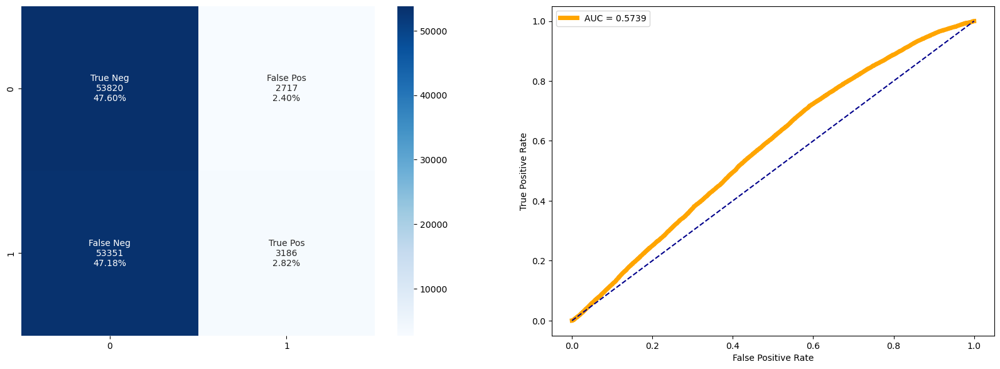

In [29]:
cf_matrix_roc_auc(lr, y_test_res, lr.predict(X_test_res), lr.predict_proba(X_test_res)[:,1], feature_importances=None)

Remarque: 
- une très legère amélioration sur notre AUC. 

#### Gradient Boosting: 


In [98]:
#pip install catboost

In [100]:
#pip install xgboost

In [26]:
#Predictive Models
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

models = [
          CatBoostClassifier(task_type="GPU", logging_level='Silent'),
          LGBMClassifier(device='gpu'),
          XGBClassifier(tree_method='gpu_hist', predictor='gpu_predictor')]


Remarque: 
- La fonction suivante train_models peut calculer les métriques auc, accuracy, f1, precision et recall. 

- On peut la modifier selon les besoins attendus, il suffit de se référer aux [Scoring de Classification de Scikit-learn.](https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter)


In [31]:
def train_models(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    output = {
      'AUC': roc_auc_score(y_test, model.predict_proba(X_test)[:,1]),
      'Accuracy': accuracy_score(y_test, model.predict(X_test)),
      'Precision': precision_score(y_test, model.predict(X_test)),
      'Recall': recall_score(y_test, model.predict(X_test)),
      'F1': f1_score(y_test, model.predict(X_test))
      }
          
    return output

In [32]:
%%time

name = []
auc = []
accuracy = []
precision = []
recall = []
f1 = []
time_ = []

for model in models:
    start = time.time()
    results = train_models(model, X_train, X_test, y_train, y_test)

    name.append(type(model).__name__)
    auc.append(results['AUC'])
    accuracy.append(results['Accuracy'])
    precision.append(results['Precision'])
    recall.append(results['Recall'])
    f1.append(results['F1'])
    time_.append(time.time()-start)

#Initialise data of lists
base_models = pd.DataFrame(data=[name, auc, accuracy, precision, recall, f1, time_]).T
base_models.columns = ['Model', 'AUC', 'Accuracy', 'Precision', 'Recall', 'F1', 'Time']
base_models.sort_values('AUC', ascending=False, inplace=True)

CPU times: total: 1min 2s
Wall time: 28.5 s


In [33]:
base_models

,Model,AUC,Accuracy,Precision,Recall,F1,Time
0,CatBoostClassifier,0.779966,0.920165,0.57971,0.040282,0.07533,19.103498
1,LGBMClassifier,0.777817,0.919938,0.557746,0.039879,0.074436,5.729998
2,XGBClassifier,0.771993,0.918377,0.45827,0.060826,0.107397,3.676502


Remarque: 
- Nous pouvons comparer une nouvelle fois nos modèles, cette fois-ci l'entrainement se fera avec les données SMOT

In [34]:
%%time

name = []
auc = []
accuracy = []
precision = []
recall = []
f1 = []
time_ = []

for model in models:
    start = time.time()
    results = train_models(model, X_train_res, X_test_res, y_train_res, y_test_res)

    name.append(type(model).__name__)
    auc.append(results['AUC'])
    accuracy.append(results['Accuracy'])
    precision.append(results['Precision'])
    recall.append(results['Recall'])
    f1.append(results['F1'])
    time_.append(time.time()-start)

#Initialise data of lists
models_res = pd.DataFrame(data=[name, auc, accuracy, precision, recall, f1, time_]).T        
models_res.columns = ['Model', 'AUC', 'Accuracy', 'Precision', 'Recall', 'F1', 'Time']
models_res.sort_values('AUC', ascending=False, inplace=True)


CPU times: total: 1min 24s
Wall time: 33.8 s


In [35]:
models_res

,Model,AUC,Accuracy,Precision,Recall,F1,Time
2,XGBClassifier,0.974585,0.942613,0.973509,0.909988,0.940677,5.799997
0,CatBoostClassifier,0.974513,0.944762,0.977027,0.910943,0.942828,19.985009
1,LGBMClassifier,0.973528,0.938642,0.97082,0.90447,0.936471,7.999991


Remarque: 
- Des trois modèles de classifier :
 * XGBClassifier est le meilleur avec un AUC = 0.73
 * Suivi par le LGBMClassifier et CatBoostClassifier. 

#### Feature Selection -Recursive Feature Elimination :

 - A présent,nous avons testé ces 3 modèles, on peut effectuer cette étape avec LGBMClassifier qui permet d'obtenir les meilleurs performances AUC score / Time. 
 
 - Nos ensembles de données contiennent +50 features, dont certaines peuvent ne pas contenir d'informations utiles. 

 - RFECV avec Scikit-learn appliquera une validation croisée pour trouver l'ensemble des features optimal qui maximisera nos performances. Le but est donc d'optimiser la métrique AUC tout en éliminant les features les moins importantes.

In [36]:
%%time
start = time.time()
rfecv = RFECV(estimator=LGBMClassifier(objective='binary'), 
              step=5, 
              cv=StratifiedKFold(5), 
              scoring='roc_auc', 
              verbose=2,
              n_jobs=-1)
rfecv.fit(X_train, y_train)

print('Time Elapsed: {}'.format(time.time()-start))


Time Elapsed: 116.1039936542511
CPU times: total: 34.6 s
Wall time: 1min 56s


In [37]:
print("Optimal number of features : %d" % rfecv.n_features_)
print("Selected Features: %s" % rfecv.support_[:20])
print("Feature Ranking : %s" % rfecv.ranking_[:20])

Optimal number of features : 58
Selected Features: [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True]
Feature Ranking : [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


Remarque: 
- RFEC conserve les feautures avec un sup à Rank 1 :  

In [38]:
rfecv

RFECV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
      estimator=LGBMClassifier(objective='binary'), n_jobs=-1,
      scoring='roc_auc', step=5, verbose=2)

In [39]:
app.shape

(307507, 60)

In [40]:
app.columns

Index(['SK_ID_CURR', 'TARGET', 'CREDIT_ANNUITY_RATIO',
       'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
       'INST_PAY_NUM_INSTALMENT_VERSION_SUM', 'EXT_SOURCE_MAX',
       'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
       'PREV_APP_NAME_CONTRACT_STATUS_MEAN', 'BUREAU_AMT_CREDIT_SUM_SUM',
       'EXT_SOURCE_VAR', 'DAYS_LAST_PHONE_CHANGE',
       'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
       'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
       'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN', 'PREV_APP_SELLERPLACE_AREA_MEAN',
       'PREV_APP_INTEREST_SHARE_MEAN', 'PREV_APP_DAYS_FIRST_DUE_SUM',
       'BUREAU_DAYS_CREDIT_MEAN', 'PREV_APP_AMT_ANNUITY_SUM', 'OWN_CAR_AGE',
       'FLAGS_DOCUMENTS_SUM', 'INST_PAY_DAYS_INSTALMENT_MAX',
       'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
       'INST_PAY_AMT_PAYMENT_DIFF_MEAN', 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
       'POS_CASH_SK_DPD_DEF_MEAN', 'CCB_BALANCE_LIMIT_RATIO_MEAN',
       'PREV_APP_CNT_PAYMENT_MEAN', 'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
       'FLAG_OWN_CAR', 'PR

In [41]:
app3 = app.drop(['OWN_CAR_AGE','FLAG_OWN_CAR'],axis=1)
app3.shape

(307507, 58)

In [42]:
ranking = pd.DataFrame({'Features': app3.columns})
ranking['RANK'] = np.asarray(rfecv.ranking_)
ranking.sort_values('RANK', inplace=True)

features_selection = ranking[ranking.RANK == 1]['Features'].to_list()
print(len(features_selection))
print(features_selection)

58
['SK_ID_CURR', 'CODE_GENDER', 'EXT_SOURCE_SUM', 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM', 'BUREAU_AMT_CREDIT_SUM_MEAN', 'CREDIT_GOODS_RATIO', 'DAYS_EMPLOYED', 'EXT_SOURCE_1', 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN', 'AMT_ANNUITY', 'EXT_SOURCE_2', 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN', 'DAYS_ID_PUBLISH', 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN', 'PREV_APP_DAYS_LAST_DUE_MAX', 'BUREAU_DAYS_CREDIT_MAX', 'INST_PAY_DAYS_PAYMENT_RATIO_MEAN', 'INST_PAY_AMT_INSTALMENT_SUM', 'INST_PAY_AMT_PAYMENT_RATIO_MEAN', 'PREV_APP_INTEREST_SHARE_MAX', 'INST_PAY_DAYS_INSTALMENT_MIN', 'ANNUITY_INCOME_RATIO', 'INST_PAY_AMT_INSTALMENT_MAX', 'AMT_CREDIT', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'FLAG_DOCUMENT_3', 'NAME_INCOME_TYPE_WORKING', 'PREV_APP_INTEREST_SHARE_MIN', 'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT', 'TARGET', 'CREDIT_ANNUITY_RATIO', 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN', 'INST_PAY_NUM_INSTALMENT_VERSION_SUM', 'EXT_SOURCE_MAX', 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX', 'PREV_APP_NAME_CONTRACT_STATUS_MEAN', 'BUREAU_AMT_C

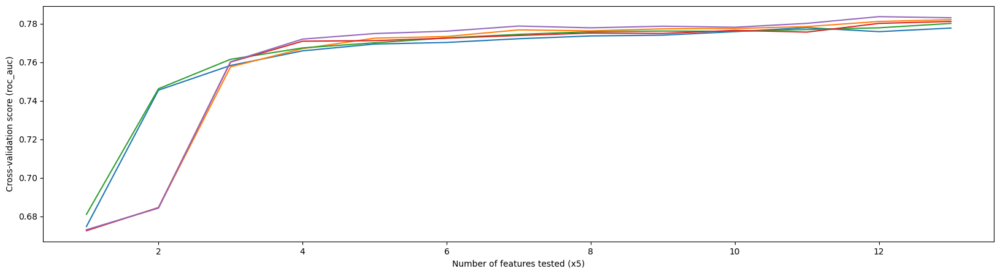

In [43]:
#Plot number of features vs CV scores
step=5
plt.figure(figsize=(20, 5))
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.xlabel('Number of features tested (x%d)' % step)
plt.ylabel('Cross-validation score (roc_auc)')
plt.show()

Remarque: 
- RFEC explique l'importance des features selectionnées en fonction de l'évolution du score AUC,comme nous pouvon le voir sur le graphe.

____

In [44]:
rfecv.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [45]:
#X_data is very important to implement the feature importance plot...
X_data = app3.loc[:, app3.columns[rfecv.get_support()]]
X_data.shape

(307507, 58)

In [46]:
#Merge operation with TARGET before save this reduced sample
X_data = X_data.merge(y_train, left_index=True, right_index=True)

In [47]:
X_data.shape

(246005, 59)

Remarque: 

- LGBMClassifier reste le modèle le plus performant selon le couple AUC score/Time. 
- CatBoostClassifier nécessite beaucoup plus de temps de calcul, il ne peut pas être retenu dans le contexte métier actuel. XGBClassifier est très rapide, il est en effet plus rapide que le LGBMClassifier mais avec une baisse de l'AUC score.


______

#### Fonction cout : déterminer par l'analyse des erreurs de prédiction:


La fonction coût sera déterminée par l'analyse des erreurs de prédiction

FP (False Positive) : les cas où la prédiction est positive, mais où la valeur réelle est négative.

Perte d'opportunité si le crédit client est refusé à tort, alors qu'il aurait été en mesure d'être remboursé.

FN (False Negative) : les cas où la prédiction est négative, mais où la valeur réelle est positive.

Perte réelle si le crédit client accepté se transforme en défaut de paiement.

Ainsi, les pertes d'un crédit en raison d'une mauvaise classification dépendront des probabilités Faux Positifs et Faux Négatifs.

L'idée est d'éviter les clients avec un fort risque de défaut. Il est donc nécessaire de pénaliser les FP et FN cités précédemment. Pour réduire ce rique de perte financière, il faut maximiser deux critères Recall et Precision.

\begin{aligned}{\text{Precision}}&={\frac {tp}{tp+fp}}\\{\text{Recall}}&={\frac {tp}{tp+fn}}\,\end{aligned}


Fonction qui optimise Precision et Recall avec une importance plus forte pour le critère Precision: 

\begin{aligned}{\text{Fscore}}&={\frac {precision.recall}{Beta^2.precision + recall}}\,\end{aligned}


Avec Beta le coefficient d'importance relative au critère Precision par rapport au recall :

\begin{aligned}{\text{Fscore}}&={\frac {precision.recall}{Beta^2.precision + recall}}\,&=(1+Beta^2) . {\frac {tp}{(1+Beta^2).tp + Beta^2.fn + fp}}\,\end{aligned}


L'application de cette métrique métier passe par la quantification de l'importance relative entre recall et précision, à savoir Beta (β). Cela revient à estimer le coût moyen d'un défaut, et le coût d'opportunité d'un client refusé par erreur. Cette connaissance métier n'est pas évoquée à ce stade du projet, nous allons donc l'estimer. Cette hypothèse pourra bien entendu être modifiée avec un interlocuteur métier.

- Défaut de paiement 30% du montant du crédit en pertes et autres frais de recouvrement.
- 10% de chance d'obtenir un crédit pour un client lambda qui souhaite emprunter.

\begin{aligned}{\text{Beta}}&={\frac {coef Recall}{coef Precision}}\end{aligned}



On peut se fixer l'hypothèse d'un Beta = 3. Vérifions-le avec une étape de tests fonctionnels.

Source : [F-measure](https://en.wikipedia.org/wiki/Precision_and_recall)

In [25]:
#Tests fonctionels avec des listes contenant 4 int: tp, tn, fp, fn
test_0 = [500, 300, 10, 30]
test_1 = [500, 300, 30, 10]
test_2 = [400, 300, 70, 50]
test_3 = [400, 300, 50, 70]
test_4 = [350, 250, 80, 120]
test_5 = [350, 250, 180, 90]

tests = [test_0, test_1, test_2, test_3, test_4, test_5]


def my_score(predictions_success: list) -> int:
    '''scoring fonction'''
    tp, tn, fp, fn = predictions_success
  
    beta = 3
    recall = tp / (tp + fn)
    precision = tp / (tp + fp) 
    fscore = (1+beta)*(tp / ((1+3)*tp + beta*fn + fp))
    
    return 1-fscore

for i, t in enumerate(tests):
    print("-----")
    print("Test", i, ":", t)
    print("Score :", my_score(t))

-----
Test 0 : [500, 300, 10, 30]
Score : 0.04761904761904767
-----
Test 1 : [500, 300, 30, 10]
Score : 0.029126213592232997
-----
Test 2 : [400, 300, 70, 50]
Score : 0.1208791208791209
-----
Test 3 : [400, 300, 50, 70]
Score : 0.13978494623655913
-----
Test 4 : [350, 250, 80, 120]
Score : 0.23913043478260865
-----
Test 5 : [350, 250, 180, 90]
Score : 0.2432432432432432


= > Les résultats sont satisfaisants, les risques liés aux erreurs de faux négatifs et positifs font ressortir un score plus importants, à l'inverse un dossier présentant moins de risque aura un score proche de zéro

In [26]:
def custom_score(y_true, y_pred, beta=3) :
    '''la fonction pénalisant fp et fn…''''
    tp, tn, fp, fn = confusion_matrix(y_true, y_pred).ravel()

    recall = tp / (tp + fn)
    precision = tp / (tp + fp)
    fscore = (1+beta)*((tp / ((1+beta)*tp + beta*fn + fp)))

    return 1-fscore

In [27]:
def cost_false(model, y_true, X_true):
    '''La fonction de coût analyse les erreurs de prédiction False Pos. et faux nég.'''
    cm = confusion_matrix(y_true, model.predict(X_true))
    FP = cm[0][1]/np.sum(cm)
    FN = cm[1][0]/np.sum(cm)
  
    print("False Pos: {0:.2%}".format(FP))
    print("False Neg: {0:.2%}".format(FN))
    return FP, FN

#### Hyperparameters tunning - Hyperopt et AUC score

Choisir les hyperparamètres appropriés est nécessaire pour affiner et booster les performances d'un algorithme d’apprentissage automatique. La métrique utilisée dans le contexte de notre classification binaire sera l'AUC score.

Grid Search ou Random Search étaient également une alternative possible, à la différence d'Hyperopt une "méthode basique" ne permet pas de traiter un large espace de paramètres, ici très largement privilégié.

Avec Hyperopt, on peut facilement analyser notre modèle de Boosting tout en variant les hyperparamètres dans l'espace que nous allons définir ci-dessous. Hyperopt fonctionne avec les algorithmes de ML distribué, comme Apache Spark MLlib et Horovod, ainsi qu’avec les modèles ML mono-machine, comme scikit-learn et TensorFlow.


In [28]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials, space_eval

Remarque : Hyperparamètres :

Ce code définit un espace de recherche pour l'optimisation hyperparamétrique d'un modèle de type gradient boosting (XGBoost). Cette méthode est utilisée pour ajuster les hyperparamètres d'un algorithme de machine learning, tels que le nombre d'estimateurs, le taux d'apprentissage, la profondeur maximale, la taille de l'échantillon et la régularisation.

Le module hyperopt est utilisé pour créer un espace de recherche aléatoire en spécifiant les plages de valeurs pour chaque hyperparamètre. Dans cet exemple, hp.quniform est utilisé pour les hyperparamètres discrets, tels que le nombre d'estimateurs et la profondeur maximale, tandis que hp.uniform est utilisé pour les hyperparamètres continus, tels que le taux d'apprentissage et les paramètres de régularisation.

Le choix des bornes et des distributions des hyperparamètres dépend des caractéristiques du jeu de données et de l'objectif de modélisation. Dans ce cas, **le nombre d'estimateurs est choisi entre 100 et 600**, avec des incréments de 100, ce qui est raisonnable pour la plupart des problèmes.**Le taux d'apprentissage est choisi uniformément entre 0,001 et 0,03**, ce qui est typique pour les problèmes de classification et de régression.**La profondeur maximale est choisie entre 3 et 7**, ce qui est également raisonnable pour la plupart des problèmes.**La taille de l'échantillon est choisie uniformément entre 0,60 et 0,95**, ce qui signifie que chaque arbre est construit à partir d'un échantillon aléatoire de cette taille.**La régularisation est choisie uniformément entre 1 et 20, ce qui est typique pour les problèmes de modélisation**.

Cet espace de recherche est utilisé ensuite avec un algorithme d'optimisation comme fmin de hyperopt pour trouver les meilleurs hyperparamètres qui minimisent une fonction de perte spécifique. L'objectif est de trouver les hyperparamètres qui maximisent la précision ou minimisent l'erreur de prédiction du modèle.

En général, cet espace de recherche est un bon point de départ pour l'optimisation hyperparamétrique d'un modèle XGBoost.

In [29]:
#Parameter space
space = {
    'n_estimators': hp.quniform('n_estimators', 100, 600, 100),
    'learning_rate': hp.uniform('learning_rate', 0.001, 0.03),
    'max_depth': hp.quniform('max_depth', 3, 7, 1),
    'subsample': hp.uniform('subsample', 0.60, 0.95),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.60, 0.95),
    'reg_lambda': hp.uniform('reg_lambda', 1, 20)
    }


In [30]:
def objective(params, eval_metric='custom_score'):
    #fonction objectif à minimiser.
    #Hyperopt cherchera à minimiser la perte renvoyée par cette fonction.
    
    params = {
        'n_estimators': int(params['n_estimators']),
        'learning_rate': params['learning_rate'],
        'max_depth': int(params['max_depth']),
        'subsample': params['subsample'],
        'colsample_bytree': params['colsample_bytree'],
        'reg_lambda': params['reg_lambda'],
        'device':'gpu'
        }
  
    
    model= LGBMClassifier(**params)
    cv = StratifiedKFold(5)
    if eval_metric == 'roc_auc': 
        score = cross_val_score(model, X_train, y_train, scoring='roc_auc', cv=cv).mean()

    elif eval_metric == 'custom_score': 
        y_pred = cross_val_predict(model, X_train, y_train, method='predict', cv=cv)
        score = custom_score(y_train, y_pred)
  
    loss = 1 - score    
    return {'loss': loss, 'params': params, 'status': STATUS_OK}

In [31]:
%%time
best = fmin(fn=objective, space=space, max_evals=30, rstate=np.random.default_rng(seed), algo=tpe.suggest)

100%|██████████| 30/30 [28:15<00:00, 56.50s/trial, best loss: 0.9768712020478082]
CPU times: total: 1h 38min 17s
Wall time: 28min 15s


In [32]:
lgbm = LGBMClassifier( #Fit un nouveau modèle basé sur les meilleurs paramètres
    n_estimators=int(best['n_estimators']), 
    colsample_bytree= best['colsample_bytree'],
    learning_rate= best['learning_rate'],
    max_depth= int(best['max_depth']),
    subsample= best['subsample'],
    reg_lambda= best['reg_lambda'],
    device='gpu')

lgbm.fit(X_train, y_train)
#pickle.dump(lgbm, open("Pickle/LGBMClassifier001.pkl", "wb"))

LGBMClassifier(colsample_bytree=0.7101130593686421, device='gpu',
               learning_rate=0.029773838236846102, max_depth=6,
               n_estimators=600, reg_lambda=12.574099502035919,
               subsample=0.6386481755927226)

In [7]:
#SCORE : 
LGBMClassifier01 = 'Pickle/LGBMClassifier.pickle'
# Chargement de train_set
with open(LGBMClassifier01, 'rb') as df_LGBMClassifier02:
    LGBMClassifier01 = pickle.load(df_LGBMClassifier02)
LGBMClassifier01.shape

In [33]:
roc_auc = roc_auc_score(y_test, lgbm.predict_proba(X_test)[:,1])
print('AUC : %0.6f' %roc_auc)

AUC : 0.782878


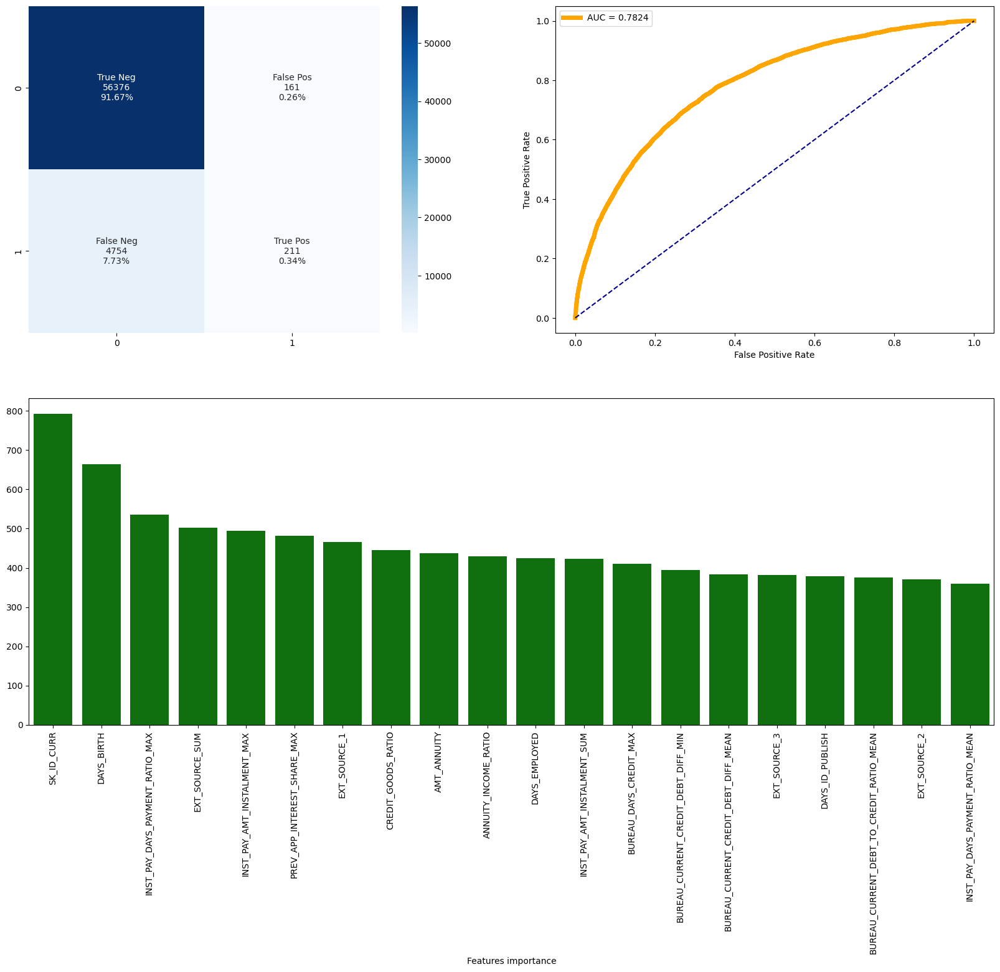

In [69]:
cf_matrix_roc_auc(lgbm, y_test, lgbm.predict(X_test), lgbm.predict_proba(X_test)[:,1], feature_importances=True)

In [34]:
#FP and FN
cost_false(lgbm, y_test, X_test)

False Pos: 0.25%
False Neg: 7.72%


(0.0024877239764560504, 0.07720074143930279)

In [71]:
#Check list features importance 
sorted_idx = np.argsort(lgbm.feature_importances_)[::-1]
for index in sorted_idx:
    print([X_data.columns[index], lgbm.feature_importances_[index]]) 

['SK_ID_CURR', 793]
['DAYS_BIRTH', 664]
['INST_PAY_DAYS_PAYMENT_RATIO_MAX', 536]
['EXT_SOURCE_SUM', 503]
['INST_PAY_AMT_INSTALMENT_MAX', 495]
['PREV_APP_INTEREST_SHARE_MAX', 481]
['EXT_SOURCE_1', 466]
['CREDIT_GOODS_RATIO', 446]
['AMT_ANNUITY', 437]
['ANNUITY_INCOME_RATIO', 430]
['DAYS_EMPLOYED', 424]
['INST_PAY_AMT_INSTALMENT_SUM', 423]
['BUREAU_DAYS_CREDIT_MAX', 410]
['BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN', 395]
['BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN', 383]
['EXT_SOURCE_3', 382]
['DAYS_ID_PUBLISH', 379]
['BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN', 376]
['EXT_SOURCE_2', 370]
['INST_PAY_DAYS_PAYMENT_RATIO_MEAN', 359]
['PREV_APP_DAYS_LAST_DUE_MAX', 358]
['BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX', 356]
['INST_PAY_DAYS_INSTALMENT_MIN', 349]
['PREV_APP_INTEREST_SHARE_MEAN', 318]
['INST_PAY_AMT_PAYMENT_RATIO_MEAN', 314]
['POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM', 314]
['BUREAU_AMT_CREDIT_SUM_SUM', 307]
['AMT_CREDIT', 307]
['BUREAU_AMT_CREDIT_SUM_MEAN', 301]
['EXT_SOURCE_MAX', 298]
['PREV_APP_DAYS

In [35]:
def objective(params, eval_metric='roc_auc'):
   #fonction objectif à minimiser.
   #Hyperopt cherchera à minimiser la perte renvoyée par cette fonction.

    params = {
        'n_estimators': int(params['n_estimators']),
        'learning_rate': params['learning_rate'],
        'max_depth': int(params['max_depth']),
        'subsample': params['subsample'],
        'colsample_bytree': params['colsample_bytree'],
        'reg_lambda': params['reg_lambda'],
        'device':'gpu'}
  
    
    model= LGBMClassifier(**params)
    cv = StratifiedKFold(5)
    if eval_metric == 'roc_auc': 
        score = cross_val_score(model, X_train_res, y_train_res, scoring='roc_auc', cv=cv).mean()

    elif eval_metric == 'custom_score': 
        y_pred = cross_val_predict(model, X_train_res, y_train_res, method='predict', cv=cv)
        score = custom_score(y_train_res, y_pred)
  
    loss = 1 - score    
    return {'loss': loss, 'params': params, 'status': STATUS_OK}

In [38]:
%%time
best = fmin(fn=objective, space=space, max_evals=30, rstate=np.random.default_rng(seed), algo=tpe.suggest)


100%|██████████| 30/30 [36:59<00:00, 73.98s/trial, best loss: 0.03162554696383568] 
CPU times: total: 2h 13min 22s
Wall time: 36min 59s


In [39]:
%%time
lgbm = LGBMClassifier( #Fit un nouveau modèle basé sur les meilleurs paramètres
    n_estimators=int(best['n_estimators']), 
    colsample_bytree= best['colsample_bytree'],
    learning_rate= best['learning_rate'],
    max_depth= int(best['max_depth']),
    subsample= best['subsample'],
    reg_lambda= best['reg_lambda'],
    device='gpu')

lgbm.fit(X_train_res, y_train_res)
pickle.dump(lgbm, open("Data/LGBMClassifier002.pkl", "wb"))

CPU times: total: 1min 27s
Wall time: 27.4 s


In [40]:
roc_auc = roc_auc_score(y_test_res, lgbm.predict_proba(X_test_res)[:,1])
print('AUC : %0.6f' %roc_auc)

AUC : 0.974103


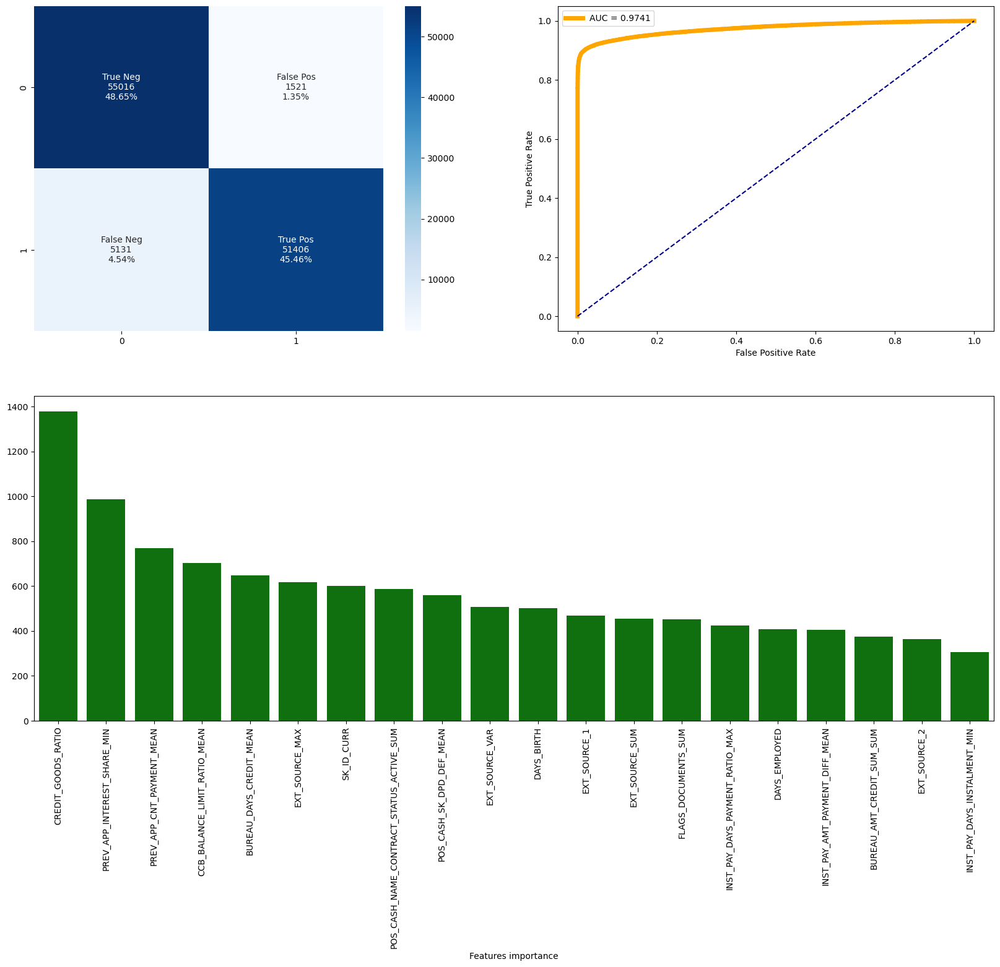

In [78]:
cf_matrix_roc_auc(lgbm, y_test_res, lgbm.predict(X_test_res), lgbm.predict_proba(X_test_res)[:,1], feature_importances=True)

In [41]:
#FP and FN
cost_false(lgbm, y_test_res, X_test_res)

False Pos: 1.35%
False Neg: 4.54%


(0.013451368130604737, 0.04537736349647134)

In [80]:
#Check list features importance 
sorted_idx = np.argsort(lgbm.feature_importances_)[::-1]
for index in sorted_idx:
    print([X_data.columns[index], lgbm.feature_importances_[index]]) 

['CREDIT_GOODS_RATIO', 1379]
['PREV_APP_INTEREST_SHARE_MIN', 987]
['PREV_APP_CNT_PAYMENT_MEAN', 770]
['CCB_BALANCE_LIMIT_RATIO_MEAN', 703]
['BUREAU_DAYS_CREDIT_MEAN', 647]
['EXT_SOURCE_MAX', 618]
['SK_ID_CURR', 600]
['POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM', 586]
['POS_CASH_SK_DPD_DEF_MEAN', 559]
['EXT_SOURCE_VAR', 508]
['DAYS_BIRTH', 502]
['EXT_SOURCE_1', 468]
['EXT_SOURCE_SUM', 454]
['FLAGS_DOCUMENTS_SUM', 452]
['INST_PAY_DAYS_PAYMENT_RATIO_MAX', 425]
['DAYS_EMPLOYED', 409]
['INST_PAY_AMT_PAYMENT_DIFF_MEAN', 405]
['BUREAU_AMT_CREDIT_SUM_SUM', 376]
['EXT_SOURCE_2', 365]
['INST_PAY_DAYS_INSTALMENT_MIN', 305]
['BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN', 301]
['AMT_ANNUITY', 297]
['PREV_APP_NAME_CONTRACT_STATUS_MEAN', 297]
['CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN', 281]
['PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN', 261]
['DAYS_ID_PUBLISH', 260]
['PREV_APP_SELLERPLACE_AREA_MEAN', 260]
['INST_PAY_AMT_PAYMENT_RATIO_MEAN', 252]
['EXT_SOURCE_3', 218]
['PREV_APP_DAYS_LAST_DUE_MAX', 213]
['PREV_APP_INTEREST

Remarque: 

Après une baseline faite avec un algorithme simple de régression logistique, l'AUC score avait été estimé ≈ 0.72 avec rééquilibrage (SMOTE) des données.

La suite de l'étude a été déroulée vers 3 algorithmes plus complexes de gradient boosting implémentés par LightGbm vs CatBoost vs XGBoost. Nous avons pu démontrer les performances de ces algorithmes par une sélection de features, à l'origine > 300, après RFECV 149. 

LightGbm ressort comme étant le plus rapide, le plus performant sur la métrique classique de l'AUC, il a donc été choisi pour l'optimisation des Hyperparamètres (Hyperopt).

La fonction coût permet de pénaliser les erreurs de prédiction qui peuvent coûter cher à l'entreprise. En effet, avec l'implémentation de la métrique métier les FP sont estimés à 0.19% (contre 0.21%), les FN sont à 0.78% (contre 0.77%). Au final la métrique métier permet de pénaliser légèrement mieux les erreurs du modèle.

_____
### Features Importances : Global et locale 

In [6]:
 #Feature importance locale: 
 import matplotlib.pyplot as plt
 
 # log the feature importance in mlflow
 explainer = shap.Explainer(lgbm, X_train)
 shap_values = explainer(X_test)
 shap.waterfall_plot(shap_values[0], X_test)
 plt.savefig("shap_waterfall_plot.png")
 mlflow.log_artifact("shap_waterfall_plot.png")

In [91]:
import xgboost
import shap

# train XGBoost model
model = xgboost.XGBClassifier().fit(X_train_res, y_train_res)

# compute SHAP values
explainer = shap.Explainer(model, X_train_res)
shap_values = explainer(X_train_res)

100%|===================| 452155/452290 [37:31<00:00]        

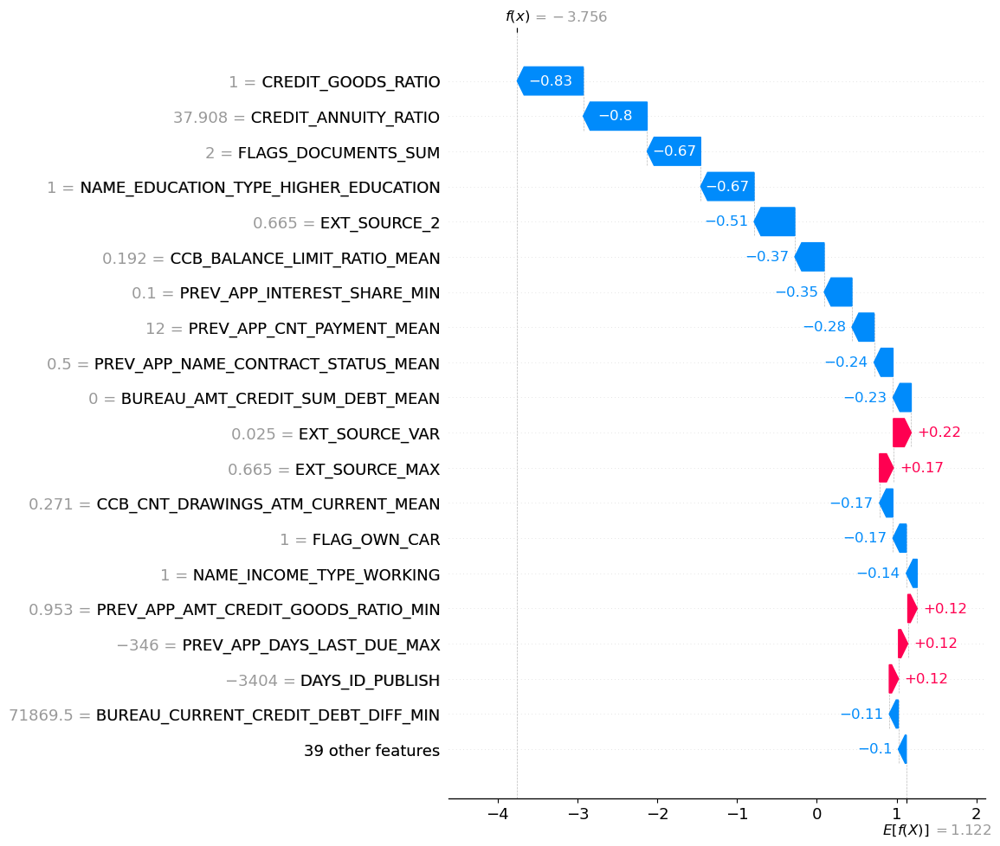

In [92]:
shap.plots.waterfall(shap_values[0], max_display=20)

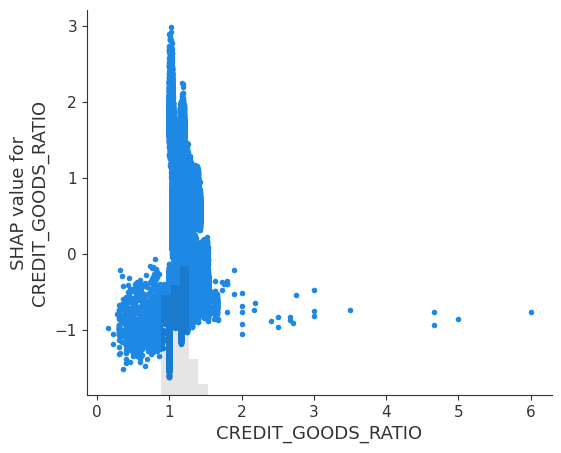

In [94]:
shap.plots.scatter(shap_values[:,"CREDIT_GOODS_RATIO"])

______

#### Phase de mise en place des modèles & MLFlow :

In [3]:
from mlflow.models.signature import infer_signature

In [52]:
X_train.shape

(246005, 58)

In [53]:
y_train.append

<bound method Series.append of 65179     0
149784    0
66840     0
51530     0
43043     0
         ..
292024    0
302192    0
295793    0
273513    0
128922    0
Name: TARGET, Length: 246005, dtype: int64>

In [54]:
signature = infer_signature(X_train, y_train)

  param_max_depth param_eta  mean_test_score
0               3       0.1         0.773998
1               5       0.1         0.780663
2               7       0.1         0.780546
3               3       0.3         0.781113
4               5       0.3         0.777497
5               7       0.3         0.769268
6               3       0.5         0.778666
7               5       0.5         0.765932
8               7       0.5         0.747788


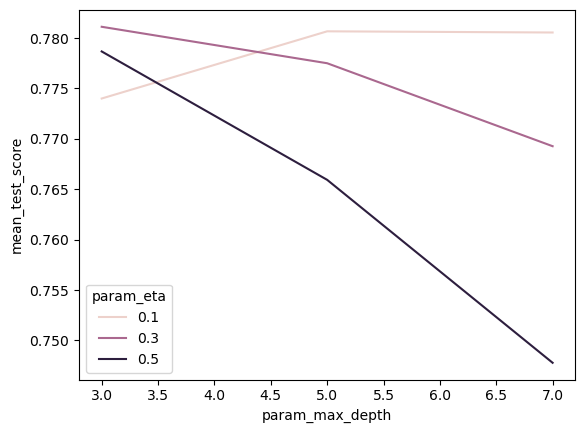

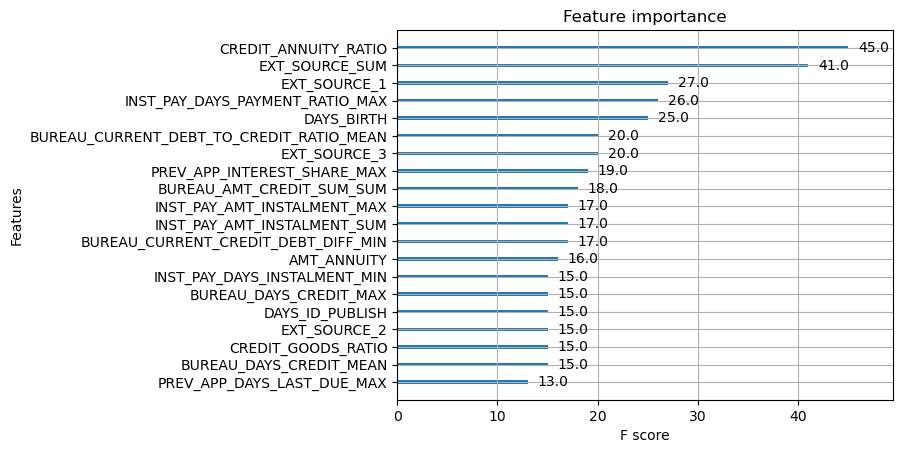

CPU times: total: 2h 9min 48s
Wall time: 33min 10s


In [68]:
%%time
#XGBoost + graphique 
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
import mlflow
import mlflow.xgboost

# ... code précédent ...
# définir les paramètres de la grille de recherche
param_grid = {'max_depth': [3, 5, 7], 'eta': [0.1, 0.3, 0.5]}

# définir le modèle XGBoost
xgb_model = xgb.XGBClassifier()

# utiliser GridSearchCV pour trouver les meilleurs paramètres
grid_search = GridSearchCV(xgb_model, param_grid, scoring='roc_auc', cv=5)
grid_search.fit(X_train, y_train)

# afficher les résultats sous forme de tableau
results_df = pd.DataFrame(grid_search.cv_results_)
print(results_df[['param_max_depth', 'param_eta', 'mean_test_score']])

# afficher les résultats sous forme de graphique
sns.lineplot(x='param_max_depth', y='mean_test_score', hue='param_eta', data=results_df)
plt.show()

# Afficher les feature importance
xgb.plot_importance(grid_search.best_estimator_, max_num_features=20)
plt.show()

# enregistrer les informations sur le modèle et les résultats
with mlflow.start_run():
    mlflow.log_params(grid_search.best_params_)
    mlflow.log_metric('auc', roc_auc_score(y_test, grid_search.predict_proba(X_test)[:,1]))
    mlflow.xgboost.log_model(grid_search.best_estimator_, "model")

[autoreload of packaging.specifiers failed: Traceback (most recent call last):
  File "c:\Users\Shadow\anaconda3\envs\Projet6-2\lib\site-packages\IPython\extensions\autoreload.py", line 261, in check
    superreload(m, reload, self.old_objects)
  File "c:\Users\Shadow\anaconda3\envs\Projet6-2\lib\site-packages\IPython\extensions\autoreload.py", line 484, in superreload
    update_generic(old_obj, new_obj)
  File "c:\Users\Shadow\anaconda3\envs\Projet6-2\lib\site-packages\IPython\extensions\autoreload.py", line 381, in update_generic
    update(a, b)
  File "c:\Users\Shadow\anaconda3\envs\Projet6-2\lib\site-packages\IPython\extensions\autoreload.py", line 333, in update_class
    if update_generic(old_obj, new_obj):
  File "c:\Users\Shadow\anaconda3\envs\Projet6-2\lib\site-packages\IPython\extensions\autoreload.py", line 381, in update_generic
    update(a, b)
  File "c:\Users\Shadow\anaconda3\envs\Projet6-2\lib\site-packages\IPython\extensions\autoreload.py", line 293, in update_functi

  param_max_depth param_eta  mean_test_score
0               3       0.1         0.773998
1               5       0.1         0.780663
2               7       0.1         0.780546
3               3       0.3         0.781113
4               5       0.3         0.777497
5               7       0.3         0.769268
6               3       0.5         0.778666
7               5       0.5         0.765932
8               7       0.5         0.747788


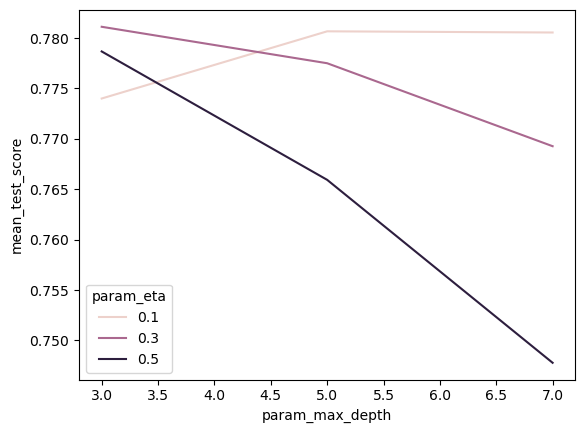

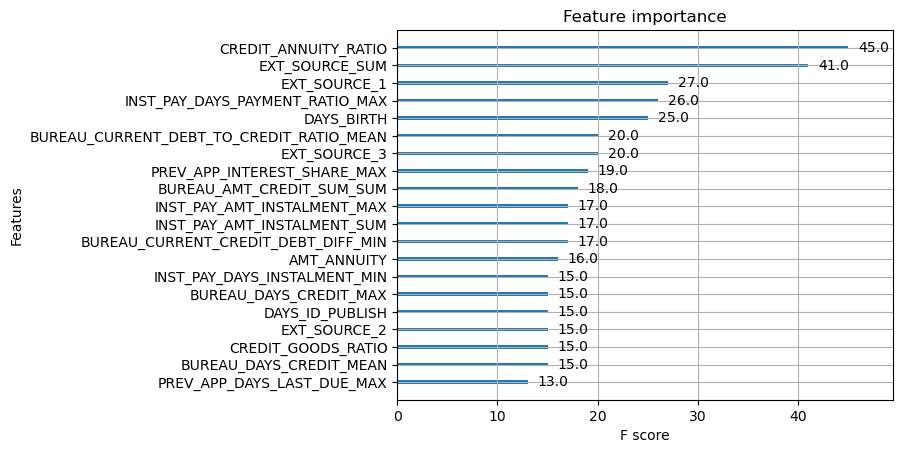

AttributeError: module 'xgboost' has no attribute 'predict_proba'

In [82]:
%%time
#XGBoost + graphique 
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
import mlflow
import mlflow.xgboost

# ... code précédent ...
# définir les paramètres de la grille de recherche
param_grid = {'max_depth': [3, 5, 7], 'eta': [0.1, 0.3, 0.5]}

# définir le modèle XGBoost
xgb_model = xgb.XGBClassifier()

# utiliser GridSearchCV pour trouver les meilleurs paramètres
grid_search = GridSearchCV(xgb_model, param_grid, scoring='roc_auc', cv=5)
grid_search.fit(X_train, y_train)

# afficher les résultats sous forme de tableau
results_df = pd.DataFrame(grid_search.cv_results_)
print(results_df[['param_max_depth', 'param_eta', 'mean_test_score']])

# afficher les résultats sous forme de graphique
sns.lineplot(x='param_max_depth', y='mean_test_score', hue='param_eta', data=results_df)
plt.show()

# Afficher les feature importance
xgb.plot_importance(grid_search.best_estimator_, max_num_features=20)
plt.show()

#Afficher les résultats AUC
roc_auc = roc_auc_score(y_test, xgb.predict_proba(X_test)[:,1])
print('AUC : %0.6f' %roc_auc)

# Afficher les vizs :
cf_matrix_roc_auc(xgb, y_test, xgb.predict(X_test), xgb.predict_proba(X_test)[:,1], feature_importances=True)

#FP and FN
cost_false(xgb, y_test, X_test)

# enregistrer les informations sur le modèle et les résultats
with mlflow.start_run():
    mlflow.log_params(grid_search.best_params_)
    mlflow.log_metric('auc', roc_auc_score(y_test, grid_search.predict_proba(X_test)[:,1]))
    mlflow.xgboost.log_model(grid_search.best_estimator_, "model")

In [5]:
#pip install joblib

In [72]:
from sklearn import datasets, preprocessing, model_selection, ensemble, pipeline
from sklearn.experimental import enable_hist_gradient_boosting

In [73]:
scaler = preprocessing.StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.077185 seconds.
You can set `force_col_wise=true` to remove the overhead.


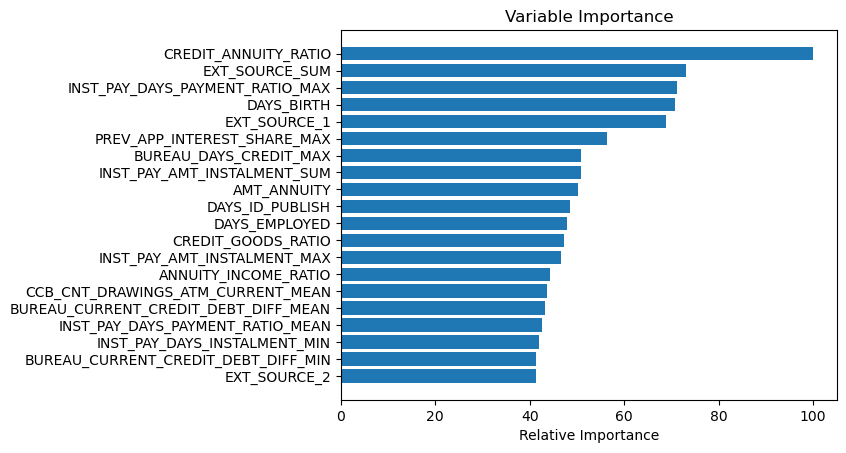

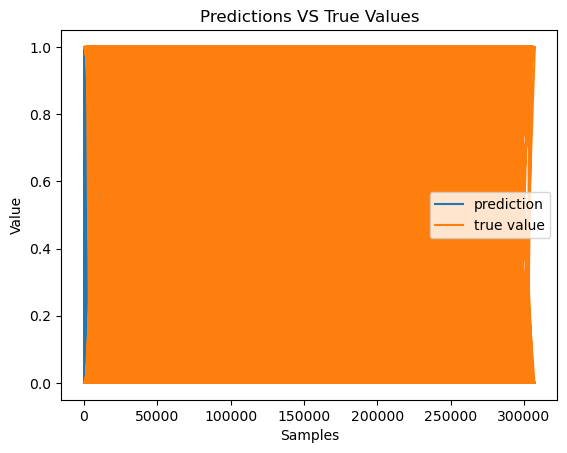

In [87]:
import mlflow
import lightgbm as lgb
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import matplotlib.pyplot as plt


# Définir les paramètres du modèle
params = {
    'objective': ['binary'],
    'metric': ['auc'],
    'boosting_type': ['gbdt'],
    'num_leaves': [31, 35, 40],
    'learning_rate': [0.05, 0.1],
    'feature_fraction': [0.9, 1.0],
    'bagging_fraction': [0.8, 1.0],
    'bagging_freq': [5, 10],
    'verbose': [0]
}

# définir le modèle
lgb_model = lgb.LGBMClassifier()

# définir la grille de recherche
grid_search = GridSearchCV(lgb_model, param_grid=params, cv=5, n_jobs=-1, scoring='roc_auc')

# démarrer une session MLflow
with mlflow.start_run():
    # entraîner le modèle avec la grille de recherche
    grid_search.fit(X_train, y_train)

    # faire des prédictions sur les données de test
    y_pred = grid_search.predict(X_test)

    # calculer le score AUC
    auc = roc_auc_score(y_test, y_pred)

    # enregistrer les paramètres dans MLflow
    mlflow.log_params(grid_search.best_params_)

    # enregistrer le score AUC dans MLflow
    mlflow.log_metric("auc", auc)

    # Afficher les 20 premières features d'importance
    feature_importance = grid_search.best_estimator_.feature_importances_
    feature_importance = 100.0 * (feature_importance / feature_importance.max())
    sorted_idx = np.argsort(feature_importance)[-20:]
    pos = np.arange(sorted_idx.shape[0]) + .5
    plt.barh(pos, feature_importance[sorted_idx], align='center')
    plt.yticks(pos, X.columns[sorted_idx])
    plt.xlabel('Relative Importance')
    plt.title('Variable Importance')
    plt.show()
    
    # Afficher les résultats
    plt.plot(y_pred, label='prediction')
    plt.plot(y_test, label='true value')
    plt.xlabel('Samples')
    plt.ylabel('Value')
    plt.legend()
    plt.title('Predictions VS True Values')
    plt.show()

In [ ]:
gsv.best_score_, gsv.best_params_

In [ ]:
gsv.best_estimator_.score(X_test_scaled, y_test)

In [ ]:
pipeline = pipeline.Pipeline([('scaler', preprocessing.StandardScaler()), 
                              ('regressor', ensemble.HistGradientBoostingRegressor(**gsv.best_params_))])

In [ ]:
pipeline.fit(X_train, y_train)

In [ ]:
pipeline.score(X_test, y_test)

In [ ]:
import joblib

In [ ]:
joblib.dump(pipeline, 'pipeline_housing.joblib')

In [ ]:
mlflow.sklearn.save_model(pipeline, 'mlflow_model', signature=signature)

_______
_____
Autre test MLFlow

2023/01/29 23:28:03 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '2814ae44d0b449a4a45e9f498fd1b225', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.146478 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.066410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.062605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.062825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.071725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM]

2023/01/29 23:29:49 INFO mlflow.sklearn.utils: Logging the 5 best runs, no runs will be omitted.


   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0       4.572595      0.427504         0.224099        0.055491   
1       4.389294      0.118440         0.190902        0.008490   
2       4.856202      0.311873         0.183900        0.005653   

  param_num_leaves param_objective param_verbose  \
0               31          binary             0   
1               35          binary             0   
2               40          binary             0   

                                              params  split0_test_score  \
0  {'num_leaves': 31, 'objective': 'binary', 'ver...           0.777725   
1  {'num_leaves': 35, 'objective': 'binary', 'ver...           0.778732   
2  {'num_leaves': 40, 'objective': 'binary', 'ver...           0.778642   

   split1_test_score  split2_test_score  split3_test_score  split4_test_score  \
0           0.782080           0.780133           0.781157           0.783077   
1           0.782372           0.780873           0.780606 

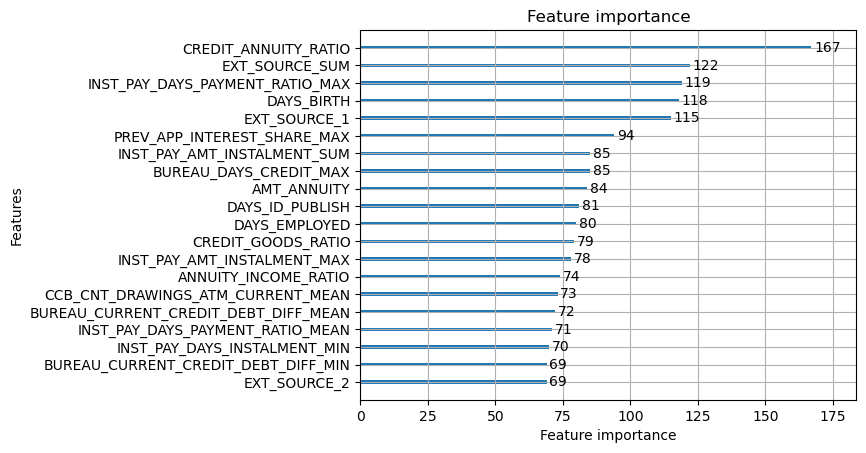

CPU times: total: 4min 28s
Wall time: 1min 59s


In [63]:
%%time
#XGBoost + graphique 
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
import mlflow
import mlflow.xgboost

import mlflow
import lightgbm as lgb
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import matplotlib.pyplot as plt

params = {
    'n_estimators': [ 100, 600, 100],
    'learning_rate': [ 0.001, 0.03],
    'max_depth': [ 3, 7, 1],
    'subsample': [ 0.60, 0.95],
    'colsample_bytree': [ 0.60, 0.95],
    'reg_lambda': [ 1, 20]
}
# définir le modèle
lgb_model = lgb.LGBMClassifier()

# définir la grille de recherche
grid_search = GridSearchCV(lgb_model, param_grid=params, cv=5, n_jobs=-1, scoring='roc_auc')


# utiliser GridSearchCV pour trouver les meilleurs paramètres
grid_search = GridSearchCV(lgb_model, param_grid, scoring='roc_auc', cv=5)
grid_search.fit(X_train, y_train)

# afficher les résultats sous forme de tableau
results_df = pd.DataFrame(grid_search.cv_results_)
print(results_df)

# Afficher les feature importance
lgb.plot_importance(grid_search.best_estimator_, max_num_features=20)
plt.show()
#Viz Matric / Feautures importance
# cf_matrix_roc_auc(lgbm, y_test, lgbm.predict(X_test), lgbm.predict_proba(X_test)[:,1], feature_importances=True)
#Mlflow
mlflow.set_experiment("lgbClassifier1")
mlflow.sklearn.autolog()
# enregistrer les informations sur le modèle et les résultats
with mlflow.start_run(run_name = "LGBMClassifier1"):
    mlflow.log_params(grid_search.best_params_)
    mlflow.log_metric('auc', roc_auc_score(y_test, grid_search.predict_proba(X_test)[:,1]))
    mlflow.lightgbm.log_model(grid_search.best_estimator_, "model")

_____
### Phase de mise en place des différents modèles et utilisant de MlFlow.

--------------------------------------------------
AUC : 0.782878
--------------------------------------------------
--------------------------------------------------
False Pos: 0.25%
False Neg: 7.72%
--------------------------------------------------


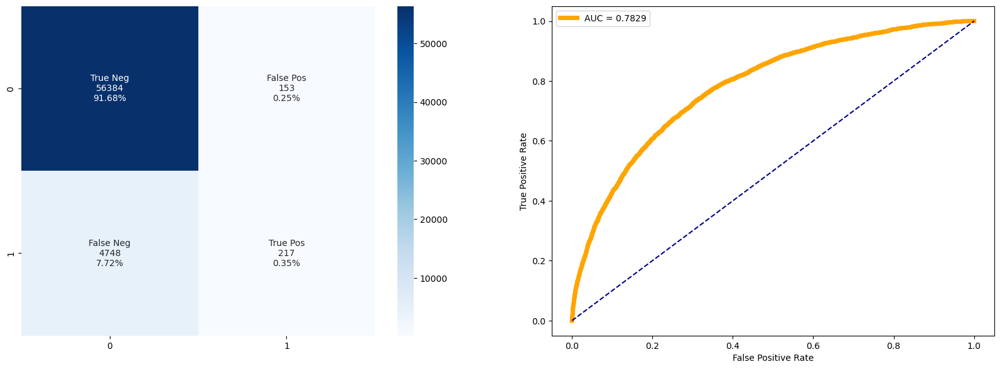

2023/02/01 18:28:23 INFO mlflow.tracking.fluent: Experiment with name 'lgbClassifier5' does not exist. Creating a new experiment.


CPU times: total: 2min 11s
Wall time: 5min 10s


In [45]:
%%time
#XGBoost + graphique 
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
import mlflow
import mlflow.xgboost

import mlflow
import lightgbm as lgb
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import matplotlib.pyplot as plt

import lightgbm as lgb
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import mlflow
import mlflow.sklearn


# Define the pipeline
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('sampler', SMOTE()),
    ('model', lgb.LGBMClassifier())
])

params = {
    'model__boosting_type': ['gbdt'],
    'model__learning_rate': [0.1],
    'model__n_estimators': [100, 500],
    'model__num_leaves': [31, 63],
}


# définir la grille de recherche
grid_search = GridSearchCV(pipe, param_grid=params,n_jobs=-1, cv=5, scoring='roc_auc')



# utiliser GridSearchCV pour trouver les meilleurs paramètres
grid_search.fit(X_train, y_train)

# afficher les résultats sous forme de tableau
results_df = pd.DataFrame(grid_search.cv_results_)
results_df

#Score Métrique AUC:
print('-'*50)
roc_auc = roc_auc_score(y_test, lgbm.predict_proba(X_test)[:,1])
print('AUC : %0.6f' %roc_auc)
print('-'*50)

#FP and FN - fonction coût:
print('-'*50)
cost_false(lgbm, y_test, X_test)
print('-'*50)


#Viz Matric / Feautures importance
cf_matrix_roc_auc(lgbm, y_test, lgbm.predict(X_test), lgbm.predict_proba(X_test)[:,1], feature_importances=False)

#Mlflow
mlflow.set_experiment("lgbClassifier5")
mlflow.sklearn.autolog()
# enregistrer les informations sur le modèle et les résultats
with mlflow.start_run(run_name = "lgbClassifier5"):
    mlflow.log_params(grid_search.best_params_)
    mlflow.log_metric('auc', roc_auc_score(y_test, grid_search.predict_proba(X_test)[:,1]))
    mlflow.lightgbm.log_model(grid_search.best_estimator_, "model")

In [68]:
%%time
#XGBoost + graphique 
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
import mlflow
import mlflow.xgboost

import mlflow
import lightgbm as lgb
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import matplotlib.pyplot as plt

import lightgbm as lgb
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import mlflow
import mlflow.sklearn

#########################

# Define the pipeline | Avec Equilibrage des données (smote)
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('sampler', SMOTE()),
    ('model', lgb.LGBMClassifier())
])

params = {
    'model__boosting_type': ['gbdt'],
    'model__learning_rate': [0.1],
    'model__n_estimators': [100, 500],
    'model__num_leaves': [31, 63],
}

# définir la grille de recherche
grid_search = GridSearchCV(pipe, param_grid=params,n_jobs=-1, cv=5, scoring='roc_auc')


# utiliser GridSearchCV pour trouver les meilleurs paramètres
grid_search.fit(X_train, y_train)

# afficher les résultats sous forme de tableau
results_df = pd.DataFrame(grid_search.cv_results_)
results_df

#Mlflow
mlflow.set_experiment("lgbClassifier5")
mlflow.sklearn.autolog()
# enregistrer les informations sur le modèle et les résultats
with mlflow.start_run():
    mlflow.log_params(grid_search.best_params_)
    mlflow.log_metric('auc', roc_auc_score(y_test, grid_search.predict_proba(X_test)[:,1]))
    mflow.sklearn.log_model(grid_search.best_estimator_,"model1")
    mlflow.lightgbm.log_model(grid_search.best_estimator_, "model2")


2023/02/02 00:28:07 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '54776d16bc7042c6974f7fccb31f6623', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2023/02/02 00:34:38 INFO mlflow.sklearn.utils: Logging the 5 best runs, no runs will be omitted.


NameError: name 'mflow' is not defined

In [44]:
def cf_matrix_roc_auc(model, y_true, y_pred, y_pred_proba, feature_importances):
    '''Cette fonction fera un  tracé de une matrice de confusion sklearn 
       utilisant une visualisation Seaborn heatmap + courbe ROC.'''
       
    fig = plt.figure(figsize=(20,15))
  
    plt.subplot(221)
    cf_matrix = confusion_matrix(y_true, y_pred)
    group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
  
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')

    plt.subplot(222)
    fpr,tpr,_ = roc_curve(y_true, y_pred_proba)
    plt.plot(fpr, tpr, color='orange', linewidth=5, label='AUC = %0.4f' %roc_auc)
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()

    if feature_importances : 
        plt.subplot(212)
        indices = np.argsort(model.feature_importances_)[::-1]
    
    plt.show()

In [66]:
print('-'*50)
roc_auc = roc_auc_score(y_test, lgbm.predict_proba(X_test)[:,1])
print('AUC : %0.6f' %roc_auc)
print('-'*50)

#FP and FN - fonction coût:
print('-'*50)
cost_false(lgbm, y_test, X_test)
print('-'*50)

--------------------------------------------------
AUC : 0.722190
--------------------------------------------------
--------------------------------------------------
False Pos: 2.47%
False Neg: 7.18%
--------------------------------------------------


In [67]:
results_df = pd.DataFrame(grid_search.cv_results_)
results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_model__boosting_type,param_model__learning_rate,param_model__n_estimators,param_model__num_leaves,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,33.489897,0.499772,0.795402,0.032448,gbdt,0.1,100,31,"{'model__boosting_type': 'gbdt', 'model__learn...",0.735388,0.732501,0.739152,0.733610,0.737914,0.735713,0.002511,4
1,40.214696,0.773909,0.974100,0.028475,gbdt,0.1,100,63,"{'model__boosting_type': 'gbdt', 'model__learn...",0.743752,0.746049,0.748685,0.743314,0.747117,0.745783,0.002024,3
2,93.024098,0.397318,3.335003,0.191305,gbdt,0.1,500,31,"{'model__boosting_type': 'gbdt', 'model__learn...",0.755483,0.760488,0.761759,0.755230,0.759232,0.758438,0.002641,2
3,95.256898,10.396999,3.090101,0.064542,gbdt,0.1,500,63,"{'model__boosting_type': 'gbdt', 'model__learn...",0.757926,0.762039,0.761695,0.757223,0.762521,0.760281,0.002236,1


NameError: name 'X_data' is not defined

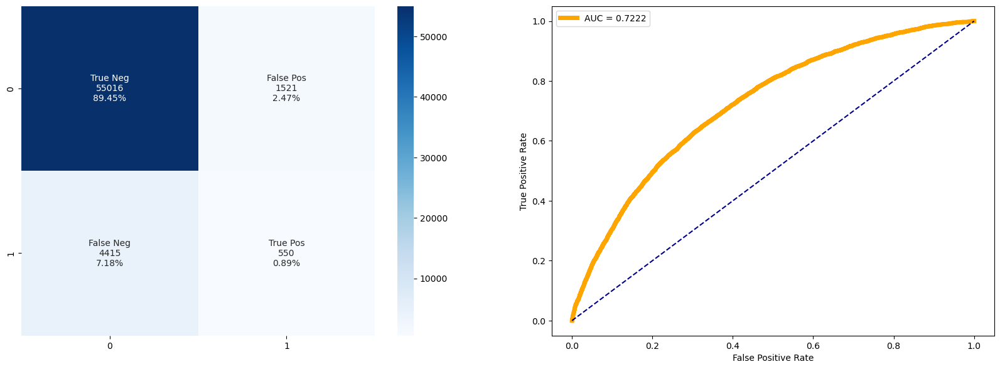

In [73]:
cf_matrix_roc_auc(lgbm, y_test, lgbm.predict(X_test), lgbm.predict_proba(X_test)[:,1], feature_importances=False)

In [54]:
valid_data=lgb.Dataset(X_test,label=y_test)
train_data=lgb.Dataset(X_train,label=y_train)

#Select Hyper-Parameters
params2 = {'metric' : 'auc',
          'boosting_type' : 'gbdt',
          'colsample_bytree' : 0.9234,
          'num_leaves' : 13,
          'max_depth' : -1,
          'n_estimators' : 200,
          'min_child_samples': 399, 
          'min_child_weight': 0.1,
          'reg_alpha': 2,
          'reg_lambda': 5,
          'subsample': 0.855,
          'verbose' : -1,
          'num_threads' : 4
}

#Train model on selected parameters and number of iterations
lgbm2 = lgb.train(params2,
                 train_data,
                 2500,
                 valid_sets=valid_data,
                 early_stopping_rounds= 30,
                 verbose_eval= 10
                 )


Training until validation scores don't improve for 30 rounds
[10]	valid_0's auc: 0.737701
[20]	valid_0's auc: 0.750455
[30]	valid_0's auc: 0.75774
[40]	valid_0's auc: 0.762337
[50]	valid_0's auc: 0.765688
[60]	valid_0's auc: 0.767398
[70]	valid_0's auc: 0.768882
[80]	valid_0's auc: 0.76993
[90]	valid_0's auc: 0.770906
[100]	valid_0's auc: 0.771443
[110]	valid_0's auc: 0.771799
[120]	valid_0's auc: 0.772334
[130]	valid_0's auc: 0.772668
[140]	valid_0's auc: 0.772743
[150]	valid_0's auc: 0.772818
[160]	valid_0's auc: 0.772908
[170]	valid_0's auc: 0.773042
[180]	valid_0's auc: 0.773197
[190]	valid_0's auc: 0.773246
[200]	valid_0's auc: 0.773443
Did not meet early stopping. Best iteration is:
[200]	valid_0's auc: 0.773443


In [4]:
%time shap_values = shap.TreeExplainer(lgbm2).shap_values(X_test)

____


In [ ]:
%%time
#XGBoost + graphique 
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
import mlflow
import mlflow.xgboost

import mlflow
import lightgbm as lgb
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV
import matplotlib.pyplot as plt

import lightgbm as lgb
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import mlflow
import mlflow.sklearn


# Define the pipeline
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('sampler', SMOTE()),
    ('model', lgb.LGBMClassifier())
])
#Paramètres 
params = {
    'model__boosting_type': ['gbdt'],
    'model__learning_rate': [0.1],
    'model__n_estimators': [100, 500],
    'model__num_leaves': [31, 63],
}

# définir le modèle
#lgb_model = lgb.LGBMClassifier()

# définir la grille de recherche
grid_search = GridSearchCV(pipe, param_grid=params,n_jobs=-1, cv=5, scoring='roc_auc')
grid_search.fit(X_train, y_train)

# afficher les résultats sous forme de tableau
results_df = pd.DataFrame(grid_search.cv_results_)
results_df

#Score Métrique AUC:
print('-'*50)
roc_auc = roc_auc_score(y_test, lgbm.predict_proba(X_test)[:,1])
print('AUC : %0.6f' %roc_auc)
print('-'*50)

#FP and FN - fonction coût:
print('-'*50)
cost_false(lgbm, y_test, X_test)
print('-'*50)

#Score- Viz:

#Viz Matric / Feautures importance
cf_matrix_roc_auc(lgbm, y_test, lgbm.predict(X_test), lgbm.predict_proba(X_test)[:,1], feature_importances=False)

#Mlflow
mlflow.set_experiment("lgbClassifier5")
mlflow.sklearn.autolog()
# enregistrer les informations sur le modèle et les résultats
with mlflow.start_run(run_name = "lgbClassifier5"):
    mlflow.log_params(grid_search.best_params_)
    mlflow.log_metric('auc', roc_auc_score(y_test, grid_search.predict_proba(X_test)[:,1]))
    mlflow.lightgbm.log_model(grid_search.best_estimator_, "model")

______
_______
Exemple MLFlowUI

In [48]:
%%timeit
import os
import warnings
import sys

import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNet
from urllib.parse import urlparse
import mlflow
import mlflow.sklearn

import logging

logging.basicConfig(level=logging.WARN)
logger = logging.getLogger(__name__)


def eval_metrics(actual, pred):
    rmse = np.sqrt(mean_squared_error(actual, pred))
    mae = mean_absolute_error(actual, pred)
    r2 = r2_score(actual, pred)
    return rmse, mae, r2


if __name__ == "__main__":
    warnings.filterwarnings("ignore")
    np.random.seed(40)

    # Read the wine-quality csv file from the URL
    csv_url = (
        "winequality-red.csv"
    )
    try:
        data = pd.read_csv(csv_url, sep=";")
    except Exception as e:
        logger.exception(
            "Unable to download training & test CSV, check your internet connection. Error: %s", e
        )

    # Split the data into training and test sets. (0.75, 0.25) split.
    train, test = train_test_split(data)

    # The predicted column is "quality" which is a scalar from [3, 9]
    train_x = train.drop(["quality"], axis=1)
    test_x = test.drop(["quality"], axis=1)
    train_y = train[["quality"]]
    test_y = test[["quality"]]

    alpha = 1
    l1_ratio = 1

    with mlflow.start_run():
        lr = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, random_state=42)
        lr.fit(train_x, train_y)

        predicted_qualities = lr.predict(test_x)

        (rmse, mae, r2) = eval_metrics(test_y, predicted_qualities)

        print("Elasticnet model (alpha={:f}, l1_ratio={:f}):".format(alpha, l1_ratio))
        print("  RMSE: %s" % rmse)
        print("  MAE: %s" % mae)
        print("  R2: %s" % r2)

        mlflow.log_param("alpha", alpha)
        mlflow.log_param("l1_ratio", l1_ratio)
        mlflow.log_metric("rmse", rmse)
        mlflow.log_metric("r2", r2)
        mlflow.log_metric("mae", mae)

        tracking_url_type_store = urlparse(mlflow.get_tracking_uri()).scheme

        # Model registry does not work with file store
        if tracking_url_type_store != "file":

            # Enregistrez le modèle:
            # Il existe d'autres façons d'utiliser le registre modèle, qui dépend du cas d'utilisation,
            # veuillez vous référer à la doc pour plus d'informations :
            # https://mlflow.org/docs/latest/model-registry.html#api-workflow
            mlflow.sklearn.log_model(lr, "model", registered_model_name="ElasticnetWineModel")
        else:
            mlflow.sklearn.log_model(lr, "model")

Elasticnet model (alpha=1.000000, l1_ratio=1.000000):
  RMSE: 0.8328280500742669
  MAE: 0.672504249193216
  R2: 0.017246911564584355
Elasticnet model (alpha=1.000000, l1_ratio=1.000000):
  RMSE: 0.8328280500742669
  MAE: 0.672504249193216
  R2: 0.017246911564584355
Elasticnet model (alpha=1.000000, l1_ratio=1.000000):
  RMSE: 0.8328280500742669
  MAE: 0.672504249193216
  R2: 0.017246911564584355
Elasticnet model (alpha=1.000000, l1_ratio=1.000000):
  RMSE: 0.8328280500742669
  MAE: 0.672504249193216
  R2: 0.017246911564584355
Elasticnet model (alpha=1.000000, l1_ratio=1.000000):
  RMSE: 0.8328280500742669
  MAE: 0.672504249193216
  R2: 0.017246911564584355
Elasticnet model (alpha=1.000000, l1_ratio=1.000000):
  RMSE: 0.8328280500742669
  MAE: 0.672504249193216
  R2: 0.017246911564584355
Elasticnet model (alpha=1.000000, l1_ratio=1.000000):
  RMSE: 0.8328280500742669
  MAE: 0.672504249193216
  R2: 0.017246911564584355
Elasticnet model (alpha=1.000000, l1_ratio=1.000000):
  RMSE: 0.83282

_______
-------
## Affichage MlFlow tracking (local) : 
    - paramètres des modèles 
    - résultats 

In [3]:
# pip install pyngrok

In [4]:
from pyngrok import ngrok
# Terminate open tunnels if exist
ngrok.kill()

#setting the authtoken(optional)
#get your authtoken from https://dashboard.ngrok.com/auth
NGROK_AUTH_TOKEN = "2KmsF94IL0NCPhuGjTAxfZoFUzR_4yvjT5kTTrrHwxTprkFn6"
ngrok.set_auth_token(NGROK_AUTH_TOKEN)

#Open an HTTPs tunnel on port 5000 for http://localhost:5000
ngrok_tunnel = ngrok.connect(addr="5000",proto="http",bind_tls=True)
print("mlflow tracking UI",ngrok_tunnel.public_url)

mlflow tracking UI https://a705-85-190-88-254.ngrok.io


t=2023-03-01T22:10:22+0100 lvl=warn msg="failed to open private leg" id=244e17381a60 privaddr=localhost:5000 err="dial tcp [::1]:5000: connectex: No connection could be made because the target machine actively refused it."
t=2023-03-01T22:10:25+0100 lvl=warn msg="failed to open private leg" id=a5ae969d213c privaddr=localhost:5000 err="dial tcp [::1]:5000: connectex: No connection could be made because the target machine actively refused it."


In [5]:
#Lecture MLflow : 
!mlflow ui

t=2023-03-01T22:10:53+0100 lvl=warn msg="failed to open private leg" id=0cbd44ebea9e privaddr=localhost:5000 err="dial tcp [::1]:5000: connectex: No connection could be made because the target machine actively refused it."
t=2023-03-01T22:10:56+0100 lvl=warn msg="failed to open private leg" id=a56e45cf6df1 privaddr=localhost:5000 err="dial tcp [::1]:5000: connectex: No connection could be made because the target machine actively refused it."
t=2023-03-01T22:11:12+0100 lvl=warn msg="failed to open private leg" id=02c453fc3987 privaddr=localhost:5000 err="dial tcp [::1]:5000: connectex: No connection could be made because the target machine actively refused it."
t=2023-03-01T22:11:14+0100 lvl=warn msg="failed to open private leg" id=f85c77382f38 privaddr=localhost:5000 err="dial tcp [::1]:5000: connectex: No connection could be made because the target machine actively refused it."


^C


____
____

In [96]:
# Transformations de variables
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, RobustScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

# Feature engineering
import featuretools as ft
from featuretools import selection

# Package pour augmenter la data
from imblearn.over_sampling import SMOTE

# Metrics de ML
from sklearn.metrics import auc, roc_curve, roc_auc_score, make_scorer
from sklearn.metrics import accuracy_score, recall_score
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

from lime.lime_tabular import LimeTabularExplainer
from sklearn.neighbors import NearestNeighbors

# Packages de cross_validation
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.model_selection import cross_validate
from sklearn.calibration import calibration_curve, CalibratedClassifierCV
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.model_selection import train_test_split

# Packages hyperopt pour la séléction d'hyperparamètres
from hyperopt import hp, tpe
from hyperopt.fmin import fmin

# Modèles de ML
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.dummy import DummyClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import ElasticNet

color = sns.color_palette()

import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()

from sklearn.metrics import auc
from sklearn.metrics import roc_curve

In [97]:
#Transformation des données :
#Pipeline d'imputation des valeurs manquantes et standardisation:

var_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler()),
])


In [98]:
#Séléction du meilleur modèle
#Liste des classifieurs étudiés

# Dictionnaire de classifieurs 
classifiers_1 = { 'Dummy Classifier': DummyClassifier(),
                  'Logistic Regression': LogisticRegression(),
                  'Random Forest': RandomForestClassifier(n_estimators=100),
                  'Multi-layer Perceptron': MLPClassifier(),
                  'Xgboost': XGBClassifier(),
                  'LGBM': LGBMClassifier()
              }

In [99]:
#Séléction du meilleur classifieur : métrique technique roc_auc
# Pipeline de transformations + classification
def define_pipeline(preprocessor, classifier) :
    
    pipe = Pipeline([("preprocess", preprocessor),
                     ("regressor", classifier),
                    ])
    return pipe


In [100]:

def plot_roc_curve(classifiers, var_pipeline, X, y, n_splits=5, fit=True):

    kf = KFold(n_splits=n_splits)    
    for name_clf, clf in classifiers.items():
        print(name_clf)
        tprs = []
        aucs = []
        mean_fpr = np.linspace(0, 1, 100)
        for i, (train, test) in enumerate(kf.split(X, y)):

            full_pipeline = define_pipeline(var_pipeline, clf)
            
            if fit :
                full_pipeline.fit(X.iloc[train, :], y.iloc[train])

            y_pred_grd = full_pipeline.predict_proba(X.iloc[test, :])[:, 1]
            fpr, tpr, _ = roc_curve(y.iloc[test], y_pred_grd)

            interp_tpr = np.interp(mean_fpr, fpr, tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            auc_ = auc(fpr, tpr)

            aucs.append(auc_)

        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        std_auc = np.std(aucs)
        plt.plot(mean_fpr, mean_tpr,
            label=name_clf + r'(AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2,
            alpha=.8)

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()



Dummy Classifier
Logistic Regression
Random Forest
Multi-layer Perceptron
Xgboost
LGBM


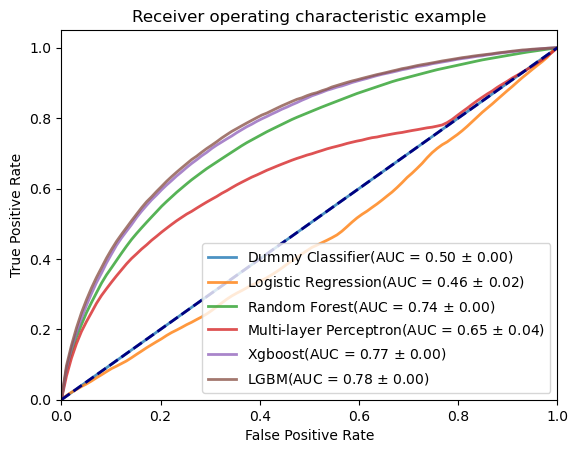

In [101]:
# Affichage de la courbe ROC pour les différents modèles testés
plot_roc_curve(classifiers_1, var_pipeline, X_train, y_train)

<u>Optimisation des hyper-paramètres</u>

Il s'agit d'une classification binaire 0 ou 1, solvable ou non, négatif ou positif.

Les individus dont la valeur cible réelle est 0 et dont la prédiction est 0 sont les 'True Negatives' dits aussi 'TN'

Les individus dont la valeur cible réelle est 0 alors que la prédiction est 1 sont les 'False Negatives' appelés aussi 'FN'

Les individus dont la valeur cible réelle est 1 alors que la prédiction est 0 sont les 'False Positives' appelés aussi 'FP'

Les individus dont la valeur cible réelle est 1 et dont la prédiction est 1 sont les 'True Positives' appelés aussi 'TP'


In [106]:
from imblearn.over_sampling import SMOTE
#Fonction d'optimisation pour le choix des hyperparamètres 
skf = StratifiedKFold(n_splits=5)
def model_v1(predictor, pipeline, features, eval_metric, cv=skf):
    
    
    # Extract the ids
    train_ids = features.index

    # Extract the targets for training
    targets = features['TARGET']
    
    # Remove the ids and target
    features = features.drop(columns=['TARGET'])
    
    # Extract feature names
    feature_names = list(features.columns)
    
    # Apply the pipeline
    features = pipeline.fit_transform(features)
    targets = np.array(targets)    
    
    # Increase the data to get a bigger proportion of positif targets
    sm = SMOTE(random_state=42, sampling_strategy=0.2) # the ratio is chosen
    # to correspond to the pareto law with the 80%/20% ratio

    features_res, targets_res = sm.fit_resample(features, targets.ravel())  

    def optim_score(params,
                    model=predictor,
                    x_train=features_res,
                    y_train=targets_res,
                    cv=cv,
                    eval_metric=eval_metric):

        # the function gets a set of variable parameters in "param"
        params_model = {'n_estimators': int(params['n_estimators']), 
                        'max_depth': int(params['max_depth']), 
                        'learning_rate': params['learning_rate'],
                        'subsample': params['subsample'],
                        'colsample_bytree': params['colsample_bytree'],
                        'num_leaves': int(params['num_leaves']),
                        'reg_alpha': params['reg_alpha'],
                        'reg_lambda': params['reg_lambda'],
        }

        # asssigne les paramètres du modèle
        model.set_params(**params_model)
        
        # Seuil de solvabilité
        threshold = params['solvability_threshold']

        # Cross-validation à 5 passes : retourne le score de probabilité
        y_proba = cross_val_predict(model,
                                    x_train,
                                    y_train,
                                    method='predict_proba',
                                    cv=cv)[:, 1]
       
        # Si proba > seuil alors la prédiction est positive : 1
        y_pred = (y_proba > threshold)
        y_pred = np.array(y_pred > 0) * 1
        
        # Calcul du score suivant la métrique utilisé
        score = eval_metric(y_train, y_pred)

        return 1 - score # Retourne le score

 
    # possible values of parameters
    space={'n_estimators': hp.quniform('n_estimators', 200, 1000, 200),
           'max_depth' : hp.quniform('max_depth', 2, 20, 2),
           'learning_rate': hp.loguniform('learning_rate', np.log(0.005), np.log(0.2)),
           'subsample': hp.quniform('subsample', 0.1, 1.0, 0.2),
           'colsample_bytree': hp.quniform('colsample_by_tree', 0.6, 1.0, 0.1),
           'num_leaves': hp.quniform('num_leaves', 4, 100, 4),
           'reg_alpha': hp.quniform('reg_alpha', 0.1, 1.0, 0.1),
           'reg_lambda': hp.quniform('reg_lambda', 0.1, 1.0, 0.1),
           'solvability_threshold': hp.quniform('solvability_threshold', 0.0, 1.0, 0.050)
    }


    best=fmin(fn=optim_score, # function to optimize
              space=space, 
              algo=tpe.suggest, # optimization algorithm, hyperotp will select its parameters automatically
              max_evals=10, # maximum number of iterations
    )

    # computing the score on the test set
    predictor.set_params(
                   n_estimators=int(best['n_estimators']),
                   max_depth=int(best['max_depth']),
                   learning_rate=best['learning_rate'],
                   subsample=best['subsample'],           
                   colsample_bytree=best['colsample_by_tree'],
                   num_leaves=int(best['num_leaves']),
                   reg_alpha=best['reg_alpha'],
                   reg_lambda=best['reg_lambda'],
                    
    )
    
    # Entrainement du modèle sur tout le jeux de données
    predictor.fit(features, targets)

    # Record the best parameters
    best_parameters = best
    
    # Assemblage de pipeline
    full_pipeline = define_pipeline(pipeline, predictor)

    # Record the feature importances
    feature_importance_values = full_pipeline[-1].feature_importances_
    
    # Make the feature importance dataframe
    feature_importances = pd.DataFrame({'feature': feature_names,
                                        'importance': feature_importance_values})

    return best_parameters, feature_importances, full_pipeline

Optimisation métrique métier

La métrique banking ici crée, consiste à calculer le gain obtenu pour l'ensemble des individus du jeu de données.

Pour cela nous avons fixé un poids arbitraire pour chacune des prédictions relativement à leurs valeurs réelles.

Les valeurs des poids sont les suivantes : - fn_value = -10 - tp_value = 0 - tn_value = 1 - fp_value = 0

De ce fait, les prêts accordés aux individus qui ne sont finalement pas solvables sont dotés d'une pénalisation négative de -10, alors que les prêts accordés aux individus finalement solvables rapportent 1. Ce rapport 10 est totalement arbitraire et il est tout à fait possible de changer ces valeurs à la convenance de l'optique métier. Il faudra cependant relancer l'optimisation des hyper-paramètres du modèle.


In [103]:
#Définition de la métrique 'banking'

def Ind_bank(y_true, y_pred, fn_value=-10, fp_value=0, tp_value=0, tn_value=1):

    # Matrice de Confusion
    mat_conf = confusion_matrix(y_true, y_pred)
    
    # Nombre de True Negatifs
    tn = mat_conf[0, 0]
    # Nombre de Faux Négatifs
    fn = mat_conf[1, 0]
    # Nombre de Faux Positifs
    fp = mat_conf[0, 1]
    # Nombre de True Positifs
    tp = mat_conf[1, 1]
    
    # Gain total
    J = tp*tp_value + tn*tn_value + fp*fp_value + fn*fn_value
    
    # Gain maximum
    max_J = (fp + tn)*tn_value + (fn + tp)*tp_value
    
    # Gain minimum
    min_J = (fp + tn)*fp_value + (fn + tp)*fn_value
    
    # Gain normalisé entre 0 et 1
    J_normalized = (J - min_J)/(max_J - min_J)
    
    return J_normalized  # Retourne la fonction d'évaluation



In [107]:
best_parameters_0, feature_importance_0, clf_0 = model_v1(LGBMClassifier(),
                                                          var_pipeline,
                                                          train_set,
                                                          eval_metric=Ind_bank)

100%|██████████| 10/10 [18:28<00:00, 110.84s/trial, best loss: 0.2134375420085326]


In [108]:
# Affichage des meilleurs hyper-paramètres
best_parameters_0

{'colsample_by_tree': 0.8,
 'learning_rate': 0.019177061048656952,
 'max_depth': 16.0,
 'n_estimators': 200.0,
 'num_leaves': 96.0,
 'reg_alpha': 0.4,
 'reg_lambda': 0.4,
 'solvability_threshold': 0.1,
 'subsample': 0.6000000000000001}

Remarque:

Le meilleur seuil de solvabilité est de 0.1, i.e tous les individus dont les valeurs de prédictions sont inférieurs à 0.1 ne sont pas solvables.


In [109]:
# Sauvegarde du modèle banking
pickle.dump(clf_0, open('banking_model.md', 'wb'))

In [110]:
# Evolution du gain en fonction du seuil de solvabilité

def gain_seuil(clf, y_set, x_set):
    
    """
    Evolution du gain en fonction du seuil de solvabilité fixé
    Si score < seuil : client solvable
    Sinon : client non solvable
    
    """
    cost_function = []
    threshold_x = np.linspace(0.0, 1, 20)
    
    for threshold in threshold_x:
        
        # Score du modèle : 0 à 1
        y_scores = clf.predict_proba(x_set)[:, 1]
        
        # Score > seuil de solvabilité : retourne 1 sinon 0
        y_pred = (y_scores > threshold)
        
        y_pred = np.array(y_pred > 0) * 1
        # Calcul de l'indice bancaire
        cost_function.append(Ind_bank(y_set, y_pred))
        
    # Affichage du gain en fonction du seuil de solvabilité    
    plt.plot(threshold_x, cost_function)
    plt.xlabel("Seuil de probabilité")
    plt.ylabel("Indice banquaire")
    plt.xticks(np.linspace(0.1, 1, 10))
    

In [115]:
X_test.columns

Index(['CREDIT_ANNUITY_RATIO', 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
       'INST_PAY_NUM_INSTALMENT_VERSION_SUM', 'EXT_SOURCE_MAX',
       'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
       'PREV_APP_NAME_CONTRACT_STATUS_MEAN', 'BUREAU_AMT_CREDIT_SUM_SUM',
       'EXT_SOURCE_VAR', 'DAYS_LAST_PHONE_CHANGE',
       'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
       'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
       'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN', 'PREV_APP_SELLERPLACE_AREA_MEAN',
       'PREV_APP_INTEREST_SHARE_MEAN', 'PREV_APP_DAYS_FIRST_DUE_SUM',
       'BUREAU_DAYS_CREDIT_MEAN', 'PREV_APP_AMT_ANNUITY_SUM', 'OWN_CAR_AGE',
       'FLAGS_DOCUMENTS_SUM', 'INST_PAY_DAYS_INSTALMENT_MAX',
       'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
       'INST_PAY_AMT_PAYMENT_DIFF_MEAN', 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
       'POS_CASH_SK_DPD_DEF_MEAN', 'CCB_BALANCE_LIMIT_RATIO_MEAN',
       'PREV_APP_CNT_PAYMENT_MEAN', 'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
       'FLAG_OWN_CAR', 'PREV_APP_INTEREST_SHARE_MIN',
   

______

In [116]:
# Optimisation pour la métrique 'roc_auc'
best_parameters_1, feature_importance_1, clf_1 = model_v1(LGBMClassifier(),
                                                          var_pipeline,
                                                          train_set,
                                                          eval_metric=f1_score)



100%|██████████| 10/10 [21:33<00:00, 129.40s/trial, best loss: 0.29829089489437377]


In [117]:
# Affichage des meilleurs hyper-paramètres
best_parameters_1

{'colsample_by_tree': 0.8,
 'learning_rate': 0.1637853599904821,
 'max_depth': 14.0,
 'n_estimators': 400.0,
 'num_leaves': 64.0,
 'reg_alpha': 0.7000000000000001,
 'reg_lambda': 0.30000000000000004,
 'solvability_threshold': 0.45,
 'subsample': 0.8}

In [118]:
#Sauvegarde des résultats:
filename = 'banking001.md'
# Sauvegarde du modèle
pickle.dump(clf_1, open(filename, 'wb'))

La comparaison des deux matrices de confusion pour la métrique spécifique métier et la métrique technique, montre qu'il y a moins de clients 'True negatifs' mais également moins de 'False negatifs'.

C'est à dire que plus de clients ne se sont pas vus accordés de prêts alors qu'ils étaient solvables, mais à l'inverse moins de clients ont été prédits solvables alors qu'ils ne l'étaient pas. 

Ce que l'on a essayé par la construction d'une métrique métier est donc vérifié. Le bilan est in fine supérieur pour la métrique métier, à condition d'avoir posé les bons poids au départ.

Remarque: 
 En revanche le gain en rappel est très important, ce qui était ou à fait prédictible puisque nous avons fortement pénalisé les 'False Negatives'. Le gain est in fine plus important pour l'optimisation via la métrique bancaire comme nous l'avons vu ci-dessus.

In [ ]:
# Sauvegarde des prédictions
test_set.to_csv("app_test.csv")
app_test_no_encoded.to_csv("app_test_no_encoded_no_featureengineering.csv")



______
___

# Conclusion : 

Après l'ensemble des analyses (EDA) et features engineering réalisée sur l'ensemble des jeu données :

    Les différents étapes:
    - Analyse Univariée/Multivariée
    - Merge des dataframes
    - Corrélation des variables
    - Mode/median complétion
    - Feature Corrélation (rfcev) ||Dimunition plusieur centaines de features
    - Equilibrage du jeu de donnée (SMOTE)
    - Mise en place de métrique et des modèles (Score AUC)
    - Score métier (pour pénaliser les faux positif et négative)
    - Suivie et enregistrement de modèles grace MLFlow  

En conclusion, nous avons comparé plusieurs modèles de classification : XGBClassifier, LGBMClassifier et CatBoostClassifier. Nous avons constaté que le XGBClassifier est le meilleur modèle en termes d'AUC avec un score de 0,73, suivi par le LGBMClassifier et le CatBoostClassifier. Cependant, lorsque nous avons pris en compte le temps de calcul, le LGBMClassifier s'est avéré être le modèle le plus performant.

Nous avons également noté que le CatBoostClassifier nécessite beaucoup plus de temps de calcul, ce qui ne le rend peut moins intéressant  pour le contexte métier actuel. En revanche, le XGBClassifier est très rapide, mais avec une baisse de l'AUC score.

Pour évaluer les performances du modèle, nous avons considéré la fonction de coût qui prend en compte les pertes financières associées aux erreurs de prédiction. 
Nous avons identifié deux types d'erreurs : les faux positifs et les faux négatifs, qui ont des conséquences différentes sur les pertes. Ainsi, pour minimiser les pertes, il est essentiel de pénaliser les faux positifs et les faux négatifs.

En conclusion, pour maximiser les performances du modèle, nous devrons prendre en compte les critères de rappel et de précision, en plus de l'AUC. 

Cela permettra de minimiser les pertes associées aux erreurs de prédiction et de maximiser la satisfaction client.
=> On ce qui concerne notamment l'accord du crédit par la banque avec le moins de risque. 

